# Table of contents
[Libraries Used](#lib)

Part I: [Read data and EDA](#DataLoading)

Part II: [Feature selection and correlation](#featureselection)

Part III: [Model selection and data training](#modelselection)

Part IV: [Exploration-exploitation](#exp-exp)

In [1]:
import numpy as np
from rdkit import Chem as CH
from rdkit.Chem import Descriptors
from rdkit.Chem.rdMolDescriptors import CalcMolFormula
from rdkit.Chem import AllChem
import pubchempy as pcp
from pymatgen.core.composition import Composition
from matminer.featurizers.composition import ElectronAffinity
from matminer.featurizers.composition import ElementFraction



import pandas as pd
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt

#Own functions

import IC_calculator
import RDkit_Desc        #For SPAN and GeDi


# SKlearn libraries for learning.
from sklearn.model_selection import cross_val_score, cross_val_predict, KFold, RepeatedKFold
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.model_selection import ShuffleSplit, cross_validate, train_test_split
from sklearn import linear_model 
from xgboost import XGBRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn import kernel_ridge
from sklearn.utils import resample
from sklearn.metrics import r2_score
import xgboost as xgb
import lightgbm as lgbm
from catboost import CatBoostRegressor as CBRegressor




# SKlearn libraries for evaluation.
from sklearn import metrics
from sklearn.metrics import r2_score, mean_squared_error,mean_absolute_error
from sklearn.feature_selection import SelectFromModel

#Generating features (specially SPAN and GeDi) for all the molecules takes time
#So I have saved them in a file called "filtered_planar_mol_by_fit_with_features"
#Set True if using a different set of planar molecules.
gen_planar_mol_feat=False    

# Part I: Read data and EDA

<a id="DataLoading"></a>

### 1. Planar molecule dataset

In [2]:
if gen_planar_mol_feat == True:
    planar_mol = pd.read_csv('DataSource/filtered_planar_mol_by_fit.txt', index_col = None, delimiter = ',')
    smiles = planar_mol['SMILES']
    cid = planar_mol['CID']
    TPSA = []
    mol_weight = []
    aromatic_rings = []
    num_heavy_atoms = []
    LabuteASA = []
    SPAN = []
    GEDI = []

    #Getting gas-features from SMILES using rdkit
    for i in range(len(smiles)):
        m = CH.MolFromSmiles(smiles[i])
        mh = CH.AddHs(m)
        AllChem.EmbedMolecule(mh)
        TPSA.append(Descriptors.TPSA(m))
        mol_weight.append(Descriptors.MolWt(m))
        aromatic_rings.append(Descriptors.NumAromaticRings(m))
        num_heavy_atoms.append(Descriptors.HeavyAtomCount(m))
        LabuteASA.append(Descriptors.LabuteASA(m))
        SPAN.append(RDkit_Desc.get_SPAN(mh,None))
        GEDI.append(RDkit_Desc.get_GeDi(mh))

    planar_mol['TPSA'] = TPSA
    planar_mol['HeavyAtoms'] = num_heavy_atoms
    planar_mol['AromaticRings'] = aromatic_rings
    planar_mol['MolWt'] = mol_weight
    planar_mol['LabuteASA'] = LabuteASA
    planar_mol['SPAN'] = SPAN
    planar_mol['GeDi'] = GEDI
    planar_mol = planar_mol.astype({'CID' :'str'})
    planar_mol
    #planar_mol.to_csv('DataSource/filtered_planar_mol_by_fit_with_features.txt', index=False)

In [3]:
planar_mol = pd.read_csv('DataSource/filtered_planar_mol_by_fit_with_features', index_col = None, delimiter = ',')
planar_mol = planar_mol.astype({'CID' :'str'})
planar_mol

,CID,SMILES,TPSA,HeavyAtoms,AromaticRings,MolWt,LabuteASA,SPAN,GeDi
0,13,C1=CC(=C(C=C1Cl)Cl)Cl,0.00,9,1,181.449,68.341202,3.481711,6.260667
1,66,C1=CC(=C(C=C1Cl)O)Cl,20.23,9,1,163.003,62.832169,3.313690,6.323829
2,101,C1=CC(=CC(=C1)O)C=O,37.30,9,1,122.123,52.752101,3.360840,6.313907
3,240,C1=CC=C(C=C1)C=O,17.07,8,1,106.124,47.957867,3.345250,6.138852
4,241,C1=CC=CC=C1,0.00,6,1,78.114,37.431403,2.494200,4.970533
...,...,...,...,...,...,...,...,...,...
10113,5367417,C=CC=CC=C,0.00,6,0,80.130,38.495153,3.942085,7.841565
10114,137747,C=C=C=C,0.00,4,0,52.076,25.765268,2.701678,5.242299
10115,5463058,CC=CC=CC=C,0.00,7,0,94.157,44.860095,4.174226,8.014709
10116,139187,C=CC=C=C,0.00,5,0,66.103,32.130210,3.220374,6.013381


## 2. 2D materials dataset

In [4]:
TwoD_mat = pd.read_csv('DataSource/Bilayer-Bulk_TotalEnergy.txt', delimiter = ',')
SepBL = pd.read_csv('DataSource/SeparatedBilayerEnergy.txt', delimiter=',')
LC = pd.read_csv('DataSource/LC.txt', delimiter = ',')
SepE = []
HalfSet = int(len(TwoD_mat)/2)

BilayerEnergy = TwoD_mat.iloc[:HalfSet,:]

name = []
for i in BilayerEnergy['Material']:
    strip_text = str(i).strip('struc_Bilayer_')
    name.append(strip_text)
    
BilayerEnergy['Name'] = pd.DataFrame(name)   
SepBL = SepBL.merge(BilayerEnergy, on=["Name"], how="left")
SepBL['SeperationE'] = SepBL['IC'] - SepBL['E']
MaterialFeatures = SepBL.merge(LC, on=["Material"], how="left")

MaterialFeatures.drop(['IC', 'E', 'Material'], axis=1, inplace=True)
MaterialFeatures['a'] = MaterialFeatures['a']/3
MaterialFeatures['b'] = MaterialFeatures['b']/3
MaterialFeatures

MatFormula = []

for i in MaterialFeatures['Name']:
    i = i.replace("Mo", "Mo18")
    i = i.replace("W", "W18")
    i = i.replace("Hf", "Hf18")
    i = i.replace("Ti", "Ti18")
    i = i.replace("Cr", "Cr18")
    i = i.replace("Zr", "Zr18")
    i = i.replace("S2", "S36")
    i = i.replace("Se2", "Se36")
    i = i.replace("Te2", "Te36")
    i = i.replace("O2", "O36")
    MatFormula.append(i)
 
MaterialFeatures['MatFormula'] = pd.DataFrame(MatFormula)
#MaterialFeatures.to_csv('MaterialFeatures', index=False)
MaterialFeatures = MaterialFeatures[(MaterialFeatures.Name != 'ZrO2') & (MaterialFeatures.Name != 'HfO2') & (MaterialFeatures.Name != 'TiO2')]
MaterialFeatures

/Users/sriharik/miniconda3/envs/nano281/lib/python3.7/site-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,Name,SeperationE,a,b,c,SG,MatFormula
0,MoS2,1.766763,3.154333,3.154333,27.427,164.0,Mo18S36
1,MoSe2,2.056959,3.285000,3.285000,28.094,164.0,Mo18Se36
2,MoTe2,2.636494,3.493333,3.493333,28.999,164.0,Mo18Te36
3,MoO2,1.202318,2.828333,2.828333,25.010,164.0,Mo18O36
4,WS2,1.865270,3.162333,3.162333,27.460,164.0,W18S36
5,WSe2,2.142525,3.291667,3.291667,28.154,164.0,W18Se36
6,WTe2,2.694539,3.508333,3.508333,29.028,164.0,W18Te36
7,WO2,1.340843,2.832333,2.832333,25.022,164.0,W18O36
8,HfS2,1.844773,3.531667,3.531667,27.360,164.0,Hf18S36
9,HfSe2,2.075391,3.678000,3.678000,27.514,164.0,Hf18Se36


## 3. Intercalation Dataset

In [5]:
IC_1 = pd.read_csv('DataSource/IC_energy1.txt', delimiter =',')
IC_2 = pd.read_csv('DataSource/IC_energy2.txt', delimiter =',')
IC_3 = pd.read_csv('Results_Code_1/IC_THN_1.txt', delimiter =',')
IC_4 = pd.read_csv('Results_Code_1/IC_THU_1.txt', delimiter =',')


Gas = pd.read_csv('DataSource/Energy_gas.txt' , delimiter=',')
Gas_3 = pd.read_csv('Results_Code_1/Gas_THN_1.txt', delimiter =',')
Gas_4 = pd.read_csv('Results_Code_1/Gas_THU_1.txt', delimiter =',')
Bilayer = pd.read_csv('DataSource/BilayerEnergy.txt', delimiter=',')

IC1 = IC_calculator.IC_calculator(IC_1, Gas, Bilayer)
IC2 = IC_calculator.IC_calculator(IC_2, Gas, Bilayer)
IC3 = IC_calculator.IC_calculator(IC_3, Gas_3, Bilayer)
IC4 = IC_calculator.IC_calculator(IC_4, Gas_4, Bilayer)
IC = pd.concat([IC1, IC2, IC3, IC4], axis=0).drop_duplicates()
IC

,System,Name,CID,IC_ENERGY
0,12606301_CrS2_0,CrS2,12606301,0.134932
1,12606301_CrSe2_0,CrSe2,12606301,0.466738
2,12606301_CrTe2_0,CrTe2,12606301,1.030505
3,12606301_HfS2_0,HfS2,12606301,-0.796573
4,12606301_HfSe2_0,HfSe2,12606301,-0.156093
...,...,...,...,...
143,89173479_CrO2_0,CrO2,89173479,-0.917547
144,90280628_CrO2_0,CrO2,90280628,-0.594056
145,90955800_CrO2_0,CrO2,90955800,-0.676058
146,91591722_CrO2_0,CrO2,91591722,-0.963077


## 4. Merging the three datasets above

In [6]:
Merge_2_3 = IC.merge(MaterialFeatures, on=["Name"], how="right")
FinalSet = Merge_2_3.merge(planar_mol, on=["CID"], how="left").dropna()
#FinalSet = FinalSet[FinalSet.CID != '88957274']

## We want the fractional composition of constituent elements as features. 
## The following lines do that...

gas_formula = []
for i in FinalSet['SMILES']:
    m = CH.MolFromSmiles(i)
    gas_formula.append(CalcMolFormula(m))

FinalSet['Gas_Formula'] = gas_formula
FinalSet['CompoundFormula'] = FinalSet['MatFormula']+FinalSet['Gas_Formula']

Comp = []
for i in FinalSet['CompoundFormula']:
    Comp.append(Composition(i))
    
FinalSet['Composition'] = Comp
from matminer.featurizers.composition import ElementFraction
from matminer.featurizers.composition import Stoichiometry

FinalSet = ElementFraction().featurize_dataframe(FinalSet, 'Composition')

FinalSet = FinalSet.drop_duplicates(subset=['System'])
### Making a copy of Final Set with 'Name', 'SMILES', 'CID'. 
### This is for when we use Final Set and merge it with PredictionSet to make ExploitSet
MergeWithPredictionSet = FinalSet.drop(['b', 'SG', 'c', 'Composition','Gas_Formula', 'CompoundFormula', 'MatFormula', 'MolWt', 'LabuteASA', 'HeavyAtoms'], axis = 1)

### FinalSet for developing ML model
FinalSet = FinalSet.drop(['b', 'SMILES', 'SG', 'c', 'Composition', 'Name', 'CID','Gas_Formula', 'CompoundFormula', 'MatFormula','MolWt','LabuteASA', 'HeavyAtoms'], axis = 1)

## For plotting feature correlation
PlotSet = FinalSet.loc[:, (FinalSet != 0).any(axis=0)] 

FinalSet =FinalSet[FinalSet['IC_ENERGY'] < 10]
FinalSet =FinalSet[FinalSet['IC_ENERGY'] > -4]

ElementFraction:   0%|          | 0/503 [00:00<?, ?it/s]

In [7]:
FinalSet

,System,IC_ENERGY,SeperationE,a,TPSA,AromaticRings,SPAN,GeDi,H,He,...,Pu,Am,Cm,Bk,Cf,Es,Fm,Md,No,Lr
2,137161100_MoS2_0,0.435827,1.766763,3.154333,63.05,2.0,3.050890,5.910676,0.044118,0,...,0,0,0,0,0,0,0,0,0,0
6,154148619_MoS2_0,0.219380,1.766763,3.154333,45.75,2.0,4.867923,7.441902,0.044118,0,...,0,0,0,0,0,0,0,0,0,0
8,20197826_MoS2_0,0.523010,1.766763,3.154333,12.89,0.0,3.781485,5.781853,0.046154,0,...,0,0,0,0,0,0,0,0,0,0
9,20405740_MoS2_0,0.749361,1.766763,3.154333,51.81,2.0,3.281336,5.952812,0.045455,0,...,0,0,0,0,0,0,0,0,0,0
10,45080076_MoS2_0,0.280013,1.766763,3.154333,43.08,3.0,3.485019,6.566693,0.057971,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
705,45088201_ZrTe2_0,0.058415,2.625600,3.495000,17.29,0.0,3.366768,6.273502,0.058824,0,...,0,0,0,0,0,0,0,0,0,0
706,52933224_ZrTe2_0,0.579860,2.625600,3.495000,30.19,2.0,4.062745,7.943668,0.044118,0,...,0,0,0,0,0,0,0,0,0,0
709,69903064_ZrTe2_0,0.588294,2.625600,3.495000,87.96,0.0,2.789645,5.114125,0.015625,0,...,0,0,0,0,0,0,0,0,0,0
710,83382722_ZrTe2_0,0.699055,2.625600,3.495000,30.19,2.0,3.977433,6.094852,0.058824,0,...,0,0,0,0,0,0,0,0,0,0


# Part II: Feature Selection and Correlation

<a id="featureselection"></a>

Text(0.5, 1.0, 'Features Correlating with IC energy')

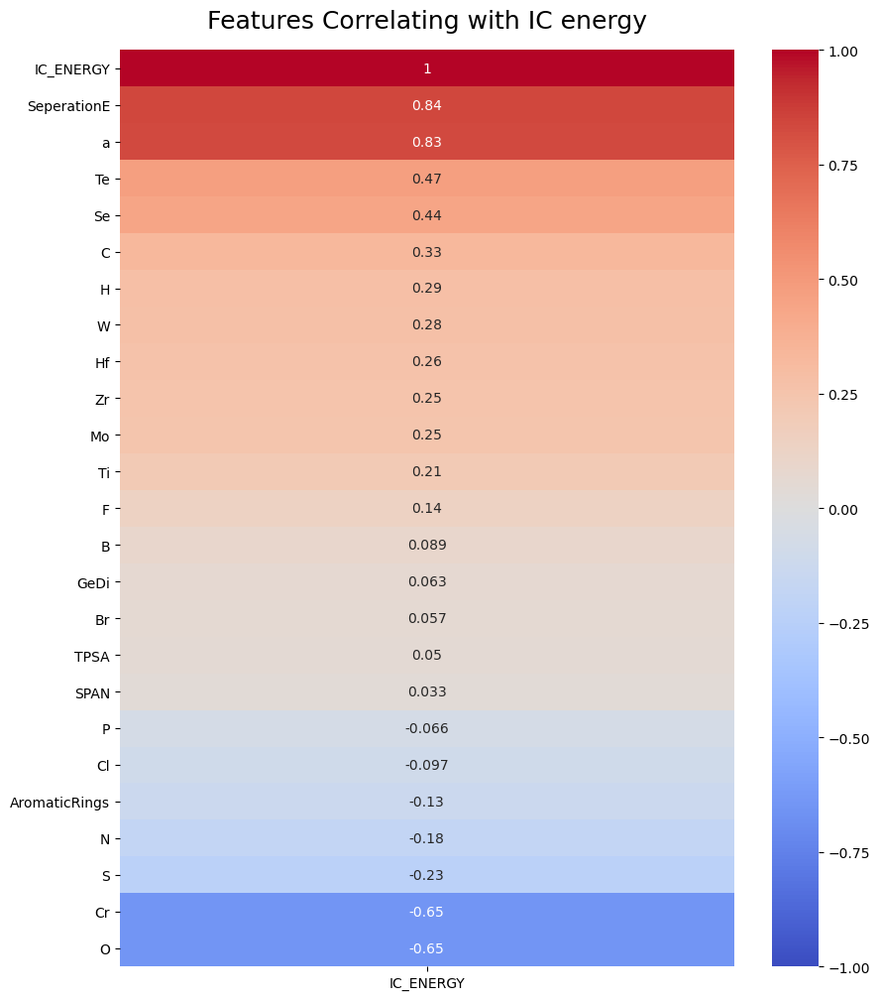

In [8]:
plt.figure(figsize=(10, 12))
matrix = (PlotSet.corr(method = 'spearman')).round(3)
matrix = matrix[~np.isnan(matrix)]


heatmap = sns.heatmap(matrix[['IC_ENERGY']].sort_values(by='IC_ENERGY', ascending=False), vmin=-1, vmax=1, annot=True, cmap='coolwarm')
heatmap.set_title('Features Correlating with IC energy', fontdict={'fontsize':18}, pad=16)

# Part III: Model Selection and Data Training

<a id="modelselection"></a>

In [9]:
exclude = ['IC_ENERGY', 'System']
features = [c for c in FinalSet.columns if c not in exclude]
X = FinalSet[features]
y = FinalSet["IC_ENERGY"]

## Evaluating performance of various models

In [10]:
#Lets use train/split ratio of 70/30 - Use ShuffleSplit
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)


# Use some linear reg model and some with boosting capabilities

hyper_params_lgbm = {
    "objective" : "multiclass",
    'task': 'train',
    'boosting_type': 'gbdt',
    'objective': 'regression',
    'n_estimators': 500,
    "verbosity" : -1 
}

hyper_params_xgb = { 
    'objective': 'reg:squarederror',  # error evaluation for multiclass tasks
    'n_estimators': 500,
    'eval_metric': mean_absolute_error
    }

hyper_params_cb = {   
    'n_estimators': 500,
    'eval_metric': mean_absolute_error
    }

#Use ShuffleSplit for cross validation of dataset. Kfold also gives similar result
cv_split = ShuffleSplit(n_splits = 5, test_size = 0.30, random_state = 42)

# Initializing the Algorithms # I have tried a couple of them. Just showing a handful here
algorithm_list = {'LinearReg': linear_model.LinearRegression(), 
                  'BayeRidge':linear_model.BayesianRidge(),
                  'LassoLars': linear_model.LassoLars(alpha=0.01),
                  'LeastAngLars':linear_model.Lars(),
                  'XgbostReg': xgb.XGBRegressor(**hyper_params_xgb),
                  'LGBMReg': lgbm.LGBMRegressor(**hyper_params_lgbm),
                  'CatBoost' : CBRegressor(),
                  'KernelRidge' : kernel_ridge.KernelRidge(alpha=1,kernel='poly',gamma=None,degree=3,coef0=1,kernel_params=None)
                 }

test_R2 = []
train_R2 = []
ad_R2 = []
CV_R2 = []
CV_R2_std = []
mse = []
mae = []
std = []
mape = []
mod = []
mod_call_name = []
ModelMetrics = pd.DataFrame()
# Fit the various model
for key,model in algorithm_list.items():
    try:
        if key == 'XgbostReg' or key == 'LGBMReg' or key == 'CatBoost':
            model.fit(X_train, y_train,early_stopping_rounds=100,eval_set=[(X_test, y_test)])
        else:
            model.fit(X_train, y_train)
        # Cross-validate the result to avoid over fitting
        cv_results = cross_validate(model, X_train, y_train, cv  = cv_split)
#        cv_results = RepeatedKFold(n_splits = 5, n_repeats = 3, random_state = 42)
        adj_R2 = 1 - (1-model.score(X_train, y_train))*(len(y_train)-1)/(len(y_train)-X_train.shape[1]-1)
        y_pred = model.predict(X_test) 
        # Print model and test metrics
        print(f'Model - {key: <5} || Model Score: %.3f, Adj_R^2: %.3f, Test Score: %.3f, Cross Val Score: %.3f' 
              %(model.score(X_train, y_train),adj_R2, model.score(X_test, y_test), cv_results.get('test_score').mean()))
        mod.append(key)
        test_R2.append(model.score(X_test, y_test))
        train_R2.append(model.score(X_train, y_train))
        ad_R2.append(adj_R2)
        CV_R2.append(cv_results.get('test_score').mean())
        CV_R2_std.append(cv_results.get('test_score').std())
        
        print(f'Model - {key: <5} || MSE: %.3f, MAE: %.3f, STD: %.3f, MAPE: %.3f%%' 
              %(metrics.mean_squared_error(y_test, y_pred), metrics.mean_absolute_error(y_test, y_pred), 
                cv_results.get('test_score').std(), metrics.mean_absolute_percentage_error(y_test, y_pred)*100))
        mse.append(metrics.mean_squared_error(y_test, y_pred))
        mae.append(metrics.mean_absolute_error(y_test, y_pred))
        std.append(cv_results.get('test_score').std())
        mape.append(metrics.mean_absolute_percentage_error(y_test, y_pred)*100)
        mod_call_name.append(model)
        
        print(f'Model - {key: <5}  || Cross Validation Progress: \n')
        print(pd.DataFrame(cv_results))
        print('----------------------------------------------------------------------------------------------------------')
    except Exception as e:
        print(f"Exception occurred in {str(e)}")
        pass 



ModelMetrics['Model'] = mod
ModelMetrics['Train_R2'] = train_R2
ModelMetrics['Adjusted_R2'] = ad_R2
ModelMetrics['Test_R2'] = test_R2
ModelMetrics['CV_R2'] = CV_R2
ModelMetrics['Std_in_CV'] = CV_R2_std
ModelMetrics['MSE'] = mse
ModelMetrics['MAE'] = mae
ModelMetrics['STD'] = std
ModelMetrics['MAPE'] = mape

Model - LinearReg || Model Score: 0.905, Adj_R^2: 0.844, Test Score: 0.881, Cross Val Score: 0.879
Model - LinearReg || MSE: 0.050, MAE: 0.166, STD: 0.008, MAPE: 118.632%
Model - LinearReg  || Cross Validation Progress: 

   fit_time  score_time  test_score
0  0.014345    0.002831    0.882788
1  0.006254    0.002542    0.877334
2  0.012375    0.002498    0.883179
3  0.004121    0.002077    0.864765
4  0.011016    0.002829    0.889207
----------------------------------------------------------------------------------------------------------
Model - BayeRidge || Model Score: 0.888, Adj_R^2: 0.816, Test Score: 0.872, Cross Val Score: 0.873
Model - BayeRidge || MSE: 0.054, MAE: 0.179, STD: 0.016, MAPE: 129.359%
Model - BayeRidge  || Cross Validation Progress: 

   fit_time  score_time  test_score
0  0.008424    0.002199    0.875624
1  0.006472    0.002140    0.877175
2  0.007621    0.002087    0.890478
3  0.007426    0.002047    0.842888
4  0.006505    0.002085    0.878278
-----------------

/Users/sriharik/miniconda3/envs/nano281/lib/python3.7/site-packages/sklearn/linear_model/_base.py:138: FutureWarning: The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLars())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  FutureWarning,
/Users/sriharik/miniconda3/envs/nano281/lib/python3.7/site-packages/sklearn/linear_model/_base.py:138: FutureWarning: The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the dat

[6]	validation_0-rmse:0.17202
[7]	validation_0-rmse:0.16204
[8]	validation_0-rmse:0.15673
[9]	validation_0-rmse:0.15489
[10]	validation_0-rmse:0.15144
[11]	validation_0-rmse:0.15142
[12]	validation_0-rmse:0.15188
[13]	validation_0-rmse:0.15085
[14]	validation_0-rmse:0.14903
[15]	validation_0-rmse:0.14896
[16]	validation_0-rmse:0.14871
[17]	validation_0-rmse:0.14843
[18]	validation_0-rmse:0.14808
[19]	validation_0-rmse:0.14791
[20]	validation_0-rmse:0.14726
[21]	validation_0-rmse:0.14740
[22]	validation_0-rmse:0.14742
[23]	validation_0-rmse:0.14640
[24]	validation_0-rmse:0.14637
[25]	validation_0-rmse:0.14613
[26]	validation_0-rmse:0.14656
[27]	validation_0-rmse:0.14668
[28]	validation_0-rmse:0.14740
[29]	validation_0-rmse:0.14773
[30]	validation_0-rmse:0.14778
[31]	validation_0-rmse:0.14752
[32]	validation_0-rmse:0.14739
[33]	validation_0-rmse:0.14730
[34]	validation_0-rmse:0.14727
[35]	validation_0-rmse:0.14746
[36]	validation_0-rmse:0.14713
[37]	validation_0-rmse:0.14728
[38]	validat

/Users/sriharik/miniconda3/envs/nano281/lib/python3.7/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


Model - LGBMReg || Model Score: 0.982, Adj_R^2: 0.971, Test Score: 0.944, Cross Val Score: 0.881
Model - LGBMReg || MSE: 0.023, MAE: 0.123, STD: 0.026, MAPE: 47.681%
Model - LGBMReg  || Cross Validation Progress: 

   fit_time  score_time  test_score
0  0.052241    0.002353    0.883867
1  0.052772    0.002292    0.919333
2  0.098885    0.002508    0.837278
3  0.051774    0.002282    0.877133
4  0.052708    0.002286    0.885824
----------------------------------------------------------------------------------------------------------
Learning rate set to 0.041697
0:	learn: 0.6843712	test: 0.6340873	best: 0.6340873 (0)	total: 53.3ms	remaining: 53.2s
1:	learn: 0.6655212	test: 0.6150850	best: 0.6150850 (1)	total: 53.7ms	remaining: 26.8s
2:	learn: 0.6464316	test: 0.5963125	best: 0.5963125 (2)	total: 54.2ms	remaining: 18s
3:	learn: 0.6266693	test: 0.5773507	best: 0.5773507 (3)	total: 54.5ms	remaining: 13.6s
4:	learn: 0.6095307	test: 0.5614183	best: 0.5614183 (4)	total: 54.9ms	remaining: 10.9s

238:	learn: 0.1169837	test: 0.1556505	best: 0.1556505 (238)	total: 155ms	remaining: 494ms
239:	learn: 0.1168690	test: 0.1554976	best: 0.1554976 (239)	total: 156ms	remaining: 494ms
240:	learn: 0.1165880	test: 0.1553760	best: 0.1553760 (240)	total: 156ms	remaining: 492ms
241:	learn: 0.1162454	test: 0.1550957	best: 0.1550957 (241)	total: 157ms	remaining: 491ms
242:	learn: 0.1160284	test: 0.1548699	best: 0.1548699 (242)	total: 157ms	remaining: 490ms
243:	learn: 0.1158718	test: 0.1548040	best: 0.1548040 (243)	total: 158ms	remaining: 489ms
244:	learn: 0.1154687	test: 0.1543877	best: 0.1543877 (244)	total: 158ms	remaining: 488ms
245:	learn: 0.1150285	test: 0.1541775	best: 0.1541775 (245)	total: 159ms	remaining: 487ms
246:	learn: 0.1148628	test: 0.1541462	best: 0.1541462 (246)	total: 159ms	remaining: 486ms
247:	learn: 0.1145101	test: 0.1540477	best: 0.1540477 (247)	total: 160ms	remaining: 485ms
248:	learn: 0.1142380	test: 0.1536659	best: 0.1536659 (248)	total: 160ms	remaining: 484ms
249:	learn

580:	learn: 0.0663233	test: 0.1425612	best: 0.1425464 (571)	total: 329ms	remaining: 237ms
581:	learn: 0.0661813	test: 0.1424973	best: 0.1424973 (581)	total: 330ms	remaining: 237ms
582:	learn: 0.0660927	test: 0.1423374	best: 0.1423374 (582)	total: 331ms	remaining: 236ms
583:	learn: 0.0660240	test: 0.1423390	best: 0.1423374 (582)	total: 331ms	remaining: 236ms
584:	learn: 0.0658978	test: 0.1423665	best: 0.1423374 (582)	total: 332ms	remaining: 235ms
585:	learn: 0.0657488	test: 0.1423743	best: 0.1423374 (582)	total: 332ms	remaining: 235ms
586:	learn: 0.0657122	test: 0.1423715	best: 0.1423374 (582)	total: 332ms	remaining: 234ms
587:	learn: 0.0656298	test: 0.1423566	best: 0.1423374 (582)	total: 333ms	remaining: 233ms
588:	learn: 0.0654042	test: 0.1423163	best: 0.1423163 (588)	total: 333ms	remaining: 233ms
589:	learn: 0.0652706	test: 0.1423495	best: 0.1423163 (588)	total: 334ms	remaining: 232ms
590:	learn: 0.0652536	test: 0.1423728	best: 0.1423163 (588)	total: 334ms	remaining: 231ms
591:	learn

61:	learn: 0.2779576	total: 30.6ms	remaining: 463ms
62:	learn: 0.2760287	total: 31.9ms	remaining: 474ms
63:	learn: 0.2744114	total: 32.6ms	remaining: 477ms
64:	learn: 0.2720656	total: 33.1ms	remaining: 476ms
65:	learn: 0.2702586	total: 33.6ms	remaining: 476ms
66:	learn: 0.2676667	total: 34.3ms	remaining: 477ms
67:	learn: 0.2652909	total: 35ms	remaining: 479ms
68:	learn: 0.2631731	total: 35.9ms	remaining: 485ms
69:	learn: 0.2614155	total: 36.6ms	remaining: 486ms
70:	learn: 0.2597144	total: 37.1ms	remaining: 485ms
71:	learn: 0.2575796	total: 37.6ms	remaining: 485ms
72:	learn: 0.2557466	total: 38.1ms	remaining: 484ms
73:	learn: 0.2539741	total: 38.6ms	remaining: 484ms
74:	learn: 0.2522971	total: 39.2ms	remaining: 484ms
75:	learn: 0.2505602	total: 39.6ms	remaining: 482ms
76:	learn: 0.2486607	total: 40.2ms	remaining: 482ms
77:	learn: 0.2466683	total: 40.7ms	remaining: 481ms
78:	learn: 0.2449642	total: 41.5ms	remaining: 484ms
79:	learn: 0.2430112	total: 41.9ms	remaining: 482ms
80:	learn: 0.2

544:	learn: 0.0812910	total: 203ms	remaining: 169ms
545:	learn: 0.0810700	total: 204ms	remaining: 169ms
546:	learn: 0.0809842	total: 204ms	remaining: 169ms
547:	learn: 0.0807299	total: 204ms	remaining: 168ms
548:	learn: 0.0806331	total: 205ms	remaining: 168ms
549:	learn: 0.0805328	total: 205ms	remaining: 168ms
550:	learn: 0.0804112	total: 205ms	remaining: 167ms
551:	learn: 0.0802097	total: 206ms	remaining: 167ms
552:	learn: 0.0801905	total: 206ms	remaining: 167ms
553:	learn: 0.0800417	total: 207ms	remaining: 166ms
554:	learn: 0.0799209	total: 207ms	remaining: 166ms
555:	learn: 0.0796653	total: 207ms	remaining: 166ms
556:	learn: 0.0795436	total: 208ms	remaining: 165ms
557:	learn: 0.0793266	total: 208ms	remaining: 165ms
558:	learn: 0.0792855	total: 208ms	remaining: 164ms
559:	learn: 0.0791991	total: 209ms	remaining: 164ms
560:	learn: 0.0790151	total: 209ms	remaining: 164ms
561:	learn: 0.0789450	total: 210ms	remaining: 163ms
562:	learn: 0.0788404	total: 210ms	remaining: 163ms
563:	learn: 

966:	learn: 0.0477772	total: 360ms	remaining: 12.3ms
967:	learn: 0.0476854	total: 361ms	remaining: 11.9ms
968:	learn: 0.0476526	total: 361ms	remaining: 11.6ms
969:	learn: 0.0475833	total: 362ms	remaining: 11.2ms
970:	learn: 0.0475148	total: 362ms	remaining: 10.8ms
971:	learn: 0.0474875	total: 362ms	remaining: 10.4ms
972:	learn: 0.0473768	total: 363ms	remaining: 10.1ms
973:	learn: 0.0473243	total: 363ms	remaining: 9.69ms
974:	learn: 0.0472419	total: 363ms	remaining: 9.32ms
975:	learn: 0.0471546	total: 364ms	remaining: 8.94ms
976:	learn: 0.0470341	total: 364ms	remaining: 8.57ms
977:	learn: 0.0470010	total: 364ms	remaining: 8.2ms
978:	learn: 0.0469402	total: 365ms	remaining: 7.83ms
979:	learn: 0.0469355	total: 365ms	remaining: 7.45ms
980:	learn: 0.0469273	total: 365ms	remaining: 7.08ms
981:	learn: 0.0467784	total: 366ms	remaining: 6.7ms
982:	learn: 0.0467174	total: 366ms	remaining: 6.33ms
983:	learn: 0.0466549	total: 366ms	remaining: 5.96ms
984:	learn: 0.0466053	total: 367ms	remaining: 5.

373:	learn: 0.0993994	total: 131ms	remaining: 220ms
374:	learn: 0.0991857	total: 132ms	remaining: 220ms
375:	learn: 0.0989260	total: 132ms	remaining: 219ms
376:	learn: 0.0987279	total: 132ms	remaining: 219ms
377:	learn: 0.0986907	total: 133ms	remaining: 218ms
378:	learn: 0.0984602	total: 133ms	remaining: 218ms
379:	learn: 0.0984235	total: 133ms	remaining: 218ms
380:	learn: 0.0983868	total: 134ms	remaining: 217ms
381:	learn: 0.0981395	total: 134ms	remaining: 217ms
382:	learn: 0.0979596	total: 134ms	remaining: 217ms
383:	learn: 0.0976283	total: 135ms	remaining: 216ms
384:	learn: 0.0974345	total: 135ms	remaining: 216ms
385:	learn: 0.0972767	total: 135ms	remaining: 215ms
386:	learn: 0.0969062	total: 136ms	remaining: 215ms
387:	learn: 0.0967322	total: 136ms	remaining: 215ms
388:	learn: 0.0961907	total: 136ms	remaining: 214ms
389:	learn: 0.0961549	total: 137ms	remaining: 214ms
390:	learn: 0.0959479	total: 137ms	remaining: 214ms
391:	learn: 0.0955930	total: 137ms	remaining: 213ms
392:	learn: 

906:	learn: 0.0471035	total: 306ms	remaining: 31.4ms
907:	learn: 0.0470947	total: 307ms	remaining: 31.1ms
908:	learn: 0.0470412	total: 307ms	remaining: 30.8ms
909:	learn: 0.0469816	total: 308ms	remaining: 30.4ms
910:	learn: 0.0469413	total: 308ms	remaining: 30.1ms
911:	learn: 0.0468935	total: 308ms	remaining: 29.7ms
912:	learn: 0.0468013	total: 309ms	remaining: 29.4ms
913:	learn: 0.0467538	total: 309ms	remaining: 29.1ms
914:	learn: 0.0467262	total: 309ms	remaining: 28.7ms
915:	learn: 0.0466583	total: 310ms	remaining: 28.4ms
916:	learn: 0.0465773	total: 310ms	remaining: 28ms
917:	learn: 0.0465624	total: 310ms	remaining: 27.7ms
918:	learn: 0.0465560	total: 311ms	remaining: 27.4ms
919:	learn: 0.0465499	total: 311ms	remaining: 27ms
920:	learn: 0.0465041	total: 311ms	remaining: 26.7ms
921:	learn: 0.0464150	total: 312ms	remaining: 26.4ms
922:	learn: 0.0464029	total: 312ms	remaining: 26ms
923:	learn: 0.0463684	total: 312ms	remaining: 25.7ms
924:	learn: 0.0462792	total: 313ms	remaining: 25.3ms

338:	learn: 0.1127042	total: 122ms	remaining: 237ms
339:	learn: 0.1125604	total: 122ms	remaining: 237ms
340:	learn: 0.1124961	total: 123ms	remaining: 237ms
341:	learn: 0.1122461	total: 123ms	remaining: 237ms
342:	learn: 0.1121273	total: 124ms	remaining: 237ms
343:	learn: 0.1119752	total: 124ms	remaining: 237ms
344:	learn: 0.1119219	total: 125ms	remaining: 236ms
345:	learn: 0.1118048	total: 125ms	remaining: 236ms
346:	learn: 0.1115386	total: 126ms	remaining: 236ms
347:	learn: 0.1114238	total: 126ms	remaining: 236ms
348:	learn: 0.1113381	total: 127ms	remaining: 236ms
349:	learn: 0.1112830	total: 127ms	remaining: 236ms
350:	learn: 0.1111913	total: 128ms	remaining: 236ms
351:	learn: 0.1111172	total: 128ms	remaining: 236ms
352:	learn: 0.1108397	total: 129ms	remaining: 236ms
353:	learn: 0.1107035	total: 129ms	remaining: 236ms
354:	learn: 0.1103827	total: 130ms	remaining: 237ms
355:	learn: 0.1100844	total: 131ms	remaining: 237ms
356:	learn: 0.1099263	total: 131ms	remaining: 237ms
357:	learn: 

674:	learn: 0.0709324	total: 265ms	remaining: 128ms
675:	learn: 0.0708654	total: 266ms	remaining: 127ms
676:	learn: 0.0705906	total: 266ms	remaining: 127ms
677:	learn: 0.0704919	total: 266ms	remaining: 127ms
678:	learn: 0.0703300	total: 267ms	remaining: 126ms
679:	learn: 0.0703145	total: 267ms	remaining: 126ms
680:	learn: 0.0701486	total: 268ms	remaining: 125ms
681:	learn: 0.0700416	total: 268ms	remaining: 125ms
682:	learn: 0.0699179	total: 269ms	remaining: 125ms
683:	learn: 0.0697830	total: 269ms	remaining: 124ms
684:	learn: 0.0695506	total: 270ms	remaining: 124ms
685:	learn: 0.0694459	total: 270ms	remaining: 124ms
686:	learn: 0.0693522	total: 270ms	remaining: 123ms
687:	learn: 0.0691871	total: 271ms	remaining: 123ms
688:	learn: 0.0690740	total: 271ms	remaining: 122ms
689:	learn: 0.0690436	total: 272ms	remaining: 122ms
690:	learn: 0.0688925	total: 272ms	remaining: 122ms
691:	learn: 0.0688202	total: 272ms	remaining: 121ms
692:	learn: 0.0688051	total: 273ms	remaining: 121ms
693:	learn: 

75:	learn: 0.2552446	total: 36.2ms	remaining: 440ms
76:	learn: 0.2532364	total: 37ms	remaining: 443ms
77:	learn: 0.2515189	total: 37.4ms	remaining: 442ms
78:	learn: 0.2497922	total: 37.8ms	remaining: 441ms
79:	learn: 0.2480951	total: 38.2ms	remaining: 439ms
80:	learn: 0.2466201	total: 38.6ms	remaining: 438ms
81:	learn: 0.2446580	total: 39.1ms	remaining: 438ms
82:	learn: 0.2434163	total: 39.6ms	remaining: 437ms
83:	learn: 0.2419688	total: 40.1ms	remaining: 437ms
84:	learn: 0.2401682	total: 40.6ms	remaining: 437ms
85:	learn: 0.2390526	total: 41.1ms	remaining: 436ms
86:	learn: 0.2374803	total: 41.6ms	remaining: 436ms
87:	learn: 0.2360760	total: 42ms	remaining: 436ms
88:	learn: 0.2348604	total: 42.5ms	remaining: 435ms
89:	learn: 0.2334503	total: 43ms	remaining: 434ms
90:	learn: 0.2312265	total: 43.4ms	remaining: 434ms
91:	learn: 0.2297523	total: 44ms	remaining: 434ms
92:	learn: 0.2284019	total: 44.5ms	remaining: 434ms
93:	learn: 0.2271010	total: 45ms	remaining: 433ms
94:	learn: 0.2258322	t

431:	learn: 0.0923467	total: 191ms	remaining: 251ms
432:	learn: 0.0921998	total: 192ms	remaining: 251ms
433:	learn: 0.0921280	total: 192ms	remaining: 251ms
434:	learn: 0.0919924	total: 192ms	remaining: 250ms
435:	learn: 0.0918284	total: 193ms	remaining: 249ms
436:	learn: 0.0917195	total: 193ms	remaining: 249ms
437:	learn: 0.0915661	total: 194ms	remaining: 248ms
438:	learn: 0.0914309	total: 194ms	remaining: 248ms
439:	learn: 0.0912917	total: 194ms	remaining: 247ms
440:	learn: 0.0911282	total: 195ms	remaining: 247ms
441:	learn: 0.0908018	total: 195ms	remaining: 246ms
442:	learn: 0.0905569	total: 195ms	remaining: 246ms
443:	learn: 0.0903884	total: 196ms	remaining: 245ms
444:	learn: 0.0902544	total: 196ms	remaining: 245ms
445:	learn: 0.0899955	total: 196ms	remaining: 244ms
446:	learn: 0.0898404	total: 197ms	remaining: 243ms
447:	learn: 0.0897086	total: 197ms	remaining: 243ms
448:	learn: 0.0895604	total: 197ms	remaining: 242ms
449:	learn: 0.0895100	total: 198ms	remaining: 242ms
450:	learn: 

830:	learn: 0.0530963	total: 349ms	remaining: 71ms
831:	learn: 0.0530209	total: 350ms	remaining: 70.7ms
832:	learn: 0.0529629	total: 351ms	remaining: 70.4ms
833:	learn: 0.0529007	total: 351ms	remaining: 70ms
834:	learn: 0.0528383	total: 352ms	remaining: 69.6ms
835:	learn: 0.0527401	total: 353ms	remaining: 69.2ms
836:	learn: 0.0527292	total: 353ms	remaining: 68.8ms
837:	learn: 0.0527145	total: 353ms	remaining: 68.3ms
838:	learn: 0.0526669	total: 354ms	remaining: 67.9ms
839:	learn: 0.0525920	total: 354ms	remaining: 67.5ms
840:	learn: 0.0524964	total: 355ms	remaining: 67.1ms
841:	learn: 0.0524197	total: 355ms	remaining: 66.6ms
842:	learn: 0.0523506	total: 355ms	remaining: 66.2ms
843:	learn: 0.0522744	total: 356ms	remaining: 65.8ms
844:	learn: 0.0522662	total: 356ms	remaining: 65.3ms
845:	learn: 0.0522580	total: 357ms	remaining: 64.9ms
846:	learn: 0.0521887	total: 357ms	remaining: 64.5ms
847:	learn: 0.0521404	total: 357ms	remaining: 64ms
848:	learn: 0.0521315	total: 358ms	remaining: 63.6ms

182:	learn: 0.1515863	total: 75.7ms	remaining: 338ms
183:	learn: 0.1511205	total: 76.2ms	remaining: 338ms
184:	learn: 0.1506857	total: 76.6ms	remaining: 337ms
185:	learn: 0.1503195	total: 76.9ms	remaining: 337ms
186:	learn: 0.1499061	total: 77.3ms	remaining: 336ms
187:	learn: 0.1496258	total: 77.7ms	remaining: 336ms
188:	learn: 0.1491825	total: 78.1ms	remaining: 335ms
189:	learn: 0.1489145	total: 78.5ms	remaining: 335ms
190:	learn: 0.1488576	total: 78.8ms	remaining: 334ms
191:	learn: 0.1484256	total: 79.2ms	remaining: 333ms
192:	learn: 0.1481287	total: 79.7ms	remaining: 333ms
193:	learn: 0.1476250	total: 80.1ms	remaining: 333ms
194:	learn: 0.1470966	total: 80.5ms	remaining: 332ms
195:	learn: 0.1466692	total: 80.9ms	remaining: 332ms
196:	learn: 0.1461012	total: 81.3ms	remaining: 331ms
197:	learn: 0.1457471	total: 81.6ms	remaining: 331ms
198:	learn: 0.1450925	total: 82ms	remaining: 330ms
199:	learn: 0.1445645	total: 82.5ms	remaining: 330ms
200:	learn: 0.1442087	total: 82.9ms	remaining: 3

687:	learn: 0.0563388	total: 248ms	remaining: 112ms
688:	learn: 0.0561909	total: 249ms	remaining: 112ms
689:	learn: 0.0561780	total: 249ms	remaining: 112ms
690:	learn: 0.0561652	total: 249ms	remaining: 111ms
691:	learn: 0.0560431	total: 250ms	remaining: 111ms
692:	learn: 0.0559631	total: 250ms	remaining: 111ms
693:	learn: 0.0558584	total: 250ms	remaining: 110ms
694:	learn: 0.0557562	total: 251ms	remaining: 110ms
695:	learn: 0.0556641	total: 251ms	remaining: 110ms
696:	learn: 0.0556192	total: 251ms	remaining: 109ms
697:	learn: 0.0555279	total: 252ms	remaining: 109ms
698:	learn: 0.0554020	total: 252ms	remaining: 109ms
699:	learn: 0.0552827	total: 252ms	remaining: 108ms
700:	learn: 0.0551772	total: 253ms	remaining: 108ms
701:	learn: 0.0551648	total: 253ms	remaining: 107ms
702:	learn: 0.0550401	total: 254ms	remaining: 107ms
703:	learn: 0.0549824	total: 254ms	remaining: 107ms
704:	learn: 0.0548973	total: 254ms	remaining: 106ms
705:	learn: 0.0547817	total: 255ms	remaining: 106ms
706:	learn: 

Model - KernelRidge || Model Score: 0.854, Adj_R^2: 0.761, Test Score: 0.861, Cross Val Score: 0.801
Model - KernelRidge || MSE: 0.058, MAE: 0.197, STD: 0.038, MAPE: 93.988%
Model - KernelRidge  || Cross Validation Progress: 

   fit_time  score_time  test_score
0  0.004340    0.003076    0.758776
1  0.004210    0.002793    0.865886
2  0.004611    0.002894    0.795200
3  0.004741    0.002951    0.769671
4  0.005172    0.003317    0.816003
----------------------------------------------------------------------------------------------------------


In [11]:
ModelMetrics

,Model,Train_R2,Adjusted_R2,Test_R2,CV_R2,Std_in_CV,MSE,MAE,STD,MAPE
0,LinearReg,9.049886e-01,8.440696e-01,8.807333e-01,0.879455,0.008251,5.015360e-02,0.165577,0.008251,1.186316e+02
1,BayeRidge,8.879501e-01,8.161064e-01,8.719057e-01,0.872889,0.015902,5.386575e-02,0.179194,0.015902,1.293587e+02
2,LassoLars,6.856339e-01,4.840698e-01,7.192660e-01,0.700256,0.015018,1.180533e-01,0.273153,0.015018,1.068051e+02
3,LeastAngLars,-1.486701e+09,-2.439940e+09,-1.921152e+09,-inf,NaN,8.078761e+08,20949.289538,NaN,8.706853e+06
4,XgbostReg,9.950370e-01,9.918549e-01,9.492199e-01,0.892668,0.024851,2.135385e-02,0.112964,0.024851,8.266131e+01
5,LGBMReg,9.822306e-01,9.708373e-01,9.441181e-01,0.880687,0.026180,2.349926e-02,0.123449,0.026180,4.768120e+01
6,CatBoost,9.932374e-01,9.889014e-01,9.519512e-01,0.908791,0.028208,2.020532e-02,0.104760,0.028208,6.492314e+01
7,KernelRidge,8.542214e-01,7.607517e-01,8.609447e-01,0.801107,0.038035,5.847503e-02,0.196573,0.038035,9.398835e+01


# Parity Plot of the Best Model

Learning rate set to 0.032324
0:	learn: 0.6947026	total: 509us	remaining: 509ms
1:	learn: 0.6802039	total: 954us	remaining: 476ms
2:	learn: 0.6651651	total: 1.38ms	remaining: 459ms
3:	learn: 0.6511804	total: 1.74ms	remaining: 434ms
4:	learn: 0.6378647	total: 2.17ms	remaining: 433ms
5:	learn: 0.6242132	total: 2.72ms	remaining: 451ms
6:	learn: 0.6120042	total: 3.24ms	remaining: 460ms
7:	learn: 0.6002552	total: 3.69ms	remaining: 457ms
8:	learn: 0.5898264	total: 4.28ms	remaining: 471ms
9:	learn: 0.5777221	total: 4.71ms	remaining: 466ms
10:	learn: 0.5664600	total: 5.28ms	remaining: 475ms
11:	learn: 0.5557629	total: 5.75ms	remaining: 474ms
12:	learn: 0.5439312	total: 6.25ms	remaining: 475ms
13:	learn: 0.5332102	total: 6.8ms	remaining: 479ms
14:	learn: 0.5240353	total: 7.26ms	remaining: 477ms
15:	learn: 0.5146166	total: 7.77ms	remaining: 478ms
16:	learn: 0.5048552	total: 8.35ms	remaining: 483ms
17:	learn: 0.4962195	total: 8.6ms	remaining: 469ms
18:	learn: 0.4880281	total: 9.12ms	remaining: 47

250:	learn: 0.1381881	total: 120ms	remaining: 358ms
251:	learn: 0.1378913	total: 121ms	remaining: 359ms
252:	learn: 0.1374958	total: 121ms	remaining: 358ms
253:	learn: 0.1371036	total: 122ms	remaining: 357ms
254:	learn: 0.1368827	total: 122ms	remaining: 357ms
255:	learn: 0.1366243	total: 123ms	remaining: 356ms
256:	learn: 0.1360047	total: 123ms	remaining: 355ms
257:	learn: 0.1354220	total: 123ms	remaining: 355ms
258:	learn: 0.1350593	total: 124ms	remaining: 354ms
259:	learn: 0.1346387	total: 124ms	remaining: 354ms
260:	learn: 0.1343761	total: 125ms	remaining: 353ms
261:	learn: 0.1341333	total: 125ms	remaining: 352ms
262:	learn: 0.1337246	total: 125ms	remaining: 351ms
263:	learn: 0.1335303	total: 126ms	remaining: 351ms
264:	learn: 0.1332861	total: 126ms	remaining: 350ms
265:	learn: 0.1327759	total: 127ms	remaining: 349ms
266:	learn: 0.1325476	total: 127ms	remaining: 349ms
267:	learn: 0.1323284	total: 127ms	remaining: 348ms
268:	learn: 0.1319524	total: 128ms	remaining: 347ms
269:	learn: 

632:	learn: 0.0777354	total: 292ms	remaining: 169ms
633:	learn: 0.0774629	total: 293ms	remaining: 169ms
634:	learn: 0.0773699	total: 293ms	remaining: 169ms
635:	learn: 0.0773587	total: 294ms	remaining: 168ms
636:	learn: 0.0771630	total: 294ms	remaining: 168ms
637:	learn: 0.0770489	total: 294ms	remaining: 167ms
638:	learn: 0.0769771	total: 295ms	remaining: 167ms
639:	learn: 0.0769631	total: 295ms	remaining: 166ms
640:	learn: 0.0769519	total: 296ms	remaining: 166ms
641:	learn: 0.0767979	total: 296ms	remaining: 165ms
642:	learn: 0.0766792	total: 296ms	remaining: 165ms
643:	learn: 0.0766695	total: 297ms	remaining: 164ms
644:	learn: 0.0765932	total: 297ms	remaining: 163ms
645:	learn: 0.0765170	total: 297ms	remaining: 163ms
646:	learn: 0.0763679	total: 298ms	remaining: 162ms
647:	learn: 0.0760884	total: 298ms	remaining: 162ms
648:	learn: 0.0760085	total: 298ms	remaining: 161ms
649:	learn: 0.0759035	total: 299ms	remaining: 161ms
650:	learn: 0.0758272	total: 299ms	remaining: 160ms
651:	learn: 

1:	learn: 0.6666480	total: 1.93ms	remaining: 964ms
2:	learn: 0.6521849	total: 2.66ms	remaining: 885ms
3:	learn: 0.6380421	total: 3.17ms	remaining: 790ms
4:	learn: 0.6244728	total: 3.75ms	remaining: 746ms
5:	learn: 0.6105366	total: 4.29ms	remaining: 710ms
6:	learn: 0.5973833	total: 4.69ms	remaining: 666ms
7:	learn: 0.5850610	total: 5.31ms	remaining: 659ms
8:	learn: 0.5740843	total: 5.86ms	remaining: 646ms
9:	learn: 0.5628816	total: 6.49ms	remaining: 643ms
10:	learn: 0.5511517	total: 7.12ms	remaining: 641ms
11:	learn: 0.5410351	total: 7.6ms	remaining: 626ms
12:	learn: 0.5304253	total: 8.07ms	remaining: 613ms
13:	learn: 0.5212753	total: 8.84ms	remaining: 623ms
14:	learn: 0.5119223	total: 9.4ms	remaining: 617ms
15:	learn: 0.5025291	total: 9.89ms	remaining: 608ms
16:	learn: 0.4943143	total: 10.6ms	remaining: 613ms
17:	learn: 0.4848298	total: 11.3ms	remaining: 618ms
18:	learn: 0.4759943	total: 12ms	remaining: 619ms
19:	learn: 0.4671706	total: 12.5ms	remaining: 611ms
20:	learn: 0.4592021	tota

446:	learn: 0.0894362	total: 173ms	remaining: 215ms
447:	learn: 0.0893111	total: 174ms	remaining: 214ms
448:	learn: 0.0892753	total: 174ms	remaining: 214ms
449:	learn: 0.0892594	total: 175ms	remaining: 213ms
450:	learn: 0.0891217	total: 175ms	remaining: 213ms
451:	learn: 0.0887824	total: 175ms	remaining: 213ms
452:	learn: 0.0887205	total: 176ms	remaining: 212ms
453:	learn: 0.0885460	total: 176ms	remaining: 212ms
454:	learn: 0.0884279	total: 176ms	remaining: 211ms
455:	learn: 0.0882633	total: 177ms	remaining: 211ms
456:	learn: 0.0881197	total: 177ms	remaining: 211ms
457:	learn: 0.0880568	total: 178ms	remaining: 210ms
458:	learn: 0.0878172	total: 178ms	remaining: 210ms
459:	learn: 0.0875989	total: 178ms	remaining: 209ms
460:	learn: 0.0874492	total: 179ms	remaining: 209ms
461:	learn: 0.0873140	total: 179ms	remaining: 208ms
462:	learn: 0.0872670	total: 179ms	remaining: 208ms
463:	learn: 0.0869857	total: 180ms	remaining: 207ms
464:	learn: 0.0869097	total: 180ms	remaining: 207ms
465:	learn: 

921:	learn: 0.0471442	total: 348ms	remaining: 29.4ms
922:	learn: 0.0470934	total: 349ms	remaining: 29.1ms
923:	learn: 0.0470176	total: 349ms	remaining: 28.7ms
924:	learn: 0.0469698	total: 350ms	remaining: 28.3ms
925:	learn: 0.0469103	total: 350ms	remaining: 28ms
926:	learn: 0.0468180	total: 350ms	remaining: 27.6ms
927:	learn: 0.0467179	total: 351ms	remaining: 27.2ms
928:	learn: 0.0466735	total: 351ms	remaining: 26.8ms
929:	learn: 0.0466149	total: 351ms	remaining: 26.4ms
930:	learn: 0.0465709	total: 352ms	remaining: 26.1ms
931:	learn: 0.0464818	total: 352ms	remaining: 25.7ms
932:	learn: 0.0464152	total: 352ms	remaining: 25.3ms
933:	learn: 0.0464094	total: 353ms	remaining: 24.9ms
934:	learn: 0.0463150	total: 353ms	remaining: 24.6ms
935:	learn: 0.0462685	total: 354ms	remaining: 24.2ms
936:	learn: 0.0462260	total: 354ms	remaining: 23.8ms
937:	learn: 0.0461728	total: 354ms	remaining: 23.4ms
938:	learn: 0.0460782	total: 355ms	remaining: 23.1ms
939:	learn: 0.0460316	total: 355ms	remaining: 22

265:	learn: 0.1308504	total: 124ms	remaining: 343ms
266:	learn: 0.1305195	total: 125ms	remaining: 343ms
267:	learn: 0.1303731	total: 125ms	remaining: 342ms
268:	learn: 0.1301804	total: 126ms	remaining: 341ms
269:	learn: 0.1295950	total: 126ms	remaining: 341ms
270:	learn: 0.1291061	total: 126ms	remaining: 340ms
271:	learn: 0.1287093	total: 127ms	remaining: 340ms
272:	learn: 0.1284167	total: 127ms	remaining: 339ms
273:	learn: 0.1281895	total: 128ms	remaining: 339ms
274:	learn: 0.1279769	total: 128ms	remaining: 338ms
275:	learn: 0.1276654	total: 129ms	remaining: 338ms
276:	learn: 0.1272289	total: 129ms	remaining: 337ms
277:	learn: 0.1271023	total: 130ms	remaining: 337ms
278:	learn: 0.1267273	total: 130ms	remaining: 336ms
279:	learn: 0.1265975	total: 131ms	remaining: 336ms
280:	learn: 0.1262790	total: 131ms	remaining: 335ms
281:	learn: 0.1261243	total: 132ms	remaining: 335ms
282:	learn: 0.1258179	total: 132ms	remaining: 334ms
283:	learn: 0.1254430	total: 132ms	remaining: 334ms
284:	learn: 

710:	learn: 0.0637938	total: 298ms	remaining: 121ms
711:	learn: 0.0637764	total: 299ms	remaining: 121ms
712:	learn: 0.0637007	total: 299ms	remaining: 120ms
713:	learn: 0.0636707	total: 300ms	remaining: 120ms
714:	learn: 0.0636545	total: 300ms	remaining: 120ms
715:	learn: 0.0635527	total: 300ms	remaining: 119ms
716:	learn: 0.0634504	total: 301ms	remaining: 119ms
717:	learn: 0.0634054	total: 301ms	remaining: 118ms
718:	learn: 0.0633453	total: 302ms	remaining: 118ms
719:	learn: 0.0632704	total: 302ms	remaining: 118ms
720:	learn: 0.0632004	total: 303ms	remaining: 117ms
721:	learn: 0.0630707	total: 303ms	remaining: 117ms
722:	learn: 0.0629674	total: 304ms	remaining: 116ms
723:	learn: 0.0628643	total: 304ms	remaining: 116ms
724:	learn: 0.0627397	total: 304ms	remaining: 115ms
725:	learn: 0.0627048	total: 305ms	remaining: 115ms
726:	learn: 0.0626508	total: 305ms	remaining: 115ms
727:	learn: 0.0625356	total: 306ms	remaining: 114ms
728:	learn: 0.0624353	total: 306ms	remaining: 114ms
729:	learn: 

7:	learn: 0.5936330	total: 6.55ms	remaining: 812ms
8:	learn: 0.5824193	total: 7.27ms	remaining: 800ms
9:	learn: 0.5718119	total: 7.77ms	remaining: 769ms
10:	learn: 0.5608335	total: 8.24ms	remaining: 740ms
11:	learn: 0.5506765	total: 8.72ms	remaining: 718ms
12:	learn: 0.5399578	total: 9.22ms	remaining: 700ms
13:	learn: 0.5297656	total: 9.69ms	remaining: 683ms
14:	learn: 0.5202685	total: 10.3ms	remaining: 679ms
15:	learn: 0.5097677	total: 10.8ms	remaining: 666ms
16:	learn: 0.5006432	total: 11.4ms	remaining: 661ms
17:	learn: 0.4916617	total: 11.9ms	remaining: 648ms
18:	learn: 0.4832010	total: 12.2ms	remaining: 631ms
19:	learn: 0.4755238	total: 12.7ms	remaining: 621ms
20:	learn: 0.4671728	total: 13ms	remaining: 604ms
21:	learn: 0.4593693	total: 13.5ms	remaining: 599ms
22:	learn: 0.4509940	total: 14ms	remaining: 593ms
23:	learn: 0.4439781	total: 14.6ms	remaining: 596ms
24:	learn: 0.4375059	total: 15.3ms	remaining: 595ms
25:	learn: 0.4306925	total: 15.7ms	remaining: 590ms
26:	learn: 0.424712

441:	learn: 0.0862423	total: 179ms	remaining: 226ms
442:	learn: 0.0862125	total: 179ms	remaining: 225ms
443:	learn: 0.0860465	total: 180ms	remaining: 225ms
444:	learn: 0.0860177	total: 180ms	remaining: 225ms
445:	learn: 0.0859945	total: 181ms	remaining: 224ms
446:	learn: 0.0857550	total: 181ms	remaining: 224ms
447:	learn: 0.0855427	total: 181ms	remaining: 223ms
448:	learn: 0.0853684	total: 182ms	remaining: 223ms
449:	learn: 0.0851556	total: 182ms	remaining: 223ms
450:	learn: 0.0851211	total: 182ms	remaining: 222ms
451:	learn: 0.0849580	total: 183ms	remaining: 222ms
452:	learn: 0.0848131	total: 183ms	remaining: 221ms
453:	learn: 0.0846158	total: 184ms	remaining: 221ms
454:	learn: 0.0845812	total: 184ms	remaining: 220ms
455:	learn: 0.0843738	total: 184ms	remaining: 220ms
456:	learn: 0.0843470	total: 185ms	remaining: 219ms
457:	learn: 0.0841538	total: 185ms	remaining: 219ms
458:	learn: 0.0839392	total: 185ms	remaining: 218ms
459:	learn: 0.0837836	total: 186ms	remaining: 218ms
460:	learn: 

924:	learn: 0.0455489	total: 355ms	remaining: 28.8ms
925:	learn: 0.0455441	total: 355ms	remaining: 28.4ms
926:	learn: 0.0455238	total: 356ms	remaining: 28ms
927:	learn: 0.0454726	total: 356ms	remaining: 27.6ms
928:	learn: 0.0454252	total: 356ms	remaining: 27.2ms
929:	learn: 0.0452869	total: 357ms	remaining: 26.9ms
930:	learn: 0.0452749	total: 357ms	remaining: 26.5ms
931:	learn: 0.0451964	total: 358ms	remaining: 26.1ms
932:	learn: 0.0450991	total: 358ms	remaining: 25.7ms
933:	learn: 0.0450759	total: 358ms	remaining: 25.3ms
934:	learn: 0.0449966	total: 359ms	remaining: 24.9ms
935:	learn: 0.0448496	total: 359ms	remaining: 24.6ms
936:	learn: 0.0448442	total: 360ms	remaining: 24.2ms
937:	learn: 0.0448014	total: 360ms	remaining: 23.8ms
938:	learn: 0.0447967	total: 360ms	remaining: 23.4ms
939:	learn: 0.0447536	total: 361ms	remaining: 23ms
940:	learn: 0.0447028	total: 361ms	remaining: 22.6ms
941:	learn: 0.0446407	total: 362ms	remaining: 22.3ms
942:	learn: 0.0445695	total: 362ms	remaining: 21.9

311:	learn: 0.1169328	total: 128ms	remaining: 282ms
312:	learn: 0.1168590	total: 128ms	remaining: 282ms
313:	learn: 0.1166111	total: 129ms	remaining: 281ms
314:	learn: 0.1163679	total: 129ms	remaining: 281ms
315:	learn: 0.1160600	total: 130ms	remaining: 280ms
316:	learn: 0.1157785	total: 130ms	remaining: 280ms
317:	learn: 0.1155634	total: 130ms	remaining: 280ms
318:	learn: 0.1153162	total: 131ms	remaining: 279ms
319:	learn: 0.1152579	total: 131ms	remaining: 279ms
320:	learn: 0.1149973	total: 131ms	remaining: 278ms
321:	learn: 0.1147448	total: 132ms	remaining: 278ms
322:	learn: 0.1145194	total: 132ms	remaining: 277ms
323:	learn: 0.1143591	total: 133ms	remaining: 277ms
324:	learn: 0.1139132	total: 133ms	remaining: 276ms
325:	learn: 0.1136177	total: 133ms	remaining: 275ms
326:	learn: 0.1133943	total: 134ms	remaining: 275ms
327:	learn: 0.1129691	total: 134ms	remaining: 275ms
328:	learn: 0.1127388	total: 134ms	remaining: 274ms
329:	learn: 0.1124959	total: 135ms	remaining: 273ms
330:	learn: 

797:	learn: 0.0572539	total: 304ms	remaining: 76.8ms
798:	learn: 0.0571794	total: 304ms	remaining: 76.5ms
799:	learn: 0.0571133	total: 304ms	remaining: 76.1ms
800:	learn: 0.0570318	total: 305ms	remaining: 75.7ms
801:	learn: 0.0569533	total: 305ms	remaining: 75.3ms
802:	learn: 0.0569018	total: 305ms	remaining: 74.9ms
803:	learn: 0.0568895	total: 306ms	remaining: 74.6ms
804:	learn: 0.0568707	total: 306ms	remaining: 74.2ms
805:	learn: 0.0567921	total: 307ms	remaining: 73.8ms
806:	learn: 0.0567502	total: 307ms	remaining: 73.4ms
807:	learn: 0.0566709	total: 307ms	remaining: 73ms
808:	learn: 0.0566030	total: 308ms	remaining: 72.6ms
809:	learn: 0.0565518	total: 308ms	remaining: 72.3ms
810:	learn: 0.0565327	total: 308ms	remaining: 71.9ms
811:	learn: 0.0564471	total: 309ms	remaining: 71.5ms
812:	learn: 0.0563929	total: 309ms	remaining: 71.1ms
813:	learn: 0.0563264	total: 309ms	remaining: 70.7ms
814:	learn: 0.0562136	total: 310ms	remaining: 70.3ms
815:	learn: 0.0561129	total: 310ms	remaining: 69

204:	learn: 0.1547164	total: 75.6ms	remaining: 293ms
205:	learn: 0.1541158	total: 76.2ms	remaining: 294ms
206:	learn: 0.1538414	total: 76.6ms	remaining: 293ms
207:	learn: 0.1533737	total: 76.9ms	remaining: 293ms
208:	learn: 0.1531012	total: 77.4ms	remaining: 293ms
209:	learn: 0.1527132	total: 77.8ms	remaining: 293ms
210:	learn: 0.1524538	total: 78.2ms	remaining: 292ms
211:	learn: 0.1520516	total: 78.6ms	remaining: 292ms
212:	learn: 0.1517818	total: 79ms	remaining: 292ms
213:	learn: 0.1514198	total: 79.3ms	remaining: 291ms
214:	learn: 0.1510723	total: 79.7ms	remaining: 291ms
215:	learn: 0.1507728	total: 80.1ms	remaining: 291ms
216:	learn: 0.1504591	total: 80.4ms	remaining: 290ms
217:	learn: 0.1502061	total: 80.8ms	remaining: 290ms
218:	learn: 0.1498805	total: 81.2ms	remaining: 289ms
219:	learn: 0.1493183	total: 81.5ms	remaining: 289ms
220:	learn: 0.1490271	total: 81.9ms	remaining: 289ms
221:	learn: 0.1487771	total: 82.2ms	remaining: 288ms
222:	learn: 0.1479737	total: 82.6ms	remaining: 2

657:	learn: 0.0695189	total: 250ms	remaining: 130ms
658:	learn: 0.0694967	total: 251ms	remaining: 130ms
659:	learn: 0.0694189	total: 251ms	remaining: 130ms
660:	learn: 0.0692788	total: 252ms	remaining: 129ms
661:	learn: 0.0692303	total: 252ms	remaining: 129ms
662:	learn: 0.0692124	total: 253ms	remaining: 129ms
663:	learn: 0.0690472	total: 253ms	remaining: 128ms
664:	learn: 0.0690010	total: 254ms	remaining: 128ms
665:	learn: 0.0689271	total: 254ms	remaining: 128ms
666:	learn: 0.0688396	total: 255ms	remaining: 127ms
667:	learn: 0.0686307	total: 255ms	remaining: 127ms
668:	learn: 0.0686208	total: 256ms	remaining: 126ms
669:	learn: 0.0685308	total: 256ms	remaining: 126ms
670:	learn: 0.0684339	total: 257ms	remaining: 126ms
671:	learn: 0.0683314	total: 257ms	remaining: 125ms
672:	learn: 0.0683219	total: 257ms	remaining: 125ms
673:	learn: 0.0682655	total: 258ms	remaining: 125ms
674:	learn: 0.0680856	total: 258ms	remaining: 124ms
675:	learn: 0.0679448	total: 259ms	remaining: 124ms
676:	learn: 

Learning rate set to 0.032324
0:	learn: 0.6895655	total: 631us	remaining: 630ms
1:	learn: 0.6746821	total: 1.13ms	remaining: 563ms
2:	learn: 0.6598164	total: 1.57ms	remaining: 521ms
3:	learn: 0.6455096	total: 1.97ms	remaining: 491ms
4:	learn: 0.6317369	total: 2.37ms	remaining: 472ms
5:	learn: 0.6181256	total: 2.79ms	remaining: 462ms
6:	learn: 0.6044839	total: 3.19ms	remaining: 452ms
7:	learn: 0.5910756	total: 3.37ms	remaining: 418ms
8:	learn: 0.5788384	total: 3.61ms	remaining: 398ms
9:	learn: 0.5675565	total: 3.9ms	remaining: 386ms
10:	learn: 0.5562163	total: 4.32ms	remaining: 389ms
11:	learn: 0.5459223	total: 4.73ms	remaining: 389ms
12:	learn: 0.5343509	total: 5.13ms	remaining: 389ms
13:	learn: 0.5247320	total: 5.56ms	remaining: 392ms
14:	learn: 0.5145291	total: 5.95ms	remaining: 391ms
15:	learn: 0.5046899	total: 6.35ms	remaining: 390ms
16:	learn: 0.4954333	total: 6.7ms	remaining: 387ms
17:	learn: 0.4859680	total: 7.05ms	remaining: 385ms
18:	learn: 0.4770019	total: 7.49ms	remaining: 3

465:	learn: 0.0820577	total: 172ms	remaining: 198ms
466:	learn: 0.0818677	total: 173ms	remaining: 197ms
467:	learn: 0.0817438	total: 173ms	remaining: 197ms
468:	learn: 0.0815125	total: 174ms	remaining: 197ms
469:	learn: 0.0812047	total: 174ms	remaining: 196ms
470:	learn: 0.0810848	total: 174ms	remaining: 196ms
471:	learn: 0.0809888	total: 175ms	remaining: 196ms
472:	learn: 0.0808341	total: 175ms	remaining: 195ms
473:	learn: 0.0807146	total: 176ms	remaining: 195ms
474:	learn: 0.0806824	total: 176ms	remaining: 194ms
475:	learn: 0.0805758	total: 176ms	remaining: 194ms
476:	learn: 0.0803825	total: 177ms	remaining: 194ms
477:	learn: 0.0803105	total: 177ms	remaining: 193ms
478:	learn: 0.0801435	total: 177ms	remaining: 193ms
479:	learn: 0.0801244	total: 178ms	remaining: 192ms
480:	learn: 0.0801027	total: 178ms	remaining: 192ms
481:	learn: 0.0799833	total: 178ms	remaining: 192ms
482:	learn: 0.0796872	total: 179ms	remaining: 191ms
483:	learn: 0.0796280	total: 179ms	remaining: 191ms
484:	learn: 

961:	learn: 0.0422485	total: 349ms	remaining: 13.8ms
962:	learn: 0.0421616	total: 349ms	remaining: 13.4ms
963:	learn: 0.0421524	total: 350ms	remaining: 13.1ms
964:	learn: 0.0421466	total: 350ms	remaining: 12.7ms
965:	learn: 0.0421031	total: 350ms	remaining: 12.3ms
966:	learn: 0.0420198	total: 351ms	remaining: 12ms
967:	learn: 0.0419668	total: 351ms	remaining: 11.6ms
968:	learn: 0.0419217	total: 351ms	remaining: 11.2ms
969:	learn: 0.0418070	total: 352ms	remaining: 10.9ms
970:	learn: 0.0417597	total: 352ms	remaining: 10.5ms
971:	learn: 0.0417516	total: 353ms	remaining: 10.2ms
972:	learn: 0.0417164	total: 353ms	remaining: 9.79ms
973:	learn: 0.0416416	total: 353ms	remaining: 9.43ms
974:	learn: 0.0416372	total: 354ms	remaining: 9.07ms
975:	learn: 0.0415894	total: 354ms	remaining: 8.71ms
976:	learn: 0.0415676	total: 354ms	remaining: 8.34ms
977:	learn: 0.0414820	total: 355ms	remaining: 7.98ms
978:	learn: 0.0414603	total: 355ms	remaining: 7.62ms
979:	learn: 0.0414135	total: 355ms	remaining: 7.

368:	learn: 0.1084588	total: 143ms	remaining: 245ms
369:	learn: 0.1083850	total: 144ms	remaining: 246ms
370:	learn: 0.1082221	total: 145ms	remaining: 245ms
371:	learn: 0.1081228	total: 145ms	remaining: 245ms
372:	learn: 0.1079061	total: 146ms	remaining: 245ms
373:	learn: 0.1077044	total: 146ms	remaining: 244ms
374:	learn: 0.1074808	total: 146ms	remaining: 244ms
375:	learn: 0.1072548	total: 147ms	remaining: 244ms
376:	learn: 0.1071105	total: 147ms	remaining: 243ms
377:	learn: 0.1070636	total: 148ms	remaining: 243ms
378:	learn: 0.1069156	total: 148ms	remaining: 243ms
379:	learn: 0.1067151	total: 148ms	remaining: 242ms
380:	learn: 0.1065496	total: 149ms	remaining: 242ms
381:	learn: 0.1063861	total: 149ms	remaining: 241ms
382:	learn: 0.1062251	total: 150ms	remaining: 241ms
383:	learn: 0.1060305	total: 150ms	remaining: 240ms
384:	learn: 0.1058327	total: 150ms	remaining: 240ms
385:	learn: 0.1056414	total: 151ms	remaining: 240ms
386:	learn: 0.1055164	total: 151ms	remaining: 239ms
387:	learn: 

835:	learn: 0.0602322	total: 319ms	remaining: 62.7ms
836:	learn: 0.0601449	total: 320ms	remaining: 62.3ms
837:	learn: 0.0600904	total: 320ms	remaining: 61.9ms
838:	learn: 0.0600203	total: 321ms	remaining: 61.5ms
839:	learn: 0.0599286	total: 321ms	remaining: 61.1ms
840:	learn: 0.0599173	total: 321ms	remaining: 60.8ms
841:	learn: 0.0598707	total: 322ms	remaining: 60.4ms
842:	learn: 0.0597961	total: 322ms	remaining: 60ms
843:	learn: 0.0597293	total: 323ms	remaining: 59.6ms
844:	learn: 0.0597223	total: 323ms	remaining: 59.3ms
845:	learn: 0.0596287	total: 323ms	remaining: 58.9ms
846:	learn: 0.0595470	total: 324ms	remaining: 58.5ms
847:	learn: 0.0594575	total: 324ms	remaining: 58.1ms
848:	learn: 0.0594468	total: 325ms	remaining: 57.7ms
849:	learn: 0.0593814	total: 325ms	remaining: 57.3ms
850:	learn: 0.0593703	total: 325ms	remaining: 57ms
851:	learn: 0.0592538	total: 326ms	remaining: 56.6ms
852:	learn: 0.0591872	total: 326ms	remaining: 56.2ms
853:	learn: 0.0590986	total: 326ms	remaining: 55.8

269:	learn: 0.1262142	total: 92.9ms	remaining: 251ms
270:	learn: 0.1260063	total: 93.6ms	remaining: 252ms
271:	learn: 0.1255933	total: 94ms	remaining: 252ms
272:	learn: 0.1252506	total: 94.5ms	remaining: 252ms
273:	learn: 0.1250904	total: 94.9ms	remaining: 251ms
274:	learn: 0.1246705	total: 95.3ms	remaining: 251ms
275:	learn: 0.1243612	total: 95.7ms	remaining: 251ms
276:	learn: 0.1239920	total: 96.1ms	remaining: 251ms
277:	learn: 0.1237946	total: 96.5ms	remaining: 251ms
278:	learn: 0.1235691	total: 96.8ms	remaining: 250ms
279:	learn: 0.1232714	total: 97.3ms	remaining: 250ms
280:	learn: 0.1229610	total: 97.6ms	remaining: 250ms
281:	learn: 0.1225252	total: 98ms	remaining: 249ms
282:	learn: 0.1222940	total: 98.4ms	remaining: 249ms
283:	learn: 0.1219657	total: 98.7ms	remaining: 249ms
284:	learn: 0.1215244	total: 99.2ms	remaining: 249ms
285:	learn: 0.1211522	total: 99.6ms	remaining: 249ms
286:	learn: 0.1209727	total: 100ms	remaining: 248ms
287:	learn: 0.1205805	total: 100ms	remaining: 248ms

767:	learn: 0.0574619	total: 267ms	remaining: 80.5ms
768:	learn: 0.0574302	total: 267ms	remaining: 80.2ms
769:	learn: 0.0573515	total: 267ms	remaining: 79.9ms
770:	learn: 0.0573356	total: 268ms	remaining: 79.5ms
771:	learn: 0.0573195	total: 268ms	remaining: 79.2ms
772:	learn: 0.0572098	total: 269ms	remaining: 78.9ms
773:	learn: 0.0571209	total: 269ms	remaining: 78.5ms
774:	learn: 0.0570362	total: 269ms	remaining: 78.2ms
775:	learn: 0.0569347	total: 270ms	remaining: 77.8ms
776:	learn: 0.0568447	total: 270ms	remaining: 77.5ms
777:	learn: 0.0567969	total: 270ms	remaining: 77.1ms
778:	learn: 0.0567838	total: 271ms	remaining: 76.8ms
779:	learn: 0.0567101	total: 271ms	remaining: 76.4ms
780:	learn: 0.0566002	total: 271ms	remaining: 76.1ms
781:	learn: 0.0565273	total: 272ms	remaining: 75.7ms
782:	learn: 0.0564630	total: 272ms	remaining: 75.4ms
783:	learn: 0.0563978	total: 272ms	remaining: 75.1ms
784:	learn: 0.0563850	total: 273ms	remaining: 74.7ms
785:	learn: 0.0562788	total: 273ms	remaining: 

190:	learn: 0.1496481	total: 68.3ms	remaining: 289ms
191:	learn: 0.1491088	total: 68.8ms	remaining: 289ms
192:	learn: 0.1487804	total: 69.1ms	remaining: 289ms
193:	learn: 0.1484902	total: 69.5ms	remaining: 289ms
194:	learn: 0.1482145	total: 69.9ms	remaining: 288ms
195:	learn: 0.1479546	total: 70.3ms	remaining: 288ms
196:	learn: 0.1475830	total: 70.6ms	remaining: 288ms
197:	learn: 0.1473667	total: 71ms	remaining: 287ms
198:	learn: 0.1469382	total: 71.3ms	remaining: 287ms
199:	learn: 0.1465137	total: 71.7ms	remaining: 287ms
200:	learn: 0.1461442	total: 72ms	remaining: 286ms
201:	learn: 0.1457394	total: 72.4ms	remaining: 286ms
202:	learn: 0.1454074	total: 72.8ms	remaining: 286ms
203:	learn: 0.1449769	total: 73.1ms	remaining: 285ms
204:	learn: 0.1449026	total: 73.5ms	remaining: 285ms
205:	learn: 0.1444844	total: 73.9ms	remaining: 285ms
206:	learn: 0.1440633	total: 74.2ms	remaining: 284ms
207:	learn: 0.1436602	total: 74.6ms	remaining: 284ms
208:	learn: 0.1431980	total: 75.1ms	remaining: 284

657:	learn: 0.0691328	total: 242ms	remaining: 126ms
658:	learn: 0.0690309	total: 242ms	remaining: 125ms
659:	learn: 0.0689521	total: 243ms	remaining: 125ms
660:	learn: 0.0688265	total: 243ms	remaining: 125ms
661:	learn: 0.0687058	total: 244ms	remaining: 124ms
662:	learn: 0.0685941	total: 244ms	remaining: 124ms
663:	learn: 0.0684770	total: 244ms	remaining: 124ms
664:	learn: 0.0683664	total: 245ms	remaining: 123ms
665:	learn: 0.0682626	total: 245ms	remaining: 123ms
666:	learn: 0.0682532	total: 245ms	remaining: 123ms
667:	learn: 0.0682396	total: 246ms	remaining: 122ms
668:	learn: 0.0682263	total: 246ms	remaining: 122ms
669:	learn: 0.0681566	total: 247ms	remaining: 121ms
670:	learn: 0.0679947	total: 247ms	remaining: 121ms
671:	learn: 0.0679441	total: 247ms	remaining: 121ms
672:	learn: 0.0678101	total: 248ms	remaining: 120ms
673:	learn: 0.0677216	total: 248ms	remaining: 120ms
674:	learn: 0.0677086	total: 248ms	remaining: 120ms
675:	learn: 0.0676150	total: 249ms	remaining: 119ms
676:	learn: 

102:	learn: 0.2088348	total: 36ms	remaining: 313ms
103:	learn: 0.2077533	total: 36.5ms	remaining: 314ms
104:	learn: 0.2066967	total: 36.8ms	remaining: 314ms
105:	learn: 0.2056700	total: 37.2ms	remaining: 313ms
106:	learn: 0.2048862	total: 37.5ms	remaining: 313ms
107:	learn: 0.2039635	total: 37.9ms	remaining: 313ms
108:	learn: 0.2032607	total: 38.3ms	remaining: 313ms
109:	learn: 0.2023333	total: 38.7ms	remaining: 313ms
110:	learn: 0.2015717	total: 39.1ms	remaining: 313ms
111:	learn: 0.2005075	total: 39.5ms	remaining: 313ms
112:	learn: 0.1994036	total: 39.9ms	remaining: 313ms
113:	learn: 0.1985790	total: 40.2ms	remaining: 313ms
114:	learn: 0.1977793	total: 40.6ms	remaining: 313ms
115:	learn: 0.1968330	total: 41ms	remaining: 312ms
116:	learn: 0.1959000	total: 41.3ms	remaining: 312ms
117:	learn: 0.1950341	total: 41.7ms	remaining: 312ms
118:	learn: 0.1943582	total: 42.1ms	remaining: 311ms
119:	learn: 0.1939009	total: 42.2ms	remaining: 310ms
120:	learn: 0.1930582	total: 42.5ms	remaining: 309

513:	learn: 0.0878417	total: 209ms	remaining: 198ms
514:	learn: 0.0876883	total: 210ms	remaining: 198ms
515:	learn: 0.0875382	total: 210ms	remaining: 197ms
516:	learn: 0.0873679	total: 210ms	remaining: 197ms
517:	learn: 0.0871556	total: 211ms	remaining: 196ms
518:	learn: 0.0870954	total: 211ms	remaining: 196ms
519:	learn: 0.0868661	total: 211ms	remaining: 195ms
520:	learn: 0.0867511	total: 212ms	remaining: 195ms
521:	learn: 0.0865808	total: 212ms	remaining: 194ms
522:	learn: 0.0865648	total: 213ms	remaining: 194ms
523:	learn: 0.0865499	total: 213ms	remaining: 194ms
524:	learn: 0.0865350	total: 213ms	remaining: 193ms
525:	learn: 0.0864672	total: 214ms	remaining: 193ms
526:	learn: 0.0862562	total: 214ms	remaining: 192ms
527:	learn: 0.0860759	total: 215ms	remaining: 192ms
528:	learn: 0.0860144	total: 215ms	remaining: 191ms
529:	learn: 0.0859979	total: 215ms	remaining: 191ms
530:	learn: 0.0857485	total: 216ms	remaining: 191ms
531:	learn: 0.0855573	total: 216ms	remaining: 190ms
532:	learn: 

965:	learn: 0.0510762	total: 384ms	remaining: 13.5ms
966:	learn: 0.0510279	total: 385ms	remaining: 13.1ms
967:	learn: 0.0510235	total: 386ms	remaining: 12.7ms
968:	learn: 0.0509652	total: 386ms	remaining: 12.3ms
969:	learn: 0.0508957	total: 386ms	remaining: 11.9ms
970:	learn: 0.0508167	total: 387ms	remaining: 11.5ms
971:	learn: 0.0507281	total: 387ms	remaining: 11.1ms
972:	learn: 0.0506377	total: 387ms	remaining: 10.7ms
973:	learn: 0.0505468	total: 388ms	remaining: 10.3ms
974:	learn: 0.0505267	total: 388ms	remaining: 9.95ms
975:	learn: 0.0504350	total: 388ms	remaining: 9.55ms
976:	learn: 0.0503691	total: 389ms	remaining: 9.15ms
977:	learn: 0.0503172	total: 389ms	remaining: 8.75ms
978:	learn: 0.0502693	total: 389ms	remaining: 8.35ms
979:	learn: 0.0502146	total: 390ms	remaining: 7.96ms
980:	learn: 0.0501864	total: 390ms	remaining: 7.56ms
981:	learn: 0.0501819	total: 391ms	remaining: 7.16ms
982:	learn: 0.0501190	total: 391ms	remaining: 6.76ms
983:	learn: 0.0500467	total: 391ms	remaining: 

377:	learn: 0.1029795	total: 144ms	remaining: 237ms
378:	learn: 0.1028148	total: 144ms	remaining: 236ms
379:	learn: 0.1026333	total: 145ms	remaining: 236ms
380:	learn: 0.1025296	total: 145ms	remaining: 236ms
381:	learn: 0.1021960	total: 145ms	remaining: 235ms
382:	learn: 0.1019046	total: 146ms	remaining: 235ms
383:	learn: 0.1017348	total: 146ms	remaining: 234ms
384:	learn: 0.1015382	total: 146ms	remaining: 234ms
385:	learn: 0.1013619	total: 147ms	remaining: 234ms
386:	learn: 0.1011738	total: 147ms	remaining: 233ms
387:	learn: 0.1009197	total: 148ms	remaining: 233ms
388:	learn: 0.1007374	total: 148ms	remaining: 232ms
389:	learn: 0.1005664	total: 148ms	remaining: 232ms
390:	learn: 0.1004192	total: 149ms	remaining: 231ms
391:	learn: 0.1002688	total: 149ms	remaining: 231ms
392:	learn: 0.1000741	total: 149ms	remaining: 231ms
393:	learn: 0.0999875	total: 150ms	remaining: 230ms
394:	learn: 0.0998733	total: 150ms	remaining: 230ms
395:	learn: 0.0997204	total: 150ms	remaining: 229ms
396:	learn: 

844:	learn: 0.0536336	total: 320ms	remaining: 58.6ms
845:	learn: 0.0534994	total: 320ms	remaining: 58.3ms
846:	learn: 0.0534771	total: 320ms	remaining: 57.9ms
847:	learn: 0.0533944	total: 321ms	remaining: 57.5ms
848:	learn: 0.0532958	total: 321ms	remaining: 57.1ms
849:	learn: 0.0532817	total: 322ms	remaining: 56.7ms
850:	learn: 0.0531602	total: 322ms	remaining: 56.4ms
851:	learn: 0.0530587	total: 322ms	remaining: 56ms
852:	learn: 0.0529800	total: 323ms	remaining: 55.6ms
853:	learn: 0.0528824	total: 323ms	remaining: 55.2ms
854:	learn: 0.0528139	total: 324ms	remaining: 54.9ms
855:	learn: 0.0528032	total: 324ms	remaining: 54.5ms
856:	learn: 0.0527551	total: 324ms	remaining: 54.1ms
857:	learn: 0.0526954	total: 325ms	remaining: 53.7ms
858:	learn: 0.0525913	total: 325ms	remaining: 53.3ms
859:	learn: 0.0525205	total: 325ms	remaining: 53ms
860:	learn: 0.0525056	total: 326ms	remaining: 52.6ms
861:	learn: 0.0524025	total: 326ms	remaining: 52.2ms
862:	learn: 0.0522922	total: 327ms	remaining: 51.8

264:	learn: 0.1295847	total: 96.4ms	remaining: 267ms
265:	learn: 0.1290280	total: 97ms	remaining: 268ms
266:	learn: 0.1284896	total: 97.5ms	remaining: 268ms
267:	learn: 0.1282845	total: 97.9ms	remaining: 267ms
268:	learn: 0.1281780	total: 98.4ms	remaining: 267ms
269:	learn: 0.1277961	total: 98.8ms	remaining: 267ms
270:	learn: 0.1275036	total: 99.2ms	remaining: 267ms
271:	learn: 0.1270784	total: 99.6ms	remaining: 267ms
272:	learn: 0.1266411	total: 100ms	remaining: 266ms
273:	learn: 0.1264189	total: 100ms	remaining: 266ms
274:	learn: 0.1260992	total: 101ms	remaining: 266ms
275:	learn: 0.1258587	total: 101ms	remaining: 266ms
276:	learn: 0.1254941	total: 102ms	remaining: 266ms
277:	learn: 0.1253533	total: 102ms	remaining: 266ms
278:	learn: 0.1248950	total: 103ms	remaining: 265ms
279:	learn: 0.1246088	total: 103ms	remaining: 265ms
280:	learn: 0.1242720	total: 104ms	remaining: 265ms
281:	learn: 0.1239594	total: 104ms	remaining: 265ms
282:	learn: 0.1238785	total: 105ms	remaining: 265ms
283:	l

656:	learn: 0.0687618	total: 270ms	remaining: 141ms
657:	learn: 0.0686574	total: 270ms	remaining: 141ms
658:	learn: 0.0686445	total: 271ms	remaining: 140ms
659:	learn: 0.0685821	total: 272ms	remaining: 140ms
660:	learn: 0.0685035	total: 272ms	remaining: 140ms
661:	learn: 0.0683484	total: 273ms	remaining: 139ms
662:	learn: 0.0682677	total: 273ms	remaining: 139ms
663:	learn: 0.0681596	total: 274ms	remaining: 139ms
664:	learn: 0.0681475	total: 274ms	remaining: 138ms
665:	learn: 0.0680527	total: 275ms	remaining: 138ms
666:	learn: 0.0679551	total: 275ms	remaining: 138ms
667:	learn: 0.0678601	total: 276ms	remaining: 137ms
668:	learn: 0.0678417	total: 277ms	remaining: 137ms
669:	learn: 0.0678232	total: 277ms	remaining: 137ms
670:	learn: 0.0677588	total: 278ms	remaining: 136ms
671:	learn: 0.0676624	total: 278ms	remaining: 136ms
672:	learn: 0.0676450	total: 279ms	remaining: 136ms
673:	learn: 0.0676347	total: 280ms	remaining: 135ms
674:	learn: 0.0676246	total: 280ms	remaining: 135ms
675:	learn: 

Learning rate set to 0.032324
0:	learn: 0.6951537	total: 417us	remaining: 417ms
1:	learn: 0.6808727	total: 768us	remaining: 383ms
2:	learn: 0.6666442	total: 1.13ms	remaining: 377ms
3:	learn: 0.6526772	total: 1.48ms	remaining: 369ms
4:	learn: 0.6397048	total: 1.82ms	remaining: 363ms
5:	learn: 0.6280757	total: 2.18ms	remaining: 361ms
6:	learn: 0.6147783	total: 2.56ms	remaining: 364ms
7:	learn: 0.6024829	total: 2.92ms	remaining: 363ms
8:	learn: 0.5906716	total: 3.26ms	remaining: 359ms
9:	learn: 0.5790326	total: 3.6ms	remaining: 357ms
10:	learn: 0.5675529	total: 4.03ms	remaining: 362ms
11:	learn: 0.5577582	total: 4.49ms	remaining: 370ms
12:	learn: 0.5471928	total: 4.87ms	remaining: 370ms
13:	learn: 0.5366018	total: 5.21ms	remaining: 367ms
14:	learn: 0.5260692	total: 5.56ms	remaining: 365ms
15:	learn: 0.5172388	total: 5.92ms	remaining: 364ms
16:	learn: 0.5078970	total: 6.28ms	remaining: 363ms
17:	learn: 0.4989953	total: 6.65ms	remaining: 363ms
18:	learn: 0.4900213	total: 7.02ms	remaining: 3

485:	learn: 0.0806273	total: 172ms	remaining: 181ms
486:	learn: 0.0804894	total: 172ms	remaining: 181ms
487:	learn: 0.0803645	total: 172ms	remaining: 181ms
488:	learn: 0.0802446	total: 173ms	remaining: 180ms
489:	learn: 0.0802196	total: 173ms	remaining: 180ms
490:	learn: 0.0801926	total: 173ms	remaining: 180ms
491:	learn: 0.0800849	total: 174ms	remaining: 179ms
492:	learn: 0.0799051	total: 174ms	remaining: 179ms
493:	learn: 0.0797290	total: 174ms	remaining: 179ms
494:	learn: 0.0794775	total: 175ms	remaining: 178ms
495:	learn: 0.0793289	total: 175ms	remaining: 178ms
496:	learn: 0.0791981	total: 175ms	remaining: 178ms
497:	learn: 0.0789299	total: 176ms	remaining: 177ms
498:	learn: 0.0787989	total: 176ms	remaining: 177ms
499:	learn: 0.0787775	total: 176ms	remaining: 176ms
500:	learn: 0.0785628	total: 177ms	remaining: 176ms
501:	learn: 0.0783910	total: 177ms	remaining: 176ms
502:	learn: 0.0782952	total: 178ms	remaining: 175ms
503:	learn: 0.0781054	total: 178ms	remaining: 175ms
504:	learn: 

994:	learn: 0.0401090	total: 345ms	remaining: 1.73ms
995:	learn: 0.0401015	total: 346ms	remaining: 1.39ms
996:	learn: 0.0400792	total: 346ms	remaining: 1.04ms
997:	learn: 0.0400282	total: 347ms	remaining: 694us
998:	learn: 0.0399447	total: 347ms	remaining: 347us
999:	learn: 0.0398917	total: 347ms	remaining: 0us
Learning rate set to 0.032324
0:	learn: 0.6785379	total: 531us	remaining: 531ms
1:	learn: 0.6645767	total: 1.06ms	remaining: 531ms
2:	learn: 0.6506355	total: 1.44ms	remaining: 479ms
3:	learn: 0.6368079	total: 1.83ms	remaining: 455ms
4:	learn: 0.6234356	total: 3.01ms	remaining: 598ms
5:	learn: 0.6100972	total: 3.44ms	remaining: 570ms
6:	learn: 0.5970138	total: 4.05ms	remaining: 574ms
7:	learn: 0.5842117	total: 4.52ms	remaining: 561ms
8:	learn: 0.5739901	total: 4.89ms	remaining: 539ms
9:	learn: 0.5627150	total: 5.52ms	remaining: 547ms
10:	learn: 0.5514206	total: 5.9ms	remaining: 530ms
11:	learn: 0.5423679	total: 6.51ms	remaining: 536ms
12:	learn: 0.5318591	total: 6.89ms	remaining:

327:	learn: 0.1102750	total: 155ms	remaining: 317ms
328:	learn: 0.1100837	total: 155ms	remaining: 317ms
329:	learn: 0.1099313	total: 156ms	remaining: 316ms
330:	learn: 0.1095943	total: 156ms	remaining: 315ms
331:	learn: 0.1094281	total: 157ms	remaining: 315ms
332:	learn: 0.1092629	total: 157ms	remaining: 315ms
333:	learn: 0.1089210	total: 157ms	remaining: 314ms
334:	learn: 0.1087612	total: 158ms	remaining: 313ms
335:	learn: 0.1085551	total: 158ms	remaining: 313ms
336:	learn: 0.1082517	total: 159ms	remaining: 312ms
337:	learn: 0.1080157	total: 159ms	remaining: 311ms
338:	learn: 0.1077292	total: 159ms	remaining: 311ms
339:	learn: 0.1075671	total: 160ms	remaining: 310ms
340:	learn: 0.1074908	total: 160ms	remaining: 309ms
341:	learn: 0.1073428	total: 160ms	remaining: 309ms
342:	learn: 0.1071662	total: 161ms	remaining: 308ms
343:	learn: 0.1070274	total: 161ms	remaining: 307ms
344:	learn: 0.1068856	total: 161ms	remaining: 306ms
345:	learn: 0.1068120	total: 162ms	remaining: 306ms
346:	learn: 

798:	learn: 0.0598710	total: 330ms	remaining: 83.1ms
799:	learn: 0.0597674	total: 331ms	remaining: 82.8ms
800:	learn: 0.0597052	total: 331ms	remaining: 82.3ms
801:	learn: 0.0596253	total: 332ms	remaining: 81.9ms
802:	learn: 0.0594580	total: 332ms	remaining: 81.5ms
803:	learn: 0.0593772	total: 332ms	remaining: 81.1ms
804:	learn: 0.0593276	total: 333ms	remaining: 80.6ms
805:	learn: 0.0593204	total: 333ms	remaining: 80.2ms
806:	learn: 0.0593117	total: 334ms	remaining: 79.8ms
807:	learn: 0.0591783	total: 334ms	remaining: 79.3ms
808:	learn: 0.0591676	total: 334ms	remaining: 78.9ms
809:	learn: 0.0590692	total: 335ms	remaining: 78.5ms
810:	learn: 0.0589815	total: 335ms	remaining: 78.1ms
811:	learn: 0.0589306	total: 335ms	remaining: 77.7ms
812:	learn: 0.0588661	total: 336ms	remaining: 77.2ms
813:	learn: 0.0588556	total: 336ms	remaining: 76.8ms
814:	learn: 0.0587592	total: 336ms	remaining: 76.4ms
815:	learn: 0.0586695	total: 337ms	remaining: 76ms
816:	learn: 0.0586314	total: 337ms	remaining: 75

23:	learn: 0.4489154	total: 14.1ms	remaining: 574ms
24:	learn: 0.4414248	total: 14.9ms	remaining: 580ms
25:	learn: 0.4347242	total: 15.6ms	remaining: 584ms
26:	learn: 0.4268519	total: 16.2ms	remaining: 585ms
27:	learn: 0.4191454	total: 16.9ms	remaining: 585ms
28:	learn: 0.4124398	total: 17.4ms	remaining: 584ms
29:	learn: 0.4056707	total: 18.2ms	remaining: 590ms
30:	learn: 0.3992582	total: 19.5ms	remaining: 609ms
31:	learn: 0.3935232	total: 20.2ms	remaining: 610ms
32:	learn: 0.3883660	total: 20.8ms	remaining: 609ms
33:	learn: 0.3828787	total: 21.4ms	remaining: 608ms
34:	learn: 0.3774602	total: 21.9ms	remaining: 605ms
35:	learn: 0.3724289	total: 22.5ms	remaining: 602ms
36:	learn: 0.3671945	total: 23.2ms	remaining: 603ms
37:	learn: 0.3626208	total: 23.7ms	remaining: 601ms
38:	learn: 0.3575242	total: 24.3ms	remaining: 600ms
39:	learn: 0.3528321	total: 25ms	remaining: 600ms
40:	learn: 0.3486000	total: 25.7ms	remaining: 601ms
41:	learn: 0.3444822	total: 26.6ms	remaining: 606ms
42:	learn: 0.3

308:	learn: 0.1221147	total: 167ms	remaining: 374ms
309:	learn: 0.1218435	total: 169ms	remaining: 375ms
310:	learn: 0.1216634	total: 169ms	remaining: 374ms
311:	learn: 0.1215511	total: 169ms	remaining: 374ms
312:	learn: 0.1213068	total: 170ms	remaining: 373ms
313:	learn: 0.1212153	total: 170ms	remaining: 372ms
314:	learn: 0.1208401	total: 171ms	remaining: 371ms
315:	learn: 0.1205142	total: 171ms	remaining: 371ms
316:	learn: 0.1201267	total: 172ms	remaining: 370ms
317:	learn: 0.1197172	total: 172ms	remaining: 369ms
318:	learn: 0.1196692	total: 173ms	remaining: 368ms
319:	learn: 0.1193615	total: 173ms	remaining: 368ms
320:	learn: 0.1193195	total: 173ms	remaining: 367ms
321:	learn: 0.1190272	total: 174ms	remaining: 366ms
322:	learn: 0.1187506	total: 174ms	remaining: 365ms
323:	learn: 0.1185516	total: 175ms	remaining: 365ms
324:	learn: 0.1184064	total: 175ms	remaining: 364ms
325:	learn: 0.1182128	total: 176ms	remaining: 363ms
326:	learn: 0.1177204	total: 176ms	remaining: 362ms
327:	learn: 

740:	learn: 0.0684766	total: 328ms	remaining: 115ms
741:	learn: 0.0684267	total: 329ms	remaining: 114ms
742:	learn: 0.0684191	total: 330ms	remaining: 114ms
743:	learn: 0.0682784	total: 331ms	remaining: 114ms
744:	learn: 0.0682674	total: 331ms	remaining: 113ms
745:	learn: 0.0682600	total: 332ms	remaining: 113ms
746:	learn: 0.0681442	total: 333ms	remaining: 113ms
747:	learn: 0.0680331	total: 333ms	remaining: 112ms
748:	learn: 0.0680261	total: 334ms	remaining: 112ms
749:	learn: 0.0679879	total: 334ms	remaining: 111ms
750:	learn: 0.0679338	total: 335ms	remaining: 111ms
751:	learn: 0.0677032	total: 335ms	remaining: 111ms
752:	learn: 0.0675444	total: 336ms	remaining: 110ms
753:	learn: 0.0674908	total: 336ms	remaining: 110ms
754:	learn: 0.0674625	total: 337ms	remaining: 109ms
755:	learn: 0.0673393	total: 337ms	remaining: 109ms
756:	learn: 0.0672119	total: 338ms	remaining: 108ms
757:	learn: 0.0671251	total: 338ms	remaining: 108ms
758:	learn: 0.0670262	total: 338ms	remaining: 107ms
759:	learn: 

140:	learn: 0.1780243	total: 49.7ms	remaining: 303ms
141:	learn: 0.1774141	total: 50.3ms	remaining: 304ms
142:	learn: 0.1764339	total: 50.7ms	remaining: 304ms
143:	learn: 0.1756680	total: 51ms	remaining: 303ms
144:	learn: 0.1749743	total: 51.5ms	remaining: 303ms
145:	learn: 0.1741572	total: 51.8ms	remaining: 303ms
146:	learn: 0.1736288	total: 52.2ms	remaining: 303ms
147:	learn: 0.1733219	total: 52.7ms	remaining: 303ms
148:	learn: 0.1724930	total: 53.1ms	remaining: 303ms
149:	learn: 0.1715717	total: 53.5ms	remaining: 303ms
150:	learn: 0.1708333	total: 53.9ms	remaining: 303ms
151:	learn: 0.1702128	total: 54.3ms	remaining: 303ms
152:	learn: 0.1697759	total: 54.6ms	remaining: 302ms
153:	learn: 0.1693420	total: 55.1ms	remaining: 303ms
154:	learn: 0.1686189	total: 55.6ms	remaining: 303ms
155:	learn: 0.1681141	total: 55.9ms	remaining: 302ms
156:	learn: 0.1677437	total: 56.2ms	remaining: 302ms
157:	learn: 0.1673285	total: 56.6ms	remaining: 302ms
158:	learn: 0.1667411	total: 57ms	remaining: 302

393:	learn: 0.0974364	total: 200ms	remaining: 307ms
394:	learn: 0.0972167	total: 201ms	remaining: 307ms
395:	learn: 0.0971953	total: 201ms	remaining: 307ms
396:	learn: 0.0971288	total: 202ms	remaining: 307ms
397:	learn: 0.0968004	total: 203ms	remaining: 307ms
398:	learn: 0.0967546	total: 203ms	remaining: 307ms
399:	learn: 0.0966197	total: 204ms	remaining: 306ms
400:	learn: 0.0964994	total: 205ms	remaining: 306ms
401:	learn: 0.0963668	total: 205ms	remaining: 305ms
402:	learn: 0.0961967	total: 206ms	remaining: 304ms
403:	learn: 0.0961501	total: 206ms	remaining: 304ms
404:	learn: 0.0960684	total: 207ms	remaining: 304ms
405:	learn: 0.0959162	total: 207ms	remaining: 304ms
406:	learn: 0.0956850	total: 208ms	remaining: 303ms
407:	learn: 0.0956597	total: 209ms	remaining: 303ms
408:	learn: 0.0954629	total: 209ms	remaining: 303ms
409:	learn: 0.0954312	total: 210ms	remaining: 302ms
410:	learn: 0.0953900	total: 211ms	remaining: 302ms
411:	learn: 0.0952671	total: 212ms	remaining: 302ms
412:	learn: 

771:	learn: 0.0562077	total: 374ms	remaining: 110ms
772:	learn: 0.0561829	total: 374ms	remaining: 110ms
773:	learn: 0.0560958	total: 375ms	remaining: 109ms
774:	learn: 0.0560387	total: 375ms	remaining: 109ms
775:	learn: 0.0560257	total: 376ms	remaining: 108ms
776:	learn: 0.0559658	total: 376ms	remaining: 108ms
777:	learn: 0.0559103	total: 377ms	remaining: 107ms
778:	learn: 0.0558280	total: 377ms	remaining: 107ms
779:	learn: 0.0557487	total: 377ms	remaining: 106ms
780:	learn: 0.0556883	total: 378ms	remaining: 106ms
781:	learn: 0.0555900	total: 378ms	remaining: 105ms
782:	learn: 0.0555004	total: 379ms	remaining: 105ms
783:	learn: 0.0554203	total: 379ms	remaining: 104ms
784:	learn: 0.0554135	total: 380ms	remaining: 104ms
785:	learn: 0.0552697	total: 380ms	remaining: 103ms
786:	learn: 0.0552049	total: 380ms	remaining: 103ms
787:	learn: 0.0550650	total: 381ms	remaining: 102ms
788:	learn: 0.0550562	total: 381ms	remaining: 102ms
789:	learn: 0.0549622	total: 381ms	remaining: 101ms
790:	learn: 

212:	learn: 0.1504138	total: 72.3ms	remaining: 267ms
213:	learn: 0.1502000	total: 73.2ms	remaining: 269ms
214:	learn: 0.1497340	total: 73.5ms	remaining: 268ms
215:	learn: 0.1494070	total: 73.9ms	remaining: 268ms
216:	learn: 0.1487946	total: 74.2ms	remaining: 268ms
217:	learn: 0.1482242	total: 74.6ms	remaining: 267ms
218:	learn: 0.1478974	total: 74.9ms	remaining: 267ms
219:	learn: 0.1475921	total: 75.4ms	remaining: 267ms
220:	learn: 0.1472582	total: 75.7ms	remaining: 267ms
221:	learn: 0.1467742	total: 76.1ms	remaining: 267ms
222:	learn: 0.1461733	total: 76.5ms	remaining: 266ms
223:	learn: 0.1457296	total: 77ms	remaining: 267ms
224:	learn: 0.1452869	total: 77.3ms	remaining: 266ms
225:	learn: 0.1448712	total: 77.7ms	remaining: 266ms
226:	learn: 0.1444907	total: 78ms	remaining: 266ms
227:	learn: 0.1440318	total: 78.3ms	remaining: 265ms
228:	learn: 0.1436703	total: 78.7ms	remaining: 265ms
229:	learn: 0.1432834	total: 79ms	remaining: 265ms
230:	learn: 0.1430530	total: 79.4ms	remaining: 264ms

562:	learn: 0.0789265	total: 212ms	remaining: 165ms
563:	learn: 0.0789017	total: 213ms	remaining: 165ms
564:	learn: 0.0788722	total: 213ms	remaining: 164ms
565:	learn: 0.0788470	total: 214ms	remaining: 164ms
566:	learn: 0.0786791	total: 214ms	remaining: 163ms
567:	learn: 0.0785483	total: 214ms	remaining: 163ms
568:	learn: 0.0784048	total: 215ms	remaining: 163ms
569:	learn: 0.0782104	total: 215ms	remaining: 162ms
570:	learn: 0.0781935	total: 215ms	remaining: 162ms
571:	learn: 0.0779255	total: 216ms	remaining: 162ms
572:	learn: 0.0779122	total: 216ms	remaining: 161ms
573:	learn: 0.0778827	total: 217ms	remaining: 161ms
574:	learn: 0.0777883	total: 217ms	remaining: 160ms
575:	learn: 0.0776040	total: 217ms	remaining: 160ms
576:	learn: 0.0774831	total: 218ms	remaining: 160ms
577:	learn: 0.0774668	total: 218ms	remaining: 159ms
578:	learn: 0.0774417	total: 218ms	remaining: 159ms
579:	learn: 0.0771952	total: 219ms	remaining: 158ms
580:	learn: 0.0770178	total: 219ms	remaining: 158ms
581:	learn: 

6:	learn: 0.6058363	total: 3.19ms	remaining: 453ms
7:	learn: 0.5936330	total: 3.83ms	remaining: 475ms
8:	learn: 0.5824193	total: 4.22ms	remaining: 465ms
9:	learn: 0.5718119	total: 4.61ms	remaining: 456ms
10:	learn: 0.5608335	total: 5ms	remaining: 449ms
11:	learn: 0.5506765	total: 5.49ms	remaining: 452ms
12:	learn: 0.5399578	total: 5.88ms	remaining: 447ms
13:	learn: 0.5297656	total: 6.27ms	remaining: 442ms
14:	learn: 0.5202685	total: 6.62ms	remaining: 435ms
15:	learn: 0.5097677	total: 7ms	remaining: 430ms
16:	learn: 0.5006432	total: 7.33ms	remaining: 424ms
17:	learn: 0.4916617	total: 7.75ms	remaining: 423ms
18:	learn: 0.4832010	total: 8ms	remaining: 413ms
19:	learn: 0.4755238	total: 8.37ms	remaining: 410ms
20:	learn: 0.4671728	total: 8.58ms	remaining: 400ms
21:	learn: 0.4593693	total: 8.92ms	remaining: 396ms
22:	learn: 0.4509940	total: 9.26ms	remaining: 394ms
23:	learn: 0.4439781	total: 9.6ms	remaining: 390ms
24:	learn: 0.4375059	total: 9.95ms	remaining: 388ms
25:	learn: 0.4306925	total

373:	learn: 0.0967773	total: 176ms	remaining: 295ms
374:	learn: 0.0967405	total: 177ms	remaining: 294ms
375:	learn: 0.0966060	total: 177ms	remaining: 294ms
376:	learn: 0.0964831	total: 177ms	remaining: 293ms
377:	learn: 0.0962952	total: 178ms	remaining: 293ms
378:	learn: 0.0962529	total: 178ms	remaining: 292ms
379:	learn: 0.0962117	total: 179ms	remaining: 292ms
380:	learn: 0.0960040	total: 179ms	remaining: 291ms
381:	learn: 0.0959624	total: 180ms	remaining: 291ms
382:	learn: 0.0958667	total: 180ms	remaining: 290ms
383:	learn: 0.0956684	total: 181ms	remaining: 290ms
384:	learn: 0.0956259	total: 181ms	remaining: 289ms
385:	learn: 0.0953904	total: 182ms	remaining: 289ms
386:	learn: 0.0951663	total: 182ms	remaining: 289ms
387:	learn: 0.0949494	total: 183ms	remaining: 288ms
388:	learn: 0.0946479	total: 183ms	remaining: 288ms
389:	learn: 0.0945115	total: 184ms	remaining: 287ms
390:	learn: 0.0942754	total: 184ms	remaining: 287ms
391:	learn: 0.0942381	total: 184ms	remaining: 286ms
392:	learn: 

808:	learn: 0.0522255	total: 350ms	remaining: 82.7ms
809:	learn: 0.0522155	total: 351ms	remaining: 82.4ms
810:	learn: 0.0521678	total: 352ms	remaining: 81.9ms
811:	learn: 0.0521246	total: 352ms	remaining: 81.5ms
812:	learn: 0.0520779	total: 352ms	remaining: 81.1ms
813:	learn: 0.0519411	total: 353ms	remaining: 80.7ms
814:	learn: 0.0518214	total: 353ms	remaining: 80.2ms
815:	learn: 0.0518131	total: 354ms	remaining: 79.8ms
816:	learn: 0.0518032	total: 354ms	remaining: 79.3ms
817:	learn: 0.0517670	total: 355ms	remaining: 78.9ms
818:	learn: 0.0517151	total: 355ms	remaining: 78.4ms
819:	learn: 0.0516164	total: 355ms	remaining: 78ms
820:	learn: 0.0515352	total: 356ms	remaining: 77.6ms
821:	learn: 0.0514756	total: 356ms	remaining: 77.1ms
822:	learn: 0.0514475	total: 356ms	remaining: 76.7ms
823:	learn: 0.0513661	total: 357ms	remaining: 76.2ms
824:	learn: 0.0513257	total: 357ms	remaining: 75.8ms
825:	learn: 0.0512225	total: 358ms	remaining: 75.3ms
826:	learn: 0.0511447	total: 358ms	remaining: 74

201:	learn: 0.1500714	total: 76.2ms	remaining: 301ms
202:	learn: 0.1495466	total: 77.1ms	remaining: 303ms
203:	learn: 0.1491340	total: 77.5ms	remaining: 302ms
204:	learn: 0.1487950	total: 77.8ms	remaining: 302ms
205:	learn: 0.1486118	total: 78.2ms	remaining: 301ms
206:	learn: 0.1481568	total: 78.6ms	remaining: 301ms
207:	learn: 0.1477437	total: 79ms	remaining: 301ms
208:	learn: 0.1472247	total: 79.3ms	remaining: 300ms
209:	learn: 0.1469275	total: 79.6ms	remaining: 300ms
210:	learn: 0.1463354	total: 80ms	remaining: 299ms
211:	learn: 0.1459114	total: 80.4ms	remaining: 299ms
212:	learn: 0.1456962	total: 80.8ms	remaining: 298ms
213:	learn: 0.1455507	total: 81.2ms	remaining: 298ms
214:	learn: 0.1451606	total: 81.5ms	remaining: 298ms
215:	learn: 0.1449126	total: 81.9ms	remaining: 297ms
216:	learn: 0.1446005	total: 82.2ms	remaining: 297ms
217:	learn: 0.1443832	total: 82.6ms	remaining: 296ms
218:	learn: 0.1441746	total: 82.9ms	remaining: 296ms
219:	learn: 0.1439369	total: 83.3ms	remaining: 295

671:	learn: 0.0675446	total: 251ms	remaining: 123ms
672:	learn: 0.0674467	total: 252ms	remaining: 122ms
673:	learn: 0.0674262	total: 252ms	remaining: 122ms
674:	learn: 0.0673095	total: 253ms	remaining: 122ms
675:	learn: 0.0672556	total: 253ms	remaining: 121ms
676:	learn: 0.0672351	total: 253ms	remaining: 121ms
677:	learn: 0.0671207	total: 254ms	remaining: 121ms
678:	learn: 0.0669034	total: 254ms	remaining: 120ms
679:	learn: 0.0668010	total: 255ms	remaining: 120ms
680:	learn: 0.0667177	total: 255ms	remaining: 119ms
681:	learn: 0.0666646	total: 255ms	remaining: 119ms
682:	learn: 0.0665953	total: 256ms	remaining: 119ms
683:	learn: 0.0665767	total: 256ms	remaining: 118ms
684:	learn: 0.0664687	total: 256ms	remaining: 118ms
685:	learn: 0.0663001	total: 257ms	remaining: 118ms
686:	learn: 0.0662203	total: 257ms	remaining: 117ms
687:	learn: 0.0661276	total: 258ms	remaining: 117ms
688:	learn: 0.0659824	total: 258ms	remaining: 116ms
689:	learn: 0.0658729	total: 258ms	remaining: 116ms
690:	learn: 

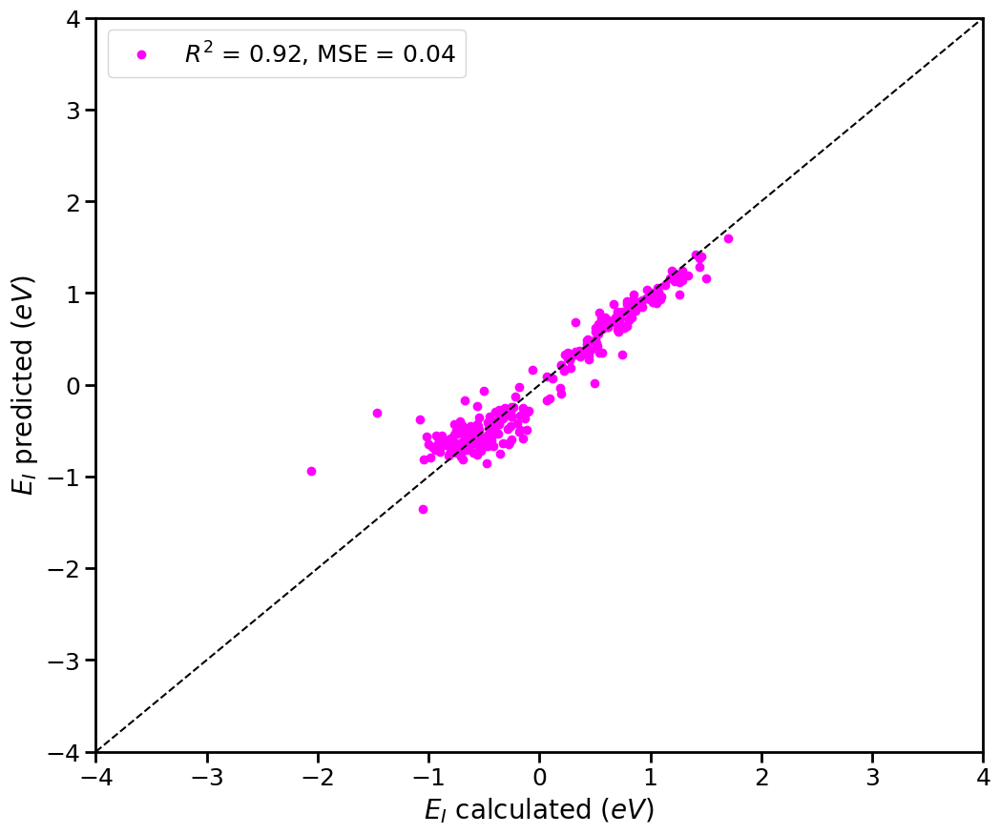

In [12]:
bestmodel = CBRegressor()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, random_state=42)
kfold = KFold(n_splits = 5, shuffle = True, random_state = 42 )
### Cross validation scores
cv = RepeatedKFold(n_splits = 5, n_repeats = 3, random_state = 42)
scores = cross_val_score(bestmodel, X_train, y_train, cv = cv)
r2_mean = scores.mean()
print("%0.4f accuracy with a standard deviation of %0.4f" % (r2_mean, scores.std()))

### Cross validation predictions
yhat_bestmodel = cross_val_predict(bestmodel, X_train, y_train, cv = kfold)
Mean_sqr_error = metrics.mean_squared_error(y_train, yhat_bestmodel)
f, ax = plt.subplots(figsize=(12, 10))

# Increase axis font size
ax.tick_params(axis='both', labelsize=18)

# Increase axis linewidth
ax.spines['top'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)
ax.spines['left'].set_linewidth(2)
ax.spines['right'].set_linewidth(2)

# Increase tick mark thickness and length
ax.tick_params(which='both', width=2, length=8)

label_mlr = "$R^2$ = %.2f, MSE = %.2f" % (r2_mean, Mean_sqr_error)
plt.plot(y_train, yhat_bestmodel, 'o', label=label_mlr, color = "magenta")
plt.ylabel(r"$E_{I}$ predicted ($eV$)", fontsize=20)
plt.xlabel(r"$E_{I}$ calculated ($eV$)", fontsize=20)
plt.legend(fontsize=18)
plt.xlim([-4, 4])
plt.ylim([-4, 4])
plt.plot([-4, 4], [-4, 4], 'k--')
plt.show()

#f.savefig("Results_Code_2/ParityPlot", dpi = 300, transparent = False, facecolor = 'white')

## Sensitvity Analysis

Learning rate set to 0.033483
0:	learn: 0.6881554	total: 555us	remaining: 555ms
1:	learn: 0.6728782	total: 1.1ms	remaining: 552ms
2:	learn: 0.6573094	total: 1.55ms	remaining: 517ms
3:	learn: 0.6410443	total: 1.87ms	remaining: 466ms
4:	learn: 0.6268100	total: 2.39ms	remaining: 476ms
5:	learn: 0.6132322	total: 2.98ms	remaining: 494ms
6:	learn: 0.6002642	total: 3.49ms	remaining: 495ms
7:	learn: 0.5890472	total: 4.12ms	remaining: 511ms
8:	learn: 0.5773838	total: 4.68ms	remaining: 516ms
9:	learn: 0.5646377	total: 5.27ms	remaining: 522ms
10:	learn: 0.5524000	total: 5.79ms	remaining: 520ms
11:	learn: 0.5407255	total: 6.36ms	remaining: 524ms
12:	learn: 0.5289858	total: 6.93ms	remaining: 527ms
13:	learn: 0.5177893	total: 7.43ms	remaining: 523ms
14:	learn: 0.5070164	total: 8.02ms	remaining: 527ms
15:	learn: 0.4971375	total: 8.57ms	remaining: 527ms
16:	learn: 0.4872436	total: 9.09ms	remaining: 525ms
17:	learn: 0.4780146	total: 9.58ms	remaining: 523ms
18:	learn: 0.4691216	total: 10.1ms	remaining: 

381:	learn: 0.1006027	total: 158ms	remaining: 255ms
382:	learn: 0.1004457	total: 158ms	remaining: 255ms
383:	learn: 0.1002774	total: 159ms	remaining: 255ms
384:	learn: 0.1000246	total: 159ms	remaining: 254ms
385:	learn: 0.0998777	total: 159ms	remaining: 254ms
386:	learn: 0.0996748	total: 160ms	remaining: 253ms
387:	learn: 0.0995168	total: 160ms	remaining: 253ms
388:	learn: 0.0993179	total: 161ms	remaining: 252ms
389:	learn: 0.0991384	total: 161ms	remaining: 252ms
390:	learn: 0.0989258	total: 161ms	remaining: 251ms
391:	learn: 0.0986861	total: 162ms	remaining: 251ms
392:	learn: 0.0983960	total: 162ms	remaining: 250ms
393:	learn: 0.0981365	total: 163ms	remaining: 250ms
394:	learn: 0.0980693	total: 163ms	remaining: 250ms
395:	learn: 0.0980397	total: 163ms	remaining: 249ms
396:	learn: 0.0977398	total: 164ms	remaining: 249ms
397:	learn: 0.0976991	total: 164ms	remaining: 248ms
398:	learn: 0.0975643	total: 164ms	remaining: 248ms
399:	learn: 0.0973382	total: 165ms	remaining: 247ms
400:	learn: 

756:	learn: 0.0615921	total: 318ms	remaining: 102ms
757:	learn: 0.0615048	total: 319ms	remaining: 102ms
758:	learn: 0.0614693	total: 320ms	remaining: 102ms
759:	learn: 0.0614046	total: 320ms	remaining: 101ms
760:	learn: 0.0613562	total: 321ms	remaining: 101ms
761:	learn: 0.0612712	total: 322ms	remaining: 100ms
762:	learn: 0.0612601	total: 322ms	remaining: 100ms
763:	learn: 0.0611500	total: 322ms	remaining: 99.6ms
764:	learn: 0.0610307	total: 323ms	remaining: 99.2ms
765:	learn: 0.0609705	total: 323ms	remaining: 98.8ms
766:	learn: 0.0609635	total: 324ms	remaining: 98.4ms
767:	learn: 0.0608667	total: 325ms	remaining: 98ms
768:	learn: 0.0608564	total: 325ms	remaining: 97.5ms
769:	learn: 0.0608171	total: 325ms	remaining: 97.2ms
770:	learn: 0.0607788	total: 326ms	remaining: 96.8ms
771:	learn: 0.0607723	total: 326ms	remaining: 96.4ms
772:	learn: 0.0606809	total: 327ms	remaining: 96ms
773:	learn: 0.0606762	total: 327ms	remaining: 95.6ms
774:	learn: 0.0606711	total: 328ms	remaining: 95.1ms
775:

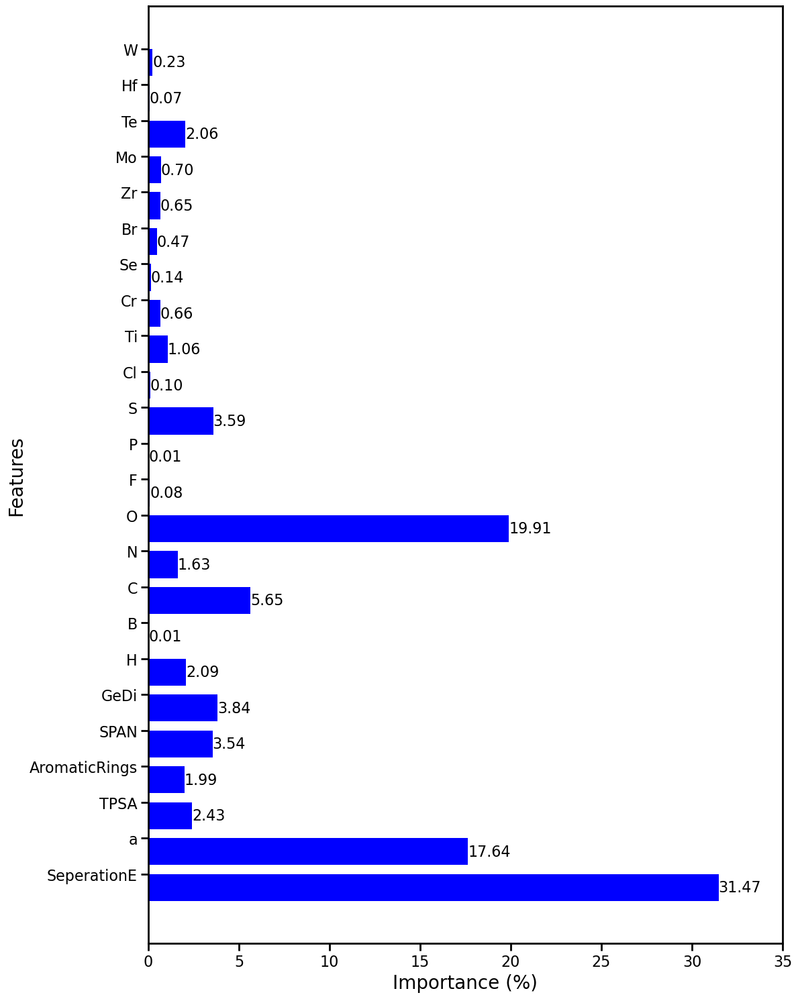

In [13]:
bestmodel.fit(X_train, y_train)
bestmodel_feature_importance = pd.DataFrame()
bestmodel_feature_importance['Feature'] = pd.DataFrame(X_test.columns)
bestmodel_feature_importance['Importance'] = pd.DataFrame(bestmodel.feature_importances_)
bestmodel_feature_importance = bestmodel_feature_importance[bestmodel_feature_importance.Importance > 0]

y = bestmodel_feature_importance.Importance
x = bestmodel_feature_importance.Feature

fig, ax = plt.subplots(figsize=(12,15))  

# Increase axis font size
ax.tick_params(axis='both', labelsize=16)

# Increase axis linewidth
ax.spines['top'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)
ax.spines['left'].set_linewidth(2)
ax.spines['right'].set_linewidth(2)

# Increase tick mark thickness and length
ax.tick_params(which='both', width=2, length=8)

width = 0.75 # the width of the bars 
ind = np.arange(len(y))  # the x locations for the groups
ax.barh(ind, y, width, color="blue")
ax.set_yticks(ind+width/2)
ax.set_yticklabels(x, minor=False)
#plt.title('Distribution of Feature Importance')
plt.xlabel('Importance (%)', fontsize=20)
plt.ylabel('Features', fontsize=20)
plt.xlim([0, 35])

# Print the values on the barchart
ax.bar_label(ax.containers[0],label_type='edge',fmt='%.2f', fontsize = 16)

plt.tight_layout()  # Ensures that the figure fits within the specified dimensions

plt.show()

#fig.savefig("Results_Code_2/FeatImp", dpi=300, bbox_inches='tight', transparent=False, facecolor='white')

# Part IV: Exploration-Exploitation

<a id="exp-exp"></a>

In [14]:
## We combined our 2D materials and gas molecules datasets 
## to make all possible hybrid material combinations. 
## And, calculated necessary features for these combinations in an auxiliary code. 


PredictionSet = pd.read_csv('PredictionSet_3')
PredictionSet = PredictionSet.astype({'CID' :'str'})
PredictionSet



,CID,Name,SeperationE,a,SMILES,TPSA,AromaticRings,H,He,Li,...,Bk,Cf,Es,Fm,Md,No,Lr,SPAN,GeDi,System
0,13,MoS2,1.766763,3.154333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1,0.045455,0,0,...,0,0,0,0,0,0,0,3.509434,6.313619,13_MoS2_0
1,13,MoSe2,2.056959,3.285000,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1,0.045455,0,0,...,0,0,0,0,0,0,0,3.456396,6.211905,13_MoSe2_0
2,13,MoTe2,2.636494,3.493333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1,0.045455,0,0,...,0,0,0,0,0,0,0,3.451183,6.228006,13_MoTe2_0
3,13,MoO2,1.202318,2.828333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1,0.045455,0,0,...,0,0,0,0,0,0,0,3.469165,6.245761,13_MoO2_0
4,13,WS2,1.865270,3.162333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1,0.045455,0,0,...,0,0,0,0,0,0,0,3.457050,6.216698,13_WS2_0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
212473,13593933,CrTe2,2.477311,3.407000,CC=C=C=C,0.0,0,0.092308,0,0,...,0,0,0,0,0,0,0,3.297814,6.552722,13593933_CrTe2_0
212474,13593933,CrO2,0.823892,2.622667,CC=C=C=C,0.0,0,0.092308,0,0,...,0,0,0,0,0,0,0,3.302684,6.319375,13593933_CrO2_0
212475,13593933,ZrS2,1.895850,3.567333,CC=C=C=C,0.0,0,0.092308,0,0,...,0,0,0,0,0,0,0,3.291805,6.497326,13593933_ZrS2_0
212476,13593933,ZrSe2,2.158777,3.706333,CC=C=C=C,0.0,0,0.092308,0,0,...,0,0,0,0,0,0,0,3.280770,6.377696,13593933_ZrSe2_0


In [15]:
FullSet = pd.concat([PredictionSet, MergeWithPredictionSet.drop(['IC_ENERGY'], axis = 1)], axis = 0).drop_duplicates(subset='System')
FullSet

,CID,Name,SeperationE,a,SMILES,TPSA,AromaticRings,H,He,Li,...,Bk,Cf,Es,Fm,Md,No,Lr,SPAN,GeDi,System
0,13,MoS2,1.766763,3.154333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1.0,0.045455,0,0,...,0,0,0,0,0,0,0,3.509434,6.313619,13_MoS2_0
1,13,MoSe2,2.056959,3.285000,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1.0,0.045455,0,0,...,0,0,0,0,0,0,0,3.456396,6.211905,13_MoSe2_0
2,13,MoTe2,2.636494,3.493333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1.0,0.045455,0,0,...,0,0,0,0,0,0,0,3.451183,6.228006,13_MoTe2_0
3,13,MoO2,1.202318,2.828333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1.0,0.045455,0,0,...,0,0,0,0,0,0,0,3.469165,6.245761,13_MoO2_0
4,13,WS2,1.865270,3.162333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1.0,0.045455,0,0,...,0,0,0,0,0,0,0,3.457050,6.216698,13_WS2_0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
212473,13593933,CrTe2,2.477311,3.407000,CC=C=C=C,0.0,0.0,0.092308,0,0,...,0,0,0,0,0,0,0,3.297814,6.552722,13593933_CrTe2_0
212474,13593933,CrO2,0.823892,2.622667,CC=C=C=C,0.0,0.0,0.092308,0,0,...,0,0,0,0,0,0,0,3.302684,6.319375,13593933_CrO2_0
212475,13593933,ZrS2,1.895850,3.567333,CC=C=C=C,0.0,0.0,0.092308,0,0,...,0,0,0,0,0,0,0,3.291805,6.497326,13593933_ZrS2_0
212476,13593933,ZrSe2,2.158777,3.706333,CC=C=C=C,0.0,0.0,0.092308,0,0,...,0,0,0,0,0,0,0,3.280770,6.377696,13593933_ZrSe2_0


### Bootstrap begins here

In [16]:
n_bs = 200
train_r2 = []
test_r2 = []
pred_r2 = []
remove_from_features = ['Name', 'SMILES', 'CID', 'System']
features = [c for c in FullSet.columns if c not in remove_from_features]
X_pred = FullSet[features]

fullset_bootstrapped_yhats = pd.DataFrame()

for i in range(n_bs):
    # Making n_bs bootstrapped samples
    train = resample(FinalSet, replace=True, n_samples=len(FinalSet), random_state=i)
    test = FinalSet[~FinalSet.index.isin(train.index)]
    
    # Split bootstrapped samples into train and test sets
    X_train = train[features]
    y_train = train["IC_ENERGY"]
    X_test = test[features]
    y_test = test["IC_ENERGY"]
    
    # Fit model on train sets
    bestmodel.fit(X_train, y_train)
    
    # Model scores
    r2_train = bestmodel.score(X_train, y_train)
    r2_test = bestmodel.score(X_test, y_test)
    train_r2.append(r2_train)
    test_r2.append(r2_test)
    
    # Predict on PredictionSet
    
    y_hat = bestmodel.predict(X_pred)
    
    #temp_df = pd.DataFrame(y_hat, columns=[])
    fullset_bootstrapped_yhats['y_pred_bs_{}'.format(i)] = y_hat
    fullset_bootstrapped_yhats = fullset_bootstrapped_yhats.copy()
    #bootstrapped_yhats[i] = pd.DataFrame(y_hat)




Learning rate set to 0.035425
0:	learn: 0.6761044	total: 540us	remaining: 540ms
1:	learn: 0.6576897	total: 1.08ms	remaining: 537ms
2:	learn: 0.6408516	total: 1.61ms	remaining: 536ms
3:	learn: 0.6239301	total: 2.1ms	remaining: 523ms
4:	learn: 0.6079424	total: 2.62ms	remaining: 521ms
5:	learn: 0.5927282	total: 3.07ms	remaining: 509ms
6:	learn: 0.5780276	total: 3.56ms	remaining: 505ms
7:	learn: 0.5627691	total: 4.12ms	remaining: 510ms
8:	learn: 0.5500640	total: 4.66ms	remaining: 513ms
9:	learn: 0.5370618	total: 5.13ms	remaining: 508ms
10:	learn: 0.5240490	total: 5.63ms	remaining: 507ms
11:	learn: 0.5114883	total: 6.07ms	remaining: 500ms
12:	learn: 0.4995361	total: 6.55ms	remaining: 498ms
13:	learn: 0.4889182	total: 7.01ms	remaining: 494ms
14:	learn: 0.4780565	total: 7.46ms	remaining: 490ms
15:	learn: 0.4676218	total: 7.93ms	remaining: 488ms
16:	learn: 0.4577894	total: 8.42ms	remaining: 487ms
17:	learn: 0.4482431	total: 8.97ms	remaining: 490ms
18:	learn: 0.4385591	total: 9.43ms	remaining: 

313:	learn: 0.0948115	total: 142ms	remaining: 311ms
314:	learn: 0.0945533	total: 143ms	remaining: 310ms
315:	learn: 0.0944467	total: 143ms	remaining: 310ms
316:	learn: 0.0942372	total: 144ms	remaining: 310ms
317:	learn: 0.0940397	total: 144ms	remaining: 310ms
318:	learn: 0.0939129	total: 145ms	remaining: 310ms
319:	learn: 0.0938519	total: 145ms	remaining: 309ms
320:	learn: 0.0935572	total: 146ms	remaining: 309ms
321:	learn: 0.0933244	total: 146ms	remaining: 308ms
322:	learn: 0.0932458	total: 147ms	remaining: 308ms
323:	learn: 0.0928000	total: 147ms	remaining: 307ms
324:	learn: 0.0926333	total: 148ms	remaining: 308ms
325:	learn: 0.0924244	total: 149ms	remaining: 307ms
326:	learn: 0.0923211	total: 149ms	remaining: 307ms
327:	learn: 0.0920390	total: 150ms	remaining: 306ms
328:	learn: 0.0915385	total: 150ms	remaining: 306ms
329:	learn: 0.0912978	total: 151ms	remaining: 306ms
330:	learn: 0.0908917	total: 151ms	remaining: 305ms
331:	learn: 0.0906587	total: 152ms	remaining: 305ms
332:	learn: 

722:	learn: 0.0478779	total: 320ms	remaining: 123ms
723:	learn: 0.0478705	total: 320ms	remaining: 122ms
724:	learn: 0.0478105	total: 321ms	remaining: 122ms
725:	learn: 0.0476969	total: 321ms	remaining: 121ms
726:	learn: 0.0476025	total: 322ms	remaining: 121ms
727:	learn: 0.0475969	total: 322ms	remaining: 120ms
728:	learn: 0.0475304	total: 323ms	remaining: 120ms
729:	learn: 0.0474714	total: 323ms	remaining: 120ms
730:	learn: 0.0473388	total: 323ms	remaining: 119ms
731:	learn: 0.0472807	total: 324ms	remaining: 119ms
732:	learn: 0.0472381	total: 324ms	remaining: 118ms
733:	learn: 0.0471259	total: 325ms	remaining: 118ms
734:	learn: 0.0470086	total: 325ms	remaining: 117ms
735:	learn: 0.0468752	total: 325ms	remaining: 117ms
736:	learn: 0.0468326	total: 326ms	remaining: 116ms
737:	learn: 0.0467700	total: 326ms	remaining: 116ms
738:	learn: 0.0466474	total: 327ms	remaining: 115ms
739:	learn: 0.0466006	total: 327ms	remaining: 115ms
740:	learn: 0.0465401	total: 327ms	remaining: 114ms
741:	learn: 

Learning rate set to 0.035425
0:	learn: 0.6600908	total: 635us	remaining: 635ms
1:	learn: 0.6438662	total: 1.25ms	remaining: 625ms
2:	learn: 0.6277057	total: 1.72ms	remaining: 572ms
3:	learn: 0.6131925	total: 2.23ms	remaining: 554ms
4:	learn: 0.5991210	total: 2.83ms	remaining: 563ms
5:	learn: 0.5863249	total: 3.43ms	remaining: 569ms
6:	learn: 0.5727512	total: 3.9ms	remaining: 553ms
7:	learn: 0.5588337	total: 4.4ms	remaining: 545ms
8:	learn: 0.5462290	total: 4.83ms	remaining: 532ms
9:	learn: 0.5349247	total: 5.31ms	remaining: 525ms
10:	learn: 0.5224441	total: 5.76ms	remaining: 518ms
11:	learn: 0.5119423	total: 6.24ms	remaining: 514ms
12:	learn: 0.5015183	total: 6.67ms	remaining: 507ms
13:	learn: 0.4915904	total: 7.1ms	remaining: 500ms
14:	learn: 0.4820684	total: 7.58ms	remaining: 497ms
15:	learn: 0.4726731	total: 8.25ms	remaining: 507ms
16:	learn: 0.4637127	total: 8.84ms	remaining: 511ms
17:	learn: 0.4544632	total: 9.36ms	remaining: 510ms
18:	learn: 0.4461496	total: 10ms	remaining: 518m

378:	learn: 0.0792894	total: 157ms	remaining: 257ms
379:	learn: 0.0791122	total: 158ms	remaining: 258ms
380:	learn: 0.0789414	total: 159ms	remaining: 258ms
381:	learn: 0.0787583	total: 159ms	remaining: 258ms
382:	learn: 0.0786210	total: 160ms	remaining: 258ms
383:	learn: 0.0785967	total: 160ms	remaining: 257ms
384:	learn: 0.0785736	total: 161ms	remaining: 257ms
385:	learn: 0.0784007	total: 162ms	remaining: 257ms
386:	learn: 0.0782295	total: 162ms	remaining: 257ms
387:	learn: 0.0782095	total: 163ms	remaining: 257ms
388:	learn: 0.0780838	total: 163ms	remaining: 256ms
389:	learn: 0.0779780	total: 164ms	remaining: 256ms
390:	learn: 0.0778033	total: 164ms	remaining: 256ms
391:	learn: 0.0775986	total: 165ms	remaining: 256ms
392:	learn: 0.0774557	total: 166ms	remaining: 256ms
393:	learn: 0.0773035	total: 166ms	remaining: 256ms
394:	learn: 0.0771745	total: 167ms	remaining: 255ms
395:	learn: 0.0770013	total: 167ms	remaining: 255ms
396:	learn: 0.0768697	total: 168ms	remaining: 255ms
397:	learn: 

830:	learn: 0.0416697	total: 334ms	remaining: 68ms
831:	learn: 0.0416264	total: 335ms	remaining: 67.6ms
832:	learn: 0.0415818	total: 335ms	remaining: 67.2ms
833:	learn: 0.0415766	total: 335ms	remaining: 66.8ms
834:	learn: 0.0415343	total: 336ms	remaining: 66.4ms
835:	learn: 0.0414922	total: 336ms	remaining: 66ms
836:	learn: 0.0414417	total: 337ms	remaining: 65.6ms
837:	learn: 0.0414361	total: 337ms	remaining: 65.2ms
838:	learn: 0.0413764	total: 338ms	remaining: 64.8ms
839:	learn: 0.0412882	total: 338ms	remaining: 64.4ms
840:	learn: 0.0412025	total: 339ms	remaining: 64.1ms
841:	learn: 0.0411739	total: 339ms	remaining: 63.7ms
842:	learn: 0.0411600	total: 340ms	remaining: 63.3ms
843:	learn: 0.0411136	total: 340ms	remaining: 62.9ms
844:	learn: 0.0410958	total: 341ms	remaining: 62.5ms
845:	learn: 0.0409943	total: 341ms	remaining: 62.1ms
846:	learn: 0.0409839	total: 342ms	remaining: 61.8ms
847:	learn: 0.0409206	total: 342ms	remaining: 61.4ms
848:	learn: 0.0408798	total: 343ms	remaining: 61ms

8:	learn: 0.5465573	total: 4.4ms	remaining: 484ms
9:	learn: 0.5339576	total: 4.96ms	remaining: 491ms
10:	learn: 0.5212787	total: 5.36ms	remaining: 482ms
11:	learn: 0.5107587	total: 5.78ms	remaining: 475ms
12:	learn: 0.4984628	total: 6.22ms	remaining: 472ms
13:	learn: 0.4872608	total: 6.6ms	remaining: 465ms
14:	learn: 0.4773010	total: 6.99ms	remaining: 459ms
15:	learn: 0.4668016	total: 7.38ms	remaining: 454ms
16:	learn: 0.4575776	total: 7.77ms	remaining: 449ms
17:	learn: 0.4474197	total: 8.15ms	remaining: 444ms
18:	learn: 0.4380552	total: 8.54ms	remaining: 441ms
19:	learn: 0.4286252	total: 8.91ms	remaining: 436ms
20:	learn: 0.4198097	total: 9.31ms	remaining: 434ms
21:	learn: 0.4118008	total: 9.71ms	remaining: 432ms
22:	learn: 0.4034989	total: 10.1ms	remaining: 430ms
23:	learn: 0.3963362	total: 10.5ms	remaining: 429ms
24:	learn: 0.3885551	total: 11ms	remaining: 429ms
25:	learn: 0.3808355	total: 11.4ms	remaining: 428ms
26:	learn: 0.3734802	total: 11.8ms	remaining: 426ms
27:	learn: 0.36620

445:	learn: 0.0720842	total: 177ms	remaining: 220ms
446:	learn: 0.0719228	total: 178ms	remaining: 220ms
447:	learn: 0.0717312	total: 178ms	remaining: 220ms
448:	learn: 0.0715591	total: 179ms	remaining: 219ms
449:	learn: 0.0713500	total: 179ms	remaining: 219ms
450:	learn: 0.0712087	total: 179ms	remaining: 218ms
451:	learn: 0.0711108	total: 180ms	remaining: 218ms
452:	learn: 0.0710933	total: 180ms	remaining: 218ms
453:	learn: 0.0710765	total: 181ms	remaining: 217ms
454:	learn: 0.0709698	total: 181ms	remaining: 217ms
455:	learn: 0.0709385	total: 182ms	remaining: 217ms
456:	learn: 0.0708065	total: 182ms	remaining: 216ms
457:	learn: 0.0706777	total: 182ms	remaining: 216ms
458:	learn: 0.0706500	total: 183ms	remaining: 215ms
459:	learn: 0.0705455	total: 183ms	remaining: 215ms
460:	learn: 0.0704351	total: 184ms	remaining: 215ms
461:	learn: 0.0703579	total: 184ms	remaining: 214ms
462:	learn: 0.0703390	total: 184ms	remaining: 214ms
463:	learn: 0.0701985	total: 185ms	remaining: 213ms
464:	learn: 

771:	learn: 0.0461360	total: 319ms	remaining: 94.3ms
772:	learn: 0.0460754	total: 320ms	remaining: 94ms
773:	learn: 0.0460677	total: 320ms	remaining: 93.5ms
774:	learn: 0.0459750	total: 321ms	remaining: 93.2ms
775:	learn: 0.0458970	total: 321ms	remaining: 92.7ms
776:	learn: 0.0458880	total: 322ms	remaining: 92.3ms
777:	learn: 0.0458373	total: 322ms	remaining: 91.9ms
778:	learn: 0.0458236	total: 323ms	remaining: 91.5ms
779:	learn: 0.0457039	total: 323ms	remaining: 91.1ms
780:	learn: 0.0455848	total: 323ms	remaining: 90.7ms
781:	learn: 0.0455555	total: 324ms	remaining: 90.3ms
782:	learn: 0.0454903	total: 324ms	remaining: 89.9ms
783:	learn: 0.0454106	total: 325ms	remaining: 89.5ms
784:	learn: 0.0453946	total: 325ms	remaining: 89.1ms
785:	learn: 0.0453445	total: 326ms	remaining: 88.7ms
786:	learn: 0.0452722	total: 326ms	remaining: 88.3ms
787:	learn: 0.0451788	total: 327ms	remaining: 87.9ms
788:	learn: 0.0451085	total: 327ms	remaining: 87.5ms
789:	learn: 0.0450502	total: 328ms	remaining: 87

Learning rate set to 0.035425
0:	learn: 0.6810888	total: 1.39ms	remaining: 1.39s
1:	learn: 0.6630437	total: 1.99ms	remaining: 992ms
2:	learn: 0.6455845	total: 2.53ms	remaining: 842ms
3:	learn: 0.6285172	total: 3.15ms	remaining: 785ms
4:	learn: 0.6119177	total: 3.78ms	remaining: 751ms
5:	learn: 0.5960213	total: 4.36ms	remaining: 722ms
6:	learn: 0.5806846	total: 4.92ms	remaining: 698ms
7:	learn: 0.5654617	total: 5.47ms	remaining: 679ms
8:	learn: 0.5522915	total: 6.01ms	remaining: 662ms
9:	learn: 0.5387002	total: 6.63ms	remaining: 657ms
10:	learn: 0.5253809	total: 7.24ms	remaining: 651ms
11:	learn: 0.5131766	total: 7.87ms	remaining: 648ms
12:	learn: 0.5010338	total: 8.47ms	remaining: 643ms
13:	learn: 0.4897843	total: 9.13ms	remaining: 643ms
14:	learn: 0.4792831	total: 9.68ms	remaining: 635ms
15:	learn: 0.4694934	total: 10.2ms	remaining: 629ms
16:	learn: 0.4603738	total: 10.8ms	remaining: 626ms
17:	learn: 0.4499328	total: 11.4ms	remaining: 624ms
18:	learn: 0.4394610	total: 12.1ms	remaining

314:	learn: 0.0957817	total: 156ms	remaining: 339ms
315:	learn: 0.0957272	total: 156ms	remaining: 339ms
316:	learn: 0.0956337	total: 157ms	remaining: 338ms
317:	learn: 0.0953624	total: 157ms	remaining: 337ms
318:	learn: 0.0951645	total: 158ms	remaining: 336ms
319:	learn: 0.0951190	total: 158ms	remaining: 336ms
320:	learn: 0.0950763	total: 158ms	remaining: 335ms
321:	learn: 0.0950237	total: 159ms	remaining: 334ms
322:	learn: 0.0948176	total: 159ms	remaining: 334ms
323:	learn: 0.0945832	total: 160ms	remaining: 333ms
324:	learn: 0.0945461	total: 160ms	remaining: 332ms
325:	learn: 0.0944278	total: 160ms	remaining: 331ms
326:	learn: 0.0940738	total: 161ms	remaining: 331ms
327:	learn: 0.0937326	total: 161ms	remaining: 330ms
328:	learn: 0.0935173	total: 162ms	remaining: 329ms
329:	learn: 0.0932203	total: 162ms	remaining: 329ms
330:	learn: 0.0930274	total: 162ms	remaining: 328ms
331:	learn: 0.0928472	total: 163ms	remaining: 328ms
332:	learn: 0.0928125	total: 163ms	remaining: 327ms
333:	learn: 

668:	learn: 0.0530721	total: 315ms	remaining: 156ms
669:	learn: 0.0530000	total: 316ms	remaining: 156ms
670:	learn: 0.0529199	total: 316ms	remaining: 155ms
671:	learn: 0.0528409	total: 317ms	remaining: 155ms
672:	learn: 0.0527576	total: 317ms	remaining: 154ms
673:	learn: 0.0526432	total: 318ms	remaining: 154ms
674:	learn: 0.0525725	total: 318ms	remaining: 153ms
675:	learn: 0.0525662	total: 319ms	remaining: 153ms
676:	learn: 0.0524523	total: 319ms	remaining: 152ms
677:	learn: 0.0523441	total: 320ms	remaining: 152ms
678:	learn: 0.0522257	total: 320ms	remaining: 151ms
679:	learn: 0.0522177	total: 320ms	remaining: 151ms
680:	learn: 0.0521694	total: 321ms	remaining: 150ms
681:	learn: 0.0521386	total: 321ms	remaining: 150ms
682:	learn: 0.0520426	total: 322ms	remaining: 149ms
683:	learn: 0.0519649	total: 322ms	remaining: 149ms
684:	learn: 0.0519070	total: 323ms	remaining: 148ms
685:	learn: 0.0518014	total: 323ms	remaining: 148ms
686:	learn: 0.0517302	total: 324ms	remaining: 148ms
687:	learn: 

Learning rate set to 0.035425
0:	learn: 0.6467737	total: 1.82ms	remaining: 1.82s
1:	learn: 0.6296332	total: 2.35ms	remaining: 1.18s
2:	learn: 0.6137026	total: 2.89ms	remaining: 959ms
3:	learn: 0.5981318	total: 3.42ms	remaining: 851ms
4:	learn: 0.5850805	total: 4.48ms	remaining: 892ms
5:	learn: 0.5707432	total: 5.26ms	remaining: 871ms
6:	learn: 0.5558963	total: 5.97ms	remaining: 847ms
7:	learn: 0.5434042	total: 6.92ms	remaining: 858ms
8:	learn: 0.5308579	total: 7.76ms	remaining: 855ms
9:	learn: 0.5185453	total: 8.68ms	remaining: 860ms
10:	learn: 0.5058875	total: 9.49ms	remaining: 853ms
11:	learn: 0.4949699	total: 10.2ms	remaining: 836ms
12:	learn: 0.4828365	total: 10.8ms	remaining: 821ms
13:	learn: 0.4714517	total: 11.6ms	remaining: 817ms
14:	learn: 0.4609388	total: 12.4ms	remaining: 817ms
15:	learn: 0.4518007	total: 13.1ms	remaining: 805ms
16:	learn: 0.4410028	total: 13.9ms	remaining: 802ms
17:	learn: 0.4309116	total: 14.4ms	remaining: 783ms
18:	learn: 0.4215038	total: 15ms	remaining: 

225:	learn: 0.1112820	total: 140ms	remaining: 480ms
226:	learn: 0.1111363	total: 141ms	remaining: 479ms
227:	learn: 0.1108254	total: 141ms	remaining: 478ms
228:	learn: 0.1106475	total: 142ms	remaining: 477ms
229:	learn: 0.1102235	total: 142ms	remaining: 476ms
230:	learn: 0.1097770	total: 142ms	remaining: 474ms
231:	learn: 0.1095595	total: 143ms	remaining: 473ms
232:	learn: 0.1092747	total: 143ms	remaining: 471ms
233:	learn: 0.1091126	total: 144ms	remaining: 470ms
234:	learn: 0.1087212	total: 144ms	remaining: 469ms
235:	learn: 0.1085507	total: 144ms	remaining: 467ms
236:	learn: 0.1084144	total: 145ms	remaining: 466ms
237:	learn: 0.1081376	total: 145ms	remaining: 464ms
238:	learn: 0.1078993	total: 145ms	remaining: 463ms
239:	learn: 0.1076618	total: 146ms	remaining: 462ms
240:	learn: 0.1074556	total: 146ms	remaining: 461ms
241:	learn: 0.1071929	total: 147ms	remaining: 459ms
242:	learn: 0.1068508	total: 147ms	remaining: 458ms
243:	learn: 0.1067559	total: 148ms	remaining: 457ms
244:	learn: 

669:	learn: 0.0507829	total: 316ms	remaining: 156ms
670:	learn: 0.0507064	total: 317ms	remaining: 155ms
671:	learn: 0.0505963	total: 317ms	remaining: 155ms
672:	learn: 0.0505812	total: 318ms	remaining: 154ms
673:	learn: 0.0505133	total: 318ms	remaining: 154ms
674:	learn: 0.0504621	total: 318ms	remaining: 153ms
675:	learn: 0.0504482	total: 319ms	remaining: 153ms
676:	learn: 0.0502256	total: 319ms	remaining: 152ms
677:	learn: 0.0501394	total: 320ms	remaining: 152ms
678:	learn: 0.0501289	total: 320ms	remaining: 151ms
679:	learn: 0.0500092	total: 320ms	remaining: 151ms
680:	learn: 0.0499465	total: 321ms	remaining: 150ms
681:	learn: 0.0498763	total: 321ms	remaining: 150ms
682:	learn: 0.0498275	total: 321ms	remaining: 149ms
683:	learn: 0.0497826	total: 322ms	remaining: 149ms
684:	learn: 0.0496153	total: 322ms	remaining: 148ms
685:	learn: 0.0496021	total: 322ms	remaining: 148ms
686:	learn: 0.0495412	total: 323ms	remaining: 147ms
687:	learn: 0.0495277	total: 323ms	remaining: 147ms
688:	learn: 

Learning rate set to 0.035425
0:	learn: 0.6572557	total: 472us	remaining: 472ms
1:	learn: 0.6407124	total: 889us	remaining: 444ms
2:	learn: 0.6249804	total: 1.32ms	remaining: 439ms
3:	learn: 0.6094070	total: 1.7ms	remaining: 424ms
4:	learn: 0.5940529	total: 2.06ms	remaining: 409ms
5:	learn: 0.5780673	total: 2.44ms	remaining: 404ms
6:	learn: 0.5635950	total: 2.85ms	remaining: 404ms
7:	learn: 0.5490257	total: 3.26ms	remaining: 404ms
8:	learn: 0.5361256	total: 3.62ms	remaining: 399ms
9:	learn: 0.5236120	total: 4.12ms	remaining: 408ms
10:	learn: 0.5107692	total: 4.61ms	remaining: 415ms
11:	learn: 0.4987291	total: 5.05ms	remaining: 416ms
12:	learn: 0.4870725	total: 5.48ms	remaining: 416ms
13:	learn: 0.4758960	total: 5.83ms	remaining: 410ms
14:	learn: 0.4658392	total: 6.21ms	remaining: 407ms
15:	learn: 0.4564505	total: 6.59ms	remaining: 406ms
16:	learn: 0.4466347	total: 6.98ms	remaining: 403ms
17:	learn: 0.4367559	total: 7.33ms	remaining: 400ms
18:	learn: 0.4271055	total: 7.75ms	remaining: 4

427:	learn: 0.0742299	total: 175ms	remaining: 233ms
428:	learn: 0.0741376	total: 175ms	remaining: 233ms
429:	learn: 0.0740399	total: 176ms	remaining: 233ms
430:	learn: 0.0740254	total: 176ms	remaining: 232ms
431:	learn: 0.0738857	total: 176ms	remaining: 232ms
432:	learn: 0.0738303	total: 177ms	remaining: 231ms
433:	learn: 0.0736465	total: 177ms	remaining: 231ms
434:	learn: 0.0735638	total: 178ms	remaining: 231ms
435:	learn: 0.0733797	total: 178ms	remaining: 230ms
436:	learn: 0.0731843	total: 178ms	remaining: 230ms
437:	learn: 0.0731450	total: 179ms	remaining: 229ms
438:	learn: 0.0729988	total: 179ms	remaining: 229ms
439:	learn: 0.0729842	total: 179ms	remaining: 228ms
440:	learn: 0.0728740	total: 180ms	remaining: 228ms
441:	learn: 0.0728423	total: 180ms	remaining: 228ms
442:	learn: 0.0727202	total: 181ms	remaining: 227ms
443:	learn: 0.0725296	total: 181ms	remaining: 227ms
444:	learn: 0.0723999	total: 182ms	remaining: 226ms
445:	learn: 0.0722852	total: 182ms	remaining: 226ms
446:	learn: 

836:	learn: 0.0432559	total: 352ms	remaining: 68.5ms
837:	learn: 0.0432284	total: 352ms	remaining: 68.1ms
838:	learn: 0.0431739	total: 353ms	remaining: 67.7ms
839:	learn: 0.0431075	total: 353ms	remaining: 67.3ms
840:	learn: 0.0430594	total: 353ms	remaining: 66.8ms
841:	learn: 0.0430097	total: 354ms	remaining: 66.4ms
842:	learn: 0.0429403	total: 354ms	remaining: 66ms
843:	learn: 0.0428741	total: 355ms	remaining: 65.6ms
844:	learn: 0.0428457	total: 355ms	remaining: 65.2ms
845:	learn: 0.0428071	total: 356ms	remaining: 64.7ms
846:	learn: 0.0427662	total: 356ms	remaining: 64.3ms
847:	learn: 0.0427591	total: 356ms	remaining: 63.9ms
848:	learn: 0.0427161	total: 357ms	remaining: 63.5ms
849:	learn: 0.0427097	total: 357ms	remaining: 63ms
850:	learn: 0.0426546	total: 358ms	remaining: 62.6ms
851:	learn: 0.0426231	total: 358ms	remaining: 62.2ms
852:	learn: 0.0425875	total: 358ms	remaining: 61.7ms
853:	learn: 0.0425469	total: 359ms	remaining: 61.3ms
854:	learn: 0.0425016	total: 359ms	remaining: 60.9

80:	learn: 0.2032889	total: 36.4ms	remaining: 413ms
81:	learn: 0.2022039	total: 37.1ms	remaining: 415ms
82:	learn: 0.2004649	total: 37.7ms	remaining: 416ms
83:	learn: 0.1987792	total: 38.4ms	remaining: 419ms
84:	learn: 0.1972143	total: 39.2ms	remaining: 422ms
85:	learn: 0.1958265	total: 40ms	remaining: 425ms
86:	learn: 0.1944323	total: 40.7ms	remaining: 427ms
87:	learn: 0.1932022	total: 41.1ms	remaining: 426ms
88:	learn: 0.1918983	total: 41.6ms	remaining: 425ms
89:	learn: 0.1907595	total: 42.3ms	remaining: 427ms
90:	learn: 0.1897423	total: 42.9ms	remaining: 428ms
91:	learn: 0.1886407	total: 43.4ms	remaining: 429ms
92:	learn: 0.1873766	total: 44ms	remaining: 429ms
93:	learn: 0.1863427	total: 44.5ms	remaining: 429ms
94:	learn: 0.1847868	total: 45.1ms	remaining: 429ms
95:	learn: 0.1833572	total: 45.6ms	remaining: 429ms
96:	learn: 0.1824821	total: 46.1ms	remaining: 429ms
97:	learn: 0.1815534	total: 46.5ms	remaining: 428ms
98:	learn: 0.1805622	total: 47.3ms	remaining: 431ms
99:	learn: 0.179

520:	learn: 0.0683451	total: 212ms	remaining: 195ms
521:	learn: 0.0683314	total: 213ms	remaining: 195ms
522:	learn: 0.0681065	total: 213ms	remaining: 194ms
523:	learn: 0.0679933	total: 213ms	remaining: 194ms
524:	learn: 0.0679636	total: 214ms	remaining: 193ms
525:	learn: 0.0679087	total: 214ms	remaining: 193ms
526:	learn: 0.0678033	total: 215ms	remaining: 193ms
527:	learn: 0.0677900	total: 215ms	remaining: 192ms
528:	learn: 0.0676478	total: 215ms	remaining: 192ms
529:	learn: 0.0674777	total: 216ms	remaining: 191ms
530:	learn: 0.0673052	total: 216ms	remaining: 191ms
531:	learn: 0.0671362	total: 216ms	remaining: 190ms
532:	learn: 0.0670761	total: 217ms	remaining: 190ms
533:	learn: 0.0669712	total: 217ms	remaining: 190ms
534:	learn: 0.0668522	total: 218ms	remaining: 189ms
535:	learn: 0.0668421	total: 218ms	remaining: 189ms
536:	learn: 0.0668338	total: 218ms	remaining: 188ms
537:	learn: 0.0667361	total: 219ms	remaining: 188ms
538:	learn: 0.0666347	total: 219ms	remaining: 187ms
539:	learn: 

989:	learn: 0.0366723	total: 390ms	remaining: 3.94ms
990:	learn: 0.0366323	total: 390ms	remaining: 3.55ms
991:	learn: 0.0365815	total: 391ms	remaining: 3.15ms
992:	learn: 0.0365530	total: 391ms	remaining: 2.76ms
993:	learn: 0.0365300	total: 392ms	remaining: 2.36ms
994:	learn: 0.0364759	total: 392ms	remaining: 1.97ms
995:	learn: 0.0364726	total: 393ms	remaining: 1.58ms
996:	learn: 0.0363942	total: 393ms	remaining: 1.18ms
997:	learn: 0.0363487	total: 393ms	remaining: 788us
998:	learn: 0.0362660	total: 394ms	remaining: 394us
999:	learn: 0.0362113	total: 394ms	remaining: 0us
Learning rate set to 0.035425
0:	learn: 0.6733806	total: 509us	remaining: 509ms
1:	learn: 0.6560014	total: 921us	remaining: 460ms
2:	learn: 0.6392181	total: 1.33ms	remaining: 442ms
3:	learn: 0.6234012	total: 1.77ms	remaining: 441ms
4:	learn: 0.6089626	total: 2.22ms	remaining: 443ms
5:	learn: 0.5931954	total: 2.63ms	remaining: 436ms
6:	learn: 0.5784396	total: 3.07ms	remaining: 436ms
7:	learn: 0.5643111	total: 3.49ms	rem

198:	learn: 0.1250210	total: 88.9ms	remaining: 358ms
199:	learn: 0.1245881	total: 89.5ms	remaining: 358ms
200:	learn: 0.1241457	total: 89.9ms	remaining: 357ms
201:	learn: 0.1240072	total: 90.4ms	remaining: 357ms
202:	learn: 0.1236799	total: 90.7ms	remaining: 356ms
203:	learn: 0.1233337	total: 91.1ms	remaining: 356ms
204:	learn: 0.1230808	total: 91.5ms	remaining: 355ms
205:	learn: 0.1226687	total: 92ms	remaining: 355ms
206:	learn: 0.1222664	total: 92.4ms	remaining: 354ms
207:	learn: 0.1221868	total: 92.9ms	remaining: 354ms
208:	learn: 0.1218968	total: 93.3ms	remaining: 353ms
209:	learn: 0.1216177	total: 93.8ms	remaining: 353ms
210:	learn: 0.1211979	total: 94.3ms	remaining: 353ms
211:	learn: 0.1208930	total: 94.7ms	remaining: 352ms
212:	learn: 0.1207302	total: 95.1ms	remaining: 351ms
213:	learn: 0.1204785	total: 95.5ms	remaining: 351ms
214:	learn: 0.1202323	total: 96.1ms	remaining: 351ms
215:	learn: 0.1200042	total: 96.5ms	remaining: 350ms
216:	learn: 0.1196970	total: 97ms	remaining: 350

558:	learn: 0.0616891	total: 247ms	remaining: 195ms
559:	learn: 0.0616434	total: 247ms	remaining: 194ms
560:	learn: 0.0615557	total: 248ms	remaining: 194ms
561:	learn: 0.0614718	total: 249ms	remaining: 194ms
562:	learn: 0.0614579	total: 250ms	remaining: 194ms
563:	learn: 0.0613591	total: 250ms	remaining: 193ms
564:	learn: 0.0613322	total: 250ms	remaining: 193ms
565:	learn: 0.0612376	total: 251ms	remaining: 192ms
566:	learn: 0.0611699	total: 251ms	remaining: 192ms
567:	learn: 0.0609987	total: 252ms	remaining: 191ms
568:	learn: 0.0608808	total: 252ms	remaining: 191ms
569:	learn: 0.0607893	total: 253ms	remaining: 191ms
570:	learn: 0.0607007	total: 253ms	remaining: 190ms
571:	learn: 0.0606840	total: 254ms	remaining: 190ms
572:	learn: 0.0605445	total: 254ms	remaining: 189ms
573:	learn: 0.0604908	total: 254ms	remaining: 189ms
574:	learn: 0.0603889	total: 255ms	remaining: 188ms
575:	learn: 0.0602313	total: 256ms	remaining: 188ms
576:	learn: 0.0602095	total: 256ms	remaining: 188ms
577:	learn: 

917:	learn: 0.0390760	total: 407ms	remaining: 36.4ms
918:	learn: 0.0390723	total: 408ms	remaining: 35.9ms
919:	learn: 0.0390464	total: 408ms	remaining: 35.5ms
920:	learn: 0.0390333	total: 409ms	remaining: 35.1ms
921:	learn: 0.0390247	total: 409ms	remaining: 34.6ms
922:	learn: 0.0390204	total: 410ms	remaining: 34.2ms
923:	learn: 0.0389259	total: 410ms	remaining: 33.8ms
924:	learn: 0.0389083	total: 411ms	remaining: 33.3ms
925:	learn: 0.0388526	total: 411ms	remaining: 32.9ms
926:	learn: 0.0388022	total: 412ms	remaining: 32.4ms
927:	learn: 0.0387831	total: 412ms	remaining: 32ms
928:	learn: 0.0387176	total: 412ms	remaining: 31.5ms
929:	learn: 0.0387130	total: 413ms	remaining: 31.1ms
930:	learn: 0.0386333	total: 413ms	remaining: 30.6ms
931:	learn: 0.0385659	total: 414ms	remaining: 30.2ms
932:	learn: 0.0385141	total: 414ms	remaining: 29.7ms
933:	learn: 0.0384473	total: 414ms	remaining: 29.3ms
934:	learn: 0.0384212	total: 415ms	remaining: 28.8ms
935:	learn: 0.0383940	total: 415ms	remaining: 28

77:	learn: 0.2080280	total: 38.6ms	remaining: 456ms
78:	learn: 0.2058792	total: 39.4ms	remaining: 460ms
79:	learn: 0.2040998	total: 39.9ms	remaining: 459ms
80:	learn: 0.2023875	total: 40.4ms	remaining: 458ms
81:	learn: 0.2009857	total: 40.9ms	remaining: 458ms
82:	learn: 0.1990224	total: 41.3ms	remaining: 456ms
83:	learn: 0.1972602	total: 41.7ms	remaining: 455ms
84:	learn: 0.1959751	total: 42.2ms	remaining: 454ms
85:	learn: 0.1946868	total: 42.6ms	remaining: 453ms
86:	learn: 0.1934790	total: 43.1ms	remaining: 452ms
87:	learn: 0.1920428	total: 43.5ms	remaining: 451ms
88:	learn: 0.1908834	total: 43.9ms	remaining: 450ms
89:	learn: 0.1893308	total: 44.3ms	remaining: 448ms
90:	learn: 0.1879168	total: 44.7ms	remaining: 447ms
91:	learn: 0.1866158	total: 45.2ms	remaining: 446ms
92:	learn: 0.1851163	total: 45.6ms	remaining: 445ms
93:	learn: 0.1835656	total: 46ms	remaining: 443ms
94:	learn: 0.1821857	total: 46.3ms	remaining: 441ms
95:	learn: 0.1811399	total: 46.7ms	remaining: 440ms
96:	learn: 0.1

545:	learn: 0.0591846	total: 212ms	remaining: 177ms
546:	learn: 0.0591305	total: 213ms	remaining: 177ms
547:	learn: 0.0591209	total: 214ms	remaining: 176ms
548:	learn: 0.0589821	total: 214ms	remaining: 176ms
549:	learn: 0.0589204	total: 215ms	remaining: 176ms
550:	learn: 0.0587426	total: 215ms	remaining: 175ms
551:	learn: 0.0586759	total: 216ms	remaining: 175ms
552:	learn: 0.0585194	total: 216ms	remaining: 175ms
553:	learn: 0.0585106	total: 216ms	remaining: 174ms
554:	learn: 0.0585019	total: 217ms	remaining: 174ms
555:	learn: 0.0584128	total: 217ms	remaining: 173ms
556:	learn: 0.0583028	total: 218ms	remaining: 173ms
557:	learn: 0.0581387	total: 218ms	remaining: 173ms
558:	learn: 0.0580545	total: 218ms	remaining: 172ms
559:	learn: 0.0579807	total: 219ms	remaining: 172ms
560:	learn: 0.0578568	total: 219ms	remaining: 172ms
561:	learn: 0.0578482	total: 220ms	remaining: 171ms
562:	learn: 0.0578397	total: 220ms	remaining: 171ms
563:	learn: 0.0575931	total: 221ms	remaining: 171ms
564:	learn: 

959:	learn: 0.0340915	total: 374ms	remaining: 15.6ms
960:	learn: 0.0340449	total: 375ms	remaining: 15.2ms
961:	learn: 0.0339923	total: 376ms	remaining: 14.8ms
962:	learn: 0.0339693	total: 376ms	remaining: 14.5ms
963:	learn: 0.0339442	total: 377ms	remaining: 14.1ms
964:	learn: 0.0339038	total: 378ms	remaining: 13.7ms
965:	learn: 0.0339012	total: 378ms	remaining: 13.3ms
966:	learn: 0.0338450	total: 378ms	remaining: 12.9ms
967:	learn: 0.0338421	total: 379ms	remaining: 12.5ms
968:	learn: 0.0338392	total: 379ms	remaining: 12.1ms
969:	learn: 0.0338366	total: 380ms	remaining: 11.7ms
970:	learn: 0.0338068	total: 380ms	remaining: 11.4ms
971:	learn: 0.0337554	total: 381ms	remaining: 11ms
972:	learn: 0.0337236	total: 381ms	remaining: 10.6ms
973:	learn: 0.0336605	total: 381ms	remaining: 10.2ms
974:	learn: 0.0336325	total: 382ms	remaining: 9.79ms
975:	learn: 0.0335941	total: 382ms	remaining: 9.4ms
976:	learn: 0.0335916	total: 383ms	remaining: 9.01ms
977:	learn: 0.0335285	total: 383ms	remaining: 8.6

126:	learn: 0.1614205	total: 58ms	remaining: 398ms
127:	learn: 0.1609716	total: 58.6ms	remaining: 399ms
128:	learn: 0.1603001	total: 59.4ms	remaining: 401ms
129:	learn: 0.1596705	total: 59.8ms	remaining: 400ms
130:	learn: 0.1593860	total: 60.2ms	remaining: 400ms
131:	learn: 0.1587572	total: 60.7ms	remaining: 399ms
132:	learn: 0.1582735	total: 61.1ms	remaining: 398ms
133:	learn: 0.1576870	total: 61.5ms	remaining: 397ms
134:	learn: 0.1572083	total: 61.9ms	remaining: 397ms
135:	learn: 0.1568507	total: 62.4ms	remaining: 396ms
136:	learn: 0.1564808	total: 62.9ms	remaining: 396ms
137:	learn: 0.1559272	total: 63.3ms	remaining: 395ms
138:	learn: 0.1550914	total: 63.7ms	remaining: 395ms
139:	learn: 0.1543368	total: 64.1ms	remaining: 394ms
140:	learn: 0.1538048	total: 64.6ms	remaining: 393ms
141:	learn: 0.1532976	total: 65ms	remaining: 393ms
142:	learn: 0.1527823	total: 65.4ms	remaining: 392ms
143:	learn: 0.1523965	total: 65.8ms	remaining: 391ms
144:	learn: 0.1520001	total: 66.2ms	remaining: 390

505:	learn: 0.0671991	total: 218ms	remaining: 213ms
506:	learn: 0.0671162	total: 218ms	remaining: 212ms
507:	learn: 0.0670231	total: 219ms	remaining: 212ms
508:	learn: 0.0669248	total: 219ms	remaining: 212ms
509:	learn: 0.0669000	total: 220ms	remaining: 211ms
510:	learn: 0.0667968	total: 220ms	remaining: 211ms
511:	learn: 0.0667221	total: 221ms	remaining: 210ms
512:	learn: 0.0666437	total: 221ms	remaining: 210ms
513:	learn: 0.0665163	total: 221ms	remaining: 209ms
514:	learn: 0.0664285	total: 222ms	remaining: 209ms
515:	learn: 0.0663500	total: 222ms	remaining: 208ms
516:	learn: 0.0662841	total: 223ms	remaining: 208ms
517:	learn: 0.0662727	total: 223ms	remaining: 207ms
518:	learn: 0.0661703	total: 223ms	remaining: 207ms
519:	learn: 0.0660612	total: 224ms	remaining: 206ms
520:	learn: 0.0660378	total: 224ms	remaining: 206ms
521:	learn: 0.0659380	total: 224ms	remaining: 206ms
522:	learn: 0.0658379	total: 225ms	remaining: 205ms
523:	learn: 0.0657503	total: 225ms	remaining: 205ms
524:	learn: 

981:	learn: 0.0338978	total: 395ms	remaining: 7.24ms
982:	learn: 0.0338452	total: 396ms	remaining: 6.84ms
983:	learn: 0.0337879	total: 396ms	remaining: 6.44ms
984:	learn: 0.0337495	total: 396ms	remaining: 6.04ms
985:	learn: 0.0337019	total: 397ms	remaining: 5.63ms
986:	learn: 0.0336505	total: 397ms	remaining: 5.23ms
987:	learn: 0.0336246	total: 398ms	remaining: 4.83ms
988:	learn: 0.0336137	total: 398ms	remaining: 4.43ms
989:	learn: 0.0335768	total: 398ms	remaining: 4.03ms
990:	learn: 0.0334991	total: 399ms	remaining: 3.62ms
991:	learn: 0.0334616	total: 399ms	remaining: 3.22ms
992:	learn: 0.0334157	total: 400ms	remaining: 2.82ms
993:	learn: 0.0333748	total: 400ms	remaining: 2.41ms
994:	learn: 0.0333159	total: 400ms	remaining: 2.01ms
995:	learn: 0.0332388	total: 401ms	remaining: 1.61ms
996:	learn: 0.0331994	total: 401ms	remaining: 1.21ms
997:	learn: 0.0331914	total: 402ms	remaining: 805us
998:	learn: 0.0331582	total: 402ms	remaining: 402us
999:	learn: 0.0331513	total: 403ms	remaining: 0u

489:	learn: 0.0688550	total: 208ms	remaining: 217ms
490:	learn: 0.0687385	total: 209ms	remaining: 216ms
491:	learn: 0.0686994	total: 209ms	remaining: 216ms
492:	learn: 0.0686393	total: 209ms	remaining: 215ms
493:	learn: 0.0683952	total: 210ms	remaining: 215ms
494:	learn: 0.0681710	total: 210ms	remaining: 214ms
495:	learn: 0.0680460	total: 211ms	remaining: 214ms
496:	learn: 0.0678522	total: 211ms	remaining: 214ms
497:	learn: 0.0678382	total: 211ms	remaining: 213ms
498:	learn: 0.0678246	total: 212ms	remaining: 213ms
499:	learn: 0.0677442	total: 212ms	remaining: 212ms
500:	learn: 0.0676860	total: 213ms	remaining: 212ms
501:	learn: 0.0676011	total: 213ms	remaining: 211ms
502:	learn: 0.0674670	total: 213ms	remaining: 211ms
503:	learn: 0.0673095	total: 214ms	remaining: 210ms
504:	learn: 0.0672177	total: 214ms	remaining: 210ms
505:	learn: 0.0671129	total: 214ms	remaining: 209ms
506:	learn: 0.0669148	total: 215ms	remaining: 209ms
507:	learn: 0.0669004	total: 215ms	remaining: 208ms
508:	learn: 

849:	learn: 0.0428242	total: 353ms	remaining: 62.3ms
850:	learn: 0.0427203	total: 354ms	remaining: 62ms
851:	learn: 0.0427122	total: 355ms	remaining: 61.6ms
852:	learn: 0.0427077	total: 355ms	remaining: 61.2ms
853:	learn: 0.0425833	total: 356ms	remaining: 60.9ms
854:	learn: 0.0425063	total: 357ms	remaining: 60.5ms
855:	learn: 0.0423869	total: 357ms	remaining: 60.1ms
856:	learn: 0.0423522	total: 358ms	remaining: 59.7ms
857:	learn: 0.0423123	total: 359ms	remaining: 59.3ms
858:	learn: 0.0423079	total: 359ms	remaining: 58.9ms
859:	learn: 0.0422701	total: 360ms	remaining: 58.5ms
860:	learn: 0.0421799	total: 360ms	remaining: 58.1ms
861:	learn: 0.0421380	total: 361ms	remaining: 57.8ms
862:	learn: 0.0421097	total: 361ms	remaining: 57.4ms
863:	learn: 0.0419954	total: 362ms	remaining: 57ms
864:	learn: 0.0419717	total: 363ms	remaining: 56.6ms
865:	learn: 0.0419673	total: 363ms	remaining: 56.2ms
866:	learn: 0.0418883	total: 364ms	remaining: 55.8ms
867:	learn: 0.0418318	total: 364ms	remaining: 55.4

56:	learn: 0.2362001	total: 25.8ms	remaining: 427ms
57:	learn: 0.2334783	total: 26.5ms	remaining: 431ms
58:	learn: 0.2312321	total: 27.1ms	remaining: 433ms
59:	learn: 0.2287749	total: 27.8ms	remaining: 436ms
60:	learn: 0.2270471	total: 28.4ms	remaining: 437ms
61:	learn: 0.2253567	total: 28.9ms	remaining: 437ms
62:	learn: 0.2236090	total: 29.5ms	remaining: 439ms
63:	learn: 0.2209661	total: 30.1ms	remaining: 441ms
64:	learn: 0.2185329	total: 30.8ms	remaining: 443ms
65:	learn: 0.2167093	total: 31.4ms	remaining: 444ms
66:	learn: 0.2142148	total: 31.9ms	remaining: 444ms
67:	learn: 0.2115553	total: 32.4ms	remaining: 444ms
68:	learn: 0.2094595	total: 32.8ms	remaining: 443ms
69:	learn: 0.2076619	total: 33.2ms	remaining: 442ms
70:	learn: 0.2061314	total: 33.8ms	remaining: 442ms
71:	learn: 0.2043183	total: 34.3ms	remaining: 442ms
72:	learn: 0.2024820	total: 34.8ms	remaining: 442ms
73:	learn: 0.2005601	total: 35.2ms	remaining: 440ms
74:	learn: 0.1991161	total: 35.7ms	remaining: 440ms
75:	learn: 0

472:	learn: 0.0690764	total: 196ms	remaining: 219ms
473:	learn: 0.0689355	total: 197ms	remaining: 218ms
474:	learn: 0.0688101	total: 197ms	remaining: 218ms
475:	learn: 0.0687917	total: 198ms	remaining: 217ms
476:	learn: 0.0686876	total: 198ms	remaining: 217ms
477:	learn: 0.0685796	total: 198ms	remaining: 217ms
478:	learn: 0.0684312	total: 200ms	remaining: 217ms
479:	learn: 0.0683217	total: 200ms	remaining: 217ms
480:	learn: 0.0681436	total: 200ms	remaining: 216ms
481:	learn: 0.0679723	total: 201ms	remaining: 216ms
482:	learn: 0.0679617	total: 201ms	remaining: 215ms
483:	learn: 0.0679257	total: 201ms	remaining: 215ms
484:	learn: 0.0678199	total: 202ms	remaining: 214ms
485:	learn: 0.0676510	total: 202ms	remaining: 214ms
486:	learn: 0.0674868	total: 203ms	remaining: 213ms
487:	learn: 0.0673789	total: 203ms	remaining: 213ms
488:	learn: 0.0673695	total: 203ms	remaining: 213ms
489:	learn: 0.0672797	total: 204ms	remaining: 212ms
490:	learn: 0.0671995	total: 205ms	remaining: 212ms
491:	learn: 

833:	learn: 0.0418411	total: 338ms	remaining: 67.3ms
834:	learn: 0.0417667	total: 339ms	remaining: 66.9ms
835:	learn: 0.0416622	total: 339ms	remaining: 66.5ms
836:	learn: 0.0415791	total: 339ms	remaining: 66.1ms
837:	learn: 0.0415758	total: 340ms	remaining: 65.7ms
838:	learn: 0.0415333	total: 340ms	remaining: 65.3ms
839:	learn: 0.0414916	total: 341ms	remaining: 64.9ms
840:	learn: 0.0414409	total: 341ms	remaining: 64.5ms
841:	learn: 0.0413470	total: 341ms	remaining: 64.1ms
842:	learn: 0.0413113	total: 342ms	remaining: 63.7ms
843:	learn: 0.0412353	total: 342ms	remaining: 63.2ms
844:	learn: 0.0412218	total: 343ms	remaining: 62.8ms
845:	learn: 0.0411698	total: 343ms	remaining: 62.4ms
846:	learn: 0.0411101	total: 343ms	remaining: 62ms
847:	learn: 0.0410735	total: 344ms	remaining: 61.6ms
848:	learn: 0.0410294	total: 344ms	remaining: 61.2ms
849:	learn: 0.0409628	total: 344ms	remaining: 60.8ms
850:	learn: 0.0408795	total: 345ms	remaining: 60.4ms
851:	learn: 0.0407978	total: 345ms	remaining: 60

13:	learn: 0.5044387	total: 6.33ms	remaining: 446ms
14:	learn: 0.4940700	total: 7.08ms	remaining: 465ms
15:	learn: 0.4827104	total: 7.5ms	remaining: 461ms
16:	learn: 0.4732413	total: 7.95ms	remaining: 459ms
17:	learn: 0.4640892	total: 8.39ms	remaining: 458ms
18:	learn: 0.4543092	total: 8.79ms	remaining: 454ms
19:	learn: 0.4455216	total: 9.22ms	remaining: 452ms
20:	learn: 0.4367687	total: 9.82ms	remaining: 458ms
21:	learn: 0.4284829	total: 10.3ms	remaining: 456ms
22:	learn: 0.4194620	total: 10.7ms	remaining: 455ms
23:	learn: 0.4121144	total: 11.1ms	remaining: 452ms
24:	learn: 0.4037903	total: 11.5ms	remaining: 450ms
25:	learn: 0.3961719	total: 11.9ms	remaining: 448ms
26:	learn: 0.3894637	total: 12.3ms	remaining: 445ms
27:	learn: 0.3827495	total: 12.8ms	remaining: 444ms
28:	learn: 0.3761113	total: 13.2ms	remaining: 443ms
29:	learn: 0.3699726	total: 13.7ms	remaining: 442ms
30:	learn: 0.3637763	total: 14.1ms	remaining: 441ms
31:	learn: 0.3584261	total: 14.5ms	remaining: 439ms
32:	learn: 0.

418:	learn: 0.0718383	total: 181ms	remaining: 251ms
419:	learn: 0.0716503	total: 181ms	remaining: 251ms
420:	learn: 0.0715021	total: 182ms	remaining: 250ms
421:	learn: 0.0713716	total: 182ms	remaining: 250ms
422:	learn: 0.0711631	total: 183ms	remaining: 249ms
423:	learn: 0.0709987	total: 183ms	remaining: 248ms
424:	learn: 0.0708703	total: 183ms	remaining: 248ms
425:	learn: 0.0707842	total: 184ms	remaining: 247ms
426:	learn: 0.0707235	total: 184ms	remaining: 247ms
427:	learn: 0.0705639	total: 184ms	remaining: 246ms
428:	learn: 0.0705232	total: 185ms	remaining: 246ms
429:	learn: 0.0703746	total: 185ms	remaining: 245ms
430:	learn: 0.0701781	total: 185ms	remaining: 245ms
431:	learn: 0.0701382	total: 186ms	remaining: 244ms
432:	learn: 0.0700920	total: 186ms	remaining: 244ms
433:	learn: 0.0700008	total: 187ms	remaining: 243ms
434:	learn: 0.0699051	total: 187ms	remaining: 243ms
435:	learn: 0.0697729	total: 187ms	remaining: 242ms
436:	learn: 0.0697396	total: 188ms	remaining: 242ms
437:	learn: 

848:	learn: 0.0387561	total: 357ms	remaining: 63.5ms
849:	learn: 0.0386884	total: 358ms	remaining: 63.1ms
850:	learn: 0.0386535	total: 358ms	remaining: 62.7ms
851:	learn: 0.0386405	total: 359ms	remaining: 62.3ms
852:	learn: 0.0385457	total: 359ms	remaining: 61.9ms
853:	learn: 0.0384309	total: 359ms	remaining: 61.4ms
854:	learn: 0.0384180	total: 360ms	remaining: 61ms
855:	learn: 0.0383538	total: 360ms	remaining: 60.6ms
856:	learn: 0.0383493	total: 361ms	remaining: 60.2ms
857:	learn: 0.0383342	total: 361ms	remaining: 59.7ms
858:	learn: 0.0383201	total: 361ms	remaining: 59.3ms
859:	learn: 0.0382494	total: 362ms	remaining: 58.9ms
860:	learn: 0.0381866	total: 362ms	remaining: 58.5ms
861:	learn: 0.0381754	total: 362ms	remaining: 58ms
862:	learn: 0.0380868	total: 363ms	remaining: 57.6ms
863:	learn: 0.0380466	total: 363ms	remaining: 57.2ms
864:	learn: 0.0380376	total: 364ms	remaining: 56.7ms
865:	learn: 0.0379872	total: 364ms	remaining: 56.3ms
866:	learn: 0.0379516	total: 364ms	remaining: 55.9

58:	learn: 0.2510992	total: 32.3ms	remaining: 516ms
59:	learn: 0.2488412	total: 33ms	remaining: 517ms
60:	learn: 0.2468157	total: 33.4ms	remaining: 515ms
61:	learn: 0.2441090	total: 34ms	remaining: 515ms
62:	learn: 0.2415480	total: 34.6ms	remaining: 515ms
63:	learn: 0.2391652	total: 35.2ms	remaining: 514ms
64:	learn: 0.2366473	total: 35.5ms	remaining: 511ms
65:	learn: 0.2344254	total: 35.9ms	remaining: 508ms
66:	learn: 0.2327188	total: 36.3ms	remaining: 506ms
67:	learn: 0.2301855	total: 36.7ms	remaining: 502ms
68:	learn: 0.2278377	total: 37ms	remaining: 500ms
69:	learn: 0.2255154	total: 37.4ms	remaining: 497ms
70:	learn: 0.2234682	total: 37.8ms	remaining: 494ms
71:	learn: 0.2211916	total: 38.3ms	remaining: 493ms
72:	learn: 0.2192455	total: 38.6ms	remaining: 491ms
73:	learn: 0.2174574	total: 39.3ms	remaining: 492ms
74:	learn: 0.2157330	total: 39.7ms	remaining: 489ms
75:	learn: 0.2141349	total: 40.2ms	remaining: 489ms
76:	learn: 0.2126513	total: 40.6ms	remaining: 487ms
77:	learn: 0.21138

341:	learn: 0.0916902	total: 155ms	remaining: 298ms
342:	learn: 0.0914328	total: 155ms	remaining: 297ms
343:	learn: 0.0911774	total: 156ms	remaining: 297ms
344:	learn: 0.0911380	total: 156ms	remaining: 296ms
345:	learn: 0.0909044	total: 157ms	remaining: 296ms
346:	learn: 0.0908622	total: 157ms	remaining: 296ms
347:	learn: 0.0906696	total: 158ms	remaining: 295ms
348:	learn: 0.0906436	total: 158ms	remaining: 295ms
349:	learn: 0.0903792	total: 158ms	remaining: 294ms
350:	learn: 0.0903314	total: 159ms	remaining: 294ms
351:	learn: 0.0901359	total: 159ms	remaining: 293ms
352:	learn: 0.0897597	total: 160ms	remaining: 293ms
353:	learn: 0.0894001	total: 160ms	remaining: 292ms
354:	learn: 0.0890536	total: 161ms	remaining: 292ms
355:	learn: 0.0890291	total: 161ms	remaining: 291ms
356:	learn: 0.0890074	total: 161ms	remaining: 291ms
357:	learn: 0.0888460	total: 162ms	remaining: 290ms
358:	learn: 0.0888125	total: 162ms	remaining: 290ms
359:	learn: 0.0886612	total: 163ms	remaining: 289ms
360:	learn: 

767:	learn: 0.0459172	total: 319ms	remaining: 96.2ms
768:	learn: 0.0458962	total: 320ms	remaining: 96ms
769:	learn: 0.0458409	total: 320ms	remaining: 95.7ms
770:	learn: 0.0458361	total: 321ms	remaining: 95.3ms
771:	learn: 0.0458158	total: 321ms	remaining: 94.9ms
772:	learn: 0.0457845	total: 322ms	remaining: 94.6ms
773:	learn: 0.0457368	total: 323ms	remaining: 94.2ms
774:	learn: 0.0456909	total: 323ms	remaining: 93.8ms
775:	learn: 0.0456146	total: 324ms	remaining: 93.4ms
776:	learn: 0.0454979	total: 324ms	remaining: 93ms
777:	learn: 0.0454454	total: 325ms	remaining: 92.7ms
778:	learn: 0.0453960	total: 325ms	remaining: 92.3ms
779:	learn: 0.0453646	total: 326ms	remaining: 91.9ms
780:	learn: 0.0453300	total: 326ms	remaining: 91.5ms
781:	learn: 0.0452651	total: 327ms	remaining: 91.1ms
782:	learn: 0.0452132	total: 327ms	remaining: 90.7ms
783:	learn: 0.0452000	total: 327ms	remaining: 90.2ms
784:	learn: 0.0451765	total: 328ms	remaining: 89.8ms
785:	learn: 0.0451695	total: 328ms	remaining: 89.4

Learning rate set to 0.035425
0:	learn: 0.6639896	total: 856us	remaining: 855ms
1:	learn: 0.6469388	total: 2.55ms	remaining: 1.27s
2:	learn: 0.6302007	total: 3.45ms	remaining: 1.15s
3:	learn: 0.6141957	total: 3.97ms	remaining: 989ms
4:	learn: 0.5990342	total: 4.44ms	remaining: 885ms
5:	learn: 0.5835033	total: 4.95ms	remaining: 819ms
6:	learn: 0.5684058	total: 5.51ms	remaining: 781ms
7:	learn: 0.5540693	total: 6.15ms	remaining: 762ms
8:	learn: 0.5411102	total: 6.64ms	remaining: 732ms
9:	learn: 0.5280233	total: 7.37ms	remaining: 730ms
10:	learn: 0.5153309	total: 8.24ms	remaining: 741ms
11:	learn: 0.5033097	total: 8.75ms	remaining: 720ms
12:	learn: 0.4924020	total: 9.55ms	remaining: 725ms
13:	learn: 0.4809970	total: 10.3ms	remaining: 728ms
14:	learn: 0.4701306	total: 11.2ms	remaining: 734ms
15:	learn: 0.4595720	total: 11.9ms	remaining: 729ms
16:	learn: 0.4496203	total: 12.6ms	remaining: 731ms
17:	learn: 0.4395758	total: 13.3ms	remaining: 728ms
18:	learn: 0.4301413	total: 14.3ms	remaining:

323:	learn: 0.0802424	total: 175ms	remaining: 365ms
324:	learn: 0.0798771	total: 175ms	remaining: 364ms
325:	learn: 0.0797279	total: 176ms	remaining: 364ms
326:	learn: 0.0795521	total: 176ms	remaining: 363ms
327:	learn: 0.0791914	total: 177ms	remaining: 362ms
328:	learn: 0.0791453	total: 177ms	remaining: 362ms
329:	learn: 0.0789475	total: 178ms	remaining: 361ms
330:	learn: 0.0787310	total: 178ms	remaining: 360ms
331:	learn: 0.0786848	total: 179ms	remaining: 359ms
332:	learn: 0.0785170	total: 179ms	remaining: 359ms
333:	learn: 0.0783588	total: 180ms	remaining: 358ms
334:	learn: 0.0781305	total: 180ms	remaining: 357ms
335:	learn: 0.0779702	total: 180ms	remaining: 356ms
336:	learn: 0.0777643	total: 181ms	remaining: 355ms
337:	learn: 0.0777062	total: 181ms	remaining: 355ms
338:	learn: 0.0773986	total: 181ms	remaining: 354ms
339:	learn: 0.0772422	total: 182ms	remaining: 353ms
340:	learn: 0.0769407	total: 182ms	remaining: 352ms
341:	learn: 0.0767437	total: 183ms	remaining: 351ms
342:	learn: 

651:	learn: 0.0480916	total: 317ms	remaining: 169ms
652:	learn: 0.0480241	total: 317ms	remaining: 169ms
653:	learn: 0.0479632	total: 318ms	remaining: 168ms
654:	learn: 0.0479136	total: 318ms	remaining: 168ms
655:	learn: 0.0478985	total: 319ms	remaining: 167ms
656:	learn: 0.0478015	total: 319ms	remaining: 167ms
657:	learn: 0.0476876	total: 319ms	remaining: 166ms
658:	learn: 0.0476395	total: 320ms	remaining: 165ms
659:	learn: 0.0475804	total: 320ms	remaining: 165ms
660:	learn: 0.0475232	total: 321ms	remaining: 164ms
661:	learn: 0.0475047	total: 321ms	remaining: 164ms
662:	learn: 0.0474557	total: 321ms	remaining: 163ms
663:	learn: 0.0474069	total: 322ms	remaining: 163ms
664:	learn: 0.0472752	total: 322ms	remaining: 162ms
665:	learn: 0.0472019	total: 323ms	remaining: 162ms
666:	learn: 0.0471391	total: 323ms	remaining: 161ms
667:	learn: 0.0470627	total: 324ms	remaining: 161ms
668:	learn: 0.0469956	total: 324ms	remaining: 160ms
669:	learn: 0.0469382	total: 324ms	remaining: 160ms
670:	learn: 

Learning rate set to 0.035425
0:	learn: 0.6498577	total: 840us	remaining: 840ms
1:	learn: 0.6323579	total: 1.34ms	remaining: 669ms
2:	learn: 0.6159242	total: 1.85ms	remaining: 617ms
3:	learn: 0.6005172	total: 2.33ms	remaining: 581ms
4:	learn: 0.5853758	total: 2.84ms	remaining: 565ms
5:	learn: 0.5708039	total: 3.32ms	remaining: 551ms
6:	learn: 0.5563783	total: 3.83ms	remaining: 543ms
7:	learn: 0.5435595	total: 4.34ms	remaining: 539ms
8:	learn: 0.5306435	total: 4.82ms	remaining: 531ms
9:	learn: 0.5181070	total: 5.28ms	remaining: 523ms
10:	learn: 0.5055191	total: 5.75ms	remaining: 517ms
11:	learn: 0.4939581	total: 6.21ms	remaining: 511ms
12:	learn: 0.4825950	total: 6.64ms	remaining: 504ms
13:	learn: 0.4715559	total: 7.1ms	remaining: 500ms
14:	learn: 0.4611124	total: 7.62ms	remaining: 500ms
15:	learn: 0.4515271	total: 8.16ms	remaining: 502ms
16:	learn: 0.4413995	total: 8.75ms	remaining: 506ms
17:	learn: 0.4315610	total: 9.31ms	remaining: 508ms
18:	learn: 0.4223585	total: 9.81ms	remaining: 

342:	learn: 0.0852151	total: 156ms	remaining: 298ms
343:	learn: 0.0849502	total: 156ms	remaining: 298ms
344:	learn: 0.0847565	total: 157ms	remaining: 297ms
345:	learn: 0.0846035	total: 157ms	remaining: 297ms
346:	learn: 0.0845575	total: 157ms	remaining: 296ms
347:	learn: 0.0845132	total: 158ms	remaining: 296ms
348:	learn: 0.0843076	total: 158ms	remaining: 295ms
349:	learn: 0.0842850	total: 159ms	remaining: 295ms
350:	learn: 0.0840886	total: 159ms	remaining: 294ms
351:	learn: 0.0840136	total: 159ms	remaining: 293ms
352:	learn: 0.0838558	total: 160ms	remaining: 293ms
353:	learn: 0.0838339	total: 160ms	remaining: 292ms
354:	learn: 0.0837343	total: 161ms	remaining: 292ms
355:	learn: 0.0836617	total: 161ms	remaining: 291ms
356:	learn: 0.0834610	total: 161ms	remaining: 291ms
357:	learn: 0.0833330	total: 162ms	remaining: 290ms
358:	learn: 0.0832907	total: 162ms	remaining: 289ms
359:	learn: 0.0832296	total: 162ms	remaining: 289ms
360:	learn: 0.0830899	total: 163ms	remaining: 288ms
361:	learn: 

795:	learn: 0.0469072	total: 332ms	remaining: 85.2ms
796:	learn: 0.0468265	total: 333ms	remaining: 84.8ms
797:	learn: 0.0467716	total: 333ms	remaining: 84.4ms
798:	learn: 0.0467657	total: 334ms	remaining: 84ms
799:	learn: 0.0467328	total: 335ms	remaining: 83.6ms
800:	learn: 0.0466432	total: 335ms	remaining: 83.2ms
801:	learn: 0.0465510	total: 336ms	remaining: 82.8ms
802:	learn: 0.0465067	total: 336ms	remaining: 82.4ms
803:	learn: 0.0464076	total: 336ms	remaining: 82ms
804:	learn: 0.0463680	total: 337ms	remaining: 81.6ms
805:	learn: 0.0463020	total: 337ms	remaining: 81.2ms
806:	learn: 0.0462569	total: 338ms	remaining: 80.8ms
807:	learn: 0.0461889	total: 338ms	remaining: 80.4ms
808:	learn: 0.0461818	total: 339ms	remaining: 79.9ms
809:	learn: 0.0461082	total: 339ms	remaining: 79.5ms
810:	learn: 0.0460424	total: 339ms	remaining: 79.1ms
811:	learn: 0.0460356	total: 340ms	remaining: 78.7ms
812:	learn: 0.0459719	total: 340ms	remaining: 78.3ms
813:	learn: 0.0458996	total: 341ms	remaining: 77.9

Learning rate set to 0.035425
0:	learn: 0.6701124	total: 945us	remaining: 944ms
1:	learn: 0.6525565	total: 1.49ms	remaining: 742ms
2:	learn: 0.6364083	total: 2.22ms	remaining: 739ms
3:	learn: 0.6201264	total: 2.78ms	remaining: 692ms
4:	learn: 0.6038527	total: 3.32ms	remaining: 660ms
5:	learn: 0.5885886	total: 3.88ms	remaining: 642ms
6:	learn: 0.5735119	total: 4.39ms	remaining: 622ms
7:	learn: 0.5580621	total: 4.92ms	remaining: 610ms
8:	learn: 0.5455000	total: 5.42ms	remaining: 596ms
9:	learn: 0.5326533	total: 5.89ms	remaining: 583ms
10:	learn: 0.5196183	total: 6.41ms	remaining: 577ms
11:	learn: 0.5077162	total: 6.92ms	remaining: 570ms
12:	learn: 0.4964724	total: 7.4ms	remaining: 562ms
13:	learn: 0.4856619	total: 7.89ms	remaining: 556ms
14:	learn: 0.4751587	total: 8.43ms	remaining: 554ms
15:	learn: 0.4649430	total: 9.03ms	remaining: 555ms
16:	learn: 0.4554443	total: 9.58ms	remaining: 554ms
17:	learn: 0.4451073	total: 10.1ms	remaining: 553ms
18:	learn: 0.4353882	total: 10.6ms	remaining: 

388:	learn: 0.0818740	total: 157ms	remaining: 246ms
389:	learn: 0.0816837	total: 157ms	remaining: 246ms
390:	learn: 0.0816124	total: 157ms	remaining: 245ms
391:	learn: 0.0814552	total: 158ms	remaining: 245ms
392:	learn: 0.0813113	total: 158ms	remaining: 244ms
393:	learn: 0.0812832	total: 159ms	remaining: 244ms
394:	learn: 0.0811193	total: 159ms	remaining: 244ms
395:	learn: 0.0808631	total: 159ms	remaining: 243ms
396:	learn: 0.0805704	total: 160ms	remaining: 243ms
397:	learn: 0.0803947	total: 160ms	remaining: 242ms
398:	learn: 0.0802660	total: 161ms	remaining: 242ms
399:	learn: 0.0800638	total: 161ms	remaining: 241ms
400:	learn: 0.0800111	total: 161ms	remaining: 241ms
401:	learn: 0.0798972	total: 162ms	remaining: 241ms
402:	learn: 0.0797437	total: 162ms	remaining: 240ms
403:	learn: 0.0796786	total: 162ms	remaining: 240ms
404:	learn: 0.0795901	total: 163ms	remaining: 239ms
405:	learn: 0.0794017	total: 163ms	remaining: 239ms
406:	learn: 0.0793110	total: 164ms	remaining: 238ms
407:	learn: 

795:	learn: 0.0466218	total: 318ms	remaining: 81.4ms
796:	learn: 0.0465293	total: 318ms	remaining: 81ms
797:	learn: 0.0464067	total: 318ms	remaining: 80.6ms
798:	learn: 0.0463364	total: 319ms	remaining: 80.2ms
799:	learn: 0.0462821	total: 319ms	remaining: 79.8ms
800:	learn: 0.0462424	total: 320ms	remaining: 79.4ms
801:	learn: 0.0461656	total: 320ms	remaining: 79ms
802:	learn: 0.0460697	total: 320ms	remaining: 78.6ms
803:	learn: 0.0460447	total: 321ms	remaining: 78.2ms
804:	learn: 0.0459789	total: 321ms	remaining: 77.8ms
805:	learn: 0.0459387	total: 322ms	remaining: 77.4ms
806:	learn: 0.0459163	total: 322ms	remaining: 77ms
807:	learn: 0.0458462	total: 322ms	remaining: 76.6ms
808:	learn: 0.0457694	total: 323ms	remaining: 76.2ms
809:	learn: 0.0456665	total: 323ms	remaining: 75.8ms
810:	learn: 0.0456212	total: 324ms	remaining: 75.4ms
811:	learn: 0.0455389	total: 324ms	remaining: 75ms
812:	learn: 0.0455090	total: 324ms	remaining: 74.6ms
813:	learn: 0.0454497	total: 325ms	remaining: 74.2ms
8

4:	learn: 0.6107149	total: 4.41ms	remaining: 877ms
5:	learn: 0.5946806	total: 5.12ms	remaining: 848ms
6:	learn: 0.5794537	total: 5.62ms	remaining: 797ms
7:	learn: 0.5647308	total: 6.12ms	remaining: 759ms
8:	learn: 0.5511331	total: 6.71ms	remaining: 739ms
9:	learn: 0.5380630	total: 7.25ms	remaining: 718ms
10:	learn: 0.5254990	total: 7.73ms	remaining: 695ms
11:	learn: 0.5131994	total: 8.28ms	remaining: 682ms
12:	learn: 0.5009069	total: 8.86ms	remaining: 673ms
13:	learn: 0.4895124	total: 9.34ms	remaining: 658ms
14:	learn: 0.4791711	total: 10.1ms	remaining: 662ms
15:	learn: 0.4691705	total: 10.8ms	remaining: 665ms
16:	learn: 0.4596908	total: 11.5ms	remaining: 662ms
17:	learn: 0.4489679	total: 12.1ms	remaining: 659ms
18:	learn: 0.4391433	total: 12.8ms	remaining: 662ms
19:	learn: 0.4298048	total: 13.6ms	remaining: 665ms
20:	learn: 0.4206859	total: 14.3ms	remaining: 666ms
21:	learn: 0.4112380	total: 15ms	remaining: 665ms
22:	learn: 0.4032958	total: 15.6ms	remaining: 661ms
23:	learn: 0.3954664

286:	learn: 0.1028994	total: 147ms	remaining: 364ms
287:	learn: 0.1028426	total: 147ms	remaining: 363ms
288:	learn: 0.1025770	total: 148ms	remaining: 363ms
289:	learn: 0.1023789	total: 148ms	remaining: 363ms
290:	learn: 0.1020680	total: 149ms	remaining: 362ms
291:	learn: 0.1017142	total: 149ms	remaining: 361ms
292:	learn: 0.1016595	total: 149ms	remaining: 360ms
293:	learn: 0.1013568	total: 149ms	remaining: 359ms
294:	learn: 0.1010265	total: 150ms	remaining: 358ms
295:	learn: 0.1008807	total: 150ms	remaining: 358ms
296:	learn: 0.1007531	total: 151ms	remaining: 357ms
297:	learn: 0.1007008	total: 151ms	remaining: 356ms
298:	learn: 0.1005786	total: 151ms	remaining: 355ms
299:	learn: 0.1003485	total: 152ms	remaining: 354ms
300:	learn: 0.1001453	total: 152ms	remaining: 353ms
301:	learn: 0.0998771	total: 152ms	remaining: 352ms
302:	learn: 0.0998262	total: 153ms	remaining: 351ms
303:	learn: 0.0996126	total: 153ms	remaining: 350ms
304:	learn: 0.0994058	total: 154ms	remaining: 350ms
305:	learn: 

739:	learn: 0.0515893	total: 323ms	remaining: 114ms
740:	learn: 0.0515467	total: 324ms	remaining: 113ms
741:	learn: 0.0514059	total: 324ms	remaining: 113ms
742:	learn: 0.0513601	total: 325ms	remaining: 112ms
743:	learn: 0.0512805	total: 325ms	remaining: 112ms
744:	learn: 0.0512242	total: 326ms	remaining: 111ms
745:	learn: 0.0511651	total: 326ms	remaining: 111ms
746:	learn: 0.0510903	total: 326ms	remaining: 111ms
747:	learn: 0.0510579	total: 327ms	remaining: 110ms
748:	learn: 0.0509676	total: 327ms	remaining: 110ms
749:	learn: 0.0509097	total: 328ms	remaining: 109ms
750:	learn: 0.0508415	total: 328ms	remaining: 109ms
751:	learn: 0.0507714	total: 328ms	remaining: 108ms
752:	learn: 0.0507402	total: 329ms	remaining: 108ms
753:	learn: 0.0506672	total: 329ms	remaining: 107ms
754:	learn: 0.0505914	total: 329ms	remaining: 107ms
755:	learn: 0.0505240	total: 330ms	remaining: 106ms
756:	learn: 0.0504637	total: 330ms	remaining: 106ms
757:	learn: 0.0504013	total: 331ms	remaining: 106ms
758:	learn: 

Learning rate set to 0.035425
0:	learn: 0.6781117	total: 1.14ms	remaining: 1.14s
1:	learn: 0.6618041	total: 1.77ms	remaining: 885ms
2:	learn: 0.6446844	total: 2.27ms	remaining: 753ms
3:	learn: 0.6276338	total: 2.78ms	remaining: 692ms
4:	learn: 0.6109265	total: 3.37ms	remaining: 670ms
5:	learn: 0.5944624	total: 4.15ms	remaining: 687ms
6:	learn: 0.5798115	total: 4.96ms	remaining: 704ms
7:	learn: 0.5658009	total: 5.69ms	remaining: 706ms
8:	learn: 0.5528426	total: 6.36ms	remaining: 700ms
9:	learn: 0.5398106	total: 6.9ms	remaining: 683ms
10:	learn: 0.5276570	total: 7.56ms	remaining: 680ms
11:	learn: 0.5157259	total: 8.36ms	remaining: 689ms
12:	learn: 0.5042612	total: 8.85ms	remaining: 672ms
13:	learn: 0.4936583	total: 9.66ms	remaining: 681ms
14:	learn: 0.4827642	total: 10.4ms	remaining: 683ms
15:	learn: 0.4723453	total: 11ms	remaining: 677ms
16:	learn: 0.4621224	total: 11.7ms	remaining: 675ms
17:	learn: 0.4525617	total: 12.3ms	remaining: 674ms
18:	learn: 0.4426970	total: 13.1ms	remaining: 6

432:	learn: 0.0747383	total: 170ms	remaining: 223ms
433:	learn: 0.0746199	total: 171ms	remaining: 223ms
434:	learn: 0.0745838	total: 172ms	remaining: 223ms
435:	learn: 0.0745622	total: 172ms	remaining: 222ms
436:	learn: 0.0743776	total: 172ms	remaining: 222ms
437:	learn: 0.0743625	total: 173ms	remaining: 222ms
438:	learn: 0.0742405	total: 173ms	remaining: 221ms
439:	learn: 0.0741221	total: 173ms	remaining: 221ms
440:	learn: 0.0740110	total: 174ms	remaining: 220ms
441:	learn: 0.0737912	total: 174ms	remaining: 220ms
442:	learn: 0.0737729	total: 175ms	remaining: 220ms
443:	learn: 0.0737621	total: 175ms	remaining: 219ms
444:	learn: 0.0737358	total: 175ms	remaining: 219ms
445:	learn: 0.0735598	total: 176ms	remaining: 218ms
446:	learn: 0.0734295	total: 176ms	remaining: 218ms
447:	learn: 0.0733008	total: 177ms	remaining: 217ms
448:	learn: 0.0731845	total: 177ms	remaining: 217ms
449:	learn: 0.0731635	total: 177ms	remaining: 217ms
450:	learn: 0.0729956	total: 178ms	remaining: 216ms
451:	learn: 

922:	learn: 0.0389735	total: 347ms	remaining: 29ms
923:	learn: 0.0389391	total: 348ms	remaining: 28.6ms
924:	learn: 0.0388630	total: 348ms	remaining: 28.2ms
925:	learn: 0.0388600	total: 349ms	remaining: 27.9ms
926:	learn: 0.0387880	total: 349ms	remaining: 27.5ms
927:	learn: 0.0387784	total: 350ms	remaining: 27.1ms
928:	learn: 0.0387715	total: 350ms	remaining: 26.7ms
929:	learn: 0.0387244	total: 350ms	remaining: 26.4ms
930:	learn: 0.0386885	total: 351ms	remaining: 26ms
931:	learn: 0.0386060	total: 351ms	remaining: 25.6ms
932:	learn: 0.0385798	total: 351ms	remaining: 25.2ms
933:	learn: 0.0385490	total: 352ms	remaining: 24.9ms
934:	learn: 0.0385119	total: 352ms	remaining: 24.5ms
935:	learn: 0.0384476	total: 353ms	remaining: 24.1ms
936:	learn: 0.0384414	total: 353ms	remaining: 23.7ms
937:	learn: 0.0384254	total: 353ms	remaining: 23.3ms
938:	learn: 0.0383957	total: 354ms	remaining: 23ms
939:	learn: 0.0383743	total: 354ms	remaining: 22.6ms
940:	learn: 0.0383690	total: 354ms	remaining: 22.2ms

87:	learn: 0.1977199	total: 44.3ms	remaining: 459ms
88:	learn: 0.1965957	total: 45ms	remaining: 461ms
89:	learn: 0.1953816	total: 45.5ms	remaining: 460ms
90:	learn: 0.1944330	total: 46ms	remaining: 460ms
91:	learn: 0.1932292	total: 46.5ms	remaining: 459ms
92:	learn: 0.1925673	total: 46.9ms	remaining: 458ms
93:	learn: 0.1917824	total: 47.4ms	remaining: 457ms
94:	learn: 0.1907408	total: 47.8ms	remaining: 456ms
95:	learn: 0.1893305	total: 48.3ms	remaining: 455ms
96:	learn: 0.1883128	total: 48.7ms	remaining: 453ms
97:	learn: 0.1872648	total: 49.1ms	remaining: 452ms
98:	learn: 0.1861221	total: 49.6ms	remaining: 451ms
99:	learn: 0.1849234	total: 50ms	remaining: 450ms
100:	learn: 0.1838593	total: 50.4ms	remaining: 449ms
101:	learn: 0.1825454	total: 50.9ms	remaining: 448ms
102:	learn: 0.1812899	total: 51.3ms	remaining: 447ms
103:	learn: 0.1802938	total: 51.8ms	remaining: 446ms
104:	learn: 0.1794158	total: 52.3ms	remaining: 446ms
105:	learn: 0.1787606	total: 52.7ms	remaining: 445ms
106:	learn: 

514:	learn: 0.0700096	total: 219ms	remaining: 206ms
515:	learn: 0.0698947	total: 219ms	remaining: 205ms
516:	learn: 0.0698038	total: 219ms	remaining: 205ms
517:	learn: 0.0697253	total: 220ms	remaining: 205ms
518:	learn: 0.0696233	total: 220ms	remaining: 204ms
519:	learn: 0.0695186	total: 221ms	remaining: 204ms
520:	learn: 0.0694113	total: 221ms	remaining: 203ms
521:	learn: 0.0692870	total: 221ms	remaining: 203ms
522:	learn: 0.0691905	total: 222ms	remaining: 202ms
523:	learn: 0.0690289	total: 222ms	remaining: 202ms
524:	learn: 0.0690019	total: 223ms	remaining: 201ms
525:	learn: 0.0688094	total: 223ms	remaining: 201ms
526:	learn: 0.0687826	total: 223ms	remaining: 201ms
527:	learn: 0.0687588	total: 224ms	remaining: 200ms
528:	learn: 0.0686209	total: 224ms	remaining: 200ms
529:	learn: 0.0685982	total: 225ms	remaining: 199ms
530:	learn: 0.0685135	total: 225ms	remaining: 199ms
531:	learn: 0.0684452	total: 226ms	remaining: 199ms
532:	learn: 0.0683169	total: 226ms	remaining: 198ms
533:	learn: 

977:	learn: 0.0408038	total: 396ms	remaining: 8.91ms
978:	learn: 0.0407981	total: 397ms	remaining: 8.51ms
979:	learn: 0.0406727	total: 397ms	remaining: 8.1ms
980:	learn: 0.0405801	total: 397ms	remaining: 7.7ms
981:	learn: 0.0405252	total: 398ms	remaining: 7.29ms
982:	learn: 0.0404534	total: 398ms	remaining: 6.89ms
983:	learn: 0.0404211	total: 399ms	remaining: 6.48ms
984:	learn: 0.0403491	total: 399ms	remaining: 6.08ms
985:	learn: 0.0403442	total: 400ms	remaining: 5.67ms
986:	learn: 0.0403239	total: 400ms	remaining: 5.27ms
987:	learn: 0.0402726	total: 400ms	remaining: 4.86ms
988:	learn: 0.0402326	total: 401ms	remaining: 4.46ms
989:	learn: 0.0401945	total: 401ms	remaining: 4.05ms
990:	learn: 0.0401887	total: 402ms	remaining: 3.65ms
991:	learn: 0.0401360	total: 402ms	remaining: 3.24ms
992:	learn: 0.0400840	total: 403ms	remaining: 2.84ms
993:	learn: 0.0400489	total: 403ms	remaining: 2.43ms
994:	learn: 0.0400073	total: 403ms	remaining: 2.03ms
995:	learn: 0.0399356	total: 404ms	remaining: 1.

518:	learn: 0.0614252	total: 217ms	remaining: 201ms
519:	learn: 0.0613211	total: 217ms	remaining: 201ms
520:	learn: 0.0611730	total: 218ms	remaining: 200ms
521:	learn: 0.0610355	total: 218ms	remaining: 200ms
522:	learn: 0.0609094	total: 218ms	remaining: 199ms
523:	learn: 0.0608292	total: 219ms	remaining: 199ms
524:	learn: 0.0607294	total: 219ms	remaining: 198ms
525:	learn: 0.0606742	total: 220ms	remaining: 198ms
526:	learn: 0.0605408	total: 220ms	remaining: 197ms
527:	learn: 0.0604203	total: 221ms	remaining: 197ms
528:	learn: 0.0603145	total: 221ms	remaining: 197ms
529:	learn: 0.0602321	total: 221ms	remaining: 196ms
530:	learn: 0.0601711	total: 222ms	remaining: 196ms
531:	learn: 0.0600869	total: 222ms	remaining: 196ms
532:	learn: 0.0599622	total: 223ms	remaining: 195ms
533:	learn: 0.0599072	total: 223ms	remaining: 195ms
534:	learn: 0.0598406	total: 223ms	remaining: 194ms
535:	learn: 0.0597195	total: 224ms	remaining: 194ms
536:	learn: 0.0596415	total: 224ms	remaining: 193ms
537:	learn: 

955:	learn: 0.0358749	total: 394ms	remaining: 18.1ms
956:	learn: 0.0358386	total: 395ms	remaining: 17.7ms
957:	learn: 0.0358104	total: 395ms	remaining: 17.3ms
958:	learn: 0.0357587	total: 396ms	remaining: 16.9ms
959:	learn: 0.0357110	total: 396ms	remaining: 16.5ms
960:	learn: 0.0356575	total: 396ms	remaining: 16.1ms
961:	learn: 0.0356083	total: 397ms	remaining: 15.7ms
962:	learn: 0.0355711	total: 397ms	remaining: 15.3ms
963:	learn: 0.0355213	total: 398ms	remaining: 14.9ms
964:	learn: 0.0354914	total: 398ms	remaining: 14.4ms
965:	learn: 0.0354768	total: 399ms	remaining: 14ms
966:	learn: 0.0353779	total: 399ms	remaining: 13.6ms
967:	learn: 0.0353269	total: 399ms	remaining: 13.2ms
968:	learn: 0.0352872	total: 400ms	remaining: 12.8ms
969:	learn: 0.0351753	total: 400ms	remaining: 12.4ms
970:	learn: 0.0351454	total: 401ms	remaining: 12ms
971:	learn: 0.0350979	total: 401ms	remaining: 11.5ms
972:	learn: 0.0350811	total: 401ms	remaining: 11.1ms
973:	learn: 0.0350512	total: 402ms	remaining: 10.7

440:	learn: 0.0701161	total: 205ms	remaining: 260ms
441:	learn: 0.0699434	total: 206ms	remaining: 260ms
442:	learn: 0.0698614	total: 206ms	remaining: 259ms
443:	learn: 0.0697393	total: 207ms	remaining: 259ms
444:	learn: 0.0695963	total: 207ms	remaining: 258ms
445:	learn: 0.0694791	total: 208ms	remaining: 258ms
446:	learn: 0.0694367	total: 208ms	remaining: 257ms
447:	learn: 0.0693799	total: 209ms	remaining: 257ms
448:	learn: 0.0691678	total: 209ms	remaining: 257ms
449:	learn: 0.0690808	total: 210ms	remaining: 256ms
450:	learn: 0.0690072	total: 210ms	remaining: 256ms
451:	learn: 0.0688673	total: 210ms	remaining: 255ms
452:	learn: 0.0687021	total: 211ms	remaining: 254ms
453:	learn: 0.0685778	total: 211ms	remaining: 254ms
454:	learn: 0.0684827	total: 212ms	remaining: 253ms
455:	learn: 0.0683519	total: 212ms	remaining: 253ms
456:	learn: 0.0681852	total: 212ms	remaining: 252ms
457:	learn: 0.0680856	total: 213ms	remaining: 252ms
458:	learn: 0.0679572	total: 213ms	remaining: 251ms
459:	learn: 

830:	learn: 0.0423541	total: 365ms	remaining: 74.3ms
831:	learn: 0.0423502	total: 367ms	remaining: 74ms
832:	learn: 0.0422681	total: 367ms	remaining: 73.6ms
833:	learn: 0.0422227	total: 368ms	remaining: 73.2ms
834:	learn: 0.0421537	total: 368ms	remaining: 72.8ms
835:	learn: 0.0421027	total: 369ms	remaining: 72.4ms
836:	learn: 0.0419919	total: 370ms	remaining: 72ms
837:	learn: 0.0419360	total: 370ms	remaining: 71.5ms
838:	learn: 0.0419053	total: 370ms	remaining: 71.1ms
839:	learn: 0.0418476	total: 371ms	remaining: 70.7ms
840:	learn: 0.0418093	total: 371ms	remaining: 70.2ms
841:	learn: 0.0417975	total: 372ms	remaining: 69.7ms
842:	learn: 0.0417474	total: 372ms	remaining: 69.3ms
843:	learn: 0.0417042	total: 373ms	remaining: 68.9ms
844:	learn: 0.0416567	total: 373ms	remaining: 68.4ms
845:	learn: 0.0415804	total: 373ms	remaining: 68ms
846:	learn: 0.0415505	total: 374ms	remaining: 67.5ms
847:	learn: 0.0415446	total: 374ms	remaining: 67.1ms
848:	learn: 0.0415108	total: 375ms	remaining: 66.7ms

Learning rate set to 0.035425
0:	learn: 0.6949731	total: 873us	remaining: 872ms
1:	learn: 0.6763178	total: 1.42ms	remaining: 709ms
2:	learn: 0.6585834	total: 2.08ms	remaining: 690ms
3:	learn: 0.6416944	total: 2.61ms	remaining: 650ms
4:	learn: 0.6267635	total: 3.17ms	remaining: 630ms
5:	learn: 0.6102815	total: 3.81ms	remaining: 631ms
6:	learn: 0.5948167	total: 4.28ms	remaining: 607ms
7:	learn: 0.5803363	total: 4.78ms	remaining: 593ms
8:	learn: 0.5664633	total: 5.41ms	remaining: 596ms
9:	learn: 0.5526820	total: 5.92ms	remaining: 587ms
10:	learn: 0.5394126	total: 6.42ms	remaining: 577ms
11:	learn: 0.5261187	total: 6.94ms	remaining: 571ms
12:	learn: 0.5132542	total: 7.48ms	remaining: 568ms
13:	learn: 0.5025731	total: 8.05ms	remaining: 567ms
14:	learn: 0.4908337	total: 8.58ms	remaining: 563ms
15:	learn: 0.4786764	total: 9.01ms	remaining: 554ms
16:	learn: 0.4693595	total: 9.54ms	remaining: 551ms
17:	learn: 0.4589284	total: 10.1ms	remaining: 550ms
18:	learn: 0.4489169	total: 10.7ms	remaining:

423:	learn: 0.0804683	total: 171ms	remaining: 232ms
424:	learn: 0.0803364	total: 172ms	remaining: 232ms
425:	learn: 0.0803062	total: 172ms	remaining: 232ms
426:	learn: 0.0800488	total: 172ms	remaining: 231ms
427:	learn: 0.0800200	total: 173ms	remaining: 231ms
428:	learn: 0.0799105	total: 173ms	remaining: 230ms
429:	learn: 0.0798823	total: 173ms	remaining: 230ms
430:	learn: 0.0795980	total: 174ms	remaining: 229ms
431:	learn: 0.0794523	total: 174ms	remaining: 229ms
432:	learn: 0.0793808	total: 175ms	remaining: 229ms
433:	learn: 0.0793489	total: 175ms	remaining: 228ms
434:	learn: 0.0793178	total: 175ms	remaining: 228ms
435:	learn: 0.0792835	total: 176ms	remaining: 227ms
436:	learn: 0.0791718	total: 176ms	remaining: 227ms
437:	learn: 0.0791346	total: 177ms	remaining: 226ms
438:	learn: 0.0789746	total: 177ms	remaining: 226ms
439:	learn: 0.0789042	total: 177ms	remaining: 226ms
440:	learn: 0.0786923	total: 178ms	remaining: 225ms
441:	learn: 0.0786231	total: 178ms	remaining: 225ms
442:	learn: 

784:	learn: 0.0492358	total: 314ms	remaining: 86.1ms
785:	learn: 0.0491848	total: 315ms	remaining: 85.7ms
786:	learn: 0.0491389	total: 315ms	remaining: 85.3ms
787:	learn: 0.0490898	total: 315ms	remaining: 84.9ms
788:	learn: 0.0489834	total: 316ms	remaining: 84.5ms
789:	learn: 0.0489401	total: 316ms	remaining: 84.1ms
790:	learn: 0.0489178	total: 317ms	remaining: 83.7ms
791:	learn: 0.0488659	total: 317ms	remaining: 83.3ms
792:	learn: 0.0488543	total: 317ms	remaining: 82.9ms
793:	learn: 0.0488334	total: 318ms	remaining: 82.4ms
794:	learn: 0.0487821	total: 318ms	remaining: 82ms
795:	learn: 0.0487487	total: 318ms	remaining: 81.6ms
796:	learn: 0.0487283	total: 319ms	remaining: 81.2ms
797:	learn: 0.0486524	total: 319ms	remaining: 80.8ms
798:	learn: 0.0485391	total: 320ms	remaining: 80.4ms
799:	learn: 0.0485205	total: 320ms	remaining: 80ms
800:	learn: 0.0484514	total: 320ms	remaining: 79.6ms
801:	learn: 0.0484210	total: 321ms	remaining: 79.2ms
802:	learn: 0.0482998	total: 321ms	remaining: 78.8

Learning rate set to 0.035425
0:	learn: 0.6609777	total: 827us	remaining: 826ms
1:	learn: 0.6443483	total: 1.31ms	remaining: 656ms
2:	learn: 0.6280213	total: 1.89ms	remaining: 627ms
3:	learn: 0.6110520	total: 2.46ms	remaining: 613ms
4:	learn: 0.5956128	total: 3ms	remaining: 597ms
5:	learn: 0.5800885	total: 3.57ms	remaining: 592ms
6:	learn: 0.5655580	total: 4.07ms	remaining: 578ms
7:	learn: 0.5513431	total: 4.6ms	remaining: 570ms
8:	learn: 0.5388951	total: 5.24ms	remaining: 577ms
9:	learn: 0.5258944	total: 5.73ms	remaining: 567ms
10:	learn: 0.5137272	total: 6.26ms	remaining: 563ms
11:	learn: 0.5012779	total: 6.8ms	remaining: 560ms
12:	learn: 0.4898731	total: 7.27ms	remaining: 552ms
13:	learn: 0.4787935	total: 7.8ms	remaining: 549ms
14:	learn: 0.4679891	total: 8.45ms	remaining: 555ms
15:	learn: 0.4579554	total: 8.94ms	remaining: 550ms
16:	learn: 0.4490606	total: 9.22ms	remaining: 533ms
17:	learn: 0.4392542	total: 9.83ms	remaining: 536ms
18:	learn: 0.4297767	total: 10.4ms	remaining: 535ms

422:	learn: 0.0838488	total: 172ms	remaining: 235ms
423:	learn: 0.0837551	total: 173ms	remaining: 235ms
424:	learn: 0.0835699	total: 173ms	remaining: 235ms
425:	learn: 0.0834805	total: 174ms	remaining: 234ms
426:	learn: 0.0833256	total: 174ms	remaining: 234ms
427:	learn: 0.0831735	total: 175ms	remaining: 234ms
428:	learn: 0.0831609	total: 175ms	remaining: 233ms
429:	learn: 0.0829191	total: 176ms	remaining: 233ms
430:	learn: 0.0828040	total: 176ms	remaining: 232ms
431:	learn: 0.0825696	total: 176ms	remaining: 232ms
432:	learn: 0.0824114	total: 177ms	remaining: 232ms
433:	learn: 0.0823642	total: 177ms	remaining: 231ms
434:	learn: 0.0823119	total: 178ms	remaining: 231ms
435:	learn: 0.0822646	total: 178ms	remaining: 230ms
436:	learn: 0.0821808	total: 179ms	remaining: 230ms
437:	learn: 0.0819700	total: 179ms	remaining: 230ms
438:	learn: 0.0818181	total: 180ms	remaining: 229ms
439:	learn: 0.0817530	total: 180ms	remaining: 229ms
440:	learn: 0.0816892	total: 180ms	remaining: 229ms
441:	learn: 

862:	learn: 0.0459315	total: 349ms	remaining: 55.4ms
863:	learn: 0.0458223	total: 349ms	remaining: 55ms
864:	learn: 0.0457303	total: 350ms	remaining: 54.6ms
865:	learn: 0.0456965	total: 350ms	remaining: 54.2ms
866:	learn: 0.0456257	total: 351ms	remaining: 53.8ms
867:	learn: 0.0456040	total: 351ms	remaining: 53.4ms
868:	learn: 0.0455608	total: 352ms	remaining: 53ms
869:	learn: 0.0455181	total: 352ms	remaining: 52.6ms
870:	learn: 0.0454836	total: 352ms	remaining: 52.2ms
871:	learn: 0.0454204	total: 353ms	remaining: 51.8ms
872:	learn: 0.0453273	total: 354ms	remaining: 51.5ms
873:	learn: 0.0452994	total: 354ms	remaining: 51.1ms
874:	learn: 0.0452526	total: 355ms	remaining: 50.7ms
875:	learn: 0.0452486	total: 355ms	remaining: 50.3ms
876:	learn: 0.0452027	total: 356ms	remaining: 49.9ms
877:	learn: 0.0451811	total: 356ms	remaining: 49.5ms
878:	learn: 0.0451118	total: 357ms	remaining: 49.1ms
879:	learn: 0.0451080	total: 357ms	remaining: 48.7ms
880:	learn: 0.0450663	total: 358ms	remaining: 48.3

379:	learn: 0.0742430	total: 155ms	remaining: 253ms
380:	learn: 0.0742116	total: 157ms	remaining: 255ms
381:	learn: 0.0740680	total: 158ms	remaining: 255ms
382:	learn: 0.0739043	total: 159ms	remaining: 255ms
383:	learn: 0.0737444	total: 159ms	remaining: 255ms
384:	learn: 0.0735628	total: 160ms	remaining: 256ms
385:	learn: 0.0733315	total: 161ms	remaining: 256ms
386:	learn: 0.0733015	total: 161ms	remaining: 256ms
387:	learn: 0.0730601	total: 162ms	remaining: 255ms
388:	learn: 0.0728483	total: 162ms	remaining: 255ms
389:	learn: 0.0726833	total: 163ms	remaining: 255ms
390:	learn: 0.0726053	total: 164ms	remaining: 255ms
391:	learn: 0.0724076	total: 164ms	remaining: 255ms
392:	learn: 0.0723084	total: 165ms	remaining: 254ms
393:	learn: 0.0722783	total: 165ms	remaining: 254ms
394:	learn: 0.0722491	total: 166ms	remaining: 254ms
395:	learn: 0.0719948	total: 166ms	remaining: 253ms
396:	learn: 0.0719175	total: 166ms	remaining: 253ms
397:	learn: 0.0718887	total: 167ms	remaining: 253ms
398:	learn: 

811:	learn: 0.0401742	total: 333ms	remaining: 77ms
812:	learn: 0.0401359	total: 333ms	remaining: 76.6ms
813:	learn: 0.0400987	total: 334ms	remaining: 76.2ms
814:	learn: 0.0400929	total: 334ms	remaining: 75.8ms
815:	learn: 0.0400298	total: 334ms	remaining: 75.4ms
816:	learn: 0.0400192	total: 335ms	remaining: 75ms
817:	learn: 0.0399844	total: 335ms	remaining: 74.6ms
818:	learn: 0.0399755	total: 336ms	remaining: 74.2ms
819:	learn: 0.0399021	total: 336ms	remaining: 73.8ms
820:	learn: 0.0398914	total: 336ms	remaining: 73.4ms
821:	learn: 0.0398872	total: 337ms	remaining: 72.9ms
822:	learn: 0.0398833	total: 337ms	remaining: 72.5ms
823:	learn: 0.0398583	total: 338ms	remaining: 72.1ms
824:	learn: 0.0397643	total: 338ms	remaining: 71.7ms
825:	learn: 0.0396999	total: 339ms	remaining: 71.3ms
826:	learn: 0.0396762	total: 339ms	remaining: 70.9ms
827:	learn: 0.0396426	total: 339ms	remaining: 70.5ms
828:	learn: 0.0396079	total: 340ms	remaining: 70.1ms
829:	learn: 0.0395464	total: 340ms	remaining: 69.7

Learning rate set to 0.035425
0:	learn: 0.6548109	total: 900us	remaining: 900ms
1:	learn: 0.6378238	total: 1.52ms	remaining: 761ms
2:	learn: 0.6213874	total: 2.08ms	remaining: 690ms
3:	learn: 0.6053451	total: 2.62ms	remaining: 651ms
4:	learn: 0.5899760	total: 3.16ms	remaining: 629ms
5:	learn: 0.5756765	total: 3.63ms	remaining: 602ms
6:	learn: 0.5616522	total: 4.14ms	remaining: 587ms
7:	learn: 0.5475138	total: 4.63ms	remaining: 574ms
8:	learn: 0.5345911	total: 5.13ms	remaining: 565ms
9:	learn: 0.5226575	total: 5.6ms	remaining: 555ms
10:	learn: 0.5099721	total: 6.08ms	remaining: 547ms
11:	learn: 0.4985937	total: 6.54ms	remaining: 538ms
12:	learn: 0.4867104	total: 7.04ms	remaining: 534ms
13:	learn: 0.4761012	total: 7.57ms	remaining: 533ms
14:	learn: 0.4653447	total: 8.19ms	remaining: 538ms
15:	learn: 0.4547938	total: 8.67ms	remaining: 533ms
16:	learn: 0.4457024	total: 9.21ms	remaining: 533ms
17:	learn: 0.4352926	total: 9.79ms	remaining: 534ms
18:	learn: 0.4260828	total: 10.3ms	remaining: 

449:	learn: 0.0611521	total: 173ms	remaining: 211ms
450:	learn: 0.0610295	total: 173ms	remaining: 211ms
451:	learn: 0.0609311	total: 174ms	remaining: 211ms
452:	learn: 0.0608559	total: 174ms	remaining: 210ms
453:	learn: 0.0606915	total: 175ms	remaining: 210ms
454:	learn: 0.0605211	total: 175ms	remaining: 210ms
455:	learn: 0.0604195	total: 175ms	remaining: 209ms
456:	learn: 0.0602867	total: 176ms	remaining: 209ms
457:	learn: 0.0601484	total: 176ms	remaining: 209ms
458:	learn: 0.0600121	total: 177ms	remaining: 208ms
459:	learn: 0.0598141	total: 177ms	remaining: 208ms
460:	learn: 0.0597024	total: 178ms	remaining: 208ms
461:	learn: 0.0595445	total: 178ms	remaining: 207ms
462:	learn: 0.0594064	total: 179ms	remaining: 207ms
463:	learn: 0.0593333	total: 179ms	remaining: 207ms
464:	learn: 0.0591803	total: 179ms	remaining: 207ms
465:	learn: 0.0590662	total: 180ms	remaining: 206ms
466:	learn: 0.0589793	total: 180ms	remaining: 206ms
467:	learn: 0.0589378	total: 181ms	remaining: 206ms
468:	learn: 

788:	learn: 0.0367944	total: 314ms	remaining: 83.9ms
789:	learn: 0.0367395	total: 314ms	remaining: 83.6ms
790:	learn: 0.0366412	total: 315ms	remaining: 83.2ms
791:	learn: 0.0365944	total: 315ms	remaining: 82.8ms
792:	learn: 0.0364777	total: 315ms	remaining: 82.3ms
793:	learn: 0.0364098	total: 316ms	remaining: 82ms
794:	learn: 0.0363799	total: 316ms	remaining: 81.5ms
795:	learn: 0.0363356	total: 317ms	remaining: 81.1ms
796:	learn: 0.0362696	total: 317ms	remaining: 80.7ms
797:	learn: 0.0362212	total: 317ms	remaining: 80.3ms
798:	learn: 0.0361684	total: 318ms	remaining: 79.9ms
799:	learn: 0.0361015	total: 318ms	remaining: 79.5ms
800:	learn: 0.0360973	total: 318ms	remaining: 79.1ms
801:	learn: 0.0360619	total: 319ms	remaining: 78.7ms
802:	learn: 0.0360183	total: 319ms	remaining: 78.3ms
803:	learn: 0.0359718	total: 320ms	remaining: 77.9ms
804:	learn: 0.0359398	total: 320ms	remaining: 77.5ms
805:	learn: 0.0358864	total: 320ms	remaining: 77.1ms
806:	learn: 0.0358514	total: 321ms	remaining: 76

Learning rate set to 0.035425
0:	learn: 0.6842783	total: 967us	remaining: 966ms
1:	learn: 0.6669459	total: 1.59ms	remaining: 794ms
2:	learn: 0.6512484	total: 2.15ms	remaining: 715ms
3:	learn: 0.6350815	total: 2.73ms	remaining: 680ms
4:	learn: 0.6193709	total: 3.23ms	remaining: 643ms
5:	learn: 0.6035522	total: 3.76ms	remaining: 624ms
6:	learn: 0.5898253	total: 4.27ms	remaining: 606ms
7:	learn: 0.5759022	total: 5.01ms	remaining: 621ms
8:	learn: 0.5620771	total: 5.66ms	remaining: 623ms
9:	learn: 0.5495648	total: 6.15ms	remaining: 609ms
10:	learn: 0.5364072	total: 6.67ms	remaining: 599ms
11:	learn: 0.5241860	total: 7.15ms	remaining: 589ms
12:	learn: 0.5119928	total: 7.81ms	remaining: 593ms
13:	learn: 0.5012650	total: 8.31ms	remaining: 586ms
14:	learn: 0.4904089	total: 8.78ms	remaining: 577ms
15:	learn: 0.4802257	total: 9.28ms	remaining: 571ms
16:	learn: 0.4690341	total: 9.83ms	remaining: 568ms
17:	learn: 0.4594441	total: 10.3ms	remaining: 563ms
18:	learn: 0.4493417	total: 10.8ms	remaining:

386:	learn: 0.0789014	total: 171ms	remaining: 271ms
387:	learn: 0.0787144	total: 172ms	remaining: 271ms
388:	learn: 0.0785966	total: 173ms	remaining: 271ms
389:	learn: 0.0785266	total: 173ms	remaining: 271ms
390:	learn: 0.0783564	total: 174ms	remaining: 271ms
391:	learn: 0.0781531	total: 174ms	remaining: 271ms
392:	learn: 0.0780857	total: 175ms	remaining: 270ms
393:	learn: 0.0780287	total: 175ms	remaining: 270ms
394:	learn: 0.0778938	total: 176ms	remaining: 269ms
395:	learn: 0.0777015	total: 176ms	remaining: 269ms
396:	learn: 0.0776235	total: 177ms	remaining: 268ms
397:	learn: 0.0775121	total: 177ms	remaining: 268ms
398:	learn: 0.0773978	total: 178ms	remaining: 268ms
399:	learn: 0.0772947	total: 178ms	remaining: 267ms
400:	learn: 0.0772459	total: 179ms	remaining: 267ms
401:	learn: 0.0770895	total: 179ms	remaining: 266ms
402:	learn: 0.0769822	total: 179ms	remaining: 266ms
403:	learn: 0.0767338	total: 180ms	remaining: 265ms
404:	learn: 0.0765084	total: 180ms	remaining: 265ms
405:	learn: 

834:	learn: 0.0387322	total: 348ms	remaining: 68.8ms
835:	learn: 0.0386060	total: 349ms	remaining: 68.4ms
836:	learn: 0.0385198	total: 349ms	remaining: 67.9ms
837:	learn: 0.0384896	total: 349ms	remaining: 67.5ms
838:	learn: 0.0384495	total: 350ms	remaining: 67.1ms
839:	learn: 0.0383869	total: 350ms	remaining: 66.6ms
840:	learn: 0.0383327	total: 350ms	remaining: 66.2ms
841:	learn: 0.0382735	total: 351ms	remaining: 65.8ms
842:	learn: 0.0382380	total: 351ms	remaining: 65.4ms
843:	learn: 0.0381858	total: 351ms	remaining: 65ms
844:	learn: 0.0381528	total: 352ms	remaining: 64.5ms
845:	learn: 0.0381112	total: 352ms	remaining: 64.1ms
846:	learn: 0.0380767	total: 353ms	remaining: 63.7ms
847:	learn: 0.0380706	total: 353ms	remaining: 63.3ms
848:	learn: 0.0379948	total: 353ms	remaining: 62.8ms
849:	learn: 0.0379595	total: 354ms	remaining: 62.4ms
850:	learn: 0.0378696	total: 354ms	remaining: 62ms
851:	learn: 0.0378214	total: 355ms	remaining: 61.6ms
852:	learn: 0.0377958	total: 355ms	remaining: 61.2

Learning rate set to 0.035425
0:	learn: 0.6693929	total: 1.1ms	remaining: 1.1s
1:	learn: 0.6534314	total: 1.62ms	remaining: 811ms
2:	learn: 0.6376203	total: 2.36ms	remaining: 785ms
3:	learn: 0.6216895	total: 3.07ms	remaining: 764ms
4:	learn: 0.6064384	total: 3.66ms	remaining: 729ms
5:	learn: 0.5902793	total: 4.43ms	remaining: 734ms
6:	learn: 0.5751878	total: 5ms	remaining: 709ms
7:	learn: 0.5612469	total: 5.62ms	remaining: 697ms
8:	learn: 0.5484950	total: 6.24ms	remaining: 687ms
9:	learn: 0.5356834	total: 6.92ms	remaining: 685ms
10:	learn: 0.5230953	total: 7.66ms	remaining: 689ms
11:	learn: 0.5115840	total: 8.34ms	remaining: 687ms
12:	learn: 0.4996972	total: 8.91ms	remaining: 676ms
13:	learn: 0.4893132	total: 9.39ms	remaining: 661ms
14:	learn: 0.4788050	total: 9.84ms	remaining: 646ms
15:	learn: 0.4680917	total: 10.3ms	remaining: 633ms
16:	learn: 0.4584578	total: 10.7ms	remaining: 621ms
17:	learn: 0.4494027	total: 11.2ms	remaining: 611ms
18:	learn: 0.4398145	total: 11.8ms	remaining: 607

386:	learn: 0.0711898	total: 171ms	remaining: 270ms
387:	learn: 0.0710251	total: 171ms	remaining: 270ms
388:	learn: 0.0709116	total: 172ms	remaining: 269ms
389:	learn: 0.0707866	total: 172ms	remaining: 269ms
390:	learn: 0.0707484	total: 172ms	remaining: 269ms
391:	learn: 0.0705483	total: 173ms	remaining: 268ms
392:	learn: 0.0704473	total: 173ms	remaining: 268ms
393:	learn: 0.0703100	total: 174ms	remaining: 267ms
394:	learn: 0.0702650	total: 174ms	remaining: 267ms
395:	learn: 0.0700937	total: 175ms	remaining: 266ms
396:	learn: 0.0699667	total: 175ms	remaining: 266ms
397:	learn: 0.0699006	total: 175ms	remaining: 265ms
398:	learn: 0.0697360	total: 176ms	remaining: 265ms
399:	learn: 0.0695423	total: 176ms	remaining: 264ms
400:	learn: 0.0694831	total: 176ms	remaining: 264ms
401:	learn: 0.0694026	total: 177ms	remaining: 263ms
402:	learn: 0.0692395	total: 177ms	remaining: 263ms
403:	learn: 0.0691435	total: 178ms	remaining: 262ms
404:	learn: 0.0690604	total: 178ms	remaining: 262ms
405:	learn: 

850:	learn: 0.0397363	total: 346ms	remaining: 60.6ms
851:	learn: 0.0396893	total: 347ms	remaining: 60.3ms
852:	learn: 0.0396580	total: 347ms	remaining: 59.9ms
853:	learn: 0.0396447	total: 348ms	remaining: 59.5ms
854:	learn: 0.0395725	total: 348ms	remaining: 59ms
855:	learn: 0.0395004	total: 349ms	remaining: 58.6ms
856:	learn: 0.0394212	total: 349ms	remaining: 58.2ms
857:	learn: 0.0394177	total: 349ms	remaining: 57.8ms
858:	learn: 0.0394142	total: 350ms	remaining: 57.4ms
859:	learn: 0.0393755	total: 350ms	remaining: 57ms
860:	learn: 0.0393333	total: 351ms	remaining: 56.6ms
861:	learn: 0.0393316	total: 351ms	remaining: 56.2ms
862:	learn: 0.0392763	total: 351ms	remaining: 55.8ms
863:	learn: 0.0392494	total: 352ms	remaining: 55.4ms
864:	learn: 0.0392271	total: 352ms	remaining: 55ms
865:	learn: 0.0391537	total: 353ms	remaining: 54.6ms
866:	learn: 0.0390975	total: 353ms	remaining: 54.2ms
867:	learn: 0.0390630	total: 353ms	remaining: 53.8ms
868:	learn: 0.0390301	total: 354ms	remaining: 53.4ms

366:	learn: 0.0778891	total: 156ms	remaining: 269ms
367:	learn: 0.0778110	total: 157ms	remaining: 269ms
368:	learn: 0.0776371	total: 157ms	remaining: 269ms
369:	learn: 0.0776199	total: 158ms	remaining: 269ms
370:	learn: 0.0775435	total: 158ms	remaining: 269ms
371:	learn: 0.0774685	total: 159ms	remaining: 268ms
372:	learn: 0.0772268	total: 160ms	remaining: 268ms
373:	learn: 0.0770570	total: 160ms	remaining: 268ms
374:	learn: 0.0766979	total: 161ms	remaining: 268ms
375:	learn: 0.0765325	total: 161ms	remaining: 267ms
376:	learn: 0.0764944	total: 161ms	remaining: 267ms
377:	learn: 0.0764706	total: 162ms	remaining: 266ms
378:	learn: 0.0763204	total: 162ms	remaining: 266ms
379:	learn: 0.0761889	total: 163ms	remaining: 266ms
380:	learn: 0.0760267	total: 163ms	remaining: 265ms
381:	learn: 0.0758382	total: 164ms	remaining: 265ms
382:	learn: 0.0756561	total: 164ms	remaining: 265ms
383:	learn: 0.0754749	total: 165ms	remaining: 264ms
384:	learn: 0.0754286	total: 165ms	remaining: 264ms
385:	learn: 

789:	learn: 0.0436158	total: 329ms	remaining: 87.4ms
790:	learn: 0.0435313	total: 330ms	remaining: 87.1ms
791:	learn: 0.0434746	total: 330ms	remaining: 86.7ms
792:	learn: 0.0433824	total: 331ms	remaining: 86.3ms
793:	learn: 0.0432834	total: 331ms	remaining: 86ms
794:	learn: 0.0432136	total: 332ms	remaining: 85.5ms
795:	learn: 0.0431482	total: 332ms	remaining: 85.1ms
796:	learn: 0.0430804	total: 333ms	remaining: 84.7ms
797:	learn: 0.0430487	total: 333ms	remaining: 84.3ms
798:	learn: 0.0429954	total: 333ms	remaining: 83.9ms
799:	learn: 0.0429387	total: 334ms	remaining: 83.5ms
800:	learn: 0.0428867	total: 334ms	remaining: 83ms
801:	learn: 0.0428588	total: 335ms	remaining: 82.6ms
802:	learn: 0.0428032	total: 335ms	remaining: 82.2ms
803:	learn: 0.0427290	total: 335ms	remaining: 81.8ms
804:	learn: 0.0426676	total: 336ms	remaining: 81.4ms
805:	learn: 0.0426019	total: 336ms	remaining: 80.9ms
806:	learn: 0.0425124	total: 337ms	remaining: 80.5ms
807:	learn: 0.0424529	total: 337ms	remaining: 80.1

Learning rate set to 0.035425
0:	learn: 0.6389768	total: 960us	remaining: 960ms
1:	learn: 0.6231645	total: 1.46ms	remaining: 729ms
2:	learn: 0.6081724	total: 1.95ms	remaining: 648ms
3:	learn: 0.5930933	total: 2.44ms	remaining: 607ms
4:	learn: 0.5789091	total: 2.91ms	remaining: 579ms
5:	learn: 0.5655058	total: 3.58ms	remaining: 594ms
6:	learn: 0.5519317	total: 4.1ms	remaining: 582ms
7:	learn: 0.5379259	total: 4.62ms	remaining: 573ms
8:	learn: 0.5243386	total: 5.12ms	remaining: 563ms
9:	learn: 0.5124904	total: 5.64ms	remaining: 559ms
10:	learn: 0.5003425	total: 6.2ms	remaining: 557ms
11:	learn: 0.4901612	total: 6.71ms	remaining: 552ms
12:	learn: 0.4797502	total: 7.14ms	remaining: 542ms
13:	learn: 0.4689587	total: 7.6ms	remaining: 535ms
14:	learn: 0.4591298	total: 8.07ms	remaining: 530ms
15:	learn: 0.4494909	total: 8.58ms	remaining: 528ms
16:	learn: 0.4404654	total: 9.05ms	remaining: 523ms
17:	learn: 0.4304403	total: 9.5ms	remaining: 518ms
18:	learn: 0.4220234	total: 10ms	remaining: 518ms

443:	learn: 0.0757601	total: 173ms	remaining: 216ms
444:	learn: 0.0756665	total: 173ms	remaining: 216ms
445:	learn: 0.0755699	total: 174ms	remaining: 216ms
446:	learn: 0.0754665	total: 174ms	remaining: 215ms
447:	learn: 0.0753934	total: 175ms	remaining: 215ms
448:	learn: 0.0752931	total: 175ms	remaining: 215ms
449:	learn: 0.0750692	total: 175ms	remaining: 214ms
450:	learn: 0.0750521	total: 176ms	remaining: 214ms
451:	learn: 0.0749543	total: 176ms	remaining: 214ms
452:	learn: 0.0749373	total: 177ms	remaining: 213ms
453:	learn: 0.0747180	total: 177ms	remaining: 213ms
454:	learn: 0.0745181	total: 177ms	remaining: 212ms
455:	learn: 0.0745012	total: 178ms	remaining: 212ms
456:	learn: 0.0744293	total: 178ms	remaining: 212ms
457:	learn: 0.0744137	total: 179ms	remaining: 211ms
458:	learn: 0.0743395	total: 179ms	remaining: 211ms
459:	learn: 0.0743235	total: 179ms	remaining: 211ms
460:	learn: 0.0741891	total: 180ms	remaining: 210ms
461:	learn: 0.0740695	total: 180ms	remaining: 210ms
462:	learn: 

793:	learn: 0.0485343	total: 316ms	remaining: 81.9ms
794:	learn: 0.0484358	total: 316ms	remaining: 81.6ms
795:	learn: 0.0484117	total: 317ms	remaining: 81.2ms
796:	learn: 0.0483850	total: 317ms	remaining: 80.8ms
797:	learn: 0.0483591	total: 318ms	remaining: 80.4ms
798:	learn: 0.0483340	total: 318ms	remaining: 80ms
799:	learn: 0.0482809	total: 318ms	remaining: 79.6ms
800:	learn: 0.0482182	total: 319ms	remaining: 79.2ms
801:	learn: 0.0481914	total: 319ms	remaining: 78.8ms
802:	learn: 0.0481268	total: 320ms	remaining: 78.4ms
803:	learn: 0.0481216	total: 320ms	remaining: 78ms
804:	learn: 0.0480780	total: 320ms	remaining: 77.6ms
805:	learn: 0.0480117	total: 321ms	remaining: 77.2ms
806:	learn: 0.0479532	total: 321ms	remaining: 76.8ms
807:	learn: 0.0479474	total: 322ms	remaining: 76.4ms
808:	learn: 0.0479428	total: 322ms	remaining: 76ms
809:	learn: 0.0478647	total: 322ms	remaining: 75.6ms
810:	learn: 0.0478272	total: 323ms	remaining: 75.2ms
811:	learn: 0.0477403	total: 323ms	remaining: 74.8ms

Learning rate set to 0.035425
0:	learn: 0.6705333	total: 1.16ms	remaining: 1.15s
1:	learn: 0.6544574	total: 1.85ms	remaining: 924ms
2:	learn: 0.6388010	total: 2.64ms	remaining: 878ms
3:	learn: 0.6231134	total: 3.25ms	remaining: 810ms
4:	learn: 0.6091684	total: 3.97ms	remaining: 789ms
5:	learn: 0.5953828	total: 4.55ms	remaining: 753ms
6:	learn: 0.5823748	total: 5.1ms	remaining: 724ms
7:	learn: 0.5689132	total: 5.65ms	remaining: 701ms
8:	learn: 0.5572625	total: 6.15ms	remaining: 678ms
9:	learn: 0.5453105	total: 6.66ms	remaining: 660ms
10:	learn: 0.5334746	total: 7.22ms	remaining: 649ms
11:	learn: 0.5236793	total: 7.77ms	remaining: 640ms
12:	learn: 0.5122715	total: 8.38ms	remaining: 636ms
13:	learn: 0.5011766	total: 9.07ms	remaining: 639ms
14:	learn: 0.4915014	total: 9.63ms	remaining: 633ms
15:	learn: 0.4817154	total: 10.2ms	remaining: 624ms
16:	learn: 0.4726388	total: 10.7ms	remaining: 620ms
17:	learn: 0.4625707	total: 11.3ms	remaining: 615ms
18:	learn: 0.4535693	total: 11.8ms	remaining:

306:	learn: 0.0839178	total: 137ms	remaining: 310ms
307:	learn: 0.0836911	total: 138ms	remaining: 310ms
308:	learn: 0.0834212	total: 138ms	remaining: 309ms
309:	learn: 0.0833214	total: 139ms	remaining: 309ms
310:	learn: 0.0831427	total: 139ms	remaining: 308ms
311:	learn: 0.0830591	total: 140ms	remaining: 308ms
312:	learn: 0.0825814	total: 140ms	remaining: 307ms
313:	learn: 0.0823025	total: 140ms	remaining: 307ms
314:	learn: 0.0820617	total: 141ms	remaining: 306ms
315:	learn: 0.0818085	total: 141ms	remaining: 305ms
316:	learn: 0.0815592	total: 141ms	remaining: 305ms
317:	learn: 0.0813007	total: 142ms	remaining: 304ms
318:	learn: 0.0811226	total: 142ms	remaining: 304ms
319:	learn: 0.0806917	total: 143ms	remaining: 303ms
320:	learn: 0.0804794	total: 143ms	remaining: 303ms
321:	learn: 0.0802450	total: 143ms	remaining: 302ms
322:	learn: 0.0800355	total: 144ms	remaining: 301ms
323:	learn: 0.0798254	total: 144ms	remaining: 301ms
324:	learn: 0.0796254	total: 145ms	remaining: 300ms
325:	learn: 

673:	learn: 0.0421140	total: 297ms	remaining: 144ms
674:	learn: 0.0420818	total: 298ms	remaining: 143ms
675:	learn: 0.0420306	total: 298ms	remaining: 143ms
676:	learn: 0.0419694	total: 299ms	remaining: 143ms
677:	learn: 0.0419584	total: 299ms	remaining: 142ms
678:	learn: 0.0418634	total: 300ms	remaining: 142ms
679:	learn: 0.0417771	total: 300ms	remaining: 141ms
680:	learn: 0.0417557	total: 300ms	remaining: 141ms
681:	learn: 0.0417393	total: 301ms	remaining: 140ms
682:	learn: 0.0416880	total: 301ms	remaining: 140ms
683:	learn: 0.0416080	total: 302ms	remaining: 139ms
684:	learn: 0.0415884	total: 302ms	remaining: 139ms
685:	learn: 0.0415290	total: 302ms	remaining: 138ms
686:	learn: 0.0415009	total: 303ms	remaining: 138ms
687:	learn: 0.0414636	total: 303ms	remaining: 137ms
688:	learn: 0.0414178	total: 304ms	remaining: 137ms
689:	learn: 0.0413691	total: 304ms	remaining: 137ms
690:	learn: 0.0413108	total: 304ms	remaining: 136ms
691:	learn: 0.0412508	total: 305ms	remaining: 136ms
692:	learn: 

Learning rate set to 0.035425
0:	learn: 0.6817970	total: 1.38ms	remaining: 1.38s
1:	learn: 0.6643141	total: 2.1ms	remaining: 1.05s
2:	learn: 0.6470773	total: 2.71ms	remaining: 901ms
3:	learn: 0.6298153	total: 3.38ms	remaining: 842ms
4:	learn: 0.6138620	total: 4.01ms	remaining: 798ms
5:	learn: 0.5986768	total: 4.52ms	remaining: 750ms
6:	learn: 0.5831304	total: 5.01ms	remaining: 710ms
7:	learn: 0.5683850	total: 5.56ms	remaining: 689ms
8:	learn: 0.5544444	total: 6.13ms	remaining: 675ms
9:	learn: 0.5403779	total: 6.65ms	remaining: 658ms
10:	learn: 0.5277971	total: 7.19ms	remaining: 646ms
11:	learn: 0.5145874	total: 7.74ms	remaining: 637ms
12:	learn: 0.5030157	total: 8.33ms	remaining: 632ms
13:	learn: 0.4912045	total: 8.87ms	remaining: 625ms
14:	learn: 0.4803193	total: 9.35ms	remaining: 614ms
15:	learn: 0.4700579	total: 9.88ms	remaining: 608ms
16:	learn: 0.4599322	total: 10.4ms	remaining: 601ms
17:	learn: 0.4504542	total: 10.9ms	remaining: 595ms
18:	learn: 0.4407217	total: 11.4ms	remaining:

284:	learn: 0.1011073	total: 123ms	remaining: 308ms
285:	learn: 0.1009580	total: 123ms	remaining: 307ms
286:	learn: 0.1007285	total: 123ms	remaining: 307ms
287:	learn: 0.1002178	total: 124ms	remaining: 306ms
288:	learn: 0.0999601	total: 124ms	remaining: 306ms
289:	learn: 0.0997723	total: 125ms	remaining: 305ms
290:	learn: 0.0995776	total: 125ms	remaining: 304ms
291:	learn: 0.0995343	total: 125ms	remaining: 304ms
292:	learn: 0.0994144	total: 126ms	remaining: 304ms
293:	learn: 0.0993511	total: 126ms	remaining: 303ms
294:	learn: 0.0990152	total: 127ms	remaining: 302ms
295:	learn: 0.0988512	total: 127ms	remaining: 302ms
296:	learn: 0.0986220	total: 127ms	remaining: 301ms
297:	learn: 0.0984567	total: 128ms	remaining: 301ms
298:	learn: 0.0984222	total: 128ms	remaining: 300ms
299:	learn: 0.0982131	total: 128ms	remaining: 299ms
300:	learn: 0.0980735	total: 129ms	remaining: 299ms
301:	learn: 0.0980262	total: 129ms	remaining: 298ms
302:	learn: 0.0979653	total: 129ms	remaining: 298ms
303:	learn: 

762:	learn: 0.0498835	total: 298ms	remaining: 92.6ms
763:	learn: 0.0498726	total: 300ms	remaining: 92.5ms
764:	learn: 0.0496937	total: 300ms	remaining: 92.2ms
765:	learn: 0.0495939	total: 301ms	remaining: 91.8ms
766:	learn: 0.0495409	total: 301ms	remaining: 91.5ms
767:	learn: 0.0495355	total: 302ms	remaining: 91.2ms
768:	learn: 0.0494285	total: 303ms	remaining: 91ms
769:	learn: 0.0493979	total: 304ms	remaining: 90.7ms
770:	learn: 0.0493464	total: 304ms	remaining: 90.3ms
771:	learn: 0.0492926	total: 304ms	remaining: 89.9ms
772:	learn: 0.0492432	total: 305ms	remaining: 89.6ms
773:	learn: 0.0492033	total: 305ms	remaining: 89.2ms
774:	learn: 0.0491073	total: 306ms	remaining: 89ms
775:	learn: 0.0490670	total: 307ms	remaining: 88.7ms
776:	learn: 0.0489739	total: 308ms	remaining: 88.3ms
777:	learn: 0.0489185	total: 308ms	remaining: 87.9ms
778:	learn: 0.0488656	total: 309ms	remaining: 87.6ms
779:	learn: 0.0488214	total: 309ms	remaining: 87.2ms
780:	learn: 0.0487708	total: 310ms	remaining: 86.9

Learning rate set to 0.035425
0:	learn: 0.6736585	total: 856us	remaining: 855ms
1:	learn: 0.6565907	total: 1.4ms	remaining: 696ms
2:	learn: 0.6408272	total: 1.91ms	remaining: 634ms
3:	learn: 0.6251758	total: 2.47ms	remaining: 616ms
4:	learn: 0.6112373	total: 2.94ms	remaining: 586ms
5:	learn: 0.5973024	total: 3.44ms	remaining: 571ms
6:	learn: 0.5830149	total: 3.97ms	remaining: 564ms
7:	learn: 0.5688167	total: 4.48ms	remaining: 555ms
8:	learn: 0.5551961	total: 4.96ms	remaining: 546ms
9:	learn: 0.5425852	total: 5.45ms	remaining: 539ms
10:	learn: 0.5301578	total: 5.96ms	remaining: 536ms
11:	learn: 0.5191161	total: 6.5ms	remaining: 535ms
12:	learn: 0.5077664	total: 6.98ms	remaining: 530ms
13:	learn: 0.4966580	total: 7.45ms	remaining: 525ms
14:	learn: 0.4870220	total: 7.94ms	remaining: 522ms
15:	learn: 0.4765444	total: 8.44ms	remaining: 519ms
16:	learn: 0.4664446	total: 9.12ms	remaining: 527ms
17:	learn: 0.4558279	total: 9.64ms	remaining: 526ms
18:	learn: 0.4466515	total: 10.2ms	remaining: 5

393:	learn: 0.0716252	total: 158ms	remaining: 243ms
394:	learn: 0.0713634	total: 159ms	remaining: 243ms
395:	learn: 0.0712753	total: 159ms	remaining: 243ms
396:	learn: 0.0710955	total: 160ms	remaining: 242ms
397:	learn: 0.0709914	total: 160ms	remaining: 242ms
398:	learn: 0.0707988	total: 160ms	remaining: 242ms
399:	learn: 0.0706784	total: 161ms	remaining: 241ms
400:	learn: 0.0705157	total: 161ms	remaining: 241ms
401:	learn: 0.0704222	total: 162ms	remaining: 241ms
402:	learn: 0.0702969	total: 162ms	remaining: 240ms
403:	learn: 0.0700290	total: 163ms	remaining: 240ms
404:	learn: 0.0698202	total: 163ms	remaining: 239ms
405:	learn: 0.0696434	total: 163ms	remaining: 239ms
406:	learn: 0.0695082	total: 164ms	remaining: 239ms
407:	learn: 0.0693410	total: 164ms	remaining: 238ms
408:	learn: 0.0693100	total: 164ms	remaining: 238ms
409:	learn: 0.0692736	total: 165ms	remaining: 237ms
410:	learn: 0.0690349	total: 165ms	remaining: 237ms
411:	learn: 0.0689982	total: 166ms	remaining: 236ms
412:	learn: 

816:	learn: 0.0371753	total: 319ms	remaining: 71.5ms
817:	learn: 0.0371302	total: 320ms	remaining: 71.2ms
818:	learn: 0.0370839	total: 321ms	remaining: 70.8ms
819:	learn: 0.0369820	total: 321ms	remaining: 70.5ms
820:	learn: 0.0369335	total: 322ms	remaining: 70.2ms
821:	learn: 0.0369034	total: 322ms	remaining: 69.8ms
822:	learn: 0.0368793	total: 323ms	remaining: 69.4ms
823:	learn: 0.0368363	total: 323ms	remaining: 69.1ms
824:	learn: 0.0367651	total: 324ms	remaining: 68.7ms
825:	learn: 0.0367403	total: 324ms	remaining: 68.3ms
826:	learn: 0.0366730	total: 325ms	remaining: 68ms
827:	learn: 0.0366359	total: 325ms	remaining: 67.6ms
828:	learn: 0.0366060	total: 326ms	remaining: 67.2ms
829:	learn: 0.0365573	total: 326ms	remaining: 66.8ms
830:	learn: 0.0364926	total: 327ms	remaining: 66.4ms
831:	learn: 0.0364457	total: 327ms	remaining: 66.1ms
832:	learn: 0.0364415	total: 328ms	remaining: 65.7ms
833:	learn: 0.0364010	total: 328ms	remaining: 65.3ms
834:	learn: 0.0363258	total: 329ms	remaining: 64

Learning rate set to 0.035425
0:	learn: 0.7060001	total: 984us	remaining: 983ms
1:	learn: 0.6885112	total: 1.57ms	remaining: 782ms
2:	learn: 0.6708032	total: 2.15ms	remaining: 713ms
3:	learn: 0.6537936	total: 2.71ms	remaining: 675ms
4:	learn: 0.6383578	total: 3.23ms	remaining: 642ms
5:	learn: 0.6224811	total: 3.75ms	remaining: 621ms
6:	learn: 0.6073781	total: 4.32ms	remaining: 613ms
7:	learn: 0.5923536	total: 4.85ms	remaining: 601ms
8:	learn: 0.5791343	total: 5.41ms	remaining: 596ms
9:	learn: 0.5664900	total: 5.97ms	remaining: 591ms
10:	learn: 0.5531412	total: 6.45ms	remaining: 580ms
11:	learn: 0.5403052	total: 7.02ms	remaining: 578ms
12:	learn: 0.5277891	total: 7.55ms	remaining: 573ms
13:	learn: 0.5160060	total: 8.17ms	remaining: 575ms
14:	learn: 0.5044951	total: 8.74ms	remaining: 574ms
15:	learn: 0.4926761	total: 9.25ms	remaining: 569ms
16:	learn: 0.4821820	total: 9.76ms	remaining: 564ms
17:	learn: 0.4716990	total: 10.3ms	remaining: 561ms
18:	learn: 0.4613152	total: 10.8ms	remaining:

370:	learn: 0.0746856	total: 172ms	remaining: 292ms
371:	learn: 0.0745561	total: 173ms	remaining: 292ms
372:	learn: 0.0745031	total: 173ms	remaining: 291ms
373:	learn: 0.0744882	total: 174ms	remaining: 291ms
374:	learn: 0.0742915	total: 174ms	remaining: 290ms
375:	learn: 0.0741994	total: 175ms	remaining: 290ms
376:	learn: 0.0740967	total: 175ms	remaining: 289ms
377:	learn: 0.0740070	total: 175ms	remaining: 288ms
378:	learn: 0.0739913	total: 176ms	remaining: 288ms
379:	learn: 0.0737872	total: 176ms	remaining: 287ms
380:	learn: 0.0734803	total: 176ms	remaining: 287ms
381:	learn: 0.0734076	total: 177ms	remaining: 286ms
382:	learn: 0.0733870	total: 177ms	remaining: 285ms
383:	learn: 0.0731787	total: 178ms	remaining: 285ms
384:	learn: 0.0729878	total: 178ms	remaining: 284ms
385:	learn: 0.0728033	total: 178ms	remaining: 284ms
386:	learn: 0.0726493	total: 179ms	remaining: 283ms
387:	learn: 0.0724507	total: 179ms	remaining: 283ms
388:	learn: 0.0722856	total: 180ms	remaining: 282ms
389:	learn: 

700:	learn: 0.0448756	total: 314ms	remaining: 134ms
701:	learn: 0.0448365	total: 315ms	remaining: 134ms
702:	learn: 0.0448184	total: 315ms	remaining: 133ms
703:	learn: 0.0447884	total: 316ms	remaining: 133ms
704:	learn: 0.0447638	total: 316ms	remaining: 132ms
705:	learn: 0.0446343	total: 317ms	remaining: 132ms
706:	learn: 0.0445611	total: 317ms	remaining: 131ms
707:	learn: 0.0444809	total: 317ms	remaining: 131ms
708:	learn: 0.0444196	total: 318ms	remaining: 130ms
709:	learn: 0.0443620	total: 318ms	remaining: 130ms
710:	learn: 0.0442714	total: 318ms	remaining: 129ms
711:	learn: 0.0442271	total: 319ms	remaining: 129ms
712:	learn: 0.0441607	total: 319ms	remaining: 128ms
713:	learn: 0.0441177	total: 320ms	remaining: 128ms
714:	learn: 0.0441090	total: 320ms	remaining: 128ms
715:	learn: 0.0439623	total: 320ms	remaining: 127ms
716:	learn: 0.0439058	total: 321ms	remaining: 127ms
717:	learn: 0.0438698	total: 321ms	remaining: 126ms
718:	learn: 0.0438412	total: 321ms	remaining: 126ms
719:	learn: 

Learning rate set to 0.035425
0:	learn: 0.6571554	total: 1.13ms	remaining: 1.13s
1:	learn: 0.6404660	total: 1.88ms	remaining: 938ms
2:	learn: 0.6252657	total: 2.55ms	remaining: 847ms
3:	learn: 0.6094114	total: 3.28ms	remaining: 818ms
4:	learn: 0.5949361	total: 3.82ms	remaining: 760ms
5:	learn: 0.5794879	total: 4.34ms	remaining: 719ms
6:	learn: 0.5653108	total: 4.88ms	remaining: 693ms
7:	learn: 0.5507224	total: 5.5ms	remaining: 682ms
8:	learn: 0.5379788	total: 6.08ms	remaining: 669ms
9:	learn: 0.5256596	total: 6.78ms	remaining: 671ms
10:	learn: 0.5129547	total: 7.34ms	remaining: 660ms
11:	learn: 0.5017158	total: 7.87ms	remaining: 648ms
12:	learn: 0.4900681	total: 8.5ms	remaining: 645ms
13:	learn: 0.4797238	total: 9.06ms	remaining: 638ms
14:	learn: 0.4693826	total: 9.65ms	remaining: 634ms
15:	learn: 0.4594179	total: 10.2ms	remaining: 630ms
16:	learn: 0.4502863	total: 10.8ms	remaining: 627ms
17:	learn: 0.4404599	total: 11.4ms	remaining: 621ms
18:	learn: 0.4314586	total: 11.9ms	remaining: 

340:	learn: 0.0947335	total: 155ms	remaining: 300ms
341:	learn: 0.0944266	total: 156ms	remaining: 300ms
342:	learn: 0.0942712	total: 156ms	remaining: 299ms
343:	learn: 0.0940929	total: 157ms	remaining: 299ms
344:	learn: 0.0940499	total: 157ms	remaining: 298ms
345:	learn: 0.0938768	total: 158ms	remaining: 298ms
346:	learn: 0.0935480	total: 159ms	remaining: 298ms
347:	learn: 0.0934119	total: 159ms	remaining: 298ms
348:	learn: 0.0931278	total: 159ms	remaining: 297ms
349:	learn: 0.0930291	total: 160ms	remaining: 297ms
350:	learn: 0.0928697	total: 160ms	remaining: 296ms
351:	learn: 0.0927500	total: 161ms	remaining: 296ms
352:	learn: 0.0923688	total: 161ms	remaining: 296ms
353:	learn: 0.0922010	total: 162ms	remaining: 295ms
354:	learn: 0.0920635	total: 162ms	remaining: 295ms
355:	learn: 0.0919687	total: 163ms	remaining: 294ms
356:	learn: 0.0917817	total: 163ms	remaining: 294ms
357:	learn: 0.0914538	total: 164ms	remaining: 294ms
358:	learn: 0.0912710	total: 164ms	remaining: 293ms
359:	learn: 

699:	learn: 0.0526323	total: 315ms	remaining: 135ms
700:	learn: 0.0525521	total: 316ms	remaining: 135ms
701:	learn: 0.0525077	total: 316ms	remaining: 134ms
702:	learn: 0.0524564	total: 316ms	remaining: 134ms
703:	learn: 0.0523557	total: 317ms	remaining: 133ms
704:	learn: 0.0522581	total: 317ms	remaining: 133ms
705:	learn: 0.0522135	total: 318ms	remaining: 132ms
706:	learn: 0.0521934	total: 318ms	remaining: 132ms
707:	learn: 0.0521428	total: 319ms	remaining: 131ms
708:	learn: 0.0520142	total: 319ms	remaining: 131ms
709:	learn: 0.0519448	total: 319ms	remaining: 130ms
710:	learn: 0.0519273	total: 320ms	remaining: 130ms
711:	learn: 0.0518555	total: 320ms	remaining: 129ms
712:	learn: 0.0518012	total: 321ms	remaining: 129ms
713:	learn: 0.0516419	total: 321ms	remaining: 129ms
714:	learn: 0.0515748	total: 321ms	remaining: 128ms
715:	learn: 0.0514867	total: 322ms	remaining: 128ms
716:	learn: 0.0513616	total: 322ms	remaining: 127ms
717:	learn: 0.0513027	total: 323ms	remaining: 127ms
718:	learn: 

Learning rate set to 0.035425
0:	learn: 0.6379640	total: 832us	remaining: 832ms
1:	learn: 0.6224814	total: 1.3ms	remaining: 649ms
2:	learn: 0.6082394	total: 1.78ms	remaining: 590ms
3:	learn: 0.5928678	total: 2.28ms	remaining: 569ms
4:	learn: 0.5802564	total: 2.74ms	remaining: 545ms
5:	learn: 0.5663022	total: 3.23ms	remaining: 536ms
6:	learn: 0.5531912	total: 3.79ms	remaining: 538ms
7:	learn: 0.5392680	total: 4.28ms	remaining: 531ms
8:	learn: 0.5280071	total: 5.07ms	remaining: 559ms
9:	learn: 0.5168887	total: 5.72ms	remaining: 566ms
10:	learn: 0.5051684	total: 6.29ms	remaining: 566ms
11:	learn: 0.4938857	total: 6.79ms	remaining: 559ms
12:	learn: 0.4835045	total: 8.02ms	remaining: 609ms
13:	learn: 0.4737850	total: 8.91ms	remaining: 627ms
14:	learn: 0.4649182	total: 9.79ms	remaining: 643ms
15:	learn: 0.4554261	total: 10.6ms	remaining: 651ms
16:	learn: 0.4464387	total: 11.2ms	remaining: 650ms
17:	learn: 0.4373503	total: 11.9ms	remaining: 650ms
18:	learn: 0.4281604	total: 12.6ms	remaining: 

334:	learn: 0.0882303	total: 140ms	remaining: 279ms
335:	learn: 0.0879567	total: 141ms	remaining: 278ms
336:	learn: 0.0877508	total: 141ms	remaining: 278ms
337:	learn: 0.0876623	total: 142ms	remaining: 277ms
338:	learn: 0.0873898	total: 142ms	remaining: 277ms
339:	learn: 0.0871774	total: 142ms	remaining: 277ms
340:	learn: 0.0869777	total: 143ms	remaining: 276ms
341:	learn: 0.0867806	total: 143ms	remaining: 276ms
342:	learn: 0.0866137	total: 144ms	remaining: 275ms
343:	learn: 0.0864649	total: 144ms	remaining: 275ms
344:	learn: 0.0862093	total: 144ms	remaining: 274ms
345:	learn: 0.0860447	total: 145ms	remaining: 274ms
346:	learn: 0.0857988	total: 145ms	remaining: 273ms
347:	learn: 0.0856244	total: 146ms	remaining: 273ms
348:	learn: 0.0854274	total: 146ms	remaining: 272ms
349:	learn: 0.0851240	total: 146ms	remaining: 272ms
350:	learn: 0.0848239	total: 147ms	remaining: 271ms
351:	learn: 0.0846632	total: 147ms	remaining: 271ms
352:	learn: 0.0844958	total: 148ms	remaining: 270ms
353:	learn: 

789:	learn: 0.0458435	total: 317ms	remaining: 84.3ms
790:	learn: 0.0457860	total: 318ms	remaining: 84ms
791:	learn: 0.0457436	total: 318ms	remaining: 83.6ms
792:	learn: 0.0457369	total: 319ms	remaining: 83.2ms
793:	learn: 0.0457048	total: 319ms	remaining: 82.8ms
794:	learn: 0.0456659	total: 320ms	remaining: 82.4ms
795:	learn: 0.0455717	total: 320ms	remaining: 82ms
796:	learn: 0.0455156	total: 320ms	remaining: 81.6ms
797:	learn: 0.0454436	total: 321ms	remaining: 81.2ms
798:	learn: 0.0454367	total: 321ms	remaining: 80.8ms
799:	learn: 0.0453696	total: 322ms	remaining: 80.4ms
800:	learn: 0.0452725	total: 322ms	remaining: 80.1ms
801:	learn: 0.0452001	total: 323ms	remaining: 79.7ms
802:	learn: 0.0451525	total: 323ms	remaining: 79.3ms
803:	learn: 0.0451082	total: 324ms	remaining: 78.9ms
804:	learn: 0.0450169	total: 324ms	remaining: 78.5ms
805:	learn: 0.0449837	total: 325ms	remaining: 78.1ms
806:	learn: 0.0449431	total: 325ms	remaining: 77.7ms
807:	learn: 0.0448782	total: 326ms	remaining: 77.4

Learning rate set to 0.035425
0:	learn: 0.6370374	total: 822us	remaining: 822ms
1:	learn: 0.6213668	total: 1.35ms	remaining: 676ms
2:	learn: 0.6055280	total: 1.95ms	remaining: 649ms
3:	learn: 0.5916791	total: 2.54ms	remaining: 633ms
4:	learn: 0.5763671	total: 3.12ms	remaining: 621ms
5:	learn: 0.5609203	total: 3.62ms	remaining: 599ms
6:	learn: 0.5476851	total: 4.21ms	remaining: 597ms
7:	learn: 0.5345114	total: 4.73ms	remaining: 587ms
8:	learn: 0.5222457	total: 5.21ms	remaining: 574ms
9:	learn: 0.5098066	total: 5.75ms	remaining: 569ms
10:	learn: 0.4980088	total: 6.25ms	remaining: 562ms
11:	learn: 0.4867456	total: 6.73ms	remaining: 554ms
12:	learn: 0.4750535	total: 7.24ms	remaining: 549ms
13:	learn: 0.4646682	total: 7.71ms	remaining: 543ms
14:	learn: 0.4540775	total: 8.2ms	remaining: 539ms
15:	learn: 0.4453425	total: 8.69ms	remaining: 534ms
16:	learn: 0.4372497	total: 9.26ms	remaining: 535ms
17:	learn: 0.4285390	total: 9.8ms	remaining: 535ms
18:	learn: 0.4191515	total: 10.3ms	remaining: 5

376:	learn: 0.0750369	total: 157ms	remaining: 260ms
377:	learn: 0.0748381	total: 158ms	remaining: 260ms
378:	learn: 0.0746797	total: 158ms	remaining: 259ms
379:	learn: 0.0745532	total: 159ms	remaining: 259ms
380:	learn: 0.0743571	total: 159ms	remaining: 258ms
381:	learn: 0.0741845	total: 159ms	remaining: 258ms
382:	learn: 0.0740599	total: 160ms	remaining: 258ms
383:	learn: 0.0737689	total: 160ms	remaining: 257ms
384:	learn: 0.0734576	total: 161ms	remaining: 257ms
385:	learn: 0.0733115	total: 161ms	remaining: 256ms
386:	learn: 0.0732930	total: 161ms	remaining: 256ms
387:	learn: 0.0731462	total: 162ms	remaining: 255ms
388:	learn: 0.0730141	total: 162ms	remaining: 255ms
389:	learn: 0.0727236	total: 163ms	remaining: 254ms
390:	learn: 0.0726581	total: 163ms	remaining: 254ms
391:	learn: 0.0724219	total: 163ms	remaining: 253ms
392:	learn: 0.0722421	total: 164ms	remaining: 253ms
393:	learn: 0.0721172	total: 164ms	remaining: 252ms
394:	learn: 0.0718694	total: 164ms	remaining: 252ms
395:	learn: 

797:	learn: 0.0392734	total: 317ms	remaining: 80.2ms
798:	learn: 0.0392139	total: 318ms	remaining: 79.9ms
799:	learn: 0.0391676	total: 318ms	remaining: 79.6ms
800:	learn: 0.0390944	total: 319ms	remaining: 79.2ms
801:	learn: 0.0389930	total: 319ms	remaining: 78.8ms
802:	learn: 0.0389524	total: 320ms	remaining: 78.4ms
803:	learn: 0.0388866	total: 320ms	remaining: 78ms
804:	learn: 0.0388281	total: 321ms	remaining: 77.7ms
805:	learn: 0.0387428	total: 321ms	remaining: 77.3ms
806:	learn: 0.0386508	total: 321ms	remaining: 76.9ms
807:	learn: 0.0386017	total: 322ms	remaining: 76.5ms
808:	learn: 0.0385175	total: 322ms	remaining: 76.1ms
809:	learn: 0.0384814	total: 323ms	remaining: 75.7ms
810:	learn: 0.0384300	total: 323ms	remaining: 75.3ms
811:	learn: 0.0383642	total: 324ms	remaining: 75ms
812:	learn: 0.0383182	total: 324ms	remaining: 74.6ms
813:	learn: 0.0382727	total: 325ms	remaining: 74.2ms
814:	learn: 0.0382139	total: 325ms	remaining: 73.8ms
815:	learn: 0.0382054	total: 325ms	remaining: 73.4

Learning rate set to 0.035425
0:	learn: 0.6683011	total: 1.18ms	remaining: 1.18s
1:	learn: 0.6512212	total: 1.88ms	remaining: 938ms
2:	learn: 0.6351190	total: 2.53ms	remaining: 840ms
3:	learn: 0.6184450	total: 3.16ms	remaining: 786ms
4:	learn: 0.6031650	total: 3.75ms	remaining: 746ms
5:	learn: 0.5881987	total: 4.36ms	remaining: 722ms
6:	learn: 0.5736251	total: 4.98ms	remaining: 706ms
7:	learn: 0.5590748	total: 5.67ms	remaining: 703ms
8:	learn: 0.5471426	total: 6.45ms	remaining: 711ms
9:	learn: 0.5345658	total: 7.02ms	remaining: 695ms
10:	learn: 0.5223592	total: 7.64ms	remaining: 687ms
11:	learn: 0.5109180	total: 8.21ms	remaining: 676ms
12:	learn: 0.4990222	total: 8.76ms	remaining: 665ms
13:	learn: 0.4883888	total: 9.27ms	remaining: 653ms
14:	learn: 0.4784287	total: 9.76ms	remaining: 641ms
15:	learn: 0.4685960	total: 10.4ms	remaining: 638ms
16:	learn: 0.4590473	total: 10.9ms	remaining: 632ms
17:	learn: 0.4491624	total: 11.5ms	remaining: 628ms
18:	learn: 0.4400027	total: 12ms	remaining: 

350:	learn: 0.0778975	total: 174ms	remaining: 322ms
351:	learn: 0.0775793	total: 175ms	remaining: 321ms
352:	learn: 0.0774417	total: 175ms	remaining: 321ms
353:	learn: 0.0772499	total: 176ms	remaining: 321ms
354:	learn: 0.0770659	total: 176ms	remaining: 320ms
355:	learn: 0.0768877	total: 177ms	remaining: 320ms
356:	learn: 0.0766762	total: 177ms	remaining: 320ms
357:	learn: 0.0765250	total: 178ms	remaining: 319ms
358:	learn: 0.0762840	total: 178ms	remaining: 319ms
359:	learn: 0.0759147	total: 179ms	remaining: 318ms
360:	learn: 0.0757917	total: 179ms	remaining: 317ms
361:	learn: 0.0756451	total: 180ms	remaining: 317ms
362:	learn: 0.0755454	total: 180ms	remaining: 316ms
363:	learn: 0.0752326	total: 181ms	remaining: 315ms
364:	learn: 0.0750454	total: 181ms	remaining: 315ms
365:	learn: 0.0748312	total: 181ms	remaining: 314ms
366:	learn: 0.0746186	total: 182ms	remaining: 314ms
367:	learn: 0.0744345	total: 182ms	remaining: 313ms
368:	learn: 0.0742753	total: 183ms	remaining: 313ms
369:	learn: 

580:	learn: 0.0497739	total: 296ms	remaining: 214ms
581:	learn: 0.0496974	total: 297ms	remaining: 213ms
582:	learn: 0.0496235	total: 297ms	remaining: 213ms
583:	learn: 0.0494787	total: 298ms	remaining: 212ms
584:	learn: 0.0493170	total: 298ms	remaining: 212ms
585:	learn: 0.0492698	total: 299ms	remaining: 211ms
586:	learn: 0.0492003	total: 299ms	remaining: 210ms
587:	learn: 0.0490644	total: 300ms	remaining: 210ms
588:	learn: 0.0490159	total: 300ms	remaining: 209ms
589:	learn: 0.0489711	total: 301ms	remaining: 209ms
590:	learn: 0.0489011	total: 301ms	remaining: 208ms
591:	learn: 0.0487972	total: 301ms	remaining: 208ms
592:	learn: 0.0486432	total: 302ms	remaining: 207ms
593:	learn: 0.0484702	total: 302ms	remaining: 207ms
594:	learn: 0.0483942	total: 303ms	remaining: 206ms
595:	learn: 0.0482376	total: 303ms	remaining: 205ms
596:	learn: 0.0480752	total: 303ms	remaining: 205ms
597:	learn: 0.0479996	total: 304ms	remaining: 204ms
598:	learn: 0.0479921	total: 304ms	remaining: 204ms
599:	learn: 

Learning rate set to 0.035425
0:	learn: 0.6612553	total: 1.17ms	remaining: 1.17s
1:	learn: 0.6440171	total: 1.82ms	remaining: 909ms
2:	learn: 0.6277386	total: 2.52ms	remaining: 839ms
3:	learn: 0.6121194	total: 3.19ms	remaining: 795ms
4:	learn: 0.5984973	total: 3.66ms	remaining: 728ms
5:	learn: 0.5842564	total: 4.21ms	remaining: 698ms
6:	learn: 0.5704113	total: 4.81ms	remaining: 682ms
7:	learn: 0.5563058	total: 5.3ms	remaining: 657ms
8:	learn: 0.5435925	total: 5.82ms	remaining: 640ms
9:	learn: 0.5313998	total: 6.33ms	remaining: 627ms
10:	learn: 0.5192393	total: 6.84ms	remaining: 615ms
11:	learn: 0.5084140	total: 7.4ms	remaining: 609ms
12:	learn: 0.4977420	total: 7.89ms	remaining: 599ms
13:	learn: 0.4875221	total: 8.43ms	remaining: 593ms
14:	learn: 0.4772365	total: 8.89ms	remaining: 584ms
15:	learn: 0.4681375	total: 9.14ms	remaining: 562ms
16:	learn: 0.4585821	total: 9.65ms	remaining: 558ms
17:	learn: 0.4497555	total: 10.2ms	remaining: 555ms
18:	learn: 0.4398599	total: 10.6ms	remaining: 

393:	learn: 0.0770459	total: 157ms	remaining: 241ms
394:	learn: 0.0768507	total: 158ms	remaining: 242ms
395:	learn: 0.0767030	total: 158ms	remaining: 242ms
396:	learn: 0.0766368	total: 159ms	remaining: 242ms
397:	learn: 0.0765408	total: 160ms	remaining: 242ms
398:	learn: 0.0763616	total: 160ms	remaining: 242ms
399:	learn: 0.0761956	total: 161ms	remaining: 241ms
400:	learn: 0.0761082	total: 161ms	remaining: 241ms
401:	learn: 0.0759691	total: 162ms	remaining: 241ms
402:	learn: 0.0758792	total: 162ms	remaining: 241ms
403:	learn: 0.0757177	total: 163ms	remaining: 241ms
404:	learn: 0.0756321	total: 164ms	remaining: 240ms
405:	learn: 0.0755331	total: 164ms	remaining: 240ms
406:	learn: 0.0754798	total: 165ms	remaining: 240ms
407:	learn: 0.0754431	total: 165ms	remaining: 240ms
408:	learn: 0.0752928	total: 166ms	remaining: 239ms
409:	learn: 0.0750975	total: 166ms	remaining: 239ms
410:	learn: 0.0749745	total: 167ms	remaining: 239ms
411:	learn: 0.0749070	total: 167ms	remaining: 238ms
412:	learn: 

814:	learn: 0.0398711	total: 333ms	remaining: 75.7ms
815:	learn: 0.0398236	total: 334ms	remaining: 75.4ms
816:	learn: 0.0397019	total: 335ms	remaining: 75ms
817:	learn: 0.0396593	total: 335ms	remaining: 74.6ms
818:	learn: 0.0395945	total: 336ms	remaining: 74.3ms
819:	learn: 0.0395772	total: 337ms	remaining: 73.9ms
820:	learn: 0.0395079	total: 337ms	remaining: 73.5ms
821:	learn: 0.0394835	total: 337ms	remaining: 73.1ms
822:	learn: 0.0394538	total: 338ms	remaining: 72.7ms
823:	learn: 0.0393470	total: 338ms	remaining: 72.3ms
824:	learn: 0.0393413	total: 339ms	remaining: 71.9ms
825:	learn: 0.0393362	total: 339ms	remaining: 71.5ms
826:	learn: 0.0393127	total: 340ms	remaining: 71.1ms
827:	learn: 0.0392210	total: 340ms	remaining: 70.6ms
828:	learn: 0.0391821	total: 340ms	remaining: 70.2ms
829:	learn: 0.0391194	total: 341ms	remaining: 69.8ms
830:	learn: 0.0390845	total: 341ms	remaining: 69.4ms
831:	learn: 0.0390636	total: 342ms	remaining: 69ms
832:	learn: 0.0389983	total: 342ms	remaining: 68.6

Learning rate set to 0.035425
0:	learn: 0.6587035	total: 1.25ms	remaining: 1.25s
1:	learn: 0.6422632	total: 1.86ms	remaining: 929ms
2:	learn: 0.6268072	total: 2.47ms	remaining: 821ms
3:	learn: 0.6107919	total: 3.13ms	remaining: 780ms
4:	learn: 0.5957546	total: 3.77ms	remaining: 750ms
5:	learn: 0.5794548	total: 4.38ms	remaining: 726ms
6:	learn: 0.5647763	total: 4.94ms	remaining: 701ms
7:	learn: 0.5512035	total: 5.51ms	remaining: 684ms
8:	learn: 0.5386902	total: 5.95ms	remaining: 655ms
9:	learn: 0.5256578	total: 6.46ms	remaining: 640ms
10:	learn: 0.5138830	total: 6.93ms	remaining: 623ms
11:	learn: 0.5020122	total: 7.44ms	remaining: 613ms
12:	learn: 0.4901605	total: 8.02ms	remaining: 609ms
13:	learn: 0.4802095	total: 8.42ms	remaining: 593ms
14:	learn: 0.4694820	total: 8.85ms	remaining: 581ms
15:	learn: 0.4598584	total: 9.28ms	remaining: 571ms
16:	learn: 0.4508015	total: 9.68ms	remaining: 560ms
17:	learn: 0.4414881	total: 10.1ms	remaining: 552ms
18:	learn: 0.4325745	total: 10.5ms	remaining

366:	learn: 0.0785539	total: 143ms	remaining: 247ms
367:	learn: 0.0784772	total: 144ms	remaining: 248ms
368:	learn: 0.0784508	total: 145ms	remaining: 248ms
369:	learn: 0.0783226	total: 146ms	remaining: 248ms
370:	learn: 0.0782021	total: 146ms	remaining: 248ms
371:	learn: 0.0779647	total: 147ms	remaining: 248ms
372:	learn: 0.0778496	total: 147ms	remaining: 248ms
373:	learn: 0.0776126	total: 148ms	remaining: 248ms
374:	learn: 0.0774266	total: 148ms	remaining: 247ms
375:	learn: 0.0772013	total: 149ms	remaining: 247ms
376:	learn: 0.0770375	total: 149ms	remaining: 247ms
377:	learn: 0.0768249	total: 150ms	remaining: 247ms
378:	learn: 0.0765307	total: 151ms	remaining: 247ms
379:	learn: 0.0762182	total: 151ms	remaining: 246ms
380:	learn: 0.0761839	total: 152ms	remaining: 246ms
381:	learn: 0.0759081	total: 152ms	remaining: 246ms
382:	learn: 0.0758832	total: 153ms	remaining: 246ms
383:	learn: 0.0757999	total: 153ms	remaining: 246ms
384:	learn: 0.0755798	total: 154ms	remaining: 245ms
385:	learn: 

796:	learn: 0.0413983	total: 319ms	remaining: 81.2ms
797:	learn: 0.0413458	total: 319ms	remaining: 80.8ms
798:	learn: 0.0413239	total: 320ms	remaining: 80.4ms
799:	learn: 0.0412459	total: 320ms	remaining: 80ms
800:	learn: 0.0412147	total: 320ms	remaining: 79.6ms
801:	learn: 0.0411893	total: 321ms	remaining: 79.2ms
802:	learn: 0.0411402	total: 321ms	remaining: 78.8ms
803:	learn: 0.0410774	total: 321ms	remaining: 78.4ms
804:	learn: 0.0410199	total: 322ms	remaining: 77.9ms
805:	learn: 0.0409337	total: 322ms	remaining: 77.5ms
806:	learn: 0.0408776	total: 323ms	remaining: 77.1ms
807:	learn: 0.0407667	total: 323ms	remaining: 76.7ms
808:	learn: 0.0406937	total: 323ms	remaining: 76.3ms
809:	learn: 0.0406788	total: 324ms	remaining: 75.9ms
810:	learn: 0.0406215	total: 324ms	remaining: 75.5ms
811:	learn: 0.0405289	total: 324ms	remaining: 75.1ms
812:	learn: 0.0405119	total: 325ms	remaining: 74.7ms
813:	learn: 0.0404330	total: 325ms	remaining: 74.3ms
814:	learn: 0.0403436	total: 325ms	remaining: 73

Learning rate set to 0.035425
0:	learn: 0.6953958	total: 992us	remaining: 992ms
1:	learn: 0.6775316	total: 1.57ms	remaining: 784ms
2:	learn: 0.6608778	total: 2.08ms	remaining: 690ms
3:	learn: 0.6456153	total: 2.6ms	remaining: 649ms
4:	learn: 0.6295432	total: 3.19ms	remaining: 635ms
5:	learn: 0.6143388	total: 3.75ms	remaining: 621ms
6:	learn: 0.6002749	total: 4.36ms	remaining: 619ms
7:	learn: 0.5859036	total: 4.88ms	remaining: 605ms
8:	learn: 0.5718971	total: 5.4ms	remaining: 595ms
9:	learn: 0.5586721	total: 5.92ms	remaining: 586ms
10:	learn: 0.5457837	total: 6.36ms	remaining: 572ms
11:	learn: 0.5348914	total: 6.83ms	remaining: 562ms
12:	learn: 0.5233983	total: 7.28ms	remaining: 553ms
13:	learn: 0.5121870	total: 7.79ms	remaining: 549ms
14:	learn: 0.5018369	total: 8.29ms	remaining: 544ms
15:	learn: 0.4911746	total: 8.75ms	remaining: 538ms
16:	learn: 0.4810643	total: 9.24ms	remaining: 535ms
17:	learn: 0.4706432	total: 9.74ms	remaining: 531ms
18:	learn: 0.4615399	total: 10.2ms	remaining: 5

375:	learn: 0.0826022	total: 156ms	remaining: 260ms
376:	learn: 0.0825629	total: 157ms	remaining: 259ms
377:	learn: 0.0825249	total: 157ms	remaining: 259ms
378:	learn: 0.0824955	total: 158ms	remaining: 258ms
379:	learn: 0.0824670	total: 158ms	remaining: 258ms
380:	learn: 0.0822185	total: 158ms	remaining: 257ms
381:	learn: 0.0819643	total: 159ms	remaining: 257ms
382:	learn: 0.0817275	total: 159ms	remaining: 256ms
383:	learn: 0.0815931	total: 160ms	remaining: 256ms
384:	learn: 0.0814820	total: 160ms	remaining: 256ms
385:	learn: 0.0812267	total: 160ms	remaining: 255ms
386:	learn: 0.0809591	total: 161ms	remaining: 255ms
387:	learn: 0.0807969	total: 161ms	remaining: 254ms
388:	learn: 0.0806450	total: 162ms	remaining: 254ms
389:	learn: 0.0804466	total: 162ms	remaining: 253ms
390:	learn: 0.0802567	total: 162ms	remaining: 253ms
391:	learn: 0.0802222	total: 163ms	remaining: 252ms
392:	learn: 0.0800194	total: 163ms	remaining: 252ms
393:	learn: 0.0799753	total: 163ms	remaining: 251ms
394:	learn: 

785:	learn: 0.0415840	total: 317ms	remaining: 86.3ms
786:	learn: 0.0414739	total: 318ms	remaining: 86ms
787:	learn: 0.0414379	total: 318ms	remaining: 85.5ms
788:	learn: 0.0413104	total: 318ms	remaining: 85.1ms
789:	learn: 0.0412070	total: 319ms	remaining: 84.7ms
790:	learn: 0.0411257	total: 319ms	remaining: 84.3ms
791:	learn: 0.0410387	total: 320ms	remaining: 83.9ms
792:	learn: 0.0409901	total: 320ms	remaining: 83.5ms
793:	learn: 0.0408710	total: 320ms	remaining: 83.1ms
794:	learn: 0.0408304	total: 321ms	remaining: 82.7ms
795:	learn: 0.0407909	total: 321ms	remaining: 82.3ms
796:	learn: 0.0407606	total: 322ms	remaining: 81.9ms
797:	learn: 0.0406989	total: 322ms	remaining: 81.5ms
798:	learn: 0.0405940	total: 322ms	remaining: 81.1ms
799:	learn: 0.0405565	total: 323ms	remaining: 80.7ms
800:	learn: 0.0404397	total: 323ms	remaining: 80.2ms
801:	learn: 0.0403448	total: 323ms	remaining: 79.8ms
802:	learn: 0.0403133	total: 324ms	remaining: 79.4ms
803:	learn: 0.0402813	total: 324ms	remaining: 79

Learning rate set to 0.035425
0:	learn: 0.6463569	total: 1.11ms	remaining: 1.11s
1:	learn: 0.6288151	total: 1.8ms	remaining: 897ms
2:	learn: 0.6134186	total: 2.44ms	remaining: 810ms
3:	learn: 0.5983117	total: 3.08ms	remaining: 768ms
4:	learn: 0.5840842	total: 3.79ms	remaining: 754ms
5:	learn: 0.5701888	total: 4.51ms	remaining: 748ms
6:	learn: 0.5565165	total: 5.04ms	remaining: 715ms
7:	learn: 0.5421290	total: 5.59ms	remaining: 693ms
8:	learn: 0.5281842	total: 6.23ms	remaining: 686ms
9:	learn: 0.5167316	total: 6.74ms	remaining: 668ms
10:	learn: 0.5044282	total: 7.22ms	remaining: 649ms
11:	learn: 0.4937879	total: 7.69ms	remaining: 633ms
12:	learn: 0.4824882	total: 8.11ms	remaining: 616ms
13:	learn: 0.4720182	total: 8.56ms	remaining: 603ms
14:	learn: 0.4615978	total: 9.06ms	remaining: 595ms
15:	learn: 0.4509512	total: 9.59ms	remaining: 590ms
16:	learn: 0.4405874	total: 10.1ms	remaining: 583ms
17:	learn: 0.4311527	total: 10.6ms	remaining: 576ms
18:	learn: 0.4230796	total: 11ms	remaining: 5

448:	learn: 0.0680764	total: 172ms	remaining: 211ms
449:	learn: 0.0679564	total: 173ms	remaining: 211ms
450:	learn: 0.0679432	total: 173ms	remaining: 210ms
451:	learn: 0.0678325	total: 173ms	remaining: 210ms
452:	learn: 0.0677106	total: 174ms	remaining: 210ms
453:	learn: 0.0675055	total: 174ms	remaining: 210ms
454:	learn: 0.0674164	total: 175ms	remaining: 209ms
455:	learn: 0.0673175	total: 175ms	remaining: 209ms
456:	learn: 0.0672955	total: 176ms	remaining: 209ms
457:	learn: 0.0670644	total: 176ms	remaining: 209ms
458:	learn: 0.0668971	total: 177ms	remaining: 208ms
459:	learn: 0.0668693	total: 177ms	remaining: 208ms
460:	learn: 0.0667024	total: 178ms	remaining: 208ms
461:	learn: 0.0664984	total: 178ms	remaining: 208ms
462:	learn: 0.0663419	total: 179ms	remaining: 207ms
463:	learn: 0.0662654	total: 179ms	remaining: 207ms
464:	learn: 0.0662067	total: 179ms	remaining: 206ms
465:	learn: 0.0661418	total: 180ms	remaining: 206ms
466:	learn: 0.0660184	total: 180ms	remaining: 206ms
467:	learn: 

826:	learn: 0.0398626	total: 313ms	remaining: 65.5ms
827:	learn: 0.0398000	total: 314ms	remaining: 65.2ms
828:	learn: 0.0397546	total: 314ms	remaining: 64.8ms
829:	learn: 0.0397007	total: 314ms	remaining: 64.4ms
830:	learn: 0.0396615	total: 315ms	remaining: 64ms
831:	learn: 0.0396386	total: 315ms	remaining: 63.6ms
832:	learn: 0.0396049	total: 316ms	remaining: 63.3ms
833:	learn: 0.0395999	total: 316ms	remaining: 62.9ms
834:	learn: 0.0395426	total: 316ms	remaining: 62.5ms
835:	learn: 0.0395046	total: 317ms	remaining: 62.1ms
836:	learn: 0.0394718	total: 317ms	remaining: 61.7ms
837:	learn: 0.0394219	total: 317ms	remaining: 61.3ms
838:	learn: 0.0393194	total: 318ms	remaining: 61ms
839:	learn: 0.0393147	total: 318ms	remaining: 60.6ms
840:	learn: 0.0391776	total: 318ms	remaining: 60.2ms
841:	learn: 0.0391191	total: 319ms	remaining: 59.8ms
842:	learn: 0.0390790	total: 319ms	remaining: 59.4ms
843:	learn: 0.0390333	total: 320ms	remaining: 59.1ms
844:	learn: 0.0389686	total: 320ms	remaining: 58.7

Learning rate set to 0.035425
0:	learn: 0.6792892	total: 964us	remaining: 964ms
1:	learn: 0.6619215	total: 1.58ms	remaining: 790ms
2:	learn: 0.6447379	total: 2.15ms	remaining: 714ms
3:	learn: 0.6288316	total: 2.75ms	remaining: 684ms
4:	learn: 0.6146420	total: 3.29ms	remaining: 654ms
5:	learn: 0.6009375	total: 3.78ms	remaining: 626ms
6:	learn: 0.5855088	total: 4.34ms	remaining: 616ms
7:	learn: 0.5708991	total: 4.9ms	remaining: 607ms
8:	learn: 0.5575141	total: 5.4ms	remaining: 594ms
9:	learn: 0.5443933	total: 5.88ms	remaining: 582ms
10:	learn: 0.5312256	total: 6.37ms	remaining: 572ms
11:	learn: 0.5200179	total: 6.82ms	remaining: 561ms
12:	learn: 0.5084968	total: 7.25ms	remaining: 550ms
13:	learn: 0.4962788	total: 7.75ms	remaining: 546ms
14:	learn: 0.4856490	total: 8.23ms	remaining: 541ms
15:	learn: 0.4760274	total: 8.66ms	remaining: 533ms
16:	learn: 0.4662670	total: 9.1ms	remaining: 526ms
17:	learn: 0.4560356	total: 9.58ms	remaining: 523ms
18:	learn: 0.4465389	total: 10.1ms	remaining: 52

409:	learn: 0.0765204	total: 156ms	remaining: 225ms
410:	learn: 0.0763713	total: 158ms	remaining: 227ms
411:	learn: 0.0762293	total: 159ms	remaining: 227ms
412:	learn: 0.0760351	total: 160ms	remaining: 227ms
413:	learn: 0.0758219	total: 160ms	remaining: 227ms
414:	learn: 0.0755898	total: 161ms	remaining: 227ms
415:	learn: 0.0753317	total: 161ms	remaining: 227ms
416:	learn: 0.0751322	total: 162ms	remaining: 227ms
417:	learn: 0.0749329	total: 163ms	remaining: 227ms
418:	learn: 0.0748917	total: 163ms	remaining: 226ms
419:	learn: 0.0746483	total: 164ms	remaining: 226ms
420:	learn: 0.0745863	total: 164ms	remaining: 226ms
421:	learn: 0.0744352	total: 165ms	remaining: 226ms
422:	learn: 0.0744135	total: 165ms	remaining: 225ms
423:	learn: 0.0742837	total: 166ms	remaining: 225ms
424:	learn: 0.0740959	total: 166ms	remaining: 225ms
425:	learn: 0.0739633	total: 167ms	remaining: 225ms
426:	learn: 0.0737298	total: 167ms	remaining: 224ms
427:	learn: 0.0735279	total: 168ms	remaining: 224ms
428:	learn: 

856:	learn: 0.0393077	total: 333ms	remaining: 55.6ms
857:	learn: 0.0392721	total: 334ms	remaining: 55.2ms
858:	learn: 0.0391270	total: 334ms	remaining: 54.8ms
859:	learn: 0.0389820	total: 334ms	remaining: 54.4ms
860:	learn: 0.0389251	total: 335ms	remaining: 54ms
861:	learn: 0.0388263	total: 335ms	remaining: 53.7ms
862:	learn: 0.0386895	total: 336ms	remaining: 53.3ms
863:	learn: 0.0386788	total: 336ms	remaining: 52.9ms
864:	learn: 0.0385552	total: 336ms	remaining: 52.5ms
865:	learn: 0.0384925	total: 337ms	remaining: 52.1ms
866:	learn: 0.0384417	total: 337ms	remaining: 51.7ms
867:	learn: 0.0384061	total: 337ms	remaining: 51.3ms
868:	learn: 0.0383639	total: 338ms	remaining: 51ms
869:	learn: 0.0383171	total: 338ms	remaining: 50.6ms
870:	learn: 0.0382226	total: 339ms	remaining: 50.2ms
871:	learn: 0.0381941	total: 339ms	remaining: 49.8ms
872:	learn: 0.0381098	total: 340ms	remaining: 49.4ms
873:	learn: 0.0380250	total: 340ms	remaining: 49ms
874:	learn: 0.0379879	total: 340ms	remaining: 48.6ms

386:	learn: 0.0844931	total: 173ms	remaining: 275ms
387:	learn: 0.0843571	total: 174ms	remaining: 275ms
388:	learn: 0.0842977	total: 175ms	remaining: 274ms
389:	learn: 0.0841988	total: 175ms	remaining: 274ms
390:	learn: 0.0841750	total: 175ms	remaining: 273ms
391:	learn: 0.0840052	total: 176ms	remaining: 273ms
392:	learn: 0.0838893	total: 176ms	remaining: 273ms
393:	learn: 0.0837276	total: 177ms	remaining: 272ms
394:	learn: 0.0834354	total: 177ms	remaining: 271ms
395:	learn: 0.0833252	total: 178ms	remaining: 271ms
396:	learn: 0.0831752	total: 178ms	remaining: 270ms
397:	learn: 0.0829523	total: 178ms	remaining: 270ms
398:	learn: 0.0828435	total: 179ms	remaining: 269ms
399:	learn: 0.0826872	total: 179ms	remaining: 269ms
400:	learn: 0.0824315	total: 180ms	remaining: 268ms
401:	learn: 0.0823306	total: 180ms	remaining: 268ms
402:	learn: 0.0821495	total: 180ms	remaining: 267ms
403:	learn: 0.0820289	total: 181ms	remaining: 267ms
404:	learn: 0.0818455	total: 181ms	remaining: 266ms
405:	learn: 

712:	learn: 0.0538883	total: 313ms	remaining: 126ms
713:	learn: 0.0537840	total: 313ms	remaining: 126ms
714:	learn: 0.0537561	total: 314ms	remaining: 125ms
715:	learn: 0.0537469	total: 314ms	remaining: 125ms
716:	learn: 0.0536717	total: 315ms	remaining: 124ms
717:	learn: 0.0536643	total: 315ms	remaining: 124ms
718:	learn: 0.0535806	total: 315ms	remaining: 123ms
719:	learn: 0.0535366	total: 316ms	remaining: 123ms
720:	learn: 0.0534477	total: 316ms	remaining: 122ms
721:	learn: 0.0533529	total: 316ms	remaining: 122ms
722:	learn: 0.0532814	total: 317ms	remaining: 121ms
723:	learn: 0.0532267	total: 317ms	remaining: 121ms
724:	learn: 0.0531645	total: 318ms	remaining: 120ms
725:	learn: 0.0531124	total: 318ms	remaining: 120ms
726:	learn: 0.0530310	total: 318ms	remaining: 120ms
727:	learn: 0.0529375	total: 319ms	remaining: 119ms
728:	learn: 0.0528469	total: 319ms	remaining: 119ms
729:	learn: 0.0528323	total: 319ms	remaining: 118ms
730:	learn: 0.0528209	total: 320ms	remaining: 118ms
731:	learn: 

Learning rate set to 0.035425
0:	learn: 0.6802677	total: 1.01ms	remaining: 1.01s
1:	learn: 0.6629089	total: 1.64ms	remaining: 820ms
2:	learn: 0.6455891	total: 2.21ms	remaining: 735ms
3:	learn: 0.6282390	total: 2.77ms	remaining: 691ms
4:	learn: 0.6117105	total: 3.42ms	remaining: 681ms
5:	learn: 0.5955714	total: 3.96ms	remaining: 657ms
6:	learn: 0.5802360	total: 4.49ms	remaining: 636ms
7:	learn: 0.5650581	total: 5.11ms	remaining: 633ms
8:	learn: 0.5515330	total: 5.7ms	remaining: 628ms
9:	learn: 0.5384103	total: 6.31ms	remaining: 625ms
10:	learn: 0.5252055	total: 6.89ms	remaining: 620ms
11:	learn: 0.5126724	total: 7.45ms	remaining: 613ms
12:	learn: 0.5008519	total: 8.12ms	remaining: 617ms
13:	learn: 0.4890111	total: 8.61ms	remaining: 607ms
14:	learn: 0.4784315	total: 9.15ms	remaining: 601ms
15:	learn: 0.4671706	total: 9.77ms	remaining: 601ms
16:	learn: 0.4577853	total: 10.3ms	remaining: 593ms
17:	learn: 0.4476746	total: 10.8ms	remaining: 588ms
18:	learn: 0.4382272	total: 11.3ms	remaining:

353:	learn: 0.0880124	total: 156ms	remaining: 285ms
354:	learn: 0.0879615	total: 157ms	remaining: 285ms
355:	learn: 0.0878719	total: 157ms	remaining: 285ms
356:	learn: 0.0877132	total: 158ms	remaining: 284ms
357:	learn: 0.0876547	total: 158ms	remaining: 284ms
358:	learn: 0.0874735	total: 159ms	remaining: 283ms
359:	learn: 0.0871839	total: 159ms	remaining: 283ms
360:	learn: 0.0868727	total: 160ms	remaining: 283ms
361:	learn: 0.0868231	total: 160ms	remaining: 282ms
362:	learn: 0.0868081	total: 161ms	remaining: 282ms
363:	learn: 0.0866588	total: 161ms	remaining: 282ms
364:	learn: 0.0865437	total: 162ms	remaining: 281ms
365:	learn: 0.0863338	total: 162ms	remaining: 281ms
366:	learn: 0.0862883	total: 162ms	remaining: 280ms
367:	learn: 0.0862738	total: 163ms	remaining: 279ms
368:	learn: 0.0861653	total: 163ms	remaining: 279ms
369:	learn: 0.0860622	total: 164ms	remaining: 278ms
370:	learn: 0.0860095	total: 164ms	remaining: 278ms
371:	learn: 0.0858228	total: 164ms	remaining: 277ms
372:	learn: 

750:	learn: 0.0516441	total: 317ms	remaining: 105ms
751:	learn: 0.0514714	total: 318ms	remaining: 105ms
752:	learn: 0.0514284	total: 318ms	remaining: 104ms
753:	learn: 0.0513658	total: 318ms	remaining: 104ms
754:	learn: 0.0513607	total: 319ms	remaining: 103ms
755:	learn: 0.0513466	total: 319ms	remaining: 103ms
756:	learn: 0.0513071	total: 320ms	remaining: 103ms
757:	learn: 0.0512570	total: 320ms	remaining: 102ms
758:	learn: 0.0512467	total: 320ms	remaining: 102ms
759:	learn: 0.0512069	total: 321ms	remaining: 101ms
760:	learn: 0.0510129	total: 321ms	remaining: 101ms
761:	learn: 0.0509867	total: 322ms	remaining: 100ms
762:	learn: 0.0509526	total: 322ms	remaining: 100ms
763:	learn: 0.0509266	total: 323ms	remaining: 99.6ms
764:	learn: 0.0508457	total: 323ms	remaining: 99.2ms
765:	learn: 0.0508046	total: 323ms	remaining: 98.8ms
766:	learn: 0.0507956	total: 324ms	remaining: 98.4ms
767:	learn: 0.0507788	total: 324ms	remaining: 97.9ms
768:	learn: 0.0507154	total: 325ms	remaining: 97.5ms
769:	l

Learning rate set to 0.035425
0:	learn: 0.6952036	total: 798us	remaining: 798ms
1:	learn: 0.6780819	total: 1.28ms	remaining: 641ms
2:	learn: 0.6606705	total: 1.75ms	remaining: 581ms
3:	learn: 0.6447731	total: 2.25ms	remaining: 560ms
4:	learn: 0.6295208	total: 2.75ms	remaining: 547ms
5:	learn: 0.6122027	total: 3.26ms	remaining: 541ms
6:	learn: 0.5968815	total: 3.77ms	remaining: 535ms
7:	learn: 0.5820918	total: 4.26ms	remaining: 529ms
8:	learn: 0.5687360	total: 4.82ms	remaining: 530ms
9:	learn: 0.5545642	total: 5.36ms	remaining: 530ms
10:	learn: 0.5412949	total: 5.8ms	remaining: 521ms
11:	learn: 0.5289502	total: 6.27ms	remaining: 516ms
12:	learn: 0.5169387	total: 6.72ms	remaining: 510ms
13:	learn: 0.5056144	total: 7.18ms	remaining: 506ms
14:	learn: 0.4939659	total: 7.63ms	remaining: 501ms
15:	learn: 0.4829429	total: 8.06ms	remaining: 496ms
16:	learn: 0.4731259	total: 8.5ms	remaining: 491ms
17:	learn: 0.4624094	total: 8.99ms	remaining: 490ms
18:	learn: 0.4520589	total: 9.54ms	remaining: 4

413:	learn: 0.0677176	total: 155ms	remaining: 220ms
414:	learn: 0.0675513	total: 156ms	remaining: 220ms
415:	learn: 0.0673874	total: 156ms	remaining: 220ms
416:	learn: 0.0672322	total: 157ms	remaining: 220ms
417:	learn: 0.0670331	total: 158ms	remaining: 219ms
418:	learn: 0.0670118	total: 158ms	remaining: 219ms
419:	learn: 0.0667229	total: 159ms	remaining: 219ms
420:	learn: 0.0665091	total: 159ms	remaining: 219ms
421:	learn: 0.0664931	total: 159ms	remaining: 218ms
422:	learn: 0.0662968	total: 160ms	remaining: 218ms
423:	learn: 0.0662823	total: 160ms	remaining: 218ms
424:	learn: 0.0660891	total: 161ms	remaining: 217ms
425:	learn: 0.0658965	total: 161ms	remaining: 217ms
426:	learn: 0.0657060	total: 162ms	remaining: 217ms
427:	learn: 0.0656647	total: 162ms	remaining: 216ms
428:	learn: 0.0656473	total: 162ms	remaining: 216ms
429:	learn: 0.0654862	total: 163ms	remaining: 216ms
430:	learn: 0.0652137	total: 163ms	remaining: 215ms
431:	learn: 0.0650073	total: 164ms	remaining: 215ms
432:	learn: 

869:	learn: 0.0325782	total: 330ms	remaining: 49.3ms
870:	learn: 0.0325232	total: 331ms	remaining: 49ms
871:	learn: 0.0325153	total: 331ms	remaining: 48.6ms
872:	learn: 0.0324789	total: 331ms	remaining: 48.2ms
873:	learn: 0.0324372	total: 332ms	remaining: 47.8ms
874:	learn: 0.0323818	total: 332ms	remaining: 47.5ms
875:	learn: 0.0323583	total: 333ms	remaining: 47.1ms
876:	learn: 0.0322903	total: 333ms	remaining: 46.7ms
877:	learn: 0.0322366	total: 333ms	remaining: 46.3ms
878:	learn: 0.0322020	total: 334ms	remaining: 45.9ms
879:	learn: 0.0321624	total: 334ms	remaining: 45.6ms
880:	learn: 0.0321138	total: 334ms	remaining: 45.2ms
881:	learn: 0.0320618	total: 335ms	remaining: 44.8ms
882:	learn: 0.0320242	total: 335ms	remaining: 44.4ms
883:	learn: 0.0319809	total: 335ms	remaining: 44ms
884:	learn: 0.0319780	total: 336ms	remaining: 43.6ms
885:	learn: 0.0319414	total: 336ms	remaining: 43.2ms
886:	learn: 0.0318936	total: 336ms	remaining: 42.9ms
887:	learn: 0.0318007	total: 337ms	remaining: 42.5

374:	learn: 0.0832355	total: 159ms	remaining: 266ms
375:	learn: 0.0830636	total: 161ms	remaining: 266ms
376:	learn: 0.0829514	total: 162ms	remaining: 267ms
377:	learn: 0.0828828	total: 162ms	remaining: 267ms
378:	learn: 0.0827126	total: 163ms	remaining: 267ms
379:	learn: 0.0825993	total: 163ms	remaining: 267ms
380:	learn: 0.0823439	total: 164ms	remaining: 267ms
381:	learn: 0.0822766	total: 165ms	remaining: 267ms
382:	learn: 0.0820130	total: 166ms	remaining: 268ms
383:	learn: 0.0817857	total: 167ms	remaining: 267ms
384:	learn: 0.0817279	total: 167ms	remaining: 267ms
385:	learn: 0.0814679	total: 168ms	remaining: 267ms
386:	learn: 0.0812176	total: 168ms	remaining: 267ms
387:	learn: 0.0810373	total: 169ms	remaining: 267ms
388:	learn: 0.0808065	total: 170ms	remaining: 267ms
389:	learn: 0.0806234	total: 170ms	remaining: 267ms
390:	learn: 0.0805567	total: 171ms	remaining: 266ms
391:	learn: 0.0805052	total: 172ms	remaining: 266ms
392:	learn: 0.0804667	total: 172ms	remaining: 266ms
393:	learn: 

819:	learn: 0.0442753	total: 335ms	remaining: 73.5ms
820:	learn: 0.0441454	total: 336ms	remaining: 73.2ms
821:	learn: 0.0440971	total: 336ms	remaining: 72.8ms
822:	learn: 0.0440322	total: 336ms	remaining: 72.3ms
823:	learn: 0.0440027	total: 337ms	remaining: 71.9ms
824:	learn: 0.0439757	total: 337ms	remaining: 71.6ms
825:	learn: 0.0439477	total: 338ms	remaining: 71.2ms
826:	learn: 0.0438980	total: 338ms	remaining: 70.8ms
827:	learn: 0.0438284	total: 339ms	remaining: 70.4ms
828:	learn: 0.0437518	total: 339ms	remaining: 70ms
829:	learn: 0.0437258	total: 340ms	remaining: 69.5ms
830:	learn: 0.0436482	total: 340ms	remaining: 69.1ms
831:	learn: 0.0436000	total: 340ms	remaining: 68.7ms
832:	learn: 0.0435334	total: 341ms	remaining: 68.3ms
833:	learn: 0.0435173	total: 341ms	remaining: 67.9ms
834:	learn: 0.0434702	total: 342ms	remaining: 67.5ms
835:	learn: 0.0433946	total: 342ms	remaining: 67.1ms
836:	learn: 0.0433448	total: 343ms	remaining: 66.7ms
837:	learn: 0.0433202	total: 343ms	remaining: 66

Learning rate set to 0.035425
0:	learn: 0.6547718	total: 947us	remaining: 947ms
1:	learn: 0.6391276	total: 1.5ms	remaining: 749ms
2:	learn: 0.6236955	total: 2.02ms	remaining: 672ms
3:	learn: 0.6075046	total: 2.54ms	remaining: 632ms
4:	learn: 0.5936407	total: 3.08ms	remaining: 613ms
5:	learn: 0.5794101	total: 3.6ms	remaining: 597ms
6:	learn: 0.5652246	total: 4.14ms	remaining: 587ms
7:	learn: 0.5515771	total: 4.58ms	remaining: 568ms
8:	learn: 0.5380764	total: 5.07ms	remaining: 559ms
9:	learn: 0.5259487	total: 5.55ms	remaining: 550ms
10:	learn: 0.5135737	total: 6.02ms	remaining: 541ms
11:	learn: 0.5025984	total: 6.49ms	remaining: 534ms
12:	learn: 0.4908614	total: 6.96ms	remaining: 529ms
13:	learn: 0.4800496	total: 7.45ms	remaining: 525ms
14:	learn: 0.4701061	total: 7.96ms	remaining: 523ms
15:	learn: 0.4605069	total: 8.49ms	remaining: 522ms
16:	learn: 0.4513033	total: 8.96ms	remaining: 518ms
17:	learn: 0.4417019	total: 9.44ms	remaining: 515ms
18:	learn: 0.4329723	total: 9.92ms	remaining: 5

445:	learn: 0.0736174	total: 173ms	remaining: 215ms
446:	learn: 0.0734725	total: 174ms	remaining: 215ms
447:	learn: 0.0733492	total: 174ms	remaining: 215ms
448:	learn: 0.0732180	total: 175ms	remaining: 215ms
449:	learn: 0.0730914	total: 175ms	remaining: 214ms
450:	learn: 0.0728569	total: 176ms	remaining: 214ms
451:	learn: 0.0726605	total: 176ms	remaining: 213ms
452:	learn: 0.0725901	total: 176ms	remaining: 213ms
453:	learn: 0.0724473	total: 177ms	remaining: 213ms
454:	learn: 0.0723700	total: 177ms	remaining: 212ms
455:	learn: 0.0722559	total: 178ms	remaining: 212ms
456:	learn: 0.0720761	total: 178ms	remaining: 211ms
457:	learn: 0.0718997	total: 178ms	remaining: 211ms
458:	learn: 0.0718716	total: 179ms	remaining: 211ms
459:	learn: 0.0718507	total: 179ms	remaining: 210ms
460:	learn: 0.0717043	total: 179ms	remaining: 210ms
461:	learn: 0.0714955	total: 180ms	remaining: 209ms
462:	learn: 0.0713197	total: 180ms	remaining: 209ms
463:	learn: 0.0712348	total: 181ms	remaining: 209ms
464:	learn: 

731:	learn: 0.0471916	total: 317ms	remaining: 116ms
732:	learn: 0.0470849	total: 317ms	remaining: 116ms
733:	learn: 0.0469732	total: 318ms	remaining: 115ms
734:	learn: 0.0469350	total: 320ms	remaining: 115ms
735:	learn: 0.0468294	total: 320ms	remaining: 115ms
736:	learn: 0.0467289	total: 321ms	remaining: 115ms
737:	learn: 0.0466214	total: 322ms	remaining: 114ms
738:	learn: 0.0465252	total: 322ms	remaining: 114ms
739:	learn: 0.0465145	total: 322ms	remaining: 113ms
740:	learn: 0.0464082	total: 323ms	remaining: 113ms
741:	learn: 0.0463536	total: 324ms	remaining: 113ms
742:	learn: 0.0462959	total: 324ms	remaining: 112ms
743:	learn: 0.0462874	total: 325ms	remaining: 112ms
744:	learn: 0.0461957	total: 325ms	remaining: 111ms
745:	learn: 0.0461339	total: 326ms	remaining: 111ms
746:	learn: 0.0461269	total: 326ms	remaining: 110ms
747:	learn: 0.0460521	total: 327ms	remaining: 110ms
748:	learn: 0.0460148	total: 327ms	remaining: 110ms
749:	learn: 0.0459686	total: 327ms	remaining: 109ms
750:	learn: 

Learning rate set to 0.035425
0:	learn: 0.6802130	total: 851us	remaining: 851ms
1:	learn: 0.6621733	total: 1.35ms	remaining: 677ms
2:	learn: 0.6451991	total: 1.88ms	remaining: 626ms
3:	learn: 0.6294776	total: 2.4ms	remaining: 598ms
4:	learn: 0.6143854	total: 2.88ms	remaining: 573ms
5:	learn: 0.5988854	total: 3.42ms	remaining: 566ms
6:	learn: 0.5837003	total: 4ms	remaining: 567ms
7:	learn: 0.5698109	total: 4.71ms	remaining: 584ms
8:	learn: 0.5574903	total: 5.31ms	remaining: 584ms
9:	learn: 0.5445174	total: 5.79ms	remaining: 574ms
10:	learn: 0.5319686	total: 6.28ms	remaining: 565ms
11:	learn: 0.5202823	total: 6.75ms	remaining: 555ms
12:	learn: 0.5085595	total: 7.22ms	remaining: 548ms
13:	learn: 0.4982431	total: 7.7ms	remaining: 542ms
14:	learn: 0.4873721	total: 8.18ms	remaining: 537ms
15:	learn: 0.4781958	total: 8.66ms	remaining: 533ms
16:	learn: 0.4695863	total: 9.17ms	remaining: 530ms
17:	learn: 0.4599760	total: 9.71ms	remaining: 530ms
18:	learn: 0.4497516	total: 10.2ms	remaining: 529m

391:	learn: 0.0763422	total: 156ms	remaining: 242ms
392:	learn: 0.0762177	total: 157ms	remaining: 242ms
393:	learn: 0.0761031	total: 157ms	remaining: 241ms
394:	learn: 0.0760066	total: 157ms	remaining: 241ms
395:	learn: 0.0759144	total: 158ms	remaining: 241ms
396:	learn: 0.0757544	total: 158ms	remaining: 240ms
397:	learn: 0.0756600	total: 158ms	remaining: 240ms
398:	learn: 0.0756416	total: 159ms	remaining: 239ms
399:	learn: 0.0754900	total: 159ms	remaining: 239ms
400:	learn: 0.0754407	total: 159ms	remaining: 238ms
401:	learn: 0.0753759	total: 160ms	remaining: 238ms
402:	learn: 0.0751920	total: 160ms	remaining: 237ms
403:	learn: 0.0750416	total: 161ms	remaining: 237ms
404:	learn: 0.0748863	total: 161ms	remaining: 237ms
405:	learn: 0.0747562	total: 161ms	remaining: 236ms
406:	learn: 0.0746403	total: 162ms	remaining: 236ms
407:	learn: 0.0745008	total: 162ms	remaining: 235ms
408:	learn: 0.0744664	total: 163ms	remaining: 235ms
409:	learn: 0.0743559	total: 163ms	remaining: 235ms
410:	learn: 

797:	learn: 0.0454704	total: 316ms	remaining: 80ms
798:	learn: 0.0454216	total: 316ms	remaining: 79.6ms
799:	learn: 0.0453886	total: 317ms	remaining: 79.2ms
800:	learn: 0.0453372	total: 317ms	remaining: 78.8ms
801:	learn: 0.0452914	total: 318ms	remaining: 78.4ms
802:	learn: 0.0452551	total: 318ms	remaining: 78ms
803:	learn: 0.0452509	total: 318ms	remaining: 77.6ms
804:	learn: 0.0452077	total: 319ms	remaining: 77.2ms
805:	learn: 0.0451764	total: 319ms	remaining: 76.8ms
806:	learn: 0.0451315	total: 320ms	remaining: 76.4ms
807:	learn: 0.0451074	total: 320ms	remaining: 76ms
808:	learn: 0.0450574	total: 320ms	remaining: 75.6ms
809:	learn: 0.0450124	total: 321ms	remaining: 75.2ms
810:	learn: 0.0449308	total: 321ms	remaining: 74.8ms
811:	learn: 0.0449034	total: 321ms	remaining: 74.4ms
812:	learn: 0.0448141	total: 322ms	remaining: 74ms
813:	learn: 0.0447582	total: 322ms	remaining: 73.6ms
814:	learn: 0.0446658	total: 323ms	remaining: 73.2ms
815:	learn: 0.0445917	total: 323ms	remaining: 72.8ms
8

Learning rate set to 0.035425
0:	learn: 0.6778014	total: 932us	remaining: 932ms
1:	learn: 0.6610565	total: 1.45ms	remaining: 725ms
2:	learn: 0.6440090	total: 2.01ms	remaining: 669ms
3:	learn: 0.6282702	total: 2.54ms	remaining: 631ms
4:	learn: 0.6151611	total: 3.04ms	remaining: 604ms
5:	learn: 0.6004207	total: 3.52ms	remaining: 583ms
6:	learn: 0.5853071	total: 4.07ms	remaining: 577ms
7:	learn: 0.5708515	total: 4.54ms	remaining: 563ms
8:	learn: 0.5577026	total: 5.03ms	remaining: 553ms
9:	learn: 0.5450864	total: 5.55ms	remaining: 550ms
10:	learn: 0.5321283	total: 6.06ms	remaining: 545ms
11:	learn: 0.5217465	total: 6.57ms	remaining: 541ms
12:	learn: 0.5097386	total: 7.07ms	remaining: 537ms
13:	learn: 0.4983200	total: 7.5ms	remaining: 528ms
14:	learn: 0.4875932	total: 7.93ms	remaining: 521ms
15:	learn: 0.4773512	total: 8.45ms	remaining: 519ms
16:	learn: 0.4685881	total: 9.04ms	remaining: 523ms
17:	learn: 0.4581379	total: 9.52ms	remaining: 519ms
18:	learn: 0.4490170	total: 10ms	remaining: 51

331:	learn: 0.0859667	total: 141ms	remaining: 283ms
332:	learn: 0.0857672	total: 141ms	remaining: 283ms
333:	learn: 0.0854254	total: 142ms	remaining: 282ms
334:	learn: 0.0850899	total: 142ms	remaining: 282ms
335:	learn: 0.0850205	total: 142ms	remaining: 281ms
336:	learn: 0.0849890	total: 143ms	remaining: 281ms
337:	learn: 0.0849626	total: 143ms	remaining: 280ms
338:	learn: 0.0846951	total: 143ms	remaining: 280ms
339:	learn: 0.0846475	total: 144ms	remaining: 279ms
340:	learn: 0.0844312	total: 144ms	remaining: 279ms
341:	learn: 0.0841505	total: 145ms	remaining: 278ms
342:	learn: 0.0839694	total: 145ms	remaining: 278ms
343:	learn: 0.0836286	total: 145ms	remaining: 277ms
344:	learn: 0.0832389	total: 146ms	remaining: 277ms
345:	learn: 0.0830218	total: 146ms	remaining: 276ms
346:	learn: 0.0827681	total: 146ms	remaining: 276ms
347:	learn: 0.0827262	total: 147ms	remaining: 275ms
348:	learn: 0.0823486	total: 147ms	remaining: 274ms
349:	learn: 0.0820139	total: 147ms	remaining: 274ms
350:	learn: 

817:	learn: 0.0381687	total: 318ms	remaining: 70.7ms
818:	learn: 0.0381135	total: 318ms	remaining: 70.3ms
819:	learn: 0.0381098	total: 318ms	remaining: 69.9ms
820:	learn: 0.0380276	total: 319ms	remaining: 69.5ms
821:	learn: 0.0379852	total: 319ms	remaining: 69.1ms
822:	learn: 0.0379295	total: 320ms	remaining: 68.7ms
823:	learn: 0.0379077	total: 320ms	remaining: 68.3ms
824:	learn: 0.0378777	total: 320ms	remaining: 67.9ms
825:	learn: 0.0377945	total: 321ms	remaining: 67.5ms
826:	learn: 0.0377495	total: 321ms	remaining: 67.2ms
827:	learn: 0.0376654	total: 321ms	remaining: 66.8ms
828:	learn: 0.0376076	total: 322ms	remaining: 66.4ms
829:	learn: 0.0375069	total: 322ms	remaining: 66ms
830:	learn: 0.0374514	total: 323ms	remaining: 65.6ms
831:	learn: 0.0374213	total: 323ms	remaining: 65.2ms
832:	learn: 0.0373979	total: 323ms	remaining: 64.8ms
833:	learn: 0.0373718	total: 324ms	remaining: 64.4ms
834:	learn: 0.0373448	total: 324ms	remaining: 64ms
835:	learn: 0.0372896	total: 324ms	remaining: 63.6

Learning rate set to 0.035425
0:	learn: 0.6528640	total: 952us	remaining: 951ms
1:	learn: 0.6356731	total: 1.51ms	remaining: 752ms
2:	learn: 0.6200992	total: 2.03ms	remaining: 675ms
3:	learn: 0.6048884	total: 2.56ms	remaining: 637ms
4:	learn: 0.5896529	total: 3.09ms	remaining: 614ms
5:	learn: 0.5740142	total: 3.63ms	remaining: 601ms
6:	learn: 0.5603571	total: 4.14ms	remaining: 587ms
7:	learn: 0.5468657	total: 4.64ms	remaining: 576ms
8:	learn: 0.5335852	total: 5.17ms	remaining: 569ms
9:	learn: 0.5218714	total: 5.37ms	remaining: 532ms
10:	learn: 0.5098755	total: 5.85ms	remaining: 526ms
11:	learn: 0.4978174	total: 6.39ms	remaining: 526ms
12:	learn: 0.4865240	total: 6.87ms	remaining: 522ms
13:	learn: 0.4755248	total: 7.43ms	remaining: 523ms
14:	learn: 0.4645925	total: 7.94ms	remaining: 521ms
15:	learn: 0.4550732	total: 8.41ms	remaining: 517ms
16:	learn: 0.4449243	total: 8.91ms	remaining: 515ms
17:	learn: 0.4354025	total: 9.39ms	remaining: 513ms
18:	learn: 0.4262549	total: 9.92ms	remaining:

388:	learn: 0.0668620	total: 157ms	remaining: 247ms
389:	learn: 0.0667202	total: 158ms	remaining: 247ms
390:	learn: 0.0666791	total: 158ms	remaining: 247ms
391:	learn: 0.0665154	total: 159ms	remaining: 247ms
392:	learn: 0.0663141	total: 160ms	remaining: 246ms
393:	learn: 0.0661810	total: 160ms	remaining: 246ms
394:	learn: 0.0659985	total: 161ms	remaining: 246ms
395:	learn: 0.0658402	total: 161ms	remaining: 246ms
396:	learn: 0.0657300	total: 162ms	remaining: 245ms
397:	learn: 0.0655442	total: 162ms	remaining: 245ms
398:	learn: 0.0654423	total: 162ms	remaining: 245ms
399:	learn: 0.0652902	total: 163ms	remaining: 244ms
400:	learn: 0.0651027	total: 163ms	remaining: 244ms
401:	learn: 0.0649907	total: 164ms	remaining: 244ms
402:	learn: 0.0648832	total: 164ms	remaining: 243ms
403:	learn: 0.0647026	total: 165ms	remaining: 243ms
404:	learn: 0.0646630	total: 165ms	remaining: 243ms
405:	learn: 0.0644609	total: 166ms	remaining: 242ms
406:	learn: 0.0644221	total: 166ms	remaining: 242ms
407:	learn: 

818:	learn: 0.0353430	total: 330ms	remaining: 73ms
819:	learn: 0.0352881	total: 331ms	remaining: 72.6ms
820:	learn: 0.0352390	total: 331ms	remaining: 72.2ms
821:	learn: 0.0352160	total: 332ms	remaining: 71.8ms
822:	learn: 0.0351963	total: 332ms	remaining: 71.4ms
823:	learn: 0.0351651	total: 332ms	remaining: 71ms
824:	learn: 0.0351319	total: 333ms	remaining: 70.6ms
825:	learn: 0.0350865	total: 333ms	remaining: 70.2ms
826:	learn: 0.0350381	total: 334ms	remaining: 69.8ms
827:	learn: 0.0350151	total: 334ms	remaining: 69.4ms
828:	learn: 0.0349645	total: 334ms	remaining: 69ms
829:	learn: 0.0349143	total: 335ms	remaining: 68.6ms
830:	learn: 0.0348655	total: 335ms	remaining: 68.1ms
831:	learn: 0.0348085	total: 336ms	remaining: 67.8ms
832:	learn: 0.0347857	total: 336ms	remaining: 67.4ms
833:	learn: 0.0347488	total: 336ms	remaining: 66.9ms
834:	learn: 0.0346789	total: 337ms	remaining: 66.5ms
835:	learn: 0.0346416	total: 337ms	remaining: 66.1ms
836:	learn: 0.0346133	total: 338ms	remaining: 65.7ms

Learning rate set to 0.035425
0:	learn: 0.6799378	total: 855us	remaining: 855ms
1:	learn: 0.6627187	total: 1.35ms	remaining: 672ms
2:	learn: 0.6459653	total: 1.81ms	remaining: 602ms
3:	learn: 0.6301793	total: 2.33ms	remaining: 581ms
4:	learn: 0.6152815	total: 2.88ms	remaining: 573ms
5:	learn: 0.5988399	total: 3.54ms	remaining: 587ms
6:	learn: 0.5835874	total: 3.99ms	remaining: 566ms
7:	learn: 0.5690804	total: 4.5ms	remaining: 559ms
8:	learn: 0.5554501	total: 5.01ms	remaining: 551ms
9:	learn: 0.5420121	total: 5.54ms	remaining: 548ms
10:	learn: 0.5298222	total: 5.96ms	remaining: 536ms
11:	learn: 0.5182517	total: 6.34ms	remaining: 522ms
12:	learn: 0.5059271	total: 6.83ms	remaining: 519ms
13:	learn: 0.4946838	total: 7.29ms	remaining: 513ms
14:	learn: 0.4843081	total: 7.8ms	remaining: 512ms
15:	learn: 0.4744331	total: 8.2ms	remaining: 504ms
16:	learn: 0.4643229	total: 8.58ms	remaining: 496ms
17:	learn: 0.4543787	total: 9.11ms	remaining: 497ms
18:	learn: 0.4452569	total: 9.59ms	remaining: 49

425:	learn: 0.0754967	total: 172ms	remaining: 232ms
426:	learn: 0.0754406	total: 173ms	remaining: 232ms
427:	learn: 0.0752846	total: 173ms	remaining: 231ms
428:	learn: 0.0752448	total: 174ms	remaining: 231ms
429:	learn: 0.0750626	total: 174ms	remaining: 230ms
430:	learn: 0.0750400	total: 174ms	remaining: 230ms
431:	learn: 0.0748868	total: 175ms	remaining: 230ms
432:	learn: 0.0746286	total: 175ms	remaining: 229ms
433:	learn: 0.0744712	total: 176ms	remaining: 229ms
434:	learn: 0.0742744	total: 176ms	remaining: 229ms
435:	learn: 0.0741539	total: 176ms	remaining: 228ms
436:	learn: 0.0739989	total: 177ms	remaining: 228ms
437:	learn: 0.0737274	total: 177ms	remaining: 227ms
438:	learn: 0.0736051	total: 178ms	remaining: 227ms
439:	learn: 0.0734739	total: 178ms	remaining: 226ms
440:	learn: 0.0734357	total: 178ms	remaining: 226ms
441:	learn: 0.0733192	total: 179ms	remaining: 226ms
442:	learn: 0.0731395	total: 179ms	remaining: 225ms
443:	learn: 0.0730623	total: 180ms	remaining: 225ms
444:	learn: 

784:	learn: 0.0445756	total: 315ms	remaining: 86.3ms
785:	learn: 0.0445115	total: 316ms	remaining: 85.9ms
786:	learn: 0.0444497	total: 316ms	remaining: 85.5ms
787:	learn: 0.0443971	total: 316ms	remaining: 85.1ms
788:	learn: 0.0443286	total: 317ms	remaining: 84.7ms
789:	learn: 0.0442878	total: 317ms	remaining: 84.3ms
790:	learn: 0.0442246	total: 318ms	remaining: 83.9ms
791:	learn: 0.0442104	total: 318ms	remaining: 83.5ms
792:	learn: 0.0441691	total: 318ms	remaining: 83.1ms
793:	learn: 0.0441504	total: 319ms	remaining: 82.7ms
794:	learn: 0.0441214	total: 319ms	remaining: 82.3ms
795:	learn: 0.0440869	total: 320ms	remaining: 81.9ms
796:	learn: 0.0440323	total: 320ms	remaining: 81.5ms
797:	learn: 0.0439218	total: 320ms	remaining: 81.1ms
798:	learn: 0.0438699	total: 321ms	remaining: 80.7ms
799:	learn: 0.0438013	total: 321ms	remaining: 80.3ms
800:	learn: 0.0437410	total: 321ms	remaining: 79.9ms
801:	learn: 0.0436837	total: 322ms	remaining: 79.5ms
802:	learn: 0.0435807	total: 322ms	remaining: 

Learning rate set to 0.035425
0:	learn: 0.6351437	total: 1ms	remaining: 1s
1:	learn: 0.6198141	total: 1.64ms	remaining: 819ms
2:	learn: 0.6051620	total: 2.23ms	remaining: 741ms
3:	learn: 0.5909260	total: 2.72ms	remaining: 678ms
4:	learn: 0.5787405	total: 3.23ms	remaining: 643ms
5:	learn: 0.5648690	total: 3.78ms	remaining: 626ms
6:	learn: 0.5507148	total: 4.27ms	remaining: 606ms
7:	learn: 0.5366237	total: 4.86ms	remaining: 603ms
8:	learn: 0.5236712	total: 5.31ms	remaining: 585ms
9:	learn: 0.5124791	total: 5.82ms	remaining: 576ms
10:	learn: 0.5003477	total: 6.33ms	remaining: 570ms
11:	learn: 0.4902992	total: 6.88ms	remaining: 567ms
12:	learn: 0.4795221	total: 7.37ms	remaining: 560ms
13:	learn: 0.4688827	total: 8.04ms	remaining: 566ms
14:	learn: 0.4600769	total: 8.61ms	remaining: 565ms
15:	learn: 0.4500115	total: 9.14ms	remaining: 562ms
16:	learn: 0.4410650	total: 9.7ms	remaining: 561ms
17:	learn: 0.4317613	total: 10.2ms	remaining: 557ms
18:	learn: 0.4232446	total: 10.7ms	remaining: 553ms

417:	learn: 0.0825830	total: 156ms	remaining: 218ms
418:	learn: 0.0823151	total: 157ms	remaining: 218ms
419:	learn: 0.0821679	total: 158ms	remaining: 218ms
420:	learn: 0.0819988	total: 159ms	remaining: 218ms
421:	learn: 0.0818556	total: 159ms	remaining: 218ms
422:	learn: 0.0817166	total: 160ms	remaining: 219ms
423:	learn: 0.0815750	total: 161ms	remaining: 219ms
424:	learn: 0.0814273	total: 162ms	remaining: 219ms
425:	learn: 0.0812782	total: 162ms	remaining: 218ms
426:	learn: 0.0811151	total: 163ms	remaining: 218ms
427:	learn: 0.0809175	total: 163ms	remaining: 218ms
428:	learn: 0.0807646	total: 164ms	remaining: 218ms
429:	learn: 0.0806725	total: 164ms	remaining: 217ms
430:	learn: 0.0805276	total: 164ms	remaining: 217ms
431:	learn: 0.0803999	total: 165ms	remaining: 217ms
432:	learn: 0.0802677	total: 165ms	remaining: 217ms
433:	learn: 0.0801937	total: 166ms	remaining: 216ms
434:	learn: 0.0800182	total: 166ms	remaining: 216ms
435:	learn: 0.0797780	total: 167ms	remaining: 216ms
436:	learn: 

897:	learn: 0.0435628	total: 333ms	remaining: 37.8ms
898:	learn: 0.0434678	total: 333ms	remaining: 37.5ms
899:	learn: 0.0434422	total: 334ms	remaining: 37.1ms
900:	learn: 0.0433995	total: 334ms	remaining: 36.7ms
901:	learn: 0.0433739	total: 335ms	remaining: 36.4ms
902:	learn: 0.0433302	total: 335ms	remaining: 36ms
903:	learn: 0.0433233	total: 336ms	remaining: 35.7ms
904:	learn: 0.0432694	total: 336ms	remaining: 35.3ms
905:	learn: 0.0432116	total: 337ms	remaining: 34.9ms
906:	learn: 0.0430855	total: 337ms	remaining: 34.6ms
907:	learn: 0.0430542	total: 337ms	remaining: 34.2ms
908:	learn: 0.0430387	total: 338ms	remaining: 33.8ms
909:	learn: 0.0430317	total: 338ms	remaining: 33.5ms
910:	learn: 0.0429092	total: 339ms	remaining: 33.1ms
911:	learn: 0.0428593	total: 339ms	remaining: 32.7ms
912:	learn: 0.0428083	total: 340ms	remaining: 32.4ms
913:	learn: 0.0427849	total: 340ms	remaining: 32ms
914:	learn: 0.0427727	total: 341ms	remaining: 31.6ms
915:	learn: 0.0427238	total: 341ms	remaining: 31.3

432:	learn: 0.0756783	total: 174ms	remaining: 228ms
433:	learn: 0.0755395	total: 175ms	remaining: 228ms
434:	learn: 0.0753918	total: 175ms	remaining: 228ms
435:	learn: 0.0752078	total: 176ms	remaining: 227ms
436:	learn: 0.0750997	total: 176ms	remaining: 227ms
437:	learn: 0.0750312	total: 177ms	remaining: 227ms
438:	learn: 0.0748808	total: 177ms	remaining: 226ms
439:	learn: 0.0747536	total: 177ms	remaining: 226ms
440:	learn: 0.0745894	total: 178ms	remaining: 225ms
441:	learn: 0.0745220	total: 178ms	remaining: 225ms
442:	learn: 0.0743327	total: 179ms	remaining: 225ms
443:	learn: 0.0742453	total: 179ms	remaining: 224ms
444:	learn: 0.0740847	total: 180ms	remaining: 224ms
445:	learn: 0.0739403	total: 180ms	remaining: 224ms
446:	learn: 0.0736916	total: 180ms	remaining: 223ms
447:	learn: 0.0736298	total: 181ms	remaining: 223ms
448:	learn: 0.0734080	total: 181ms	remaining: 223ms
449:	learn: 0.0732603	total: 182ms	remaining: 222ms
450:	learn: 0.0732220	total: 182ms	remaining: 222ms
451:	learn: 

734:	learn: 0.0477097	total: 317ms	remaining: 114ms
735:	learn: 0.0476196	total: 317ms	remaining: 114ms
736:	learn: 0.0475381	total: 318ms	remaining: 113ms
737:	learn: 0.0474784	total: 318ms	remaining: 113ms
738:	learn: 0.0474693	total: 319ms	remaining: 112ms
739:	learn: 0.0474267	total: 319ms	remaining: 112ms
740:	learn: 0.0473880	total: 319ms	remaining: 112ms
741:	learn: 0.0473306	total: 320ms	remaining: 111ms
742:	learn: 0.0472954	total: 320ms	remaining: 111ms
743:	learn: 0.0472510	total: 321ms	remaining: 110ms
744:	learn: 0.0472073	total: 321ms	remaining: 110ms
745:	learn: 0.0471839	total: 321ms	remaining: 109ms
746:	learn: 0.0470777	total: 322ms	remaining: 109ms
747:	learn: 0.0470074	total: 322ms	remaining: 109ms
748:	learn: 0.0469778	total: 323ms	remaining: 108ms
749:	learn: 0.0468592	total: 323ms	remaining: 108ms
750:	learn: 0.0468066	total: 323ms	remaining: 107ms
751:	learn: 0.0467621	total: 324ms	remaining: 107ms
752:	learn: 0.0467311	total: 324ms	remaining: 106ms
753:	learn: 

Learning rate set to 0.035425
0:	learn: 0.6753039	total: 900us	remaining: 899ms
1:	learn: 0.6583868	total: 1.41ms	remaining: 704ms
2:	learn: 0.6421243	total: 1.93ms	remaining: 640ms
3:	learn: 0.6260663	total: 2.48ms	remaining: 618ms
4:	learn: 0.6112590	total: 3ms	remaining: 598ms
5:	learn: 0.5952853	total: 3.53ms	remaining: 585ms
6:	learn: 0.5804496	total: 3.94ms	remaining: 559ms
7:	learn: 0.5662886	total: 4.47ms	remaining: 555ms
8:	learn: 0.5529922	total: 5ms	remaining: 551ms
9:	learn: 0.5398169	total: 5.42ms	remaining: 537ms
10:	learn: 0.5274050	total: 5.86ms	remaining: 527ms
11:	learn: 0.5163325	total: 6.17ms	remaining: 508ms
12:	learn: 0.5052507	total: 6.61ms	remaining: 502ms
13:	learn: 0.4935370	total: 7.05ms	remaining: 497ms
14:	learn: 0.4823489	total: 7.52ms	remaining: 494ms
15:	learn: 0.4722712	total: 7.96ms	remaining: 489ms
16:	learn: 0.4620522	total: 8.39ms	remaining: 485ms
17:	learn: 0.4516733	total: 8.9ms	remaining: 486ms
18:	learn: 0.4422019	total: 9.36ms	remaining: 483ms


328:	learn: 0.0902607	total: 169ms	remaining: 345ms
329:	learn: 0.0900978	total: 170ms	remaining: 345ms
330:	learn: 0.0899738	total: 170ms	remaining: 344ms
331:	learn: 0.0899397	total: 171ms	remaining: 344ms
332:	learn: 0.0899074	total: 171ms	remaining: 343ms
333:	learn: 0.0897301	total: 172ms	remaining: 343ms
334:	learn: 0.0895266	total: 172ms	remaining: 342ms
335:	learn: 0.0893610	total: 173ms	remaining: 342ms
336:	learn: 0.0893301	total: 173ms	remaining: 341ms
337:	learn: 0.0891474	total: 174ms	remaining: 340ms
338:	learn: 0.0891188	total: 174ms	remaining: 339ms
339:	learn: 0.0890958	total: 174ms	remaining: 339ms
340:	learn: 0.0888747	total: 175ms	remaining: 338ms
341:	learn: 0.0886076	total: 175ms	remaining: 337ms
342:	learn: 0.0883275	total: 176ms	remaining: 337ms
343:	learn: 0.0881842	total: 176ms	remaining: 336ms
344:	learn: 0.0880437	total: 177ms	remaining: 335ms
345:	learn: 0.0880162	total: 177ms	remaining: 335ms
346:	learn: 0.0878683	total: 177ms	remaining: 334ms
347:	learn: 

774:	learn: 0.0492957	total: 346ms	remaining: 100ms
775:	learn: 0.0492302	total: 346ms	remaining: 100ms
776:	learn: 0.0491743	total: 347ms	remaining: 99.5ms
777:	learn: 0.0490425	total: 347ms	remaining: 99.1ms
778:	learn: 0.0489782	total: 348ms	remaining: 98.6ms
779:	learn: 0.0489714	total: 348ms	remaining: 98.2ms
780:	learn: 0.0489607	total: 348ms	remaining: 97.7ms
781:	learn: 0.0489540	total: 349ms	remaining: 97.3ms
782:	learn: 0.0488758	total: 349ms	remaining: 96.8ms
783:	learn: 0.0488279	total: 350ms	remaining: 96.3ms
784:	learn: 0.0488224	total: 350ms	remaining: 95.9ms
785:	learn: 0.0488147	total: 350ms	remaining: 95.4ms
786:	learn: 0.0488094	total: 351ms	remaining: 95ms
787:	learn: 0.0488001	total: 351ms	remaining: 94.5ms
788:	learn: 0.0487517	total: 352ms	remaining: 94.1ms
789:	learn: 0.0486963	total: 352ms	remaining: 93.6ms
790:	learn: 0.0486819	total: 352ms	remaining: 93.1ms
791:	learn: 0.0486162	total: 353ms	remaining: 92.7ms
792:	learn: 0.0485561	total: 353ms	remaining: 92.2

Learning rate set to 0.035425
0:	learn: 0.6760701	total: 945us	remaining: 944ms
1:	learn: 0.6593128	total: 1.51ms	remaining: 756ms
2:	learn: 0.6426873	total: 2.11ms	remaining: 700ms
3:	learn: 0.6267498	total: 2.58ms	remaining: 642ms
4:	learn: 0.6118230	total: 3.03ms	remaining: 602ms
5:	learn: 0.5967707	total: 3.54ms	remaining: 587ms
6:	learn: 0.5823815	total: 4.07ms	remaining: 577ms
7:	learn: 0.5684772	total: 4.61ms	remaining: 572ms
8:	learn: 0.5554998	total: 5.17ms	remaining: 569ms
9:	learn: 0.5425031	total: 5.62ms	remaining: 556ms
10:	learn: 0.5300037	total: 6.09ms	remaining: 548ms
11:	learn: 0.5189060	total: 6.61ms	remaining: 544ms
12:	learn: 0.5073901	total: 7.11ms	remaining: 540ms
13:	learn: 0.4954014	total: 7.57ms	remaining: 533ms
14:	learn: 0.4845991	total: 8.04ms	remaining: 528ms
15:	learn: 0.4743780	total: 8.52ms	remaining: 524ms
16:	learn: 0.4638905	total: 9.06ms	remaining: 524ms
17:	learn: 0.4537607	total: 9.56ms	remaining: 522ms
18:	learn: 0.4443044	total: 10.1ms	remaining:

459:	learn: 0.0687812	total: 175ms	remaining: 205ms
460:	learn: 0.0686532	total: 175ms	remaining: 205ms
461:	learn: 0.0685274	total: 176ms	remaining: 205ms
462:	learn: 0.0684556	total: 176ms	remaining: 204ms
463:	learn: 0.0683153	total: 177ms	remaining: 204ms
464:	learn: 0.0681793	total: 177ms	remaining: 204ms
465:	learn: 0.0680327	total: 177ms	remaining: 203ms
466:	learn: 0.0679007	total: 178ms	remaining: 203ms
467:	learn: 0.0677317	total: 178ms	remaining: 203ms
468:	learn: 0.0676097	total: 179ms	remaining: 202ms
469:	learn: 0.0675877	total: 179ms	remaining: 202ms
470:	learn: 0.0674662	total: 179ms	remaining: 202ms
471:	learn: 0.0673895	total: 180ms	remaining: 201ms
472:	learn: 0.0673671	total: 180ms	remaining: 201ms
473:	learn: 0.0673523	total: 181ms	remaining: 200ms
474:	learn: 0.0673230	total: 181ms	remaining: 200ms
475:	learn: 0.0671851	total: 181ms	remaining: 200ms
476:	learn: 0.0670434	total: 182ms	remaining: 199ms
477:	learn: 0.0669168	total: 182ms	remaining: 199ms
478:	learn: 

932:	learn: 0.0384865	total: 351ms	remaining: 25.2ms
933:	learn: 0.0384375	total: 352ms	remaining: 24.9ms
934:	learn: 0.0383542	total: 352ms	remaining: 24.5ms
935:	learn: 0.0382955	total: 353ms	remaining: 24.1ms
936:	learn: 0.0382251	total: 353ms	remaining: 23.7ms
937:	learn: 0.0382022	total: 353ms	remaining: 23.4ms
938:	learn: 0.0381964	total: 354ms	remaining: 23ms
939:	learn: 0.0381911	total: 354ms	remaining: 22.6ms
940:	learn: 0.0381874	total: 355ms	remaining: 22.2ms
941:	learn: 0.0381829	total: 355ms	remaining: 21.9ms
942:	learn: 0.0381761	total: 355ms	remaining: 21.5ms
943:	learn: 0.0380804	total: 356ms	remaining: 21.1ms
944:	learn: 0.0380754	total: 356ms	remaining: 20.7ms
945:	learn: 0.0380260	total: 357ms	remaining: 20.4ms
946:	learn: 0.0379764	total: 357ms	remaining: 20ms
947:	learn: 0.0378877	total: 357ms	remaining: 19.6ms
948:	learn: 0.0378641	total: 358ms	remaining: 19.2ms
949:	learn: 0.0378195	total: 358ms	remaining: 18.8ms
950:	learn: 0.0377560	total: 358ms	remaining: 18.5

338:	learn: 0.0895286	total: 157ms	remaining: 307ms
339:	learn: 0.0893028	total: 158ms	remaining: 307ms
340:	learn: 0.0890969	total: 158ms	remaining: 306ms
341:	learn: 0.0888599	total: 159ms	remaining: 306ms
342:	learn: 0.0886901	total: 160ms	remaining: 306ms
343:	learn: 0.0885898	total: 160ms	remaining: 306ms
344:	learn: 0.0883154	total: 161ms	remaining: 306ms
345:	learn: 0.0881348	total: 161ms	remaining: 305ms
346:	learn: 0.0878960	total: 162ms	remaining: 305ms
347:	learn: 0.0878480	total: 162ms	remaining: 304ms
348:	learn: 0.0877848	total: 163ms	remaining: 304ms
349:	learn: 0.0876075	total: 164ms	remaining: 304ms
350:	learn: 0.0875622	total: 164ms	remaining: 304ms
351:	learn: 0.0874475	total: 165ms	remaining: 303ms
352:	learn: 0.0872111	total: 165ms	remaining: 303ms
353:	learn: 0.0871676	total: 166ms	remaining: 303ms
354:	learn: 0.0869683	total: 167ms	remaining: 303ms
355:	learn: 0.0868242	total: 167ms	remaining: 302ms
356:	learn: 0.0866419	total: 168ms	remaining: 302ms
357:	learn: 

683:	learn: 0.0560648	total: 319ms	remaining: 147ms
684:	learn: 0.0559430	total: 319ms	remaining: 147ms
685:	learn: 0.0559363	total: 320ms	remaining: 146ms
686:	learn: 0.0557731	total: 320ms	remaining: 146ms
687:	learn: 0.0556828	total: 321ms	remaining: 145ms
688:	learn: 0.0556767	total: 321ms	remaining: 145ms
689:	learn: 0.0555720	total: 322ms	remaining: 144ms
690:	learn: 0.0554625	total: 322ms	remaining: 144ms
691:	learn: 0.0553632	total: 322ms	remaining: 143ms
692:	learn: 0.0553149	total: 323ms	remaining: 143ms
693:	learn: 0.0552499	total: 323ms	remaining: 142ms
694:	learn: 0.0551782	total: 323ms	remaining: 142ms
695:	learn: 0.0550746	total: 324ms	remaining: 141ms
696:	learn: 0.0549865	total: 324ms	remaining: 141ms
697:	learn: 0.0549025	total: 325ms	remaining: 140ms
698:	learn: 0.0547852	total: 326ms	remaining: 140ms
699:	learn: 0.0547259	total: 326ms	remaining: 140ms
700:	learn: 0.0545836	total: 327ms	remaining: 139ms
701:	learn: 0.0545264	total: 327ms	remaining: 139ms
702:	learn: 

Learning rate set to 0.035425
0:	learn: 0.6670319	total: 870us	remaining: 870ms
1:	learn: 0.6506526	total: 1.34ms	remaining: 670ms
2:	learn: 0.6332441	total: 1.9ms	remaining: 632ms
3:	learn: 0.6172627	total: 2.38ms	remaining: 592ms
4:	learn: 0.6018286	total: 2.87ms	remaining: 572ms
5:	learn: 0.5871569	total: 3.34ms	remaining: 554ms
6:	learn: 0.5723671	total: 3.9ms	remaining: 554ms
7:	learn: 0.5572025	total: 4.45ms	remaining: 552ms
8:	learn: 0.5441989	total: 4.93ms	remaining: 543ms
9:	learn: 0.5316396	total: 5.43ms	remaining: 538ms
10:	learn: 0.5184472	total: 5.95ms	remaining: 535ms
11:	learn: 0.5068921	total: 6.46ms	remaining: 532ms
12:	learn: 0.4945521	total: 6.93ms	remaining: 526ms
13:	learn: 0.4838212	total: 7.37ms	remaining: 519ms
14:	learn: 0.4731832	total: 7.86ms	remaining: 516ms
15:	learn: 0.4627616	total: 8.41ms	remaining: 517ms
16:	learn: 0.4530695	total: 8.86ms	remaining: 513ms
17:	learn: 0.4426832	total: 9.32ms	remaining: 509ms
18:	learn: 0.4331395	total: 9.85ms	remaining: 5

350:	learn: 0.0864515	total: 144ms	remaining: 266ms
351:	learn: 0.0863624	total: 145ms	remaining: 267ms
352:	learn: 0.0861803	total: 146ms	remaining: 267ms
353:	learn: 0.0860677	total: 147ms	remaining: 267ms
354:	learn: 0.0858886	total: 147ms	remaining: 267ms
355:	learn: 0.0857179	total: 148ms	remaining: 267ms
356:	learn: 0.0856120	total: 148ms	remaining: 267ms
357:	learn: 0.0853719	total: 149ms	remaining: 267ms
358:	learn: 0.0852965	total: 149ms	remaining: 267ms
359:	learn: 0.0852460	total: 150ms	remaining: 267ms
360:	learn: 0.0850855	total: 151ms	remaining: 267ms
361:	learn: 0.0848693	total: 151ms	remaining: 267ms
362:	learn: 0.0848017	total: 152ms	remaining: 267ms
363:	learn: 0.0846696	total: 152ms	remaining: 266ms
364:	learn: 0.0845550	total: 153ms	remaining: 266ms
365:	learn: 0.0844453	total: 153ms	remaining: 266ms
366:	learn: 0.0842863	total: 154ms	remaining: 266ms
367:	learn: 0.0841606	total: 154ms	remaining: 265ms
368:	learn: 0.0841078	total: 155ms	remaining: 265ms
369:	learn: 

787:	learn: 0.0486316	total: 320ms	remaining: 86.1ms
788:	learn: 0.0485236	total: 321ms	remaining: 85.8ms
789:	learn: 0.0484936	total: 321ms	remaining: 85.4ms
790:	learn: 0.0484614	total: 322ms	remaining: 85ms
791:	learn: 0.0484151	total: 322ms	remaining: 84.6ms
792:	learn: 0.0483379	total: 323ms	remaining: 84.3ms
793:	learn: 0.0483332	total: 323ms	remaining: 83.9ms
794:	learn: 0.0482293	total: 324ms	remaining: 83.5ms
795:	learn: 0.0481847	total: 324ms	remaining: 83.1ms
796:	learn: 0.0481306	total: 325ms	remaining: 82.7ms
797:	learn: 0.0481142	total: 325ms	remaining: 82.3ms
798:	learn: 0.0480800	total: 326ms	remaining: 82ms
799:	learn: 0.0480673	total: 327ms	remaining: 81.6ms
800:	learn: 0.0479720	total: 327ms	remaining: 81.3ms
801:	learn: 0.0478423	total: 328ms	remaining: 80.9ms
802:	learn: 0.0477376	total: 328ms	remaining: 80.5ms
803:	learn: 0.0476104	total: 328ms	remaining: 80.1ms
804:	learn: 0.0475614	total: 329ms	remaining: 79.7ms
805:	learn: 0.0474588	total: 329ms	remaining: 79.3

Learning rate set to 0.035425
0:	learn: 0.6850274	total: 877us	remaining: 877ms
1:	learn: 0.6668263	total: 1.47ms	remaining: 732ms
2:	learn: 0.6507737	total: 2.04ms	remaining: 680ms
3:	learn: 0.6342341	total: 2.59ms	remaining: 644ms
4:	learn: 0.6188280	total: 3.13ms	remaining: 624ms
5:	learn: 0.6035786	total: 3.64ms	remaining: 604ms
6:	learn: 0.5878183	total: 4.14ms	remaining: 588ms
7:	learn: 0.5731894	total: 4.66ms	remaining: 578ms
8:	learn: 0.5592452	total: 5.2ms	remaining: 572ms
9:	learn: 0.5464297	total: 5.74ms	remaining: 568ms
10:	learn: 0.5336800	total: 6.22ms	remaining: 560ms
11:	learn: 0.5221196	total: 6.7ms	remaining: 552ms
12:	learn: 0.5101747	total: 7.15ms	remaining: 543ms
13:	learn: 0.4982713	total: 7.63ms	remaining: 538ms
14:	learn: 0.4878889	total: 8.17ms	remaining: 536ms
15:	learn: 0.4780259	total: 8.73ms	remaining: 537ms
16:	learn: 0.4680093	total: 9.32ms	remaining: 539ms
17:	learn: 0.4576235	total: 9.78ms	remaining: 533ms
18:	learn: 0.4482549	total: 10.2ms	remaining: 5

383:	learn: 0.0763029	total: 159ms	remaining: 255ms
384:	learn: 0.0761696	total: 160ms	remaining: 255ms
385:	learn: 0.0759218	total: 160ms	remaining: 254ms
386:	learn: 0.0758032	total: 160ms	remaining: 254ms
387:	learn: 0.0756053	total: 161ms	remaining: 253ms
388:	learn: 0.0755168	total: 161ms	remaining: 253ms
389:	learn: 0.0753548	total: 161ms	remaining: 253ms
390:	learn: 0.0753285	total: 162ms	remaining: 252ms
391:	learn: 0.0751889	total: 162ms	remaining: 252ms
392:	learn: 0.0750264	total: 163ms	remaining: 251ms
393:	learn: 0.0748528	total: 163ms	remaining: 251ms
394:	learn: 0.0747418	total: 163ms	remaining: 250ms
395:	learn: 0.0746819	total: 164ms	remaining: 250ms
396:	learn: 0.0745006	total: 164ms	remaining: 250ms
397:	learn: 0.0743787	total: 165ms	remaining: 249ms
398:	learn: 0.0742463	total: 165ms	remaining: 249ms
399:	learn: 0.0741350	total: 165ms	remaining: 248ms
400:	learn: 0.0739742	total: 166ms	remaining: 248ms
401:	learn: 0.0738585	total: 166ms	remaining: 247ms
402:	learn: 

780:	learn: 0.0429060	total: 320ms	remaining: 89.8ms
781:	learn: 0.0428935	total: 321ms	remaining: 89.4ms
782:	learn: 0.0428214	total: 321ms	remaining: 89ms
783:	learn: 0.0428172	total: 321ms	remaining: 88.6ms
784:	learn: 0.0427326	total: 322ms	remaining: 88.1ms
785:	learn: 0.0426621	total: 322ms	remaining: 87.7ms
786:	learn: 0.0425804	total: 323ms	remaining: 87.3ms
787:	learn: 0.0425593	total: 323ms	remaining: 86.9ms
788:	learn: 0.0425061	total: 323ms	remaining: 86.5ms
789:	learn: 0.0424556	total: 324ms	remaining: 86.1ms
790:	learn: 0.0424212	total: 324ms	remaining: 85.7ms
791:	learn: 0.0423982	total: 325ms	remaining: 85.3ms
792:	learn: 0.0423237	total: 325ms	remaining: 84.8ms
793:	learn: 0.0422722	total: 325ms	remaining: 84.4ms
794:	learn: 0.0422518	total: 326ms	remaining: 84ms
795:	learn: 0.0421919	total: 326ms	remaining: 83.7ms
796:	learn: 0.0421354	total: 327ms	remaining: 83.2ms
797:	learn: 0.0421045	total: 327ms	remaining: 82.8ms
798:	learn: 0.0420846	total: 328ms	remaining: 82.4

Learning rate set to 0.035425
0:	learn: 0.6584812	total: 849us	remaining: 849ms
1:	learn: 0.6414329	total: 1.42ms	remaining: 707ms
2:	learn: 0.6249434	total: 1.89ms	remaining: 627ms
3:	learn: 0.6080036	total: 2.37ms	remaining: 589ms
4:	learn: 0.5938432	total: 2.82ms	remaining: 562ms
5:	learn: 0.5798884	total: 3.3ms	remaining: 547ms
6:	learn: 0.5663000	total: 3.76ms	remaining: 533ms
7:	learn: 0.5517305	total: 4.23ms	remaining: 525ms
8:	learn: 0.5378589	total: 4.66ms	remaining: 513ms
9:	learn: 0.5254787	total: 5.08ms	remaining: 503ms
10:	learn: 0.5130299	total: 5.51ms	remaining: 496ms
11:	learn: 0.5024403	total: 6ms	remaining: 494ms
12:	learn: 0.4917327	total: 6.44ms	remaining: 489ms
13:	learn: 0.4809001	total: 6.87ms	remaining: 484ms
14:	learn: 0.4712631	total: 7.31ms	remaining: 480ms
15:	learn: 0.4613079	total: 7.79ms	remaining: 479ms
16:	learn: 0.4511341	total: 8.26ms	remaining: 478ms
17:	learn: 0.4413028	total: 8.72ms	remaining: 476ms
18:	learn: 0.4325422	total: 9.18ms	remaining: 474

470:	learn: 0.0624411	total: 174ms	remaining: 196ms
471:	learn: 0.0624319	total: 175ms	remaining: 196ms
472:	learn: 0.0623233	total: 175ms	remaining: 195ms
473:	learn: 0.0622285	total: 176ms	remaining: 195ms
474:	learn: 0.0620260	total: 176ms	remaining: 195ms
475:	learn: 0.0619376	total: 177ms	remaining: 194ms
476:	learn: 0.0618112	total: 177ms	remaining: 194ms
477:	learn: 0.0618020	total: 177ms	remaining: 194ms
478:	learn: 0.0616761	total: 178ms	remaining: 193ms
479:	learn: 0.0615546	total: 178ms	remaining: 193ms
480:	learn: 0.0615459	total: 178ms	remaining: 192ms
481:	learn: 0.0613148	total: 179ms	remaining: 192ms
482:	learn: 0.0613063	total: 179ms	remaining: 192ms
483:	learn: 0.0611985	total: 180ms	remaining: 191ms
484:	learn: 0.0610999	total: 180ms	remaining: 191ms
485:	learn: 0.0609191	total: 180ms	remaining: 191ms
486:	learn: 0.0607370	total: 181ms	remaining: 190ms
487:	learn: 0.0605687	total: 181ms	remaining: 190ms
488:	learn: 0.0605246	total: 182ms	remaining: 190ms
489:	learn: 

826:	learn: 0.0368171	total: 317ms	remaining: 66.3ms
827:	learn: 0.0367757	total: 318ms	remaining: 66ms
828:	learn: 0.0367207	total: 318ms	remaining: 65.6ms
829:	learn: 0.0366719	total: 318ms	remaining: 65.2ms
830:	learn: 0.0366053	total: 319ms	remaining: 64.8ms
831:	learn: 0.0366030	total: 319ms	remaining: 64.4ms
832:	learn: 0.0365852	total: 320ms	remaining: 64.1ms
833:	learn: 0.0365169	total: 320ms	remaining: 63.7ms
834:	learn: 0.0365146	total: 320ms	remaining: 63.3ms
835:	learn: 0.0364758	total: 321ms	remaining: 62.9ms
836:	learn: 0.0364026	total: 321ms	remaining: 62.5ms
837:	learn: 0.0363261	total: 321ms	remaining: 62.1ms
838:	learn: 0.0362721	total: 322ms	remaining: 61.8ms
839:	learn: 0.0362291	total: 322ms	remaining: 61.4ms
840:	learn: 0.0361710	total: 323ms	remaining: 61ms
841:	learn: 0.0361184	total: 323ms	remaining: 60.6ms
842:	learn: 0.0360627	total: 324ms	remaining: 60.3ms
843:	learn: 0.0359942	total: 324ms	remaining: 59.9ms
844:	learn: 0.0359278	total: 324ms	remaining: 59.5

Learning rate set to 0.035425
0:	learn: 0.6898762	total: 829us	remaining: 828ms
1:	learn: 0.6723298	total: 1.4ms	remaining: 697ms
2:	learn: 0.6545892	total: 1.89ms	remaining: 628ms
3:	learn: 0.6378376	total: 2.43ms	remaining: 605ms
4:	learn: 0.6214271	total: 2.93ms	remaining: 583ms
5:	learn: 0.6052978	total: 3.43ms	remaining: 568ms
6:	learn: 0.5900481	total: 3.99ms	remaining: 566ms
7:	learn: 0.5747979	total: 4.54ms	remaining: 563ms
8:	learn: 0.5610372	total: 5.05ms	remaining: 556ms
9:	learn: 0.5481099	total: 5.52ms	remaining: 546ms
10:	learn: 0.5350367	total: 6.04ms	remaining: 543ms
11:	learn: 0.5221301	total: 6.55ms	remaining: 539ms
12:	learn: 0.5099176	total: 7.01ms	remaining: 532ms
13:	learn: 0.4981217	total: 7.5ms	remaining: 528ms
14:	learn: 0.4870942	total: 8.06ms	remaining: 530ms
15:	learn: 0.4769266	total: 8.57ms	remaining: 527ms
16:	learn: 0.4669337	total: 9.17ms	remaining: 530ms
17:	learn: 0.4564196	total: 9.69ms	remaining: 529ms
18:	learn: 0.4461860	total: 10.3ms	remaining: 5

363:	learn: 0.0818321	total: 156ms	remaining: 273ms
364:	learn: 0.0815968	total: 157ms	remaining: 273ms
365:	learn: 0.0813129	total: 157ms	remaining: 272ms
366:	learn: 0.0811854	total: 158ms	remaining: 272ms
367:	learn: 0.0810412	total: 158ms	remaining: 272ms
368:	learn: 0.0808586	total: 159ms	remaining: 271ms
369:	learn: 0.0805363	total: 159ms	remaining: 271ms
370:	learn: 0.0803967	total: 159ms	remaining: 270ms
371:	learn: 0.0801629	total: 160ms	remaining: 270ms
372:	learn: 0.0798999	total: 160ms	remaining: 269ms
373:	learn: 0.0797229	total: 161ms	remaining: 269ms
374:	learn: 0.0794821	total: 161ms	remaining: 268ms
375:	learn: 0.0793474	total: 161ms	remaining: 268ms
376:	learn: 0.0791196	total: 162ms	remaining: 267ms
377:	learn: 0.0789360	total: 162ms	remaining: 267ms
378:	learn: 0.0788324	total: 162ms	remaining: 266ms
379:	learn: 0.0786558	total: 163ms	remaining: 266ms
380:	learn: 0.0784529	total: 163ms	remaining: 265ms
381:	learn: 0.0782478	total: 164ms	remaining: 265ms
382:	learn: 

705:	learn: 0.0481249	total: 306ms	remaining: 127ms
706:	learn: 0.0480769	total: 307ms	remaining: 127ms
707:	learn: 0.0480485	total: 307ms	remaining: 127ms
708:	learn: 0.0479841	total: 308ms	remaining: 126ms
709:	learn: 0.0479691	total: 308ms	remaining: 126ms
710:	learn: 0.0479305	total: 309ms	remaining: 125ms
711:	learn: 0.0477136	total: 309ms	remaining: 125ms
712:	learn: 0.0476691	total: 310ms	remaining: 125ms
713:	learn: 0.0476116	total: 310ms	remaining: 124ms
714:	learn: 0.0475342	total: 311ms	remaining: 124ms
715:	learn: 0.0474788	total: 311ms	remaining: 123ms
716:	learn: 0.0474170	total: 312ms	remaining: 123ms
717:	learn: 0.0473578	total: 312ms	remaining: 123ms
718:	learn: 0.0473088	total: 312ms	remaining: 122ms
719:	learn: 0.0472939	total: 313ms	remaining: 122ms
720:	learn: 0.0472225	total: 313ms	remaining: 121ms
721:	learn: 0.0471367	total: 314ms	remaining: 121ms
722:	learn: 0.0470684	total: 314ms	remaining: 120ms
723:	learn: 0.0470288	total: 315ms	remaining: 120ms
724:	learn: 

Learning rate set to 0.035425
0:	learn: 0.6720269	total: 913us	remaining: 913ms
1:	learn: 0.6556826	total: 1.41ms	remaining: 705ms
2:	learn: 0.6399491	total: 1.89ms	remaining: 627ms
3:	learn: 0.6239097	total: 2.37ms	remaining: 590ms
4:	learn: 0.6102921	total: 2.8ms	remaining: 558ms
5:	learn: 0.5964952	total: 3.25ms	remaining: 538ms
6:	learn: 0.5824270	total: 3.71ms	remaining: 527ms
7:	learn: 0.5682791	total: 4.15ms	remaining: 514ms
8:	learn: 0.5552769	total: 4.64ms	remaining: 511ms
9:	learn: 0.5433788	total: 5.15ms	remaining: 510ms
10:	learn: 0.5302867	total: 5.59ms	remaining: 503ms
11:	learn: 0.5189987	total: 6.07ms	remaining: 500ms
12:	learn: 0.5078442	total: 6.53ms	remaining: 496ms
13:	learn: 0.4977278	total: 6.97ms	remaining: 491ms
14:	learn: 0.4871542	total: 7.46ms	remaining: 490ms
15:	learn: 0.4770485	total: 7.9ms	remaining: 486ms
16:	learn: 0.4675769	total: 8.38ms	remaining: 485ms
17:	learn: 0.4564626	total: 8.81ms	remaining: 481ms
18:	learn: 0.4473728	total: 9.27ms	remaining: 4

353:	learn: 0.0834581	total: 140ms	remaining: 256ms
354:	learn: 0.0834055	total: 141ms	remaining: 256ms
355:	learn: 0.0832886	total: 141ms	remaining: 256ms
356:	learn: 0.0830501	total: 142ms	remaining: 255ms
357:	learn: 0.0827336	total: 142ms	remaining: 255ms
358:	learn: 0.0825433	total: 143ms	remaining: 255ms
359:	learn: 0.0823486	total: 143ms	remaining: 254ms
360:	learn: 0.0823140	total: 143ms	remaining: 254ms
361:	learn: 0.0821983	total: 144ms	remaining: 253ms
362:	learn: 0.0820653	total: 144ms	remaining: 253ms
363:	learn: 0.0818306	total: 144ms	remaining: 252ms
364:	learn: 0.0816310	total: 145ms	remaining: 252ms
365:	learn: 0.0815191	total: 145ms	remaining: 252ms
366:	learn: 0.0813584	total: 146ms	remaining: 251ms
367:	learn: 0.0812042	total: 146ms	remaining: 251ms
368:	learn: 0.0810144	total: 146ms	remaining: 250ms
369:	learn: 0.0808896	total: 147ms	remaining: 250ms
370:	learn: 0.0805927	total: 147ms	remaining: 249ms
371:	learn: 0.0804849	total: 147ms	remaining: 249ms
372:	learn: 

822:	learn: 0.0424420	total: 317ms	remaining: 68.1ms
823:	learn: 0.0424007	total: 317ms	remaining: 67.7ms
824:	learn: 0.0423963	total: 318ms	remaining: 67.4ms
825:	learn: 0.0423818	total: 318ms	remaining: 67ms
826:	learn: 0.0423749	total: 318ms	remaining: 66.6ms
827:	learn: 0.0423021	total: 319ms	remaining: 66.2ms
828:	learn: 0.0422863	total: 319ms	remaining: 65.8ms
829:	learn: 0.0422305	total: 319ms	remaining: 65.4ms
830:	learn: 0.0421529	total: 320ms	remaining: 65ms
831:	learn: 0.0420871	total: 320ms	remaining: 64.6ms
832:	learn: 0.0420184	total: 321ms	remaining: 64.3ms
833:	learn: 0.0419569	total: 321ms	remaining: 63.9ms
834:	learn: 0.0418718	total: 321ms	remaining: 63.5ms
835:	learn: 0.0417845	total: 322ms	remaining: 63.1ms
836:	learn: 0.0417509	total: 322ms	remaining: 62.7ms
837:	learn: 0.0417047	total: 323ms	remaining: 62.4ms
838:	learn: 0.0416869	total: 323ms	remaining: 62ms
839:	learn: 0.0416098	total: 323ms	remaining: 61.6ms
840:	learn: 0.0415713	total: 324ms	remaining: 61.2ms

Learning rate set to 0.035425
0:	learn: 0.6840759	total: 831us	remaining: 831ms
1:	learn: 0.6665145	total: 1.34ms	remaining: 669ms
2:	learn: 0.6504683	total: 1.86ms	remaining: 620ms
3:	learn: 0.6351446	total: 2.34ms	remaining: 582ms
4:	learn: 0.6193184	total: 2.79ms	remaining: 556ms
5:	learn: 0.6036874	total: 3.27ms	remaining: 542ms
6:	learn: 0.5884133	total: 3.77ms	remaining: 535ms
7:	learn: 0.5745639	total: 4.27ms	remaining: 529ms
8:	learn: 0.5612987	total: 4.76ms	remaining: 525ms
9:	learn: 0.5482476	total: 5.24ms	remaining: 518ms
10:	learn: 0.5355388	total: 5.67ms	remaining: 510ms
11:	learn: 0.5240988	total: 6.15ms	remaining: 506ms
12:	learn: 0.5121835	total: 6.67ms	remaining: 506ms
13:	learn: 0.5023504	total: 7.09ms	remaining: 500ms
14:	learn: 0.4914989	total: 7.54ms	remaining: 495ms
15:	learn: 0.4809056	total: 7.99ms	remaining: 491ms
16:	learn: 0.4715602	total: 8.53ms	remaining: 494ms
17:	learn: 0.4621846	total: 9.03ms	remaining: 492ms
18:	learn: 0.4527073	total: 9.53ms	remaining:

398:	learn: 0.0797471	total: 158ms	remaining: 238ms
399:	learn: 0.0795445	total: 158ms	remaining: 238ms
400:	learn: 0.0793485	total: 159ms	remaining: 237ms
401:	learn: 0.0792763	total: 159ms	remaining: 237ms
402:	learn: 0.0792584	total: 160ms	remaining: 236ms
403:	learn: 0.0792057	total: 160ms	remaining: 236ms
404:	learn: 0.0791908	total: 160ms	remaining: 235ms
405:	learn: 0.0790670	total: 161ms	remaining: 235ms
406:	learn: 0.0789607	total: 161ms	remaining: 235ms
407:	learn: 0.0788526	total: 161ms	remaining: 234ms
408:	learn: 0.0787190	total: 162ms	remaining: 234ms
409:	learn: 0.0786462	total: 162ms	remaining: 233ms
410:	learn: 0.0784469	total: 162ms	remaining: 233ms
411:	learn: 0.0782952	total: 163ms	remaining: 232ms
412:	learn: 0.0781020	total: 163ms	remaining: 232ms
413:	learn: 0.0780307	total: 164ms	remaining: 232ms
414:	learn: 0.0780132	total: 164ms	remaining: 231ms
415:	learn: 0.0779431	total: 165ms	remaining: 231ms
416:	learn: 0.0777431	total: 165ms	remaining: 231ms
417:	learn: 

812:	learn: 0.0468953	total: 318ms	remaining: 73.1ms
813:	learn: 0.0467994	total: 318ms	remaining: 72.7ms
814:	learn: 0.0467484	total: 319ms	remaining: 72.3ms
815:	learn: 0.0467425	total: 319ms	remaining: 71.9ms
816:	learn: 0.0466138	total: 319ms	remaining: 71.5ms
817:	learn: 0.0465108	total: 320ms	remaining: 71.2ms
818:	learn: 0.0464631	total: 320ms	remaining: 70.8ms
819:	learn: 0.0464591	total: 321ms	remaining: 70.4ms
820:	learn: 0.0464235	total: 321ms	remaining: 70ms
821:	learn: 0.0463064	total: 321ms	remaining: 69.6ms
822:	learn: 0.0462065	total: 322ms	remaining: 69.2ms
823:	learn: 0.0461577	total: 322ms	remaining: 68.8ms
824:	learn: 0.0460858	total: 322ms	remaining: 68.4ms
825:	learn: 0.0460675	total: 323ms	remaining: 68ms
826:	learn: 0.0460051	total: 323ms	remaining: 67.6ms
827:	learn: 0.0459890	total: 324ms	remaining: 67.2ms
828:	learn: 0.0459731	total: 324ms	remaining: 66.8ms
829:	learn: 0.0459691	total: 324ms	remaining: 66.4ms
830:	learn: 0.0459470	total: 325ms	remaining: 66ms

Learning rate set to 0.035425
0:	learn: 0.6689265	total: 831us	remaining: 831ms
1:	learn: 0.6530153	total: 1.47ms	remaining: 731ms
2:	learn: 0.6372024	total: 2.01ms	remaining: 668ms
3:	learn: 0.6226304	total: 2.52ms	remaining: 627ms
4:	learn: 0.6078033	total: 3ms	remaining: 598ms
5:	learn: 0.5947892	total: 3.52ms	remaining: 582ms
6:	learn: 0.5805267	total: 4.05ms	remaining: 575ms
7:	learn: 0.5672467	total: 4.62ms	remaining: 573ms
8:	learn: 0.5546788	total: 5.08ms	remaining: 560ms
9:	learn: 0.5420290	total: 5.63ms	remaining: 557ms
10:	learn: 0.5297710	total: 6.18ms	remaining: 556ms
11:	learn: 0.5192528	total: 6.66ms	remaining: 549ms
12:	learn: 0.5075778	total: 7.16ms	remaining: 544ms
13:	learn: 0.4969759	total: 7.66ms	remaining: 540ms
14:	learn: 0.4869859	total: 8.13ms	remaining: 534ms
15:	learn: 0.4771001	total: 8.55ms	remaining: 526ms
16:	learn: 0.4672034	total: 9.06ms	remaining: 524ms
17:	learn: 0.4572686	total: 9.54ms	remaining: 520ms
18:	learn: 0.4490962	total: 10ms	remaining: 517m

241:	learn: 0.1106503	total: 143ms	remaining: 447ms
242:	learn: 0.1101163	total: 143ms	remaining: 446ms
243:	learn: 0.1095249	total: 144ms	remaining: 446ms
244:	learn: 0.1092970	total: 144ms	remaining: 445ms
245:	learn: 0.1089277	total: 145ms	remaining: 445ms
246:	learn: 0.1086314	total: 145ms	remaining: 443ms
247:	learn: 0.1083850	total: 146ms	remaining: 442ms
248:	learn: 0.1081034	total: 146ms	remaining: 441ms
249:	learn: 0.1075420	total: 147ms	remaining: 440ms
250:	learn: 0.1073126	total: 147ms	remaining: 439ms
251:	learn: 0.1069847	total: 148ms	remaining: 438ms
252:	learn: 0.1068671	total: 148ms	remaining: 437ms
253:	learn: 0.1063393	total: 149ms	remaining: 438ms
254:	learn: 0.1059746	total: 150ms	remaining: 437ms
255:	learn: 0.1057158	total: 150ms	remaining: 436ms
256:	learn: 0.1056004	total: 150ms	remaining: 435ms
257:	learn: 0.1050447	total: 151ms	remaining: 434ms
258:	learn: 0.1048255	total: 152ms	remaining: 434ms
259:	learn: 0.1045373	total: 152ms	remaining: 433ms
260:	learn: 

666:	learn: 0.0465992	total: 319ms	remaining: 159ms
667:	learn: 0.0465326	total: 320ms	remaining: 159ms
668:	learn: 0.0464812	total: 320ms	remaining: 158ms
669:	learn: 0.0464691	total: 321ms	remaining: 158ms
670:	learn: 0.0464371	total: 321ms	remaining: 157ms
671:	learn: 0.0463889	total: 321ms	remaining: 157ms
672:	learn: 0.0463388	total: 322ms	remaining: 156ms
673:	learn: 0.0462900	total: 322ms	remaining: 156ms
674:	learn: 0.0461645	total: 323ms	remaining: 155ms
675:	learn: 0.0460822	total: 323ms	remaining: 155ms
676:	learn: 0.0460158	total: 323ms	remaining: 154ms
677:	learn: 0.0459364	total: 324ms	remaining: 154ms
678:	learn: 0.0457805	total: 324ms	remaining: 153ms
679:	learn: 0.0456826	total: 325ms	remaining: 153ms
680:	learn: 0.0455989	total: 325ms	remaining: 152ms
681:	learn: 0.0455192	total: 325ms	remaining: 152ms
682:	learn: 0.0454348	total: 326ms	remaining: 151ms
683:	learn: 0.0453681	total: 326ms	remaining: 151ms
684:	learn: 0.0453527	total: 326ms	remaining: 150ms
685:	learn: 

Learning rate set to 0.035425
0:	learn: 0.6850005	total: 931us	remaining: 930ms
1:	learn: 0.6670784	total: 1.41ms	remaining: 702ms
2:	learn: 0.6510394	total: 1.96ms	remaining: 650ms
3:	learn: 0.6344119	total: 2.46ms	remaining: 614ms
4:	learn: 0.6179368	total: 3.02ms	remaining: 600ms
5:	learn: 0.6021569	total: 3.53ms	remaining: 585ms
6:	learn: 0.5878451	total: 4ms	remaining: 567ms
7:	learn: 0.5718361	total: 4.51ms	remaining: 559ms
8:	learn: 0.5592572	total: 5.06ms	remaining: 557ms
9:	learn: 0.5466337	total: 5.52ms	remaining: 547ms
10:	learn: 0.5334895	total: 6.02ms	remaining: 541ms
11:	learn: 0.5209713	total: 6.47ms	remaining: 532ms
12:	learn: 0.5091702	total: 6.87ms	remaining: 522ms
13:	learn: 0.4989136	total: 7.36ms	remaining: 518ms
14:	learn: 0.4880474	total: 7.9ms	remaining: 519ms
15:	learn: 0.4781010	total: 8.43ms	remaining: 518ms
16:	learn: 0.4684304	total: 8.95ms	remaining: 518ms
17:	learn: 0.4585118	total: 9.45ms	remaining: 516ms
18:	learn: 0.4488960	total: 9.88ms	remaining: 510

380:	learn: 0.0838023	total: 158ms	remaining: 256ms
381:	learn: 0.0837737	total: 158ms	remaining: 256ms
382:	learn: 0.0837531	total: 158ms	remaining: 255ms
383:	learn: 0.0835896	total: 159ms	remaining: 255ms
384:	learn: 0.0833866	total: 159ms	remaining: 254ms
385:	learn: 0.0833655	total: 160ms	remaining: 254ms
386:	learn: 0.0831306	total: 160ms	remaining: 254ms
387:	learn: 0.0829232	total: 161ms	remaining: 253ms
388:	learn: 0.0827242	total: 161ms	remaining: 253ms
389:	learn: 0.0825088	total: 161ms	remaining: 253ms
390:	learn: 0.0823793	total: 162ms	remaining: 252ms
391:	learn: 0.0823590	total: 162ms	remaining: 252ms
392:	learn: 0.0822812	total: 163ms	remaining: 251ms
393:	learn: 0.0821228	total: 163ms	remaining: 251ms
394:	learn: 0.0819821	total: 163ms	remaining: 250ms
395:	learn: 0.0819021	total: 164ms	remaining: 250ms
396:	learn: 0.0818372	total: 164ms	remaining: 249ms
397:	learn: 0.0815940	total: 165ms	remaining: 249ms
398:	learn: 0.0814071	total: 165ms	remaining: 249ms
399:	learn: 

757:	learn: 0.0434274	total: 318ms	remaining: 102ms
758:	learn: 0.0433746	total: 319ms	remaining: 101ms
759:	learn: 0.0433078	total: 320ms	remaining: 101ms
760:	learn: 0.0432681	total: 320ms	remaining: 100ms
761:	learn: 0.0431740	total: 321ms	remaining: 100ms
762:	learn: 0.0431111	total: 321ms	remaining: 99.7ms
763:	learn: 0.0429599	total: 322ms	remaining: 99.3ms
764:	learn: 0.0428808	total: 322ms	remaining: 98.9ms
765:	learn: 0.0428142	total: 322ms	remaining: 98.5ms
766:	learn: 0.0427647	total: 323ms	remaining: 98.1ms
767:	learn: 0.0427262	total: 323ms	remaining: 97.6ms
768:	learn: 0.0426539	total: 323ms	remaining: 97.2ms
769:	learn: 0.0425896	total: 324ms	remaining: 96.7ms
770:	learn: 0.0425349	total: 324ms	remaining: 96.3ms
771:	learn: 0.0424573	total: 325ms	remaining: 95.9ms
772:	learn: 0.0424315	total: 325ms	remaining: 95.4ms
773:	learn: 0.0424162	total: 325ms	remaining: 95ms
774:	learn: 0.0423463	total: 326ms	remaining: 94.6ms
775:	learn: 0.0423080	total: 326ms	remaining: 94.2ms


Learning rate set to 0.035425
0:	learn: 0.6518315	total: 815us	remaining: 815ms
1:	learn: 0.6361709	total: 1.31ms	remaining: 654ms
2:	learn: 0.6208308	total: 1.82ms	remaining: 604ms
3:	learn: 0.6051176	total: 2.43ms	remaining: 605ms
4:	learn: 0.5901714	total: 2.96ms	remaining: 590ms
5:	learn: 0.5756827	total: 3.53ms	remaining: 585ms
6:	learn: 0.5621448	total: 4.03ms	remaining: 571ms
7:	learn: 0.5486709	total: 4.55ms	remaining: 564ms
8:	learn: 0.5358865	total: 5.07ms	remaining: 558ms
9:	learn: 0.5241794	total: 5.61ms	remaining: 555ms
10:	learn: 0.5118133	total: 6.14ms	remaining: 552ms
11:	learn: 0.5001152	total: 6.69ms	remaining: 551ms
12:	learn: 0.4886356	total: 7.15ms	remaining: 543ms
13:	learn: 0.4785501	total: 7.61ms	remaining: 536ms
14:	learn: 0.4684753	total: 8.17ms	remaining: 536ms
15:	learn: 0.4583084	total: 8.69ms	remaining: 535ms
16:	learn: 0.4486830	total: 9.23ms	remaining: 534ms
17:	learn: 0.4394140	total: 9.8ms	remaining: 534ms
18:	learn: 0.4299735	total: 10.4ms	remaining: 

318:	learn: 0.0911390	total: 140ms	remaining: 300ms
319:	learn: 0.0910351	total: 141ms	remaining: 299ms
320:	learn: 0.0907094	total: 141ms	remaining: 299ms
321:	learn: 0.0905139	total: 142ms	remaining: 298ms
322:	learn: 0.0903914	total: 142ms	remaining: 298ms
323:	learn: 0.0901566	total: 142ms	remaining: 297ms
324:	learn: 0.0899699	total: 143ms	remaining: 297ms
325:	learn: 0.0896696	total: 143ms	remaining: 296ms
326:	learn: 0.0895959	total: 144ms	remaining: 296ms
327:	learn: 0.0894241	total: 144ms	remaining: 295ms
328:	learn: 0.0892269	total: 144ms	remaining: 294ms
329:	learn: 0.0890151	total: 145ms	remaining: 294ms
330:	learn: 0.0888802	total: 145ms	remaining: 293ms
331:	learn: 0.0885712	total: 146ms	remaining: 293ms
332:	learn: 0.0885010	total: 146ms	remaining: 292ms
333:	learn: 0.0884025	total: 146ms	remaining: 292ms
334:	learn: 0.0880345	total: 147ms	remaining: 291ms
335:	learn: 0.0878253	total: 147ms	remaining: 290ms
336:	learn: 0.0877172	total: 147ms	remaining: 290ms
337:	learn: 

785:	learn: 0.0421237	total: 317ms	remaining: 86.2ms
786:	learn: 0.0420651	total: 317ms	remaining: 85.8ms
787:	learn: 0.0419755	total: 318ms	remaining: 85.4ms
788:	learn: 0.0418646	total: 318ms	remaining: 85ms
789:	learn: 0.0418439	total: 318ms	remaining: 84.6ms
790:	learn: 0.0417775	total: 319ms	remaining: 84.2ms
791:	learn: 0.0416756	total: 319ms	remaining: 83.8ms
792:	learn: 0.0416094	total: 320ms	remaining: 83.4ms
793:	learn: 0.0415477	total: 320ms	remaining: 83ms
794:	learn: 0.0414866	total: 320ms	remaining: 82.6ms
795:	learn: 0.0414237	total: 321ms	remaining: 82.2ms
796:	learn: 0.0413747	total: 321ms	remaining: 81.8ms
797:	learn: 0.0413220	total: 322ms	remaining: 81.4ms
798:	learn: 0.0412632	total: 322ms	remaining: 81ms
799:	learn: 0.0411732	total: 322ms	remaining: 80.6ms
800:	learn: 0.0411104	total: 323ms	remaining: 80.2ms
801:	learn: 0.0410303	total: 323ms	remaining: 79.8ms
802:	learn: 0.0410051	total: 323ms	remaining: 79.3ms
803:	learn: 0.0409440	total: 324ms	remaining: 78.9ms

Learning rate set to 0.035425
0:	learn: 0.6637651	total: 870us	remaining: 870ms
1:	learn: 0.6470633	total: 1.48ms	remaining: 736ms
2:	learn: 0.6311448	total: 2.04ms	remaining: 677ms
3:	learn: 0.6154653	total: 2.6ms	remaining: 647ms
4:	learn: 0.6015931	total: 3.12ms	remaining: 622ms
5:	learn: 0.5864539	total: 3.71ms	remaining: 615ms
6:	learn: 0.5725818	total: 4.28ms	remaining: 607ms
7:	learn: 0.5587006	total: 4.74ms	remaining: 588ms
8:	learn: 0.5459437	total: 5.22ms	remaining: 575ms
9:	learn: 0.5339155	total: 5.44ms	remaining: 539ms
10:	learn: 0.5217791	total: 5.75ms	remaining: 517ms
11:	learn: 0.5096050	total: 6.05ms	remaining: 498ms
12:	learn: 0.4984515	total: 6.56ms	remaining: 498ms
13:	learn: 0.4874783	total: 7.16ms	remaining: 505ms
14:	learn: 0.4770662	total: 7.8ms	remaining: 512ms
15:	learn: 0.4677135	total: 8.29ms	remaining: 510ms
16:	learn: 0.4581258	total: 8.85ms	remaining: 512ms
17:	learn: 0.4490116	total: 9.49ms	remaining: 518ms
18:	learn: 0.4395892	total: 10ms	remaining: 517

388:	learn: 0.0856045	total: 157ms	remaining: 247ms
389:	learn: 0.0855670	total: 158ms	remaining: 247ms
390:	learn: 0.0853032	total: 158ms	remaining: 246ms
391:	learn: 0.0850993	total: 159ms	remaining: 246ms
392:	learn: 0.0849079	total: 159ms	remaining: 246ms
393:	learn: 0.0846797	total: 159ms	remaining: 245ms
394:	learn: 0.0846478	total: 160ms	remaining: 245ms
395:	learn: 0.0846165	total: 160ms	remaining: 244ms
396:	learn: 0.0845914	total: 161ms	remaining: 244ms
397:	learn: 0.0843561	total: 161ms	remaining: 244ms
398:	learn: 0.0841671	total: 162ms	remaining: 243ms
399:	learn: 0.0839359	total: 162ms	remaining: 243ms
400:	learn: 0.0836907	total: 162ms	remaining: 242ms
401:	learn: 0.0836579	total: 163ms	remaining: 242ms
402:	learn: 0.0833810	total: 163ms	remaining: 242ms
403:	learn: 0.0831570	total: 163ms	remaining: 241ms
404:	learn: 0.0829919	total: 164ms	remaining: 241ms
405:	learn: 0.0826891	total: 164ms	remaining: 240ms
406:	learn: 0.0825209	total: 165ms	remaining: 240ms
407:	learn: 

798:	learn: 0.0474517	total: 318ms	remaining: 80ms
799:	learn: 0.0473587	total: 319ms	remaining: 79.7ms
800:	learn: 0.0472616	total: 319ms	remaining: 79.3ms
801:	learn: 0.0472372	total: 320ms	remaining: 79ms
802:	learn: 0.0471463	total: 320ms	remaining: 78.6ms
803:	learn: 0.0470500	total: 321ms	remaining: 78.2ms
804:	learn: 0.0469632	total: 321ms	remaining: 77.8ms
805:	learn: 0.0469148	total: 322ms	remaining: 77.4ms
806:	learn: 0.0468538	total: 322ms	remaining: 77ms
807:	learn: 0.0467376	total: 323ms	remaining: 76.6ms
808:	learn: 0.0466806	total: 323ms	remaining: 76.2ms
809:	learn: 0.0466760	total: 323ms	remaining: 75.9ms
810:	learn: 0.0466342	total: 324ms	remaining: 75.5ms
811:	learn: 0.0465460	total: 324ms	remaining: 75.1ms
812:	learn: 0.0465428	total: 325ms	remaining: 74.7ms
813:	learn: 0.0464747	total: 325ms	remaining: 74.3ms
814:	learn: 0.0464703	total: 325ms	remaining: 73.9ms
815:	learn: 0.0464316	total: 326ms	remaining: 73.5ms
816:	learn: 0.0464273	total: 326ms	remaining: 73.1ms

Learning rate set to 0.035425
0:	learn: 0.6464461	total: 794us	remaining: 794ms
1:	learn: 0.6297375	total: 1.28ms	remaining: 641ms
2:	learn: 0.6139577	total: 1.76ms	remaining: 584ms
3:	learn: 0.5998983	total: 2.22ms	remaining: 552ms
4:	learn: 0.5868825	total: 2.81ms	remaining: 560ms
5:	learn: 0.5735836	total: 3.28ms	remaining: 544ms
6:	learn: 0.5591226	total: 3.75ms	remaining: 532ms
7:	learn: 0.5467102	total: 4.31ms	remaining: 535ms
8:	learn: 0.5343872	total: 4.83ms	remaining: 531ms
9:	learn: 0.5217297	total: 5.4ms	remaining: 535ms
10:	learn: 0.5091858	total: 5.95ms	remaining: 535ms
11:	learn: 0.4978076	total: 6.47ms	remaining: 533ms
12:	learn: 0.4858238	total: 6.98ms	remaining: 530ms
13:	learn: 0.4754993	total: 7.5ms	remaining: 528ms
14:	learn: 0.4650582	total: 8.04ms	remaining: 528ms
15:	learn: 0.4554152	total: 8.51ms	remaining: 523ms
16:	learn: 0.4456683	total: 8.96ms	remaining: 518ms
17:	learn: 0.4362852	total: 9.45ms	remaining: 515ms
18:	learn: 0.4271434	total: 9.92ms	remaining: 5

389:	learn: 0.0815411	total: 155ms	remaining: 242ms
390:	learn: 0.0813921	total: 155ms	remaining: 242ms
391:	learn: 0.0812746	total: 156ms	remaining: 242ms
392:	learn: 0.0811258	total: 156ms	remaining: 242ms
393:	learn: 0.0809990	total: 157ms	remaining: 241ms
394:	learn: 0.0809077	total: 158ms	remaining: 241ms
395:	learn: 0.0808120	total: 158ms	remaining: 241ms
396:	learn: 0.0807967	total: 158ms	remaining: 240ms
397:	learn: 0.0806691	total: 159ms	remaining: 240ms
398:	learn: 0.0804713	total: 159ms	remaining: 240ms
399:	learn: 0.0802417	total: 160ms	remaining: 239ms
400:	learn: 0.0802281	total: 160ms	remaining: 239ms
401:	learn: 0.0801073	total: 161ms	remaining: 239ms
402:	learn: 0.0800929	total: 161ms	remaining: 238ms
403:	learn: 0.0800798	total: 161ms	remaining: 238ms
404:	learn: 0.0798361	total: 162ms	remaining: 238ms
405:	learn: 0.0796906	total: 162ms	remaining: 237ms
406:	learn: 0.0795965	total: 163ms	remaining: 237ms
407:	learn: 0.0795794	total: 163ms	remaining: 236ms
408:	learn: 

870:	learn: 0.0429694	total: 329ms	remaining: 48.8ms
871:	learn: 0.0428204	total: 330ms	remaining: 48.5ms
872:	learn: 0.0427816	total: 331ms	remaining: 48.1ms
873:	learn: 0.0427116	total: 331ms	remaining: 47.7ms
874:	learn: 0.0426296	total: 331ms	remaining: 47.3ms
875:	learn: 0.0425195	total: 332ms	remaining: 47ms
876:	learn: 0.0424920	total: 332ms	remaining: 46.6ms
877:	learn: 0.0424144	total: 333ms	remaining: 46.2ms
878:	learn: 0.0423430	total: 333ms	remaining: 45.9ms
879:	learn: 0.0422981	total: 333ms	remaining: 45.5ms
880:	learn: 0.0422400	total: 334ms	remaining: 45.1ms
881:	learn: 0.0421872	total: 334ms	remaining: 44.7ms
882:	learn: 0.0421379	total: 335ms	remaining: 44.4ms
883:	learn: 0.0421086	total: 335ms	remaining: 44ms
884:	learn: 0.0420445	total: 336ms	remaining: 43.6ms
885:	learn: 0.0419200	total: 336ms	remaining: 43.2ms
886:	learn: 0.0418671	total: 336ms	remaining: 42.8ms
887:	learn: 0.0418185	total: 337ms	remaining: 42.5ms
888:	learn: 0.0417713	total: 337ms	remaining: 42.1

389:	learn: 0.0711935	total: 156ms	remaining: 244ms
390:	learn: 0.0710205	total: 157ms	remaining: 244ms
391:	learn: 0.0708957	total: 157ms	remaining: 244ms
392:	learn: 0.0707338	total: 157ms	remaining: 243ms
393:	learn: 0.0706062	total: 158ms	remaining: 243ms
394:	learn: 0.0705475	total: 158ms	remaining: 242ms
395:	learn: 0.0705189	total: 159ms	remaining: 242ms
396:	learn: 0.0704916	total: 159ms	remaining: 242ms
397:	learn: 0.0703631	total: 159ms	remaining: 241ms
398:	learn: 0.0702440	total: 160ms	remaining: 241ms
399:	learn: 0.0699491	total: 160ms	remaining: 240ms
400:	learn: 0.0697826	total: 161ms	remaining: 240ms
401:	learn: 0.0697497	total: 161ms	remaining: 240ms
402:	learn: 0.0697216	total: 162ms	remaining: 239ms
403:	learn: 0.0695666	total: 162ms	remaining: 239ms
404:	learn: 0.0695256	total: 162ms	remaining: 239ms
405:	learn: 0.0693657	total: 163ms	remaining: 238ms
406:	learn: 0.0693319	total: 163ms	remaining: 238ms
407:	learn: 0.0692921	total: 164ms	remaining: 237ms
408:	learn: 

789:	learn: 0.0410479	total: 316ms	remaining: 84ms
790:	learn: 0.0409855	total: 318ms	remaining: 84ms
791:	learn: 0.0409395	total: 319ms	remaining: 83.8ms
792:	learn: 0.0409305	total: 320ms	remaining: 83.5ms
793:	learn: 0.0409255	total: 321ms	remaining: 83.2ms
794:	learn: 0.0408878	total: 321ms	remaining: 82.9ms
795:	learn: 0.0408756	total: 322ms	remaining: 82.6ms
796:	learn: 0.0407644	total: 323ms	remaining: 82.3ms
797:	learn: 0.0407290	total: 324ms	remaining: 81.9ms
798:	learn: 0.0407103	total: 325ms	remaining: 81.7ms
799:	learn: 0.0406320	total: 325ms	remaining: 81.4ms
800:	learn: 0.0406142	total: 326ms	remaining: 81ms
801:	learn: 0.0405454	total: 327ms	remaining: 80.7ms
802:	learn: 0.0405368	total: 327ms	remaining: 80.3ms
803:	learn: 0.0404981	total: 328ms	remaining: 80ms
804:	learn: 0.0404368	total: 328ms	remaining: 79.6ms
805:	learn: 0.0404331	total: 329ms	remaining: 79.2ms
806:	learn: 0.0403766	total: 330ms	remaining: 78.9ms
807:	learn: 0.0403729	total: 330ms	remaining: 78.5ms
8

Learning rate set to 0.035425
0:	learn: 0.6989467	total: 818us	remaining: 817ms
1:	learn: 0.6816518	total: 1.39ms	remaining: 692ms
2:	learn: 0.6645014	total: 1.93ms	remaining: 641ms
3:	learn: 0.6489618	total: 2.39ms	remaining: 595ms
4:	learn: 0.6327221	total: 2.85ms	remaining: 568ms
5:	learn: 0.6172712	total: 3.44ms	remaining: 569ms
6:	learn: 0.6013014	total: 3.99ms	remaining: 566ms
7:	learn: 0.5860731	total: 4.48ms	remaining: 556ms
8:	learn: 0.5721137	total: 4.94ms	remaining: 544ms
9:	learn: 0.5586060	total: 5.42ms	remaining: 536ms
10:	learn: 0.5449176	total: 5.89ms	remaining: 530ms
11:	learn: 0.5335719	total: 6.36ms	remaining: 524ms
12:	learn: 0.5225392	total: 6.85ms	remaining: 520ms
13:	learn: 0.5098920	total: 7.3ms	remaining: 514ms
14:	learn: 0.4987912	total: 7.76ms	remaining: 510ms
15:	learn: 0.4891274	total: 8.3ms	remaining: 510ms
16:	learn: 0.4781150	total: 8.81ms	remaining: 510ms
17:	learn: 0.4675581	total: 9.3ms	remaining: 508ms
18:	learn: 0.4572935	total: 9.85ms	remaining: 50

329:	learn: 0.0929467	total: 141ms	remaining: 286ms
330:	learn: 0.0927923	total: 141ms	remaining: 286ms
331:	learn: 0.0925340	total: 142ms	remaining: 285ms
332:	learn: 0.0921768	total: 142ms	remaining: 285ms
333:	learn: 0.0918422	total: 143ms	remaining: 284ms
334:	learn: 0.0915807	total: 143ms	remaining: 284ms
335:	learn: 0.0912491	total: 143ms	remaining: 283ms
336:	learn: 0.0909643	total: 144ms	remaining: 283ms
337:	learn: 0.0909279	total: 144ms	remaining: 282ms
338:	learn: 0.0905995	total: 145ms	remaining: 282ms
339:	learn: 0.0905593	total: 145ms	remaining: 281ms
340:	learn: 0.0901811	total: 145ms	remaining: 281ms
341:	learn: 0.0899052	total: 146ms	remaining: 280ms
342:	learn: 0.0895892	total: 146ms	remaining: 280ms
343:	learn: 0.0894037	total: 146ms	remaining: 279ms
344:	learn: 0.0890257	total: 147ms	remaining: 279ms
345:	learn: 0.0887511	total: 147ms	remaining: 278ms
346:	learn: 0.0885019	total: 148ms	remaining: 278ms
347:	learn: 0.0882695	total: 148ms	remaining: 277ms
348:	learn: 

800:	learn: 0.0433082	total: 318ms	remaining: 79.1ms
801:	learn: 0.0432244	total: 319ms	remaining: 78.7ms
802:	learn: 0.0432071	total: 319ms	remaining: 78.3ms
803:	learn: 0.0431111	total: 320ms	remaining: 77.9ms
804:	learn: 0.0430892	total: 320ms	remaining: 77.5ms
805:	learn: 0.0430695	total: 321ms	remaining: 77.1ms
806:	learn: 0.0430154	total: 321ms	remaining: 76.8ms
807:	learn: 0.0429935	total: 321ms	remaining: 76.4ms
808:	learn: 0.0429001	total: 322ms	remaining: 76ms
809:	learn: 0.0428472	total: 322ms	remaining: 75.6ms
810:	learn: 0.0428139	total: 323ms	remaining: 75.2ms
811:	learn: 0.0427929	total: 323ms	remaining: 74.8ms
812:	learn: 0.0427722	total: 323ms	remaining: 74.4ms
813:	learn: 0.0427048	total: 324ms	remaining: 74ms
814:	learn: 0.0425287	total: 324ms	remaining: 73.6ms
815:	learn: 0.0424049	total: 325ms	remaining: 73.2ms
816:	learn: 0.0423522	total: 325ms	remaining: 72.8ms
817:	learn: 0.0423353	total: 326ms	remaining: 72.4ms
818:	learn: 0.0422871	total: 326ms	remaining: 72ms

Learning rate set to 0.035425
0:	learn: 0.6668507	total: 848us	remaining: 848ms
1:	learn: 0.6494854	total: 1.31ms	remaining: 652ms
2:	learn: 0.6329915	total: 1.9ms	remaining: 633ms
3:	learn: 0.6177030	total: 2.38ms	remaining: 593ms
4:	learn: 0.6031645	total: 2.87ms	remaining: 571ms
5:	learn: 0.5877492	total: 3.39ms	remaining: 561ms
6:	learn: 0.5730085	total: 3.94ms	remaining: 559ms
7:	learn: 0.5588355	total: 4.42ms	remaining: 548ms
8:	learn: 0.5454070	total: 4.89ms	remaining: 539ms
9:	learn: 0.5329114	total: 5.39ms	remaining: 533ms
10:	learn: 0.5212730	total: 5.83ms	remaining: 524ms
11:	learn: 0.5095575	total: 6.29ms	remaining: 518ms
12:	learn: 0.4977709	total: 6.76ms	remaining: 513ms
13:	learn: 0.4876025	total: 7.33ms	remaining: 516ms
14:	learn: 0.4767483	total: 7.78ms	remaining: 511ms
15:	learn: 0.4658694	total: 8.23ms	remaining: 506ms
16:	learn: 0.4567757	total: 8.66ms	remaining: 501ms
17:	learn: 0.4477067	total: 9.13ms	remaining: 498ms
18:	learn: 0.4375469	total: 9.53ms	remaining: 

402:	learn: 0.0765447	total: 157ms	remaining: 233ms
403:	learn: 0.0763442	total: 157ms	remaining: 232ms
404:	learn: 0.0760877	total: 158ms	remaining: 232ms
405:	learn: 0.0758096	total: 158ms	remaining: 231ms
406:	learn: 0.0757810	total: 159ms	remaining: 231ms
407:	learn: 0.0754701	total: 159ms	remaining: 231ms
408:	learn: 0.0753790	total: 159ms	remaining: 230ms
409:	learn: 0.0752998	total: 160ms	remaining: 230ms
410:	learn: 0.0751756	total: 160ms	remaining: 229ms
411:	learn: 0.0749840	total: 160ms	remaining: 229ms
412:	learn: 0.0747962	total: 161ms	remaining: 228ms
413:	learn: 0.0746410	total: 161ms	remaining: 228ms
414:	learn: 0.0745046	total: 162ms	remaining: 228ms
415:	learn: 0.0744252	total: 162ms	remaining: 227ms
416:	learn: 0.0742822	total: 162ms	remaining: 227ms
417:	learn: 0.0741653	total: 163ms	remaining: 226ms
418:	learn: 0.0739921	total: 163ms	remaining: 226ms
419:	learn: 0.0738392	total: 163ms	remaining: 225ms
420:	learn: 0.0736513	total: 164ms	remaining: 225ms
421:	learn: 

820:	learn: 0.0373837	total: 317ms	remaining: 69.2ms
821:	learn: 0.0373361	total: 318ms	remaining: 68.9ms
822:	learn: 0.0373252	total: 318ms	remaining: 68.5ms
823:	learn: 0.0373127	total: 319ms	remaining: 68.1ms
824:	learn: 0.0372384	total: 319ms	remaining: 67.7ms
825:	learn: 0.0371917	total: 320ms	remaining: 67.3ms
826:	learn: 0.0371306	total: 320ms	remaining: 66.9ms
827:	learn: 0.0371215	total: 320ms	remaining: 66.6ms
828:	learn: 0.0370495	total: 321ms	remaining: 66.2ms
829:	learn: 0.0370404	total: 321ms	remaining: 65.8ms
830:	learn: 0.0369629	total: 322ms	remaining: 65.4ms
831:	learn: 0.0368944	total: 322ms	remaining: 65ms
832:	learn: 0.0368443	total: 322ms	remaining: 64.7ms
833:	learn: 0.0367965	total: 323ms	remaining: 64.3ms
834:	learn: 0.0367086	total: 323ms	remaining: 63.9ms
835:	learn: 0.0366391	total: 324ms	remaining: 63.5ms
836:	learn: 0.0365925	total: 324ms	remaining: 63.1ms
837:	learn: 0.0365855	total: 324ms	remaining: 62.7ms
838:	learn: 0.0365288	total: 325ms	remaining: 62

Learning rate set to 0.035425
0:	learn: 0.6886558	total: 889us	remaining: 889ms
1:	learn: 0.6729711	total: 1.38ms	remaining: 689ms
2:	learn: 0.6560031	total: 1.9ms	remaining: 631ms
3:	learn: 0.6398914	total: 2.37ms	remaining: 589ms
4:	learn: 0.6246917	total: 2.78ms	remaining: 554ms
5:	learn: 0.6095658	total: 3.21ms	remaining: 532ms
6:	learn: 0.5940487	total: 3.68ms	remaining: 522ms
7:	learn: 0.5797164	total: 4.21ms	remaining: 522ms
8:	learn: 0.5660361	total: 4.71ms	remaining: 519ms
9:	learn: 0.5533084	total: 4.92ms	remaining: 487ms
10:	learn: 0.5411167	total: 5.38ms	remaining: 484ms
11:	learn: 0.5295826	total: 5.57ms	remaining: 458ms
12:	learn: 0.5173073	total: 6.04ms	remaining: 459ms
13:	learn: 0.5058800	total: 6.45ms	remaining: 455ms
14:	learn: 0.4942891	total: 6.91ms	remaining: 454ms
15:	learn: 0.4838287	total: 7.39ms	remaining: 455ms
16:	learn: 0.4744671	total: 7.83ms	remaining: 453ms
17:	learn: 0.4641506	total: 8.32ms	remaining: 454ms
18:	learn: 0.4538503	total: 8.79ms	remaining: 

341:	learn: 0.0763074	total: 139ms	remaining: 268ms
342:	learn: 0.0761936	total: 140ms	remaining: 268ms
343:	learn: 0.0759722	total: 140ms	remaining: 267ms
344:	learn: 0.0757740	total: 140ms	remaining: 267ms
345:	learn: 0.0755842	total: 141ms	remaining: 266ms
346:	learn: 0.0753812	total: 141ms	remaining: 266ms
347:	learn: 0.0752157	total: 142ms	remaining: 265ms
348:	learn: 0.0749834	total: 142ms	remaining: 265ms
349:	learn: 0.0748511	total: 142ms	remaining: 264ms
350:	learn: 0.0746454	total: 143ms	remaining: 264ms
351:	learn: 0.0743437	total: 143ms	remaining: 263ms
352:	learn: 0.0741898	total: 143ms	remaining: 263ms
353:	learn: 0.0739633	total: 144ms	remaining: 262ms
354:	learn: 0.0737040	total: 144ms	remaining: 262ms
355:	learn: 0.0735385	total: 145ms	remaining: 262ms
356:	learn: 0.0733599	total: 145ms	remaining: 261ms
357:	learn: 0.0732007	total: 145ms	remaining: 260ms
358:	learn: 0.0729900	total: 146ms	remaining: 260ms
359:	learn: 0.0727832	total: 146ms	remaining: 260ms
360:	learn: 

831:	learn: 0.0365851	total: 315ms	remaining: 63.7ms
832:	learn: 0.0365799	total: 316ms	remaining: 63.3ms
833:	learn: 0.0365530	total: 316ms	remaining: 62.9ms
834:	learn: 0.0365255	total: 317ms	remaining: 62.6ms
835:	learn: 0.0364817	total: 317ms	remaining: 62.2ms
836:	learn: 0.0364389	total: 317ms	remaining: 61.8ms
837:	learn: 0.0363872	total: 318ms	remaining: 61.4ms
838:	learn: 0.0363396	total: 318ms	remaining: 61ms
839:	learn: 0.0362677	total: 318ms	remaining: 60.7ms
840:	learn: 0.0362632	total: 319ms	remaining: 60.3ms
841:	learn: 0.0362212	total: 319ms	remaining: 59.9ms
842:	learn: 0.0362168	total: 320ms	remaining: 59.5ms
843:	learn: 0.0361953	total: 320ms	remaining: 59.1ms
844:	learn: 0.0361910	total: 320ms	remaining: 58.7ms
845:	learn: 0.0361215	total: 321ms	remaining: 58.4ms
846:	learn: 0.0361173	total: 321ms	remaining: 58ms
847:	learn: 0.0360689	total: 321ms	remaining: 57.6ms
848:	learn: 0.0359993	total: 322ms	remaining: 57.2ms
849:	learn: 0.0359767	total: 322ms	remaining: 56.8

Learning rate set to 0.035425
0:	learn: 0.7055587	total: 853us	remaining: 852ms
1:	learn: 0.6882770	total: 1.43ms	remaining: 716ms
2:	learn: 0.6716014	total: 2.02ms	remaining: 671ms
3:	learn: 0.6549948	total: 2.59ms	remaining: 646ms
4:	learn: 0.6404006	total: 3.17ms	remaining: 631ms
5:	learn: 0.6264069	total: 3.66ms	remaining: 607ms
6:	learn: 0.6108459	total: 4.19ms	remaining: 594ms
7:	learn: 0.5963932	total: 4.72ms	remaining: 585ms
8:	learn: 0.5830368	total: 5.23ms	remaining: 576ms
9:	learn: 0.5703424	total: 5.77ms	remaining: 571ms
10:	learn: 0.5570599	total: 6.25ms	remaining: 562ms
11:	learn: 0.5457143	total: 6.71ms	remaining: 553ms
12:	learn: 0.5339541	total: 7.18ms	remaining: 545ms
13:	learn: 0.5217098	total: 7.68ms	remaining: 541ms
14:	learn: 0.5109231	total: 8.17ms	remaining: 536ms
15:	learn: 0.4998784	total: 8.6ms	remaining: 529ms
16:	learn: 0.4889404	total: 9.1ms	remaining: 526ms
17:	learn: 0.4785146	total: 9.59ms	remaining: 523ms
18:	learn: 0.4686560	total: 10.1ms	remaining: 5

343:	learn: 0.0863252	total: 157ms	remaining: 300ms
344:	learn: 0.0861290	total: 158ms	remaining: 300ms
345:	learn: 0.0859605	total: 158ms	remaining: 299ms
346:	learn: 0.0858052	total: 159ms	remaining: 299ms
347:	learn: 0.0855809	total: 159ms	remaining: 298ms
348:	learn: 0.0854131	total: 159ms	remaining: 297ms
349:	learn: 0.0852421	total: 160ms	remaining: 297ms
350:	learn: 0.0850348	total: 160ms	remaining: 296ms
351:	learn: 0.0847935	total: 161ms	remaining: 296ms
352:	learn: 0.0846320	total: 161ms	remaining: 295ms
353:	learn: 0.0844381	total: 161ms	remaining: 295ms
354:	learn: 0.0842610	total: 162ms	remaining: 294ms
355:	learn: 0.0840590	total: 162ms	remaining: 293ms
356:	learn: 0.0840365	total: 163ms	remaining: 293ms
357:	learn: 0.0838128	total: 163ms	remaining: 292ms
358:	learn: 0.0836771	total: 163ms	remaining: 292ms
359:	learn: 0.0835454	total: 164ms	remaining: 291ms
360:	learn: 0.0833887	total: 164ms	remaining: 291ms
361:	learn: 0.0833565	total: 165ms	remaining: 290ms
362:	learn: 

754:	learn: 0.0474025	total: 318ms	remaining: 103ms
755:	learn: 0.0473917	total: 319ms	remaining: 103ms
756:	learn: 0.0473333	total: 320ms	remaining: 103ms
757:	learn: 0.0473079	total: 320ms	remaining: 102ms
758:	learn: 0.0472281	total: 321ms	remaining: 102ms
759:	learn: 0.0471763	total: 322ms	remaining: 102ms
760:	learn: 0.0471117	total: 322ms	remaining: 101ms
761:	learn: 0.0469984	total: 323ms	remaining: 101ms
762:	learn: 0.0469247	total: 323ms	remaining: 100ms
763:	learn: 0.0469165	total: 324ms	remaining: 100ms
764:	learn: 0.0468360	total: 325ms	remaining: 99.7ms
765:	learn: 0.0468261	total: 325ms	remaining: 99.3ms
766:	learn: 0.0467884	total: 326ms	remaining: 98.9ms
767:	learn: 0.0466837	total: 326ms	remaining: 98.5ms
768:	learn: 0.0466732	total: 327ms	remaining: 98.1ms
769:	learn: 0.0466026	total: 327ms	remaining: 97.7ms
770:	learn: 0.0465510	total: 328ms	remaining: 97.3ms
771:	learn: 0.0464989	total: 328ms	remaining: 96.9ms
772:	learn: 0.0464417	total: 329ms	remaining: 96.5ms
773

Learning rate set to 0.035425
0:	learn: 0.6735695	total: 913us	remaining: 913ms
1:	learn: 0.6562035	total: 1.51ms	remaining: 752ms
2:	learn: 0.6398751	total: 2.1ms	remaining: 698ms
3:	learn: 0.6243480	total: 2.67ms	remaining: 665ms
4:	learn: 0.6092119	total: 3.18ms	remaining: 633ms
5:	learn: 0.5937599	total: 3.7ms	remaining: 614ms
6:	learn: 0.5789204	total: 4.27ms	remaining: 605ms
7:	learn: 0.5636099	total: 4.87ms	remaining: 604ms
8:	learn: 0.5507027	total: 5.41ms	remaining: 595ms
9:	learn: 0.5385859	total: 5.88ms	remaining: 583ms
10:	learn: 0.5257241	total: 6.38ms	remaining: 574ms
11:	learn: 0.5138005	total: 6.9ms	remaining: 568ms
12:	learn: 0.5015433	total: 7.41ms	remaining: 563ms
13:	learn: 0.4901302	total: 7.92ms	remaining: 558ms
14:	learn: 0.4797896	total: 8.48ms	remaining: 557ms
15:	learn: 0.4691127	total: 9ms	remaining: 554ms
16:	learn: 0.4596203	total: 9.49ms	remaining: 549ms
17:	learn: 0.4499464	total: 9.97ms	remaining: 544ms
18:	learn: 0.4413731	total: 10.4ms	remaining: 539ms

327:	learn: 0.0932396	total: 141ms	remaining: 289ms
328:	learn: 0.0931753	total: 142ms	remaining: 289ms
329:	learn: 0.0930232	total: 142ms	remaining: 289ms
330:	learn: 0.0929082	total: 143ms	remaining: 289ms
331:	learn: 0.0927842	total: 143ms	remaining: 289ms
332:	learn: 0.0927308	total: 144ms	remaining: 288ms
333:	learn: 0.0926793	total: 144ms	remaining: 288ms
334:	learn: 0.0924713	total: 145ms	remaining: 288ms
335:	learn: 0.0923369	total: 145ms	remaining: 287ms
336:	learn: 0.0921439	total: 146ms	remaining: 287ms
337:	learn: 0.0919487	total: 146ms	remaining: 286ms
338:	learn: 0.0917698	total: 147ms	remaining: 286ms
339:	learn: 0.0917214	total: 147ms	remaining: 286ms
340:	learn: 0.0914654	total: 148ms	remaining: 285ms
341:	learn: 0.0912502	total: 148ms	remaining: 285ms
342:	learn: 0.0910812	total: 149ms	remaining: 284ms
343:	learn: 0.0909152	total: 149ms	remaining: 284ms
344:	learn: 0.0906888	total: 149ms	remaining: 284ms
345:	learn: 0.0905895	total: 150ms	remaining: 283ms
346:	learn: 

775:	learn: 0.0495807	total: 318ms	remaining: 91.9ms
776:	learn: 0.0495219	total: 319ms	remaining: 91.6ms
777:	learn: 0.0494537	total: 320ms	remaining: 91.2ms
778:	learn: 0.0494411	total: 320ms	remaining: 90.8ms
779:	learn: 0.0494061	total: 320ms	remaining: 90.4ms
780:	learn: 0.0493354	total: 321ms	remaining: 90ms
781:	learn: 0.0493299	total: 321ms	remaining: 89.6ms
782:	learn: 0.0492681	total: 322ms	remaining: 89.1ms
783:	learn: 0.0491843	total: 322ms	remaining: 88.7ms
784:	learn: 0.0491074	total: 322ms	remaining: 88.3ms
785:	learn: 0.0490849	total: 323ms	remaining: 87.9ms
786:	learn: 0.0490795	total: 323ms	remaining: 87.5ms
787:	learn: 0.0490063	total: 324ms	remaining: 87.1ms
788:	learn: 0.0489186	total: 324ms	remaining: 86.7ms
789:	learn: 0.0488806	total: 324ms	remaining: 86.3ms
790:	learn: 0.0488588	total: 325ms	remaining: 85.8ms
791:	learn: 0.0488142	total: 325ms	remaining: 85.4ms
792:	learn: 0.0487817	total: 326ms	remaining: 85ms
793:	learn: 0.0487221	total: 326ms	remaining: 84.6

Learning rate set to 0.035425
0:	learn: 0.6660468	total: 739us	remaining: 739ms
1:	learn: 0.6499359	total: 1.24ms	remaining: 617ms
2:	learn: 0.6334704	total: 1.66ms	remaining: 551ms
3:	learn: 0.6175179	total: 2.12ms	remaining: 529ms
4:	learn: 0.6041786	total: 2.58ms	remaining: 513ms
5:	learn: 0.5899053	total: 3ms	remaining: 498ms
6:	learn: 0.5755772	total: 3.48ms	remaining: 493ms
7:	learn: 0.5610918	total: 3.92ms	remaining: 486ms
8:	learn: 0.5476491	total: 4.41ms	remaining: 485ms
9:	learn: 0.5353567	total: 4.84ms	remaining: 479ms
10:	learn: 0.5227039	total: 5.32ms	remaining: 478ms
11:	learn: 0.5120176	total: 5.72ms	remaining: 471ms
12:	learn: 0.5011477	total: 6.15ms	remaining: 467ms
13:	learn: 0.4901211	total: 6.62ms	remaining: 466ms
14:	learn: 0.4806431	total: 7.04ms	remaining: 462ms
15:	learn: 0.4698687	total: 7.49ms	remaining: 460ms
16:	learn: 0.4604523	total: 7.96ms	remaining: 460ms
17:	learn: 0.4502328	total: 8.43ms	remaining: 460ms
18:	learn: 0.4412595	total: 8.88ms	remaining: 45

402:	learn: 0.0725690	total: 157ms	remaining: 233ms
403:	learn: 0.0723578	total: 158ms	remaining: 233ms
404:	learn: 0.0723109	total: 158ms	remaining: 233ms
405:	learn: 0.0722884	total: 159ms	remaining: 232ms
406:	learn: 0.0719598	total: 159ms	remaining: 232ms
407:	learn: 0.0719399	total: 159ms	remaining: 231ms
408:	learn: 0.0719028	total: 160ms	remaining: 231ms
409:	learn: 0.0716406	total: 160ms	remaining: 231ms
410:	learn: 0.0716193	total: 161ms	remaining: 230ms
411:	learn: 0.0714607	total: 161ms	remaining: 230ms
412:	learn: 0.0712557	total: 162ms	remaining: 230ms
413:	learn: 0.0711030	total: 162ms	remaining: 229ms
414:	learn: 0.0709660	total: 162ms	remaining: 229ms
415:	learn: 0.0709215	total: 163ms	remaining: 228ms
416:	learn: 0.0708880	total: 163ms	remaining: 228ms
417:	learn: 0.0707765	total: 163ms	remaining: 228ms
418:	learn: 0.0707343	total: 164ms	remaining: 227ms
419:	learn: 0.0706117	total: 164ms	remaining: 227ms
420:	learn: 0.0704804	total: 165ms	remaining: 226ms
421:	learn: 

816:	learn: 0.0394788	total: 317ms	remaining: 70.9ms
817:	learn: 0.0394445	total: 318ms	remaining: 70.7ms
818:	learn: 0.0393922	total: 318ms	remaining: 70.4ms
819:	learn: 0.0393377	total: 319ms	remaining: 70ms
820:	learn: 0.0393224	total: 319ms	remaining: 69.6ms
821:	learn: 0.0392782	total: 320ms	remaining: 69.3ms
822:	learn: 0.0392709	total: 320ms	remaining: 68.9ms
823:	learn: 0.0392568	total: 321ms	remaining: 68.6ms
824:	learn: 0.0391946	total: 321ms	remaining: 68.2ms
825:	learn: 0.0391422	total: 322ms	remaining: 67.8ms
826:	learn: 0.0390831	total: 322ms	remaining: 67.4ms
827:	learn: 0.0390237	total: 323ms	remaining: 67.1ms
828:	learn: 0.0389745	total: 323ms	remaining: 66.7ms
829:	learn: 0.0389668	total: 324ms	remaining: 66.3ms
830:	learn: 0.0389587	total: 324ms	remaining: 66ms
831:	learn: 0.0389054	total: 325ms	remaining: 65.6ms
832:	learn: 0.0388951	total: 325ms	remaining: 65.2ms
833:	learn: 0.0388382	total: 326ms	remaining: 64.8ms
834:	learn: 0.0388172	total: 326ms	remaining: 64.4

Learning rate set to 0.035425
0:	learn: 0.6950729	total: 881us	remaining: 881ms
1:	learn: 0.6771686	total: 1.42ms	remaining: 708ms
2:	learn: 0.6596682	total: 2.05ms	remaining: 683ms
3:	learn: 0.6428302	total: 2.54ms	remaining: 634ms
4:	learn: 0.6283472	total: 3.07ms	remaining: 611ms
5:	learn: 0.6135364	total: 3.56ms	remaining: 590ms
6:	learn: 0.5982826	total: 4.06ms	remaining: 576ms
7:	learn: 0.5836354	total: 4.54ms	remaining: 562ms
8:	learn: 0.5691350	total: 4.99ms	remaining: 549ms
9:	learn: 0.5562617	total: 5.49ms	remaining: 544ms
10:	learn: 0.5429254	total: 5.91ms	remaining: 532ms
11:	learn: 0.5311768	total: 6.33ms	remaining: 521ms
12:	learn: 0.5189988	total: 6.78ms	remaining: 515ms
13:	learn: 0.5074311	total: 7.26ms	remaining: 512ms
14:	learn: 0.4964006	total: 7.73ms	remaining: 508ms
15:	learn: 0.4860732	total: 8.21ms	remaining: 505ms
16:	learn: 0.4761550	total: 8.69ms	remaining: 502ms
17:	learn: 0.4661045	total: 9.14ms	remaining: 499ms
18:	learn: 0.4563065	total: 9.55ms	remaining:

348:	learn: 0.0826404	total: 144ms	remaining: 268ms
349:	learn: 0.0824732	total: 146ms	remaining: 270ms
350:	learn: 0.0822789	total: 147ms	remaining: 272ms
351:	learn: 0.0822605	total: 148ms	remaining: 272ms
352:	learn: 0.0821042	total: 149ms	remaining: 273ms
353:	learn: 0.0817715	total: 150ms	remaining: 273ms
354:	learn: 0.0814909	total: 150ms	remaining: 273ms
355:	learn: 0.0812483	total: 151ms	remaining: 273ms
356:	learn: 0.0812199	total: 152ms	remaining: 274ms
357:	learn: 0.0808619	total: 153ms	remaining: 274ms
358:	learn: 0.0808009	total: 153ms	remaining: 274ms
359:	learn: 0.0806606	total: 154ms	remaining: 274ms
360:	learn: 0.0806020	total: 155ms	remaining: 274ms
361:	learn: 0.0802459	total: 156ms	remaining: 274ms
362:	learn: 0.0800099	total: 156ms	remaining: 274ms
363:	learn: 0.0797697	total: 157ms	remaining: 275ms
364:	learn: 0.0795781	total: 158ms	remaining: 275ms
365:	learn: 0.0793126	total: 159ms	remaining: 275ms
366:	learn: 0.0791507	total: 159ms	remaining: 275ms
367:	learn: 

764:	learn: 0.0406754	total: 320ms	remaining: 98.3ms
765:	learn: 0.0406137	total: 320ms	remaining: 97.9ms
766:	learn: 0.0405228	total: 321ms	remaining: 97.4ms
767:	learn: 0.0405167	total: 321ms	remaining: 97ms
768:	learn: 0.0404841	total: 321ms	remaining: 96.6ms
769:	learn: 0.0403324	total: 322ms	remaining: 96.1ms
770:	learn: 0.0401879	total: 322ms	remaining: 95.7ms
771:	learn: 0.0401125	total: 323ms	remaining: 95.3ms
772:	learn: 0.0400752	total: 323ms	remaining: 94.9ms
773:	learn: 0.0400336	total: 323ms	remaining: 94.4ms
774:	learn: 0.0399836	total: 324ms	remaining: 94ms
775:	learn: 0.0399312	total: 324ms	remaining: 93.6ms
776:	learn: 0.0398721	total: 324ms	remaining: 93.1ms
777:	learn: 0.0398322	total: 325ms	remaining: 92.7ms
778:	learn: 0.0397464	total: 325ms	remaining: 92.3ms
779:	learn: 0.0397188	total: 326ms	remaining: 91.9ms
780:	learn: 0.0396678	total: 326ms	remaining: 91.4ms
781:	learn: 0.0396025	total: 326ms	remaining: 91ms
782:	learn: 0.0395426	total: 327ms	remaining: 90.6ms

Learning rate set to 0.035425
0:	learn: 0.6340611	total: 837us	remaining: 836ms
1:	learn: 0.6170109	total: 1.34ms	remaining: 672ms
2:	learn: 0.6020472	total: 1.86ms	remaining: 620ms
3:	learn: 0.5867757	total: 2.39ms	remaining: 594ms
4:	learn: 0.5724310	total: 2.95ms	remaining: 588ms
5:	learn: 0.5575373	total: 3.46ms	remaining: 572ms
6:	learn: 0.5439122	total: 3.97ms	remaining: 563ms
7:	learn: 0.5295662	total: 4.45ms	remaining: 551ms
8:	learn: 0.5180335	total: 4.94ms	remaining: 544ms
9:	learn: 0.5058438	total: 5.44ms	remaining: 538ms
10:	learn: 0.4937895	total: 5.91ms	remaining: 531ms
11:	learn: 0.4819229	total: 6.45ms	remaining: 531ms
12:	learn: 0.4709540	total: 6.96ms	remaining: 529ms
13:	learn: 0.4606787	total: 7.43ms	remaining: 523ms
14:	learn: 0.4506208	total: 7.88ms	remaining: 518ms
15:	learn: 0.4414601	total: 8.42ms	remaining: 518ms
16:	learn: 0.4334768	total: 8.93ms	remaining: 517ms
17:	learn: 0.4241450	total: 9.5ms	remaining: 518ms
18:	learn: 0.4152987	total: 10ms	remaining: 51

381:	learn: 0.0822696	total: 157ms	remaining: 254ms
382:	learn: 0.0820788	total: 158ms	remaining: 254ms
383:	learn: 0.0819571	total: 158ms	remaining: 254ms
384:	learn: 0.0817293	total: 159ms	remaining: 253ms
385:	learn: 0.0815282	total: 159ms	remaining: 253ms
386:	learn: 0.0813732	total: 160ms	remaining: 253ms
387:	learn: 0.0812894	total: 160ms	remaining: 252ms
388:	learn: 0.0811205	total: 160ms	remaining: 252ms
389:	learn: 0.0809920	total: 161ms	remaining: 252ms
390:	learn: 0.0808138	total: 161ms	remaining: 251ms
391:	learn: 0.0807167	total: 162ms	remaining: 251ms
392:	learn: 0.0803553	total: 162ms	remaining: 251ms
393:	learn: 0.0801692	total: 163ms	remaining: 250ms
394:	learn: 0.0799915	total: 163ms	remaining: 250ms
395:	learn: 0.0798310	total: 164ms	remaining: 249ms
396:	learn: 0.0796545	total: 164ms	remaining: 249ms
397:	learn: 0.0795610	total: 164ms	remaining: 249ms
398:	learn: 0.0794171	total: 165ms	remaining: 248ms
399:	learn: 0.0793049	total: 165ms	remaining: 248ms
400:	learn: 

767:	learn: 0.0454102	total: 318ms	remaining: 96.1ms
768:	learn: 0.0453525	total: 319ms	remaining: 95.9ms
769:	learn: 0.0452593	total: 320ms	remaining: 95.6ms
770:	learn: 0.0452125	total: 321ms	remaining: 95.2ms
771:	learn: 0.0450686	total: 321ms	remaining: 94.9ms
772:	learn: 0.0450624	total: 322ms	remaining: 94.5ms
773:	learn: 0.0449865	total: 322ms	remaining: 94.1ms
774:	learn: 0.0449790	total: 323ms	remaining: 93.8ms
775:	learn: 0.0449140	total: 323ms	remaining: 93.4ms
776:	learn: 0.0448782	total: 324ms	remaining: 93ms
777:	learn: 0.0448229	total: 324ms	remaining: 92.6ms
778:	learn: 0.0448093	total: 325ms	remaining: 92.2ms
779:	learn: 0.0447294	total: 325ms	remaining: 91.8ms
780:	learn: 0.0446942	total: 326ms	remaining: 91.4ms
781:	learn: 0.0446872	total: 326ms	remaining: 91ms
782:	learn: 0.0446250	total: 327ms	remaining: 90.6ms
783:	learn: 0.0445462	total: 327ms	remaining: 90.2ms
784:	learn: 0.0445400	total: 328ms	remaining: 89.8ms
785:	learn: 0.0444913	total: 328ms	remaining: 89.4

Learning rate set to 0.035425
0:	learn: 0.6750005	total: 1.31ms	remaining: 1.31s
1:	learn: 0.6572884	total: 2.28ms	remaining: 1.14s
2:	learn: 0.6404450	total: 3.06ms	remaining: 1.02s
3:	learn: 0.6234965	total: 3.76ms	remaining: 936ms
4:	learn: 0.6069432	total: 4.52ms	remaining: 899ms
5:	learn: 0.5910535	total: 5.23ms	remaining: 866ms
6:	learn: 0.5766918	total: 5.99ms	remaining: 850ms
7:	learn: 0.5619580	total: 6.6ms	remaining: 818ms
8:	learn: 0.5488223	total: 7.37ms	remaining: 811ms
9:	learn: 0.5364119	total: 7.93ms	remaining: 785ms
10:	learn: 0.5237772	total: 8.59ms	remaining: 772ms
11:	learn: 0.5129115	total: 9.35ms	remaining: 770ms
12:	learn: 0.5014428	total: 10ms	remaining: 759ms
13:	learn: 0.4911167	total: 10.7ms	remaining: 755ms
14:	learn: 0.4805465	total: 11.2ms	remaining: 737ms
15:	learn: 0.4698306	total: 11.8ms	remaining: 726ms
16:	learn: 0.4597686	total: 12.5ms	remaining: 722ms
17:	learn: 0.4494614	total: 13.1ms	remaining: 712ms
18:	learn: 0.4400054	total: 13.7ms	remaining: 7

363:	learn: 0.0928739	total: 172ms	remaining: 300ms
364:	learn: 0.0926689	total: 172ms	remaining: 300ms
365:	learn: 0.0924717	total: 173ms	remaining: 299ms
366:	learn: 0.0921471	total: 173ms	remaining: 298ms
367:	learn: 0.0921211	total: 173ms	remaining: 298ms
368:	learn: 0.0918306	total: 174ms	remaining: 297ms
369:	learn: 0.0915825	total: 174ms	remaining: 297ms
370:	learn: 0.0915634	total: 175ms	remaining: 296ms
371:	learn: 0.0912930	total: 175ms	remaining: 296ms
372:	learn: 0.0912702	total: 176ms	remaining: 295ms
373:	learn: 0.0910474	total: 176ms	remaining: 294ms
374:	learn: 0.0907393	total: 176ms	remaining: 294ms
375:	learn: 0.0905217	total: 177ms	remaining: 293ms
376:	learn: 0.0902779	total: 177ms	remaining: 293ms
377:	learn: 0.0900411	total: 178ms	remaining: 292ms
378:	learn: 0.0898537	total: 178ms	remaining: 292ms
379:	learn: 0.0896443	total: 178ms	remaining: 291ms
380:	learn: 0.0893947	total: 179ms	remaining: 291ms
381:	learn: 0.0891850	total: 179ms	remaining: 290ms
382:	learn: 

807:	learn: 0.0492498	total: 350ms	remaining: 83.2ms
808:	learn: 0.0491707	total: 351ms	remaining: 82.8ms
809:	learn: 0.0491278	total: 351ms	remaining: 82.4ms
810:	learn: 0.0490660	total: 352ms	remaining: 81.9ms
811:	learn: 0.0489996	total: 352ms	remaining: 81.5ms
812:	learn: 0.0489190	total: 352ms	remaining: 81.1ms
813:	learn: 0.0488472	total: 353ms	remaining: 80.6ms
814:	learn: 0.0488390	total: 353ms	remaining: 80.2ms
815:	learn: 0.0488208	total: 354ms	remaining: 79.8ms
816:	learn: 0.0487778	total: 354ms	remaining: 79.3ms
817:	learn: 0.0487605	total: 354ms	remaining: 78.9ms
818:	learn: 0.0487145	total: 355ms	remaining: 78.4ms
819:	learn: 0.0487070	total: 355ms	remaining: 78ms
820:	learn: 0.0485934	total: 356ms	remaining: 77.6ms
821:	learn: 0.0485583	total: 356ms	remaining: 77.1ms
822:	learn: 0.0485393	total: 357ms	remaining: 76.7ms
823:	learn: 0.0484504	total: 357ms	remaining: 76.3ms
824:	learn: 0.0484128	total: 358ms	remaining: 75.9ms
825:	learn: 0.0482905	total: 358ms	remaining: 75

Learning rate set to 0.035425
0:	learn: 0.7052731	total: 801us	remaining: 801ms
1:	learn: 0.6873124	total: 1.36ms	remaining: 677ms
2:	learn: 0.6701216	total: 1.89ms	remaining: 627ms
3:	learn: 0.6542790	total: 2.4ms	remaining: 597ms
4:	learn: 0.6382958	total: 2.86ms	remaining: 569ms
5:	learn: 0.6236461	total: 3.44ms	remaining: 570ms
6:	learn: 0.6082180	total: 3.9ms	remaining: 554ms
7:	learn: 0.5928872	total: 4.39ms	remaining: 544ms
8:	learn: 0.5786868	total: 4.91ms	remaining: 540ms
9:	learn: 0.5651775	total: 5.35ms	remaining: 530ms
10:	learn: 0.5517233	total: 5.81ms	remaining: 522ms
11:	learn: 0.5404436	total: 6.29ms	remaining: 518ms
12:	learn: 0.5277603	total: 6.83ms	remaining: 518ms
13:	learn: 0.5154298	total: 7.39ms	remaining: 521ms
14:	learn: 0.5044796	total: 7.91ms	remaining: 520ms
15:	learn: 0.4935368	total: 8.37ms	remaining: 515ms
16:	learn: 0.4829556	total: 8.83ms	remaining: 511ms
17:	learn: 0.4727199	total: 9.29ms	remaining: 507ms
18:	learn: 0.4632785	total: 9.71ms	remaining: 5

389:	learn: 0.0687804	total: 158ms	remaining: 246ms
390:	learn: 0.0685949	total: 158ms	remaining: 246ms
391:	learn: 0.0684032	total: 158ms	remaining: 246ms
392:	learn: 0.0683697	total: 159ms	remaining: 245ms
393:	learn: 0.0681699	total: 159ms	remaining: 245ms
394:	learn: 0.0679550	total: 160ms	remaining: 245ms
395:	learn: 0.0678267	total: 160ms	remaining: 244ms
396:	learn: 0.0677235	total: 160ms	remaining: 244ms
397:	learn: 0.0675709	total: 161ms	remaining: 243ms
398:	learn: 0.0674595	total: 161ms	remaining: 243ms
399:	learn: 0.0673339	total: 162ms	remaining: 242ms
400:	learn: 0.0671710	total: 162ms	remaining: 242ms
401:	learn: 0.0670203	total: 162ms	remaining: 242ms
402:	learn: 0.0668930	total: 163ms	remaining: 241ms
403:	learn: 0.0667132	total: 163ms	remaining: 241ms
404:	learn: 0.0665550	total: 164ms	remaining: 240ms
405:	learn: 0.0663831	total: 164ms	remaining: 240ms
406:	learn: 0.0662386	total: 164ms	remaining: 239ms
407:	learn: 0.0660976	total: 165ms	remaining: 239ms
408:	learn: 

808:	learn: 0.0381855	total: 318ms	remaining: 75.1ms
809:	learn: 0.0381707	total: 319ms	remaining: 74.7ms
810:	learn: 0.0381146	total: 319ms	remaining: 74.3ms
811:	learn: 0.0380826	total: 319ms	remaining: 73.9ms
812:	learn: 0.0380716	total: 320ms	remaining: 73.5ms
813:	learn: 0.0380614	total: 320ms	remaining: 73.1ms
814:	learn: 0.0380211	total: 320ms	remaining: 72.7ms
815:	learn: 0.0379665	total: 321ms	remaining: 72.3ms
816:	learn: 0.0379280	total: 321ms	remaining: 71.9ms
817:	learn: 0.0378514	total: 322ms	remaining: 71.5ms
818:	learn: 0.0378046	total: 322ms	remaining: 71.1ms
819:	learn: 0.0377555	total: 322ms	remaining: 70.7ms
820:	learn: 0.0377104	total: 323ms	remaining: 70.3ms
821:	learn: 0.0376733	total: 323ms	remaining: 70ms
822:	learn: 0.0376678	total: 324ms	remaining: 69.6ms
823:	learn: 0.0375862	total: 324ms	remaining: 69.2ms
824:	learn: 0.0375083	total: 324ms	remaining: 68.8ms
825:	learn: 0.0374923	total: 325ms	remaining: 68.4ms
826:	learn: 0.0374639	total: 325ms	remaining: 68

Learning rate set to 0.035425
0:	learn: 0.6430982	total: 953us	remaining: 953ms
1:	learn: 0.6271080	total: 1.6ms	remaining: 798ms
2:	learn: 0.6115276	total: 2.68ms	remaining: 890ms
3:	learn: 0.5955171	total: 3.47ms	remaining: 865ms
4:	learn: 0.5811414	total: 4.68ms	remaining: 932ms
5:	learn: 0.5651087	total: 5.52ms	remaining: 914ms
6:	learn: 0.5507970	total: 6.35ms	remaining: 900ms
7:	learn: 0.5376108	total: 7.05ms	remaining: 875ms
8:	learn: 0.5248855	total: 7.73ms	remaining: 851ms
9:	learn: 0.5130930	total: 8.32ms	remaining: 824ms
10:	learn: 0.5001331	total: 9.21ms	remaining: 829ms
11:	learn: 0.4888850	total: 9.82ms	remaining: 809ms
12:	learn: 0.4779685	total: 10.3ms	remaining: 784ms
13:	learn: 0.4671081	total: 10.8ms	remaining: 763ms
14:	learn: 0.4565009	total: 11.4ms	remaining: 750ms
15:	learn: 0.4450702	total: 12ms	remaining: 736ms
16:	learn: 0.4349051	total: 12.5ms	remaining: 725ms
17:	learn: 0.4250978	total: 13.1ms	remaining: 713ms
18:	learn: 0.4161093	total: 13.7ms	remaining: 70

338:	learn: 0.0923728	total: 140ms	remaining: 273ms
339:	learn: 0.0921310	total: 141ms	remaining: 273ms
340:	learn: 0.0918886	total: 141ms	remaining: 273ms
341:	learn: 0.0918547	total: 141ms	remaining: 272ms
342:	learn: 0.0918263	total: 142ms	remaining: 271ms
343:	learn: 0.0916518	total: 142ms	remaining: 271ms
344:	learn: 0.0914024	total: 142ms	remaining: 271ms
345:	learn: 0.0911961	total: 143ms	remaining: 270ms
346:	learn: 0.0908518	total: 143ms	remaining: 270ms
347:	learn: 0.0906544	total: 144ms	remaining: 269ms
348:	learn: 0.0904239	total: 144ms	remaining: 269ms
349:	learn: 0.0903671	total: 144ms	remaining: 268ms
350:	learn: 0.0901668	total: 145ms	remaining: 268ms
351:	learn: 0.0899677	total: 145ms	remaining: 267ms
352:	learn: 0.0899370	total: 146ms	remaining: 267ms
353:	learn: 0.0898163	total: 146ms	remaining: 266ms
354:	learn: 0.0897898	total: 146ms	remaining: 266ms
355:	learn: 0.0894519	total: 147ms	remaining: 265ms
356:	learn: 0.0894247	total: 147ms	remaining: 265ms
357:	learn: 

805:	learn: 0.0484058	total: 316ms	remaining: 76ms
806:	learn: 0.0483029	total: 317ms	remaining: 75.7ms
807:	learn: 0.0481936	total: 317ms	remaining: 75.3ms
808:	learn: 0.0481422	total: 317ms	remaining: 74.9ms
809:	learn: 0.0480760	total: 318ms	remaining: 74.5ms
810:	learn: 0.0479291	total: 318ms	remaining: 74.2ms
811:	learn: 0.0478787	total: 319ms	remaining: 73.8ms
812:	learn: 0.0478184	total: 319ms	remaining: 73.4ms
813:	learn: 0.0477763	total: 319ms	remaining: 73ms
814:	learn: 0.0477732	total: 320ms	remaining: 72.6ms
815:	learn: 0.0477242	total: 320ms	remaining: 72.2ms
816:	learn: 0.0477009	total: 321ms	remaining: 71.8ms
817:	learn: 0.0476828	total: 321ms	remaining: 71.4ms
818:	learn: 0.0476680	total: 321ms	remaining: 71ms
819:	learn: 0.0476655	total: 322ms	remaining: 70.6ms
820:	learn: 0.0476244	total: 322ms	remaining: 70.2ms
821:	learn: 0.0475766	total: 323ms	remaining: 69.8ms
822:	learn: 0.0475707	total: 323ms	remaining: 69.4ms
823:	learn: 0.0474337	total: 323ms	remaining: 69.1ms

Learning rate set to 0.035425
0:	learn: 0.6690559	total: 852us	remaining: 852ms
1:	learn: 0.6523936	total: 1.33ms	remaining: 666ms
2:	learn: 0.6367957	total: 1.88ms	remaining: 625ms
3:	learn: 0.6211492	total: 2.39ms	remaining: 595ms
4:	learn: 0.6072358	total: 2.91ms	remaining: 579ms
5:	learn: 0.5914661	total: 3.39ms	remaining: 561ms
6:	learn: 0.5774413	total: 3.89ms	remaining: 552ms
7:	learn: 0.5636738	total: 4.41ms	remaining: 547ms
8:	learn: 0.5510664	total: 4.95ms	remaining: 545ms
9:	learn: 0.5382191	total: 5.46ms	remaining: 541ms
10:	learn: 0.5259237	total: 5.92ms	remaining: 533ms
11:	learn: 0.5144786	total: 6.46ms	remaining: 532ms
12:	learn: 0.5026164	total: 6.94ms	remaining: 527ms
13:	learn: 0.4927925	total: 7.52ms	remaining: 530ms
14:	learn: 0.4822514	total: 8.02ms	remaining: 527ms
15:	learn: 0.4707754	total: 8.52ms	remaining: 524ms
16:	learn: 0.4616511	total: 9.01ms	remaining: 521ms
17:	learn: 0.4526336	total: 9.29ms	remaining: 507ms
18:	learn: 0.4432806	total: 9.77ms	remaining:

385:	learn: 0.0825985	total: 157ms	remaining: 250ms
386:	learn: 0.0825585	total: 158ms	remaining: 250ms
387:	learn: 0.0823898	total: 158ms	remaining: 249ms
388:	learn: 0.0822219	total: 158ms	remaining: 249ms
389:	learn: 0.0821820	total: 159ms	remaining: 248ms
390:	learn: 0.0819421	total: 159ms	remaining: 248ms
391:	learn: 0.0818941	total: 160ms	remaining: 248ms
392:	learn: 0.0816945	total: 160ms	remaining: 247ms
393:	learn: 0.0816521	total: 160ms	remaining: 247ms
394:	learn: 0.0815226	total: 161ms	remaining: 246ms
395:	learn: 0.0814597	total: 161ms	remaining: 246ms
396:	learn: 0.0814169	total: 161ms	remaining: 245ms
397:	learn: 0.0812708	total: 162ms	remaining: 245ms
398:	learn: 0.0811055	total: 162ms	remaining: 244ms
399:	learn: 0.0809773	total: 163ms	remaining: 244ms
400:	learn: 0.0808221	total: 163ms	remaining: 243ms
401:	learn: 0.0807035	total: 163ms	remaining: 243ms
402:	learn: 0.0806168	total: 164ms	remaining: 242ms
403:	learn: 0.0805013	total: 164ms	remaining: 242ms
404:	learn: 

767:	learn: 0.0467431	total: 319ms	remaining: 96.4ms
768:	learn: 0.0466752	total: 320ms	remaining: 96ms
769:	learn: 0.0465960	total: 320ms	remaining: 95.6ms
770:	learn: 0.0465447	total: 320ms	remaining: 95.2ms
771:	learn: 0.0464475	total: 321ms	remaining: 94.8ms
772:	learn: 0.0463768	total: 321ms	remaining: 94.3ms
773:	learn: 0.0463101	total: 322ms	remaining: 93.9ms
774:	learn: 0.0461709	total: 322ms	remaining: 93.5ms
775:	learn: 0.0460986	total: 323ms	remaining: 93.1ms
776:	learn: 0.0460641	total: 323ms	remaining: 92.6ms
777:	learn: 0.0459977	total: 323ms	remaining: 92.2ms
778:	learn: 0.0459185	total: 324ms	remaining: 91.8ms
779:	learn: 0.0458794	total: 324ms	remaining: 91.4ms
780:	learn: 0.0458148	total: 324ms	remaining: 91ms
781:	learn: 0.0457369	total: 325ms	remaining: 90.6ms
782:	learn: 0.0456995	total: 325ms	remaining: 90.1ms
783:	learn: 0.0456567	total: 326ms	remaining: 89.7ms
784:	learn: 0.0455532	total: 326ms	remaining: 89.3ms
785:	learn: 0.0454682	total: 326ms	remaining: 88.9

Learning rate set to 0.035425
0:	learn: 0.6725789	total: 875us	remaining: 875ms
1:	learn: 0.6552663	total: 1.36ms	remaining: 679ms
2:	learn: 0.6392388	total: 1.87ms	remaining: 622ms
3:	learn: 0.6227961	total: 2.44ms	remaining: 609ms
4:	learn: 0.6076112	total: 2.94ms	remaining: 585ms
5:	learn: 0.5923950	total: 3.45ms	remaining: 572ms
6:	learn: 0.5784549	total: 3.94ms	remaining: 558ms
7:	learn: 0.5640065	total: 4.41ms	remaining: 547ms
8:	learn: 0.5516417	total: 4.94ms	remaining: 544ms
9:	learn: 0.5395836	total: 5.47ms	remaining: 542ms
10:	learn: 0.5271754	total: 5.98ms	remaining: 538ms
11:	learn: 0.5149799	total: 6.48ms	remaining: 533ms
12:	learn: 0.5035802	total: 6.97ms	remaining: 529ms
13:	learn: 0.4929618	total: 7.49ms	remaining: 528ms
14:	learn: 0.4827901	total: 8ms	remaining: 525ms
15:	learn: 0.4721933	total: 8.48ms	remaining: 522ms
16:	learn: 0.4620847	total: 8.98ms	remaining: 520ms
17:	learn: 0.4522343	total: 9.51ms	remaining: 519ms
18:	learn: 0.4424194	total: 9.95ms	remaining: 51

431:	learn: 0.0831032	total: 172ms	remaining: 227ms
432:	learn: 0.0828947	total: 173ms	remaining: 226ms
433:	learn: 0.0826683	total: 173ms	remaining: 226ms
434:	learn: 0.0824221	total: 174ms	remaining: 226ms
435:	learn: 0.0821857	total: 174ms	remaining: 225ms
436:	learn: 0.0819633	total: 174ms	remaining: 225ms
437:	learn: 0.0818811	total: 175ms	remaining: 224ms
438:	learn: 0.0816694	total: 175ms	remaining: 224ms
439:	learn: 0.0815416	total: 176ms	remaining: 224ms
440:	learn: 0.0814025	total: 176ms	remaining: 223ms
441:	learn: 0.0812053	total: 176ms	remaining: 223ms
442:	learn: 0.0810552	total: 177ms	remaining: 222ms
443:	learn: 0.0807179	total: 177ms	remaining: 222ms
444:	learn: 0.0805800	total: 178ms	remaining: 221ms
445:	learn: 0.0805115	total: 178ms	remaining: 221ms
446:	learn: 0.0804776	total: 178ms	remaining: 221ms
447:	learn: 0.0804645	total: 179ms	remaining: 220ms
448:	learn: 0.0802407	total: 179ms	remaining: 220ms
449:	learn: 0.0799558	total: 179ms	remaining: 219ms
450:	learn: 

897:	learn: 0.0424041	total: 349ms	remaining: 39.6ms
898:	learn: 0.0423668	total: 350ms	remaining: 39.3ms
899:	learn: 0.0422730	total: 350ms	remaining: 38.9ms
900:	learn: 0.0422266	total: 350ms	remaining: 38.5ms
901:	learn: 0.0422208	total: 351ms	remaining: 38.1ms
902:	learn: 0.0421721	total: 351ms	remaining: 37.7ms
903:	learn: 0.0421664	total: 352ms	remaining: 37.3ms
904:	learn: 0.0421122	total: 352ms	remaining: 36.9ms
905:	learn: 0.0421086	total: 352ms	remaining: 36.6ms
906:	learn: 0.0420314	total: 353ms	remaining: 36.2ms
907:	learn: 0.0419612	total: 353ms	remaining: 35.8ms
908:	learn: 0.0418845	total: 353ms	remaining: 35.4ms
909:	learn: 0.0417961	total: 354ms	remaining: 35ms
910:	learn: 0.0417294	total: 354ms	remaining: 34.6ms
911:	learn: 0.0416476	total: 355ms	remaining: 34.2ms
912:	learn: 0.0416026	total: 355ms	remaining: 33.8ms
913:	learn: 0.0415239	total: 355ms	remaining: 33.4ms
914:	learn: 0.0414768	total: 356ms	remaining: 33.1ms
915:	learn: 0.0414212	total: 356ms	remaining: 32

329:	learn: 0.0895225	total: 141ms	remaining: 285ms
330:	learn: 0.0893618	total: 142ms	remaining: 286ms
331:	learn: 0.0892612	total: 142ms	remaining: 286ms
332:	learn: 0.0891357	total: 143ms	remaining: 286ms
333:	learn: 0.0889056	total: 143ms	remaining: 286ms
334:	learn: 0.0887380	total: 144ms	remaining: 286ms
335:	learn: 0.0886225	total: 144ms	remaining: 286ms
336:	learn: 0.0885011	total: 145ms	remaining: 285ms
337:	learn: 0.0883118	total: 146ms	remaining: 285ms
338:	learn: 0.0881782	total: 146ms	remaining: 285ms
339:	learn: 0.0881551	total: 147ms	remaining: 284ms
340:	learn: 0.0880196	total: 147ms	remaining: 284ms
341:	learn: 0.0879206	total: 147ms	remaining: 284ms
342:	learn: 0.0877811	total: 148ms	remaining: 283ms
343:	learn: 0.0877555	total: 148ms	remaining: 283ms
344:	learn: 0.0874717	total: 149ms	remaining: 283ms
345:	learn: 0.0872775	total: 149ms	remaining: 282ms
346:	learn: 0.0871920	total: 150ms	remaining: 282ms
347:	learn: 0.0870524	total: 150ms	remaining: 282ms
348:	learn: 

776:	learn: 0.0470526	total: 317ms	remaining: 91.1ms
777:	learn: 0.0469832	total: 318ms	remaining: 90.7ms
778:	learn: 0.0469470	total: 318ms	remaining: 90.3ms
779:	learn: 0.0468598	total: 319ms	remaining: 89.9ms
780:	learn: 0.0467625	total: 319ms	remaining: 89.5ms
781:	learn: 0.0466831	total: 319ms	remaining: 89ms
782:	learn: 0.0466334	total: 320ms	remaining: 88.6ms
783:	learn: 0.0465775	total: 320ms	remaining: 88.2ms
784:	learn: 0.0465295	total: 321ms	remaining: 87.8ms
785:	learn: 0.0464724	total: 321ms	remaining: 87.4ms
786:	learn: 0.0463840	total: 321ms	remaining: 87ms
787:	learn: 0.0463342	total: 322ms	remaining: 86.6ms
788:	learn: 0.0463114	total: 322ms	remaining: 86.1ms
789:	learn: 0.0462581	total: 322ms	remaining: 85.7ms
790:	learn: 0.0462044	total: 323ms	remaining: 85.3ms
791:	learn: 0.0461593	total: 323ms	remaining: 84.9ms
792:	learn: 0.0461475	total: 324ms	remaining: 84.5ms
793:	learn: 0.0460609	total: 324ms	remaining: 84ms
794:	learn: 0.0460466	total: 324ms	remaining: 83.6ms

Learning rate set to 0.035425
0:	learn: 0.6824363	total: 823us	remaining: 823ms
1:	learn: 0.6654989	total: 1.34ms	remaining: 668ms
2:	learn: 0.6488065	total: 1.86ms	remaining: 619ms
3:	learn: 0.6333014	total: 2.36ms	remaining: 587ms
4:	learn: 0.6192279	total: 2.89ms	remaining: 574ms
5:	learn: 0.6051381	total: 3.38ms	remaining: 560ms
6:	learn: 0.5904596	total: 3.88ms	remaining: 550ms
7:	learn: 0.5756161	total: 4.37ms	remaining: 542ms
8:	learn: 0.5616013	total: 4.84ms	remaining: 533ms
9:	learn: 0.5487381	total: 5.34ms	remaining: 529ms
10:	learn: 0.5356360	total: 5.86ms	remaining: 527ms
11:	learn: 0.5247468	total: 6.35ms	remaining: 523ms
12:	learn: 0.5133103	total: 6.8ms	remaining: 517ms
13:	learn: 0.5024092	total: 7.26ms	remaining: 511ms
14:	learn: 0.4920208	total: 7.76ms	remaining: 510ms
15:	learn: 0.4812390	total: 8.24ms	remaining: 507ms
16:	learn: 0.4706905	total: 8.73ms	remaining: 505ms
17:	learn: 0.4601198	total: 9.23ms	remaining: 503ms
18:	learn: 0.4504625	total: 9.73ms	remaining: 

395:	learn: 0.0762823	total: 158ms	remaining: 242ms
396:	learn: 0.0760924	total: 159ms	remaining: 242ms
397:	learn: 0.0758744	total: 159ms	remaining: 241ms
398:	learn: 0.0756891	total: 160ms	remaining: 241ms
399:	learn: 0.0755096	total: 160ms	remaining: 240ms
400:	learn: 0.0753547	total: 161ms	remaining: 240ms
401:	learn: 0.0751987	total: 161ms	remaining: 240ms
402:	learn: 0.0750843	total: 161ms	remaining: 239ms
403:	learn: 0.0749064	total: 162ms	remaining: 239ms
404:	learn: 0.0746704	total: 162ms	remaining: 238ms
405:	learn: 0.0746411	total: 163ms	remaining: 238ms
406:	learn: 0.0745218	total: 163ms	remaining: 238ms
407:	learn: 0.0743894	total: 163ms	remaining: 237ms
408:	learn: 0.0741820	total: 164ms	remaining: 237ms
409:	learn: 0.0739416	total: 165ms	remaining: 237ms
410:	learn: 0.0738350	total: 165ms	remaining: 237ms
411:	learn: 0.0737169	total: 166ms	remaining: 236ms
412:	learn: 0.0736633	total: 166ms	remaining: 236ms
413:	learn: 0.0735612	total: 166ms	remaining: 235ms
414:	learn: 

792:	learn: 0.0423541	total: 319ms	remaining: 83.3ms
793:	learn: 0.0422464	total: 320ms	remaining: 82.9ms
794:	learn: 0.0421530	total: 320ms	remaining: 82.5ms
795:	learn: 0.0421287	total: 320ms	remaining: 82.1ms
796:	learn: 0.0420404	total: 321ms	remaining: 81.7ms
797:	learn: 0.0419365	total: 321ms	remaining: 81.3ms
798:	learn: 0.0418465	total: 321ms	remaining: 80.9ms
799:	learn: 0.0418022	total: 322ms	remaining: 80.5ms
800:	learn: 0.0416921	total: 322ms	remaining: 80.1ms
801:	learn: 0.0416699	total: 323ms	remaining: 79.6ms
802:	learn: 0.0416194	total: 323ms	remaining: 79.2ms
803:	learn: 0.0415630	total: 323ms	remaining: 78.8ms
804:	learn: 0.0415413	total: 324ms	remaining: 78.4ms
805:	learn: 0.0414768	total: 324ms	remaining: 78ms
806:	learn: 0.0414017	total: 324ms	remaining: 77.6ms
807:	learn: 0.0413510	total: 325ms	remaining: 77.2ms
808:	learn: 0.0413237	total: 325ms	remaining: 76.7ms
809:	learn: 0.0413063	total: 325ms	remaining: 76.3ms
810:	learn: 0.0412357	total: 326ms	remaining: 75

Learning rate set to 0.035425
0:	learn: 0.6736582	total: 850us	remaining: 850ms
1:	learn: 0.6561366	total: 1.43ms	remaining: 711ms
2:	learn: 0.6386818	total: 1.94ms	remaining: 644ms
3:	learn: 0.6225952	total: 2.5ms	remaining: 622ms
4:	learn: 0.6069342	total: 3.09ms	remaining: 614ms
5:	learn: 0.5907754	total: 3.56ms	remaining: 590ms
6:	learn: 0.5757911	total: 4.03ms	remaining: 571ms
7:	learn: 0.5610179	total: 4.55ms	remaining: 565ms
8:	learn: 0.5473634	total: 5.09ms	remaining: 561ms
9:	learn: 0.5341997	total: 5.68ms	remaining: 562ms
10:	learn: 0.5208780	total: 6.2ms	remaining: 557ms
11:	learn: 0.5087397	total: 6.74ms	remaining: 555ms
12:	learn: 0.4970819	total: 7.22ms	remaining: 548ms
13:	learn: 0.4858053	total: 7.78ms	remaining: 548ms
14:	learn: 0.4749224	total: 8.26ms	remaining: 542ms
15:	learn: 0.4643696	total: 8.77ms	remaining: 539ms
16:	learn: 0.4537153	total: 9.3ms	remaining: 538ms
17:	learn: 0.4437685	total: 9.91ms	remaining: 541ms
18:	learn: 0.4339285	total: 10.4ms	remaining: 53

385:	learn: 0.0753622	total: 160ms	remaining: 255ms
386:	learn: 0.0750561	total: 162ms	remaining: 256ms
387:	learn: 0.0749946	total: 162ms	remaining: 256ms
388:	learn: 0.0748454	total: 163ms	remaining: 256ms
389:	learn: 0.0747633	total: 164ms	remaining: 256ms
390:	learn: 0.0747387	total: 164ms	remaining: 256ms
391:	learn: 0.0745210	total: 165ms	remaining: 256ms
392:	learn: 0.0744847	total: 166ms	remaining: 256ms
393:	learn: 0.0743095	total: 166ms	remaining: 256ms
394:	learn: 0.0741288	total: 167ms	remaining: 255ms
395:	learn: 0.0739784	total: 167ms	remaining: 255ms
396:	learn: 0.0738029	total: 168ms	remaining: 255ms
397:	learn: 0.0737698	total: 168ms	remaining: 254ms
398:	learn: 0.0737524	total: 169ms	remaining: 254ms
399:	learn: 0.0735761	total: 169ms	remaining: 254ms
400:	learn: 0.0734658	total: 170ms	remaining: 253ms
401:	learn: 0.0732989	total: 170ms	remaining: 253ms
402:	learn: 0.0731493	total: 171ms	remaining: 253ms
403:	learn: 0.0729942	total: 171ms	remaining: 252ms
404:	learn: 

811:	learn: 0.0426600	total: 338ms	remaining: 78.2ms
812:	learn: 0.0425628	total: 338ms	remaining: 77.8ms
813:	learn: 0.0424765	total: 339ms	remaining: 77.4ms
814:	learn: 0.0424404	total: 340ms	remaining: 77.1ms
815:	learn: 0.0423464	total: 340ms	remaining: 76.8ms
816:	learn: 0.0422495	total: 341ms	remaining: 76.4ms
817:	learn: 0.0421883	total: 342ms	remaining: 76.1ms
818:	learn: 0.0421296	total: 343ms	remaining: 75.7ms
819:	learn: 0.0421134	total: 343ms	remaining: 75.3ms
820:	learn: 0.0420564	total: 344ms	remaining: 74.9ms
821:	learn: 0.0420109	total: 344ms	remaining: 74.6ms
822:	learn: 0.0419832	total: 345ms	remaining: 74.1ms
823:	learn: 0.0419316	total: 345ms	remaining: 73.8ms
824:	learn: 0.0419217	total: 346ms	remaining: 73.4ms
825:	learn: 0.0418745	total: 346ms	remaining: 73ms
826:	learn: 0.0417838	total: 347ms	remaining: 72.6ms
827:	learn: 0.0417244	total: 348ms	remaining: 72.2ms
828:	learn: 0.0416869	total: 348ms	remaining: 71.8ms
829:	learn: 0.0415784	total: 349ms	remaining: 71

Learning rate set to 0.035425
0:	learn: 0.6514032	total: 842us	remaining: 842ms
1:	learn: 0.6342798	total: 1.32ms	remaining: 661ms
2:	learn: 0.6177266	total: 1.87ms	remaining: 622ms
3:	learn: 0.6023655	total: 2.42ms	remaining: 603ms
4:	learn: 0.5873885	total: 2.93ms	remaining: 584ms
5:	learn: 0.5714247	total: 3.44ms	remaining: 570ms
6:	learn: 0.5569843	total: 3.94ms	remaining: 559ms
7:	learn: 0.5432284	total: 4.5ms	remaining: 558ms
8:	learn: 0.5306128	total: 5.06ms	remaining: 557ms
9:	learn: 0.5179138	total: 5.57ms	remaining: 551ms
10:	learn: 0.5060335	total: 6.09ms	remaining: 548ms
11:	learn: 0.4934992	total: 6.57ms	remaining: 541ms
12:	learn: 0.4815879	total: 7.09ms	remaining: 538ms
13:	learn: 0.4710583	total: 7.53ms	remaining: 531ms
14:	learn: 0.4601871	total: 8.02ms	remaining: 527ms
15:	learn: 0.4503527	total: 8.51ms	remaining: 523ms
16:	learn: 0.4420440	total: 9.01ms	remaining: 521ms
17:	learn: 0.4327514	total: 9.3ms	remaining: 507ms
18:	learn: 0.4229655	total: 9.78ms	remaining: 5

296:	learn: 0.0873313	total: 139ms	remaining: 330ms
297:	learn: 0.0870163	total: 140ms	remaining: 331ms
298:	learn: 0.0867406	total: 141ms	remaining: 331ms
299:	learn: 0.0867019	total: 142ms	remaining: 330ms
300:	learn: 0.0864280	total: 142ms	remaining: 330ms
301:	learn: 0.0859409	total: 143ms	remaining: 330ms
302:	learn: 0.0856389	total: 143ms	remaining: 329ms
303:	learn: 0.0855733	total: 144ms	remaining: 329ms
304:	learn: 0.0852542	total: 144ms	remaining: 328ms
305:	learn: 0.0849994	total: 145ms	remaining: 328ms
306:	learn: 0.0848472	total: 145ms	remaining: 328ms
307:	learn: 0.0844401	total: 146ms	remaining: 328ms
308:	learn: 0.0841789	total: 146ms	remaining: 327ms
309:	learn: 0.0839128	total: 147ms	remaining: 327ms
310:	learn: 0.0836599	total: 148ms	remaining: 327ms
311:	learn: 0.0834522	total: 148ms	remaining: 326ms
312:	learn: 0.0833874	total: 148ms	remaining: 326ms
313:	learn: 0.0832667	total: 149ms	remaining: 325ms
314:	learn: 0.0831261	total: 149ms	remaining: 325ms
315:	learn: 

697:	learn: 0.0418772	total: 316ms	remaining: 137ms
698:	learn: 0.0418160	total: 316ms	remaining: 136ms
699:	learn: 0.0417460	total: 317ms	remaining: 136ms
700:	learn: 0.0417011	total: 317ms	remaining: 135ms
701:	learn: 0.0416362	total: 318ms	remaining: 135ms
702:	learn: 0.0415921	total: 318ms	remaining: 134ms
703:	learn: 0.0415631	total: 319ms	remaining: 134ms
704:	learn: 0.0415214	total: 319ms	remaining: 133ms
705:	learn: 0.0414935	total: 319ms	remaining: 133ms
706:	learn: 0.0414521	total: 320ms	remaining: 133ms
707:	learn: 0.0414235	total: 320ms	remaining: 132ms
708:	learn: 0.0413974	total: 321ms	remaining: 132ms
709:	learn: 0.0413191	total: 321ms	remaining: 131ms
710:	learn: 0.0412543	total: 321ms	remaining: 131ms
711:	learn: 0.0411760	total: 322ms	remaining: 130ms
712:	learn: 0.0410825	total: 322ms	remaining: 130ms
713:	learn: 0.0410568	total: 323ms	remaining: 129ms
714:	learn: 0.0410088	total: 323ms	remaining: 129ms
715:	learn: 0.0409680	total: 324ms	remaining: 128ms
716:	learn: 

Learning rate set to 0.035425
0:	learn: 0.6736496	total: 850us	remaining: 850ms
1:	learn: 0.6567299	total: 1.33ms	remaining: 663ms
2:	learn: 0.6397708	total: 1.81ms	remaining: 603ms
3:	learn: 0.6231714	total: 2.33ms	remaining: 581ms
4:	learn: 0.6080550	total: 2.79ms	remaining: 556ms
5:	learn: 0.5936695	total: 3.27ms	remaining: 541ms
6:	learn: 0.5778814	total: 3.79ms	remaining: 537ms
7:	learn: 0.5630086	total: 4.22ms	remaining: 524ms
8:	learn: 0.5486402	total: 4.71ms	remaining: 519ms
9:	learn: 0.5358908	total: 5.18ms	remaining: 513ms
10:	learn: 0.5226156	total: 5.61ms	remaining: 505ms
11:	learn: 0.5108717	total: 6.06ms	remaining: 499ms
12:	learn: 0.4983256	total: 6.5ms	remaining: 494ms
13:	learn: 0.4871564	total: 7.04ms	remaining: 496ms
14:	learn: 0.4759794	total: 7.5ms	remaining: 493ms
15:	learn: 0.4655108	total: 7.92ms	remaining: 487ms
16:	learn: 0.4555429	total: 8.45ms	remaining: 489ms
17:	learn: 0.4454050	total: 8.89ms	remaining: 485ms
18:	learn: 0.4364079	total: 9.33ms	remaining: 4

399:	learn: 0.0692968	total: 174ms	remaining: 261ms
400:	learn: 0.0690302	total: 174ms	remaining: 261ms
401:	learn: 0.0688876	total: 175ms	remaining: 260ms
402:	learn: 0.0688502	total: 176ms	remaining: 260ms
403:	learn: 0.0687096	total: 176ms	remaining: 260ms
404:	learn: 0.0686477	total: 177ms	remaining: 260ms
405:	learn: 0.0685248	total: 178ms	remaining: 260ms
406:	learn: 0.0683445	total: 178ms	remaining: 260ms
407:	learn: 0.0681189	total: 179ms	remaining: 260ms
408:	learn: 0.0680071	total: 179ms	remaining: 259ms
409:	learn: 0.0678149	total: 180ms	remaining: 259ms
410:	learn: 0.0676359	total: 181ms	remaining: 259ms
411:	learn: 0.0674456	total: 181ms	remaining: 259ms
412:	learn: 0.0673679	total: 182ms	remaining: 258ms
413:	learn: 0.0672799	total: 182ms	remaining: 258ms
414:	learn: 0.0670609	total: 183ms	remaining: 258ms
415:	learn: 0.0669483	total: 183ms	remaining: 257ms
416:	learn: 0.0669182	total: 184ms	remaining: 257ms
417:	learn: 0.0668470	total: 185ms	remaining: 257ms
418:	learn: 

805:	learn: 0.0369812	total: 335ms	remaining: 80.7ms
806:	learn: 0.0369170	total: 336ms	remaining: 80.3ms
807:	learn: 0.0368818	total: 336ms	remaining: 79.9ms
808:	learn: 0.0368072	total: 337ms	remaining: 79.5ms
809:	learn: 0.0367978	total: 337ms	remaining: 79.1ms
810:	learn: 0.0367771	total: 337ms	remaining: 78.6ms
811:	learn: 0.0367403	total: 338ms	remaining: 78.2ms
812:	learn: 0.0367163	total: 338ms	remaining: 77.8ms
813:	learn: 0.0366697	total: 339ms	remaining: 77.4ms
814:	learn: 0.0366624	total: 339ms	remaining: 77ms
815:	learn: 0.0366230	total: 340ms	remaining: 76.6ms
816:	learn: 0.0365663	total: 340ms	remaining: 76.2ms
817:	learn: 0.0365291	total: 340ms	remaining: 75.7ms
818:	learn: 0.0364803	total: 341ms	remaining: 75.3ms
819:	learn: 0.0364413	total: 341ms	remaining: 74.9ms
820:	learn: 0.0364097	total: 341ms	remaining: 74.5ms
821:	learn: 0.0363403	total: 342ms	remaining: 74ms
822:	learn: 0.0362807	total: 342ms	remaining: 73.6ms
823:	learn: 0.0362252	total: 343ms	remaining: 73.2

Learning rate set to 0.035425
0:	learn: 0.7025554	total: 880us	remaining: 879ms
1:	learn: 0.6845671	total: 1.32ms	remaining: 661ms
2:	learn: 0.6671496	total: 1.81ms	remaining: 602ms
3:	learn: 0.6505826	total: 2.3ms	remaining: 573ms
4:	learn: 0.6334655	total: 2.81ms	remaining: 560ms
5:	learn: 0.6167301	total: 3.29ms	remaining: 544ms
6:	learn: 0.6006814	total: 3.75ms	remaining: 533ms
7:	learn: 0.5854210	total: 4.2ms	remaining: 520ms
8:	learn: 0.5723996	total: 4.69ms	remaining: 517ms
9:	learn: 0.5581708	total: 5.15ms	remaining: 510ms
10:	learn: 0.5452470	total: 5.63ms	remaining: 506ms
11:	learn: 0.5326962	total: 6.17ms	remaining: 508ms
12:	learn: 0.5195831	total: 6.63ms	remaining: 503ms
13:	learn: 0.5086769	total: 7.05ms	remaining: 496ms
14:	learn: 0.4975898	total: 7.56ms	remaining: 496ms
15:	learn: 0.4860240	total: 8.12ms	remaining: 499ms
16:	learn: 0.4757223	total: 8.65ms	remaining: 500ms
17:	learn: 0.4657248	total: 9.14ms	remaining: 499ms
18:	learn: 0.4544599	total: 9.68ms	remaining: 5

337:	learn: 0.0841917	total: 158ms	remaining: 310ms
338:	learn: 0.0841712	total: 159ms	remaining: 310ms
339:	learn: 0.0839699	total: 159ms	remaining: 309ms
340:	learn: 0.0837910	total: 160ms	remaining: 308ms
341:	learn: 0.0837722	total: 160ms	remaining: 308ms
342:	learn: 0.0835630	total: 160ms	remaining: 307ms
343:	learn: 0.0834068	total: 161ms	remaining: 307ms
344:	learn: 0.0832040	total: 161ms	remaining: 306ms
345:	learn: 0.0830631	total: 161ms	remaining: 305ms
346:	learn: 0.0828222	total: 162ms	remaining: 305ms
347:	learn: 0.0825997	total: 162ms	remaining: 304ms
348:	learn: 0.0825816	total: 163ms	remaining: 303ms
349:	learn: 0.0824084	total: 163ms	remaining: 303ms
350:	learn: 0.0821788	total: 163ms	remaining: 302ms
351:	learn: 0.0819861	total: 164ms	remaining: 301ms
352:	learn: 0.0819071	total: 164ms	remaining: 301ms
353:	learn: 0.0816983	total: 164ms	remaining: 300ms
354:	learn: 0.0815564	total: 165ms	remaining: 300ms
355:	learn: 0.0813654	total: 165ms	remaining: 299ms
356:	learn: 

754:	learn: 0.0446139	total: 318ms	remaining: 103ms
755:	learn: 0.0445614	total: 318ms	remaining: 103ms
756:	learn: 0.0445082	total: 319ms	remaining: 102ms
757:	learn: 0.0445011	total: 319ms	remaining: 102ms
758:	learn: 0.0444059	total: 319ms	remaining: 101ms
759:	learn: 0.0443781	total: 320ms	remaining: 101ms
760:	learn: 0.0443238	total: 320ms	remaining: 101ms
761:	learn: 0.0442732	total: 321ms	remaining: 100ms
762:	learn: 0.0441803	total: 321ms	remaining: 99.7ms
763:	learn: 0.0441277	total: 321ms	remaining: 99.3ms
764:	learn: 0.0440924	total: 322ms	remaining: 98.8ms
765:	learn: 0.0440445	total: 322ms	remaining: 98.4ms
766:	learn: 0.0439996	total: 322ms	remaining: 98ms
767:	learn: 0.0438550	total: 323ms	remaining: 97.5ms
768:	learn: 0.0438290	total: 323ms	remaining: 97.1ms
769:	learn: 0.0437705	total: 323ms	remaining: 96.6ms
770:	learn: 0.0437129	total: 324ms	remaining: 96.2ms
771:	learn: 0.0436530	total: 324ms	remaining: 95.8ms
772:	learn: 0.0436256	total: 325ms	remaining: 95.3ms
773

Learning rate set to 0.035425
0:	learn: 0.6557158	total: 915us	remaining: 915ms
1:	learn: 0.6392718	total: 1.44ms	remaining: 717ms
2:	learn: 0.6238451	total: 1.95ms	remaining: 648ms
3:	learn: 0.6082101	total: 2.39ms	remaining: 595ms
4:	learn: 0.5936540	total: 2.84ms	remaining: 565ms
5:	learn: 0.5781323	total: 3.29ms	remaining: 545ms
6:	learn: 0.5632894	total: 3.75ms	remaining: 533ms
7:	learn: 0.5498932	total: 4.2ms	remaining: 521ms
8:	learn: 0.5363034	total: 4.69ms	remaining: 516ms
9:	learn: 0.5243048	total: 5.14ms	remaining: 508ms
10:	learn: 0.5116997	total: 5.63ms	remaining: 506ms
11:	learn: 0.5006985	total: 6.09ms	remaining: 502ms
12:	learn: 0.4899934	total: 6.58ms	remaining: 499ms
13:	learn: 0.4788147	total: 7.04ms	remaining: 496ms
14:	learn: 0.4678888	total: 7.49ms	remaining: 492ms
15:	learn: 0.4580477	total: 7.97ms	remaining: 490ms
16:	learn: 0.4484081	total: 8.54ms	remaining: 494ms
17:	learn: 0.4383845	total: 8.98ms	remaining: 490ms
18:	learn: 0.4296213	total: 9.5ms	remaining: 4

434:	learn: 0.0728454	total: 175ms	remaining: 227ms
435:	learn: 0.0726941	total: 175ms	remaining: 227ms
436:	learn: 0.0725103	total: 176ms	remaining: 226ms
437:	learn: 0.0724080	total: 176ms	remaining: 226ms
438:	learn: 0.0722614	total: 177ms	remaining: 226ms
439:	learn: 0.0722154	total: 177ms	remaining: 226ms
440:	learn: 0.0720903	total: 178ms	remaining: 225ms
441:	learn: 0.0720375	total: 178ms	remaining: 225ms
442:	learn: 0.0719150	total: 179ms	remaining: 225ms
443:	learn: 0.0718555	total: 179ms	remaining: 225ms
444:	learn: 0.0718052	total: 180ms	remaining: 224ms
445:	learn: 0.0716623	total: 180ms	remaining: 224ms
446:	learn: 0.0715398	total: 181ms	remaining: 224ms
447:	learn: 0.0714965	total: 181ms	remaining: 224ms
448:	learn: 0.0713145	total: 182ms	remaining: 223ms
449:	learn: 0.0709729	total: 183ms	remaining: 223ms
450:	learn: 0.0706946	total: 183ms	remaining: 223ms
451:	learn: 0.0706389	total: 184ms	remaining: 223ms
452:	learn: 0.0704696	total: 185ms	remaining: 223ms
453:	learn: 

868:	learn: 0.0394986	total: 334ms	remaining: 50.4ms
869:	learn: 0.0394423	total: 335ms	remaining: 50.1ms
870:	learn: 0.0394160	total: 335ms	remaining: 49.7ms
871:	learn: 0.0393890	total: 336ms	remaining: 49.3ms
872:	learn: 0.0393473	total: 336ms	remaining: 48.9ms
873:	learn: 0.0393041	total: 336ms	remaining: 48.5ms
874:	learn: 0.0392218	total: 337ms	remaining: 48.1ms
875:	learn: 0.0392165	total: 337ms	remaining: 47.8ms
876:	learn: 0.0391316	total: 338ms	remaining: 47.4ms
877:	learn: 0.0390973	total: 338ms	remaining: 47ms
878:	learn: 0.0390441	total: 338ms	remaining: 46.6ms
879:	learn: 0.0390339	total: 339ms	remaining: 46.2ms
880:	learn: 0.0390231	total: 339ms	remaining: 45.8ms
881:	learn: 0.0389842	total: 340ms	remaining: 45.4ms
882:	learn: 0.0388709	total: 340ms	remaining: 45ms
883:	learn: 0.0388572	total: 340ms	remaining: 44.7ms
884:	learn: 0.0388334	total: 341ms	remaining: 44.3ms
885:	learn: 0.0388028	total: 341ms	remaining: 43.9ms
886:	learn: 0.0387342	total: 341ms	remaining: 43.5

382:	learn: 0.0763221	total: 156ms	remaining: 251ms
383:	learn: 0.0761768	total: 156ms	remaining: 250ms
384:	learn: 0.0760773	total: 157ms	remaining: 250ms
385:	learn: 0.0759438	total: 157ms	remaining: 250ms
386:	learn: 0.0758472	total: 157ms	remaining: 249ms
387:	learn: 0.0756846	total: 158ms	remaining: 249ms
388:	learn: 0.0755548	total: 158ms	remaining: 249ms
389:	learn: 0.0754545	total: 159ms	remaining: 248ms
390:	learn: 0.0754272	total: 159ms	remaining: 248ms
391:	learn: 0.0753086	total: 160ms	remaining: 247ms
392:	learn: 0.0750965	total: 160ms	remaining: 247ms
393:	learn: 0.0749856	total: 160ms	remaining: 247ms
394:	learn: 0.0749599	total: 161ms	remaining: 246ms
395:	learn: 0.0748409	total: 161ms	remaining: 246ms
396:	learn: 0.0747213	total: 162ms	remaining: 245ms
397:	learn: 0.0745258	total: 162ms	remaining: 245ms
398:	learn: 0.0744986	total: 162ms	remaining: 245ms
399:	learn: 0.0743524	total: 163ms	remaining: 244ms
400:	learn: 0.0743013	total: 163ms	remaining: 244ms
401:	learn: 

802:	learn: 0.0412959	total: 332ms	remaining: 81.5ms
803:	learn: 0.0412546	total: 333ms	remaining: 81.2ms
804:	learn: 0.0412168	total: 334ms	remaining: 80.8ms
805:	learn: 0.0411585	total: 334ms	remaining: 80.5ms
806:	learn: 0.0411151	total: 335ms	remaining: 80.1ms
807:	learn: 0.0410541	total: 336ms	remaining: 79.7ms
808:	learn: 0.0409779	total: 336ms	remaining: 79.4ms
809:	learn: 0.0409586	total: 337ms	remaining: 79ms
810:	learn: 0.0409027	total: 337ms	remaining: 78.6ms
811:	learn: 0.0408664	total: 338ms	remaining: 78.2ms
812:	learn: 0.0407900	total: 338ms	remaining: 77.8ms
813:	learn: 0.0407824	total: 339ms	remaining: 77.3ms
814:	learn: 0.0407296	total: 339ms	remaining: 76.9ms
815:	learn: 0.0407012	total: 340ms	remaining: 76.6ms
816:	learn: 0.0406440	total: 340ms	remaining: 76.2ms
817:	learn: 0.0405979	total: 341ms	remaining: 75.8ms
818:	learn: 0.0405523	total: 341ms	remaining: 75.4ms
819:	learn: 0.0404993	total: 342ms	remaining: 75ms
820:	learn: 0.0404521	total: 342ms	remaining: 74.6

Learning rate set to 0.035425
0:	learn: 0.6705879	total: 984us	remaining: 983ms
1:	learn: 0.6528853	total: 1.54ms	remaining: 769ms
2:	learn: 0.6367710	total: 2.12ms	remaining: 705ms
3:	learn: 0.6203544	total: 2.61ms	remaining: 650ms
4:	learn: 0.6056556	total: 3.09ms	remaining: 615ms
5:	learn: 0.5906040	total: 3.56ms	remaining: 589ms
6:	learn: 0.5767231	total: 4.03ms	remaining: 572ms
7:	learn: 0.5610177	total: 4.55ms	remaining: 564ms
8:	learn: 0.5483103	total: 5.04ms	remaining: 555ms
9:	learn: 0.5361542	total: 5.52ms	remaining: 546ms
10:	learn: 0.5234933	total: 5.95ms	remaining: 535ms
11:	learn: 0.5118610	total: 6.38ms	remaining: 526ms
12:	learn: 0.5003125	total: 6.82ms	remaining: 517ms
13:	learn: 0.4898596	total: 7.28ms	remaining: 513ms
14:	learn: 0.4795607	total: 7.7ms	remaining: 506ms
15:	learn: 0.4698482	total: 8.18ms	remaining: 503ms
16:	learn: 0.4610067	total: 8.43ms	remaining: 488ms
17:	learn: 0.4511539	total: 8.85ms	remaining: 483ms
18:	learn: 0.4419017	total: 9.21ms	remaining: 

388:	learn: 0.0922495	total: 159ms	remaining: 250ms
389:	learn: 0.0921304	total: 159ms	remaining: 249ms
390:	learn: 0.0919866	total: 160ms	remaining: 249ms
391:	learn: 0.0918086	total: 160ms	remaining: 248ms
392:	learn: 0.0917000	total: 161ms	remaining: 248ms
393:	learn: 0.0914716	total: 161ms	remaining: 248ms
394:	learn: 0.0912279	total: 162ms	remaining: 247ms
395:	learn: 0.0910783	total: 162ms	remaining: 247ms
396:	learn: 0.0908654	total: 162ms	remaining: 247ms
397:	learn: 0.0906739	total: 163ms	remaining: 246ms
398:	learn: 0.0904241	total: 163ms	remaining: 246ms
399:	learn: 0.0901415	total: 163ms	remaining: 245ms
400:	learn: 0.0898743	total: 164ms	remaining: 245ms
401:	learn: 0.0896756	total: 164ms	remaining: 244ms
402:	learn: 0.0896349	total: 165ms	remaining: 244ms
403:	learn: 0.0894474	total: 165ms	remaining: 243ms
404:	learn: 0.0894190	total: 165ms	remaining: 243ms
405:	learn: 0.0892159	total: 166ms	remaining: 242ms
406:	learn: 0.0890581	total: 166ms	remaining: 242ms
407:	learn: 

790:	learn: 0.0489526	total: 319ms	remaining: 84.4ms
791:	learn: 0.0488935	total: 320ms	remaining: 84ms
792:	learn: 0.0488226	total: 320ms	remaining: 83.6ms
793:	learn: 0.0487952	total: 321ms	remaining: 83.2ms
794:	learn: 0.0487228	total: 321ms	remaining: 82.8ms
795:	learn: 0.0486899	total: 322ms	remaining: 82.4ms
796:	learn: 0.0485895	total: 322ms	remaining: 82ms
797:	learn: 0.0485720	total: 322ms	remaining: 81.6ms
798:	learn: 0.0485300	total: 323ms	remaining: 81.2ms
799:	learn: 0.0484908	total: 323ms	remaining: 80.8ms
800:	learn: 0.0484303	total: 323ms	remaining: 80.4ms
801:	learn: 0.0483943	total: 324ms	remaining: 79.9ms
802:	learn: 0.0483078	total: 324ms	remaining: 79.5ms
803:	learn: 0.0482754	total: 325ms	remaining: 79.2ms
804:	learn: 0.0482488	total: 325ms	remaining: 78.8ms
805:	learn: 0.0481542	total: 326ms	remaining: 78.3ms
806:	learn: 0.0480896	total: 326ms	remaining: 77.9ms
807:	learn: 0.0479944	total: 326ms	remaining: 77.5ms
808:	learn: 0.0479837	total: 327ms	remaining: 77.1

Learning rate set to 0.035425
0:	learn: 0.6452648	total: 849us	remaining: 849ms
1:	learn: 0.6295131	total: 1.39ms	remaining: 693ms
2:	learn: 0.6146271	total: 1.94ms	remaining: 644ms
3:	learn: 0.6003086	total: 2.5ms	remaining: 624ms
4:	learn: 0.5873076	total: 3.01ms	remaining: 598ms
5:	learn: 0.5724791	total: 3.54ms	remaining: 586ms
6:	learn: 0.5584470	total: 3.99ms	remaining: 566ms
7:	learn: 0.5454918	total: 4.48ms	remaining: 556ms
8:	learn: 0.5328515	total: 4.92ms	remaining: 541ms
9:	learn: 0.5206882	total: 5.43ms	remaining: 538ms
10:	learn: 0.5082425	total: 5.96ms	remaining: 536ms
11:	learn: 0.4969543	total: 6.42ms	remaining: 528ms
12:	learn: 0.4854605	total: 6.86ms	remaining: 521ms
13:	learn: 0.4751076	total: 7.35ms	remaining: 518ms
14:	learn: 0.4647829	total: 7.83ms	remaining: 514ms
15:	learn: 0.4536629	total: 8.31ms	remaining: 511ms
16:	learn: 0.4449288	total: 8.78ms	remaining: 508ms
17:	learn: 0.4357593	total: 9.25ms	remaining: 505ms
18:	learn: 0.4264798	total: 9.58ms	remaining: 

323:	learn: 0.1065590	total: 141ms	remaining: 293ms
324:	learn: 0.1064461	total: 141ms	remaining: 293ms
325:	learn: 0.1063235	total: 142ms	remaining: 293ms
326:	learn: 0.1059961	total: 142ms	remaining: 292ms
327:	learn: 0.1056587	total: 142ms	remaining: 292ms
328:	learn: 0.1052102	total: 143ms	remaining: 291ms
329:	learn: 0.1050360	total: 143ms	remaining: 291ms
330:	learn: 0.1047512	total: 144ms	remaining: 290ms
331:	learn: 0.1045143	total: 144ms	remaining: 290ms
332:	learn: 0.1043342	total: 144ms	remaining: 289ms
333:	learn: 0.1038827	total: 145ms	remaining: 289ms
334:	learn: 0.1036537	total: 145ms	remaining: 288ms
335:	learn: 0.1031207	total: 146ms	remaining: 288ms
336:	learn: 0.1030653	total: 146ms	remaining: 287ms
337:	learn: 0.1025448	total: 146ms	remaining: 287ms
338:	learn: 0.1025226	total: 147ms	remaining: 286ms
339:	learn: 0.1023475	total: 147ms	remaining: 286ms
340:	learn: 0.1019170	total: 147ms	remaining: 285ms
341:	learn: 0.1016085	total: 148ms	remaining: 284ms
342:	learn: 

779:	learn: 0.0520207	total: 318ms	remaining: 89.8ms
780:	learn: 0.0519630	total: 319ms	remaining: 89.4ms
781:	learn: 0.0518276	total: 319ms	remaining: 89ms
782:	learn: 0.0517633	total: 320ms	remaining: 88.6ms
783:	learn: 0.0516557	total: 320ms	remaining: 88.2ms
784:	learn: 0.0515309	total: 321ms	remaining: 87.8ms
785:	learn: 0.0514843	total: 321ms	remaining: 87.4ms
786:	learn: 0.0513380	total: 321ms	remaining: 87ms
787:	learn: 0.0512158	total: 322ms	remaining: 86.6ms
788:	learn: 0.0510797	total: 322ms	remaining: 86.1ms
789:	learn: 0.0509162	total: 323ms	remaining: 85.7ms
790:	learn: 0.0508875	total: 323ms	remaining: 85.3ms
791:	learn: 0.0508101	total: 323ms	remaining: 84.9ms
792:	learn: 0.0507231	total: 324ms	remaining: 84.5ms
793:	learn: 0.0506142	total: 324ms	remaining: 84.1ms
794:	learn: 0.0505613	total: 324ms	remaining: 83.7ms
795:	learn: 0.0504835	total: 325ms	remaining: 83.2ms
796:	learn: 0.0504280	total: 325ms	remaining: 82.8ms
797:	learn: 0.0503810	total: 326ms	remaining: 82.4

Learning rate set to 0.035425
0:	learn: 0.6510074	total: 816us	remaining: 816ms
1:	learn: 0.6338455	total: 1.41ms	remaining: 703ms
2:	learn: 0.6179932	total: 1.95ms	remaining: 648ms
3:	learn: 0.6015947	total: 2.45ms	remaining: 610ms
4:	learn: 0.5859710	total: 2.92ms	remaining: 580ms
5:	learn: 0.5701824	total: 3.47ms	remaining: 575ms
6:	learn: 0.5557300	total: 3.98ms	remaining: 565ms
7:	learn: 0.5411062	total: 4.51ms	remaining: 559ms
8:	learn: 0.5287400	total: 5.01ms	remaining: 552ms
9:	learn: 0.5164902	total: 5.54ms	remaining: 549ms
10:	learn: 0.5044540	total: 6.04ms	remaining: 543ms
11:	learn: 0.4928423	total: 6.56ms	remaining: 540ms
12:	learn: 0.4811361	total: 7.08ms	remaining: 537ms
13:	learn: 0.4706480	total: 7.57ms	remaining: 533ms
14:	learn: 0.4608896	total: 8.07ms	remaining: 530ms
15:	learn: 0.4513671	total: 8.62ms	remaining: 530ms
16:	learn: 0.4416763	total: 9.12ms	remaining: 527ms
17:	learn: 0.4318027	total: 9.73ms	remaining: 531ms
18:	learn: 0.4220667	total: 10.2ms	remaining:

373:	learn: 0.0768152	total: 158ms	remaining: 264ms
374:	learn: 0.0767933	total: 158ms	remaining: 264ms
375:	learn: 0.0765607	total: 159ms	remaining: 263ms
376:	learn: 0.0763743	total: 159ms	remaining: 263ms
377:	learn: 0.0762039	total: 160ms	remaining: 263ms
378:	learn: 0.0758539	total: 160ms	remaining: 262ms
379:	learn: 0.0758033	total: 160ms	remaining: 262ms
380:	learn: 0.0755694	total: 161ms	remaining: 261ms
381:	learn: 0.0754395	total: 161ms	remaining: 261ms
382:	learn: 0.0752889	total: 162ms	remaining: 260ms
383:	learn: 0.0751319	total: 162ms	remaining: 260ms
384:	learn: 0.0749634	total: 162ms	remaining: 259ms
385:	learn: 0.0748232	total: 163ms	remaining: 259ms
386:	learn: 0.0746717	total: 163ms	remaining: 258ms
387:	learn: 0.0745600	total: 164ms	remaining: 258ms
388:	learn: 0.0745209	total: 164ms	remaining: 257ms
389:	learn: 0.0743518	total: 164ms	remaining: 257ms
390:	learn: 0.0742292	total: 165ms	remaining: 257ms
391:	learn: 0.0741403	total: 165ms	remaining: 256ms
392:	learn: 

766:	learn: 0.0447924	total: 319ms	remaining: 96.8ms
767:	learn: 0.0446981	total: 319ms	remaining: 96.5ms
768:	learn: 0.0446255	total: 320ms	remaining: 96.1ms
769:	learn: 0.0445466	total: 320ms	remaining: 95.6ms
770:	learn: 0.0445298	total: 321ms	remaining: 95.2ms
771:	learn: 0.0444375	total: 321ms	remaining: 94.8ms
772:	learn: 0.0444104	total: 321ms	remaining: 94.4ms
773:	learn: 0.0443410	total: 322ms	remaining: 93.9ms
774:	learn: 0.0443027	total: 322ms	remaining: 93.5ms
775:	learn: 0.0442338	total: 323ms	remaining: 93.1ms
776:	learn: 0.0442291	total: 323ms	remaining: 92.7ms
777:	learn: 0.0442015	total: 323ms	remaining: 92.2ms
778:	learn: 0.0441296	total: 324ms	remaining: 91.8ms
779:	learn: 0.0441252	total: 324ms	remaining: 91.4ms
780:	learn: 0.0440086	total: 324ms	remaining: 91ms
781:	learn: 0.0439374	total: 325ms	remaining: 90.5ms
782:	learn: 0.0438775	total: 325ms	remaining: 90.1ms
783:	learn: 0.0438722	total: 326ms	remaining: 89.7ms
784:	learn: 0.0438112	total: 326ms	remaining: 89

Learning rate set to 0.035425
0:	learn: 0.6547214	total: 788us	remaining: 788ms
1:	learn: 0.6380521	total: 1.31ms	remaining: 652ms
2:	learn: 0.6225200	total: 1.77ms	remaining: 587ms
3:	learn: 0.6072529	total: 2.26ms	remaining: 564ms
4:	learn: 0.5932147	total: 2.76ms	remaining: 548ms
5:	learn: 0.5778311	total: 3.26ms	remaining: 540ms
6:	learn: 0.5632500	total: 3.6ms	remaining: 510ms
7:	learn: 0.5488980	total: 4.07ms	remaining: 504ms
8:	learn: 0.5361370	total: 4.51ms	remaining: 497ms
9:	learn: 0.5232453	total: 4.97ms	remaining: 492ms
10:	learn: 0.5106257	total: 5.42ms	remaining: 488ms
11:	learn: 0.5001758	total: 5.77ms	remaining: 475ms
12:	learn: 0.4894950	total: 6.18ms	remaining: 469ms
13:	learn: 0.4782611	total: 6.62ms	remaining: 466ms
14:	learn: 0.4681077	total: 7.05ms	remaining: 463ms
15:	learn: 0.4582491	total: 7.29ms	remaining: 449ms
16:	learn: 0.4484868	total: 7.72ms	remaining: 447ms
17:	learn: 0.4383785	total: 8.14ms	remaining: 444ms
18:	learn: 0.4298879	total: 8.55ms	remaining: 

390:	learn: 0.0790856	total: 157ms	remaining: 244ms
391:	learn: 0.0788689	total: 158ms	remaining: 244ms
392:	learn: 0.0788408	total: 158ms	remaining: 244ms
393:	learn: 0.0787307	total: 158ms	remaining: 244ms
394:	learn: 0.0785692	total: 159ms	remaining: 243ms
395:	learn: 0.0783964	total: 159ms	remaining: 243ms
396:	learn: 0.0782386	total: 160ms	remaining: 242ms
397:	learn: 0.0780230	total: 160ms	remaining: 242ms
398:	learn: 0.0778646	total: 160ms	remaining: 242ms
399:	learn: 0.0776433	total: 161ms	remaining: 241ms
400:	learn: 0.0774948	total: 161ms	remaining: 241ms
401:	learn: 0.0772501	total: 162ms	remaining: 240ms
402:	learn: 0.0770701	total: 162ms	remaining: 240ms
403:	learn: 0.0770433	total: 162ms	remaining: 240ms
404:	learn: 0.0769091	total: 163ms	remaining: 239ms
405:	learn: 0.0768919	total: 163ms	remaining: 239ms
406:	learn: 0.0768455	total: 163ms	remaining: 238ms
407:	learn: 0.0766085	total: 164ms	remaining: 238ms
408:	learn: 0.0764506	total: 164ms	remaining: 237ms
409:	learn: 

773:	learn: 0.0436940	total: 316ms	remaining: 92.2ms
774:	learn: 0.0436331	total: 317ms	remaining: 91.9ms
775:	learn: 0.0436158	total: 317ms	remaining: 91.5ms
776:	learn: 0.0435278	total: 317ms	remaining: 91.1ms
777:	learn: 0.0434835	total: 318ms	remaining: 90.7ms
778:	learn: 0.0434559	total: 318ms	remaining: 90.3ms
779:	learn: 0.0433617	total: 319ms	remaining: 89.9ms
780:	learn: 0.0433551	total: 319ms	remaining: 89.5ms
781:	learn: 0.0433055	total: 319ms	remaining: 89ms
782:	learn: 0.0432499	total: 320ms	remaining: 88.6ms
783:	learn: 0.0431652	total: 320ms	remaining: 88.2ms
784:	learn: 0.0431158	total: 321ms	remaining: 87.8ms
785:	learn: 0.0431103	total: 321ms	remaining: 87.4ms
786:	learn: 0.0430878	total: 321ms	remaining: 87ms
787:	learn: 0.0430292	total: 322ms	remaining: 86.5ms
788:	learn: 0.0429466	total: 322ms	remaining: 86.1ms
789:	learn: 0.0428988	total: 322ms	remaining: 85.7ms
790:	learn: 0.0428832	total: 323ms	remaining: 85.3ms
791:	learn: 0.0427737	total: 323ms	remaining: 84.9

Learning rate set to 0.035425
0:	learn: 0.6784186	total: 912us	remaining: 912ms
1:	learn: 0.6612149	total: 1.44ms	remaining: 719ms
2:	learn: 0.6445351	total: 1.93ms	remaining: 642ms
3:	learn: 0.6284284	total: 2.4ms	remaining: 598ms
4:	learn: 0.6143073	total: 2.84ms	remaining: 565ms
5:	learn: 0.5983138	total: 3.28ms	remaining: 543ms
6:	learn: 0.5832399	total: 3.75ms	remaining: 532ms
7:	learn: 0.5693061	total: 4.26ms	remaining: 528ms
8:	learn: 0.5561789	total: 4.78ms	remaining: 527ms
9:	learn: 0.5435303	total: 5.29ms	remaining: 524ms
10:	learn: 0.5304693	total: 5.75ms	remaining: 517ms
11:	learn: 0.5182223	total: 6.23ms	remaining: 513ms
12:	learn: 0.5064648	total: 6.7ms	remaining: 509ms
13:	learn: 0.4956261	total: 7.17ms	remaining: 505ms
14:	learn: 0.4847172	total: 7.63ms	remaining: 501ms
15:	learn: 0.4743746	total: 8.12ms	remaining: 499ms
16:	learn: 0.4651325	total: 8.54ms	remaining: 494ms
17:	learn: 0.4562480	total: 8.95ms	remaining: 489ms
18:	learn: 0.4461971	total: 9.39ms	remaining: 4

463:	learn: 0.0761539	total: 173ms	remaining: 200ms
464:	learn: 0.0761145	total: 174ms	remaining: 200ms
465:	learn: 0.0759901	total: 174ms	remaining: 200ms
466:	learn: 0.0758108	total: 175ms	remaining: 199ms
467:	learn: 0.0755548	total: 175ms	remaining: 199ms
468:	learn: 0.0755404	total: 175ms	remaining: 199ms
469:	learn: 0.0753953	total: 176ms	remaining: 198ms
470:	learn: 0.0752512	total: 176ms	remaining: 198ms
471:	learn: 0.0750869	total: 177ms	remaining: 198ms
472:	learn: 0.0749188	total: 177ms	remaining: 197ms
473:	learn: 0.0748155	total: 177ms	remaining: 197ms
474:	learn: 0.0746553	total: 178ms	remaining: 196ms
475:	learn: 0.0745777	total: 178ms	remaining: 196ms
476:	learn: 0.0744989	total: 178ms	remaining: 196ms
477:	learn: 0.0744034	total: 179ms	remaining: 195ms
478:	learn: 0.0743840	total: 179ms	remaining: 195ms
479:	learn: 0.0743568	total: 180ms	remaining: 195ms
480:	learn: 0.0743442	total: 180ms	remaining: 194ms
481:	learn: 0.0743317	total: 180ms	remaining: 194ms
482:	learn: 

831:	learn: 0.0487405	total: 329ms	remaining: 66.5ms
832:	learn: 0.0487215	total: 330ms	remaining: 66.2ms
833:	learn: 0.0487045	total: 330ms	remaining: 65.8ms
834:	learn: 0.0486510	total: 331ms	remaining: 65.4ms
835:	learn: 0.0485054	total: 331ms	remaining: 65ms
836:	learn: 0.0484517	total: 332ms	remaining: 64.6ms
837:	learn: 0.0483994	total: 332ms	remaining: 64.2ms
838:	learn: 0.0483461	total: 332ms	remaining: 63.8ms
839:	learn: 0.0483064	total: 333ms	remaining: 63.4ms
840:	learn: 0.0482652	total: 333ms	remaining: 63ms
841:	learn: 0.0481722	total: 333ms	remaining: 62.6ms
842:	learn: 0.0481336	total: 334ms	remaining: 62.2ms
843:	learn: 0.0481174	total: 334ms	remaining: 61.8ms
844:	learn: 0.0480921	total: 335ms	remaining: 61.4ms
845:	learn: 0.0480576	total: 335ms	remaining: 61ms
846:	learn: 0.0480350	total: 335ms	remaining: 60.6ms
847:	learn: 0.0479969	total: 336ms	remaining: 60.2ms
848:	learn: 0.0479341	total: 336ms	remaining: 59.8ms
849:	learn: 0.0477736	total: 336ms	remaining: 59.4ms

Learning rate set to 0.035425
0:	learn: 0.6598220	total: 893us	remaining: 893ms
1:	learn: 0.6424034	total: 1.47ms	remaining: 731ms
2:	learn: 0.6264763	total: 2.03ms	remaining: 674ms
3:	learn: 0.6106242	total: 2.51ms	remaining: 626ms
4:	learn: 0.5953941	total: 3.03ms	remaining: 603ms
5:	learn: 0.5798907	total: 3.54ms	remaining: 587ms
6:	learn: 0.5652215	total: 4.03ms	remaining: 571ms
7:	learn: 0.5499041	total: 4.62ms	remaining: 573ms
8:	learn: 0.5369163	total: 5.13ms	remaining: 565ms
9:	learn: 0.5246941	total: 5.66ms	remaining: 561ms
10:	learn: 0.5120652	total: 6.2ms	remaining: 557ms
11:	learn: 0.4999452	total: 6.7ms	remaining: 552ms
12:	learn: 0.4881984	total: 7.29ms	remaining: 553ms
13:	learn: 0.4771809	total: 7.89ms	remaining: 556ms
14:	learn: 0.4667428	total: 8.38ms	remaining: 551ms
15:	learn: 0.4561916	total: 8.85ms	remaining: 544ms
16:	learn: 0.4469398	total: 9.33ms	remaining: 539ms
17:	learn: 0.4370715	total: 9.79ms	remaining: 534ms
18:	learn: 0.4271967	total: 10.3ms	remaining: 5

357:	learn: 0.0812785	total: 159ms	remaining: 285ms
358:	learn: 0.0811281	total: 159ms	remaining: 284ms
359:	learn: 0.0810857	total: 160ms	remaining: 284ms
360:	learn: 0.0809337	total: 160ms	remaining: 284ms
361:	learn: 0.0808462	total: 161ms	remaining: 284ms
362:	learn: 0.0807040	total: 162ms	remaining: 283ms
363:	learn: 0.0806170	total: 162ms	remaining: 283ms
364:	learn: 0.0804508	total: 162ms	remaining: 283ms
365:	learn: 0.0803821	total: 163ms	remaining: 282ms
366:	learn: 0.0801704	total: 163ms	remaining: 282ms
367:	learn: 0.0800550	total: 164ms	remaining: 282ms
368:	learn: 0.0799953	total: 164ms	remaining: 281ms
369:	learn: 0.0798714	total: 165ms	remaining: 281ms
370:	learn: 0.0796454	total: 165ms	remaining: 281ms
371:	learn: 0.0795700	total: 166ms	remaining: 280ms
372:	learn: 0.0794312	total: 167ms	remaining: 280ms
373:	learn: 0.0792712	total: 167ms	remaining: 280ms
374:	learn: 0.0791889	total: 168ms	remaining: 279ms
375:	learn: 0.0790609	total: 169ms	remaining: 280ms
376:	learn: 

715:	learn: 0.0480771	total: 321ms	remaining: 127ms
716:	learn: 0.0480024	total: 322ms	remaining: 127ms
717:	learn: 0.0479198	total: 322ms	remaining: 127ms
718:	learn: 0.0478894	total: 323ms	remaining: 126ms
719:	learn: 0.0478095	total: 323ms	remaining: 126ms
720:	learn: 0.0477651	total: 323ms	remaining: 125ms
721:	learn: 0.0477008	total: 324ms	remaining: 125ms
722:	learn: 0.0476032	total: 324ms	remaining: 124ms
723:	learn: 0.0475808	total: 325ms	remaining: 124ms
724:	learn: 0.0475778	total: 325ms	remaining: 123ms
725:	learn: 0.0475425	total: 325ms	remaining: 123ms
726:	learn: 0.0475208	total: 326ms	remaining: 122ms
727:	learn: 0.0474420	total: 326ms	remaining: 122ms
728:	learn: 0.0473892	total: 326ms	remaining: 121ms
729:	learn: 0.0473521	total: 327ms	remaining: 121ms
730:	learn: 0.0473485	total: 327ms	remaining: 120ms
731:	learn: 0.0473448	total: 328ms	remaining: 120ms
732:	learn: 0.0473051	total: 328ms	remaining: 119ms
733:	learn: 0.0472056	total: 328ms	remaining: 119ms
734:	learn: 

Learning rate set to 0.035425
0:	learn: 0.6707640	total: 808us	remaining: 807ms
1:	learn: 0.6531613	total: 1.33ms	remaining: 666ms
2:	learn: 0.6372317	total: 1.82ms	remaining: 604ms
3:	learn: 0.6211324	total: 2.36ms	remaining: 587ms
4:	learn: 0.6052021	total: 2.84ms	remaining: 566ms
5:	learn: 0.5895091	total: 3.28ms	remaining: 544ms
6:	learn: 0.5749427	total: 3.86ms	remaining: 548ms
7:	learn: 0.5593094	total: 4.37ms	remaining: 542ms
8:	learn: 0.5468458	total: 4.82ms	remaining: 530ms
9:	learn: 0.5346382	total: 5.28ms	remaining: 523ms
10:	learn: 0.5219219	total: 5.76ms	remaining: 518ms
11:	learn: 0.5100454	total: 6.24ms	remaining: 514ms
12:	learn: 0.4976206	total: 6.73ms	remaining: 511ms
13:	learn: 0.4867081	total: 7.19ms	remaining: 507ms
14:	learn: 0.4764933	total: 7.61ms	remaining: 500ms
15:	learn: 0.4663415	total: 8.04ms	remaining: 494ms
16:	learn: 0.4570584	total: 8.47ms	remaining: 490ms
17:	learn: 0.4472796	total: 8.98ms	remaining: 490ms
18:	learn: 0.4371958	total: 9.45ms	remaining:

335:	learn: 0.0899169	total: 161ms	remaining: 317ms
336:	learn: 0.0896426	total: 161ms	remaining: 318ms
337:	learn: 0.0894792	total: 162ms	remaining: 317ms
338:	learn: 0.0894408	total: 162ms	remaining: 317ms
339:	learn: 0.0894019	total: 163ms	remaining: 316ms
340:	learn: 0.0891649	total: 163ms	remaining: 316ms
341:	learn: 0.0891425	total: 164ms	remaining: 315ms
342:	learn: 0.0888954	total: 164ms	remaining: 315ms
343:	learn: 0.0888644	total: 165ms	remaining: 314ms
344:	learn: 0.0885793	total: 165ms	remaining: 314ms
345:	learn: 0.0885430	total: 166ms	remaining: 313ms
346:	learn: 0.0882305	total: 166ms	remaining: 312ms
347:	learn: 0.0880123	total: 166ms	remaining: 312ms
348:	learn: 0.0878315	total: 167ms	remaining: 311ms
349:	learn: 0.0877591	total: 167ms	remaining: 311ms
350:	learn: 0.0877426	total: 168ms	remaining: 310ms
351:	learn: 0.0877063	total: 168ms	remaining: 310ms
352:	learn: 0.0874380	total: 169ms	remaining: 309ms
353:	learn: 0.0873853	total: 169ms	remaining: 309ms
354:	learn: 

770:	learn: 0.0473191	total: 331ms	remaining: 98.3ms
771:	learn: 0.0472941	total: 332ms	remaining: 98ms
772:	learn: 0.0472331	total: 332ms	remaining: 97.6ms
773:	learn: 0.0471361	total: 333ms	remaining: 97.1ms
774:	learn: 0.0471202	total: 333ms	remaining: 96.7ms
775:	learn: 0.0471099	total: 333ms	remaining: 96.2ms
776:	learn: 0.0471063	total: 334ms	remaining: 95.8ms
777:	learn: 0.0470385	total: 334ms	remaining: 95.4ms
778:	learn: 0.0469836	total: 335ms	remaining: 94.9ms
779:	learn: 0.0469330	total: 335ms	remaining: 94.5ms
780:	learn: 0.0469215	total: 335ms	remaining: 94ms
781:	learn: 0.0468814	total: 336ms	remaining: 93.6ms
782:	learn: 0.0468779	total: 336ms	remaining: 93.2ms
783:	learn: 0.0468086	total: 337ms	remaining: 92.7ms
784:	learn: 0.0467533	total: 337ms	remaining: 92.3ms
785:	learn: 0.0467162	total: 338ms	remaining: 91.9ms
786:	learn: 0.0467110	total: 338ms	remaining: 91.5ms
787:	learn: 0.0467050	total: 339ms	remaining: 91.1ms
788:	learn: 0.0466632	total: 339ms	remaining: 90.7

Learning rate set to 0.035425
0:	learn: 0.6429869	total: 1.23ms	remaining: 1.23s
1:	learn: 0.6255139	total: 2.07ms	remaining: 1.03s
2:	learn: 0.6106468	total: 2.83ms	remaining: 941ms
3:	learn: 0.5954642	total: 3.49ms	remaining: 868ms
4:	learn: 0.5801968	total: 4.15ms	remaining: 826ms
5:	learn: 0.5649103	total: 4.82ms	remaining: 799ms
6:	learn: 0.5506734	total: 5.36ms	remaining: 760ms
7:	learn: 0.5372040	total: 6ms	remaining: 745ms
8:	learn: 0.5242172	total: 6.95ms	remaining: 765ms
9:	learn: 0.5119290	total: 7.86ms	remaining: 778ms
10:	learn: 0.5001769	total: 8.5ms	remaining: 764ms
11:	learn: 0.4883003	total: 9.12ms	remaining: 751ms
12:	learn: 0.4768808	total: 9.82ms	remaining: 746ms
13:	learn: 0.4667227	total: 10.4ms	remaining: 733ms
14:	learn: 0.4565936	total: 11.2ms	remaining: 736ms
15:	learn: 0.4469203	total: 11.7ms	remaining: 719ms
16:	learn: 0.4377606	total: 12.2ms	remaining: 707ms
17:	learn: 0.4286236	total: 12.7ms	remaining: 696ms
18:	learn: 0.4191247	total: 13.4ms	remaining: 69

312:	learn: 0.1011711	total: 173ms	remaining: 379ms
313:	learn: 0.1009121	total: 174ms	remaining: 379ms
314:	learn: 0.1008629	total: 174ms	remaining: 379ms
315:	learn: 0.1008252	total: 175ms	remaining: 378ms
316:	learn: 0.1004839	total: 177ms	remaining: 382ms
317:	learn: 0.1002269	total: 178ms	remaining: 381ms
318:	learn: 0.1001925	total: 178ms	remaining: 381ms
319:	learn: 0.1001060	total: 180ms	remaining: 383ms
320:	learn: 0.0998794	total: 181ms	remaining: 382ms
321:	learn: 0.0993457	total: 181ms	remaining: 382ms
322:	learn: 0.0991326	total: 182ms	remaining: 381ms
323:	learn: 0.0988561	total: 183ms	remaining: 383ms
324:	learn: 0.0985100	total: 184ms	remaining: 383ms
325:	learn: 0.0982956	total: 185ms	remaining: 382ms
326:	learn: 0.0981636	total: 185ms	remaining: 381ms
327:	learn: 0.0978678	total: 186ms	remaining: 382ms
328:	learn: 0.0976373	total: 187ms	remaining: 382ms
329:	learn: 0.0974349	total: 188ms	remaining: 382ms
330:	learn: 0.0973980	total: 188ms	remaining: 381ms
331:	learn: 

689:	learn: 0.0545124	total: 349ms	remaining: 157ms
690:	learn: 0.0544525	total: 349ms	remaining: 156ms
691:	learn: 0.0542764	total: 350ms	remaining: 156ms
692:	learn: 0.0542229	total: 350ms	remaining: 155ms
693:	learn: 0.0541600	total: 351ms	remaining: 155ms
694:	learn: 0.0540969	total: 351ms	remaining: 154ms
695:	learn: 0.0538760	total: 352ms	remaining: 154ms
696:	learn: 0.0538658	total: 352ms	remaining: 153ms
697:	learn: 0.0537847	total: 352ms	remaining: 153ms
698:	learn: 0.0537299	total: 353ms	remaining: 152ms
699:	learn: 0.0536704	total: 353ms	remaining: 151ms
700:	learn: 0.0536552	total: 354ms	remaining: 151ms
701:	learn: 0.0536063	total: 354ms	remaining: 150ms
702:	learn: 0.0535967	total: 354ms	remaining: 150ms
703:	learn: 0.0535403	total: 355ms	remaining: 149ms
704:	learn: 0.0534632	total: 355ms	remaining: 149ms
705:	learn: 0.0534210	total: 356ms	remaining: 148ms
706:	learn: 0.0533386	total: 356ms	remaining: 148ms
707:	learn: 0.0533304	total: 356ms	remaining: 147ms
708:	learn: 

Learning rate set to 0.035425
0:	learn: 0.6607576	total: 836us	remaining: 836ms
1:	learn: 0.6447611	total: 1.28ms	remaining: 641ms
2:	learn: 0.6291944	total: 1.76ms	remaining: 584ms
3:	learn: 0.6133547	total: 2.21ms	remaining: 552ms
4:	learn: 0.5978402	total: 2.67ms	remaining: 532ms
5:	learn: 0.5831566	total: 3.17ms	remaining: 525ms
6:	learn: 0.5694791	total: 3.67ms	remaining: 521ms
7:	learn: 0.5548568	total: 4.18ms	remaining: 519ms
8:	learn: 0.5425701	total: 4.66ms	remaining: 513ms
9:	learn: 0.5307722	total: 5.14ms	remaining: 509ms
10:	learn: 0.5185793	total: 5.64ms	remaining: 507ms
11:	learn: 0.5072995	total: 6.09ms	remaining: 501ms
12:	learn: 0.4960152	total: 6.52ms	remaining: 495ms
13:	learn: 0.4856943	total: 6.96ms	remaining: 490ms
14:	learn: 0.4747659	total: 7.41ms	remaining: 487ms
15:	learn: 0.4651230	total: 7.89ms	remaining: 485ms
16:	learn: 0.4557387	total: 8.41ms	remaining: 486ms
17:	learn: 0.4461543	total: 8.86ms	remaining: 484ms
18:	learn: 0.4368448	total: 9.29ms	remaining:

317:	learn: 0.0889290	total: 153ms	remaining: 327ms
318:	learn: 0.0888702	total: 153ms	remaining: 327ms
319:	learn: 0.0887352	total: 154ms	remaining: 327ms
320:	learn: 0.0885039	total: 154ms	remaining: 326ms
321:	learn: 0.0882976	total: 155ms	remaining: 326ms
322:	learn: 0.0881388	total: 155ms	remaining: 325ms
323:	learn: 0.0878919	total: 156ms	remaining: 325ms
324:	learn: 0.0876205	total: 156ms	remaining: 324ms
325:	learn: 0.0874577	total: 157ms	remaining: 324ms
326:	learn: 0.0872950	total: 157ms	remaining: 323ms
327:	learn: 0.0870562	total: 158ms	remaining: 323ms
328:	learn: 0.0869384	total: 158ms	remaining: 323ms
329:	learn: 0.0867681	total: 159ms	remaining: 322ms
330:	learn: 0.0866193	total: 159ms	remaining: 322ms
331:	learn: 0.0865066	total: 159ms	remaining: 321ms
332:	learn: 0.0862959	total: 160ms	remaining: 320ms
333:	learn: 0.0861035	total: 160ms	remaining: 320ms
334:	learn: 0.0859037	total: 161ms	remaining: 320ms
335:	learn: 0.0857836	total: 162ms	remaining: 319ms
336:	learn: 

708:	learn: 0.0501651	total: 329ms	remaining: 135ms
709:	learn: 0.0501076	total: 330ms	remaining: 135ms
710:	learn: 0.0500372	total: 330ms	remaining: 134ms
711:	learn: 0.0500317	total: 331ms	remaining: 134ms
712:	learn: 0.0499476	total: 332ms	remaining: 133ms
713:	learn: 0.0498971	total: 332ms	remaining: 133ms
714:	learn: 0.0497706	total: 332ms	remaining: 132ms
715:	learn: 0.0497665	total: 333ms	remaining: 132ms
716:	learn: 0.0497323	total: 333ms	remaining: 131ms
717:	learn: 0.0496839	total: 333ms	remaining: 131ms
718:	learn: 0.0496209	total: 334ms	remaining: 130ms
719:	learn: 0.0494710	total: 334ms	remaining: 130ms
720:	learn: 0.0494078	total: 335ms	remaining: 129ms
721:	learn: 0.0493154	total: 335ms	remaining: 129ms
722:	learn: 0.0492799	total: 335ms	remaining: 128ms
723:	learn: 0.0491808	total: 336ms	remaining: 128ms
724:	learn: 0.0491267	total: 336ms	remaining: 128ms
725:	learn: 0.0491066	total: 337ms	remaining: 127ms
726:	learn: 0.0490487	total: 337ms	remaining: 127ms
727:	learn: 

Learning rate set to 0.035425
0:	learn: 0.6629896	total: 910us	remaining: 910ms
1:	learn: 0.6465873	total: 1.47ms	remaining: 734ms
2:	learn: 0.6302812	total: 1.98ms	remaining: 657ms
3:	learn: 0.6139137	total: 2.52ms	remaining: 627ms
4:	learn: 0.5985203	total: 3.01ms	remaining: 599ms
5:	learn: 0.5824941	total: 3.56ms	remaining: 589ms
6:	learn: 0.5682482	total: 4.05ms	remaining: 575ms
7:	learn: 0.5527532	total: 4.58ms	remaining: 568ms
8:	learn: 0.5402941	total: 5.15ms	remaining: 567ms
9:	learn: 0.5276260	total: 5.72ms	remaining: 566ms
10:	learn: 0.5149432	total: 6.25ms	remaining: 562ms
11:	learn: 0.5025208	total: 6.74ms	remaining: 555ms
12:	learn: 0.4910190	total: 7.22ms	remaining: 548ms
13:	learn: 0.4800089	total: 7.72ms	remaining: 544ms
14:	learn: 0.4692039	total: 8.31ms	remaining: 546ms
15:	learn: 0.4591324	total: 8.87ms	remaining: 545ms
16:	learn: 0.4490768	total: 9.39ms	remaining: 543ms
17:	learn: 0.4394220	total: 9.89ms	remaining: 540ms
18:	learn: 0.4299516	total: 10.4ms	remaining:

364:	learn: 0.0800012	total: 158ms	remaining: 276ms
365:	learn: 0.0798258	total: 159ms	remaining: 276ms
366:	learn: 0.0796684	total: 160ms	remaining: 275ms
367:	learn: 0.0794464	total: 160ms	remaining: 275ms
368:	learn: 0.0793221	total: 160ms	remaining: 274ms
369:	learn: 0.0792873	total: 161ms	remaining: 274ms
370:	learn: 0.0791656	total: 161ms	remaining: 274ms
371:	learn: 0.0789974	total: 162ms	remaining: 273ms
372:	learn: 0.0788531	total: 162ms	remaining: 273ms
373:	learn: 0.0788185	total: 163ms	remaining: 272ms
374:	learn: 0.0787788	total: 163ms	remaining: 272ms
375:	learn: 0.0786242	total: 164ms	remaining: 272ms
376:	learn: 0.0785634	total: 164ms	remaining: 271ms
377:	learn: 0.0783769	total: 165ms	remaining: 271ms
378:	learn: 0.0782243	total: 165ms	remaining: 270ms
379:	learn: 0.0779759	total: 165ms	remaining: 270ms
380:	learn: 0.0779107	total: 166ms	remaining: 270ms
381:	learn: 0.0778719	total: 166ms	remaining: 269ms
382:	learn: 0.0774949	total: 167ms	remaining: 269ms
383:	learn: 

715:	learn: 0.0474711	total: 319ms	remaining: 126ms
716:	learn: 0.0474007	total: 319ms	remaining: 126ms
717:	learn: 0.0473021	total: 319ms	remaining: 125ms
718:	learn: 0.0472968	total: 320ms	remaining: 125ms
719:	learn: 0.0472875	total: 320ms	remaining: 125ms
720:	learn: 0.0472501	total: 321ms	remaining: 124ms
721:	learn: 0.0472096	total: 321ms	remaining: 124ms
722:	learn: 0.0470987	total: 321ms	remaining: 123ms
723:	learn: 0.0470896	total: 322ms	remaining: 123ms
724:	learn: 0.0470480	total: 322ms	remaining: 122ms
725:	learn: 0.0470039	total: 323ms	remaining: 122ms
726:	learn: 0.0469505	total: 323ms	remaining: 121ms
727:	learn: 0.0469402	total: 323ms	remaining: 121ms
728:	learn: 0.0468934	total: 324ms	remaining: 120ms
729:	learn: 0.0468378	total: 324ms	remaining: 120ms
730:	learn: 0.0467563	total: 325ms	remaining: 119ms
731:	learn: 0.0467286	total: 325ms	remaining: 119ms
732:	learn: 0.0466767	total: 325ms	remaining: 119ms
733:	learn: 0.0466383	total: 326ms	remaining: 118ms
734:	learn: 

Learning rate set to 0.035425
0:	learn: 0.6463584	total: 957us	remaining: 957ms
1:	learn: 0.6303489	total: 1.49ms	remaining: 745ms
2:	learn: 0.6147134	total: 2.14ms	remaining: 712ms
3:	learn: 0.5993742	total: 2.7ms	remaining: 673ms
4:	learn: 0.5847966	total: 3.27ms	remaining: 652ms
5:	learn: 0.5697635	total: 3.86ms	remaining: 639ms
6:	learn: 0.5563049	total: 4.38ms	remaining: 622ms
7:	learn: 0.5424920	total: 4.89ms	remaining: 607ms
8:	learn: 0.5302459	total: 5.45ms	remaining: 600ms
9:	learn: 0.5192644	total: 6.1ms	remaining: 604ms
10:	learn: 0.5078427	total: 6.59ms	remaining: 593ms
11:	learn: 0.4960863	total: 7.19ms	remaining: 592ms
12:	learn: 0.4847847	total: 7.69ms	remaining: 584ms
13:	learn: 0.4747904	total: 8.19ms	remaining: 577ms
14:	learn: 0.4648094	total: 8.7ms	remaining: 572ms
15:	learn: 0.4541423	total: 9.22ms	remaining: 567ms
16:	learn: 0.4462155	total: 9.71ms	remaining: 562ms
17:	learn: 0.4367604	total: 10.3ms	remaining: 563ms
18:	learn: 0.4276063	total: 10.8ms	remaining: 56

318:	learn: 0.0994187	total: 160ms	remaining: 341ms
319:	learn: 0.0991037	total: 160ms	remaining: 340ms
320:	learn: 0.0987283	total: 160ms	remaining: 339ms
321:	learn: 0.0986041	total: 161ms	remaining: 339ms
322:	learn: 0.0984868	total: 161ms	remaining: 338ms
323:	learn: 0.0984635	total: 162ms	remaining: 337ms
324:	learn: 0.0982219	total: 162ms	remaining: 337ms
325:	learn: 0.0979844	total: 163ms	remaining: 336ms
326:	learn: 0.0979617	total: 163ms	remaining: 335ms
327:	learn: 0.0976928	total: 163ms	remaining: 335ms
328:	learn: 0.0975957	total: 164ms	remaining: 334ms
329:	learn: 0.0974935	total: 164ms	remaining: 333ms
330:	learn: 0.0972094	total: 165ms	remaining: 333ms
331:	learn: 0.0970616	total: 165ms	remaining: 332ms
332:	learn: 0.0967291	total: 165ms	remaining: 331ms
333:	learn: 0.0965416	total: 166ms	remaining: 331ms
334:	learn: 0.0963684	total: 166ms	remaining: 330ms
335:	learn: 0.0961879	total: 167ms	remaining: 330ms
336:	learn: 0.0961395	total: 167ms	remaining: 329ms
337:	learn: 

691:	learn: 0.0570685	total: 320ms	remaining: 143ms
692:	learn: 0.0570635	total: 321ms	remaining: 142ms
693:	learn: 0.0570141	total: 322ms	remaining: 142ms
694:	learn: 0.0570094	total: 322ms	remaining: 141ms
695:	learn: 0.0569417	total: 323ms	remaining: 141ms
696:	learn: 0.0568440	total: 324ms	remaining: 141ms
697:	learn: 0.0567728	total: 324ms	remaining: 140ms
698:	learn: 0.0566638	total: 325ms	remaining: 140ms
699:	learn: 0.0566592	total: 325ms	remaining: 139ms
700:	learn: 0.0566515	total: 326ms	remaining: 139ms
701:	learn: 0.0565904	total: 326ms	remaining: 138ms
702:	learn: 0.0565047	total: 327ms	remaining: 138ms
703:	learn: 0.0565004	total: 327ms	remaining: 138ms
704:	learn: 0.0564961	total: 328ms	remaining: 137ms
705:	learn: 0.0564334	total: 328ms	remaining: 137ms
706:	learn: 0.0563259	total: 329ms	remaining: 136ms
707:	learn: 0.0562535	total: 329ms	remaining: 136ms
708:	learn: 0.0562120	total: 330ms	remaining: 135ms
709:	learn: 0.0561508	total: 330ms	remaining: 135ms
710:	learn: 

Learning rate set to 0.035425
0:	learn: 0.6999556	total: 1.41ms	remaining: 1.41s
1:	learn: 0.6818913	total: 2.34ms	remaining: 1.17s
2:	learn: 0.6655745	total: 2.99ms	remaining: 995ms
3:	learn: 0.6495376	total: 3.61ms	remaining: 898ms
4:	learn: 0.6336509	total: 4.19ms	remaining: 834ms
5:	learn: 0.6168618	total: 4.85ms	remaining: 803ms
6:	learn: 0.6009326	total: 5.37ms	remaining: 762ms
7:	learn: 0.5858657	total: 5.9ms	remaining: 732ms
8:	learn: 0.5725824	total: 6.38ms	remaining: 703ms
9:	learn: 0.5583590	total: 6.83ms	remaining: 676ms
10:	learn: 0.5448726	total: 7.3ms	remaining: 656ms
11:	learn: 0.5320373	total: 7.77ms	remaining: 640ms
12:	learn: 0.5189334	total: 8.23ms	remaining: 625ms
13:	learn: 0.5084338	total: 8.76ms	remaining: 617ms
14:	learn: 0.4966998	total: 9.21ms	remaining: 605ms
15:	learn: 0.4847792	total: 9.65ms	remaining: 593ms
16:	learn: 0.4754827	total: 10.1ms	remaining: 585ms
17:	learn: 0.4652962	total: 10.6ms	remaining: 579ms
18:	learn: 0.4553767	total: 11.1ms	remaining: 

409:	learn: 0.0722691	total: 155ms	remaining: 223ms
410:	learn: 0.0721521	total: 155ms	remaining: 223ms
411:	learn: 0.0719856	total: 156ms	remaining: 222ms
412:	learn: 0.0718273	total: 156ms	remaining: 222ms
413:	learn: 0.0716990	total: 156ms	remaining: 221ms
414:	learn: 0.0715312	total: 157ms	remaining: 221ms
415:	learn: 0.0714019	total: 157ms	remaining: 221ms
416:	learn: 0.0712677	total: 158ms	remaining: 220ms
417:	learn: 0.0711051	total: 158ms	remaining: 220ms
418:	learn: 0.0709394	total: 158ms	remaining: 220ms
419:	learn: 0.0708102	total: 159ms	remaining: 219ms
420:	learn: 0.0706893	total: 159ms	remaining: 219ms
421:	learn: 0.0705479	total: 160ms	remaining: 219ms
422:	learn: 0.0704242	total: 160ms	remaining: 218ms
423:	learn: 0.0701606	total: 160ms	remaining: 218ms
424:	learn: 0.0700228	total: 161ms	remaining: 217ms
425:	learn: 0.0699388	total: 161ms	remaining: 217ms
426:	learn: 0.0697992	total: 161ms	remaining: 216ms
427:	learn: 0.0696359	total: 162ms	remaining: 216ms
428:	learn: 

811:	learn: 0.0396626	total: 332ms	remaining: 76.8ms
812:	learn: 0.0396585	total: 332ms	remaining: 76.4ms
813:	learn: 0.0396043	total: 333ms	remaining: 76ms
814:	learn: 0.0396006	total: 333ms	remaining: 75.6ms
815:	learn: 0.0395696	total: 333ms	remaining: 75.2ms
816:	learn: 0.0395083	total: 334ms	remaining: 74.8ms
817:	learn: 0.0394462	total: 334ms	remaining: 74.4ms
818:	learn: 0.0394147	total: 335ms	remaining: 74ms
819:	learn: 0.0393612	total: 335ms	remaining: 73.5ms
820:	learn: 0.0392765	total: 335ms	remaining: 73.1ms
821:	learn: 0.0392700	total: 336ms	remaining: 72.7ms
822:	learn: 0.0392322	total: 336ms	remaining: 72.3ms
823:	learn: 0.0392282	total: 337ms	remaining: 71.9ms
824:	learn: 0.0391911	total: 337ms	remaining: 71.5ms
825:	learn: 0.0391652	total: 337ms	remaining: 71.1ms
826:	learn: 0.0391443	total: 338ms	remaining: 70.7ms
827:	learn: 0.0391016	total: 338ms	remaining: 70.3ms
828:	learn: 0.0390138	total: 339ms	remaining: 69.9ms
829:	learn: 0.0389782	total: 339ms	remaining: 69.4

Learning rate set to 0.035425
0:	learn: 0.6899713	total: 752us	remaining: 751ms
1:	learn: 0.6714170	total: 1.31ms	remaining: 654ms
2:	learn: 0.6540756	total: 1.82ms	remaining: 604ms
3:	learn: 0.6376707	total: 2.33ms	remaining: 581ms
4:	learn: 0.6211398	total: 2.81ms	remaining: 559ms
5:	learn: 0.6045465	total: 3.27ms	remaining: 543ms
6:	learn: 0.5893208	total: 3.78ms	remaining: 536ms
7:	learn: 0.5736652	total: 4.24ms	remaining: 526ms
8:	learn: 0.5606334	total: 4.7ms	remaining: 518ms
9:	learn: 0.5471428	total: 5.17ms	remaining: 512ms
10:	learn: 0.5345437	total: 5.61ms	remaining: 505ms
11:	learn: 0.5216906	total: 6.07ms	remaining: 499ms
12:	learn: 0.5097674	total: 6.5ms	remaining: 493ms
13:	learn: 0.4984698	total: 6.98ms	remaining: 491ms
14:	learn: 0.4882734	total: 7.43ms	remaining: 488ms
15:	learn: 0.4783456	total: 7.94ms	remaining: 489ms
16:	learn: 0.4686784	total: 8.43ms	remaining: 487ms
17:	learn: 0.4589016	total: 8.94ms	remaining: 488ms
18:	learn: 0.4485924	total: 9.42ms	remaining: 4

367:	learn: 0.0743601	total: 156ms	remaining: 268ms
368:	learn: 0.0741698	total: 157ms	remaining: 268ms
369:	learn: 0.0740481	total: 157ms	remaining: 268ms
370:	learn: 0.0739305	total: 158ms	remaining: 268ms
371:	learn: 0.0737081	total: 158ms	remaining: 267ms
372:	learn: 0.0735246	total: 159ms	remaining: 267ms
373:	learn: 0.0732186	total: 159ms	remaining: 266ms
374:	learn: 0.0729480	total: 160ms	remaining: 266ms
375:	learn: 0.0727948	total: 160ms	remaining: 266ms
376:	learn: 0.0724480	total: 160ms	remaining: 265ms
377:	learn: 0.0721850	total: 161ms	remaining: 265ms
378:	learn: 0.0720512	total: 161ms	remaining: 264ms
379:	learn: 0.0718268	total: 162ms	remaining: 264ms
380:	learn: 0.0715996	total: 162ms	remaining: 263ms
381:	learn: 0.0715512	total: 162ms	remaining: 263ms
382:	learn: 0.0713012	total: 163ms	remaining: 262ms
383:	learn: 0.0710850	total: 163ms	remaining: 262ms
384:	learn: 0.0708056	total: 163ms	remaining: 261ms
385:	learn: 0.0706400	total: 164ms	remaining: 261ms
386:	learn: 

826:	learn: 0.0380497	total: 333ms	remaining: 69.7ms
827:	learn: 0.0379946	total: 334ms	remaining: 69.3ms
828:	learn: 0.0379395	total: 334ms	remaining: 68.9ms
829:	learn: 0.0378943	total: 335ms	remaining: 68.5ms
830:	learn: 0.0378438	total: 335ms	remaining: 68.1ms
831:	learn: 0.0377988	total: 335ms	remaining: 67.7ms
832:	learn: 0.0377729	total: 336ms	remaining: 67.3ms
833:	learn: 0.0377264	total: 336ms	remaining: 66.9ms
834:	learn: 0.0376889	total: 337ms	remaining: 66.5ms
835:	learn: 0.0376658	total: 337ms	remaining: 66.1ms
836:	learn: 0.0376613	total: 337ms	remaining: 65.7ms
837:	learn: 0.0375388	total: 338ms	remaining: 65.3ms
838:	learn: 0.0374880	total: 338ms	remaining: 64.9ms
839:	learn: 0.0374502	total: 339ms	remaining: 64.5ms
840:	learn: 0.0374062	total: 339ms	remaining: 64.1ms
841:	learn: 0.0373634	total: 339ms	remaining: 63.7ms
842:	learn: 0.0373089	total: 340ms	remaining: 63.3ms
843:	learn: 0.0372530	total: 340ms	remaining: 62.9ms
844:	learn: 0.0371999	total: 341ms	remaining: 

Learning rate set to 0.035425
0:	learn: 0.6482797	total: 909us	remaining: 908ms
1:	learn: 0.6320097	total: 1.44ms	remaining: 717ms
2:	learn: 0.6166225	total: 1.91ms	remaining: 636ms
3:	learn: 0.5995305	total: 2.43ms	remaining: 605ms
4:	learn: 0.5850906	total: 2.92ms	remaining: 582ms
5:	learn: 0.5713203	total: 3.41ms	remaining: 564ms
6:	learn: 0.5574341	total: 3.9ms	remaining: 554ms
7:	learn: 0.5431101	total: 4.37ms	remaining: 541ms
8:	learn: 0.5290929	total: 4.89ms	remaining: 538ms
9:	learn: 0.5176864	total: 5.38ms	remaining: 532ms
10:	learn: 0.5052085	total: 5.95ms	remaining: 535ms
11:	learn: 0.4944409	total: 6.41ms	remaining: 528ms
12:	learn: 0.4829967	total: 6.87ms	remaining: 521ms
13:	learn: 0.4732738	total: 7.38ms	remaining: 520ms
14:	learn: 0.4624501	total: 7.83ms	remaining: 514ms
15:	learn: 0.4527404	total: 8.35ms	remaining: 513ms
16:	learn: 0.4432677	total: 8.89ms	remaining: 514ms
17:	learn: 0.4343819	total: 9.29ms	remaining: 507ms
18:	learn: 0.4258886	total: 9.72ms	remaining: 

390:	learn: 0.0826570	total: 156ms	remaining: 243ms
391:	learn: 0.0824672	total: 157ms	remaining: 243ms
392:	learn: 0.0824383	total: 157ms	remaining: 243ms
393:	learn: 0.0822623	total: 157ms	remaining: 242ms
394:	learn: 0.0821858	total: 158ms	remaining: 242ms
395:	learn: 0.0820088	total: 159ms	remaining: 242ms
396:	learn: 0.0817596	total: 159ms	remaining: 242ms
397:	learn: 0.0816424	total: 160ms	remaining: 241ms
398:	learn: 0.0813559	total: 160ms	remaining: 242ms
399:	learn: 0.0812453	total: 161ms	remaining: 241ms
400:	learn: 0.0810618	total: 161ms	remaining: 241ms
401:	learn: 0.0808971	total: 162ms	remaining: 241ms
402:	learn: 0.0806648	total: 162ms	remaining: 240ms
403:	learn: 0.0803749	total: 162ms	remaining: 240ms
404:	learn: 0.0802557	total: 163ms	remaining: 239ms
405:	learn: 0.0801633	total: 163ms	remaining: 239ms
406:	learn: 0.0799619	total: 164ms	remaining: 239ms
407:	learn: 0.0798045	total: 164ms	remaining: 238ms
408:	learn: 0.0796507	total: 165ms	remaining: 238ms
409:	learn: 

762:	learn: 0.0457218	total: 317ms	remaining: 98.3ms
763:	learn: 0.0456893	total: 317ms	remaining: 98ms
764:	learn: 0.0456409	total: 317ms	remaining: 97.5ms
765:	learn: 0.0456335	total: 318ms	remaining: 97.1ms
766:	learn: 0.0456260	total: 318ms	remaining: 96.7ms
767:	learn: 0.0456216	total: 319ms	remaining: 96.3ms
768:	learn: 0.0455636	total: 319ms	remaining: 95.9ms
769:	learn: 0.0455354	total: 319ms	remaining: 95.4ms
770:	learn: 0.0454321	total: 320ms	remaining: 95ms
771:	learn: 0.0453286	total: 320ms	remaining: 94.6ms
772:	learn: 0.0452801	total: 321ms	remaining: 94.2ms
773:	learn: 0.0452201	total: 321ms	remaining: 93.7ms
774:	learn: 0.0451786	total: 321ms	remaining: 93.3ms
775:	learn: 0.0451446	total: 322ms	remaining: 92.9ms
776:	learn: 0.0451199	total: 322ms	remaining: 92.4ms
777:	learn: 0.0450812	total: 322ms	remaining: 92ms
778:	learn: 0.0450773	total: 323ms	remaining: 91.6ms
779:	learn: 0.0449827	total: 323ms	remaining: 91.1ms
780:	learn: 0.0448322	total: 323ms	remaining: 90.7ms

Learning rate set to 0.035425
0:	learn: 0.6323357	total: 1.1ms	remaining: 1.1s
1:	learn: 0.6169743	total: 1.61ms	remaining: 806ms
2:	learn: 0.6016558	total: 2.12ms	remaining: 706ms
3:	learn: 0.5873663	total: 2.73ms	remaining: 681ms
4:	learn: 0.5731855	total: 3.31ms	remaining: 660ms
5:	learn: 0.5572818	total: 3.86ms	remaining: 639ms
6:	learn: 0.5430732	total: 4.42ms	remaining: 627ms
7:	learn: 0.5301630	total: 5.02ms	remaining: 622ms
8:	learn: 0.5176873	total: 5.59ms	remaining: 615ms
9:	learn: 0.5052613	total: 6.23ms	remaining: 617ms
10:	learn: 0.4929477	total: 6.73ms	remaining: 606ms
11:	learn: 0.4812225	total: 7.25ms	remaining: 597ms
12:	learn: 0.4694897	total: 7.88ms	remaining: 598ms
13:	learn: 0.4593565	total: 8.45ms	remaining: 595ms
14:	learn: 0.4485899	total: 8.99ms	remaining: 590ms
15:	learn: 0.4387425	total: 9.55ms	remaining: 587ms
16:	learn: 0.4302176	total: 10ms	remaining: 580ms
17:	learn: 0.4208942	total: 10.6ms	remaining: 577ms
18:	learn: 0.4116802	total: 11.1ms	remaining: 57

410:	learn: 0.0770245	total: 172ms	remaining: 246ms
411:	learn: 0.0768127	total: 173ms	remaining: 246ms
412:	learn: 0.0767110	total: 173ms	remaining: 246ms
413:	learn: 0.0765712	total: 174ms	remaining: 246ms
414:	learn: 0.0764374	total: 174ms	remaining: 246ms
415:	learn: 0.0762794	total: 175ms	remaining: 245ms
416:	learn: 0.0761709	total: 175ms	remaining: 245ms
417:	learn: 0.0761316	total: 176ms	remaining: 245ms
418:	learn: 0.0759504	total: 176ms	remaining: 245ms
419:	learn: 0.0758708	total: 177ms	remaining: 244ms
420:	learn: 0.0757083	total: 177ms	remaining: 244ms
421:	learn: 0.0755442	total: 178ms	remaining: 244ms
422:	learn: 0.0753897	total: 179ms	remaining: 244ms
423:	learn: 0.0752990	total: 179ms	remaining: 243ms
424:	learn: 0.0749777	total: 180ms	remaining: 243ms
425:	learn: 0.0749294	total: 180ms	remaining: 243ms
426:	learn: 0.0748575	total: 181ms	remaining: 243ms
427:	learn: 0.0746872	total: 181ms	remaining: 243ms
428:	learn: 0.0745690	total: 182ms	remaining: 242ms
429:	learn: 

831:	learn: 0.0435213	total: 349ms	remaining: 70.5ms
832:	learn: 0.0434636	total: 350ms	remaining: 70.1ms
833:	learn: 0.0433886	total: 350ms	remaining: 69.7ms
834:	learn: 0.0433151	total: 350ms	remaining: 69.2ms
835:	learn: 0.0433014	total: 351ms	remaining: 68.8ms
836:	learn: 0.0432110	total: 351ms	remaining: 68.4ms
837:	learn: 0.0431860	total: 352ms	remaining: 68ms
838:	learn: 0.0430562	total: 352ms	remaining: 67.6ms
839:	learn: 0.0429967	total: 353ms	remaining: 67.2ms
840:	learn: 0.0429412	total: 353ms	remaining: 66.8ms
841:	learn: 0.0429075	total: 353ms	remaining: 66.3ms
842:	learn: 0.0428535	total: 354ms	remaining: 65.9ms
843:	learn: 0.0428081	total: 354ms	remaining: 65.5ms
844:	learn: 0.0427427	total: 355ms	remaining: 65.1ms
845:	learn: 0.0427002	total: 355ms	remaining: 64.7ms
846:	learn: 0.0426393	total: 356ms	remaining: 64.3ms
847:	learn: 0.0425655	total: 356ms	remaining: 63.8ms
848:	learn: 0.0425282	total: 357ms	remaining: 63.4ms
849:	learn: 0.0425039	total: 357ms	remaining: 63

Learning rate set to 0.035425
0:	learn: 0.6619783	total: 911us	remaining: 910ms
1:	learn: 0.6451164	total: 1.46ms	remaining: 731ms
2:	learn: 0.6291207	total: 1.98ms	remaining: 659ms
3:	learn: 0.6124546	total: 2.49ms	remaining: 620ms
4:	learn: 0.5969506	total: 3.08ms	remaining: 613ms
5:	learn: 0.5821211	total: 3.57ms	remaining: 592ms
6:	learn: 0.5674389	total: 4.12ms	remaining: 584ms
7:	learn: 0.5528565	total: 4.58ms	remaining: 568ms
8:	learn: 0.5401941	total: 5.11ms	remaining: 563ms
9:	learn: 0.5280320	total: 5.6ms	remaining: 554ms
10:	learn: 0.5155635	total: 6.13ms	remaining: 552ms
11:	learn: 0.5038992	total: 6.77ms	remaining: 558ms
12:	learn: 0.4928710	total: 7.64ms	remaining: 580ms
13:	learn: 0.4823536	total: 8.73ms	remaining: 615ms
14:	learn: 0.4720392	total: 9.38ms	remaining: 616ms
15:	learn: 0.4619779	total: 9.99ms	remaining: 614ms
16:	learn: 0.4526265	total: 10.7ms	remaining: 620ms
17:	learn: 0.4432554	total: 11.4ms	remaining: 622ms
18:	learn: 0.4344181	total: 11.9ms	remaining: 

387:	learn: 0.0790851	total: 158ms	remaining: 250ms
388:	learn: 0.0790341	total: 159ms	remaining: 249ms
389:	learn: 0.0789286	total: 159ms	remaining: 249ms
390:	learn: 0.0787304	total: 160ms	remaining: 249ms
391:	learn: 0.0786382	total: 160ms	remaining: 249ms
392:	learn: 0.0784704	total: 161ms	remaining: 248ms
393:	learn: 0.0784047	total: 161ms	remaining: 248ms
394:	learn: 0.0783006	total: 161ms	remaining: 247ms
395:	learn: 0.0781987	total: 162ms	remaining: 247ms
396:	learn: 0.0781346	total: 162ms	remaining: 246ms
397:	learn: 0.0780273	total: 162ms	remaining: 246ms
398:	learn: 0.0779815	total: 163ms	remaining: 245ms
399:	learn: 0.0777381	total: 163ms	remaining: 245ms
400:	learn: 0.0776096	total: 164ms	remaining: 244ms
401:	learn: 0.0774293	total: 164ms	remaining: 244ms
402:	learn: 0.0772555	total: 164ms	remaining: 243ms
403:	learn: 0.0772280	total: 165ms	remaining: 243ms
404:	learn: 0.0770822	total: 165ms	remaining: 243ms
405:	learn: 0.0770283	total: 166ms	remaining: 242ms
406:	learn: 

798:	learn: 0.0474048	total: 319ms	remaining: 80.2ms
799:	learn: 0.0472984	total: 319ms	remaining: 79.9ms
800:	learn: 0.0472356	total: 320ms	remaining: 79.5ms
801:	learn: 0.0471829	total: 320ms	remaining: 79.1ms
802:	learn: 0.0471385	total: 321ms	remaining: 78.7ms
803:	learn: 0.0470742	total: 321ms	remaining: 78.3ms
804:	learn: 0.0470543	total: 321ms	remaining: 77.9ms
805:	learn: 0.0469659	total: 322ms	remaining: 77.5ms
806:	learn: 0.0468710	total: 322ms	remaining: 77.1ms
807:	learn: 0.0468654	total: 323ms	remaining: 76.7ms
808:	learn: 0.0468389	total: 323ms	remaining: 76.3ms
809:	learn: 0.0468249	total: 323ms	remaining: 75.9ms
810:	learn: 0.0468040	total: 324ms	remaining: 75.4ms
811:	learn: 0.0467302	total: 324ms	remaining: 75ms
812:	learn: 0.0466597	total: 324ms	remaining: 74.6ms
813:	learn: 0.0466212	total: 325ms	remaining: 74.2ms
814:	learn: 0.0465950	total: 325ms	remaining: 73.8ms
815:	learn: 0.0465131	total: 326ms	remaining: 73.4ms
816:	learn: 0.0464785	total: 326ms	remaining: 73

Learning rate set to 0.035425
0:	learn: 0.6673049	total: 848us	remaining: 848ms
1:	learn: 0.6513293	total: 1.34ms	remaining: 671ms
2:	learn: 0.6346296	total: 1.85ms	remaining: 617ms
3:	learn: 0.6184408	total: 2.34ms	remaining: 582ms
4:	learn: 0.6048373	total: 2.85ms	remaining: 567ms
5:	learn: 0.5902144	total: 3.48ms	remaining: 576ms
6:	learn: 0.5747825	total: 4.04ms	remaining: 573ms
7:	learn: 0.5602662	total: 4.61ms	remaining: 571ms
8:	learn: 0.5466731	total: 5.19ms	remaining: 572ms
9:	learn: 0.5346614	total: 5.7ms	remaining: 564ms
10:	learn: 0.5218308	total: 6.23ms	remaining: 560ms
11:	learn: 0.5102402	total: 6.73ms	remaining: 554ms
12:	learn: 0.4984580	total: 7.23ms	remaining: 549ms
13:	learn: 0.4865523	total: 7.74ms	remaining: 545ms
14:	learn: 0.4763494	total: 8.32ms	remaining: 546ms
15:	learn: 0.4666152	total: 8.82ms	remaining: 542ms
16:	learn: 0.4573808	total: 9.36ms	remaining: 541ms
17:	learn: 0.4471928	total: 9.86ms	remaining: 538ms
18:	learn: 0.4381248	total: 10.5ms	remaining: 

418:	learn: 0.0781790	total: 173ms	remaining: 239ms
419:	learn: 0.0781514	total: 173ms	remaining: 239ms
420:	learn: 0.0780505	total: 174ms	remaining: 239ms
421:	learn: 0.0779148	total: 174ms	remaining: 239ms
422:	learn: 0.0778705	total: 174ms	remaining: 238ms
423:	learn: 0.0777481	total: 175ms	remaining: 238ms
424:	learn: 0.0776706	total: 175ms	remaining: 237ms
425:	learn: 0.0775193	total: 176ms	remaining: 237ms
426:	learn: 0.0774660	total: 176ms	remaining: 236ms
427:	learn: 0.0774480	total: 176ms	remaining: 236ms
428:	learn: 0.0772844	total: 177ms	remaining: 235ms
429:	learn: 0.0771576	total: 177ms	remaining: 235ms
430:	learn: 0.0770193	total: 178ms	remaining: 234ms
431:	learn: 0.0770048	total: 178ms	remaining: 234ms
432:	learn: 0.0769321	total: 178ms	remaining: 233ms
433:	learn: 0.0768534	total: 179ms	remaining: 233ms
434:	learn: 0.0767313	total: 179ms	remaining: 232ms
435:	learn: 0.0767064	total: 179ms	remaining: 232ms
436:	learn: 0.0766655	total: 180ms	remaining: 231ms
437:	learn: 

788:	learn: 0.0486988	total: 315ms	remaining: 84.2ms
789:	learn: 0.0486379	total: 316ms	remaining: 83.9ms
790:	learn: 0.0486197	total: 316ms	remaining: 83.5ms
791:	learn: 0.0485852	total: 316ms	remaining: 83.1ms
792:	learn: 0.0485365	total: 317ms	remaining: 82.7ms
793:	learn: 0.0485107	total: 317ms	remaining: 82.3ms
794:	learn: 0.0484987	total: 317ms	remaining: 81.9ms
795:	learn: 0.0484511	total: 318ms	remaining: 81.5ms
796:	learn: 0.0483865	total: 318ms	remaining: 81.1ms
797:	learn: 0.0482851	total: 319ms	remaining: 80.7ms
798:	learn: 0.0482527	total: 319ms	remaining: 80.3ms
799:	learn: 0.0482428	total: 319ms	remaining: 79.9ms
800:	learn: 0.0481340	total: 320ms	remaining: 79.4ms
801:	learn: 0.0480526	total: 320ms	remaining: 79ms
802:	learn: 0.0479992	total: 321ms	remaining: 78.6ms
803:	learn: 0.0479212	total: 321ms	remaining: 78.2ms
804:	learn: 0.0478427	total: 321ms	remaining: 77.8ms
805:	learn: 0.0477683	total: 322ms	remaining: 77.4ms
806:	learn: 0.0477309	total: 322ms	remaining: 77

Learning rate set to 0.035425
0:	learn: 0.6549391	total: 931us	remaining: 930ms
1:	learn: 0.6378356	total: 1.46ms	remaining: 729ms
2:	learn: 0.6224930	total: 2.05ms	remaining: 681ms
3:	learn: 0.6064362	total: 2.61ms	remaining: 649ms
4:	learn: 0.5911247	total: 3.18ms	remaining: 633ms
5:	learn: 0.5755709	total: 3.73ms	remaining: 618ms
6:	learn: 0.5616578	total: 4.27ms	remaining: 606ms
7:	learn: 0.5470707	total: 4.79ms	remaining: 595ms
8:	learn: 0.5347006	total: 5.28ms	remaining: 582ms
9:	learn: 0.5226232	total: 5.8ms	remaining: 574ms
10:	learn: 0.5102451	total: 6.3ms	remaining: 566ms
11:	learn: 0.4986113	total: 6.75ms	remaining: 556ms
12:	learn: 0.4872269	total: 7.36ms	remaining: 559ms
13:	learn: 0.4763700	total: 7.92ms	remaining: 558ms
14:	learn: 0.4665312	total: 8.42ms	remaining: 553ms
15:	learn: 0.4573037	total: 8.93ms	remaining: 549ms
16:	learn: 0.4481529	total: 9.47ms	remaining: 548ms
17:	learn: 0.4385107	total: 9.97ms	remaining: 544ms
18:	learn: 0.4291220	total: 10.5ms	remaining: 5

345:	learn: 0.0812019	total: 156ms	remaining: 295ms
346:	learn: 0.0810186	total: 157ms	remaining: 295ms
347:	learn: 0.0809706	total: 157ms	remaining: 295ms
348:	learn: 0.0807370	total: 158ms	remaining: 294ms
349:	learn: 0.0805775	total: 158ms	remaining: 293ms
350:	learn: 0.0805110	total: 158ms	remaining: 293ms
351:	learn: 0.0804504	total: 159ms	remaining: 292ms
352:	learn: 0.0803133	total: 159ms	remaining: 292ms
353:	learn: 0.0802638	total: 160ms	remaining: 291ms
354:	learn: 0.0800707	total: 160ms	remaining: 291ms
355:	learn: 0.0800044	total: 160ms	remaining: 290ms
356:	learn: 0.0799101	total: 161ms	remaining: 289ms
357:	learn: 0.0795678	total: 161ms	remaining: 289ms
358:	learn: 0.0793919	total: 161ms	remaining: 288ms
359:	learn: 0.0790088	total: 162ms	remaining: 288ms
360:	learn: 0.0789446	total: 162ms	remaining: 287ms
361:	learn: 0.0789128	total: 163ms	remaining: 287ms
362:	learn: 0.0787545	total: 163ms	remaining: 286ms
363:	learn: 0.0786967	total: 163ms	remaining: 285ms
364:	learn: 

801:	learn: 0.0382717	total: 333ms	remaining: 82.2ms
802:	learn: 0.0381920	total: 333ms	remaining: 81.8ms
803:	learn: 0.0381862	total: 334ms	remaining: 81.4ms
804:	learn: 0.0381272	total: 334ms	remaining: 81ms
805:	learn: 0.0380774	total: 335ms	remaining: 80.5ms
806:	learn: 0.0380265	total: 335ms	remaining: 80.1ms
807:	learn: 0.0379494	total: 335ms	remaining: 79.7ms
808:	learn: 0.0379010	total: 336ms	remaining: 79.3ms
809:	learn: 0.0378235	total: 336ms	remaining: 78.9ms
810:	learn: 0.0378008	total: 337ms	remaining: 78.4ms
811:	learn: 0.0377514	total: 337ms	remaining: 78ms
812:	learn: 0.0376917	total: 337ms	remaining: 77.6ms
813:	learn: 0.0376361	total: 338ms	remaining: 77.2ms
814:	learn: 0.0375642	total: 338ms	remaining: 76.8ms
815:	learn: 0.0374915	total: 339ms	remaining: 76.3ms
816:	learn: 0.0374855	total: 339ms	remaining: 75.9ms
817:	learn: 0.0374056	total: 339ms	remaining: 75.5ms
818:	learn: 0.0373752	total: 340ms	remaining: 75.1ms
819:	learn: 0.0373345	total: 340ms	remaining: 74.6

Learning rate set to 0.035425
0:	learn: 0.6746280	total: 902us	remaining: 901ms
1:	learn: 0.6566267	total: 1.5ms	remaining: 749ms
2:	learn: 0.6394360	total: 2.04ms	remaining: 677ms
3:	learn: 0.6225286	total: 2.58ms	remaining: 643ms
4:	learn: 0.6072148	total: 3.14ms	remaining: 625ms
5:	learn: 0.5919751	total: 3.77ms	remaining: 624ms
6:	learn: 0.5771277	total: 4.31ms	remaining: 611ms
7:	learn: 0.5619638	total: 4.87ms	remaining: 604ms
8:	learn: 0.5495241	total: 5.41ms	remaining: 596ms
9:	learn: 0.5368846	total: 5.93ms	remaining: 587ms
10:	learn: 0.5244175	total: 6.54ms	remaining: 588ms
11:	learn: 0.5123145	total: 7.05ms	remaining: 580ms
12:	learn: 0.5006002	total: 7.56ms	remaining: 574ms
13:	learn: 0.4895676	total: 8.18ms	remaining: 576ms
14:	learn: 0.4792556	total: 8.8ms	remaining: 578ms
15:	learn: 0.4694926	total: 9.47ms	remaining: 583ms
16:	learn: 0.4593624	total: 10ms	remaining: 580ms
17:	learn: 0.4493123	total: 10.6ms	remaining: 578ms
18:	learn: 0.4397397	total: 11.1ms	remaining: 575

343:	learn: 0.0854774	total: 157ms	remaining: 299ms
344:	learn: 0.0852289	total: 158ms	remaining: 299ms
345:	learn: 0.0850774	total: 158ms	remaining: 298ms
346:	learn: 0.0849236	total: 158ms	remaining: 298ms
347:	learn: 0.0847249	total: 159ms	remaining: 297ms
348:	learn: 0.0846270	total: 159ms	remaining: 297ms
349:	learn: 0.0843552	total: 159ms	remaining: 296ms
350:	learn: 0.0840928	total: 160ms	remaining: 296ms
351:	learn: 0.0837927	total: 160ms	remaining: 295ms
352:	learn: 0.0836680	total: 161ms	remaining: 294ms
353:	learn: 0.0835297	total: 161ms	remaining: 294ms
354:	learn: 0.0833093	total: 161ms	remaining: 293ms
355:	learn: 0.0830832	total: 162ms	remaining: 293ms
356:	learn: 0.0829529	total: 162ms	remaining: 292ms
357:	learn: 0.0826867	total: 163ms	remaining: 292ms
358:	learn: 0.0823836	total: 163ms	remaining: 291ms
359:	learn: 0.0820591	total: 163ms	remaining: 291ms
360:	learn: 0.0818142	total: 164ms	remaining: 290ms
361:	learn: 0.0817007	total: 164ms	remaining: 290ms
362:	learn: 

811:	learn: 0.0401859	total: 334ms	remaining: 77.4ms
812:	learn: 0.0401463	total: 335ms	remaining: 77.1ms
813:	learn: 0.0401064	total: 336ms	remaining: 76.7ms
814:	learn: 0.0400426	total: 336ms	remaining: 76.3ms
815:	learn: 0.0399439	total: 336ms	remaining: 75.8ms
816:	learn: 0.0398636	total: 337ms	remaining: 75.4ms
817:	learn: 0.0397880	total: 337ms	remaining: 75ms
818:	learn: 0.0397446	total: 338ms	remaining: 74.6ms
819:	learn: 0.0396696	total: 338ms	remaining: 74.2ms
820:	learn: 0.0395895	total: 338ms	remaining: 73.8ms
821:	learn: 0.0395608	total: 339ms	remaining: 73.4ms
822:	learn: 0.0395368	total: 339ms	remaining: 73ms
823:	learn: 0.0394981	total: 340ms	remaining: 72.6ms
824:	learn: 0.0394210	total: 340ms	remaining: 72.2ms
825:	learn: 0.0393795	total: 341ms	remaining: 71.7ms
826:	learn: 0.0393586	total: 341ms	remaining: 71.3ms
827:	learn: 0.0393341	total: 341ms	remaining: 70.9ms
828:	learn: 0.0392778	total: 342ms	remaining: 70.5ms
829:	learn: 0.0392489	total: 342ms	remaining: 70.1

Learning rate set to 0.035425
0:	learn: 0.6491088	total: 884us	remaining: 884ms
1:	learn: 0.6318669	total: 1.44ms	remaining: 717ms
2:	learn: 0.6154416	total: 1.96ms	remaining: 651ms
3:	learn: 0.5992450	total: 2.47ms	remaining: 614ms
4:	learn: 0.5843930	total: 2.93ms	remaining: 582ms
5:	learn: 0.5698204	total: 3.41ms	remaining: 565ms
6:	learn: 0.5564510	total: 3.92ms	remaining: 556ms
7:	learn: 0.5418044	total: 4.44ms	remaining: 551ms
8:	learn: 0.5286726	total: 4.97ms	remaining: 547ms
9:	learn: 0.5157990	total: 5.53ms	remaining: 548ms
10:	learn: 0.5029556	total: 5.96ms	remaining: 536ms
11:	learn: 0.4912349	total: 6.4ms	remaining: 527ms
12:	learn: 0.4806397	total: 6.84ms	remaining: 520ms
13:	learn: 0.4696885	total: 7.33ms	remaining: 516ms
14:	learn: 0.4591676	total: 7.79ms	remaining: 511ms
15:	learn: 0.4492443	total: 8.43ms	remaining: 518ms
16:	learn: 0.4395806	total: 8.93ms	remaining: 516ms
17:	learn: 0.4296273	total: 9.34ms	remaining: 510ms
18:	learn: 0.4204549	total: 9.81ms	remaining: 

393:	learn: 0.0753867	total: 156ms	remaining: 241ms
394:	learn: 0.0752395	total: 157ms	remaining: 241ms
395:	learn: 0.0751575	total: 158ms	remaining: 241ms
396:	learn: 0.0749456	total: 158ms	remaining: 240ms
397:	learn: 0.0747553	total: 158ms	remaining: 240ms
398:	learn: 0.0745266	total: 159ms	remaining: 239ms
399:	learn: 0.0742931	total: 159ms	remaining: 239ms
400:	learn: 0.0741463	total: 160ms	remaining: 239ms
401:	learn: 0.0738672	total: 160ms	remaining: 238ms
402:	learn: 0.0735191	total: 160ms	remaining: 238ms
403:	learn: 0.0732938	total: 161ms	remaining: 237ms
404:	learn: 0.0732775	total: 161ms	remaining: 237ms
405:	learn: 0.0730552	total: 162ms	remaining: 236ms
406:	learn: 0.0728900	total: 162ms	remaining: 236ms
407:	learn: 0.0727887	total: 162ms	remaining: 235ms
408:	learn: 0.0725563	total: 163ms	remaining: 235ms
409:	learn: 0.0724142	total: 163ms	remaining: 235ms
410:	learn: 0.0724012	total: 163ms	remaining: 234ms
411:	learn: 0.0722654	total: 164ms	remaining: 234ms
412:	learn: 

813:	learn: 0.0386603	total: 316ms	remaining: 72.2ms
814:	learn: 0.0386510	total: 317ms	remaining: 72ms
815:	learn: 0.0385951	total: 318ms	remaining: 71.7ms
816:	learn: 0.0385301	total: 318ms	remaining: 71.3ms
817:	learn: 0.0384878	total: 319ms	remaining: 71ms
818:	learn: 0.0384189	total: 320ms	remaining: 70.6ms
819:	learn: 0.0383646	total: 320ms	remaining: 70.3ms
820:	learn: 0.0382900	total: 321ms	remaining: 69.9ms
821:	learn: 0.0382231	total: 321ms	remaining: 69.6ms
822:	learn: 0.0382197	total: 322ms	remaining: 69.2ms
823:	learn: 0.0381860	total: 322ms	remaining: 68.8ms
824:	learn: 0.0381219	total: 323ms	remaining: 68.5ms
825:	learn: 0.0380651	total: 323ms	remaining: 68.1ms
826:	learn: 0.0380015	total: 324ms	remaining: 67.7ms
827:	learn: 0.0379471	total: 324ms	remaining: 67.4ms
828:	learn: 0.0379048	total: 325ms	remaining: 67ms
829:	learn: 0.0378985	total: 325ms	remaining: 66.6ms
830:	learn: 0.0378348	total: 326ms	remaining: 66.2ms
831:	learn: 0.0378319	total: 326ms	remaining: 65.8ms

Learning rate set to 0.035425
0:	learn: 0.6573192	total: 938us	remaining: 938ms
1:	learn: 0.6402514	total: 1.48ms	remaining: 737ms
2:	learn: 0.6245004	total: 2.06ms	remaining: 686ms
3:	learn: 0.6094104	total: 2.58ms	remaining: 642ms
4:	learn: 0.5944395	total: 3.13ms	remaining: 622ms
5:	learn: 0.5793377	total: 3.7ms	remaining: 612ms
6:	learn: 0.5656759	total: 4.18ms	remaining: 593ms
7:	learn: 0.5509868	total: 4.62ms	remaining: 572ms
8:	learn: 0.5388243	total: 5.13ms	remaining: 565ms
9:	learn: 0.5262803	total: 5.7ms	remaining: 565ms
10:	learn: 0.5137347	total: 6.28ms	remaining: 565ms
11:	learn: 0.5021074	total: 6.78ms	remaining: 558ms
12:	learn: 0.4907706	total: 7.19ms	remaining: 546ms
13:	learn: 0.4799923	total: 7.66ms	remaining: 540ms
14:	learn: 0.4697384	total: 8.17ms	remaining: 537ms
15:	learn: 0.4603159	total: 8.64ms	remaining: 532ms
16:	learn: 0.4515778	total: 9.12ms	remaining: 527ms
17:	learn: 0.4420390	total: 9.56ms	remaining: 522ms
18:	learn: 0.4325937	total: 10ms	remaining: 518

335:	learn: 0.0919122	total: 142ms	remaining: 280ms
336:	learn: 0.0917543	total: 142ms	remaining: 280ms
337:	learn: 0.0915195	total: 143ms	remaining: 279ms
338:	learn: 0.0912116	total: 143ms	remaining: 279ms
339:	learn: 0.0910037	total: 143ms	remaining: 278ms
340:	learn: 0.0907632	total: 144ms	remaining: 278ms
341:	learn: 0.0905533	total: 144ms	remaining: 278ms
342:	learn: 0.0903302	total: 145ms	remaining: 277ms
343:	learn: 0.0901364	total: 145ms	remaining: 277ms
344:	learn: 0.0900853	total: 146ms	remaining: 276ms
345:	learn: 0.0900273	total: 146ms	remaining: 276ms
346:	learn: 0.0897308	total: 146ms	remaining: 275ms
347:	learn: 0.0896825	total: 147ms	remaining: 275ms
348:	learn: 0.0895342	total: 147ms	remaining: 274ms
349:	learn: 0.0894468	total: 148ms	remaining: 274ms
350:	learn: 0.0893219	total: 148ms	remaining: 274ms
351:	learn: 0.0892592	total: 148ms	remaining: 273ms
352:	learn: 0.0891235	total: 149ms	remaining: 273ms
353:	learn: 0.0889915	total: 149ms	remaining: 272ms
354:	learn: 

725:	learn: 0.0504743	total: 319ms	remaining: 121ms
726:	learn: 0.0504240	total: 320ms	remaining: 120ms
727:	learn: 0.0504194	total: 320ms	remaining: 120ms
728:	learn: 0.0504126	total: 321ms	remaining: 119ms
729:	learn: 0.0503830	total: 321ms	remaining: 119ms
730:	learn: 0.0502808	total: 322ms	remaining: 118ms
731:	learn: 0.0501406	total: 322ms	remaining: 118ms
732:	learn: 0.0500802	total: 322ms	remaining: 117ms
733:	learn: 0.0500731	total: 323ms	remaining: 117ms
734:	learn: 0.0500210	total: 323ms	remaining: 116ms
735:	learn: 0.0499736	total: 323ms	remaining: 116ms
736:	learn: 0.0499026	total: 324ms	remaining: 116ms
737:	learn: 0.0497881	total: 324ms	remaining: 115ms
738:	learn: 0.0496447	total: 325ms	remaining: 115ms
739:	learn: 0.0495898	total: 325ms	remaining: 114ms
740:	learn: 0.0495261	total: 326ms	remaining: 114ms
741:	learn: 0.0494655	total: 326ms	remaining: 113ms
742:	learn: 0.0494621	total: 326ms	remaining: 113ms
743:	learn: 0.0493864	total: 327ms	remaining: 112ms
744:	learn: 

Learning rate set to 0.035425
0:	learn: 0.6535700	total: 896us	remaining: 895ms
1:	learn: 0.6372823	total: 1.38ms	remaining: 690ms
2:	learn: 0.6218051	total: 1.93ms	remaining: 642ms
3:	learn: 0.6071707	total: 2.48ms	remaining: 618ms
4:	learn: 0.5928597	total: 3ms	remaining: 596ms
5:	learn: 0.5793384	total: 3.45ms	remaining: 571ms
6:	learn: 0.5653885	total: 3.9ms	remaining: 554ms
7:	learn: 0.5514294	total: 4.39ms	remaining: 545ms
8:	learn: 0.5383204	total: 4.82ms	remaining: 531ms
9:	learn: 0.5266381	total: 5.28ms	remaining: 523ms
10:	learn: 0.5146298	total: 5.72ms	remaining: 515ms
11:	learn: 0.5042490	total: 6.17ms	remaining: 508ms
12:	learn: 0.4930883	total: 6.64ms	remaining: 504ms
13:	learn: 0.4828865	total: 7.08ms	remaining: 499ms
14:	learn: 0.4732891	total: 7.62ms	remaining: 501ms
15:	learn: 0.4636646	total: 8.18ms	remaining: 503ms
16:	learn: 0.4551546	total: 8.64ms	remaining: 500ms
17:	learn: 0.4449884	total: 9.1ms	remaining: 496ms
18:	learn: 0.4369059	total: 10.3ms	remaining: 534m

402:	learn: 0.0767998	total: 158ms	remaining: 234ms
403:	learn: 0.0765766	total: 158ms	remaining: 234ms
404:	learn: 0.0763934	total: 159ms	remaining: 233ms
405:	learn: 0.0762444	total: 159ms	remaining: 233ms
406:	learn: 0.0762137	total: 161ms	remaining: 234ms
407:	learn: 0.0761996	total: 161ms	remaining: 234ms
408:	learn: 0.0760453	total: 162ms	remaining: 234ms
409:	learn: 0.0756584	total: 162ms	remaining: 234ms
410:	learn: 0.0754740	total: 163ms	remaining: 233ms
411:	learn: 0.0754482	total: 163ms	remaining: 233ms
412:	learn: 0.0753525	total: 164ms	remaining: 233ms
413:	learn: 0.0753364	total: 165ms	remaining: 233ms
414:	learn: 0.0753194	total: 165ms	remaining: 233ms
415:	learn: 0.0753043	total: 166ms	remaining: 233ms
416:	learn: 0.0750955	total: 166ms	remaining: 233ms
417:	learn: 0.0749937	total: 167ms	remaining: 233ms
418:	learn: 0.0748358	total: 167ms	remaining: 232ms
419:	learn: 0.0748074	total: 168ms	remaining: 232ms
420:	learn: 0.0746273	total: 168ms	remaining: 232ms
421:	learn: 

774:	learn: 0.0453399	total: 320ms	remaining: 92.8ms
775:	learn: 0.0452771	total: 320ms	remaining: 92.4ms
776:	learn: 0.0452272	total: 321ms	remaining: 92ms
777:	learn: 0.0451897	total: 321ms	remaining: 91.6ms
778:	learn: 0.0451163	total: 321ms	remaining: 91.2ms
779:	learn: 0.0450653	total: 322ms	remaining: 90.7ms
780:	learn: 0.0450579	total: 322ms	remaining: 90.3ms
781:	learn: 0.0450542	total: 322ms	remaining: 89.9ms
782:	learn: 0.0449993	total: 323ms	remaining: 89.4ms
783:	learn: 0.0449556	total: 323ms	remaining: 89ms
784:	learn: 0.0449006	total: 323ms	remaining: 88.6ms
785:	learn: 0.0448813	total: 324ms	remaining: 88.2ms
786:	learn: 0.0447666	total: 324ms	remaining: 87.8ms
787:	learn: 0.0447128	total: 325ms	remaining: 87.3ms
788:	learn: 0.0446295	total: 325ms	remaining: 86.9ms
789:	learn: 0.0445794	total: 325ms	remaining: 86.5ms
790:	learn: 0.0445515	total: 326ms	remaining: 86.1ms
791:	learn: 0.0445484	total: 326ms	remaining: 85.6ms
792:	learn: 0.0444815	total: 326ms	remaining: 85.2

Learning rate set to 0.035425
0:	learn: 0.6671734	total: 792us	remaining: 792ms
1:	learn: 0.6507083	total: 1.28ms	remaining: 637ms
2:	learn: 0.6347674	total: 1.72ms	remaining: 570ms
3:	learn: 0.6183430	total: 2.19ms	remaining: 547ms
4:	learn: 0.6031007	total: 2.64ms	remaining: 526ms
5:	learn: 0.5884596	total: 3.1ms	remaining: 514ms
6:	learn: 0.5735634	total: 3.55ms	remaining: 504ms
7:	learn: 0.5592519	total: 4.03ms	remaining: 500ms
8:	learn: 0.5450186	total: 4.47ms	remaining: 492ms
9:	learn: 0.5335686	total: 4.94ms	remaining: 489ms
10:	learn: 0.5208027	total: 5.38ms	remaining: 484ms
11:	learn: 0.5096875	total: 5.85ms	remaining: 482ms
12:	learn: 0.4976915	total: 6.27ms	remaining: 476ms
13:	learn: 0.4862841	total: 6.76ms	remaining: 476ms
14:	learn: 0.4756626	total: 7.21ms	remaining: 474ms
15:	learn: 0.4655528	total: 7.66ms	remaining: 471ms
16:	learn: 0.4561488	total: 8.11ms	remaining: 469ms
17:	learn: 0.4464751	total: 8.51ms	remaining: 464ms
18:	learn: 0.4376606	total: 8.94ms	remaining: 

402:	learn: 0.0769990	total: 158ms	remaining: 234ms
403:	learn: 0.0767776	total: 159ms	remaining: 234ms
404:	learn: 0.0766800	total: 159ms	remaining: 234ms
405:	learn: 0.0765927	total: 159ms	remaining: 233ms
406:	learn: 0.0764703	total: 160ms	remaining: 233ms
407:	learn: 0.0763440	total: 160ms	remaining: 233ms
408:	learn: 0.0761522	total: 161ms	remaining: 232ms
409:	learn: 0.0760732	total: 161ms	remaining: 232ms
410:	learn: 0.0759294	total: 162ms	remaining: 232ms
411:	learn: 0.0757202	total: 162ms	remaining: 231ms
412:	learn: 0.0756279	total: 162ms	remaining: 231ms
413:	learn: 0.0754982	total: 163ms	remaining: 230ms
414:	learn: 0.0753758	total: 163ms	remaining: 230ms
415:	learn: 0.0752458	total: 164ms	remaining: 230ms
416:	learn: 0.0751717	total: 164ms	remaining: 229ms
417:	learn: 0.0750825	total: 164ms	remaining: 229ms
418:	learn: 0.0748936	total: 165ms	remaining: 228ms
419:	learn: 0.0748031	total: 165ms	remaining: 228ms
420:	learn: 0.0746457	total: 165ms	remaining: 227ms
421:	learn: 

848:	learn: 0.0409412	total: 322ms	remaining: 57.3ms
849:	learn: 0.0409177	total: 323ms	remaining: 57ms
850:	learn: 0.0408961	total: 324ms	remaining: 56.7ms
851:	learn: 0.0408736	total: 324ms	remaining: 56.3ms
852:	learn: 0.0408250	total: 325ms	remaining: 56ms
853:	learn: 0.0407671	total: 326ms	remaining: 55.7ms
854:	learn: 0.0407075	total: 326ms	remaining: 55.3ms
855:	learn: 0.0406860	total: 327ms	remaining: 55ms
856:	learn: 0.0406661	total: 327ms	remaining: 54.6ms
857:	learn: 0.0406235	total: 328ms	remaining: 54.2ms
858:	learn: 0.0406162	total: 328ms	remaining: 53.9ms
859:	learn: 0.0405956	total: 329ms	remaining: 53.5ms
860:	learn: 0.0405337	total: 329ms	remaining: 53.1ms
861:	learn: 0.0404759	total: 330ms	remaining: 52.8ms
862:	learn: 0.0403996	total: 330ms	remaining: 52.4ms
863:	learn: 0.0403518	total: 331ms	remaining: 52ms
864:	learn: 0.0402571	total: 331ms	remaining: 51.7ms
865:	learn: 0.0402048	total: 332ms	remaining: 51.3ms
866:	learn: 0.0401462	total: 332ms	remaining: 50.9ms
8

414:	learn: 0.0775918	total: 164ms	remaining: 231ms
415:	learn: 0.0774924	total: 165ms	remaining: 231ms
416:	learn: 0.0774718	total: 165ms	remaining: 231ms
417:	learn: 0.0773184	total: 166ms	remaining: 231ms
418:	learn: 0.0771582	total: 166ms	remaining: 230ms
419:	learn: 0.0771163	total: 167ms	remaining: 230ms
420:	learn: 0.0771032	total: 167ms	remaining: 230ms
421:	learn: 0.0769471	total: 168ms	remaining: 230ms
422:	learn: 0.0768527	total: 168ms	remaining: 230ms
423:	learn: 0.0767285	total: 169ms	remaining: 229ms
424:	learn: 0.0764664	total: 169ms	remaining: 229ms
425:	learn: 0.0762224	total: 170ms	remaining: 229ms
426:	learn: 0.0760873	total: 170ms	remaining: 228ms
427:	learn: 0.0759864	total: 171ms	remaining: 228ms
428:	learn: 0.0758585	total: 171ms	remaining: 228ms
429:	learn: 0.0757012	total: 171ms	remaining: 227ms
430:	learn: 0.0755554	total: 172ms	remaining: 227ms
431:	learn: 0.0754416	total: 172ms	remaining: 227ms
432:	learn: 0.0754109	total: 173ms	remaining: 226ms
433:	learn: 

839:	learn: 0.0427808	total: 332ms	remaining: 63.3ms
840:	learn: 0.0427190	total: 333ms	remaining: 62.9ms
841:	learn: 0.0426014	total: 333ms	remaining: 62.5ms
842:	learn: 0.0425583	total: 334ms	remaining: 62.2ms
843:	learn: 0.0425247	total: 334ms	remaining: 61.8ms
844:	learn: 0.0425105	total: 335ms	remaining: 61.4ms
845:	learn: 0.0424762	total: 335ms	remaining: 61ms
846:	learn: 0.0424131	total: 335ms	remaining: 60.6ms
847:	learn: 0.0423583	total: 336ms	remaining: 60.2ms
848:	learn: 0.0423160	total: 336ms	remaining: 59.8ms
849:	learn: 0.0422558	total: 337ms	remaining: 59.4ms
850:	learn: 0.0422001	total: 337ms	remaining: 59ms
851:	learn: 0.0421703	total: 337ms	remaining: 58.6ms
852:	learn: 0.0420946	total: 338ms	remaining: 58.2ms
853:	learn: 0.0420193	total: 338ms	remaining: 57.8ms
854:	learn: 0.0419199	total: 339ms	remaining: 57.4ms
855:	learn: 0.0419134	total: 339ms	remaining: 57ms
856:	learn: 0.0418672	total: 339ms	remaining: 56.6ms
857:	learn: 0.0417566	total: 340ms	remaining: 56.2ms

Learning rate set to 0.035425
0:	learn: 0.6879557	total: 894us	remaining: 894ms
1:	learn: 0.6700476	total: 1.4ms	remaining: 699ms
2:	learn: 0.6529679	total: 1.92ms	remaining: 640ms
3:	learn: 0.6360392	total: 2.51ms	remaining: 626ms
4:	learn: 0.6204793	total: 3.03ms	remaining: 603ms
5:	learn: 0.6049000	total: 3.5ms	remaining: 580ms
6:	learn: 0.5903645	total: 4.02ms	remaining: 571ms
7:	learn: 0.5745014	total: 4.65ms	remaining: 577ms
8:	learn: 0.5616072	total: 5.18ms	remaining: 571ms
9:	learn: 0.5486402	total: 5.71ms	remaining: 565ms
10:	learn: 0.5357585	total: 6.22ms	remaining: 559ms
11:	learn: 0.5233344	total: 6.76ms	remaining: 557ms
12:	learn: 0.5109593	total: 7.28ms	remaining: 552ms
13:	learn: 0.4997755	total: 7.8ms	remaining: 550ms
14:	learn: 0.4886265	total: 8.36ms	remaining: 549ms
15:	learn: 0.4788309	total: 8.81ms	remaining: 542ms
16:	learn: 0.4701879	total: 9.3ms	remaining: 538ms
17:	learn: 0.4595079	total: 9.84ms	remaining: 537ms
18:	learn: 0.4492740	total: 10.3ms	remaining: 531

441:	learn: 0.0724305	total: 175ms	remaining: 221ms
442:	learn: 0.0723112	total: 175ms	remaining: 221ms
443:	learn: 0.0721819	total: 176ms	remaining: 220ms
444:	learn: 0.0721241	total: 176ms	remaining: 220ms
445:	learn: 0.0720758	total: 177ms	remaining: 219ms
446:	learn: 0.0719784	total: 177ms	remaining: 219ms
447:	learn: 0.0719313	total: 177ms	remaining: 219ms
448:	learn: 0.0718941	total: 178ms	remaining: 218ms
449:	learn: 0.0718247	total: 178ms	remaining: 218ms
450:	learn: 0.0717147	total: 179ms	remaining: 217ms
451:	learn: 0.0716703	total: 179ms	remaining: 217ms
452:	learn: 0.0716338	total: 179ms	remaining: 217ms
453:	learn: 0.0715966	total: 180ms	remaining: 216ms
454:	learn: 0.0715255	total: 180ms	remaining: 216ms
455:	learn: 0.0715027	total: 181ms	remaining: 216ms
456:	learn: 0.0712312	total: 181ms	remaining: 215ms
457:	learn: 0.0711153	total: 182ms	remaining: 215ms
458:	learn: 0.0710341	total: 182ms	remaining: 215ms
459:	learn: 0.0710011	total: 182ms	remaining: 214ms
460:	learn: 

860:	learn: 0.0406510	total: 352ms	remaining: 56.8ms
861:	learn: 0.0406016	total: 353ms	remaining: 56.5ms
862:	learn: 0.0404780	total: 353ms	remaining: 56ms
863:	learn: 0.0404457	total: 353ms	remaining: 55.6ms
864:	learn: 0.0403843	total: 354ms	remaining: 55.2ms
865:	learn: 0.0403299	total: 354ms	remaining: 54.8ms
866:	learn: 0.0402971	total: 355ms	remaining: 54.4ms
867:	learn: 0.0402565	total: 355ms	remaining: 54ms
868:	learn: 0.0402287	total: 355ms	remaining: 53.6ms
869:	learn: 0.0402069	total: 356ms	remaining: 53.2ms
870:	learn: 0.0401034	total: 356ms	remaining: 52.8ms
871:	learn: 0.0400504	total: 357ms	remaining: 52.4ms
872:	learn: 0.0399558	total: 357ms	remaining: 52ms
873:	learn: 0.0399273	total: 358ms	remaining: 51.5ms
874:	learn: 0.0398765	total: 358ms	remaining: 51.1ms
875:	learn: 0.0398350	total: 358ms	remaining: 50.7ms
876:	learn: 0.0397884	total: 359ms	remaining: 50.3ms
877:	learn: 0.0396900	total: 359ms	remaining: 49.9ms
878:	learn: 0.0396383	total: 360ms	remaining: 49.5ms

449:	learn: 0.0788447	total: 175ms	remaining: 214ms
450:	learn: 0.0787223	total: 175ms	remaining: 213ms
451:	learn: 0.0786024	total: 176ms	remaining: 213ms
452:	learn: 0.0784847	total: 176ms	remaining: 213ms
453:	learn: 0.0784257	total: 176ms	remaining: 212ms
454:	learn: 0.0783500	total: 177ms	remaining: 212ms
455:	learn: 0.0782223	total: 177ms	remaining: 211ms
456:	learn: 0.0781134	total: 178ms	remaining: 211ms
457:	learn: 0.0779761	total: 178ms	remaining: 211ms
458:	learn: 0.0779359	total: 178ms	remaining: 210ms
459:	learn: 0.0778118	total: 179ms	remaining: 210ms
460:	learn: 0.0777054	total: 179ms	remaining: 210ms
461:	learn: 0.0776164	total: 180ms	remaining: 209ms
462:	learn: 0.0775273	total: 180ms	remaining: 209ms
463:	learn: 0.0774613	total: 180ms	remaining: 208ms
464:	learn: 0.0772686	total: 181ms	remaining: 208ms
465:	learn: 0.0771424	total: 181ms	remaining: 208ms
466:	learn: 0.0770329	total: 181ms	remaining: 207ms
467:	learn: 0.0769051	total: 182ms	remaining: 207ms
468:	learn: 

894:	learn: 0.0439760	total: 351ms	remaining: 41.2ms
895:	learn: 0.0439531	total: 352ms	remaining: 40.9ms
896:	learn: 0.0439159	total: 352ms	remaining: 40.5ms
897:	learn: 0.0438341	total: 353ms	remaining: 40.1ms
898:	learn: 0.0437543	total: 353ms	remaining: 39.7ms
899:	learn: 0.0437295	total: 354ms	remaining: 39.3ms
900:	learn: 0.0437161	total: 354ms	remaining: 38.9ms
901:	learn: 0.0437027	total: 354ms	remaining: 38.5ms
902:	learn: 0.0436289	total: 355ms	remaining: 38.1ms
903:	learn: 0.0435911	total: 355ms	remaining: 37.7ms
904:	learn: 0.0435283	total: 356ms	remaining: 37.3ms
905:	learn: 0.0435130	total: 356ms	remaining: 36.9ms
906:	learn: 0.0434361	total: 357ms	remaining: 36.6ms
907:	learn: 0.0433957	total: 357ms	remaining: 36.2ms
908:	learn: 0.0433050	total: 357ms	remaining: 35.8ms
909:	learn: 0.0432651	total: 358ms	remaining: 35.4ms
910:	learn: 0.0431967	total: 358ms	remaining: 35ms
911:	learn: 0.0431570	total: 358ms	remaining: 34.6ms
912:	learn: 0.0430975	total: 359ms	remaining: 34

424:	learn: 0.0789126	total: 176ms	remaining: 238ms
425:	learn: 0.0787559	total: 176ms	remaining: 237ms
426:	learn: 0.0784869	total: 177ms	remaining: 237ms
427:	learn: 0.0783342	total: 177ms	remaining: 237ms
428:	learn: 0.0781201	total: 177ms	remaining: 236ms
429:	learn: 0.0778436	total: 178ms	remaining: 236ms
430:	learn: 0.0775181	total: 178ms	remaining: 235ms
431:	learn: 0.0774176	total: 179ms	remaining: 235ms
432:	learn: 0.0773034	total: 179ms	remaining: 234ms
433:	learn: 0.0772719	total: 179ms	remaining: 234ms
434:	learn: 0.0771384	total: 180ms	remaining: 234ms
435:	learn: 0.0770178	total: 180ms	remaining: 233ms
436:	learn: 0.0768426	total: 181ms	remaining: 233ms
437:	learn: 0.0767891	total: 181ms	remaining: 232ms
438:	learn: 0.0765737	total: 181ms	remaining: 232ms
439:	learn: 0.0764860	total: 182ms	remaining: 232ms
440:	learn: 0.0763824	total: 182ms	remaining: 231ms
441:	learn: 0.0762169	total: 183ms	remaining: 231ms
442:	learn: 0.0761869	total: 183ms	remaining: 230ms
443:	learn: 

869:	learn: 0.0424021	total: 353ms	remaining: 52.7ms
870:	learn: 0.0423649	total: 353ms	remaining: 52.3ms
871:	learn: 0.0423568	total: 354ms	remaining: 51.9ms
872:	learn: 0.0423041	total: 354ms	remaining: 51.5ms
873:	learn: 0.0421979	total: 355ms	remaining: 51.1ms
874:	learn: 0.0421680	total: 355ms	remaining: 50.7ms
875:	learn: 0.0421043	total: 356ms	remaining: 50.3ms
876:	learn: 0.0420993	total: 356ms	remaining: 49.9ms
877:	learn: 0.0420224	total: 356ms	remaining: 49.5ms
878:	learn: 0.0420122	total: 357ms	remaining: 49.1ms
879:	learn: 0.0420023	total: 357ms	remaining: 48.7ms
880:	learn: 0.0419452	total: 358ms	remaining: 48.3ms
881:	learn: 0.0419369	total: 358ms	remaining: 47.9ms
882:	learn: 0.0418867	total: 358ms	remaining: 47.5ms
883:	learn: 0.0418416	total: 359ms	remaining: 47.1ms
884:	learn: 0.0418236	total: 359ms	remaining: 46.7ms
885:	learn: 0.0417924	total: 360ms	remaining: 46.3ms
886:	learn: 0.0417830	total: 360ms	remaining: 45.9ms
887:	learn: 0.0416550	total: 360ms	remaining: 

418:	learn: 0.0741246	total: 167ms	remaining: 232ms
419:	learn: 0.0739611	total: 168ms	remaining: 232ms
420:	learn: 0.0739322	total: 168ms	remaining: 232ms
421:	learn: 0.0739011	total: 169ms	remaining: 231ms
422:	learn: 0.0736378	total: 169ms	remaining: 231ms
423:	learn: 0.0734776	total: 170ms	remaining: 231ms
424:	learn: 0.0734486	total: 170ms	remaining: 230ms
425:	learn: 0.0733247	total: 171ms	remaining: 230ms
426:	learn: 0.0733052	total: 171ms	remaining: 230ms
427:	learn: 0.0731690	total: 172ms	remaining: 229ms
428:	learn: 0.0729711	total: 172ms	remaining: 229ms
429:	learn: 0.0729373	total: 172ms	remaining: 229ms
430:	learn: 0.0729127	total: 173ms	remaining: 228ms
431:	learn: 0.0727478	total: 173ms	remaining: 228ms
432:	learn: 0.0725203	total: 174ms	remaining: 227ms
433:	learn: 0.0724985	total: 174ms	remaining: 227ms
434:	learn: 0.0723520	total: 175ms	remaining: 227ms
435:	learn: 0.0723208	total: 175ms	remaining: 226ms
436:	learn: 0.0721923	total: 176ms	remaining: 226ms
437:	learn: 

878:	learn: 0.0402593	total: 345ms	remaining: 47.5ms
879:	learn: 0.0401747	total: 346ms	remaining: 47.1ms
880:	learn: 0.0400975	total: 346ms	remaining: 46.7ms
881:	learn: 0.0400741	total: 346ms	remaining: 46.4ms
882:	learn: 0.0400078	total: 347ms	remaining: 46ms
883:	learn: 0.0400031	total: 347ms	remaining: 45.6ms
884:	learn: 0.0399974	total: 348ms	remaining: 45.2ms
885:	learn: 0.0399829	total: 348ms	remaining: 44.8ms
886:	learn: 0.0399290	total: 348ms	remaining: 44.4ms
887:	learn: 0.0398493	total: 349ms	remaining: 44ms
888:	learn: 0.0397998	total: 349ms	remaining: 43.6ms
889:	learn: 0.0397020	total: 350ms	remaining: 43.2ms
890:	learn: 0.0396528	total: 350ms	remaining: 42.8ms
891:	learn: 0.0396387	total: 351ms	remaining: 42.4ms
892:	learn: 0.0395596	total: 351ms	remaining: 42.1ms
893:	learn: 0.0394638	total: 352ms	remaining: 41.7ms
894:	learn: 0.0394128	total: 352ms	remaining: 41.3ms
895:	learn: 0.0393960	total: 352ms	remaining: 40.9ms
896:	learn: 0.0393447	total: 353ms	remaining: 40.5

317:	learn: 0.0983127	total: 160ms	remaining: 342ms
318:	learn: 0.0980278	total: 160ms	remaining: 343ms
319:	learn: 0.0978021	total: 161ms	remaining: 342ms
320:	learn: 0.0975253	total: 162ms	remaining: 342ms
321:	learn: 0.0973456	total: 162ms	remaining: 342ms
322:	learn: 0.0971311	total: 163ms	remaining: 341ms
323:	learn: 0.0969551	total: 163ms	remaining: 341ms
324:	learn: 0.0967093	total: 164ms	remaining: 341ms
325:	learn: 0.0964679	total: 165ms	remaining: 341ms
326:	learn: 0.0961980	total: 166ms	remaining: 341ms
327:	learn: 0.0959538	total: 166ms	remaining: 340ms
328:	learn: 0.0956170	total: 167ms	remaining: 340ms
329:	learn: 0.0953132	total: 167ms	remaining: 339ms
330:	learn: 0.0950289	total: 167ms	remaining: 338ms
331:	learn: 0.0949310	total: 168ms	remaining: 338ms
332:	learn: 0.0947864	total: 168ms	remaining: 337ms
333:	learn: 0.0945538	total: 169ms	remaining: 336ms
334:	learn: 0.0943835	total: 169ms	remaining: 336ms
335:	learn: 0.0943414	total: 169ms	remaining: 335ms
336:	learn: 

691:	learn: 0.0566069	total: 321ms	remaining: 143ms
692:	learn: 0.0565583	total: 321ms	remaining: 142ms
693:	learn: 0.0564915	total: 322ms	remaining: 142ms
694:	learn: 0.0564373	total: 322ms	remaining: 141ms
695:	learn: 0.0563505	total: 323ms	remaining: 141ms
696:	learn: 0.0562897	total: 323ms	remaining: 141ms
697:	learn: 0.0562429	total: 324ms	remaining: 140ms
698:	learn: 0.0562323	total: 324ms	remaining: 140ms
699:	learn: 0.0561289	total: 325ms	remaining: 139ms
700:	learn: 0.0560466	total: 325ms	remaining: 139ms
701:	learn: 0.0559777	total: 325ms	remaining: 138ms
702:	learn: 0.0559160	total: 326ms	remaining: 138ms
703:	learn: 0.0559057	total: 326ms	remaining: 137ms
704:	learn: 0.0558969	total: 326ms	remaining: 137ms
705:	learn: 0.0558374	total: 327ms	remaining: 136ms
706:	learn: 0.0558030	total: 327ms	remaining: 136ms
707:	learn: 0.0557550	total: 328ms	remaining: 135ms
708:	learn: 0.0557464	total: 328ms	remaining: 135ms
709:	learn: 0.0556741	total: 328ms	remaining: 134ms
710:	learn: 

Learning rate set to 0.035425
0:	learn: 0.6809387	total: 933us	remaining: 932ms
1:	learn: 0.6637210	total: 1.51ms	remaining: 755ms
2:	learn: 0.6476081	total: 1.99ms	remaining: 661ms
3:	learn: 0.6308156	total: 2.56ms	remaining: 638ms
4:	learn: 0.6150083	total: 3.11ms	remaining: 619ms
5:	learn: 0.5997497	total: 3.61ms	remaining: 598ms
6:	learn: 0.5864628	total: 4.07ms	remaining: 578ms
7:	learn: 0.5717673	total: 4.53ms	remaining: 561ms
8:	learn: 0.5597538	total: 5ms	remaining: 550ms
9:	learn: 0.5476195	total: 5.54ms	remaining: 548ms
10:	learn: 0.5351224	total: 6.03ms	remaining: 542ms
11:	learn: 0.5226424	total: 6.49ms	remaining: 534ms
12:	learn: 0.5103260	total: 6.92ms	remaining: 526ms
13:	learn: 0.4994644	total: 7.39ms	remaining: 520ms
14:	learn: 0.4889902	total: 7.82ms	remaining: 513ms
15:	learn: 0.4783686	total: 8.26ms	remaining: 508ms
16:	learn: 0.4685605	total: 8.7ms	remaining: 503ms
17:	learn: 0.4587896	total: 9.11ms	remaining: 497ms
18:	learn: 0.4494724	total: 9.56ms	remaining: 494

371:	learn: 0.0804157	total: 158ms	remaining: 267ms
372:	learn: 0.0802252	total: 159ms	remaining: 267ms
373:	learn: 0.0801916	total: 159ms	remaining: 266ms
374:	learn: 0.0800048	total: 160ms	remaining: 266ms
375:	learn: 0.0797647	total: 161ms	remaining: 266ms
376:	learn: 0.0796152	total: 161ms	remaining: 266ms
377:	learn: 0.0793495	total: 162ms	remaining: 266ms
378:	learn: 0.0791227	total: 162ms	remaining: 266ms
379:	learn: 0.0790958	total: 162ms	remaining: 265ms
380:	learn: 0.0789090	total: 163ms	remaining: 265ms
381:	learn: 0.0788439	total: 163ms	remaining: 264ms
382:	learn: 0.0786747	total: 164ms	remaining: 264ms
383:	learn: 0.0785119	total: 164ms	remaining: 264ms
384:	learn: 0.0784913	total: 165ms	remaining: 263ms
385:	learn: 0.0783553	total: 165ms	remaining: 262ms
386:	learn: 0.0782139	total: 165ms	remaining: 262ms
387:	learn: 0.0779742	total: 166ms	remaining: 262ms
388:	learn: 0.0778414	total: 166ms	remaining: 261ms
389:	learn: 0.0776843	total: 167ms	remaining: 261ms
390:	learn: 

722:	learn: 0.0476553	total: 319ms	remaining: 122ms
723:	learn: 0.0476337	total: 320ms	remaining: 122ms
724:	learn: 0.0475346	total: 320ms	remaining: 122ms
725:	learn: 0.0474227	total: 321ms	remaining: 121ms
726:	learn: 0.0473737	total: 321ms	remaining: 121ms
727:	learn: 0.0472489	total: 322ms	remaining: 120ms
728:	learn: 0.0471970	total: 322ms	remaining: 120ms
729:	learn: 0.0471396	total: 322ms	remaining: 119ms
730:	learn: 0.0470961	total: 323ms	remaining: 119ms
731:	learn: 0.0470422	total: 323ms	remaining: 118ms
732:	learn: 0.0469232	total: 324ms	remaining: 118ms
733:	learn: 0.0468426	total: 324ms	remaining: 117ms
734:	learn: 0.0467770	total: 324ms	remaining: 117ms
735:	learn: 0.0467136	total: 325ms	remaining: 117ms
736:	learn: 0.0466664	total: 325ms	remaining: 116ms
737:	learn: 0.0465927	total: 326ms	remaining: 116ms
738:	learn: 0.0465537	total: 326ms	remaining: 115ms
739:	learn: 0.0464857	total: 326ms	remaining: 115ms
740:	learn: 0.0463780	total: 327ms	remaining: 114ms
741:	learn: 

Learning rate set to 0.035425
0:	learn: 0.7018720	total: 969us	remaining: 968ms
1:	learn: 0.6841066	total: 1.58ms	remaining: 791ms
2:	learn: 0.6665332	total: 2.11ms	remaining: 701ms
3:	learn: 0.6499037	total: 2.64ms	remaining: 658ms
4:	learn: 0.6334776	total: 3.15ms	remaining: 627ms
5:	learn: 0.6191210	total: 3.67ms	remaining: 609ms
6:	learn: 0.6033871	total: 4.16ms	remaining: 590ms
7:	learn: 0.5887908	total: 4.67ms	remaining: 579ms
8:	learn: 0.5747508	total: 5.2ms	remaining: 572ms
9:	learn: 0.5618600	total: 5.71ms	remaining: 565ms
10:	learn: 0.5485521	total: 6.22ms	remaining: 559ms
11:	learn: 0.5367267	total: 6.73ms	remaining: 554ms
12:	learn: 0.5243512	total: 7.21ms	remaining: 547ms
13:	learn: 0.5125500	total: 7.69ms	remaining: 542ms
14:	learn: 0.5012429	total: 8.25ms	remaining: 542ms
15:	learn: 0.4909478	total: 8.77ms	remaining: 539ms
16:	learn: 0.4804801	total: 9.26ms	remaining: 536ms
17:	learn: 0.4700841	total: 9.72ms	remaining: 530ms
18:	learn: 0.4609247	total: 10.2ms	remaining: 

382:	learn: 0.0769121	total: 159ms	remaining: 256ms
383:	learn: 0.0768651	total: 160ms	remaining: 256ms
384:	learn: 0.0767138	total: 160ms	remaining: 256ms
385:	learn: 0.0766103	total: 160ms	remaining: 255ms
386:	learn: 0.0765326	total: 161ms	remaining: 255ms
387:	learn: 0.0763982	total: 161ms	remaining: 254ms
388:	learn: 0.0762471	total: 162ms	remaining: 254ms
389:	learn: 0.0760973	total: 162ms	remaining: 254ms
390:	learn: 0.0760642	total: 163ms	remaining: 253ms
391:	learn: 0.0759128	total: 163ms	remaining: 253ms
392:	learn: 0.0757790	total: 163ms	remaining: 252ms
393:	learn: 0.0757337	total: 164ms	remaining: 252ms
394:	learn: 0.0756908	total: 164ms	remaining: 252ms
395:	learn: 0.0756550	total: 165ms	remaining: 251ms
396:	learn: 0.0755551	total: 165ms	remaining: 251ms
397:	learn: 0.0755241	total: 165ms	remaining: 250ms
398:	learn: 0.0753970	total: 166ms	remaining: 250ms
399:	learn: 0.0753777	total: 166ms	remaining: 249ms
400:	learn: 0.0753396	total: 167ms	remaining: 249ms
401:	learn: 

784:	learn: 0.0459663	total: 319ms	remaining: 87.4ms
785:	learn: 0.0459112	total: 320ms	remaining: 87ms
786:	learn: 0.0459061	total: 320ms	remaining: 86.6ms
787:	learn: 0.0458091	total: 320ms	remaining: 86.2ms
788:	learn: 0.0457162	total: 321ms	remaining: 85.8ms
789:	learn: 0.0456786	total: 321ms	remaining: 85.4ms
790:	learn: 0.0456751	total: 322ms	remaining: 85ms
791:	learn: 0.0456211	total: 322ms	remaining: 84.6ms
792:	learn: 0.0455668	total: 322ms	remaining: 84.1ms
793:	learn: 0.0455366	total: 323ms	remaining: 83.7ms
794:	learn: 0.0455321	total: 323ms	remaining: 83.3ms
795:	learn: 0.0454296	total: 324ms	remaining: 82.9ms
796:	learn: 0.0453711	total: 324ms	remaining: 82.5ms
797:	learn: 0.0453244	total: 324ms	remaining: 82.1ms
798:	learn: 0.0453109	total: 325ms	remaining: 81.7ms
799:	learn: 0.0452160	total: 325ms	remaining: 81.3ms
800:	learn: 0.0452116	total: 326ms	remaining: 80.9ms
801:	learn: 0.0452051	total: 326ms	remaining: 80.5ms
802:	learn: 0.0451351	total: 326ms	remaining: 80ms

Learning rate set to 0.035425
0:	learn: 0.6403271	total: 803us	remaining: 803ms
1:	learn: 0.6238444	total: 1.42ms	remaining: 707ms
2:	learn: 0.6081509	total: 1.87ms	remaining: 622ms
3:	learn: 0.5926858	total: 2.33ms	remaining: 580ms
4:	learn: 0.5786291	total: 2.82ms	remaining: 561ms
5:	learn: 0.5648192	total: 3.28ms	remaining: 543ms
6:	learn: 0.5516016	total: 3.81ms	remaining: 541ms
7:	learn: 0.5376631	total: 4.31ms	remaining: 534ms
8:	learn: 0.5239575	total: 4.77ms	remaining: 525ms
9:	learn: 0.5125051	total: 5.24ms	remaining: 519ms
10:	learn: 0.5004081	total: 5.71ms	remaining: 514ms
11:	learn: 0.4896297	total: 6.25ms	remaining: 514ms
12:	learn: 0.4779851	total: 6.75ms	remaining: 512ms
13:	learn: 0.4677268	total: 8.04ms	remaining: 567ms
14:	learn: 0.4577002	total: 8.88ms	remaining: 583ms
15:	learn: 0.4482845	total: 9.85ms	remaining: 606ms
16:	learn: 0.4392509	total: 10.7ms	remaining: 620ms
17:	learn: 0.4298303	total: 11.6ms	remaining: 632ms
18:	learn: 0.4212576	total: 12.3ms	remaining:

389:	learn: 0.0733024	total: 157ms	remaining: 246ms
390:	learn: 0.0731082	total: 158ms	remaining: 246ms
391:	learn: 0.0729616	total: 158ms	remaining: 245ms
392:	learn: 0.0727924	total: 159ms	remaining: 245ms
393:	learn: 0.0725881	total: 159ms	remaining: 245ms
394:	learn: 0.0724083	total: 159ms	remaining: 244ms
395:	learn: 0.0722909	total: 160ms	remaining: 244ms
396:	learn: 0.0721337	total: 160ms	remaining: 244ms
397:	learn: 0.0719691	total: 161ms	remaining: 243ms
398:	learn: 0.0719489	total: 161ms	remaining: 243ms
399:	learn: 0.0718184	total: 162ms	remaining: 242ms
400:	learn: 0.0717412	total: 162ms	remaining: 242ms
401:	learn: 0.0716229	total: 162ms	remaining: 242ms
402:	learn: 0.0714388	total: 163ms	remaining: 241ms
403:	learn: 0.0713689	total: 163ms	remaining: 241ms
404:	learn: 0.0712306	total: 164ms	remaining: 240ms
405:	learn: 0.0710556	total: 164ms	remaining: 240ms
406:	learn: 0.0708565	total: 164ms	remaining: 240ms
407:	learn: 0.0707521	total: 165ms	remaining: 239ms
408:	learn: 

804:	learn: 0.0388781	total: 318ms	remaining: 77ms
805:	learn: 0.0388748	total: 318ms	remaining: 76.6ms
806:	learn: 0.0388715	total: 319ms	remaining: 76.2ms
807:	learn: 0.0387782	total: 319ms	remaining: 75.8ms
808:	learn: 0.0386858	total: 319ms	remaining: 75.4ms
809:	learn: 0.0386008	total: 320ms	remaining: 75ms
810:	learn: 0.0385550	total: 320ms	remaining: 74.6ms
811:	learn: 0.0384479	total: 321ms	remaining: 74.3ms
812:	learn: 0.0384447	total: 321ms	remaining: 73.9ms
813:	learn: 0.0383959	total: 322ms	remaining: 73.5ms
814:	learn: 0.0383574	total: 322ms	remaining: 73.1ms
815:	learn: 0.0382997	total: 322ms	remaining: 72.7ms
816:	learn: 0.0382147	total: 323ms	remaining: 72.3ms
817:	learn: 0.0381620	total: 323ms	remaining: 71.9ms
818:	learn: 0.0380757	total: 324ms	remaining: 71.5ms
819:	learn: 0.0380281	total: 324ms	remaining: 71.1ms
820:	learn: 0.0379246	total: 324ms	remaining: 70.7ms
821:	learn: 0.0378347	total: 325ms	remaining: 70.4ms
822:	learn: 0.0377804	total: 325ms	remaining: 70ms

Learning rate set to 0.035425
0:	learn: 0.6747382	total: 872us	remaining: 872ms
1:	learn: 0.6587402	total: 1.41ms	remaining: 705ms
2:	learn: 0.6429497	total: 1.99ms	remaining: 661ms
3:	learn: 0.6267166	total: 2.53ms	remaining: 630ms
4:	learn: 0.6114556	total: 3.02ms	remaining: 600ms
5:	learn: 0.5967783	total: 3.56ms	remaining: 590ms
6:	learn: 0.5825443	total: 4.05ms	remaining: 575ms
7:	learn: 0.5680691	total: 4.59ms	remaining: 569ms
8:	learn: 0.5553409	total: 5.13ms	remaining: 565ms
9:	learn: 0.5433573	total: 5.64ms	remaining: 558ms
10:	learn: 0.5307886	total: 6.18ms	remaining: 556ms
11:	learn: 0.5189452	total: 6.7ms	remaining: 552ms
12:	learn: 0.5072394	total: 7.31ms	remaining: 555ms
13:	learn: 0.4961876	total: 8.28ms	remaining: 583ms
14:	learn: 0.4861885	total: 9.12ms	remaining: 599ms
15:	learn: 0.4753353	total: 10ms	remaining: 617ms
16:	learn: 0.4653027	total: 10.9ms	remaining: 628ms
17:	learn: 0.4554405	total: 11.5ms	remaining: 625ms
18:	learn: 0.4458617	total: 12.1ms	remaining: 62

374:	learn: 0.0850540	total: 158ms	remaining: 263ms
375:	learn: 0.0846395	total: 159ms	remaining: 263ms
376:	learn: 0.0845993	total: 159ms	remaining: 263ms
377:	learn: 0.0845770	total: 160ms	remaining: 263ms
378:	learn: 0.0844071	total: 160ms	remaining: 262ms
379:	learn: 0.0843880	total: 161ms	remaining: 262ms
380:	learn: 0.0840279	total: 161ms	remaining: 262ms
381:	learn: 0.0838571	total: 161ms	remaining: 261ms
382:	learn: 0.0838358	total: 162ms	remaining: 261ms
383:	learn: 0.0835646	total: 162ms	remaining: 260ms
384:	learn: 0.0834283	total: 163ms	remaining: 260ms
385:	learn: 0.0832636	total: 163ms	remaining: 259ms
386:	learn: 0.0828882	total: 163ms	remaining: 259ms
387:	learn: 0.0828674	total: 164ms	remaining: 258ms
388:	learn: 0.0827289	total: 164ms	remaining: 258ms
389:	learn: 0.0827077	total: 164ms	remaining: 257ms
390:	learn: 0.0824744	total: 165ms	remaining: 257ms
391:	learn: 0.0823275	total: 165ms	remaining: 256ms
392:	learn: 0.0819712	total: 166ms	remaining: 256ms
393:	learn: 

788:	learn: 0.0421616	total: 319ms	remaining: 85.2ms
789:	learn: 0.0420745	total: 319ms	remaining: 84.8ms
790:	learn: 0.0419874	total: 320ms	remaining: 84.4ms
791:	learn: 0.0419830	total: 320ms	remaining: 84ms
792:	learn: 0.0419023	total: 320ms	remaining: 83.6ms
793:	learn: 0.0418307	total: 321ms	remaining: 83.2ms
794:	learn: 0.0417449	total: 321ms	remaining: 82.8ms
795:	learn: 0.0417028	total: 322ms	remaining: 82.4ms
796:	learn: 0.0416614	total: 322ms	remaining: 82ms
797:	learn: 0.0416568	total: 322ms	remaining: 81.6ms
798:	learn: 0.0416059	total: 323ms	remaining: 81.2ms
799:	learn: 0.0415758	total: 323ms	remaining: 80.8ms
800:	learn: 0.0414534	total: 324ms	remaining: 80.4ms
801:	learn: 0.0414099	total: 324ms	remaining: 80ms
802:	learn: 0.0414054	total: 324ms	remaining: 79.6ms
803:	learn: 0.0413063	total: 325ms	remaining: 79.2ms
804:	learn: 0.0412948	total: 325ms	remaining: 78.7ms
805:	learn: 0.0412660	total: 325ms	remaining: 78.3ms
806:	learn: 0.0412617	total: 326ms	remaining: 77.9ms

Learning rate set to 0.035425
0:	learn: 0.6685079	total: 928us	remaining: 928ms
1:	learn: 0.6522749	total: 1.43ms	remaining: 714ms
2:	learn: 0.6358008	total: 1.98ms	remaining: 658ms
3:	learn: 0.6199413	total: 2.43ms	remaining: 606ms
4:	learn: 0.6053796	total: 2.96ms	remaining: 589ms
5:	learn: 0.5909868	total: 3.47ms	remaining: 575ms
6:	learn: 0.5766935	total: 4.03ms	remaining: 571ms
7:	learn: 0.5624560	total: 4.51ms	remaining: 559ms
8:	learn: 0.5485621	total: 5.02ms	remaining: 553ms
9:	learn: 0.5363115	total: 5.56ms	remaining: 551ms
10:	learn: 0.5236394	total: 6.01ms	remaining: 540ms
11:	learn: 0.5125394	total: 6.55ms	remaining: 539ms
12:	learn: 0.5012018	total: 6.98ms	remaining: 530ms
13:	learn: 0.4906724	total: 7.4ms	remaining: 521ms
14:	learn: 0.4811218	total: 7.91ms	remaining: 519ms
15:	learn: 0.4709474	total: 8.42ms	remaining: 518ms
16:	learn: 0.4615343	total: 8.93ms	remaining: 517ms
17:	learn: 0.4512357	total: 9.4ms	remaining: 513ms
18:	learn: 0.4420650	total: 9.95ms	remaining: 5

394:	learn: 0.0805303	total: 158ms	remaining: 242ms
395:	learn: 0.0803658	total: 158ms	remaining: 242ms
396:	learn: 0.0801503	total: 159ms	remaining: 241ms
397:	learn: 0.0798942	total: 159ms	remaining: 241ms
398:	learn: 0.0798159	total: 160ms	remaining: 240ms
399:	learn: 0.0797435	total: 160ms	remaining: 240ms
400:	learn: 0.0796091	total: 160ms	remaining: 239ms
401:	learn: 0.0795326	total: 161ms	remaining: 239ms
402:	learn: 0.0794637	total: 161ms	remaining: 239ms
403:	learn: 0.0793939	total: 162ms	remaining: 238ms
404:	learn: 0.0792232	total: 162ms	remaining: 238ms
405:	learn: 0.0790336	total: 162ms	remaining: 237ms
406:	learn: 0.0787953	total: 163ms	remaining: 237ms
407:	learn: 0.0786624	total: 163ms	remaining: 237ms
408:	learn: 0.0784554	total: 164ms	remaining: 236ms
409:	learn: 0.0783670	total: 164ms	remaining: 236ms
410:	learn: 0.0782785	total: 164ms	remaining: 236ms
411:	learn: 0.0781687	total: 165ms	remaining: 235ms
412:	learn: 0.0780986	total: 165ms	remaining: 235ms
413:	learn: 

809:	learn: 0.0412288	total: 319ms	remaining: 74.8ms
810:	learn: 0.0411892	total: 319ms	remaining: 74.4ms
811:	learn: 0.0411696	total: 320ms	remaining: 74ms
812:	learn: 0.0410892	total: 320ms	remaining: 73.6ms
813:	learn: 0.0410403	total: 320ms	remaining: 73.2ms
814:	learn: 0.0410094	total: 321ms	remaining: 72.8ms
815:	learn: 0.0409525	total: 321ms	remaining: 72.4ms
816:	learn: 0.0408735	total: 322ms	remaining: 72ms
817:	learn: 0.0408261	total: 322ms	remaining: 71.7ms
818:	learn: 0.0407411	total: 322ms	remaining: 71.3ms
819:	learn: 0.0407072	total: 323ms	remaining: 70.9ms
820:	learn: 0.0406496	total: 323ms	remaining: 70.5ms
821:	learn: 0.0405786	total: 324ms	remaining: 70.1ms
822:	learn: 0.0405062	total: 324ms	remaining: 69.7ms
823:	learn: 0.0404872	total: 324ms	remaining: 69.3ms
824:	learn: 0.0404078	total: 325ms	remaining: 68.9ms
825:	learn: 0.0403531	total: 325ms	remaining: 68.5ms
826:	learn: 0.0403018	total: 325ms	remaining: 68.1ms
827:	learn: 0.0402445	total: 326ms	remaining: 67.7

Learning rate set to 0.035425
0:	learn: 0.6326605	total: 875us	remaining: 875ms
1:	learn: 0.6170700	total: 1.41ms	remaining: 705ms
2:	learn: 0.6019260	total: 2.01ms	remaining: 668ms
3:	learn: 0.5886436	total: 2.51ms	remaining: 625ms
4:	learn: 0.5760320	total: 3ms	remaining: 598ms
5:	learn: 0.5609406	total: 3.51ms	remaining: 582ms
6:	learn: 0.5472209	total: 3.98ms	remaining: 564ms
7:	learn: 0.5337820	total: 4.48ms	remaining: 555ms
8:	learn: 0.5220442	total: 5.02ms	remaining: 553ms
9:	learn: 0.5095845	total: 5.53ms	remaining: 548ms
10:	learn: 0.4975931	total: 6.03ms	remaining: 542ms
11:	learn: 0.4866460	total: 6.64ms	remaining: 547ms
12:	learn: 0.4752899	total: 7.15ms	remaining: 543ms
13:	learn: 0.4653879	total: 7.64ms	remaining: 538ms
14:	learn: 0.4551697	total: 8.15ms	remaining: 535ms
15:	learn: 0.4449580	total: 8.69ms	remaining: 534ms
16:	learn: 0.4362779	total: 9.19ms	remaining: 531ms
17:	learn: 0.4275316	total: 9.72ms	remaining: 530ms
18:	learn: 0.4191172	total: 10.3ms	remaining: 53

382:	learn: 0.0922738	total: 158ms	remaining: 254ms
383:	learn: 0.0920584	total: 158ms	remaining: 254ms
384:	learn: 0.0918685	total: 159ms	remaining: 254ms
385:	learn: 0.0917488	total: 159ms	remaining: 253ms
386:	learn: 0.0915363	total: 160ms	remaining: 253ms
387:	learn: 0.0915137	total: 160ms	remaining: 252ms
388:	learn: 0.0914486	total: 160ms	remaining: 252ms
389:	learn: 0.0911763	total: 161ms	remaining: 251ms
390:	learn: 0.0909072	total: 161ms	remaining: 251ms
391:	learn: 0.0908879	total: 162ms	remaining: 251ms
392:	learn: 0.0905553	total: 162ms	remaining: 250ms
393:	learn: 0.0903921	total: 162ms	remaining: 250ms
394:	learn: 0.0901677	total: 163ms	remaining: 249ms
395:	learn: 0.0899331	total: 163ms	remaining: 249ms
396:	learn: 0.0897443	total: 164ms	remaining: 249ms
397:	learn: 0.0895130	total: 164ms	remaining: 248ms
398:	learn: 0.0894527	total: 165ms	remaining: 248ms
399:	learn: 0.0894318	total: 165ms	remaining: 247ms
400:	learn: 0.0894142	total: 165ms	remaining: 247ms
401:	learn: 

808:	learn: 0.0460393	total: 318ms	remaining: 75ms
809:	learn: 0.0460353	total: 318ms	remaining: 74.7ms
810:	learn: 0.0459974	total: 319ms	remaining: 74.3ms
811:	learn: 0.0458699	total: 319ms	remaining: 73.9ms
812:	learn: 0.0458281	total: 319ms	remaining: 73.5ms
813:	learn: 0.0457872	total: 320ms	remaining: 73.1ms
814:	learn: 0.0457073	total: 320ms	remaining: 72.7ms
815:	learn: 0.0456575	total: 321ms	remaining: 72.3ms
816:	learn: 0.0455305	total: 321ms	remaining: 71.9ms
817:	learn: 0.0454848	total: 322ms	remaining: 71.5ms
818:	learn: 0.0454766	total: 322ms	remaining: 71.1ms
819:	learn: 0.0454268	total: 322ms	remaining: 70.8ms
820:	learn: 0.0453794	total: 323ms	remaining: 70.4ms
821:	learn: 0.0453289	total: 323ms	remaining: 69.9ms
822:	learn: 0.0452721	total: 323ms	remaining: 69.6ms
823:	learn: 0.0452504	total: 324ms	remaining: 69.2ms
824:	learn: 0.0451915	total: 324ms	remaining: 68.8ms
825:	learn: 0.0451537	total: 325ms	remaining: 68.4ms
826:	learn: 0.0451028	total: 325ms	remaining: 68

Learning rate set to 0.035425
0:	learn: 0.6798417	total: 1.01ms	remaining: 1.01s
1:	learn: 0.6632033	total: 1.59ms	remaining: 796ms
2:	learn: 0.6469324	total: 2.55ms	remaining: 847ms
3:	learn: 0.6314783	total: 3.41ms	remaining: 850ms
4:	learn: 0.6173998	total: 4.16ms	remaining: 828ms
5:	learn: 0.6015382	total: 4.75ms	remaining: 788ms
6:	learn: 0.5866658	total: 5.38ms	remaining: 763ms
7:	learn: 0.5719787	total: 6.04ms	remaining: 749ms
8:	learn: 0.5590127	total: 6.69ms	remaining: 737ms
9:	learn: 0.5463523	total: 7.31ms	remaining: 724ms
10:	learn: 0.5342548	total: 7.54ms	remaining: 678ms
11:	learn: 0.5213697	total: 8.03ms	remaining: 661ms
12:	learn: 0.5094134	total: 8.51ms	remaining: 646ms
13:	learn: 0.4987444	total: 9.01ms	remaining: 634ms
14:	learn: 0.4877583	total: 9.51ms	remaining: 625ms
15:	learn: 0.4766406	total: 10ms	remaining: 616ms
16:	learn: 0.4672988	total: 10.5ms	remaining: 606ms
17:	learn: 0.4576534	total: 11ms	remaining: 599ms
18:	learn: 0.4476213	total: 11.6ms	remaining: 59

377:	learn: 0.0863607	total: 157ms	remaining: 259ms
378:	learn: 0.0861519	total: 158ms	remaining: 259ms
379:	learn: 0.0861332	total: 159ms	remaining: 259ms
380:	learn: 0.0860117	total: 159ms	remaining: 258ms
381:	learn: 0.0859870	total: 160ms	remaining: 258ms
382:	learn: 0.0859649	total: 160ms	remaining: 258ms
383:	learn: 0.0859380	total: 161ms	remaining: 258ms
384:	learn: 0.0857549	total: 161ms	remaining: 257ms
385:	learn: 0.0857323	total: 162ms	remaining: 257ms
386:	learn: 0.0856009	total: 162ms	remaining: 257ms
387:	learn: 0.0855799	total: 162ms	remaining: 256ms
388:	learn: 0.0855610	total: 163ms	remaining: 256ms
389:	learn: 0.0855411	total: 163ms	remaining: 255ms
390:	learn: 0.0852819	total: 164ms	remaining: 255ms
391:	learn: 0.0852623	total: 164ms	remaining: 255ms
392:	learn: 0.0852421	total: 164ms	remaining: 254ms
393:	learn: 0.0852219	total: 165ms	remaining: 254ms
394:	learn: 0.0852010	total: 166ms	remaining: 254ms
395:	learn: 0.0851837	total: 166ms	remaining: 253ms
396:	learn: 

764:	learn: 0.0537469	total: 317ms	remaining: 97.5ms
765:	learn: 0.0537341	total: 318ms	remaining: 97.1ms
766:	learn: 0.0536377	total: 318ms	remaining: 96.7ms
767:	learn: 0.0535402	total: 319ms	remaining: 96.3ms
768:	learn: 0.0534987	total: 319ms	remaining: 95.9ms
769:	learn: 0.0534463	total: 320ms	remaining: 95.5ms
770:	learn: 0.0534221	total: 320ms	remaining: 95ms
771:	learn: 0.0534107	total: 320ms	remaining: 94.6ms
772:	learn: 0.0533475	total: 321ms	remaining: 94.2ms
773:	learn: 0.0533170	total: 321ms	remaining: 93.8ms
774:	learn: 0.0531869	total: 321ms	remaining: 93.3ms
775:	learn: 0.0530934	total: 322ms	remaining: 92.9ms
776:	learn: 0.0530517	total: 322ms	remaining: 92.5ms
777:	learn: 0.0529819	total: 323ms	remaining: 92ms
778:	learn: 0.0529001	total: 323ms	remaining: 91.6ms
779:	learn: 0.0528314	total: 323ms	remaining: 91.2ms
780:	learn: 0.0527922	total: 324ms	remaining: 90.8ms
781:	learn: 0.0527872	total: 324ms	remaining: 90.3ms
782:	learn: 0.0527356	total: 324ms	remaining: 89.9

Learning rate set to 0.035425
0:	learn: 0.6595829	total: 1.12ms	remaining: 1.12s
1:	learn: 0.6432836	total: 1.81ms	remaining: 903ms
2:	learn: 0.6273017	total: 2.47ms	remaining: 820ms
3:	learn: 0.6116425	total: 3.03ms	remaining: 755ms
4:	learn: 0.5956952	total: 3.67ms	remaining: 731ms
5:	learn: 0.5801885	total: 4.24ms	remaining: 702ms
6:	learn: 0.5658531	total: 4.72ms	remaining: 670ms
7:	learn: 0.5523130	total: 5.18ms	remaining: 642ms
8:	learn: 0.5397518	total: 5.72ms	remaining: 630ms
9:	learn: 0.5276120	total: 6.25ms	remaining: 618ms
10:	learn: 0.5148854	total: 6.72ms	remaining: 604ms
11:	learn: 0.5030263	total: 7.22ms	remaining: 595ms
12:	learn: 0.4914845	total: 7.75ms	remaining: 588ms
13:	learn: 0.4807953	total: 8.23ms	remaining: 579ms
14:	learn: 0.4701910	total: 8.71ms	remaining: 572ms
15:	learn: 0.4605125	total: 9.21ms	remaining: 566ms
16:	learn: 0.4509012	total: 9.73ms	remaining: 562ms
17:	learn: 0.4410667	total: 10.2ms	remaining: 558ms
18:	learn: 0.4317238	total: 10.7ms	remaining

427:	learn: 0.0756643	total: 175ms	remaining: 233ms
428:	learn: 0.0755260	total: 175ms	remaining: 233ms
429:	learn: 0.0753383	total: 175ms	remaining: 233ms
430:	learn: 0.0751846	total: 176ms	remaining: 232ms
431:	learn: 0.0749561	total: 176ms	remaining: 232ms
432:	learn: 0.0748210	total: 177ms	remaining: 231ms
433:	learn: 0.0747134	total: 177ms	remaining: 231ms
434:	learn: 0.0745634	total: 178ms	remaining: 231ms
435:	learn: 0.0744315	total: 178ms	remaining: 230ms
436:	learn: 0.0742704	total: 178ms	remaining: 230ms
437:	learn: 0.0742316	total: 179ms	remaining: 230ms
438:	learn: 0.0741147	total: 179ms	remaining: 229ms
439:	learn: 0.0739748	total: 180ms	remaining: 229ms
440:	learn: 0.0738480	total: 180ms	remaining: 229ms
441:	learn: 0.0738102	total: 181ms	remaining: 228ms
442:	learn: 0.0737908	total: 181ms	remaining: 228ms
443:	learn: 0.0737543	total: 182ms	remaining: 228ms
444:	learn: 0.0736200	total: 182ms	remaining: 227ms
445:	learn: 0.0735844	total: 183ms	remaining: 227ms
446:	learn: 

841:	learn: 0.0447731	total: 335ms	remaining: 62.9ms
842:	learn: 0.0447235	total: 336ms	remaining: 62.5ms
843:	learn: 0.0446366	total: 336ms	remaining: 62.1ms
844:	learn: 0.0445818	total: 336ms	remaining: 61.7ms
845:	learn: 0.0445722	total: 337ms	remaining: 61.3ms
846:	learn: 0.0445396	total: 337ms	remaining: 60.9ms
847:	learn: 0.0444856	total: 338ms	remaining: 60.5ms
848:	learn: 0.0444224	total: 338ms	remaining: 60.1ms
849:	learn: 0.0443562	total: 338ms	remaining: 59.7ms
850:	learn: 0.0443118	total: 339ms	remaining: 59.3ms
851:	learn: 0.0442149	total: 339ms	remaining: 58.9ms
852:	learn: 0.0440719	total: 339ms	remaining: 58.5ms
853:	learn: 0.0439785	total: 340ms	remaining: 58.1ms
854:	learn: 0.0439331	total: 340ms	remaining: 57.7ms
855:	learn: 0.0439015	total: 341ms	remaining: 57.3ms
856:	learn: 0.0438588	total: 341ms	remaining: 56.9ms
857:	learn: 0.0438395	total: 341ms	remaining: 56.5ms
858:	learn: 0.0437937	total: 342ms	remaining: 56.1ms
859:	learn: 0.0437521	total: 342ms	remaining: 

Learning rate set to 0.035425
0:	learn: 0.6921236	total: 893us	remaining: 892ms
1:	learn: 0.6748832	total: 1.39ms	remaining: 692ms
2:	learn: 0.6587021	total: 1.86ms	remaining: 620ms
3:	learn: 0.6434864	total: 2.36ms	remaining: 588ms
4:	learn: 0.6291952	total: 2.87ms	remaining: 572ms
5:	learn: 0.6129578	total: 3.36ms	remaining: 557ms
6:	learn: 0.5979623	total: 3.87ms	remaining: 550ms
7:	learn: 0.5838515	total: 4.37ms	remaining: 542ms
8:	learn: 0.5695726	total: 4.88ms	remaining: 538ms
9:	learn: 0.5558248	total: 5.24ms	remaining: 519ms
10:	learn: 0.5429757	total: 5.75ms	remaining: 518ms
11:	learn: 0.5312838	total: 6.22ms	remaining: 512ms
12:	learn: 0.5201687	total: 6.75ms	remaining: 513ms
13:	learn: 0.5085749	total: 7.21ms	remaining: 508ms
14:	learn: 0.4976297	total: 7.68ms	remaining: 504ms
15:	learn: 0.4866141	total: 8.11ms	remaining: 499ms
16:	learn: 0.4759794	total: 8.62ms	remaining: 498ms
17:	learn: 0.4665385	total: 9.14ms	remaining: 499ms
18:	learn: 0.4567520	total: 9.63ms	remaining:

400:	learn: 0.0818807	total: 174ms	remaining: 260ms
401:	learn: 0.0817662	total: 175ms	remaining: 261ms
402:	learn: 0.0816628	total: 176ms	remaining: 260ms
403:	learn: 0.0813906	total: 176ms	remaining: 260ms
404:	learn: 0.0813687	total: 176ms	remaining: 259ms
405:	learn: 0.0812777	total: 177ms	remaining: 259ms
406:	learn: 0.0811812	total: 177ms	remaining: 258ms
407:	learn: 0.0811443	total: 178ms	remaining: 258ms
408:	learn: 0.0811167	total: 178ms	remaining: 257ms
409:	learn: 0.0808988	total: 178ms	remaining: 257ms
410:	learn: 0.0806517	total: 179ms	remaining: 256ms
411:	learn: 0.0805712	total: 179ms	remaining: 256ms
412:	learn: 0.0804705	total: 179ms	remaining: 255ms
413:	learn: 0.0803302	total: 180ms	remaining: 255ms
414:	learn: 0.0801486	total: 180ms	remaining: 254ms
415:	learn: 0.0798778	total: 181ms	remaining: 253ms
416:	learn: 0.0795628	total: 181ms	remaining: 253ms
417:	learn: 0.0794704	total: 181ms	remaining: 252ms
418:	learn: 0.0794153	total: 182ms	remaining: 252ms
419:	learn: 

862:	learn: 0.0446106	total: 351ms	remaining: 55.7ms
863:	learn: 0.0445716	total: 351ms	remaining: 55.3ms
864:	learn: 0.0445204	total: 351ms	remaining: 54.9ms
865:	learn: 0.0444891	total: 352ms	remaining: 54.4ms
866:	learn: 0.0444807	total: 352ms	remaining: 54ms
867:	learn: 0.0444670	total: 353ms	remaining: 53.6ms
868:	learn: 0.0444517	total: 353ms	remaining: 53.2ms
869:	learn: 0.0444448	total: 353ms	remaining: 52.8ms
870:	learn: 0.0443648	total: 354ms	remaining: 52.4ms
871:	learn: 0.0443352	total: 354ms	remaining: 52ms
872:	learn: 0.0443252	total: 355ms	remaining: 51.6ms
873:	learn: 0.0442484	total: 355ms	remaining: 51.2ms
874:	learn: 0.0442094	total: 355ms	remaining: 50.8ms
875:	learn: 0.0441672	total: 356ms	remaining: 50.4ms
876:	learn: 0.0441196	total: 356ms	remaining: 50ms
877:	learn: 0.0441120	total: 357ms	remaining: 49.5ms
878:	learn: 0.0440792	total: 357ms	remaining: 49.1ms
879:	learn: 0.0440039	total: 357ms	remaining: 48.7ms
880:	learn: 0.0439748	total: 358ms	remaining: 48.3ms

378:	learn: 0.0793078	total: 156ms	remaining: 256ms
379:	learn: 0.0791685	total: 157ms	remaining: 256ms
380:	learn: 0.0791467	total: 157ms	remaining: 255ms
381:	learn: 0.0789797	total: 157ms	remaining: 255ms
382:	learn: 0.0788234	total: 158ms	remaining: 254ms
383:	learn: 0.0786304	total: 158ms	remaining: 254ms
384:	learn: 0.0784514	total: 159ms	remaining: 254ms
385:	learn: 0.0783074	total: 159ms	remaining: 253ms
386:	learn: 0.0781936	total: 159ms	remaining: 253ms
387:	learn: 0.0779912	total: 160ms	remaining: 252ms
388:	learn: 0.0778085	total: 160ms	remaining: 252ms
389:	learn: 0.0775581	total: 161ms	remaining: 251ms
390:	learn: 0.0775374	total: 161ms	remaining: 251ms
391:	learn: 0.0773843	total: 161ms	remaining: 250ms
392:	learn: 0.0773384	total: 162ms	remaining: 250ms
393:	learn: 0.0771464	total: 162ms	remaining: 250ms
394:	learn: 0.0770404	total: 163ms	remaining: 249ms
395:	learn: 0.0770096	total: 163ms	remaining: 249ms
396:	learn: 0.0769845	total: 163ms	remaining: 248ms
397:	learn: 

855:	learn: 0.0419785	total: 333ms	remaining: 56ms
856:	learn: 0.0419259	total: 333ms	remaining: 55.6ms
857:	learn: 0.0418385	total: 334ms	remaining: 55.2ms
858:	learn: 0.0417583	total: 334ms	remaining: 54.8ms
859:	learn: 0.0417102	total: 334ms	remaining: 54.4ms
860:	learn: 0.0416533	total: 335ms	remaining: 54.1ms
861:	learn: 0.0415462	total: 335ms	remaining: 53.7ms
862:	learn: 0.0415195	total: 336ms	remaining: 53.3ms
863:	learn: 0.0414689	total: 336ms	remaining: 52.9ms
864:	learn: 0.0413866	total: 336ms	remaining: 52.5ms
865:	learn: 0.0413007	total: 337ms	remaining: 52.1ms
866:	learn: 0.0412632	total: 337ms	remaining: 51.7ms
867:	learn: 0.0412570	total: 338ms	remaining: 51.3ms
868:	learn: 0.0412515	total: 338ms	remaining: 51ms
869:	learn: 0.0411569	total: 338ms	remaining: 50.6ms
870:	learn: 0.0410908	total: 339ms	remaining: 50.2ms
871:	learn: 0.0410551	total: 339ms	remaining: 49.8ms
872:	learn: 0.0410472	total: 340ms	remaining: 49.4ms
873:	learn: 0.0409634	total: 340ms	remaining: 49ms

368:	learn: 0.0821159	total: 158ms	remaining: 269ms
369:	learn: 0.0819382	total: 158ms	remaining: 270ms
370:	learn: 0.0818178	total: 159ms	remaining: 269ms
371:	learn: 0.0815796	total: 159ms	remaining: 269ms
372:	learn: 0.0815490	total: 160ms	remaining: 269ms
373:	learn: 0.0815345	total: 160ms	remaining: 268ms
374:	learn: 0.0813524	total: 161ms	remaining: 268ms
375:	learn: 0.0811882	total: 161ms	remaining: 268ms
376:	learn: 0.0810472	total: 162ms	remaining: 267ms
377:	learn: 0.0809247	total: 162ms	remaining: 267ms
378:	learn: 0.0806430	total: 163ms	remaining: 267ms
379:	learn: 0.0806293	total: 163ms	remaining: 266ms
380:	learn: 0.0804689	total: 164ms	remaining: 266ms
381:	learn: 0.0803906	total: 164ms	remaining: 265ms
382:	learn: 0.0803768	total: 165ms	remaining: 265ms
383:	learn: 0.0803621	total: 165ms	remaining: 265ms
384:	learn: 0.0802475	total: 165ms	remaining: 264ms
385:	learn: 0.0802348	total: 166ms	remaining: 264ms
386:	learn: 0.0799706	total: 166ms	remaining: 263ms
387:	learn: 

749:	learn: 0.0437440	total: 336ms	remaining: 112ms
750:	learn: 0.0437034	total: 337ms	remaining: 112ms
751:	learn: 0.0435871	total: 337ms	remaining: 111ms
752:	learn: 0.0435305	total: 338ms	remaining: 111ms
753:	learn: 0.0434607	total: 338ms	remaining: 110ms
754:	learn: 0.0434081	total: 339ms	remaining: 110ms
755:	learn: 0.0433548	total: 339ms	remaining: 109ms
756:	learn: 0.0432940	total: 339ms	remaining: 109ms
757:	learn: 0.0432456	total: 340ms	remaining: 108ms
758:	learn: 0.0432002	total: 340ms	remaining: 108ms
759:	learn: 0.0431538	total: 340ms	remaining: 108ms
760:	learn: 0.0431126	total: 341ms	remaining: 107ms
761:	learn: 0.0430479	total: 341ms	remaining: 107ms
762:	learn: 0.0429621	total: 342ms	remaining: 106ms
763:	learn: 0.0429206	total: 342ms	remaining: 106ms
764:	learn: 0.0428654	total: 342ms	remaining: 105ms
765:	learn: 0.0428289	total: 343ms	remaining: 105ms
766:	learn: 0.0427902	total: 343ms	remaining: 104ms
767:	learn: 0.0427172	total: 343ms	remaining: 104ms
768:	learn: 

Learning rate set to 0.035425
0:	learn: 0.6558613	total: 876us	remaining: 876ms
1:	learn: 0.6388327	total: 1.45ms	remaining: 726ms
2:	learn: 0.6225432	total: 1.93ms	remaining: 643ms
3:	learn: 0.6067541	total: 2.45ms	remaining: 609ms
4:	learn: 0.5908747	total: 2.98ms	remaining: 593ms
5:	learn: 0.5751421	total: 3.55ms	remaining: 588ms
6:	learn: 0.5604685	total: 4.03ms	remaining: 571ms
7:	learn: 0.5448250	total: 4.56ms	remaining: 565ms
8:	learn: 0.5315039	total: 5.03ms	remaining: 554ms
9:	learn: 0.5184955	total: 5.49ms	remaining: 544ms
10:	learn: 0.5054697	total: 5.93ms	remaining: 533ms
11:	learn: 0.4940818	total: 6.42ms	remaining: 529ms
12:	learn: 0.4830136	total: 6.92ms	remaining: 525ms
13:	learn: 0.4719222	total: 7.4ms	remaining: 521ms
14:	learn: 0.4613371	total: 7.89ms	remaining: 518ms
15:	learn: 0.4507580	total: 8.38ms	remaining: 515ms
16:	learn: 0.4409144	total: 8.84ms	remaining: 511ms
17:	learn: 0.4309042	total: 9.33ms	remaining: 509ms
18:	learn: 0.4213854	total: 9.77ms	remaining: 

377:	learn: 0.0803966	total: 159ms	remaining: 262ms
378:	learn: 0.0802792	total: 160ms	remaining: 262ms
379:	learn: 0.0798720	total: 160ms	remaining: 261ms
380:	learn: 0.0798107	total: 160ms	remaining: 261ms
381:	learn: 0.0795563	total: 161ms	remaining: 260ms
382:	learn: 0.0794580	total: 161ms	remaining: 260ms
383:	learn: 0.0792696	total: 162ms	remaining: 259ms
384:	learn: 0.0789326	total: 162ms	remaining: 259ms
385:	learn: 0.0788572	total: 163ms	remaining: 259ms
386:	learn: 0.0788259	total: 163ms	remaining: 258ms
387:	learn: 0.0787524	total: 163ms	remaining: 258ms
388:	learn: 0.0786686	total: 164ms	remaining: 257ms
389:	learn: 0.0785475	total: 164ms	remaining: 257ms
390:	learn: 0.0784565	total: 165ms	remaining: 256ms
391:	learn: 0.0784218	total: 165ms	remaining: 256ms
392:	learn: 0.0783912	total: 165ms	remaining: 255ms
393:	learn: 0.0782678	total: 166ms	remaining: 255ms
394:	learn: 0.0782323	total: 166ms	remaining: 254ms
395:	learn: 0.0780999	total: 167ms	remaining: 254ms
396:	learn: 

795:	learn: 0.0455175	total: 336ms	remaining: 86.2ms
796:	learn: 0.0454705	total: 337ms	remaining: 85.9ms
797:	learn: 0.0454226	total: 337ms	remaining: 85.4ms
798:	learn: 0.0453638	total: 338ms	remaining: 85ms
799:	learn: 0.0453609	total: 338ms	remaining: 84.5ms
800:	learn: 0.0452863	total: 339ms	remaining: 84.1ms
801:	learn: 0.0452502	total: 339ms	remaining: 83.7ms
802:	learn: 0.0451311	total: 339ms	remaining: 83.3ms
803:	learn: 0.0450116	total: 340ms	remaining: 82.8ms
804:	learn: 0.0450040	total: 340ms	remaining: 82.4ms
805:	learn: 0.0448867	total: 341ms	remaining: 82ms
806:	learn: 0.0448397	total: 341ms	remaining: 81.5ms
807:	learn: 0.0447031	total: 341ms	remaining: 81.1ms
808:	learn: 0.0447005	total: 342ms	remaining: 80.7ms
809:	learn: 0.0445874	total: 342ms	remaining: 80.3ms
810:	learn: 0.0445523	total: 343ms	remaining: 79.8ms
811:	learn: 0.0444452	total: 343ms	remaining: 79.4ms
812:	learn: 0.0443576	total: 343ms	remaining: 79ms
813:	learn: 0.0443164	total: 344ms	remaining: 78.5ms

Learning rate set to 0.035425
0:	learn: 0.6933766	total: 814us	remaining: 814ms
1:	learn: 0.6759878	total: 1.3ms	remaining: 649ms
2:	learn: 0.6597064	total: 1.76ms	remaining: 585ms
3:	learn: 0.6431805	total: 2.26ms	remaining: 564ms
4:	learn: 0.6287180	total: 2.72ms	remaining: 542ms
5:	learn: 0.6126117	total: 3.18ms	remaining: 527ms
6:	learn: 0.5971913	total: 3.61ms	remaining: 512ms
7:	learn: 0.5834043	total: 4.05ms	remaining: 502ms
8:	learn: 0.5701608	total: 4.49ms	remaining: 495ms
9:	learn: 0.5566444	total: 4.95ms	remaining: 490ms
10:	learn: 0.5440860	total: 5.37ms	remaining: 483ms
11:	learn: 0.5320771	total: 5.86ms	remaining: 482ms
12:	learn: 0.5199971	total: 6.38ms	remaining: 485ms
13:	learn: 0.5083534	total: 6.83ms	remaining: 481ms
14:	learn: 0.4971724	total: 7.24ms	remaining: 475ms
15:	learn: 0.4858911	total: 7.68ms	remaining: 472ms
16:	learn: 0.4766787	total: 8.15ms	remaining: 471ms
17:	learn: 0.4668705	total: 8.66ms	remaining: 473ms
18:	learn: 0.4567005	total: 9.14ms	remaining: 

411:	learn: 0.0740059	total: 158ms	remaining: 225ms
412:	learn: 0.0738364	total: 158ms	remaining: 225ms
413:	learn: 0.0736844	total: 159ms	remaining: 225ms
414:	learn: 0.0735299	total: 159ms	remaining: 224ms
415:	learn: 0.0735133	total: 160ms	remaining: 224ms
416:	learn: 0.0733287	total: 160ms	remaining: 224ms
417:	learn: 0.0733128	total: 160ms	remaining: 223ms
418:	learn: 0.0731132	total: 161ms	remaining: 223ms
419:	learn: 0.0730434	total: 161ms	remaining: 223ms
420:	learn: 0.0728965	total: 162ms	remaining: 222ms
421:	learn: 0.0727594	total: 162ms	remaining: 222ms
422:	learn: 0.0726849	total: 163ms	remaining: 222ms
423:	learn: 0.0725175	total: 163ms	remaining: 221ms
424:	learn: 0.0724050	total: 163ms	remaining: 221ms
425:	learn: 0.0722214	total: 164ms	remaining: 221ms
426:	learn: 0.0720893	total: 164ms	remaining: 220ms
427:	learn: 0.0720697	total: 165ms	remaining: 220ms
428:	learn: 0.0719607	total: 165ms	remaining: 220ms
429:	learn: 0.0718587	total: 165ms	remaining: 219ms
430:	learn: 

779:	learn: 0.0426440	total: 312ms	remaining: 87.9ms
780:	learn: 0.0426165	total: 313ms	remaining: 87.6ms
781:	learn: 0.0426105	total: 313ms	remaining: 87.3ms
782:	learn: 0.0425392	total: 314ms	remaining: 86.9ms
783:	learn: 0.0424955	total: 314ms	remaining: 86.6ms
784:	learn: 0.0424370	total: 315ms	remaining: 86.2ms
785:	learn: 0.0423613	total: 315ms	remaining: 85.8ms
786:	learn: 0.0423180	total: 316ms	remaining: 85.5ms
787:	learn: 0.0422427	total: 316ms	remaining: 85.1ms
788:	learn: 0.0421620	total: 317ms	remaining: 84.7ms
789:	learn: 0.0421062	total: 317ms	remaining: 84.3ms
790:	learn: 0.0420802	total: 317ms	remaining: 83.9ms
791:	learn: 0.0419849	total: 318ms	remaining: 83.5ms
792:	learn: 0.0419422	total: 318ms	remaining: 83.1ms
793:	learn: 0.0418939	total: 319ms	remaining: 82.8ms
794:	learn: 0.0418250	total: 320ms	remaining: 82.4ms
795:	learn: 0.0417284	total: 320ms	remaining: 82ms
796:	learn: 0.0417075	total: 321ms	remaining: 81.6ms
797:	learn: 0.0416474	total: 321ms	remaining: 81

Learning rate set to 0.035425
0:	learn: 0.6722450	total: 885us	remaining: 884ms
1:	learn: 0.6547488	total: 1.4ms	remaining: 701ms
2:	learn: 0.6377673	total: 1.91ms	remaining: 634ms
3:	learn: 0.6206609	total: 2.5ms	remaining: 622ms
4:	learn: 0.6040653	total: 3.03ms	remaining: 603ms
5:	learn: 0.5880910	total: 3.54ms	remaining: 587ms
6:	learn: 0.5731027	total: 4.08ms	remaining: 578ms
7:	learn: 0.5585607	total: 4.61ms	remaining: 572ms
8:	learn: 0.5452245	total: 5.13ms	remaining: 565ms
9:	learn: 0.5326635	total: 5.69ms	remaining: 563ms
10:	learn: 0.5194308	total: 6.18ms	remaining: 555ms
11:	learn: 0.5068371	total: 6.66ms	remaining: 548ms
12:	learn: 0.4947740	total: 7.13ms	remaining: 541ms
13:	learn: 0.4833673	total: 7.68ms	remaining: 541ms
14:	learn: 0.4723386	total: 8.22ms	remaining: 540ms
15:	learn: 0.4625622	total: 8.75ms	remaining: 538ms
16:	learn: 0.4520117	total: 9.21ms	remaining: 533ms
17:	learn: 0.4418166	total: 9.7ms	remaining: 529ms
18:	learn: 0.4318738	total: 10.2ms	remaining: 52

343:	learn: 0.0794195	total: 160ms	remaining: 305ms
344:	learn: 0.0791677	total: 160ms	remaining: 304ms
345:	learn: 0.0789530	total: 161ms	remaining: 304ms
346:	learn: 0.0789362	total: 161ms	remaining: 303ms
347:	learn: 0.0787398	total: 162ms	remaining: 303ms
348:	learn: 0.0787234	total: 162ms	remaining: 302ms
349:	learn: 0.0785136	total: 162ms	remaining: 302ms
350:	learn: 0.0784975	total: 163ms	remaining: 301ms
351:	learn: 0.0784790	total: 163ms	remaining: 300ms
352:	learn: 0.0783444	total: 164ms	remaining: 300ms
353:	learn: 0.0781387	total: 164ms	remaining: 299ms
354:	learn: 0.0781215	total: 164ms	remaining: 299ms
355:	learn: 0.0778868	total: 165ms	remaining: 298ms
356:	learn: 0.0778717	total: 165ms	remaining: 298ms
357:	learn: 0.0775120	total: 166ms	remaining: 297ms
358:	learn: 0.0773573	total: 166ms	remaining: 297ms
359:	learn: 0.0770498	total: 166ms	remaining: 296ms
360:	learn: 0.0768772	total: 167ms	remaining: 295ms
361:	learn: 0.0767585	total: 167ms	remaining: 295ms
362:	learn: 

796:	learn: 0.0370769	total: 337ms	remaining: 85.7ms
797:	learn: 0.0370371	total: 337ms	remaining: 85.4ms
798:	learn: 0.0370247	total: 338ms	remaining: 84.9ms
799:	learn: 0.0369935	total: 338ms	remaining: 84.5ms
800:	learn: 0.0369119	total: 338ms	remaining: 84.1ms
801:	learn: 0.0368686	total: 339ms	remaining: 83.6ms
802:	learn: 0.0368357	total: 339ms	remaining: 83.2ms
803:	learn: 0.0368236	total: 340ms	remaining: 82.8ms
804:	learn: 0.0367968	total: 340ms	remaining: 82.4ms
805:	learn: 0.0367671	total: 340ms	remaining: 81.9ms
806:	learn: 0.0367604	total: 341ms	remaining: 81.5ms
807:	learn: 0.0367316	total: 341ms	remaining: 81.1ms
808:	learn: 0.0366948	total: 342ms	remaining: 80.7ms
809:	learn: 0.0366459	total: 342ms	remaining: 80.2ms
810:	learn: 0.0366398	total: 342ms	remaining: 79.8ms
811:	learn: 0.0366174	total: 343ms	remaining: 79.4ms
812:	learn: 0.0365688	total: 343ms	remaining: 79ms
813:	learn: 0.0365249	total: 344ms	remaining: 78.5ms
814:	learn: 0.0364847	total: 344ms	remaining: 78

Learning rate set to 0.035425
0:	learn: 0.6833495	total: 940us	remaining: 940ms
1:	learn: 0.6657506	total: 1.42ms	remaining: 708ms
2:	learn: 0.6482906	total: 1.91ms	remaining: 636ms
3:	learn: 0.6311246	total: 2.37ms	remaining: 590ms
4:	learn: 0.6145252	total: 2.86ms	remaining: 570ms
5:	learn: 0.5991263	total: 3.26ms	remaining: 541ms
6:	learn: 0.5828622	total: 3.79ms	remaining: 538ms
7:	learn: 0.5676739	total: 4.31ms	remaining: 534ms
8:	learn: 0.5537227	total: 4.74ms	remaining: 522ms
9:	learn: 0.5394923	total: 5.21ms	remaining: 515ms
10:	learn: 0.5269563	total: 5.66ms	remaining: 509ms
11:	learn: 0.5132790	total: 6.16ms	remaining: 507ms
12:	learn: 0.5013452	total: 6.61ms	remaining: 502ms
13:	learn: 0.4890662	total: 7.11ms	remaining: 501ms
14:	learn: 0.4777154	total: 7.67ms	remaining: 504ms
15:	learn: 0.4669206	total: 8.14ms	remaining: 501ms
16:	learn: 0.4563613	total: 8.6ms	remaining: 497ms
17:	learn: 0.4458856	total: 9.05ms	remaining: 494ms
18:	learn: 0.4361464	total: 9.56ms	remaining: 

391:	learn: 0.0786883	total: 158ms	remaining: 246ms
392:	learn: 0.0784852	total: 159ms	remaining: 246ms
393:	learn: 0.0782668	total: 159ms	remaining: 245ms
394:	learn: 0.0780680	total: 160ms	remaining: 245ms
395:	learn: 0.0779686	total: 160ms	remaining: 244ms
396:	learn: 0.0778358	total: 161ms	remaining: 244ms
397:	learn: 0.0777577	total: 161ms	remaining: 244ms
398:	learn: 0.0775624	total: 161ms	remaining: 243ms
399:	learn: 0.0774454	total: 162ms	remaining: 243ms
400:	learn: 0.0771862	total: 162ms	remaining: 242ms
401:	learn: 0.0770978	total: 162ms	remaining: 242ms
402:	learn: 0.0770135	total: 163ms	remaining: 241ms
403:	learn: 0.0768766	total: 163ms	remaining: 241ms
404:	learn: 0.0767727	total: 164ms	remaining: 240ms
405:	learn: 0.0765869	total: 164ms	remaining: 240ms
406:	learn: 0.0764280	total: 164ms	remaining: 239ms
407:	learn: 0.0762973	total: 165ms	remaining: 239ms
408:	learn: 0.0760227	total: 165ms	remaining: 238ms
409:	learn: 0.0758840	total: 165ms	remaining: 238ms
410:	learn: 

802:	learn: 0.0441023	total: 318ms	remaining: 78.1ms
803:	learn: 0.0440793	total: 319ms	remaining: 77.7ms
804:	learn: 0.0440410	total: 319ms	remaining: 77.3ms
805:	learn: 0.0440026	total: 320ms	remaining: 76.9ms
806:	learn: 0.0439761	total: 320ms	remaining: 76.5ms
807:	learn: 0.0438301	total: 320ms	remaining: 76.1ms
808:	learn: 0.0437587	total: 321ms	remaining: 75.7ms
809:	learn: 0.0437134	total: 321ms	remaining: 75.3ms
810:	learn: 0.0437077	total: 322ms	remaining: 74.9ms
811:	learn: 0.0437003	total: 322ms	remaining: 74.5ms
812:	learn: 0.0436603	total: 322ms	remaining: 74.1ms
813:	learn: 0.0436098	total: 323ms	remaining: 73.7ms
814:	learn: 0.0435096	total: 323ms	remaining: 73.3ms
815:	learn: 0.0434643	total: 323ms	remaining: 72.9ms
816:	learn: 0.0434201	total: 324ms	remaining: 72.5ms
817:	learn: 0.0433569	total: 324ms	remaining: 72.1ms
818:	learn: 0.0433132	total: 324ms	remaining: 71.7ms
819:	learn: 0.0432752	total: 325ms	remaining: 71.3ms
820:	learn: 0.0431819	total: 325ms	remaining: 

Learning rate set to 0.035425
0:	learn: 0.6720551	total: 838us	remaining: 838ms
1:	learn: 0.6551227	total: 1.32ms	remaining: 661ms
2:	learn: 0.6396369	total: 1.8ms	remaining: 600ms
3:	learn: 0.6235547	total: 2.3ms	remaining: 573ms
4:	learn: 0.6087078	total: 2.78ms	remaining: 553ms
5:	learn: 0.5946112	total: 3.3ms	remaining: 547ms
6:	learn: 0.5811556	total: 3.81ms	remaining: 540ms
7:	learn: 0.5675653	total: 4.25ms	remaining: 527ms
8:	learn: 0.5556338	total: 4.7ms	remaining: 518ms
9:	learn: 0.5431171	total: 5.15ms	remaining: 510ms
10:	learn: 0.5307849	total: 5.63ms	remaining: 506ms
11:	learn: 0.5213058	total: 6.07ms	remaining: 500ms
12:	learn: 0.5094279	total: 6.54ms	remaining: 496ms
13:	learn: 0.4984779	total: 7.04ms	remaining: 496ms
14:	learn: 0.4885447	total: 7.47ms	remaining: 491ms
15:	learn: 0.4782976	total: 7.93ms	remaining: 488ms
16:	learn: 0.4673159	total: 8.36ms	remaining: 483ms
17:	learn: 0.4575621	total: 8.88ms	remaining: 484ms
18:	learn: 0.4485870	total: 9.35ms	remaining: 483

426:	learn: 0.0756048	total: 165ms	remaining: 222ms
427:	learn: 0.0755790	total: 166ms	remaining: 222ms
428:	learn: 0.0755536	total: 167ms	remaining: 222ms
429:	learn: 0.0754600	total: 167ms	remaining: 222ms
430:	learn: 0.0752470	total: 168ms	remaining: 222ms
431:	learn: 0.0750695	total: 168ms	remaining: 221ms
432:	learn: 0.0749142	total: 169ms	remaining: 221ms
433:	learn: 0.0747629	total: 169ms	remaining: 221ms
434:	learn: 0.0747096	total: 170ms	remaining: 220ms
435:	learn: 0.0745244	total: 170ms	remaining: 220ms
436:	learn: 0.0743404	total: 171ms	remaining: 220ms
437:	learn: 0.0742109	total: 171ms	remaining: 219ms
438:	learn: 0.0740297	total: 171ms	remaining: 219ms
439:	learn: 0.0740047	total: 172ms	remaining: 219ms
440:	learn: 0.0739760	total: 172ms	remaining: 218ms
441:	learn: 0.0739516	total: 173ms	remaining: 218ms
442:	learn: 0.0737950	total: 173ms	remaining: 218ms
443:	learn: 0.0735715	total: 174ms	remaining: 217ms
444:	learn: 0.0733545	total: 174ms	remaining: 217ms
445:	learn: 

894:	learn: 0.0397146	total: 343ms	remaining: 40.2ms
895:	learn: 0.0396564	total: 343ms	remaining: 39.8ms
896:	learn: 0.0395973	total: 344ms	remaining: 39.5ms
897:	learn: 0.0394562	total: 344ms	remaining: 39.1ms
898:	learn: 0.0394215	total: 344ms	remaining: 38.7ms
899:	learn: 0.0393964	total: 345ms	remaining: 38.3ms
900:	learn: 0.0393378	total: 345ms	remaining: 38ms
901:	learn: 0.0393350	total: 346ms	remaining: 37.6ms
902:	learn: 0.0393006	total: 346ms	remaining: 37.2ms
903:	learn: 0.0392526	total: 347ms	remaining: 36.8ms
904:	learn: 0.0392080	total: 347ms	remaining: 36.4ms
905:	learn: 0.0391292	total: 347ms	remaining: 36.1ms
906:	learn: 0.0391254	total: 348ms	remaining: 35.7ms
907:	learn: 0.0391167	total: 348ms	remaining: 35.3ms
908:	learn: 0.0390370	total: 349ms	remaining: 34.9ms
909:	learn: 0.0389679	total: 349ms	remaining: 34.5ms
910:	learn: 0.0389196	total: 350ms	remaining: 34.2ms
911:	learn: 0.0388485	total: 350ms	remaining: 33.8ms
912:	learn: 0.0388018	total: 351ms	remaining: 33

312:	learn: 0.0963530	total: 141ms	remaining: 310ms
313:	learn: 0.0962979	total: 142ms	remaining: 310ms
314:	learn: 0.0958353	total: 142ms	remaining: 309ms
315:	learn: 0.0956419	total: 143ms	remaining: 309ms
316:	learn: 0.0951992	total: 143ms	remaining: 309ms
317:	learn: 0.0950363	total: 144ms	remaining: 308ms
318:	learn: 0.0949399	total: 144ms	remaining: 308ms
319:	learn: 0.0945289	total: 145ms	remaining: 307ms
320:	learn: 0.0942903	total: 145ms	remaining: 307ms
321:	learn: 0.0940740	total: 146ms	remaining: 306ms
322:	learn: 0.0939186	total: 146ms	remaining: 306ms
323:	learn: 0.0937304	total: 146ms	remaining: 305ms
324:	learn: 0.0935095	total: 147ms	remaining: 305ms
325:	learn: 0.0932782	total: 147ms	remaining: 304ms
326:	learn: 0.0932527	total: 148ms	remaining: 304ms
327:	learn: 0.0930462	total: 148ms	remaining: 304ms
328:	learn: 0.0927617	total: 149ms	remaining: 303ms
329:	learn: 0.0925854	total: 149ms	remaining: 303ms
330:	learn: 0.0924648	total: 150ms	remaining: 302ms
331:	learn: 

762:	learn: 0.0461923	total: 316ms	remaining: 98.2ms
763:	learn: 0.0461558	total: 317ms	remaining: 97.8ms
764:	learn: 0.0460464	total: 317ms	remaining: 97.3ms
765:	learn: 0.0459254	total: 317ms	remaining: 96.9ms
766:	learn: 0.0458854	total: 318ms	remaining: 96.5ms
767:	learn: 0.0458142	total: 318ms	remaining: 96.1ms
768:	learn: 0.0457487	total: 319ms	remaining: 95.7ms
769:	learn: 0.0456762	total: 319ms	remaining: 95.2ms
770:	learn: 0.0456364	total: 319ms	remaining: 94.8ms
771:	learn: 0.0455299	total: 320ms	remaining: 94.4ms
772:	learn: 0.0454265	total: 320ms	remaining: 93.9ms
773:	learn: 0.0453824	total: 320ms	remaining: 93.5ms
774:	learn: 0.0453151	total: 321ms	remaining: 93.1ms
775:	learn: 0.0452696	total: 321ms	remaining: 92.6ms
776:	learn: 0.0452056	total: 321ms	remaining: 92.2ms
777:	learn: 0.0451907	total: 322ms	remaining: 91.8ms
778:	learn: 0.0451565	total: 322ms	remaining: 91.4ms
779:	learn: 0.0451072	total: 322ms	remaining: 90.9ms
780:	learn: 0.0450371	total: 323ms	remaining: 

Learning rate set to 0.035425
0:	learn: 0.6810246	total: 817us	remaining: 816ms
1:	learn: 0.6641097	total: 1.33ms	remaining: 662ms
2:	learn: 0.6475736	total: 1.77ms	remaining: 587ms
3:	learn: 0.6317605	total: 2.21ms	remaining: 549ms
4:	learn: 0.6163315	total: 2.65ms	remaining: 528ms
5:	learn: 0.6017285	total: 3.17ms	remaining: 526ms
6:	learn: 0.5864521	total: 3.58ms	remaining: 508ms
7:	learn: 0.5722172	total: 4.07ms	remaining: 505ms
8:	learn: 0.5585544	total: 4.53ms	remaining: 499ms
9:	learn: 0.5457857	total: 4.93ms	remaining: 488ms
10:	learn: 0.5334749	total: 5.37ms	remaining: 482ms
11:	learn: 0.5229244	total: 5.82ms	remaining: 479ms
12:	learn: 0.5108244	total: 6.22ms	remaining: 472ms
13:	learn: 0.4999980	total: 6.6ms	remaining: 465ms
14:	learn: 0.4894392	total: 7.04ms	remaining: 462ms
15:	learn: 0.4795853	total: 7.45ms	remaining: 458ms
16:	learn: 0.4696561	total: 7.87ms	remaining: 455ms
17:	learn: 0.4590786	total: 8.33ms	remaining: 454ms
18:	learn: 0.4498394	total: 8.77ms	remaining: 

389:	learn: 0.0732086	total: 157ms	remaining: 246ms
390:	learn: 0.0729953	total: 158ms	remaining: 246ms
391:	learn: 0.0729813	total: 159ms	remaining: 246ms
392:	learn: 0.0729591	total: 159ms	remaining: 246ms
393:	learn: 0.0729437	total: 159ms	remaining: 245ms
394:	learn: 0.0728704	total: 160ms	remaining: 245ms
395:	learn: 0.0726105	total: 160ms	remaining: 244ms
396:	learn: 0.0724601	total: 161ms	remaining: 244ms
397:	learn: 0.0722956	total: 161ms	remaining: 243ms
398:	learn: 0.0720724	total: 161ms	remaining: 243ms
399:	learn: 0.0720092	total: 162ms	remaining: 243ms
400:	learn: 0.0719882	total: 162ms	remaining: 242ms
401:	learn: 0.0719676	total: 163ms	remaining: 242ms
402:	learn: 0.0718167	total: 163ms	remaining: 241ms
403:	learn: 0.0715811	total: 163ms	remaining: 241ms
404:	learn: 0.0713873	total: 164ms	remaining: 241ms
405:	learn: 0.0712558	total: 164ms	remaining: 240ms
406:	learn: 0.0712434	total: 165ms	remaining: 240ms
407:	learn: 0.0710124	total: 165ms	remaining: 239ms
408:	learn: 

789:	learn: 0.0430202	total: 335ms	remaining: 89.1ms
790:	learn: 0.0429794	total: 336ms	remaining: 88.7ms
791:	learn: 0.0429638	total: 336ms	remaining: 88.2ms
792:	learn: 0.0429316	total: 336ms	remaining: 87.8ms
793:	learn: 0.0428928	total: 337ms	remaining: 87.4ms
794:	learn: 0.0428755	total: 337ms	remaining: 86.9ms
795:	learn: 0.0428689	total: 338ms	remaining: 86.5ms
796:	learn: 0.0427980	total: 338ms	remaining: 86.1ms
797:	learn: 0.0427957	total: 338ms	remaining: 85.7ms
798:	learn: 0.0427456	total: 339ms	remaining: 85.2ms
799:	learn: 0.0427269	total: 339ms	remaining: 84.8ms
800:	learn: 0.0426689	total: 340ms	remaining: 84.4ms
801:	learn: 0.0426316	total: 340ms	remaining: 83.9ms
802:	learn: 0.0425809	total: 340ms	remaining: 83.5ms
803:	learn: 0.0424869	total: 341ms	remaining: 83.1ms
804:	learn: 0.0424132	total: 341ms	remaining: 82.7ms
805:	learn: 0.0423343	total: 342ms	remaining: 82.2ms
806:	learn: 0.0422663	total: 342ms	remaining: 81.8ms
807:	learn: 0.0422111	total: 342ms	remaining: 

Learning rate set to 0.035425
0:	learn: 0.6522712	total: 1.01ms	remaining: 1.01s
1:	learn: 0.6358466	total: 1.5ms	remaining: 751ms
2:	learn: 0.6201618	total: 2.01ms	remaining: 668ms
3:	learn: 0.6048555	total: 2.49ms	remaining: 620ms
4:	learn: 0.5902497	total: 2.97ms	remaining: 590ms
5:	learn: 0.5761420	total: 3.49ms	remaining: 578ms
6:	learn: 0.5625998	total: 3.99ms	remaining: 566ms
7:	learn: 0.5488001	total: 4.47ms	remaining: 555ms
8:	learn: 0.5364236	total: 4.97ms	remaining: 547ms
9:	learn: 0.5247153	total: 5.47ms	remaining: 542ms
10:	learn: 0.5120714	total: 5.98ms	remaining: 538ms
11:	learn: 0.5018599	total: 6.47ms	remaining: 532ms
12:	learn: 0.4904640	total: 6.88ms	remaining: 522ms
13:	learn: 0.4792460	total: 7.34ms	remaining: 517ms
14:	learn: 0.4688060	total: 7.8ms	remaining: 512ms
15:	learn: 0.4581623	total: 8.28ms	remaining: 509ms
16:	learn: 0.4473495	total: 8.75ms	remaining: 506ms
17:	learn: 0.4371504	total: 9.22ms	remaining: 503ms
18:	learn: 0.4284081	total: 9.65ms	remaining: 

411:	learn: 0.0809816	total: 162ms	remaining: 232ms
412:	learn: 0.0808647	total: 163ms	remaining: 232ms
413:	learn: 0.0807554	total: 164ms	remaining: 232ms
414:	learn: 0.0806046	total: 164ms	remaining: 232ms
415:	learn: 0.0805100	total: 165ms	remaining: 231ms
416:	learn: 0.0803491	total: 165ms	remaining: 231ms
417:	learn: 0.0803183	total: 166ms	remaining: 231ms
418:	learn: 0.0802376	total: 166ms	remaining: 231ms
419:	learn: 0.0800847	total: 167ms	remaining: 230ms
420:	learn: 0.0799885	total: 167ms	remaining: 230ms
421:	learn: 0.0799181	total: 168ms	remaining: 230ms
422:	learn: 0.0797649	total: 168ms	remaining: 230ms
423:	learn: 0.0796198	total: 169ms	remaining: 229ms
424:	learn: 0.0795947	total: 169ms	remaining: 229ms
425:	learn: 0.0795368	total: 170ms	remaining: 229ms
426:	learn: 0.0794015	total: 170ms	remaining: 228ms
427:	learn: 0.0792583	total: 171ms	remaining: 228ms
428:	learn: 0.0792376	total: 171ms	remaining: 228ms
429:	learn: 0.0789904	total: 172ms	remaining: 227ms
430:	learn: 

860:	learn: 0.0428496	total: 339ms	remaining: 54.8ms
861:	learn: 0.0427905	total: 340ms	remaining: 54.4ms
862:	learn: 0.0427688	total: 341ms	remaining: 54.1ms
863:	learn: 0.0427434	total: 342ms	remaining: 53.8ms
864:	learn: 0.0427332	total: 342ms	remaining: 53.4ms
865:	learn: 0.0427299	total: 343ms	remaining: 53ms
866:	learn: 0.0427215	total: 343ms	remaining: 52.6ms
867:	learn: 0.0426638	total: 344ms	remaining: 52.3ms
868:	learn: 0.0426176	total: 344ms	remaining: 51.9ms
869:	learn: 0.0426062	total: 345ms	remaining: 51.5ms
870:	learn: 0.0425276	total: 345ms	remaining: 51.1ms
871:	learn: 0.0424769	total: 346ms	remaining: 50.8ms
872:	learn: 0.0424265	total: 346ms	remaining: 50.4ms
873:	learn: 0.0423979	total: 347ms	remaining: 50ms
874:	learn: 0.0423953	total: 347ms	remaining: 49.5ms
875:	learn: 0.0423135	total: 347ms	remaining: 49.1ms
876:	learn: 0.0422867	total: 348ms	remaining: 48.8ms
877:	learn: 0.0422681	total: 348ms	remaining: 48.4ms
878:	learn: 0.0422144	total: 349ms	remaining: 48ms

401:	learn: 0.0784559	total: 157ms	remaining: 233ms
402:	learn: 0.0784322	total: 157ms	remaining: 233ms
403:	learn: 0.0784040	total: 158ms	remaining: 233ms
404:	learn: 0.0782468	total: 158ms	remaining: 232ms
405:	learn: 0.0781045	total: 158ms	remaining: 232ms
406:	learn: 0.0780819	total: 159ms	remaining: 231ms
407:	learn: 0.0778512	total: 159ms	remaining: 231ms
408:	learn: 0.0778258	total: 160ms	remaining: 231ms
409:	learn: 0.0776147	total: 160ms	remaining: 230ms
410:	learn: 0.0775886	total: 160ms	remaining: 230ms
411:	learn: 0.0773997	total: 161ms	remaining: 230ms
412:	learn: 0.0770659	total: 161ms	remaining: 229ms
413:	learn: 0.0770370	total: 162ms	remaining: 229ms
414:	learn: 0.0767659	total: 162ms	remaining: 228ms
415:	learn: 0.0764353	total: 162ms	remaining: 228ms
416:	learn: 0.0762687	total: 163ms	remaining: 227ms
417:	learn: 0.0760971	total: 163ms	remaining: 227ms
418:	learn: 0.0760759	total: 163ms	remaining: 227ms
419:	learn: 0.0758920	total: 164ms	remaining: 226ms
420:	learn: 

875:	learn: 0.0422785	total: 333ms	remaining: 47.2ms
876:	learn: 0.0422518	total: 334ms	remaining: 46.8ms
877:	learn: 0.0421956	total: 334ms	remaining: 46.4ms
878:	learn: 0.0421888	total: 335ms	remaining: 46ms
879:	learn: 0.0420763	total: 335ms	remaining: 45.7ms
880:	learn: 0.0420025	total: 335ms	remaining: 45.3ms
881:	learn: 0.0419967	total: 336ms	remaining: 44.9ms
882:	learn: 0.0419452	total: 336ms	remaining: 44.5ms
883:	learn: 0.0419224	total: 336ms	remaining: 44.1ms
884:	learn: 0.0419024	total: 337ms	remaining: 43.8ms
885:	learn: 0.0418973	total: 337ms	remaining: 43.4ms
886:	learn: 0.0418595	total: 338ms	remaining: 43ms
887:	learn: 0.0418244	total: 338ms	remaining: 42.6ms
888:	learn: 0.0418124	total: 338ms	remaining: 42.3ms
889:	learn: 0.0418008	total: 339ms	remaining: 41.9ms
890:	learn: 0.0417687	total: 339ms	remaining: 41.5ms
891:	learn: 0.0417430	total: 340ms	remaining: 41.1ms
892:	learn: 0.0417002	total: 340ms	remaining: 40.7ms
893:	learn: 0.0416953	total: 340ms	remaining: 40.4

354:	learn: 0.0765806	total: 158ms	remaining: 287ms
355:	learn: 0.0764255	total: 159ms	remaining: 287ms
356:	learn: 0.0763745	total: 159ms	remaining: 286ms
357:	learn: 0.0761890	total: 160ms	remaining: 286ms
358:	learn: 0.0760625	total: 160ms	remaining: 286ms
359:	learn: 0.0759052	total: 161ms	remaining: 286ms
360:	learn: 0.0758023	total: 161ms	remaining: 286ms
361:	learn: 0.0756384	total: 162ms	remaining: 285ms
362:	learn: 0.0754788	total: 162ms	remaining: 285ms
363:	learn: 0.0753301	total: 163ms	remaining: 285ms
364:	learn: 0.0752875	total: 163ms	remaining: 284ms
365:	learn: 0.0751907	total: 164ms	remaining: 284ms
366:	learn: 0.0750473	total: 165ms	remaining: 284ms
367:	learn: 0.0749915	total: 165ms	remaining: 284ms
368:	learn: 0.0748381	total: 166ms	remaining: 284ms
369:	learn: 0.0746219	total: 167ms	remaining: 284ms
370:	learn: 0.0745020	total: 167ms	remaining: 284ms
371:	learn: 0.0744076	total: 168ms	remaining: 284ms
372:	learn: 0.0742655	total: 169ms	remaining: 283ms
373:	learn: 

756:	learn: 0.0437521	total: 336ms	remaining: 108ms
757:	learn: 0.0437057	total: 336ms	remaining: 107ms
758:	learn: 0.0436772	total: 337ms	remaining: 107ms
759:	learn: 0.0436571	total: 337ms	remaining: 106ms
760:	learn: 0.0435867	total: 338ms	remaining: 106ms
761:	learn: 0.0435344	total: 338ms	remaining: 106ms
762:	learn: 0.0434710	total: 338ms	remaining: 105ms
763:	learn: 0.0434500	total: 339ms	remaining: 105ms
764:	learn: 0.0433567	total: 339ms	remaining: 104ms
765:	learn: 0.0433365	total: 340ms	remaining: 104ms
766:	learn: 0.0432593	total: 340ms	remaining: 103ms
767:	learn: 0.0431946	total: 340ms	remaining: 103ms
768:	learn: 0.0431293	total: 341ms	remaining: 102ms
769:	learn: 0.0430667	total: 341ms	remaining: 102ms
770:	learn: 0.0430548	total: 342ms	remaining: 101ms
771:	learn: 0.0430047	total: 342ms	remaining: 101ms
772:	learn: 0.0429769	total: 342ms	remaining: 101ms
773:	learn: 0.0429677	total: 343ms	remaining: 100ms
774:	learn: 0.0428863	total: 343ms	remaining: 99.6ms
775:	learn:

Learning rate set to 0.035425
0:	learn: 0.6954274	total: 932us	remaining: 932ms
1:	learn: 0.6773804	total: 1.45ms	remaining: 724ms
2:	learn: 0.6598737	total: 1.94ms	remaining: 645ms
3:	learn: 0.6423975	total: 2.43ms	remaining: 604ms
4:	learn: 0.6257521	total: 2.93ms	remaining: 582ms
5:	learn: 0.6097612	total: 3.42ms	remaining: 566ms
6:	learn: 0.5942701	total: 3.86ms	remaining: 548ms
7:	learn: 0.5786233	total: 4.36ms	remaining: 541ms
8:	learn: 0.5652666	total: 4.9ms	remaining: 539ms
9:	learn: 0.5519772	total: 5.39ms	remaining: 534ms
10:	learn: 0.5382533	total: 5.85ms	remaining: 526ms
11:	learn: 0.5255897	total: 6.31ms	remaining: 519ms
12:	learn: 0.5136976	total: 6.79ms	remaining: 515ms
13:	learn: 0.5020629	total: 7.26ms	remaining: 511ms
14:	learn: 0.4916509	total: 7.72ms	remaining: 507ms
15:	learn: 0.4803662	total: 8.22ms	remaining: 506ms
16:	learn: 0.4711014	total: 8.69ms	remaining: 502ms
17:	learn: 0.4606561	total: 9.13ms	remaining: 498ms
18:	learn: 0.4506781	total: 9.57ms	remaining: 

359:	learn: 0.0864327	total: 157ms	remaining: 279ms
360:	learn: 0.0864141	total: 158ms	remaining: 279ms
361:	learn: 0.0860904	total: 158ms	remaining: 278ms
362:	learn: 0.0858789	total: 159ms	remaining: 278ms
363:	learn: 0.0857358	total: 159ms	remaining: 278ms
364:	learn: 0.0855227	total: 160ms	remaining: 278ms
365:	learn: 0.0855035	total: 160ms	remaining: 277ms
366:	learn: 0.0853326	total: 161ms	remaining: 277ms
367:	learn: 0.0851035	total: 161ms	remaining: 277ms
368:	learn: 0.0849859	total: 162ms	remaining: 277ms
369:	learn: 0.0848171	total: 163ms	remaining: 277ms
370:	learn: 0.0846882	total: 163ms	remaining: 277ms
371:	learn: 0.0846729	total: 164ms	remaining: 276ms
372:	learn: 0.0843941	total: 164ms	remaining: 276ms
373:	learn: 0.0843581	total: 165ms	remaining: 276ms
374:	learn: 0.0841609	total: 165ms	remaining: 275ms
375:	learn: 0.0840703	total: 166ms	remaining: 275ms
376:	learn: 0.0837476	total: 166ms	remaining: 274ms
377:	learn: 0.0835551	total: 167ms	remaining: 274ms
378:	learn: 

801:	learn: 0.0472765	total: 334ms	remaining: 82.6ms
802:	learn: 0.0472387	total: 335ms	remaining: 82.3ms
803:	learn: 0.0471948	total: 336ms	remaining: 81.9ms
804:	learn: 0.0471641	total: 336ms	remaining: 81.4ms
805:	learn: 0.0470581	total: 337ms	remaining: 81ms
806:	learn: 0.0469685	total: 337ms	remaining: 80.6ms
807:	learn: 0.0469450	total: 337ms	remaining: 80.2ms
808:	learn: 0.0468732	total: 338ms	remaining: 79.8ms
809:	learn: 0.0468396	total: 338ms	remaining: 79.3ms
810:	learn: 0.0467891	total: 339ms	remaining: 78.9ms
811:	learn: 0.0467495	total: 339ms	remaining: 78.5ms
812:	learn: 0.0467282	total: 339ms	remaining: 78.1ms
813:	learn: 0.0466401	total: 340ms	remaining: 77.6ms
814:	learn: 0.0466252	total: 340ms	remaining: 77.2ms
815:	learn: 0.0465703	total: 341ms	remaining: 76.8ms
816:	learn: 0.0464881	total: 341ms	remaining: 76.4ms
817:	learn: 0.0463754	total: 341ms	remaining: 76ms
818:	learn: 0.0462903	total: 342ms	remaining: 75.5ms
819:	learn: 0.0462762	total: 342ms	remaining: 75.1

Learning rate set to 0.035425
0:	learn: 0.6783974	total: 861us	remaining: 861ms
1:	learn: 0.6611559	total: 1.45ms	remaining: 722ms
2:	learn: 0.6443108	total: 1.97ms	remaining: 654ms
3:	learn: 0.6282562	total: 2.55ms	remaining: 635ms
4:	learn: 0.6130677	total: 3.07ms	remaining: 611ms
5:	learn: 0.5975616	total: 3.62ms	remaining: 600ms
6:	learn: 0.5835822	total: 4.12ms	remaining: 584ms
7:	learn: 0.5691578	total: 4.68ms	remaining: 580ms
8:	learn: 0.5568227	total: 5.2ms	remaining: 573ms
9:	learn: 0.5441576	total: 5.71ms	remaining: 566ms
10:	learn: 0.5315284	total: 6.22ms	remaining: 560ms
11:	learn: 0.5195880	total: 6.76ms	remaining: 557ms
12:	learn: 0.5076159	total: 7.29ms	remaining: 554ms
13:	learn: 0.4973268	total: 7.77ms	remaining: 548ms
14:	learn: 0.4876639	total: 8.4ms	remaining: 551ms
15:	learn: 0.4768989	total: 8.88ms	remaining: 546ms
16:	learn: 0.4671099	total: 9.36ms	remaining: 541ms
17:	learn: 0.4571467	total: 9.93ms	remaining: 542ms
18:	learn: 0.4475751	total: 10.5ms	remaining: 5

377:	learn: 0.0757168	total: 158ms	remaining: 260ms
378:	learn: 0.0756489	total: 158ms	remaining: 259ms
379:	learn: 0.0756026	total: 159ms	remaining: 259ms
380:	learn: 0.0753480	total: 159ms	remaining: 258ms
381:	learn: 0.0752953	total: 159ms	remaining: 258ms
382:	learn: 0.0751067	total: 160ms	remaining: 257ms
383:	learn: 0.0749627	total: 160ms	remaining: 257ms
384:	learn: 0.0748294	total: 161ms	remaining: 256ms
385:	learn: 0.0745833	total: 161ms	remaining: 256ms
386:	learn: 0.0744453	total: 161ms	remaining: 256ms
387:	learn: 0.0742998	total: 162ms	remaining: 255ms
388:	learn: 0.0740873	total: 162ms	remaining: 255ms
389:	learn: 0.0738614	total: 163ms	remaining: 254ms
390:	learn: 0.0736817	total: 163ms	remaining: 254ms
391:	learn: 0.0735010	total: 163ms	remaining: 253ms
392:	learn: 0.0733764	total: 164ms	remaining: 253ms
393:	learn: 0.0732183	total: 164ms	remaining: 253ms
394:	learn: 0.0731219	total: 165ms	remaining: 252ms
395:	learn: 0.0730716	total: 165ms	remaining: 252ms
396:	learn: 

777:	learn: 0.0442849	total: 318ms	remaining: 90.7ms
778:	learn: 0.0441944	total: 318ms	remaining: 90.3ms
779:	learn: 0.0441411	total: 319ms	remaining: 89.9ms
780:	learn: 0.0440748	total: 319ms	remaining: 89.5ms
781:	learn: 0.0440139	total: 320ms	remaining: 89.1ms
782:	learn: 0.0439704	total: 320ms	remaining: 88.7ms
783:	learn: 0.0439580	total: 320ms	remaining: 88.3ms
784:	learn: 0.0439524	total: 321ms	remaining: 87.9ms
785:	learn: 0.0438917	total: 321ms	remaining: 87.5ms
786:	learn: 0.0438181	total: 322ms	remaining: 87.1ms
787:	learn: 0.0437716	total: 322ms	remaining: 86.6ms
788:	learn: 0.0436574	total: 322ms	remaining: 86.2ms
789:	learn: 0.0436144	total: 323ms	remaining: 85.8ms
790:	learn: 0.0436113	total: 323ms	remaining: 85.4ms
791:	learn: 0.0435442	total: 324ms	remaining: 85ms
792:	learn: 0.0434143	total: 324ms	remaining: 84.6ms
793:	learn: 0.0433487	total: 324ms	remaining: 84.2ms
794:	learn: 0.0432594	total: 325ms	remaining: 83.7ms
795:	learn: 0.0431842	total: 325ms	remaining: 83

Learning rate set to 0.035425
0:	learn: 0.6427225	total: 857us	remaining: 857ms
1:	learn: 0.6267592	total: 1.3ms	remaining: 651ms
2:	learn: 0.6106508	total: 1.78ms	remaining: 590ms
3:	learn: 0.5955761	total: 2.28ms	remaining: 567ms
4:	learn: 0.5806080	total: 2.78ms	remaining: 553ms
5:	learn: 0.5666731	total: 3.28ms	remaining: 543ms
6:	learn: 0.5526506	total: 3.81ms	remaining: 541ms
7:	learn: 0.5398475	total: 4.28ms	remaining: 531ms
8:	learn: 0.5273164	total: 4.76ms	remaining: 525ms
9:	learn: 0.5146283	total: 5.21ms	remaining: 516ms
10:	learn: 0.5029647	total: 5.66ms	remaining: 509ms
11:	learn: 0.4920295	total: 6.16ms	remaining: 507ms
12:	learn: 0.4813706	total: 6.64ms	remaining: 504ms
13:	learn: 0.4714647	total: 7.09ms	remaining: 499ms
14:	learn: 0.4611246	total: 7.68ms	remaining: 504ms
15:	learn: 0.4505195	total: 8.21ms	remaining: 505ms
16:	learn: 0.4405166	total: 8.75ms	remaining: 506ms
17:	learn: 0.4311709	total: 8.96ms	remaining: 489ms
18:	learn: 0.4217127	total: 9.41ms	remaining: 

430:	learn: 0.0807434	total: 162ms	remaining: 214ms
431:	learn: 0.0806719	total: 163ms	remaining: 215ms
432:	learn: 0.0806605	total: 164ms	remaining: 214ms
433:	learn: 0.0805572	total: 164ms	remaining: 214ms
434:	learn: 0.0803972	total: 165ms	remaining: 214ms
435:	learn: 0.0802714	total: 165ms	remaining: 214ms
436:	learn: 0.0802018	total: 166ms	remaining: 213ms
437:	learn: 0.0801579	total: 166ms	remaining: 213ms
438:	learn: 0.0800651	total: 167ms	remaining: 213ms
439:	learn: 0.0799509	total: 167ms	remaining: 212ms
440:	learn: 0.0799033	total: 167ms	remaining: 212ms
441:	learn: 0.0798146	total: 168ms	remaining: 212ms
442:	learn: 0.0797481	total: 168ms	remaining: 211ms
443:	learn: 0.0797296	total: 169ms	remaining: 211ms
444:	learn: 0.0795713	total: 169ms	remaining: 211ms
445:	learn: 0.0795585	total: 169ms	remaining: 210ms
446:	learn: 0.0793461	total: 170ms	remaining: 210ms
447:	learn: 0.0792640	total: 170ms	remaining: 209ms
448:	learn: 0.0790334	total: 170ms	remaining: 209ms
449:	learn: 

850:	learn: 0.0431835	total: 323ms	remaining: 56.5ms
851:	learn: 0.0431437	total: 323ms	remaining: 56.2ms
852:	learn: 0.0431050	total: 324ms	remaining: 55.8ms
853:	learn: 0.0430426	total: 324ms	remaining: 55.4ms
854:	learn: 0.0430369	total: 324ms	remaining: 55ms
855:	learn: 0.0429448	total: 325ms	remaining: 54.6ms
856:	learn: 0.0429012	total: 325ms	remaining: 54.3ms
857:	learn: 0.0428153	total: 326ms	remaining: 53.9ms
858:	learn: 0.0427827	total: 326ms	remaining: 53.5ms
859:	learn: 0.0427802	total: 326ms	remaining: 53.1ms
860:	learn: 0.0427427	total: 327ms	remaining: 52.8ms
861:	learn: 0.0426209	total: 327ms	remaining: 52.4ms
862:	learn: 0.0425663	total: 328ms	remaining: 52ms
863:	learn: 0.0424448	total: 328ms	remaining: 51.6ms
864:	learn: 0.0423566	total: 328ms	remaining: 51.2ms
865:	learn: 0.0423088	total: 329ms	remaining: 50.9ms
866:	learn: 0.0422540	total: 329ms	remaining: 50.5ms
867:	learn: 0.0422315	total: 329ms	remaining: 50.1ms
868:	learn: 0.0422211	total: 330ms	remaining: 49.7

392:	learn: 0.0743801	total: 157ms	remaining: 242ms
393:	learn: 0.0741776	total: 158ms	remaining: 242ms
394:	learn: 0.0740244	total: 158ms	remaining: 242ms
395:	learn: 0.0740132	total: 158ms	remaining: 242ms
396:	learn: 0.0738615	total: 159ms	remaining: 241ms
397:	learn: 0.0736806	total: 159ms	remaining: 241ms
398:	learn: 0.0736534	total: 160ms	remaining: 240ms
399:	learn: 0.0735249	total: 160ms	remaining: 240ms
400:	learn: 0.0733979	total: 160ms	remaining: 240ms
401:	learn: 0.0732300	total: 161ms	remaining: 239ms
402:	learn: 0.0730496	total: 161ms	remaining: 239ms
403:	learn: 0.0729323	total: 162ms	remaining: 238ms
404:	learn: 0.0729162	total: 162ms	remaining: 238ms
405:	learn: 0.0727947	total: 162ms	remaining: 238ms
406:	learn: 0.0726050	total: 163ms	remaining: 237ms
407:	learn: 0.0724643	total: 163ms	remaining: 237ms
408:	learn: 0.0723745	total: 163ms	remaining: 236ms
409:	learn: 0.0722569	total: 164ms	remaining: 236ms
410:	learn: 0.0721357	total: 164ms	remaining: 235ms
411:	learn: 

874:	learn: 0.0383755	total: 333ms	remaining: 47.6ms
875:	learn: 0.0383135	total: 334ms	remaining: 47.3ms
876:	learn: 0.0383049	total: 334ms	remaining: 46.9ms
877:	learn: 0.0382878	total: 335ms	remaining: 46.5ms
878:	learn: 0.0382620	total: 335ms	remaining: 46.1ms
879:	learn: 0.0381756	total: 335ms	remaining: 45.7ms
880:	learn: 0.0381414	total: 336ms	remaining: 45.3ms
881:	learn: 0.0380376	total: 336ms	remaining: 45ms
882:	learn: 0.0379838	total: 336ms	remaining: 44.6ms
883:	learn: 0.0379399	total: 337ms	remaining: 44.2ms
884:	learn: 0.0379054	total: 337ms	remaining: 43.8ms
885:	learn: 0.0378865	total: 338ms	remaining: 43.4ms
886:	learn: 0.0378833	total: 338ms	remaining: 43ms
887:	learn: 0.0378796	total: 338ms	remaining: 42.7ms
888:	learn: 0.0378350	total: 339ms	remaining: 42.3ms
889:	learn: 0.0378286	total: 339ms	remaining: 41.9ms
890:	learn: 0.0378070	total: 339ms	remaining: 41.5ms
891:	learn: 0.0377324	total: 340ms	remaining: 41.1ms
892:	learn: 0.0377163	total: 340ms	remaining: 40.7

372:	learn: 0.0846746	total: 158ms	remaining: 266ms
373:	learn: 0.0845065	total: 159ms	remaining: 266ms
374:	learn: 0.0843589	total: 159ms	remaining: 265ms
375:	learn: 0.0841719	total: 160ms	remaining: 265ms
376:	learn: 0.0840110	total: 160ms	remaining: 264ms
377:	learn: 0.0837883	total: 160ms	remaining: 264ms
378:	learn: 0.0835381	total: 161ms	remaining: 263ms
379:	learn: 0.0833745	total: 161ms	remaining: 263ms
380:	learn: 0.0832669	total: 161ms	remaining: 262ms
381:	learn: 0.0830310	total: 162ms	remaining: 262ms
382:	learn: 0.0828133	total: 162ms	remaining: 261ms
383:	learn: 0.0826321	total: 162ms	remaining: 261ms
384:	learn: 0.0825195	total: 163ms	remaining: 260ms
385:	learn: 0.0824928	total: 163ms	remaining: 260ms
386:	learn: 0.0821572	total: 164ms	remaining: 259ms
387:	learn: 0.0820538	total: 164ms	remaining: 259ms
388:	learn: 0.0819134	total: 164ms	remaining: 258ms
389:	learn: 0.0817665	total: 165ms	remaining: 258ms
390:	learn: 0.0817209	total: 165ms	remaining: 257ms
391:	learn: 

800:	learn: 0.0435692	total: 319ms	remaining: 79.1ms
801:	learn: 0.0434762	total: 319ms	remaining: 78.8ms
802:	learn: 0.0434711	total: 320ms	remaining: 78.4ms
803:	learn: 0.0434226	total: 320ms	remaining: 78ms
804:	learn: 0.0433787	total: 320ms	remaining: 77.6ms
805:	learn: 0.0433243	total: 321ms	remaining: 77.2ms
806:	learn: 0.0432753	total: 321ms	remaining: 76.8ms
807:	learn: 0.0431742	total: 322ms	remaining: 76.4ms
808:	learn: 0.0430599	total: 322ms	remaining: 76ms
809:	learn: 0.0430566	total: 322ms	remaining: 75.6ms
810:	learn: 0.0429962	total: 323ms	remaining: 75.2ms
811:	learn: 0.0429274	total: 323ms	remaining: 74.8ms
812:	learn: 0.0428843	total: 324ms	remaining: 74.4ms
813:	learn: 0.0428343	total: 324ms	remaining: 74ms
814:	learn: 0.0427350	total: 324ms	remaining: 73.7ms
815:	learn: 0.0426643	total: 325ms	remaining: 73.3ms
816:	learn: 0.0426404	total: 325ms	remaining: 72.9ms
817:	learn: 0.0426024	total: 326ms	remaining: 72.5ms
818:	learn: 0.0425425	total: 326ms	remaining: 72.1ms

Learning rate set to 0.035425
0:	learn: 0.6632910	total: 813us	remaining: 812ms
1:	learn: 0.6460406	total: 1.41ms	remaining: 701ms
2:	learn: 0.6301441	total: 1.93ms	remaining: 642ms
3:	learn: 0.6143348	total: 2.44ms	remaining: 609ms
4:	learn: 0.5989892	total: 3.05ms	remaining: 606ms
5:	learn: 0.5835838	total: 3.55ms	remaining: 589ms
6:	learn: 0.5692732	total: 4.11ms	remaining: 583ms
7:	learn: 0.5546812	total: 4.6ms	remaining: 571ms
8:	learn: 0.5416608	total: 5.12ms	remaining: 564ms
9:	learn: 0.5288514	total: 5.62ms	remaining: 556ms
10:	learn: 0.5162740	total: 6.05ms	remaining: 544ms
11:	learn: 0.5044162	total: 6.55ms	remaining: 539ms
12:	learn: 0.4929233	total: 7.11ms	remaining: 540ms
13:	learn: 0.4817477	total: 7.55ms	remaining: 532ms
14:	learn: 0.4717701	total: 8ms	remaining: 525ms
15:	learn: 0.4621402	total: 8.52ms	remaining: 524ms
16:	learn: 0.4531664	total: 9.02ms	remaining: 522ms
17:	learn: 0.4432374	total: 9.53ms	remaining: 520ms
18:	learn: 0.4338262	total: 9.96ms	remaining: 514

386:	learn: 0.0752856	total: 159ms	remaining: 252ms
387:	learn: 0.0751112	total: 160ms	remaining: 252ms
388:	learn: 0.0749366	total: 160ms	remaining: 252ms
389:	learn: 0.0747382	total: 161ms	remaining: 251ms
390:	learn: 0.0747216	total: 161ms	remaining: 251ms
391:	learn: 0.0747065	total: 162ms	remaining: 251ms
392:	learn: 0.0745758	total: 162ms	remaining: 251ms
393:	learn: 0.0744525	total: 163ms	remaining: 251ms
394:	learn: 0.0743434	total: 163ms	remaining: 250ms
395:	learn: 0.0741705	total: 164ms	remaining: 250ms
396:	learn: 0.0740557	total: 164ms	remaining: 250ms
397:	learn: 0.0739690	total: 165ms	remaining: 249ms
398:	learn: 0.0737802	total: 165ms	remaining: 249ms
399:	learn: 0.0736486	total: 166ms	remaining: 249ms
400:	learn: 0.0736269	total: 166ms	remaining: 248ms
401:	learn: 0.0736120	total: 167ms	remaining: 248ms
402:	learn: 0.0734877	total: 167ms	remaining: 248ms
403:	learn: 0.0733049	total: 168ms	remaining: 247ms
404:	learn: 0.0731828	total: 168ms	remaining: 247ms
405:	learn: 

839:	learn: 0.0405461	total: 333ms	remaining: 63.4ms
840:	learn: 0.0404915	total: 334ms	remaining: 63.1ms
841:	learn: 0.0404880	total: 334ms	remaining: 62.7ms
842:	learn: 0.0404507	total: 334ms	remaining: 62.3ms
843:	learn: 0.0403999	total: 335ms	remaining: 61.9ms
844:	learn: 0.0403616	total: 335ms	remaining: 61.5ms
845:	learn: 0.0403446	total: 336ms	remaining: 61.1ms
846:	learn: 0.0403044	total: 336ms	remaining: 60.7ms
847:	learn: 0.0402589	total: 336ms	remaining: 60.3ms
848:	learn: 0.0402190	total: 337ms	remaining: 59.9ms
849:	learn: 0.0402028	total: 337ms	remaining: 59.5ms
850:	learn: 0.0401577	total: 338ms	remaining: 59.1ms
851:	learn: 0.0400723	total: 338ms	remaining: 58.7ms
852:	learn: 0.0400543	total: 338ms	remaining: 58.3ms
853:	learn: 0.0399788	total: 339ms	remaining: 57.9ms
854:	learn: 0.0399361	total: 339ms	remaining: 57.5ms
855:	learn: 0.0399046	total: 340ms	remaining: 57.1ms
856:	learn: 0.0399022	total: 340ms	remaining: 56.7ms
857:	learn: 0.0398989	total: 340ms	remaining: 

Learning rate set to 0.035425
0:	learn: 0.6414030	total: 1.11ms	remaining: 1.11s
1:	learn: 0.6256489	total: 1.75ms	remaining: 872ms
2:	learn: 0.6108369	total: 2.44ms	remaining: 812ms
3:	learn: 0.5949132	total: 3.09ms	remaining: 770ms
4:	learn: 0.5811660	total: 3.62ms	remaining: 720ms
5:	learn: 0.5665808	total: 4.1ms	remaining: 679ms
6:	learn: 0.5531587	total: 4.58ms	remaining: 650ms
7:	learn: 0.5391843	total: 5.11ms	remaining: 634ms
8:	learn: 0.5271448	total: 5.68ms	remaining: 625ms
9:	learn: 0.5156312	total: 6.22ms	remaining: 616ms
10:	learn: 0.5037643	total: 6.74ms	remaining: 606ms
11:	learn: 0.4924599	total: 7.24ms	remaining: 596ms
12:	learn: 0.4814772	total: 7.82ms	remaining: 594ms
13:	learn: 0.4713035	total: 8.34ms	remaining: 588ms
14:	learn: 0.4619506	total: 8.91ms	remaining: 585ms
15:	learn: 0.4511587	total: 9.48ms	remaining: 583ms
16:	learn: 0.4424398	total: 10.1ms	remaining: 581ms
17:	learn: 0.4329583	total: 10.8ms	remaining: 590ms
18:	learn: 0.4234920	total: 11.3ms	remaining:

413:	learn: 0.0743973	total: 174ms	remaining: 246ms
414:	learn: 0.0742432	total: 174ms	remaining: 245ms
415:	learn: 0.0740869	total: 175ms	remaining: 245ms
416:	learn: 0.0739346	total: 175ms	remaining: 245ms
417:	learn: 0.0737791	total: 176ms	remaining: 244ms
418:	learn: 0.0736938	total: 176ms	remaining: 244ms
419:	learn: 0.0735608	total: 177ms	remaining: 244ms
420:	learn: 0.0735450	total: 177ms	remaining: 243ms
421:	learn: 0.0733602	total: 177ms	remaining: 243ms
422:	learn: 0.0732347	total: 178ms	remaining: 243ms
423:	learn: 0.0730770	total: 178ms	remaining: 242ms
424:	learn: 0.0729270	total: 179ms	remaining: 242ms
425:	learn: 0.0729105	total: 179ms	remaining: 242ms
426:	learn: 0.0727710	total: 180ms	remaining: 241ms
427:	learn: 0.0726027	total: 180ms	remaining: 241ms
428:	learn: 0.0724858	total: 181ms	remaining: 241ms
429:	learn: 0.0723566	total: 181ms	remaining: 240ms
430:	learn: 0.0723070	total: 182ms	remaining: 240ms
431:	learn: 0.0721659	total: 182ms	remaining: 239ms
432:	learn: 

789:	learn: 0.0404475	total: 353ms	remaining: 93.9ms
790:	learn: 0.0404027	total: 354ms	remaining: 93.5ms
791:	learn: 0.0403584	total: 354ms	remaining: 93.1ms
792:	learn: 0.0403269	total: 355ms	remaining: 92.6ms
793:	learn: 0.0402978	total: 355ms	remaining: 92.1ms
794:	learn: 0.0402354	total: 356ms	remaining: 91.7ms
795:	learn: 0.0401869	total: 356ms	remaining: 91.2ms
796:	learn: 0.0401531	total: 356ms	remaining: 90.8ms
797:	learn: 0.0401078	total: 357ms	remaining: 90.3ms
798:	learn: 0.0400842	total: 357ms	remaining: 89.9ms
799:	learn: 0.0400707	total: 358ms	remaining: 89.4ms
800:	learn: 0.0400416	total: 358ms	remaining: 88.9ms
801:	learn: 0.0399787	total: 358ms	remaining: 88.5ms
802:	learn: 0.0399263	total: 359ms	remaining: 88ms
803:	learn: 0.0398061	total: 359ms	remaining: 87.6ms
804:	learn: 0.0397486	total: 360ms	remaining: 87.1ms
805:	learn: 0.0397094	total: 360ms	remaining: 86.6ms
806:	learn: 0.0396605	total: 360ms	remaining: 86.2ms
807:	learn: 0.0395945	total: 361ms	remaining: 85

Learning rate set to 0.035425
0:	learn: 0.6653119	total: 848us	remaining: 848ms
1:	learn: 0.6499148	total: 1.39ms	remaining: 694ms
2:	learn: 0.6340388	total: 1.87ms	remaining: 621ms
3:	learn: 0.6183937	total: 2.4ms	remaining: 597ms
4:	learn: 0.6034700	total: 2.88ms	remaining: 574ms
5:	learn: 0.5896604	total: 3.37ms	remaining: 559ms
6:	learn: 0.5748212	total: 3.84ms	remaining: 545ms
7:	learn: 0.5612015	total: 4.33ms	remaining: 537ms
8:	learn: 0.5473543	total: 4.81ms	remaining: 529ms
9:	learn: 0.5362720	total: 5.3ms	remaining: 525ms
10:	learn: 0.5236742	total: 5.79ms	remaining: 520ms
11:	learn: 0.5133923	total: 6.29ms	remaining: 518ms
12:	learn: 0.5014837	total: 6.81ms	remaining: 517ms
13:	learn: 0.4909576	total: 7.26ms	remaining: 512ms
14:	learn: 0.4809048	total: 7.73ms	remaining: 508ms
15:	learn: 0.4701883	total: 8.27ms	remaining: 509ms
16:	learn: 0.4607263	total: 8.83ms	remaining: 511ms
17:	learn: 0.4501462	total: 9.34ms	remaining: 509ms
18:	learn: 0.4406916	total: 9.89ms	remaining: 5

374:	learn: 0.0739414	total: 156ms	remaining: 260ms
375:	learn: 0.0737720	total: 156ms	remaining: 260ms
376:	learn: 0.0734786	total: 157ms	remaining: 259ms
377:	learn: 0.0732513	total: 157ms	remaining: 259ms
378:	learn: 0.0732176	total: 158ms	remaining: 258ms
379:	learn: 0.0729811	total: 158ms	remaining: 258ms
380:	learn: 0.0727931	total: 158ms	remaining: 257ms
381:	learn: 0.0726127	total: 159ms	remaining: 257ms
382:	learn: 0.0725699	total: 159ms	remaining: 256ms
383:	learn: 0.0723930	total: 159ms	remaining: 256ms
384:	learn: 0.0722636	total: 160ms	remaining: 255ms
385:	learn: 0.0719864	total: 160ms	remaining: 255ms
386:	learn: 0.0718496	total: 161ms	remaining: 254ms
387:	learn: 0.0717361	total: 161ms	remaining: 254ms
388:	learn: 0.0716874	total: 161ms	remaining: 253ms
389:	learn: 0.0715031	total: 162ms	remaining: 253ms
390:	learn: 0.0713132	total: 162ms	remaining: 253ms
391:	learn: 0.0712648	total: 162ms	remaining: 252ms
392:	learn: 0.0710961	total: 163ms	remaining: 252ms
393:	learn: 

857:	learn: 0.0380821	total: 332ms	remaining: 55ms
858:	learn: 0.0380744	total: 333ms	remaining: 54.6ms
859:	learn: 0.0380645	total: 333ms	remaining: 54.3ms
860:	learn: 0.0380548	total: 334ms	remaining: 53.9ms
861:	learn: 0.0380236	total: 334ms	remaining: 53.5ms
862:	learn: 0.0380163	total: 334ms	remaining: 53.1ms
863:	learn: 0.0380071	total: 335ms	remaining: 52.7ms
864:	learn: 0.0379725	total: 335ms	remaining: 52.3ms
865:	learn: 0.0379425	total: 336ms	remaining: 51.9ms
866:	learn: 0.0378646	total: 336ms	remaining: 51.5ms
867:	learn: 0.0378415	total: 336ms	remaining: 51.1ms
868:	learn: 0.0377890	total: 337ms	remaining: 50.8ms
869:	learn: 0.0377258	total: 337ms	remaining: 50.4ms
870:	learn: 0.0376810	total: 337ms	remaining: 50ms
871:	learn: 0.0376488	total: 338ms	remaining: 49.6ms
872:	learn: 0.0375857	total: 338ms	remaining: 49.2ms
873:	learn: 0.0375472	total: 339ms	remaining: 48.8ms
874:	learn: 0.0375172	total: 339ms	remaining: 48.4ms
875:	learn: 0.0375132	total: 339ms	remaining: 48ms

380:	learn: 0.0726842	total: 157ms	remaining: 256ms
381:	learn: 0.0725420	total: 158ms	remaining: 256ms
382:	learn: 0.0725188	total: 158ms	remaining: 255ms
383:	learn: 0.0723520	total: 159ms	remaining: 255ms
384:	learn: 0.0721598	total: 159ms	remaining: 254ms
385:	learn: 0.0720302	total: 160ms	remaining: 254ms
386:	learn: 0.0718508	total: 160ms	remaining: 254ms
387:	learn: 0.0716958	total: 161ms	remaining: 253ms
388:	learn: 0.0714382	total: 161ms	remaining: 253ms
389:	learn: 0.0713491	total: 162ms	remaining: 253ms
390:	learn: 0.0712799	total: 162ms	remaining: 252ms
391:	learn: 0.0711289	total: 162ms	remaining: 252ms
392:	learn: 0.0708937	total: 163ms	remaining: 252ms
393:	learn: 0.0706716	total: 163ms	remaining: 251ms
394:	learn: 0.0705243	total: 164ms	remaining: 251ms
395:	learn: 0.0704334	total: 164ms	remaining: 250ms
396:	learn: 0.0702771	total: 165ms	remaining: 250ms
397:	learn: 0.0702412	total: 165ms	remaining: 250ms
398:	learn: 0.0700537	total: 165ms	remaining: 249ms
399:	learn: 

794:	learn: 0.0417855	total: 318ms	remaining: 81.9ms
795:	learn: 0.0417374	total: 318ms	remaining: 81.5ms
796:	learn: 0.0417256	total: 318ms	remaining: 81.1ms
797:	learn: 0.0417157	total: 319ms	remaining: 80.7ms
798:	learn: 0.0416775	total: 319ms	remaining: 80.3ms
799:	learn: 0.0415557	total: 320ms	remaining: 79.9ms
800:	learn: 0.0415135	total: 320ms	remaining: 79.5ms
801:	learn: 0.0414977	total: 320ms	remaining: 79.1ms
802:	learn: 0.0414837	total: 321ms	remaining: 78.7ms
803:	learn: 0.0414529	total: 321ms	remaining: 78.3ms
804:	learn: 0.0414416	total: 322ms	remaining: 77.9ms
805:	learn: 0.0413741	total: 322ms	remaining: 77.5ms
806:	learn: 0.0413602	total: 322ms	remaining: 77.1ms
807:	learn: 0.0413315	total: 323ms	remaining: 76.7ms
808:	learn: 0.0412728	total: 323ms	remaining: 76.3ms
809:	learn: 0.0412137	total: 323ms	remaining: 75.9ms
810:	learn: 0.0411535	total: 324ms	remaining: 75.5ms
811:	learn: 0.0411074	total: 324ms	remaining: 75.1ms
812:	learn: 0.0410773	total: 325ms	remaining: 

Learning rate set to 0.035425
0:	learn: 0.6824782	total: 1.26ms	remaining: 1.26s
1:	learn: 0.6666106	total: 1.84ms	remaining: 920ms
2:	learn: 0.6497291	total: 2.45ms	remaining: 815ms
3:	learn: 0.6338192	total: 3.08ms	remaining: 767ms
4:	learn: 0.6191393	total: 3.68ms	remaining: 733ms
5:	learn: 0.6039399	total: 4.32ms	remaining: 716ms
6:	learn: 0.5892933	total: 4.84ms	remaining: 687ms
7:	learn: 0.5751964	total: 5.39ms	remaining: 669ms
8:	learn: 0.5613486	total: 5.93ms	remaining: 653ms
9:	learn: 0.5487612	total: 6.44ms	remaining: 638ms
10:	learn: 0.5364762	total: 6.96ms	remaining: 625ms
11:	learn: 0.5260395	total: 7.42ms	remaining: 611ms
12:	learn: 0.5152173	total: 7.92ms	remaining: 601ms
13:	learn: 0.5048990	total: 8.41ms	remaining: 592ms
14:	learn: 0.4949348	total: 8.86ms	remaining: 582ms
15:	learn: 0.4851441	total: 9.41ms	remaining: 579ms
16:	learn: 0.4760801	total: 10ms	remaining: 579ms
17:	learn: 0.4660965	total: 10.5ms	remaining: 574ms
18:	learn: 0.4568747	total: 11.1ms	remaining: 

424:	learn: 0.0768533	total: 173ms	remaining: 234ms
425:	learn: 0.0766319	total: 174ms	remaining: 235ms
426:	learn: 0.0764208	total: 175ms	remaining: 235ms
427:	learn: 0.0763090	total: 176ms	remaining: 235ms
428:	learn: 0.0762716	total: 176ms	remaining: 235ms
429:	learn: 0.0761405	total: 177ms	remaining: 235ms
430:	learn: 0.0761194	total: 178ms	remaining: 235ms
431:	learn: 0.0760010	total: 179ms	remaining: 235ms
432:	learn: 0.0758654	total: 180ms	remaining: 235ms
433:	learn: 0.0757402	total: 181ms	remaining: 235ms
434:	learn: 0.0756295	total: 181ms	remaining: 236ms
435:	learn: 0.0754511	total: 182ms	remaining: 236ms
436:	learn: 0.0752624	total: 183ms	remaining: 236ms
437:	learn: 0.0751435	total: 184ms	remaining: 236ms
438:	learn: 0.0749454	total: 185ms	remaining: 236ms
439:	learn: 0.0748405	total: 185ms	remaining: 236ms
440:	learn: 0.0748262	total: 186ms	remaining: 236ms
441:	learn: 0.0747958	total: 187ms	remaining: 236ms
442:	learn: 0.0747191	total: 188ms	remaining: 236ms
443:	learn: 

768:	learn: 0.0497782	total: 334ms	remaining: 100ms
769:	learn: 0.0497104	total: 334ms	remaining: 99.9ms
770:	learn: 0.0496724	total: 335ms	remaining: 99.4ms
771:	learn: 0.0496637	total: 335ms	remaining: 98.9ms
772:	learn: 0.0496221	total: 335ms	remaining: 98.5ms
773:	learn: 0.0495881	total: 336ms	remaining: 98ms
774:	learn: 0.0495386	total: 336ms	remaining: 97.6ms
775:	learn: 0.0494969	total: 336ms	remaining: 97.1ms
776:	learn: 0.0494529	total: 337ms	remaining: 96.7ms
777:	learn: 0.0493937	total: 337ms	remaining: 96.2ms
778:	learn: 0.0493726	total: 338ms	remaining: 95.8ms
779:	learn: 0.0492854	total: 338ms	remaining: 95.3ms
780:	learn: 0.0492277	total: 338ms	remaining: 94.9ms
781:	learn: 0.0492008	total: 339ms	remaining: 94.4ms
782:	learn: 0.0491621	total: 339ms	remaining: 94ms
783:	learn: 0.0491540	total: 339ms	remaining: 93.5ms
784:	learn: 0.0490096	total: 340ms	remaining: 93ms
785:	learn: 0.0489973	total: 340ms	remaining: 92.6ms
786:	learn: 0.0488690	total: 340ms	remaining: 92.1ms


Learning rate set to 0.035425
0:	learn: 0.6755215	total: 798us	remaining: 798ms
1:	learn: 0.6575132	total: 1.35ms	remaining: 676ms
2:	learn: 0.6404807	total: 1.96ms	remaining: 653ms
3:	learn: 0.6236367	total: 2.46ms	remaining: 614ms
4:	learn: 0.6074411	total: 3.02ms	remaining: 601ms
5:	learn: 0.5917802	total: 3.54ms	remaining: 586ms
6:	learn: 0.5763778	total: 4.03ms	remaining: 572ms
7:	learn: 0.5616331	total: 4.52ms	remaining: 561ms
8:	learn: 0.5480490	total: 5.04ms	remaining: 555ms
9:	learn: 0.5352747	total: 5.61ms	remaining: 555ms
10:	learn: 0.5219450	total: 6.17ms	remaining: 555ms
11:	learn: 0.5101961	total: 6.7ms	remaining: 551ms
12:	learn: 0.4988321	total: 7.19ms	remaining: 546ms
13:	learn: 0.4880858	total: 7.71ms	remaining: 543ms
14:	learn: 0.4778179	total: 8.78ms	remaining: 577ms
15:	learn: 0.4672833	total: 10.2ms	remaining: 625ms
16:	learn: 0.4577584	total: 10.9ms	remaining: 630ms
17:	learn: 0.4476193	total: 11.7ms	remaining: 640ms
18:	learn: 0.4382329	total: 12.5ms	remaining: 

376:	learn: 0.0784388	total: 167ms	remaining: 276ms
377:	learn: 0.0783108	total: 168ms	remaining: 276ms
378:	learn: 0.0780815	total: 168ms	remaining: 276ms
379:	learn: 0.0779799	total: 169ms	remaining: 276ms
380:	learn: 0.0778584	total: 169ms	remaining: 275ms
381:	learn: 0.0776614	total: 170ms	remaining: 275ms
382:	learn: 0.0776295	total: 170ms	remaining: 275ms
383:	learn: 0.0774804	total: 171ms	remaining: 274ms
384:	learn: 0.0773951	total: 171ms	remaining: 274ms
385:	learn: 0.0771878	total: 172ms	remaining: 274ms
386:	learn: 0.0769258	total: 173ms	remaining: 273ms
387:	learn: 0.0767792	total: 173ms	remaining: 273ms
388:	learn: 0.0766879	total: 174ms	remaining: 273ms
389:	learn: 0.0765972	total: 174ms	remaining: 272ms
390:	learn: 0.0764160	total: 174ms	remaining: 272ms
391:	learn: 0.0763540	total: 175ms	remaining: 271ms
392:	learn: 0.0762391	total: 175ms	remaining: 271ms
393:	learn: 0.0760634	total: 176ms	remaining: 270ms
394:	learn: 0.0760438	total: 176ms	remaining: 270ms
395:	learn: 

794:	learn: 0.0442869	total: 344ms	remaining: 88.7ms
795:	learn: 0.0442650	total: 345ms	remaining: 88.3ms
796:	learn: 0.0442250	total: 345ms	remaining: 87.9ms
797:	learn: 0.0442137	total: 346ms	remaining: 87.6ms
798:	learn: 0.0441477	total: 347ms	remaining: 87.2ms
799:	learn: 0.0440928	total: 347ms	remaining: 86.8ms
800:	learn: 0.0440847	total: 348ms	remaining: 86.4ms
801:	learn: 0.0440447	total: 348ms	remaining: 86ms
802:	learn: 0.0440066	total: 349ms	remaining: 85.6ms
803:	learn: 0.0439764	total: 349ms	remaining: 85.2ms
804:	learn: 0.0439715	total: 350ms	remaining: 84.8ms
805:	learn: 0.0439628	total: 351ms	remaining: 84.4ms
806:	learn: 0.0439167	total: 351ms	remaining: 84ms
807:	learn: 0.0438568	total: 352ms	remaining: 83.6ms
808:	learn: 0.0438281	total: 352ms	remaining: 83.2ms
809:	learn: 0.0436853	total: 353ms	remaining: 82.8ms
810:	learn: 0.0436047	total: 353ms	remaining: 82.3ms
811:	learn: 0.0435968	total: 354ms	remaining: 81.9ms
812:	learn: 0.0435495	total: 354ms	remaining: 81.5

Learning rate set to 0.035425
0:	learn: 0.6831542	total: 1.11ms	remaining: 1.11s
1:	learn: 0.6658894	total: 1.75ms	remaining: 871ms
2:	learn: 0.6486382	total: 2.31ms	remaining: 768ms
3:	learn: 0.6319635	total: 2.98ms	remaining: 743ms
4:	learn: 0.6189930	total: 3.5ms	remaining: 697ms
5:	learn: 0.6020323	total: 4.02ms	remaining: 667ms
6:	learn: 0.5867497	total: 4.49ms	remaining: 638ms
7:	learn: 0.5723960	total: 5.01ms	remaining: 622ms
8:	learn: 0.5594759	total: 5.46ms	remaining: 602ms
9:	learn: 0.5455923	total: 5.96ms	remaining: 590ms
10:	learn: 0.5320058	total: 6.42ms	remaining: 577ms
11:	learn: 0.5200222	total: 7.02ms	remaining: 578ms
12:	learn: 0.5071863	total: 7.53ms	remaining: 572ms
13:	learn: 0.4964536	total: 8.03ms	remaining: 565ms
14:	learn: 0.4850952	total: 8.57ms	remaining: 563ms
15:	learn: 0.4750947	total: 9.11ms	remaining: 560ms
16:	learn: 0.4646308	total: 9.56ms	remaining: 553ms
17:	learn: 0.4550144	total: 10ms	remaining: 547ms
18:	learn: 0.4451043	total: 10.5ms	remaining: 5

438:	learn: 0.0739132	total: 173ms	remaining: 221ms
439:	learn: 0.0737886	total: 174ms	remaining: 222ms
440:	learn: 0.0736470	total: 175ms	remaining: 221ms
441:	learn: 0.0733981	total: 175ms	remaining: 221ms
442:	learn: 0.0732731	total: 175ms	remaining: 221ms
443:	learn: 0.0732207	total: 176ms	remaining: 220ms
444:	learn: 0.0731042	total: 176ms	remaining: 220ms
445:	learn: 0.0728603	total: 177ms	remaining: 220ms
446:	learn: 0.0728156	total: 177ms	remaining: 219ms
447:	learn: 0.0727905	total: 178ms	remaining: 219ms
448:	learn: 0.0726412	total: 178ms	remaining: 218ms
449:	learn: 0.0725200	total: 178ms	remaining: 218ms
450:	learn: 0.0723920	total: 179ms	remaining: 218ms
451:	learn: 0.0723143	total: 179ms	remaining: 217ms
452:	learn: 0.0722651	total: 180ms	remaining: 217ms
453:	learn: 0.0721921	total: 180ms	remaining: 216ms
454:	learn: 0.0720704	total: 180ms	remaining: 216ms
455:	learn: 0.0720445	total: 181ms	remaining: 216ms
456:	learn: 0.0719388	total: 181ms	remaining: 215ms
457:	learn: 

903:	learn: 0.0415003	total: 350ms	remaining: 37.1ms
904:	learn: 0.0414812	total: 350ms	remaining: 36.8ms
905:	learn: 0.0414245	total: 351ms	remaining: 36.4ms
906:	learn: 0.0413385	total: 351ms	remaining: 36ms
907:	learn: 0.0412784	total: 351ms	remaining: 35.6ms
908:	learn: 0.0411730	total: 352ms	remaining: 35.2ms
909:	learn: 0.0410578	total: 352ms	remaining: 34.8ms
910:	learn: 0.0410028	total: 353ms	remaining: 34.4ms
911:	learn: 0.0408802	total: 353ms	remaining: 34.1ms
912:	learn: 0.0408449	total: 353ms	remaining: 33.7ms
913:	learn: 0.0407931	total: 354ms	remaining: 33.3ms
914:	learn: 0.0407877	total: 354ms	remaining: 32.9ms
915:	learn: 0.0407288	total: 354ms	remaining: 32.5ms
916:	learn: 0.0407001	total: 355ms	remaining: 32.1ms
917:	learn: 0.0406549	total: 355ms	remaining: 31.7ms
918:	learn: 0.0406282	total: 356ms	remaining: 31.3ms
919:	learn: 0.0405255	total: 356ms	remaining: 31ms
920:	learn: 0.0404827	total: 356ms	remaining: 30.6ms
921:	learn: 0.0404494	total: 357ms	remaining: 30.2

390:	learn: 0.0745650	total: 156ms	remaining: 244ms
391:	learn: 0.0743316	total: 157ms	remaining: 244ms
392:	learn: 0.0742867	total: 157ms	remaining: 243ms
393:	learn: 0.0740643	total: 158ms	remaining: 243ms
394:	learn: 0.0739676	total: 158ms	remaining: 242ms
395:	learn: 0.0736877	total: 159ms	remaining: 242ms
396:	learn: 0.0735671	total: 159ms	remaining: 241ms
397:	learn: 0.0734448	total: 159ms	remaining: 241ms
398:	learn: 0.0732508	total: 160ms	remaining: 241ms
399:	learn: 0.0731112	total: 160ms	remaining: 240ms
400:	learn: 0.0728640	total: 161ms	remaining: 240ms
401:	learn: 0.0728166	total: 161ms	remaining: 239ms
402:	learn: 0.0727332	total: 161ms	remaining: 239ms
403:	learn: 0.0725333	total: 162ms	remaining: 239ms
404:	learn: 0.0723299	total: 162ms	remaining: 238ms
405:	learn: 0.0720583	total: 162ms	remaining: 238ms
406:	learn: 0.0719656	total: 163ms	remaining: 237ms
407:	learn: 0.0718607	total: 163ms	remaining: 237ms
408:	learn: 0.0717219	total: 164ms	remaining: 236ms
409:	learn: 

864:	learn: 0.0361515	total: 333ms	remaining: 52ms
865:	learn: 0.0361199	total: 334ms	remaining: 51.7ms
866:	learn: 0.0361096	total: 334ms	remaining: 51.3ms
867:	learn: 0.0360394	total: 335ms	remaining: 50.9ms
868:	learn: 0.0359804	total: 335ms	remaining: 50.5ms
869:	learn: 0.0359400	total: 335ms	remaining: 50.1ms
870:	learn: 0.0359335	total: 336ms	remaining: 49.8ms
871:	learn: 0.0358637	total: 336ms	remaining: 49.4ms
872:	learn: 0.0358119	total: 337ms	remaining: 49ms
873:	learn: 0.0357886	total: 337ms	remaining: 48.6ms
874:	learn: 0.0357629	total: 337ms	remaining: 48.2ms
875:	learn: 0.0357324	total: 338ms	remaining: 47.8ms
876:	learn: 0.0356815	total: 338ms	remaining: 47.4ms
877:	learn: 0.0356317	total: 338ms	remaining: 47ms
878:	learn: 0.0355616	total: 339ms	remaining: 46.6ms
879:	learn: 0.0354887	total: 339ms	remaining: 46.3ms
880:	learn: 0.0354635	total: 339ms	remaining: 45.9ms
881:	learn: 0.0354284	total: 340ms	remaining: 45.5ms
882:	learn: 0.0353670	total: 340ms	remaining: 45.1ms

405:	learn: 0.0724560	total: 157ms	remaining: 230ms
406:	learn: 0.0721973	total: 158ms	remaining: 230ms
407:	learn: 0.0721300	total: 158ms	remaining: 229ms
408:	learn: 0.0721020	total: 158ms	remaining: 229ms
409:	learn: 0.0718780	total: 159ms	remaining: 228ms
410:	learn: 0.0718505	total: 159ms	remaining: 228ms
411:	learn: 0.0718261	total: 159ms	remaining: 228ms
412:	learn: 0.0716910	total: 160ms	remaining: 227ms
413:	learn: 0.0715833	total: 160ms	remaining: 227ms
414:	learn: 0.0714597	total: 161ms	remaining: 226ms
415:	learn: 0.0713003	total: 161ms	remaining: 226ms
416:	learn: 0.0710869	total: 161ms	remaining: 226ms
417:	learn: 0.0708394	total: 162ms	remaining: 225ms
418:	learn: 0.0707957	total: 162ms	remaining: 225ms
419:	learn: 0.0706324	total: 163ms	remaining: 224ms
420:	learn: 0.0704751	total: 163ms	remaining: 224ms
421:	learn: 0.0703741	total: 163ms	remaining: 224ms
422:	learn: 0.0703527	total: 164ms	remaining: 223ms
423:	learn: 0.0702038	total: 164ms	remaining: 223ms
424:	learn: 

854:	learn: 0.0366953	total: 334ms	remaining: 56.6ms
855:	learn: 0.0366907	total: 334ms	remaining: 56.2ms
856:	learn: 0.0366434	total: 335ms	remaining: 55.9ms
857:	learn: 0.0366390	total: 336ms	remaining: 55.5ms
858:	learn: 0.0365625	total: 336ms	remaining: 55.2ms
859:	learn: 0.0364984	total: 337ms	remaining: 54.8ms
860:	learn: 0.0364420	total: 337ms	remaining: 54.4ms
861:	learn: 0.0363975	total: 337ms	remaining: 54ms
862:	learn: 0.0363825	total: 338ms	remaining: 53.6ms
863:	learn: 0.0363087	total: 338ms	remaining: 53.3ms
864:	learn: 0.0362706	total: 339ms	remaining: 52.9ms
865:	learn: 0.0362149	total: 340ms	remaining: 52.5ms
866:	learn: 0.0361462	total: 340ms	remaining: 52.2ms
867:	learn: 0.0361117	total: 341ms	remaining: 51.8ms
868:	learn: 0.0360879	total: 341ms	remaining: 51.4ms
869:	learn: 0.0360531	total: 342ms	remaining: 51.1ms
870:	learn: 0.0359833	total: 342ms	remaining: 50.7ms
871:	learn: 0.0359308	total: 343ms	remaining: 50.3ms
872:	learn: 0.0358765	total: 343ms	remaining: 49

402:	learn: 0.0723723	total: 159ms	remaining: 236ms
403:	learn: 0.0722339	total: 160ms	remaining: 236ms
404:	learn: 0.0721133	total: 160ms	remaining: 235ms
405:	learn: 0.0718958	total: 161ms	remaining: 235ms
406:	learn: 0.0718651	total: 161ms	remaining: 235ms
407:	learn: 0.0717100	total: 162ms	remaining: 234ms
408:	learn: 0.0715293	total: 162ms	remaining: 234ms
409:	learn: 0.0714226	total: 162ms	remaining: 234ms
410:	learn: 0.0713455	total: 163ms	remaining: 233ms
411:	learn: 0.0713154	total: 163ms	remaining: 233ms
412:	learn: 0.0710926	total: 163ms	remaining: 232ms
413:	learn: 0.0710083	total: 164ms	remaining: 232ms
414:	learn: 0.0708846	total: 164ms	remaining: 231ms
415:	learn: 0.0708349	total: 165ms	remaining: 231ms
416:	learn: 0.0706792	total: 165ms	remaining: 231ms
417:	learn: 0.0706040	total: 165ms	remaining: 230ms
418:	learn: 0.0704159	total: 166ms	remaining: 230ms
419:	learn: 0.0702076	total: 166ms	remaining: 229ms
420:	learn: 0.0700033	total: 166ms	remaining: 229ms
421:	learn: 

821:	learn: 0.0404113	total: 337ms	remaining: 72.9ms
822:	learn: 0.0403363	total: 337ms	remaining: 72.5ms
823:	learn: 0.0402803	total: 338ms	remaining: 72.1ms
824:	learn: 0.0402710	total: 338ms	remaining: 71.7ms
825:	learn: 0.0402552	total: 339ms	remaining: 71.4ms
826:	learn: 0.0402463	total: 339ms	remaining: 70.9ms
827:	learn: 0.0401965	total: 339ms	remaining: 70.5ms
828:	learn: 0.0401427	total: 340ms	remaining: 70.1ms
829:	learn: 0.0401326	total: 340ms	remaining: 69.7ms
830:	learn: 0.0401182	total: 341ms	remaining: 69.3ms
831:	learn: 0.0400795	total: 342ms	remaining: 69ms
832:	learn: 0.0400757	total: 342ms	remaining: 68.6ms
833:	learn: 0.0400408	total: 343ms	remaining: 68.2ms
834:	learn: 0.0400256	total: 343ms	remaining: 67.8ms
835:	learn: 0.0399951	total: 344ms	remaining: 67.4ms
836:	learn: 0.0399513	total: 344ms	remaining: 67ms
837:	learn: 0.0399013	total: 345ms	remaining: 66.6ms
838:	learn: 0.0398662	total: 345ms	remaining: 66.2ms
839:	learn: 0.0398144	total: 346ms	remaining: 65.9

Learning rate set to 0.035425
0:	learn: 0.6808749	total: 847us	remaining: 846ms
1:	learn: 0.6632685	total: 1.31ms	remaining: 654ms
2:	learn: 0.6457156	total: 1.85ms	remaining: 615ms
3:	learn: 0.6292353	total: 2.38ms	remaining: 594ms
4:	learn: 0.6136140	total: 2.88ms	remaining: 572ms
5:	learn: 0.5992325	total: 3.38ms	remaining: 559ms
6:	learn: 0.5843623	total: 3.85ms	remaining: 546ms
7:	learn: 0.5691242	total: 4.33ms	remaining: 536ms
8:	learn: 0.5544666	total: 4.87ms	remaining: 536ms
9:	learn: 0.5411493	total: 5.34ms	remaining: 529ms
10:	learn: 0.5278031	total: 5.85ms	remaining: 526ms
11:	learn: 0.5161756	total: 6.41ms	remaining: 528ms
12:	learn: 0.5036598	total: 6.87ms	remaining: 522ms
13:	learn: 0.4914788	total: 7.29ms	remaining: 514ms
14:	learn: 0.4807900	total: 7.75ms	remaining: 509ms
15:	learn: 0.4700294	total: 8.3ms	remaining: 510ms
16:	learn: 0.4596148	total: 8.76ms	remaining: 507ms
17:	learn: 0.4504748	total: 9.31ms	remaining: 508ms
18:	learn: 0.4415920	total: 9.78ms	remaining: 

379:	learn: 0.0785051	total: 158ms	remaining: 258ms
380:	learn: 0.0784786	total: 159ms	remaining: 258ms
381:	learn: 0.0783895	total: 160ms	remaining: 258ms
382:	learn: 0.0783003	total: 160ms	remaining: 258ms
383:	learn: 0.0781102	total: 161ms	remaining: 258ms
384:	learn: 0.0779257	total: 161ms	remaining: 257ms
385:	learn: 0.0777922	total: 162ms	remaining: 257ms
386:	learn: 0.0776537	total: 162ms	remaining: 257ms
387:	learn: 0.0775245	total: 163ms	remaining: 256ms
388:	learn: 0.0772455	total: 164ms	remaining: 257ms
389:	learn: 0.0770775	total: 164ms	remaining: 257ms
390:	learn: 0.0769927	total: 165ms	remaining: 257ms
391:	learn: 0.0768230	total: 165ms	remaining: 257ms
392:	learn: 0.0767067	total: 166ms	remaining: 256ms
393:	learn: 0.0764859	total: 166ms	remaining: 256ms
394:	learn: 0.0762972	total: 167ms	remaining: 255ms
395:	learn: 0.0761290	total: 167ms	remaining: 255ms
396:	learn: 0.0758920	total: 168ms	remaining: 255ms
397:	learn: 0.0757141	total: 168ms	remaining: 255ms
398:	learn: 

752:	learn: 0.0455032	total: 319ms	remaining: 105ms
753:	learn: 0.0454037	total: 320ms	remaining: 104ms
754:	learn: 0.0453184	total: 320ms	remaining: 104ms
755:	learn: 0.0452635	total: 320ms	remaining: 103ms
756:	learn: 0.0452204	total: 321ms	remaining: 103ms
757:	learn: 0.0451971	total: 321ms	remaining: 103ms
758:	learn: 0.0451257	total: 322ms	remaining: 102ms
759:	learn: 0.0450872	total: 322ms	remaining: 102ms
760:	learn: 0.0450813	total: 323ms	remaining: 101ms
761:	learn: 0.0450438	total: 323ms	remaining: 101ms
762:	learn: 0.0449625	total: 323ms	remaining: 100ms
763:	learn: 0.0449258	total: 324ms	remaining: 100ms
764:	learn: 0.0448732	total: 324ms	remaining: 99.5ms
765:	learn: 0.0448218	total: 324ms	remaining: 99.1ms
766:	learn: 0.0447834	total: 325ms	remaining: 98.7ms
767:	learn: 0.0447594	total: 325ms	remaining: 98.2ms
768:	learn: 0.0447009	total: 326ms	remaining: 97.8ms
769:	learn: 0.0446442	total: 326ms	remaining: 97.4ms
770:	learn: 0.0446120	total: 326ms	remaining: 96.9ms
771:	

Learning rate set to 0.035425
0:	learn: 0.6580135	total: 976us	remaining: 975ms
1:	learn: 0.6410888	total: 1.51ms	remaining: 755ms
2:	learn: 0.6251303	total: 2.1ms	remaining: 698ms
3:	learn: 0.6094977	total: 2.71ms	remaining: 675ms
4:	learn: 0.5958659	total: 3.21ms	remaining: 639ms
5:	learn: 0.5815631	total: 3.73ms	remaining: 617ms
6:	learn: 0.5671166	total: 4.18ms	remaining: 593ms
7:	learn: 0.5541483	total: 4.71ms	remaining: 585ms
8:	learn: 0.5414104	total: 5.28ms	remaining: 581ms
9:	learn: 0.5291637	total: 5.83ms	remaining: 577ms
10:	learn: 0.5172239	total: 6.38ms	remaining: 573ms
11:	learn: 0.5065948	total: 6.92ms	remaining: 569ms
12:	learn: 0.4953473	total: 7.43ms	remaining: 564ms
13:	learn: 0.4850267	total: 7.97ms	remaining: 562ms
14:	learn: 0.4749064	total: 8.49ms	remaining: 557ms
15:	learn: 0.4650269	total: 8.97ms	remaining: 552ms
16:	learn: 0.4557935	total: 9.47ms	remaining: 547ms
17:	learn: 0.4459691	total: 9.93ms	remaining: 542ms
18:	learn: 0.4370549	total: 10.4ms	remaining: 

351:	learn: 0.0839554	total: 158ms	remaining: 291ms
352:	learn: 0.0836848	total: 159ms	remaining: 291ms
353:	learn: 0.0835066	total: 160ms	remaining: 291ms
354:	learn: 0.0832929	total: 160ms	remaining: 291ms
355:	learn: 0.0830769	total: 160ms	remaining: 290ms
356:	learn: 0.0830241	total: 161ms	remaining: 290ms
357:	learn: 0.0827554	total: 161ms	remaining: 290ms
358:	learn: 0.0827033	total: 162ms	remaining: 289ms
359:	learn: 0.0825506	total: 163ms	remaining: 289ms
360:	learn: 0.0824811	total: 163ms	remaining: 289ms
361:	learn: 0.0824302	total: 164ms	remaining: 288ms
362:	learn: 0.0821473	total: 164ms	remaining: 288ms
363:	learn: 0.0820175	total: 165ms	remaining: 288ms
364:	learn: 0.0819749	total: 165ms	remaining: 287ms
365:	learn: 0.0819061	total: 166ms	remaining: 287ms
366:	learn: 0.0816398	total: 166ms	remaining: 287ms
367:	learn: 0.0815854	total: 167ms	remaining: 286ms
368:	learn: 0.0814040	total: 167ms	remaining: 286ms
369:	learn: 0.0813660	total: 168ms	remaining: 285ms
370:	learn: 

711:	learn: 0.0512934	total: 320ms	remaining: 129ms
712:	learn: 0.0512486	total: 320ms	remaining: 129ms
713:	learn: 0.0511629	total: 321ms	remaining: 129ms
714:	learn: 0.0511478	total: 321ms	remaining: 128ms
715:	learn: 0.0511411	total: 322ms	remaining: 128ms
716:	learn: 0.0511032	total: 322ms	remaining: 127ms
717:	learn: 0.0510985	total: 323ms	remaining: 127ms
718:	learn: 0.0510307	total: 323ms	remaining: 126ms
719:	learn: 0.0509456	total: 324ms	remaining: 126ms
720:	learn: 0.0508538	total: 324ms	remaining: 125ms
721:	learn: 0.0507821	total: 325ms	remaining: 125ms
722:	learn: 0.0507170	total: 325ms	remaining: 125ms
723:	learn: 0.0506780	total: 325ms	remaining: 124ms
724:	learn: 0.0506559	total: 326ms	remaining: 124ms
725:	learn: 0.0505713	total: 326ms	remaining: 123ms
726:	learn: 0.0505279	total: 327ms	remaining: 123ms
727:	learn: 0.0504943	total: 327ms	remaining: 122ms
728:	learn: 0.0503832	total: 327ms	remaining: 122ms
729:	learn: 0.0503249	total: 328ms	remaining: 121ms
730:	learn: 

Learning rate set to 0.035425
0:	learn: 0.6689495	total: 875us	remaining: 875ms
1:	learn: 0.6517798	total: 1.39ms	remaining: 695ms
2:	learn: 0.6356113	total: 1.9ms	remaining: 631ms
3:	learn: 0.6203184	total: 2.7ms	remaining: 672ms
4:	learn: 0.6056183	total: 3.24ms	remaining: 645ms
5:	learn: 0.5905749	total: 3.78ms	remaining: 627ms
6:	learn: 0.5767671	total: 4.3ms	remaining: 610ms
7:	learn: 0.5625423	total: 4.82ms	remaining: 598ms
8:	learn: 0.5502807	total: 5.33ms	remaining: 587ms
9:	learn: 0.5386757	total: 5.89ms	remaining: 583ms
10:	learn: 0.5263178	total: 6.45ms	remaining: 580ms
11:	learn: 0.5147097	total: 7ms	remaining: 577ms
12:	learn: 0.5031512	total: 7.56ms	remaining: 574ms
13:	learn: 0.4932590	total: 8.15ms	remaining: 574ms
14:	learn: 0.4835985	total: 8.69ms	remaining: 571ms
15:	learn: 0.4742394	total: 9.18ms	remaining: 565ms
16:	learn: 0.4660250	total: 9.73ms	remaining: 563ms
17:	learn: 0.4565239	total: 10.3ms	remaining: 561ms
18:	learn: 0.4468747	total: 10.8ms	remaining: 555ms

244:	learn: 0.0988661	total: 140ms	remaining: 430ms
245:	learn: 0.0986760	total: 140ms	remaining: 430ms
246:	learn: 0.0983978	total: 141ms	remaining: 430ms
247:	learn: 0.0977985	total: 141ms	remaining: 429ms
248:	learn: 0.0974090	total: 142ms	remaining: 429ms
249:	learn: 0.0970944	total: 143ms	remaining: 428ms
250:	learn: 0.0967601	total: 144ms	remaining: 430ms
251:	learn: 0.0964816	total: 144ms	remaining: 429ms
252:	learn: 0.0962071	total: 145ms	remaining: 428ms
253:	learn: 0.0960712	total: 145ms	remaining: 427ms
254:	learn: 0.0958288	total: 146ms	remaining: 426ms
255:	learn: 0.0952565	total: 146ms	remaining: 425ms
256:	learn: 0.0947062	total: 147ms	remaining: 426ms
257:	learn: 0.0943448	total: 148ms	remaining: 426ms
258:	learn: 0.0941230	total: 149ms	remaining: 425ms
259:	learn: 0.0938598	total: 149ms	remaining: 425ms
260:	learn: 0.0935028	total: 150ms	remaining: 424ms
261:	learn: 0.0933056	total: 150ms	remaining: 424ms
262:	learn: 0.0930458	total: 151ms	remaining: 423ms
263:	learn: 

612:	learn: 0.0466981	total: 299ms	remaining: 189ms
613:	learn: 0.0466193	total: 300ms	remaining: 189ms
614:	learn: 0.0465632	total: 300ms	remaining: 188ms
615:	learn: 0.0465201	total: 301ms	remaining: 188ms
616:	learn: 0.0464248	total: 302ms	remaining: 187ms
617:	learn: 0.0463504	total: 302ms	remaining: 187ms
618:	learn: 0.0462746	total: 302ms	remaining: 186ms
619:	learn: 0.0461645	total: 303ms	remaining: 186ms
620:	learn: 0.0460158	total: 303ms	remaining: 185ms
621:	learn: 0.0459253	total: 304ms	remaining: 185ms
622:	learn: 0.0458450	total: 304ms	remaining: 184ms
623:	learn: 0.0457668	total: 304ms	remaining: 183ms
624:	learn: 0.0457011	total: 305ms	remaining: 183ms
625:	learn: 0.0456510	total: 305ms	remaining: 182ms
626:	learn: 0.0455730	total: 305ms	remaining: 182ms
627:	learn: 0.0455040	total: 306ms	remaining: 181ms
628:	learn: 0.0454575	total: 306ms	remaining: 181ms
629:	learn: 0.0453701	total: 307ms	remaining: 180ms
630:	learn: 0.0452944	total: 307ms	remaining: 180ms
631:	learn: 

Learning rate set to 0.035425
0:	learn: 0.6322419	total: 1.06ms	remaining: 1.05s
1:	learn: 0.6168627	total: 1.59ms	remaining: 792ms
2:	learn: 0.6012828	total: 2.08ms	remaining: 691ms
3:	learn: 0.5874784	total: 2.66ms	remaining: 663ms
4:	learn: 0.5751267	total: 3.2ms	remaining: 636ms
5:	learn: 0.5606086	total: 3.67ms	remaining: 608ms
6:	learn: 0.5474859	total: 4.13ms	remaining: 586ms
7:	learn: 0.5339913	total: 4.56ms	remaining: 566ms
8:	learn: 0.5215442	total: 5.07ms	remaining: 558ms
9:	learn: 0.5098941	total: 5.52ms	remaining: 546ms
10:	learn: 0.4979826	total: 5.99ms	remaining: 538ms
11:	learn: 0.4876317	total: 6.52ms	remaining: 537ms
12:	learn: 0.4762588	total: 6.98ms	remaining: 530ms
13:	learn: 0.4660636	total: 7.46ms	remaining: 525ms
14:	learn: 0.4557120	total: 7.99ms	remaining: 525ms
15:	learn: 0.4449450	total: 8.52ms	remaining: 524ms
16:	learn: 0.4365462	total: 8.98ms	remaining: 520ms
17:	learn: 0.4277508	total: 9.46ms	remaining: 516ms
18:	learn: 0.4189109	total: 9.98ms	remaining:

439:	learn: 0.0698006	total: 173ms	remaining: 221ms
440:	learn: 0.0696655	total: 174ms	remaining: 221ms
441:	learn: 0.0694791	total: 175ms	remaining: 220ms
442:	learn: 0.0693585	total: 175ms	remaining: 220ms
443:	learn: 0.0690818	total: 175ms	remaining: 220ms
444:	learn: 0.0688737	total: 176ms	remaining: 219ms
445:	learn: 0.0687759	total: 176ms	remaining: 219ms
446:	learn: 0.0687531	total: 177ms	remaining: 219ms
447:	learn: 0.0686627	total: 177ms	remaining: 218ms
448:	learn: 0.0684233	total: 178ms	remaining: 218ms
449:	learn: 0.0683792	total: 178ms	remaining: 218ms
450:	learn: 0.0682498	total: 178ms	remaining: 217ms
451:	learn: 0.0681690	total: 179ms	remaining: 217ms
452:	learn: 0.0678288	total: 179ms	remaining: 217ms
453:	learn: 0.0676784	total: 180ms	remaining: 216ms
454:	learn: 0.0676341	total: 180ms	remaining: 216ms
455:	learn: 0.0675995	total: 181ms	remaining: 216ms
456:	learn: 0.0674862	total: 181ms	remaining: 215ms
457:	learn: 0.0671816	total: 182ms	remaining: 215ms
458:	learn: 

838:	learn: 0.0370343	total: 351ms	remaining: 67.4ms
839:	learn: 0.0370203	total: 352ms	remaining: 67ms
840:	learn: 0.0369856	total: 352ms	remaining: 66.6ms
841:	learn: 0.0369421	total: 353ms	remaining: 66.2ms
842:	learn: 0.0368905	total: 353ms	remaining: 65.7ms
843:	learn: 0.0368477	total: 353ms	remaining: 65.3ms
844:	learn: 0.0368407	total: 354ms	remaining: 64.9ms
845:	learn: 0.0367792	total: 354ms	remaining: 64.5ms
846:	learn: 0.0367607	total: 354ms	remaining: 64ms
847:	learn: 0.0366758	total: 355ms	remaining: 63.6ms
848:	learn: 0.0366548	total: 355ms	remaining: 63.2ms
849:	learn: 0.0365954	total: 356ms	remaining: 62.8ms
850:	learn: 0.0365386	total: 356ms	remaining: 62.3ms
851:	learn: 0.0365116	total: 356ms	remaining: 61.9ms
852:	learn: 0.0364311	total: 357ms	remaining: 61.5ms
853:	learn: 0.0363703	total: 357ms	remaining: 61.1ms
854:	learn: 0.0363326	total: 358ms	remaining: 60.6ms
855:	learn: 0.0363150	total: 358ms	remaining: 60.2ms
856:	learn: 0.0363097	total: 358ms	remaining: 59.8

Learning rate set to 0.035425
0:	learn: 0.6812493	total: 850us	remaining: 850ms
1:	learn: 0.6631392	total: 1.37ms	remaining: 685ms
2:	learn: 0.6460909	total: 1.86ms	remaining: 618ms
3:	learn: 0.6297857	total: 2.39ms	remaining: 595ms
4:	learn: 0.6154816	total: 2.86ms	remaining: 569ms
5:	learn: 0.5999148	total: 3.37ms	remaining: 559ms
6:	learn: 0.5849526	total: 3.89ms	remaining: 552ms
7:	learn: 0.5709154	total: 4.42ms	remaining: 549ms
8:	learn: 0.5571523	total: 4.91ms	remaining: 541ms
9:	learn: 0.5440867	total: 5.37ms	remaining: 531ms
10:	learn: 0.5309718	total: 5.86ms	remaining: 527ms
11:	learn: 0.5195295	total: 6.43ms	remaining: 529ms
12:	learn: 0.5077445	total: 6.98ms	remaining: 530ms
13:	learn: 0.4962803	total: 7.45ms	remaining: 525ms
14:	learn: 0.4853659	total: 7.92ms	remaining: 520ms
15:	learn: 0.4748357	total: 8.45ms	remaining: 519ms
16:	learn: 0.4650710	total: 8.98ms	remaining: 520ms
17:	learn: 0.4552534	total: 9.49ms	remaining: 518ms
18:	learn: 0.4455858	total: 10ms	remaining: 5

204:	learn: 0.1273796	total: 125ms	remaining: 485ms
205:	learn: 0.1268217	total: 126ms	remaining: 484ms
206:	learn: 0.1266267	total: 126ms	remaining: 483ms
207:	learn: 0.1261931	total: 126ms	remaining: 481ms
208:	learn: 0.1257068	total: 127ms	remaining: 480ms
209:	learn: 0.1253524	total: 127ms	remaining: 479ms
210:	learn: 0.1249123	total: 128ms	remaining: 478ms
211:	learn: 0.1245321	total: 128ms	remaining: 476ms
212:	learn: 0.1242568	total: 129ms	remaining: 475ms
213:	learn: 0.1240530	total: 129ms	remaining: 474ms
214:	learn: 0.1233998	total: 129ms	remaining: 472ms
215:	learn: 0.1231283	total: 130ms	remaining: 471ms
216:	learn: 0.1228063	total: 130ms	remaining: 470ms
217:	learn: 0.1226387	total: 131ms	remaining: 469ms
218:	learn: 0.1222922	total: 131ms	remaining: 468ms
219:	learn: 0.1219645	total: 131ms	remaining: 466ms
220:	learn: 0.1216785	total: 132ms	remaining: 465ms
221:	learn: 0.1214227	total: 132ms	remaining: 463ms
222:	learn: 0.1211660	total: 133ms	remaining: 462ms
223:	learn: 

617:	learn: 0.0540713	total: 285ms	remaining: 176ms
618:	learn: 0.0539344	total: 286ms	remaining: 176ms
619:	learn: 0.0537916	total: 286ms	remaining: 175ms
620:	learn: 0.0537781	total: 287ms	remaining: 175ms
621:	learn: 0.0537014	total: 287ms	remaining: 174ms
622:	learn: 0.0536748	total: 287ms	remaining: 174ms
623:	learn: 0.0536004	total: 288ms	remaining: 173ms
624:	learn: 0.0534941	total: 288ms	remaining: 173ms
625:	learn: 0.0533620	total: 289ms	remaining: 172ms
626:	learn: 0.0532594	total: 289ms	remaining: 172ms
627:	learn: 0.0531825	total: 289ms	remaining: 171ms
628:	learn: 0.0531291	total: 290ms	remaining: 171ms
629:	learn: 0.0530292	total: 290ms	remaining: 170ms
630:	learn: 0.0529322	total: 291ms	remaining: 170ms
631:	learn: 0.0528163	total: 291ms	remaining: 169ms
632:	learn: 0.0527098	total: 291ms	remaining: 169ms
633:	learn: 0.0526197	total: 292ms	remaining: 168ms
634:	learn: 0.0525722	total: 292ms	remaining: 168ms
635:	learn: 0.0525569	total: 292ms	remaining: 167ms
636:	learn: 

Learning rate set to 0.035425
0:	learn: 0.6563227	total: 1.04ms	remaining: 1.04s
1:	learn: 0.6406499	total: 1.62ms	remaining: 808ms
2:	learn: 0.6255357	total: 2.23ms	remaining: 743ms
3:	learn: 0.6101417	total: 2.9ms	remaining: 724ms
4:	learn: 0.5975337	total: 3.47ms	remaining: 691ms
5:	learn: 0.5819133	total: 3.97ms	remaining: 657ms
6:	learn: 0.5676768	total: 4.54ms	remaining: 643ms
7:	learn: 0.5541416	total: 5.04ms	remaining: 625ms
8:	learn: 0.5416878	total: 5.51ms	remaining: 607ms
9:	learn: 0.5287643	total: 6ms	remaining: 594ms
10:	learn: 0.5163371	total: 6.45ms	remaining: 580ms
11:	learn: 0.5046292	total: 6.92ms	remaining: 569ms
12:	learn: 0.4927431	total: 7.44ms	remaining: 565ms
13:	learn: 0.4821036	total: 8.12ms	remaining: 572ms
14:	learn: 0.4715544	total: 8.6ms	remaining: 565ms
15:	learn: 0.4617964	total: 9.13ms	remaining: 562ms
16:	learn: 0.4525744	total: 9.64ms	remaining: 558ms
17:	learn: 0.4432043	total: 10.1ms	remaining: 552ms
18:	learn: 0.4337729	total: 10.6ms	remaining: 546

358:	learn: 0.0827463	total: 176ms	remaining: 314ms
359:	learn: 0.0825138	total: 177ms	remaining: 314ms
360:	learn: 0.0823880	total: 177ms	remaining: 314ms
361:	learn: 0.0821180	total: 178ms	remaining: 313ms
362:	learn: 0.0820692	total: 178ms	remaining: 312ms
363:	learn: 0.0818721	total: 178ms	remaining: 312ms
364:	learn: 0.0818538	total: 179ms	remaining: 311ms
365:	learn: 0.0816684	total: 179ms	remaining: 310ms
366:	learn: 0.0815910	total: 179ms	remaining: 309ms
367:	learn: 0.0814427	total: 180ms	remaining: 309ms
368:	learn: 0.0813225	total: 180ms	remaining: 308ms
369:	learn: 0.0811343	total: 181ms	remaining: 308ms
370:	learn: 0.0810208	total: 181ms	remaining: 307ms
371:	learn: 0.0809003	total: 181ms	remaining: 306ms
372:	learn: 0.0808751	total: 182ms	remaining: 305ms
373:	learn: 0.0807626	total: 182ms	remaining: 305ms
374:	learn: 0.0804566	total: 183ms	remaining: 304ms
375:	learn: 0.0804206	total: 183ms	remaining: 304ms
376:	learn: 0.0803131	total: 183ms	remaining: 303ms
377:	learn: 

781:	learn: 0.0464399	total: 337ms	remaining: 93.9ms
782:	learn: 0.0464113	total: 338ms	remaining: 93.5ms
783:	learn: 0.0463655	total: 338ms	remaining: 93.1ms
784:	learn: 0.0462633	total: 338ms	remaining: 92.7ms
785:	learn: 0.0462584	total: 339ms	remaining: 92.2ms
786:	learn: 0.0462070	total: 339ms	remaining: 91.8ms
787:	learn: 0.0461624	total: 340ms	remaining: 91.3ms
788:	learn: 0.0461345	total: 340ms	remaining: 90.9ms
789:	learn: 0.0460671	total: 340ms	remaining: 90.5ms
790:	learn: 0.0460018	total: 341ms	remaining: 90ms
791:	learn: 0.0459434	total: 341ms	remaining: 89.6ms
792:	learn: 0.0459130	total: 342ms	remaining: 89.2ms
793:	learn: 0.0458497	total: 342ms	remaining: 88.7ms
794:	learn: 0.0457709	total: 342ms	remaining: 88.3ms
795:	learn: 0.0457611	total: 343ms	remaining: 87.8ms
796:	learn: 0.0457362	total: 343ms	remaining: 87.4ms
797:	learn: 0.0456871	total: 344ms	remaining: 87ms
798:	learn: 0.0455792	total: 344ms	remaining: 86.5ms
799:	learn: 0.0455221	total: 344ms	remaining: 86.1

Learning rate set to 0.035425
0:	learn: 0.6714378	total: 953us	remaining: 952ms
1:	learn: 0.6536172	total: 1.61ms	remaining: 805ms
2:	learn: 0.6368773	total: 2.2ms	remaining: 731ms
3:	learn: 0.6201002	total: 2.83ms	remaining: 706ms
4:	learn: 0.6040487	total: 3.35ms	remaining: 667ms
5:	learn: 0.5883253	total: 3.92ms	remaining: 650ms
6:	learn: 0.5736595	total: 4.45ms	remaining: 631ms
7:	learn: 0.5579334	total: 4.95ms	remaining: 614ms
8:	learn: 0.5448993	total: 5.6ms	remaining: 617ms
9:	learn: 0.5321547	total: 6.1ms	remaining: 604ms
10:	learn: 0.5190518	total: 6.62ms	remaining: 596ms
11:	learn: 0.5070217	total: 7.15ms	remaining: 589ms
12:	learn: 0.4953389	total: 7.69ms	remaining: 584ms
13:	learn: 0.4850397	total: 8.28ms	remaining: 583ms
14:	learn: 0.4750649	total: 8.9ms	remaining: 585ms
15:	learn: 0.4648138	total: 9.49ms	remaining: 584ms
16:	learn: 0.4550279	total: 9.97ms	remaining: 577ms
17:	learn: 0.4452102	total: 10.5ms	remaining: 572ms
18:	learn: 0.4353374	total: 11ms	remaining: 567ms

287:	learn: 0.0942686	total: 137ms	remaining: 340ms
288:	learn: 0.0940389	total: 138ms	remaining: 340ms
289:	learn: 0.0938077	total: 139ms	remaining: 340ms
290:	learn: 0.0936209	total: 140ms	remaining: 340ms
291:	learn: 0.0934930	total: 140ms	remaining: 340ms
292:	learn: 0.0932738	total: 141ms	remaining: 340ms
293:	learn: 0.0931096	total: 141ms	remaining: 339ms
294:	learn: 0.0930759	total: 142ms	remaining: 338ms
295:	learn: 0.0929309	total: 142ms	remaining: 338ms
296:	learn: 0.0927276	total: 143ms	remaining: 337ms
297:	learn: 0.0924722	total: 143ms	remaining: 337ms
298:	learn: 0.0922619	total: 144ms	remaining: 337ms
299:	learn: 0.0919774	total: 144ms	remaining: 336ms
300:	learn: 0.0916787	total: 145ms	remaining: 336ms
301:	learn: 0.0914719	total: 145ms	remaining: 335ms
302:	learn: 0.0913113	total: 146ms	remaining: 335ms
303:	learn: 0.0912842	total: 146ms	remaining: 334ms
304:	learn: 0.0911645	total: 147ms	remaining: 334ms
305:	learn: 0.0911376	total: 147ms	remaining: 334ms
306:	learn: 

693:	learn: 0.0542241	total: 315ms	remaining: 139ms
694:	learn: 0.0541790	total: 316ms	remaining: 139ms
695:	learn: 0.0541457	total: 317ms	remaining: 138ms
696:	learn: 0.0540677	total: 317ms	remaining: 138ms
697:	learn: 0.0540352	total: 317ms	remaining: 137ms
698:	learn: 0.0539395	total: 318ms	remaining: 137ms
699:	learn: 0.0539290	total: 318ms	remaining: 136ms
700:	learn: 0.0537489	total: 319ms	remaining: 136ms
701:	learn: 0.0536575	total: 319ms	remaining: 136ms
702:	learn: 0.0536488	total: 320ms	remaining: 135ms
703:	learn: 0.0535605	total: 320ms	remaining: 135ms
704:	learn: 0.0535226	total: 321ms	remaining: 134ms
705:	learn: 0.0534742	total: 321ms	remaining: 134ms
706:	learn: 0.0534127	total: 321ms	remaining: 133ms
707:	learn: 0.0533696	total: 322ms	remaining: 133ms
708:	learn: 0.0532493	total: 322ms	remaining: 132ms
709:	learn: 0.0531999	total: 322ms	remaining: 132ms
710:	learn: 0.0531336	total: 323ms	remaining: 131ms
711:	learn: 0.0530484	total: 323ms	remaining: 131ms
712:	learn: 

Learning rate set to 0.035425
0:	learn: 0.6991044	total: 919us	remaining: 919ms
1:	learn: 0.6817763	total: 1.44ms	remaining: 718ms
2:	learn: 0.6643069	total: 2.04ms	remaining: 679ms
3:	learn: 0.6472195	total: 2.6ms	remaining: 647ms
4:	learn: 0.6307784	total: 3.12ms	remaining: 622ms
5:	learn: 0.6144242	total: 3.73ms	remaining: 618ms
6:	learn: 0.6002951	total: 4.32ms	remaining: 613ms
7:	learn: 0.5850957	total: 4.96ms	remaining: 615ms
8:	learn: 0.5712910	total: 5.48ms	remaining: 604ms
9:	learn: 0.5582829	total: 6.02ms	remaining: 596ms
10:	learn: 0.5447006	total: 6.54ms	remaining: 588ms
11:	learn: 0.5321617	total: 7.02ms	remaining: 578ms
12:	learn: 0.5198579	total: 7.52ms	remaining: 571ms
13:	learn: 0.5090118	total: 8.01ms	remaining: 564ms
14:	learn: 0.4978868	total: 8.52ms	remaining: 559ms
15:	learn: 0.4868435	total: 9.03ms	remaining: 555ms
16:	learn: 0.4767321	total: 9.47ms	remaining: 547ms
17:	learn: 0.4667651	total: 9.96ms	remaining: 543ms
18:	learn: 0.4564352	total: 10.4ms	remaining: 

327:	learn: 0.0917570	total: 157ms	remaining: 322ms
328:	learn: 0.0917044	total: 158ms	remaining: 322ms
329:	learn: 0.0915850	total: 158ms	remaining: 322ms
330:	learn: 0.0913092	total: 159ms	remaining: 322ms
331:	learn: 0.0912690	total: 160ms	remaining: 321ms
332:	learn: 0.0911234	total: 160ms	remaining: 321ms
333:	learn: 0.0907193	total: 161ms	remaining: 321ms
334:	learn: 0.0906326	total: 162ms	remaining: 321ms
335:	learn: 0.0904620	total: 162ms	remaining: 321ms
336:	learn: 0.0902443	total: 163ms	remaining: 321ms
337:	learn: 0.0902264	total: 164ms	remaining: 321ms
338:	learn: 0.0902006	total: 164ms	remaining: 320ms
339:	learn: 0.0900488	total: 165ms	remaining: 320ms
340:	learn: 0.0898994	total: 166ms	remaining: 320ms
341:	learn: 0.0898774	total: 166ms	remaining: 320ms
342:	learn: 0.0897396	total: 167ms	remaining: 319ms
343:	learn: 0.0897153	total: 167ms	remaining: 319ms
344:	learn: 0.0896867	total: 168ms	remaining: 318ms
345:	learn: 0.0894989	total: 168ms	remaining: 318ms
346:	learn: 

716:	learn: 0.0526304	total: 334ms	remaining: 132ms
717:	learn: 0.0526232	total: 335ms	remaining: 131ms
718:	learn: 0.0525204	total: 335ms	remaining: 131ms
719:	learn: 0.0525098	total: 335ms	remaining: 130ms
720:	learn: 0.0524614	total: 336ms	remaining: 130ms
721:	learn: 0.0523936	total: 336ms	remaining: 129ms
722:	learn: 0.0522380	total: 337ms	remaining: 129ms
723:	learn: 0.0521375	total: 337ms	remaining: 129ms
724:	learn: 0.0520822	total: 338ms	remaining: 128ms
725:	learn: 0.0520345	total: 338ms	remaining: 128ms
726:	learn: 0.0519812	total: 338ms	remaining: 127ms
727:	learn: 0.0518303	total: 339ms	remaining: 127ms
728:	learn: 0.0517919	total: 339ms	remaining: 126ms
729:	learn: 0.0517054	total: 340ms	remaining: 126ms
730:	learn: 0.0515943	total: 340ms	remaining: 125ms
731:	learn: 0.0515452	total: 340ms	remaining: 125ms
732:	learn: 0.0515162	total: 341ms	remaining: 124ms
733:	learn: 0.0514558	total: 341ms	remaining: 124ms
734:	learn: 0.0514075	total: 342ms	remaining: 123ms
735:	learn: 

Learning rate set to 0.035425
0:	learn: 0.6787744	total: 849us	remaining: 848ms
1:	learn: 0.6617131	total: 1.36ms	remaining: 679ms
2:	learn: 0.6446390	total: 1.94ms	remaining: 646ms
3:	learn: 0.6273605	total: 2.41ms	remaining: 600ms
4:	learn: 0.6122477	total: 2.88ms	remaining: 573ms
5:	learn: 0.5990489	total: 3.35ms	remaining: 555ms
6:	learn: 0.5840099	total: 3.86ms	remaining: 548ms
7:	learn: 0.5691883	total: 4.35ms	remaining: 539ms
8:	learn: 0.5551703	total: 4.85ms	remaining: 534ms
9:	learn: 0.5427977	total: 5.36ms	remaining: 531ms
10:	learn: 0.5303085	total: 5.84ms	remaining: 525ms
11:	learn: 0.5192350	total: 6.3ms	remaining: 519ms
12:	learn: 0.5088870	total: 6.77ms	remaining: 514ms
13:	learn: 0.4975522	total: 7.24ms	remaining: 510ms
14:	learn: 0.4878838	total: 7.75ms	remaining: 509ms
15:	learn: 0.4772432	total: 8.35ms	remaining: 514ms
16:	learn: 0.4674452	total: 8.88ms	remaining: 514ms
17:	learn: 0.4572072	total: 9.34ms	remaining: 510ms
18:	learn: 0.4482363	total: 9.85ms	remaining: 

306:	learn: 0.0943199	total: 151ms	remaining: 340ms
307:	learn: 0.0942706	total: 151ms	remaining: 340ms
308:	learn: 0.0940689	total: 152ms	remaining: 340ms
309:	learn: 0.0936772	total: 152ms	remaining: 339ms
310:	learn: 0.0933574	total: 153ms	remaining: 339ms
311:	learn: 0.0932855	total: 154ms	remaining: 339ms
312:	learn: 0.0929530	total: 154ms	remaining: 338ms
313:	learn: 0.0926593	total: 155ms	remaining: 338ms
314:	learn: 0.0924345	total: 155ms	remaining: 337ms
315:	learn: 0.0921274	total: 156ms	remaining: 337ms
316:	learn: 0.0917878	total: 156ms	remaining: 336ms
317:	learn: 0.0917252	total: 157ms	remaining: 336ms
318:	learn: 0.0916521	total: 157ms	remaining: 336ms
319:	learn: 0.0913267	total: 158ms	remaining: 335ms
320:	learn: 0.0911066	total: 158ms	remaining: 335ms
321:	learn: 0.0909149	total: 159ms	remaining: 334ms
322:	learn: 0.0904813	total: 159ms	remaining: 334ms
323:	learn: 0.0902707	total: 160ms	remaining: 333ms
324:	learn: 0.0901550	total: 160ms	remaining: 333ms
325:	learn: 

741:	learn: 0.0433252	total: 323ms	remaining: 112ms
742:	learn: 0.0433047	total: 323ms	remaining: 112ms
743:	learn: 0.0432109	total: 324ms	remaining: 111ms
744:	learn: 0.0432070	total: 324ms	remaining: 111ms
745:	learn: 0.0431321	total: 325ms	remaining: 111ms
746:	learn: 0.0431234	total: 325ms	remaining: 110ms
747:	learn: 0.0430365	total: 325ms	remaining: 110ms
748:	learn: 0.0430018	total: 326ms	remaining: 109ms
749:	learn: 0.0429445	total: 326ms	remaining: 109ms
750:	learn: 0.0429059	total: 327ms	remaining: 108ms
751:	learn: 0.0428379	total: 327ms	remaining: 108ms
752:	learn: 0.0427727	total: 327ms	remaining: 107ms
753:	learn: 0.0427684	total: 328ms	remaining: 107ms
754:	learn: 0.0426936	total: 328ms	remaining: 106ms
755:	learn: 0.0426049	total: 328ms	remaining: 106ms
756:	learn: 0.0425605	total: 329ms	remaining: 106ms
757:	learn: 0.0424818	total: 329ms	remaining: 105ms
758:	learn: 0.0424357	total: 330ms	remaining: 105ms
759:	learn: 0.0423677	total: 330ms	remaining: 104ms
760:	learn: 

Learning rate set to 0.035425
0:	learn: 0.6804656	total: 867us	remaining: 867ms
1:	learn: 0.6629837	total: 1.4ms	remaining: 699ms
2:	learn: 0.6451767	total: 1.95ms	remaining: 647ms
3:	learn: 0.6286884	total: 2.44ms	remaining: 607ms
4:	learn: 0.6133598	total: 2.94ms	remaining: 584ms
5:	learn: 0.5986351	total: 3.41ms	remaining: 565ms
6:	learn: 0.5833766	total: 3.92ms	remaining: 556ms
7:	learn: 0.5691362	total: 4.43ms	remaining: 549ms
8:	learn: 0.5552614	total: 4.93ms	remaining: 543ms
9:	learn: 0.5417460	total: 5.53ms	remaining: 547ms
10:	learn: 0.5290124	total: 6.05ms	remaining: 544ms
11:	learn: 0.5167761	total: 6.58ms	remaining: 542ms
12:	learn: 0.5041365	total: 7.06ms	remaining: 536ms
13:	learn: 0.4914704	total: 7.58ms	remaining: 534ms
14:	learn: 0.4805140	total: 8.1ms	remaining: 532ms
15:	learn: 0.4697537	total: 8.58ms	remaining: 527ms
16:	learn: 0.4594855	total: 9.04ms	remaining: 523ms
17:	learn: 0.4494930	total: 9.48ms	remaining: 517ms
18:	learn: 0.4404188	total: 10ms	remaining: 516

375:	learn: 0.0767113	total: 157ms	remaining: 260ms
376:	learn: 0.0765122	total: 158ms	remaining: 261ms
377:	learn: 0.0763635	total: 158ms	remaining: 260ms
378:	learn: 0.0762437	total: 158ms	remaining: 260ms
379:	learn: 0.0760400	total: 159ms	remaining: 259ms
380:	learn: 0.0760043	total: 159ms	remaining: 259ms
381:	learn: 0.0758771	total: 160ms	remaining: 258ms
382:	learn: 0.0757185	total: 160ms	remaining: 258ms
383:	learn: 0.0755894	total: 160ms	remaining: 257ms
384:	learn: 0.0754959	total: 161ms	remaining: 257ms
385:	learn: 0.0752995	total: 161ms	remaining: 257ms
386:	learn: 0.0752451	total: 162ms	remaining: 256ms
387:	learn: 0.0750439	total: 162ms	remaining: 256ms
388:	learn: 0.0748495	total: 162ms	remaining: 255ms
389:	learn: 0.0747502	total: 163ms	remaining: 255ms
390:	learn: 0.0746517	total: 163ms	remaining: 254ms
391:	learn: 0.0744873	total: 164ms	remaining: 254ms
392:	learn: 0.0741307	total: 164ms	remaining: 253ms
393:	learn: 0.0738274	total: 164ms	remaining: 253ms
394:	learn: 

832:	learn: 0.0386698	total: 334ms	remaining: 67ms
833:	learn: 0.0385493	total: 335ms	remaining: 66.6ms
834:	learn: 0.0385235	total: 335ms	remaining: 66.2ms
835:	learn: 0.0385077	total: 335ms	remaining: 65.8ms
836:	learn: 0.0384670	total: 336ms	remaining: 65.4ms
837:	learn: 0.0384416	total: 336ms	remaining: 65ms
838:	learn: 0.0384266	total: 337ms	remaining: 64.6ms
839:	learn: 0.0383742	total: 337ms	remaining: 64.2ms
840:	learn: 0.0382830	total: 337ms	remaining: 63.8ms
841:	learn: 0.0382264	total: 338ms	remaining: 63.4ms
842:	learn: 0.0381360	total: 338ms	remaining: 63ms
843:	learn: 0.0379708	total: 339ms	remaining: 62.6ms
844:	learn: 0.0379215	total: 339ms	remaining: 62.2ms
845:	learn: 0.0378097	total: 339ms	remaining: 61.8ms
846:	learn: 0.0377716	total: 340ms	remaining: 61.4ms
847:	learn: 0.0376928	total: 340ms	remaining: 61ms
848:	learn: 0.0375883	total: 341ms	remaining: 60.6ms
849:	learn: 0.0375718	total: 341ms	remaining: 60.2ms
850:	learn: 0.0375331	total: 341ms	remaining: 59.8ms
8

Learning rate set to 0.035425
0:	learn: 0.6511326	total: 954us	remaining: 954ms
1:	learn: 0.6355024	total: 1.5ms	remaining: 748ms
2:	learn: 0.6191330	total: 2.03ms	remaining: 674ms
3:	learn: 0.6027640	total: 2.55ms	remaining: 636ms
4:	learn: 0.5869366	total: 3.06ms	remaining: 610ms
5:	learn: 0.5716145	total: 3.58ms	remaining: 592ms
6:	learn: 0.5566194	total: 4.05ms	remaining: 575ms
7:	learn: 0.5423302	total: 4.58ms	remaining: 568ms
8:	learn: 0.5295707	total: 5.05ms	remaining: 556ms
9:	learn: 0.5170103	total: 5.57ms	remaining: 551ms
10:	learn: 0.5047338	total: 6.04ms	remaining: 543ms
11:	learn: 0.4925389	total: 6.52ms	remaining: 537ms
12:	learn: 0.4821560	total: 7.07ms	remaining: 537ms
13:	learn: 0.4715036	total: 7.58ms	remaining: 534ms
14:	learn: 0.4612590	total: 8.11ms	remaining: 533ms
15:	learn: 0.4514848	total: 8.62ms	remaining: 530ms
16:	learn: 0.4407066	total: 9.11ms	remaining: 527ms
17:	learn: 0.4309104	total: 9.63ms	remaining: 525ms
18:	learn: 0.4212313	total: 10.1ms	remaining: 

385:	learn: 0.0836120	total: 159ms	remaining: 253ms
386:	learn: 0.0834440	total: 160ms	remaining: 253ms
387:	learn: 0.0832242	total: 160ms	remaining: 253ms
388:	learn: 0.0830844	total: 161ms	remaining: 252ms
389:	learn: 0.0829606	total: 161ms	remaining: 252ms
390:	learn: 0.0827320	total: 161ms	remaining: 251ms
391:	learn: 0.0825027	total: 162ms	remaining: 251ms
392:	learn: 0.0822575	total: 162ms	remaining: 251ms
393:	learn: 0.0821014	total: 163ms	remaining: 250ms
394:	learn: 0.0819294	total: 163ms	remaining: 250ms
395:	learn: 0.0816931	total: 163ms	remaining: 249ms
396:	learn: 0.0815848	total: 164ms	remaining: 249ms
397:	learn: 0.0814199	total: 164ms	remaining: 248ms
398:	learn: 0.0813295	total: 165ms	remaining: 248ms
399:	learn: 0.0812418	total: 165ms	remaining: 248ms
400:	learn: 0.0810937	total: 165ms	remaining: 247ms
401:	learn: 0.0810525	total: 166ms	remaining: 247ms
402:	learn: 0.0809487	total: 166ms	remaining: 246ms
403:	learn: 0.0808850	total: 167ms	remaining: 246ms
404:	learn: 

837:	learn: 0.0445309	total: 338ms	remaining: 65.4ms
838:	learn: 0.0444948	total: 339ms	remaining: 65ms
839:	learn: 0.0444400	total: 339ms	remaining: 64.6ms
840:	learn: 0.0444012	total: 340ms	remaining: 64.2ms
841:	learn: 0.0443554	total: 340ms	remaining: 63.8ms
842:	learn: 0.0442997	total: 341ms	remaining: 63.4ms
843:	learn: 0.0442537	total: 341ms	remaining: 63ms
844:	learn: 0.0441816	total: 341ms	remaining: 62.6ms
845:	learn: 0.0441300	total: 342ms	remaining: 62.2ms
846:	learn: 0.0441116	total: 342ms	remaining: 61.8ms
847:	learn: 0.0440708	total: 343ms	remaining: 61.4ms
848:	learn: 0.0440297	total: 343ms	remaining: 61ms
849:	learn: 0.0440020	total: 344ms	remaining: 60.6ms
850:	learn: 0.0439029	total: 344ms	remaining: 60.2ms
851:	learn: 0.0438493	total: 344ms	remaining: 59.8ms
852:	learn: 0.0438370	total: 345ms	remaining: 59.4ms
853:	learn: 0.0437809	total: 345ms	remaining: 59ms
854:	learn: 0.0437466	total: 346ms	remaining: 58.6ms
855:	learn: 0.0437034	total: 346ms	remaining: 58.2ms
8

Learning rate set to 0.035425
0:	learn: 0.6405632	total: 888us	remaining: 888ms
1:	learn: 0.6254381	total: 1.41ms	remaining: 706ms
2:	learn: 0.6099353	total: 1.9ms	remaining: 632ms
3:	learn: 0.5946980	total: 2.44ms	remaining: 608ms
4:	learn: 0.5806561	total: 2.99ms	remaining: 595ms
5:	learn: 0.5679195	total: 3.53ms	remaining: 584ms
6:	learn: 0.5544988	total: 4.05ms	remaining: 574ms
7:	learn: 0.5425897	total: 4.56ms	remaining: 566ms
8:	learn: 0.5309172	total: 5.02ms	remaining: 552ms
9:	learn: 0.5194391	total: 5.49ms	remaining: 543ms
10:	learn: 0.5078018	total: 5.99ms	remaining: 538ms
11:	learn: 0.4976264	total: 6.49ms	remaining: 534ms
12:	learn: 0.4869258	total: 6.97ms	remaining: 529ms
13:	learn: 0.4764063	total: 7.4ms	remaining: 521ms
14:	learn: 0.4670556	total: 7.83ms	remaining: 514ms
15:	learn: 0.4583034	total: 8.31ms	remaining: 511ms
16:	learn: 0.4481810	total: 8.75ms	remaining: 506ms
17:	learn: 0.4382756	total: 9.22ms	remaining: 503ms
18:	learn: 0.4299291	total: 9.68ms	remaining: 5

374:	learn: 0.0830251	total: 157ms	remaining: 262ms
375:	learn: 0.0826091	total: 158ms	remaining: 262ms
376:	learn: 0.0823540	total: 158ms	remaining: 261ms
377:	learn: 0.0821886	total: 158ms	remaining: 261ms
378:	learn: 0.0817884	total: 159ms	remaining: 260ms
379:	learn: 0.0816927	total: 159ms	remaining: 260ms
380:	learn: 0.0814005	total: 160ms	remaining: 259ms
381:	learn: 0.0811714	total: 160ms	remaining: 259ms
382:	learn: 0.0811453	total: 160ms	remaining: 258ms
383:	learn: 0.0811223	total: 161ms	remaining: 258ms
384:	learn: 0.0810134	total: 161ms	remaining: 257ms
385:	learn: 0.0808438	total: 161ms	remaining: 257ms
386:	learn: 0.0806865	total: 162ms	remaining: 256ms
387:	learn: 0.0803175	total: 162ms	remaining: 256ms
388:	learn: 0.0801462	total: 163ms	remaining: 255ms
389:	learn: 0.0801200	total: 163ms	remaining: 255ms
390:	learn: 0.0801072	total: 163ms	remaining: 255ms
391:	learn: 0.0798929	total: 164ms	remaining: 254ms
392:	learn: 0.0794711	total: 164ms	remaining: 254ms
393:	learn: 

842:	learn: 0.0392968	total: 334ms	remaining: 62.2ms
843:	learn: 0.0392734	total: 334ms	remaining: 61.8ms
844:	learn: 0.0392371	total: 335ms	remaining: 61.4ms
845:	learn: 0.0391850	total: 335ms	remaining: 61ms
846:	learn: 0.0391072	total: 335ms	remaining: 60.6ms
847:	learn: 0.0390699	total: 336ms	remaining: 60.2ms
848:	learn: 0.0390495	total: 336ms	remaining: 59.8ms
849:	learn: 0.0389742	total: 337ms	remaining: 59.4ms
850:	learn: 0.0388812	total: 337ms	remaining: 59ms
851:	learn: 0.0388414	total: 337ms	remaining: 58.6ms
852:	learn: 0.0388006	total: 338ms	remaining: 58.2ms
853:	learn: 0.0387377	total: 338ms	remaining: 57.8ms
854:	learn: 0.0387142	total: 339ms	remaining: 57.4ms
855:	learn: 0.0386615	total: 339ms	remaining: 57ms
856:	learn: 0.0386244	total: 339ms	remaining: 56.6ms
857:	learn: 0.0385883	total: 340ms	remaining: 56.2ms
858:	learn: 0.0385534	total: 340ms	remaining: 55.8ms
859:	learn: 0.0385009	total: 340ms	remaining: 55.4ms
860:	learn: 0.0384829	total: 341ms	remaining: 55ms
8

Learning rate set to 0.035425
0:	learn: 0.6824948	total: 879us	remaining: 878ms
1:	learn: 0.6645965	total: 1.41ms	remaining: 705ms
2:	learn: 0.6476251	total: 1.91ms	remaining: 634ms
3:	learn: 0.6304689	total: 2.47ms	remaining: 614ms
4:	learn: 0.6139212	total: 2.96ms	remaining: 589ms
5:	learn: 0.5979123	total: 3.49ms	remaining: 578ms
6:	learn: 0.5829721	total: 4.03ms	remaining: 571ms
7:	learn: 0.5675451	total: 4.56ms	remaining: 565ms
8:	learn: 0.5543942	total: 5.09ms	remaining: 561ms
9:	learn: 0.5410381	total: 5.56ms	remaining: 550ms
10:	learn: 0.5280094	total: 6.03ms	remaining: 542ms
11:	learn: 0.5162046	total: 6.53ms	remaining: 538ms
12:	learn: 0.5043090	total: 7.02ms	remaining: 533ms
13:	learn: 0.4924149	total: 7.48ms	remaining: 527ms
14:	learn: 0.4821842	total: 7.99ms	remaining: 525ms
15:	learn: 0.4722780	total: 8.49ms	remaining: 522ms
16:	learn: 0.4619212	total: 8.96ms	remaining: 518ms
17:	learn: 0.4518025	total: 9.49ms	remaining: 518ms
18:	learn: 0.4418964	total: 10ms	remaining: 5

383:	learn: 0.0866391	total: 158ms	remaining: 253ms
384:	learn: 0.0864807	total: 158ms	remaining: 253ms
385:	learn: 0.0863024	total: 159ms	remaining: 252ms
386:	learn: 0.0861854	total: 159ms	remaining: 252ms
387:	learn: 0.0859783	total: 159ms	remaining: 252ms
388:	learn: 0.0859674	total: 160ms	remaining: 251ms
389:	learn: 0.0858225	total: 160ms	remaining: 251ms
390:	learn: 0.0858117	total: 160ms	remaining: 250ms
391:	learn: 0.0856505	total: 161ms	remaining: 249ms
392:	learn: 0.0856383	total: 161ms	remaining: 249ms
393:	learn: 0.0854850	total: 162ms	remaining: 248ms
394:	learn: 0.0853360	total: 162ms	remaining: 248ms
395:	learn: 0.0853215	total: 162ms	remaining: 248ms
396:	learn: 0.0851947	total: 163ms	remaining: 247ms
397:	learn: 0.0848736	total: 163ms	remaining: 247ms
398:	learn: 0.0848632	total: 163ms	remaining: 246ms
399:	learn: 0.0848410	total: 164ms	remaining: 246ms
400:	learn: 0.0845188	total: 164ms	remaining: 245ms
401:	learn: 0.0843294	total: 164ms	remaining: 245ms
402:	learn: 

850:	learn: 0.0453294	total: 334ms	remaining: 58.6ms
851:	learn: 0.0452796	total: 335ms	remaining: 58.2ms
852:	learn: 0.0452480	total: 336ms	remaining: 57.8ms
853:	learn: 0.0451562	total: 336ms	remaining: 57.5ms
854:	learn: 0.0451236	total: 337ms	remaining: 57.1ms
855:	learn: 0.0450482	total: 337ms	remaining: 56.7ms
856:	learn: 0.0450312	total: 337ms	remaining: 56.3ms
857:	learn: 0.0449764	total: 338ms	remaining: 55.9ms
858:	learn: 0.0449383	total: 338ms	remaining: 55.5ms
859:	learn: 0.0448720	total: 339ms	remaining: 55.1ms
860:	learn: 0.0448397	total: 339ms	remaining: 54.7ms
861:	learn: 0.0447530	total: 340ms	remaining: 54.4ms
862:	learn: 0.0447163	total: 340ms	remaining: 54ms
863:	learn: 0.0446480	total: 340ms	remaining: 53.6ms
864:	learn: 0.0445971	total: 341ms	remaining: 53.2ms
865:	learn: 0.0445375	total: 341ms	remaining: 52.8ms
866:	learn: 0.0445321	total: 342ms	remaining: 52.4ms
867:	learn: 0.0444428	total: 342ms	remaining: 52ms
868:	learn: 0.0443626	total: 342ms	remaining: 51.6

390:	learn: 0.0734630	total: 156ms	remaining: 244ms
391:	learn: 0.0733230	total: 157ms	remaining: 244ms
392:	learn: 0.0731387	total: 157ms	remaining: 243ms
393:	learn: 0.0730169	total: 158ms	remaining: 243ms
394:	learn: 0.0727030	total: 158ms	remaining: 242ms
395:	learn: 0.0725115	total: 159ms	remaining: 242ms
396:	learn: 0.0723099	total: 159ms	remaining: 242ms
397:	learn: 0.0722928	total: 159ms	remaining: 241ms
398:	learn: 0.0722099	total: 160ms	remaining: 241ms
399:	learn: 0.0720772	total: 160ms	remaining: 240ms
400:	learn: 0.0719501	total: 161ms	remaining: 240ms
401:	learn: 0.0718047	total: 161ms	remaining: 239ms
402:	learn: 0.0716797	total: 161ms	remaining: 239ms
403:	learn: 0.0714641	total: 162ms	remaining: 239ms
404:	learn: 0.0714441	total: 162ms	remaining: 238ms
405:	learn: 0.0712999	total: 162ms	remaining: 238ms
406:	learn: 0.0712629	total: 163ms	remaining: 237ms
407:	learn: 0.0710409	total: 163ms	remaining: 237ms
408:	learn: 0.0709226	total: 164ms	remaining: 237ms
409:	learn: 

859:	learn: 0.0378854	total: 333ms	remaining: 54.2ms
860:	learn: 0.0378210	total: 333ms	remaining: 53.8ms
861:	learn: 0.0377731	total: 334ms	remaining: 53.4ms
862:	learn: 0.0377412	total: 334ms	remaining: 53ms
863:	learn: 0.0376907	total: 334ms	remaining: 52.6ms
864:	learn: 0.0376236	total: 335ms	remaining: 52.3ms
865:	learn: 0.0376036	total: 335ms	remaining: 51.9ms
866:	learn: 0.0375592	total: 336ms	remaining: 51.5ms
867:	learn: 0.0374482	total: 336ms	remaining: 51.1ms
868:	learn: 0.0374207	total: 337ms	remaining: 50.7ms
869:	learn: 0.0373657	total: 337ms	remaining: 50.4ms
870:	learn: 0.0373598	total: 337ms	remaining: 50ms
871:	learn: 0.0372950	total: 338ms	remaining: 49.6ms
872:	learn: 0.0372180	total: 338ms	remaining: 49.2ms
873:	learn: 0.0371164	total: 338ms	remaining: 48.8ms
874:	learn: 0.0370687	total: 339ms	remaining: 48.4ms
875:	learn: 0.0370369	total: 339ms	remaining: 48ms
876:	learn: 0.0370047	total: 340ms	remaining: 47.6ms
877:	learn: 0.0369292	total: 340ms	remaining: 47.2ms

402:	learn: 0.0720512	total: 157ms	remaining: 232ms
403:	learn: 0.0720385	total: 157ms	remaining: 232ms
404:	learn: 0.0719046	total: 158ms	remaining: 232ms
405:	learn: 0.0717838	total: 158ms	remaining: 231ms
406:	learn: 0.0717534	total: 159ms	remaining: 231ms
407:	learn: 0.0716516	total: 159ms	remaining: 231ms
408:	learn: 0.0714562	total: 159ms	remaining: 230ms
409:	learn: 0.0713201	total: 160ms	remaining: 230ms
410:	learn: 0.0710773	total: 160ms	remaining: 229ms
411:	learn: 0.0708980	total: 161ms	remaining: 229ms
412:	learn: 0.0707357	total: 161ms	remaining: 229ms
413:	learn: 0.0705962	total: 161ms	remaining: 228ms
414:	learn: 0.0704404	total: 162ms	remaining: 228ms
415:	learn: 0.0702052	total: 162ms	remaining: 227ms
416:	learn: 0.0699693	total: 162ms	remaining: 227ms
417:	learn: 0.0697742	total: 163ms	remaining: 227ms
418:	learn: 0.0695971	total: 163ms	remaining: 226ms
419:	learn: 0.0695827	total: 164ms	remaining: 226ms
420:	learn: 0.0694291	total: 164ms	remaining: 225ms
421:	learn: 

866:	learn: 0.0368971	total: 333ms	remaining: 51.1ms
867:	learn: 0.0368341	total: 334ms	remaining: 50.8ms
868:	learn: 0.0368205	total: 334ms	remaining: 50.4ms
869:	learn: 0.0367660	total: 335ms	remaining: 50ms
870:	learn: 0.0367599	total: 335ms	remaining: 49.6ms
871:	learn: 0.0366829	total: 335ms	remaining: 49.2ms
872:	learn: 0.0366321	total: 336ms	remaining: 48.8ms
873:	learn: 0.0365840	total: 336ms	remaining: 48.5ms
874:	learn: 0.0365763	total: 337ms	remaining: 48.1ms
875:	learn: 0.0365578	total: 337ms	remaining: 47.7ms
876:	learn: 0.0365535	total: 337ms	remaining: 47.3ms
877:	learn: 0.0365458	total: 338ms	remaining: 46.9ms
878:	learn: 0.0365012	total: 338ms	remaining: 46.5ms
879:	learn: 0.0364658	total: 338ms	remaining: 46.1ms
880:	learn: 0.0364295	total: 339ms	remaining: 45.8ms
881:	learn: 0.0363716	total: 339ms	remaining: 45.4ms
882:	learn: 0.0363180	total: 339ms	remaining: 45ms
883:	learn: 0.0362646	total: 340ms	remaining: 44.6ms
884:	learn: 0.0362186	total: 340ms	remaining: 44.2

379:	learn: 0.0810611	total: 154ms	remaining: 251ms
380:	learn: 0.0807700	total: 155ms	remaining: 252ms
381:	learn: 0.0806312	total: 155ms	remaining: 251ms
382:	learn: 0.0803900	total: 156ms	remaining: 251ms
383:	learn: 0.0802266	total: 156ms	remaining: 250ms
384:	learn: 0.0801712	total: 156ms	remaining: 250ms
385:	learn: 0.0800008	total: 157ms	remaining: 249ms
386:	learn: 0.0799816	total: 157ms	remaining: 249ms
387:	learn: 0.0798309	total: 158ms	remaining: 248ms
388:	learn: 0.0795466	total: 158ms	remaining: 248ms
389:	learn: 0.0794322	total: 158ms	remaining: 248ms
390:	learn: 0.0794151	total: 159ms	remaining: 247ms
391:	learn: 0.0794009	total: 159ms	remaining: 247ms
392:	learn: 0.0791620	total: 159ms	remaining: 246ms
393:	learn: 0.0789869	total: 160ms	remaining: 246ms
394:	learn: 0.0788738	total: 160ms	remaining: 245ms
395:	learn: 0.0787128	total: 160ms	remaining: 245ms
396:	learn: 0.0784908	total: 161ms	remaining: 244ms
397:	learn: 0.0783371	total: 161ms	remaining: 244ms
398:	learn: 

827:	learn: 0.0406549	total: 330ms	remaining: 68.6ms
828:	learn: 0.0406247	total: 331ms	remaining: 68.3ms
829:	learn: 0.0405456	total: 332ms	remaining: 67.9ms
830:	learn: 0.0404374	total: 332ms	remaining: 67.6ms
831:	learn: 0.0403835	total: 333ms	remaining: 67.2ms
832:	learn: 0.0403804	total: 333ms	remaining: 66.8ms
833:	learn: 0.0403130	total: 334ms	remaining: 66.4ms
834:	learn: 0.0402777	total: 334ms	remaining: 66ms
835:	learn: 0.0402645	total: 334ms	remaining: 65.6ms
836:	learn: 0.0402345	total: 335ms	remaining: 65.2ms
837:	learn: 0.0402218	total: 335ms	remaining: 64.8ms
838:	learn: 0.0401612	total: 336ms	remaining: 64.5ms
839:	learn: 0.0401566	total: 336ms	remaining: 64.1ms
840:	learn: 0.0401534	total: 337ms	remaining: 63.7ms
841:	learn: 0.0401058	total: 337ms	remaining: 63.3ms
842:	learn: 0.0401028	total: 338ms	remaining: 62.9ms
843:	learn: 0.0400379	total: 338ms	remaining: 62.5ms
844:	learn: 0.0400210	total: 339ms	remaining: 62.1ms
845:	learn: 0.0400184	total: 339ms	remaining: 61

Learning rate set to 0.035425
0:	learn: 0.6948254	total: 892us	remaining: 892ms
1:	learn: 0.6763459	total: 1.48ms	remaining: 738ms
2:	learn: 0.6581279	total: 2ms	remaining: 666ms
3:	learn: 0.6408659	total: 2.55ms	remaining: 635ms
4:	learn: 0.6241343	total: 3.05ms	remaining: 606ms
5:	learn: 0.6081224	total: 3.52ms	remaining: 584ms
6:	learn: 0.5930659	total: 4.06ms	remaining: 576ms
7:	learn: 0.5768827	total: 4.57ms	remaining: 566ms
8:	learn: 0.5631470	total: 5.13ms	remaining: 565ms
9:	learn: 0.5500097	total: 5.68ms	remaining: 563ms
10:	learn: 0.5367179	total: 6.29ms	remaining: 566ms
11:	learn: 0.5241877	total: 7.19ms	remaining: 592ms
12:	learn: 0.5123967	total: 7.97ms	remaining: 605ms
13:	learn: 0.5000559	total: 8.72ms	remaining: 614ms
14:	learn: 0.4890267	total: 9.46ms	remaining: 621ms
15:	learn: 0.4783786	total: 10ms	remaining: 617ms
16:	learn: 0.4672856	total: 10.7ms	remaining: 616ms
17:	learn: 0.4573393	total: 11.1ms	remaining: 608ms
18:	learn: 0.4476391	total: 11.8ms	remaining: 610m

401:	learn: 0.0750821	total: 158ms	remaining: 235ms
402:	learn: 0.0749068	total: 159ms	remaining: 235ms
403:	learn: 0.0747422	total: 159ms	remaining: 235ms
404:	learn: 0.0745536	total: 160ms	remaining: 234ms
405:	learn: 0.0744254	total: 160ms	remaining: 234ms
406:	learn: 0.0743997	total: 160ms	remaining: 234ms
407:	learn: 0.0742358	total: 161ms	remaining: 233ms
408:	learn: 0.0740991	total: 161ms	remaining: 233ms
409:	learn: 0.0739188	total: 162ms	remaining: 232ms
410:	learn: 0.0737846	total: 162ms	remaining: 232ms
411:	learn: 0.0735963	total: 162ms	remaining: 232ms
412:	learn: 0.0734136	total: 163ms	remaining: 231ms
413:	learn: 0.0733885	total: 163ms	remaining: 231ms
414:	learn: 0.0732097	total: 163ms	remaining: 230ms
415:	learn: 0.0730896	total: 164ms	remaining: 230ms
416:	learn: 0.0729637	total: 164ms	remaining: 230ms
417:	learn: 0.0727984	total: 165ms	remaining: 229ms
418:	learn: 0.0727827	total: 165ms	remaining: 229ms
419:	learn: 0.0727704	total: 165ms	remaining: 228ms
420:	learn: 

871:	learn: 0.0404032	total: 334ms	remaining: 49.1ms
872:	learn: 0.0403610	total: 335ms	remaining: 48.8ms
873:	learn: 0.0403342	total: 336ms	remaining: 48.4ms
874:	learn: 0.0403012	total: 336ms	remaining: 48ms
875:	learn: 0.0402729	total: 336ms	remaining: 47.6ms
876:	learn: 0.0402334	total: 337ms	remaining: 47.2ms
877:	learn: 0.0401903	total: 337ms	remaining: 46.9ms
878:	learn: 0.0401401	total: 338ms	remaining: 46.5ms
879:	learn: 0.0401300	total: 338ms	remaining: 46.1ms
880:	learn: 0.0400709	total: 338ms	remaining: 45.7ms
881:	learn: 0.0400199	total: 339ms	remaining: 45.3ms
882:	learn: 0.0400119	total: 339ms	remaining: 44.9ms
883:	learn: 0.0399192	total: 340ms	remaining: 44.6ms
884:	learn: 0.0398551	total: 340ms	remaining: 44.2ms
885:	learn: 0.0398292	total: 340ms	remaining: 43.8ms
886:	learn: 0.0398230	total: 341ms	remaining: 43.4ms
887:	learn: 0.0398122	total: 341ms	remaining: 43ms
888:	learn: 0.0396762	total: 341ms	remaining: 42.6ms
889:	learn: 0.0396402	total: 342ms	remaining: 42.2

461:	learn: 0.0698098	total: 174ms	remaining: 202ms
462:	learn: 0.0696760	total: 174ms	remaining: 202ms
463:	learn: 0.0694844	total: 175ms	remaining: 202ms
464:	learn: 0.0692968	total: 175ms	remaining: 201ms
465:	learn: 0.0692662	total: 176ms	remaining: 201ms
466:	learn: 0.0689849	total: 176ms	remaining: 201ms
467:	learn: 0.0688842	total: 176ms	remaining: 200ms
468:	learn: 0.0686198	total: 177ms	remaining: 200ms
469:	learn: 0.0684478	total: 177ms	remaining: 200ms
470:	learn: 0.0681297	total: 177ms	remaining: 199ms
471:	learn: 0.0679375	total: 178ms	remaining: 199ms
472:	learn: 0.0679196	total: 178ms	remaining: 199ms
473:	learn: 0.0677931	total: 179ms	remaining: 198ms
474:	learn: 0.0676578	total: 179ms	remaining: 198ms
475:	learn: 0.0675516	total: 179ms	remaining: 197ms
476:	learn: 0.0673931	total: 180ms	remaining: 197ms
477:	learn: 0.0672366	total: 180ms	remaining: 197ms
478:	learn: 0.0672052	total: 181ms	remaining: 196ms
479:	learn: 0.0671872	total: 181ms	remaining: 196ms
480:	learn: 

894:	learn: 0.0369733	total: 335ms	remaining: 39.3ms
895:	learn: 0.0369576	total: 335ms	remaining: 38.9ms
896:	learn: 0.0369299	total: 336ms	remaining: 38.5ms
897:	learn: 0.0369200	total: 336ms	remaining: 38.1ms
898:	learn: 0.0369029	total: 336ms	remaining: 37.8ms
899:	learn: 0.0368645	total: 337ms	remaining: 37.4ms
900:	learn: 0.0368171	total: 337ms	remaining: 37ms
901:	learn: 0.0367969	total: 337ms	remaining: 36.7ms
902:	learn: 0.0367206	total: 338ms	remaining: 36.3ms
903:	learn: 0.0366899	total: 338ms	remaining: 35.9ms
904:	learn: 0.0366747	total: 339ms	remaining: 35.5ms
905:	learn: 0.0366327	total: 339ms	remaining: 35.2ms
906:	learn: 0.0366007	total: 339ms	remaining: 34.8ms
907:	learn: 0.0365426	total: 340ms	remaining: 34.4ms
908:	learn: 0.0365328	total: 340ms	remaining: 34ms
909:	learn: 0.0364992	total: 340ms	remaining: 33.7ms
910:	learn: 0.0364255	total: 341ms	remaining: 33.3ms
911:	learn: 0.0363590	total: 341ms	remaining: 32.9ms
912:	learn: 0.0362900	total: 342ms	remaining: 32.6

401:	learn: 0.0843012	total: 157ms	remaining: 234ms
402:	learn: 0.0842581	total: 158ms	remaining: 234ms
403:	learn: 0.0840282	total: 158ms	remaining: 233ms
404:	learn: 0.0839197	total: 159ms	remaining: 233ms
405:	learn: 0.0837431	total: 159ms	remaining: 233ms
406:	learn: 0.0834022	total: 159ms	remaining: 232ms
407:	learn: 0.0833470	total: 160ms	remaining: 232ms
408:	learn: 0.0831896	total: 160ms	remaining: 231ms
409:	learn: 0.0830744	total: 160ms	remaining: 231ms
410:	learn: 0.0829341	total: 161ms	remaining: 231ms
411:	learn: 0.0826773	total: 161ms	remaining: 230ms
412:	learn: 0.0824428	total: 162ms	remaining: 230ms
413:	learn: 0.0822801	total: 162ms	remaining: 229ms
414:	learn: 0.0822600	total: 162ms	remaining: 229ms
415:	learn: 0.0819724	total: 163ms	remaining: 228ms
416:	learn: 0.0819182	total: 163ms	remaining: 228ms
417:	learn: 0.0818029	total: 163ms	remaining: 228ms
418:	learn: 0.0817502	total: 164ms	remaining: 227ms
419:	learn: 0.0817256	total: 164ms	remaining: 227ms
420:	learn: 

882:	learn: 0.0465966	total: 333ms	remaining: 44.2ms
883:	learn: 0.0465487	total: 334ms	remaining: 43.8ms
884:	learn: 0.0465103	total: 334ms	remaining: 43.4ms
885:	learn: 0.0464697	total: 335ms	remaining: 43.1ms
886:	learn: 0.0463574	total: 335ms	remaining: 42.7ms
887:	learn: 0.0462328	total: 336ms	remaining: 42.3ms
888:	learn: 0.0461601	total: 336ms	remaining: 42ms
889:	learn: 0.0460819	total: 336ms	remaining: 41.6ms
890:	learn: 0.0460076	total: 337ms	remaining: 41.2ms
891:	learn: 0.0459395	total: 337ms	remaining: 40.8ms
892:	learn: 0.0458450	total: 338ms	remaining: 40.5ms
893:	learn: 0.0458403	total: 338ms	remaining: 40.1ms
894:	learn: 0.0457485	total: 339ms	remaining: 39.7ms
895:	learn: 0.0456734	total: 339ms	remaining: 39.3ms
896:	learn: 0.0456302	total: 339ms	remaining: 39ms
897:	learn: 0.0455781	total: 340ms	remaining: 38.6ms
898:	learn: 0.0455639	total: 340ms	remaining: 38.2ms
899:	learn: 0.0454705	total: 341ms	remaining: 37.9ms
900:	learn: 0.0453831	total: 341ms	remaining: 37.5

396:	learn: 0.0836650	total: 157ms	remaining: 239ms
397:	learn: 0.0834920	total: 158ms	remaining: 239ms
398:	learn: 0.0833814	total: 158ms	remaining: 238ms
399:	learn: 0.0832234	total: 159ms	remaining: 238ms
400:	learn: 0.0831575	total: 159ms	remaining: 238ms
401:	learn: 0.0831122	total: 159ms	remaining: 237ms
402:	learn: 0.0830535	total: 160ms	remaining: 237ms
403:	learn: 0.0830052	total: 160ms	remaining: 236ms
404:	learn: 0.0828967	total: 161ms	remaining: 236ms
405:	learn: 0.0827609	total: 161ms	remaining: 236ms
406:	learn: 0.0825355	total: 162ms	remaining: 235ms
407:	learn: 0.0822934	total: 162ms	remaining: 235ms
408:	learn: 0.0821056	total: 162ms	remaining: 234ms
409:	learn: 0.0819602	total: 163ms	remaining: 234ms
410:	learn: 0.0818591	total: 163ms	remaining: 234ms
411:	learn: 0.0817179	total: 163ms	remaining: 233ms
412:	learn: 0.0814508	total: 164ms	remaining: 233ms
413:	learn: 0.0812446	total: 164ms	remaining: 232ms
414:	learn: 0.0810797	total: 164ms	remaining: 232ms
415:	learn: 

822:	learn: 0.0450960	total: 318ms	remaining: 68.5ms
823:	learn: 0.0450361	total: 319ms	remaining: 68.1ms
824:	learn: 0.0449459	total: 319ms	remaining: 67.7ms
825:	learn: 0.0448853	total: 320ms	remaining: 67.3ms
826:	learn: 0.0448019	total: 320ms	remaining: 66.9ms
827:	learn: 0.0447889	total: 320ms	remaining: 66.5ms
828:	learn: 0.0447311	total: 321ms	remaining: 66.2ms
829:	learn: 0.0446900	total: 321ms	remaining: 65.8ms
830:	learn: 0.0446819	total: 321ms	remaining: 65.3ms
831:	learn: 0.0446324	total: 322ms	remaining: 65ms
832:	learn: 0.0445876	total: 322ms	remaining: 64.6ms
833:	learn: 0.0445812	total: 322ms	remaining: 64.2ms
834:	learn: 0.0445106	total: 323ms	remaining: 63.8ms
835:	learn: 0.0444284	total: 323ms	remaining: 63.4ms
836:	learn: 0.0443713	total: 324ms	remaining: 63ms
837:	learn: 0.0443192	total: 324ms	remaining: 62.6ms
838:	learn: 0.0442065	total: 324ms	remaining: 62.2ms
839:	learn: 0.0440975	total: 325ms	remaining: 61.8ms
840:	learn: 0.0440703	total: 325ms	remaining: 61.4

Learning rate set to 0.035425
0:	learn: 0.6570016	total: 863us	remaining: 863ms
1:	learn: 0.6400494	total: 1.4ms	remaining: 698ms
2:	learn: 0.6237860	total: 1.97ms	remaining: 656ms
3:	learn: 0.6074128	total: 2.48ms	remaining: 619ms
4:	learn: 0.5919131	total: 2.97ms	remaining: 591ms
5:	learn: 0.5779304	total: 3.52ms	remaining: 584ms
6:	learn: 0.5632713	total: 4.01ms	remaining: 569ms
7:	learn: 0.5499582	total: 4.53ms	remaining: 561ms
8:	learn: 0.5370194	total: 4.99ms	remaining: 550ms
9:	learn: 0.5247188	total: 5.52ms	remaining: 546ms
10:	learn: 0.5126607	total: 6ms	remaining: 539ms
11:	learn: 0.5010075	total: 6.47ms	remaining: 533ms
12:	learn: 0.4901840	total: 6.94ms	remaining: 527ms
13:	learn: 0.4790438	total: 7.41ms	remaining: 522ms
14:	learn: 0.4681753	total: 7.88ms	remaining: 518ms
15:	learn: 0.4589275	total: 8.38ms	remaining: 516ms
16:	learn: 0.4491269	total: 8.85ms	remaining: 512ms
17:	learn: 0.4388961	total: 9.37ms	remaining: 511ms
18:	learn: 0.4293182	total: 9.83ms	remaining: 508

285:	learn: 0.0895116	total: 137ms	remaining: 343ms
286:	learn: 0.0893663	total: 138ms	remaining: 343ms
287:	learn: 0.0891667	total: 139ms	remaining: 343ms
288:	learn: 0.0889831	total: 140ms	remaining: 343ms
289:	learn: 0.0888107	total: 140ms	remaining: 344ms
290:	learn: 0.0886459	total: 141ms	remaining: 344ms
291:	learn: 0.0884678	total: 142ms	remaining: 344ms
292:	learn: 0.0881384	total: 142ms	remaining: 344ms
293:	learn: 0.0878008	total: 143ms	remaining: 344ms
294:	learn: 0.0876363	total: 144ms	remaining: 344ms
295:	learn: 0.0874222	total: 145ms	remaining: 344ms
296:	learn: 0.0873028	total: 145ms	remaining: 344ms
297:	learn: 0.0869522	total: 146ms	remaining: 343ms
298:	learn: 0.0868308	total: 146ms	remaining: 343ms
299:	learn: 0.0866505	total: 147ms	remaining: 343ms
300:	learn: 0.0863722	total: 148ms	remaining: 343ms
301:	learn: 0.0862017	total: 148ms	remaining: 342ms
302:	learn: 0.0860086	total: 148ms	remaining: 341ms
303:	learn: 0.0857149	total: 149ms	remaining: 341ms
304:	learn: 

634:	learn: 0.0472451	total: 300ms	remaining: 172ms
635:	learn: 0.0472183	total: 300ms	remaining: 172ms
636:	learn: 0.0471739	total: 300ms	remaining: 171ms
637:	learn: 0.0471296	total: 301ms	remaining: 171ms
638:	learn: 0.0470930	total: 301ms	remaining: 170ms
639:	learn: 0.0470507	total: 302ms	remaining: 170ms
640:	learn: 0.0469774	total: 302ms	remaining: 169ms
641:	learn: 0.0468760	total: 303ms	remaining: 169ms
642:	learn: 0.0468550	total: 303ms	remaining: 168ms
643:	learn: 0.0467461	total: 303ms	remaining: 168ms
644:	learn: 0.0466782	total: 304ms	remaining: 167ms
645:	learn: 0.0466475	total: 304ms	remaining: 167ms
646:	learn: 0.0466145	total: 305ms	remaining: 166ms
647:	learn: 0.0465957	total: 305ms	remaining: 166ms
648:	learn: 0.0464935	total: 305ms	remaining: 165ms
649:	learn: 0.0463866	total: 306ms	remaining: 165ms
650:	learn: 0.0463546	total: 306ms	remaining: 164ms
651:	learn: 0.0463027	total: 306ms	remaining: 164ms
652:	learn: 0.0462372	total: 307ms	remaining: 163ms
653:	learn: 

Learning rate set to 0.035425
0:	learn: 0.6591404	total: 912us	remaining: 912ms
1:	learn: 0.6425230	total: 1.43ms	remaining: 715ms
2:	learn: 0.6268885	total: 2ms	remaining: 666ms
3:	learn: 0.6112179	total: 2.55ms	remaining: 634ms
4:	learn: 0.5959398	total: 3.02ms	remaining: 600ms
5:	learn: 0.5811696	total: 3.64ms	remaining: 603ms
6:	learn: 0.5672970	total: 4.22ms	remaining: 599ms
7:	learn: 0.5532434	total: 4.75ms	remaining: 589ms
8:	learn: 0.5410178	total: 5.26ms	remaining: 579ms
9:	learn: 0.5286674	total: 5.76ms	remaining: 570ms
10:	learn: 0.5172205	total: 6.32ms	remaining: 568ms
11:	learn: 0.5059068	total: 6.9ms	remaining: 568ms
12:	learn: 0.4949704	total: 7.46ms	remaining: 566ms
13:	learn: 0.4844590	total: 8.15ms	remaining: 574ms
14:	learn: 0.4740800	total: 8.67ms	remaining: 569ms
15:	learn: 0.4644593	total: 9.17ms	remaining: 564ms
16:	learn: 0.4549354	total: 9.66ms	remaining: 558ms
17:	learn: 0.4453775	total: 10.2ms	remaining: 559ms
18:	learn: 0.4364523	total: 10.8ms	remaining: 556

362:	learn: 0.0841761	total: 159ms	remaining: 279ms
363:	learn: 0.0839028	total: 160ms	remaining: 279ms
364:	learn: 0.0837387	total: 160ms	remaining: 279ms
365:	learn: 0.0836990	total: 160ms	remaining: 278ms
366:	learn: 0.0836659	total: 161ms	remaining: 278ms
367:	learn: 0.0834654	total: 161ms	remaining: 277ms
368:	learn: 0.0833514	total: 162ms	remaining: 277ms
369:	learn: 0.0831607	total: 162ms	remaining: 276ms
370:	learn: 0.0830499	total: 163ms	remaining: 276ms
371:	learn: 0.0829101	total: 163ms	remaining: 275ms
372:	learn: 0.0828625	total: 163ms	remaining: 275ms
373:	learn: 0.0827380	total: 164ms	remaining: 274ms
374:	learn: 0.0826149	total: 164ms	remaining: 273ms
375:	learn: 0.0824973	total: 164ms	remaining: 273ms
376:	learn: 0.0824555	total: 165ms	remaining: 272ms
377:	learn: 0.0822122	total: 165ms	remaining: 272ms
378:	learn: 0.0819768	total: 166ms	remaining: 271ms
379:	learn: 0.0818256	total: 166ms	remaining: 271ms
380:	learn: 0.0816679	total: 166ms	remaining: 270ms
381:	learn: 

747:	learn: 0.0491703	total: 321ms	remaining: 108ms
748:	learn: 0.0491525	total: 322ms	remaining: 108ms
749:	learn: 0.0491284	total: 322ms	remaining: 107ms
750:	learn: 0.0490713	total: 323ms	remaining: 107ms
751:	learn: 0.0490100	total: 323ms	remaining: 106ms
752:	learn: 0.0490016	total: 323ms	remaining: 106ms
753:	learn: 0.0488566	total: 324ms	remaining: 106ms
754:	learn: 0.0488134	total: 324ms	remaining: 105ms
755:	learn: 0.0487652	total: 325ms	remaining: 105ms
756:	learn: 0.0486642	total: 325ms	remaining: 104ms
757:	learn: 0.0485632	total: 325ms	remaining: 104ms
758:	learn: 0.0485564	total: 326ms	remaining: 103ms
759:	learn: 0.0485093	total: 326ms	remaining: 103ms
760:	learn: 0.0484784	total: 327ms	remaining: 103ms
761:	learn: 0.0484646	total: 327ms	remaining: 102ms
762:	learn: 0.0483816	total: 327ms	remaining: 102ms
763:	learn: 0.0482748	total: 328ms	remaining: 101ms
764:	learn: 0.0482288	total: 328ms	remaining: 101ms
765:	learn: 0.0482230	total: 329ms	remaining: 100ms
766:	learn: 

Learning rate set to 0.035425
0:	learn: 0.6534184	total: 920us	remaining: 919ms
1:	learn: 0.6373459	total: 1.47ms	remaining: 735ms
2:	learn: 0.6216689	total: 2.03ms	remaining: 676ms
3:	learn: 0.6057080	total: 2.56ms	remaining: 638ms
4:	learn: 0.5899845	total: 3.07ms	remaining: 612ms
5:	learn: 0.5749711	total: 3.62ms	remaining: 600ms
6:	learn: 0.5616491	total: 4.2ms	remaining: 596ms
7:	learn: 0.5479375	total: 4.71ms	remaining: 584ms
8:	learn: 0.5357848	total: 5.26ms	remaining: 579ms
9:	learn: 0.5246808	total: 5.82ms	remaining: 576ms
10:	learn: 0.5123239	total: 6.39ms	remaining: 574ms
11:	learn: 0.5003530	total: 6.87ms	remaining: 566ms
12:	learn: 0.4890388	total: 7.42ms	remaining: 563ms
13:	learn: 0.4788580	total: 7.97ms	remaining: 561ms
14:	learn: 0.4686864	total: 8.46ms	remaining: 556ms
15:	learn: 0.4599672	total: 8.96ms	remaining: 551ms
16:	learn: 0.4511400	total: 9.49ms	remaining: 549ms
17:	learn: 0.4415107	total: 10ms	remaining: 546ms
18:	learn: 0.4315657	total: 10.5ms	remaining: 54

377:	learn: 0.0862838	total: 158ms	remaining: 261ms
378:	learn: 0.0862678	total: 159ms	remaining: 261ms
379:	learn: 0.0862082	total: 160ms	remaining: 260ms
380:	learn: 0.0861245	total: 160ms	remaining: 260ms
381:	learn: 0.0858907	total: 160ms	remaining: 260ms
382:	learn: 0.0857690	total: 161ms	remaining: 259ms
383:	learn: 0.0855936	total: 161ms	remaining: 259ms
384:	learn: 0.0855313	total: 162ms	remaining: 258ms
385:	learn: 0.0854537	total: 162ms	remaining: 258ms
386:	learn: 0.0854387	total: 162ms	remaining: 257ms
387:	learn: 0.0852743	total: 163ms	remaining: 257ms
388:	learn: 0.0851162	total: 163ms	remaining: 256ms
389:	learn: 0.0850331	total: 163ms	remaining: 256ms
390:	learn: 0.0848347	total: 164ms	remaining: 255ms
391:	learn: 0.0846960	total: 164ms	remaining: 255ms
392:	learn: 0.0846045	total: 165ms	remaining: 254ms
393:	learn: 0.0844504	total: 165ms	remaining: 254ms
394:	learn: 0.0844361	total: 166ms	remaining: 254ms
395:	learn: 0.0842475	total: 166ms	remaining: 253ms
396:	learn: 

784:	learn: 0.0508633	total: 320ms	remaining: 87.6ms
785:	learn: 0.0508458	total: 320ms	remaining: 87.2ms
786:	learn: 0.0507877	total: 321ms	remaining: 86.8ms
787:	learn: 0.0507172	total: 321ms	remaining: 86.4ms
788:	learn: 0.0507132	total: 322ms	remaining: 86ms
789:	learn: 0.0507020	total: 322ms	remaining: 85.6ms
790:	learn: 0.0506315	total: 322ms	remaining: 85.2ms
791:	learn: 0.0505404	total: 323ms	remaining: 84.8ms
792:	learn: 0.0504582	total: 323ms	remaining: 84.4ms
793:	learn: 0.0504027	total: 324ms	remaining: 83.9ms
794:	learn: 0.0502656	total: 324ms	remaining: 83.5ms
795:	learn: 0.0502166	total: 324ms	remaining: 83.1ms
796:	learn: 0.0502116	total: 325ms	remaining: 82.7ms
797:	learn: 0.0501530	total: 325ms	remaining: 82.3ms
798:	learn: 0.0501048	total: 325ms	remaining: 81.9ms
799:	learn: 0.0500381	total: 326ms	remaining: 81.5ms
800:	learn: 0.0499730	total: 326ms	remaining: 81ms
801:	learn: 0.0499170	total: 327ms	remaining: 80.6ms
802:	learn: 0.0497849	total: 327ms	remaining: 80.2

Learning rate set to 0.035425
0:	learn: 0.6741657	total: 804us	remaining: 804ms
1:	learn: 0.6558584	total: 1.35ms	remaining: 676ms
2:	learn: 0.6396598	total: 1.9ms	remaining: 631ms
3:	learn: 0.6238287	total: 2.38ms	remaining: 592ms
4:	learn: 0.6084802	total: 2.81ms	remaining: 558ms
5:	learn: 0.5919154	total: 3.27ms	remaining: 541ms
6:	learn: 0.5768453	total: 3.79ms	remaining: 538ms
7:	learn: 0.5623898	total: 4.27ms	remaining: 530ms
8:	learn: 0.5492903	total: 4.75ms	remaining: 523ms
9:	learn: 0.5359857	total: 5.21ms	remaining: 516ms
10:	learn: 0.5233747	total: 5.69ms	remaining: 511ms
11:	learn: 0.5112639	total: 6.11ms	remaining: 503ms
12:	learn: 0.4991282	total: 6.59ms	remaining: 501ms
13:	learn: 0.4880166	total: 7.1ms	remaining: 500ms
14:	learn: 0.4767486	total: 7.55ms	remaining: 496ms
15:	learn: 0.4660290	total: 7.99ms	remaining: 492ms
16:	learn: 0.4562321	total: 8.48ms	remaining: 490ms
17:	learn: 0.4467889	total: 8.91ms	remaining: 486ms
18:	learn: 0.4371379	total: 9.33ms	remaining: 4

356:	learn: 0.0865487	total: 139ms	remaining: 250ms
357:	learn: 0.0862596	total: 140ms	remaining: 250ms
358:	learn: 0.0861213	total: 140ms	remaining: 250ms
359:	learn: 0.0856931	total: 140ms	remaining: 249ms
360:	learn: 0.0856098	total: 141ms	remaining: 249ms
361:	learn: 0.0855325	total: 141ms	remaining: 249ms
362:	learn: 0.0852948	total: 141ms	remaining: 248ms
363:	learn: 0.0850007	total: 142ms	remaining: 248ms
364:	learn: 0.0849240	total: 142ms	remaining: 247ms
365:	learn: 0.0847782	total: 143ms	remaining: 247ms
366:	learn: 0.0846104	total: 143ms	remaining: 246ms
367:	learn: 0.0843556	total: 143ms	remaining: 246ms
368:	learn: 0.0839466	total: 144ms	remaining: 246ms
369:	learn: 0.0836856	total: 144ms	remaining: 245ms
370:	learn: 0.0834804	total: 144ms	remaining: 245ms
371:	learn: 0.0832753	total: 145ms	remaining: 244ms
372:	learn: 0.0830953	total: 145ms	remaining: 244ms
373:	learn: 0.0829404	total: 145ms	remaining: 243ms
374:	learn: 0.0827516	total: 146ms	remaining: 243ms
375:	learn: 

848:	learn: 0.0377086	total: 314ms	remaining: 55.9ms
849:	learn: 0.0376830	total: 315ms	remaining: 55.6ms
850:	learn: 0.0376328	total: 316ms	remaining: 55.3ms
851:	learn: 0.0376150	total: 316ms	remaining: 54.9ms
852:	learn: 0.0375410	total: 316ms	remaining: 54.5ms
853:	learn: 0.0374798	total: 317ms	remaining: 54.2ms
854:	learn: 0.0374441	total: 317ms	remaining: 53.8ms
855:	learn: 0.0373382	total: 318ms	remaining: 53.5ms
856:	learn: 0.0373022	total: 318ms	remaining: 53.1ms
857:	learn: 0.0372456	total: 319ms	remaining: 52.8ms
858:	learn: 0.0372294	total: 319ms	remaining: 52.4ms
859:	learn: 0.0371838	total: 320ms	remaining: 52.1ms
860:	learn: 0.0371014	total: 320ms	remaining: 51.7ms
861:	learn: 0.0370346	total: 321ms	remaining: 51.3ms
862:	learn: 0.0370069	total: 321ms	remaining: 51ms
863:	learn: 0.0369373	total: 321ms	remaining: 50.6ms
864:	learn: 0.0368790	total: 322ms	remaining: 50.2ms
865:	learn: 0.0368095	total: 322ms	remaining: 49.9ms
866:	learn: 0.0368012	total: 323ms	remaining: 49

454:	learn: 0.0642536	total: 172ms	remaining: 206ms
455:	learn: 0.0641582	total: 173ms	remaining: 206ms
456:	learn: 0.0640772	total: 173ms	remaining: 206ms
457:	learn: 0.0640317	total: 174ms	remaining: 205ms
458:	learn: 0.0639072	total: 174ms	remaining: 205ms
459:	learn: 0.0637994	total: 174ms	remaining: 205ms
460:	learn: 0.0636616	total: 175ms	remaining: 204ms
461:	learn: 0.0635139	total: 175ms	remaining: 204ms
462:	learn: 0.0633217	total: 176ms	remaining: 204ms
463:	learn: 0.0631951	total: 176ms	remaining: 203ms
464:	learn: 0.0631177	total: 176ms	remaining: 203ms
465:	learn: 0.0630341	total: 177ms	remaining: 202ms
466:	learn: 0.0629235	total: 177ms	remaining: 202ms
467:	learn: 0.0628479	total: 177ms	remaining: 202ms
468:	learn: 0.0627554	total: 178ms	remaining: 201ms
469:	learn: 0.0626262	total: 178ms	remaining: 201ms
470:	learn: 0.0624308	total: 179ms	remaining: 201ms
471:	learn: 0.0623548	total: 179ms	remaining: 200ms
472:	learn: 0.0622808	total: 179ms	remaining: 200ms
473:	learn: 

923:	learn: 0.0348363	total: 348ms	remaining: 28.6ms
924:	learn: 0.0348080	total: 348ms	remaining: 28.3ms
925:	learn: 0.0347717	total: 349ms	remaining: 27.9ms
926:	learn: 0.0347472	total: 349ms	remaining: 27.5ms
927:	learn: 0.0346872	total: 350ms	remaining: 27.1ms
928:	learn: 0.0346633	total: 350ms	remaining: 26.7ms
929:	learn: 0.0346094	total: 350ms	remaining: 26.4ms
930:	learn: 0.0345742	total: 351ms	remaining: 26ms
931:	learn: 0.0345111	total: 351ms	remaining: 25.6ms
932:	learn: 0.0344752	total: 352ms	remaining: 25.2ms
933:	learn: 0.0344684	total: 352ms	remaining: 24.9ms
934:	learn: 0.0344633	total: 352ms	remaining: 24.5ms
935:	learn: 0.0344256	total: 353ms	remaining: 24.1ms
936:	learn: 0.0343836	total: 353ms	remaining: 23.7ms
937:	learn: 0.0343637	total: 353ms	remaining: 23.4ms
938:	learn: 0.0343346	total: 354ms	remaining: 23ms
939:	learn: 0.0343231	total: 354ms	remaining: 22.6ms
940:	learn: 0.0343089	total: 355ms	remaining: 22.2ms
941:	learn: 0.0342649	total: 355ms	remaining: 21.9

456:	learn: 0.0744747	total: 172ms	remaining: 204ms
457:	learn: 0.0742506	total: 172ms	remaining: 204ms
458:	learn: 0.0740304	total: 173ms	remaining: 204ms
459:	learn: 0.0739139	total: 173ms	remaining: 203ms
460:	learn: 0.0737946	total: 174ms	remaining: 203ms
461:	learn: 0.0737752	total: 174ms	remaining: 203ms
462:	learn: 0.0737587	total: 174ms	remaining: 202ms
463:	learn: 0.0737115	total: 175ms	remaining: 202ms
464:	learn: 0.0735534	total: 175ms	remaining: 202ms
465:	learn: 0.0734768	total: 176ms	remaining: 201ms
466:	learn: 0.0732503	total: 176ms	remaining: 201ms
467:	learn: 0.0730371	total: 177ms	remaining: 201ms
468:	learn: 0.0728831	total: 177ms	remaining: 200ms
469:	learn: 0.0728624	total: 177ms	remaining: 200ms
470:	learn: 0.0727410	total: 178ms	remaining: 199ms
471:	learn: 0.0725315	total: 178ms	remaining: 199ms
472:	learn: 0.0725186	total: 178ms	remaining: 199ms
473:	learn: 0.0723488	total: 179ms	remaining: 198ms
474:	learn: 0.0722480	total: 179ms	remaining: 198ms
475:	learn: 

908:	learn: 0.0405245	total: 348ms	remaining: 34.8ms
909:	learn: 0.0405182	total: 349ms	remaining: 34.5ms
910:	learn: 0.0404863	total: 349ms	remaining: 34.1ms
911:	learn: 0.0404558	total: 349ms	remaining: 33.7ms
912:	learn: 0.0404202	total: 350ms	remaining: 33.3ms
913:	learn: 0.0403603	total: 350ms	remaining: 32.9ms
914:	learn: 0.0402986	total: 350ms	remaining: 32.6ms
915:	learn: 0.0402553	total: 351ms	remaining: 32.2ms
916:	learn: 0.0402524	total: 351ms	remaining: 31.8ms
917:	learn: 0.0402085	total: 352ms	remaining: 31.4ms
918:	learn: 0.0401854	total: 352ms	remaining: 31ms
919:	learn: 0.0401073	total: 352ms	remaining: 30.6ms
920:	learn: 0.0400352	total: 353ms	remaining: 30.2ms
921:	learn: 0.0399858	total: 353ms	remaining: 29.9ms
922:	learn: 0.0399499	total: 353ms	remaining: 29.5ms
923:	learn: 0.0399437	total: 354ms	remaining: 29.1ms
924:	learn: 0.0399118	total: 354ms	remaining: 28.7ms
925:	learn: 0.0398837	total: 355ms	remaining: 28.3ms
926:	learn: 0.0398451	total: 355ms	remaining: 27

402:	learn: 0.0728109	total: 173ms	remaining: 256ms
403:	learn: 0.0727015	total: 174ms	remaining: 256ms
404:	learn: 0.0726415	total: 174ms	remaining: 256ms
405:	learn: 0.0725938	total: 175ms	remaining: 255ms
406:	learn: 0.0724047	total: 175ms	remaining: 255ms
407:	learn: 0.0722692	total: 175ms	remaining: 254ms
408:	learn: 0.0721167	total: 176ms	remaining: 254ms
409:	learn: 0.0719651	total: 176ms	remaining: 254ms
410:	learn: 0.0718612	total: 177ms	remaining: 253ms
411:	learn: 0.0715992	total: 177ms	remaining: 253ms
412:	learn: 0.0715404	total: 177ms	remaining: 252ms
413:	learn: 0.0713539	total: 178ms	remaining: 252ms
414:	learn: 0.0712993	total: 178ms	remaining: 251ms
415:	learn: 0.0711900	total: 179ms	remaining: 251ms
416:	learn: 0.0711460	total: 179ms	remaining: 250ms
417:	learn: 0.0710933	total: 179ms	remaining: 250ms
418:	learn: 0.0709482	total: 180ms	remaining: 249ms
419:	learn: 0.0709017	total: 180ms	remaining: 249ms
420:	learn: 0.0707662	total: 181ms	remaining: 248ms
421:	learn: 

848:	learn: 0.0401912	total: 349ms	remaining: 62.2ms
849:	learn: 0.0401648	total: 350ms	remaining: 61.8ms
850:	learn: 0.0401358	total: 350ms	remaining: 61.4ms
851:	learn: 0.0400724	total: 351ms	remaining: 60.9ms
852:	learn: 0.0399560	total: 351ms	remaining: 60.5ms
853:	learn: 0.0399405	total: 352ms	remaining: 60.1ms
854:	learn: 0.0398937	total: 352ms	remaining: 59.7ms
855:	learn: 0.0398079	total: 352ms	remaining: 59.3ms
856:	learn: 0.0397683	total: 353ms	remaining: 58.9ms
857:	learn: 0.0397126	total: 353ms	remaining: 58.5ms
858:	learn: 0.0397085	total: 354ms	remaining: 58ms
859:	learn: 0.0396535	total: 354ms	remaining: 57.6ms
860:	learn: 0.0395772	total: 354ms	remaining: 57.2ms
861:	learn: 0.0395476	total: 355ms	remaining: 56.8ms
862:	learn: 0.0395261	total: 355ms	remaining: 56.4ms
863:	learn: 0.0395215	total: 355ms	remaining: 55.9ms
864:	learn: 0.0394920	total: 356ms	remaining: 55.5ms
865:	learn: 0.0394614	total: 356ms	remaining: 55.1ms
866:	learn: 0.0394085	total: 357ms	remaining: 54

363:	learn: 0.0951760	total: 159ms	remaining: 277ms
364:	learn: 0.0948967	total: 159ms	remaining: 277ms
365:	learn: 0.0947522	total: 160ms	remaining: 276ms
366:	learn: 0.0946813	total: 160ms	remaining: 276ms
367:	learn: 0.0946244	total: 160ms	remaining: 275ms
368:	learn: 0.0943384	total: 161ms	remaining: 275ms
369:	learn: 0.0941044	total: 161ms	remaining: 275ms
370:	learn: 0.0939615	total: 162ms	remaining: 274ms
371:	learn: 0.0939334	total: 162ms	remaining: 274ms
372:	learn: 0.0935827	total: 162ms	remaining: 273ms
373:	learn: 0.0934072	total: 163ms	remaining: 273ms
374:	learn: 0.0932692	total: 163ms	remaining: 272ms
375:	learn: 0.0929801	total: 164ms	remaining: 272ms
376:	learn: 0.0927740	total: 164ms	remaining: 271ms
377:	learn: 0.0925334	total: 165ms	remaining: 271ms
378:	learn: 0.0923502	total: 165ms	remaining: 270ms
379:	learn: 0.0920619	total: 165ms	remaining: 270ms
380:	learn: 0.0920104	total: 166ms	remaining: 269ms
381:	learn: 0.0917036	total: 166ms	remaining: 269ms
382:	learn: 

819:	learn: 0.0520137	total: 337ms	remaining: 73.9ms
820:	learn: 0.0519483	total: 338ms	remaining: 73.6ms
821:	learn: 0.0518283	total: 338ms	remaining: 73.2ms
822:	learn: 0.0517775	total: 338ms	remaining: 72.8ms
823:	learn: 0.0517705	total: 339ms	remaining: 72.3ms
824:	learn: 0.0517312	total: 339ms	remaining: 71.9ms
825:	learn: 0.0516663	total: 340ms	remaining: 71.5ms
826:	learn: 0.0515895	total: 340ms	remaining: 71.1ms
827:	learn: 0.0514745	total: 340ms	remaining: 70.7ms
828:	learn: 0.0514228	total: 341ms	remaining: 70.3ms
829:	learn: 0.0514148	total: 341ms	remaining: 69.9ms
830:	learn: 0.0513672	total: 342ms	remaining: 69.5ms
831:	learn: 0.0513121	total: 342ms	remaining: 69ms
832:	learn: 0.0512814	total: 342ms	remaining: 68.6ms
833:	learn: 0.0512301	total: 343ms	remaining: 68.2ms
834:	learn: 0.0511627	total: 343ms	remaining: 67.8ms
835:	learn: 0.0511080	total: 343ms	remaining: 67.4ms
836:	learn: 0.0510265	total: 344ms	remaining: 67ms
837:	learn: 0.0509138	total: 344ms	remaining: 66.6

Learning rate set to 0.035425
0:	learn: 0.6706285	total: 837us	remaining: 837ms
1:	learn: 0.6542474	total: 1.35ms	remaining: 673ms
2:	learn: 0.6384779	total: 1.9ms	remaining: 631ms
3:	learn: 0.6237760	total: 2.38ms	remaining: 592ms
4:	learn: 0.6097371	total: 2.84ms	remaining: 564ms
5:	learn: 0.5946573	total: 3.33ms	remaining: 553ms
6:	learn: 0.5802403	total: 3.71ms	remaining: 526ms
7:	learn: 0.5668818	total: 4.25ms	remaining: 528ms
8:	learn: 0.5543791	total: 4.74ms	remaining: 522ms
9:	learn: 0.5413230	total: 5.27ms	remaining: 522ms
10:	learn: 0.5287126	total: 5.76ms	remaining: 518ms
11:	learn: 0.5182685	total: 6.25ms	remaining: 514ms
12:	learn: 0.5070453	total: 6.78ms	remaining: 515ms
13:	learn: 0.4958798	total: 7.24ms	remaining: 510ms
14:	learn: 0.4856491	total: 7.65ms	remaining: 502ms
15:	learn: 0.4766468	total: 8.13ms	remaining: 500ms
16:	learn: 0.4670877	total: 8.66ms	remaining: 501ms
17:	learn: 0.4578496	total: 9.13ms	remaining: 498ms
18:	learn: 0.4490292	total: 9.59ms	remaining: 

281:	learn: 0.1095189	total: 140ms	remaining: 357ms
282:	learn: 0.1093317	total: 141ms	remaining: 356ms
283:	learn: 0.1091560	total: 141ms	remaining: 357ms
284:	learn: 0.1087006	total: 142ms	remaining: 356ms
285:	learn: 0.1085497	total: 143ms	remaining: 356ms
286:	learn: 0.1081259	total: 143ms	remaining: 355ms
287:	learn: 0.1077631	total: 143ms	remaining: 354ms
288:	learn: 0.1075623	total: 144ms	remaining: 354ms
289:	learn: 0.1072304	total: 144ms	remaining: 353ms
290:	learn: 0.1070933	total: 145ms	remaining: 353ms
291:	learn: 0.1066968	total: 145ms	remaining: 352ms
292:	learn: 0.1064617	total: 146ms	remaining: 352ms
293:	learn: 0.1062952	total: 147ms	remaining: 352ms
294:	learn: 0.1059534	total: 147ms	remaining: 352ms
295:	learn: 0.1058600	total: 148ms	remaining: 352ms
296:	learn: 0.1057549	total: 148ms	remaining: 351ms
297:	learn: 0.1054679	total: 149ms	remaining: 350ms
298:	learn: 0.1052941	total: 149ms	remaining: 350ms
299:	learn: 0.1049398	total: 150ms	remaining: 350ms
300:	learn: 

723:	learn: 0.0498035	total: 317ms	remaining: 121ms
724:	learn: 0.0497283	total: 317ms	remaining: 120ms
725:	learn: 0.0496627	total: 318ms	remaining: 120ms
726:	learn: 0.0495544	total: 318ms	remaining: 119ms
727:	learn: 0.0494425	total: 318ms	remaining: 119ms
728:	learn: 0.0492766	total: 319ms	remaining: 119ms
729:	learn: 0.0491642	total: 319ms	remaining: 118ms
730:	learn: 0.0490508	total: 320ms	remaining: 118ms
731:	learn: 0.0489572	total: 320ms	remaining: 117ms
732:	learn: 0.0488594	total: 320ms	remaining: 117ms
733:	learn: 0.0487613	total: 321ms	remaining: 116ms
734:	learn: 0.0487533	total: 321ms	remaining: 116ms
735:	learn: 0.0486169	total: 321ms	remaining: 115ms
736:	learn: 0.0485646	total: 322ms	remaining: 115ms
737:	learn: 0.0484654	total: 322ms	remaining: 114ms
738:	learn: 0.0483993	total: 323ms	remaining: 114ms
739:	learn: 0.0482786	total: 323ms	remaining: 113ms
740:	learn: 0.0482348	total: 323ms	remaining: 113ms
741:	learn: 0.0481359	total: 324ms	remaining: 113ms
742:	learn: 

Learning rate set to 0.035425
0:	learn: 0.6724891	total: 798us	remaining: 798ms
1:	learn: 0.6552020	total: 1.36ms	remaining: 681ms
2:	learn: 0.6389005	total: 1.89ms	remaining: 627ms
3:	learn: 0.6229272	total: 2.37ms	remaining: 591ms
4:	learn: 0.6077555	total: 2.86ms	remaining: 570ms
5:	learn: 0.5915415	total: 3.35ms	remaining: 555ms
6:	learn: 0.5766517	total: 3.7ms	remaining: 526ms
7:	learn: 0.5643422	total: 4.11ms	remaining: 510ms
8:	learn: 0.5512221	total: 4.59ms	remaining: 506ms
9:	learn: 0.5395633	total: 5.1ms	remaining: 505ms
10:	learn: 0.5273429	total: 5.58ms	remaining: 502ms
11:	learn: 0.5148079	total: 6.07ms	remaining: 500ms
12:	learn: 0.5028385	total: 6.58ms	remaining: 500ms
13:	learn: 0.4918869	total: 7.04ms	remaining: 496ms
14:	learn: 0.4817229	total: 7.55ms	remaining: 496ms
15:	learn: 0.4718326	total: 8.04ms	remaining: 494ms
16:	learn: 0.4623802	total: 8.57ms	remaining: 496ms
17:	learn: 0.4525192	total: 8.9ms	remaining: 485ms
18:	learn: 0.4427209	total: 9.32ms	remaining: 48

379:	learn: 0.0784737	total: 157ms	remaining: 257ms
380:	learn: 0.0783316	total: 158ms	remaining: 257ms
381:	learn: 0.0782562	total: 159ms	remaining: 257ms
382:	learn: 0.0778872	total: 159ms	remaining: 256ms
383:	learn: 0.0777955	total: 160ms	remaining: 256ms
384:	learn: 0.0776197	total: 160ms	remaining: 256ms
385:	learn: 0.0772656	total: 161ms	remaining: 256ms
386:	learn: 0.0771943	total: 161ms	remaining: 256ms
387:	learn: 0.0771243	total: 162ms	remaining: 255ms
388:	learn: 0.0768192	total: 162ms	remaining: 255ms
389:	learn: 0.0766240	total: 163ms	remaining: 254ms
390:	learn: 0.0764513	total: 163ms	remaining: 254ms
391:	learn: 0.0763779	total: 164ms	remaining: 254ms
392:	learn: 0.0762100	total: 164ms	remaining: 254ms
393:	learn: 0.0760193	total: 165ms	remaining: 253ms
394:	learn: 0.0759118	total: 165ms	remaining: 253ms
395:	learn: 0.0757819	total: 166ms	remaining: 253ms
396:	learn: 0.0757057	total: 166ms	remaining: 253ms
397:	learn: 0.0755349	total: 167ms	remaining: 252ms
398:	learn: 

815:	learn: 0.0419016	total: 335ms	remaining: 75.5ms
816:	learn: 0.0418630	total: 335ms	remaining: 75.1ms
817:	learn: 0.0418529	total: 336ms	remaining: 74.7ms
818:	learn: 0.0418295	total: 336ms	remaining: 74.3ms
819:	learn: 0.0417272	total: 336ms	remaining: 73.9ms
820:	learn: 0.0417174	total: 337ms	remaining: 73.4ms
821:	learn: 0.0417090	total: 337ms	remaining: 73ms
822:	learn: 0.0416107	total: 338ms	remaining: 72.6ms
823:	learn: 0.0414816	total: 338ms	remaining: 72.2ms
824:	learn: 0.0414186	total: 338ms	remaining: 71.8ms
825:	learn: 0.0413919	total: 339ms	remaining: 71.4ms
826:	learn: 0.0413504	total: 339ms	remaining: 71ms
827:	learn: 0.0412878	total: 340ms	remaining: 70.5ms
828:	learn: 0.0412324	total: 340ms	remaining: 70.1ms
829:	learn: 0.0412037	total: 340ms	remaining: 69.7ms
830:	learn: 0.0410888	total: 341ms	remaining: 69.3ms
831:	learn: 0.0409939	total: 341ms	remaining: 68.9ms
832:	learn: 0.0409857	total: 341ms	remaining: 68.4ms
833:	learn: 0.0409765	total: 342ms	remaining: 68ms

Learning rate set to 0.035425
0:	learn: 0.6507751	total: 832us	remaining: 832ms
1:	learn: 0.6337566	total: 1.37ms	remaining: 682ms
2:	learn: 0.6177759	total: 1.93ms	remaining: 640ms
3:	learn: 0.6013156	total: 2.47ms	remaining: 616ms
4:	learn: 0.5856273	total: 2.98ms	remaining: 592ms
5:	learn: 0.5701538	total: 3.5ms	remaining: 579ms
6:	learn: 0.5559035	total: 3.98ms	remaining: 565ms
7:	learn: 0.5406518	total: 4.48ms	remaining: 556ms
8:	learn: 0.5289619	total: 4.96ms	remaining: 546ms
9:	learn: 0.5167856	total: 5.41ms	remaining: 535ms
10:	learn: 0.5046372	total: 5.95ms	remaining: 535ms
11:	learn: 0.4931533	total: 6.4ms	remaining: 527ms
12:	learn: 0.4812044	total: 6.97ms	remaining: 529ms
13:	learn: 0.4709163	total: 7.51ms	remaining: 529ms
14:	learn: 0.4607774	total: 8.03ms	remaining: 527ms
15:	learn: 0.4504068	total: 8.51ms	remaining: 523ms
16:	learn: 0.4410328	total: 8.99ms	remaining: 520ms
17:	learn: 0.4313859	total: 9.47ms	remaining: 517ms
18:	learn: 0.4215645	total: 9.95ms	remaining: 5

388:	learn: 0.0770427	total: 159ms	remaining: 249ms
389:	learn: 0.0768918	total: 159ms	remaining: 249ms
390:	learn: 0.0768358	total: 160ms	remaining: 249ms
391:	learn: 0.0767122	total: 160ms	remaining: 248ms
392:	learn: 0.0765447	total: 160ms	remaining: 248ms
393:	learn: 0.0763854	total: 161ms	remaining: 247ms
394:	learn: 0.0761995	total: 161ms	remaining: 247ms
395:	learn: 0.0759961	total: 162ms	remaining: 246ms
396:	learn: 0.0758863	total: 162ms	remaining: 246ms
397:	learn: 0.0756946	total: 162ms	remaining: 246ms
398:	learn: 0.0755113	total: 163ms	remaining: 245ms
399:	learn: 0.0753769	total: 163ms	remaining: 245ms
400:	learn: 0.0753456	total: 163ms	remaining: 244ms
401:	learn: 0.0753077	total: 164ms	remaining: 244ms
402:	learn: 0.0751902	total: 164ms	remaining: 243ms
403:	learn: 0.0751132	total: 165ms	remaining: 243ms
404:	learn: 0.0750737	total: 165ms	remaining: 242ms
405:	learn: 0.0748335	total: 165ms	remaining: 242ms
406:	learn: 0.0746229	total: 166ms	remaining: 241ms
407:	learn: 

862:	learn: 0.0406665	total: 336ms	remaining: 53.3ms
863:	learn: 0.0406262	total: 337ms	remaining: 53ms
864:	learn: 0.0405792	total: 337ms	remaining: 52.6ms
865:	learn: 0.0405118	total: 337ms	remaining: 52.2ms
866:	learn: 0.0404779	total: 338ms	remaining: 51.8ms
867:	learn: 0.0404336	total: 338ms	remaining: 51.4ms
868:	learn: 0.0403695	total: 339ms	remaining: 51ms
869:	learn: 0.0403249	total: 339ms	remaining: 50.6ms
870:	learn: 0.0402864	total: 339ms	remaining: 50.2ms
871:	learn: 0.0402269	total: 340ms	remaining: 49.9ms
872:	learn: 0.0401892	total: 340ms	remaining: 49.5ms
873:	learn: 0.0401434	total: 340ms	remaining: 49.1ms
874:	learn: 0.0401189	total: 341ms	remaining: 48.7ms
875:	learn: 0.0400618	total: 341ms	remaining: 48.3ms
876:	learn: 0.0400105	total: 342ms	remaining: 47.9ms
877:	learn: 0.0399592	total: 342ms	remaining: 47.5ms
878:	learn: 0.0399256	total: 342ms	remaining: 47.1ms
879:	learn: 0.0398727	total: 343ms	remaining: 46.7ms
880:	learn: 0.0398424	total: 343ms	remaining: 46.3

434:	learn: 0.0649963	total: 175ms	remaining: 227ms
435:	learn: 0.0648666	total: 175ms	remaining: 227ms
436:	learn: 0.0648390	total: 176ms	remaining: 226ms
437:	learn: 0.0646723	total: 176ms	remaining: 226ms
438:	learn: 0.0646025	total: 176ms	remaining: 225ms
439:	learn: 0.0645278	total: 177ms	remaining: 225ms
440:	learn: 0.0644972	total: 177ms	remaining: 225ms
441:	learn: 0.0644641	total: 178ms	remaining: 224ms
442:	learn: 0.0642599	total: 178ms	remaining: 224ms
443:	learn: 0.0641196	total: 178ms	remaining: 223ms
444:	learn: 0.0639654	total: 179ms	remaining: 223ms
445:	learn: 0.0638093	total: 179ms	remaining: 223ms
446:	learn: 0.0637802	total: 180ms	remaining: 222ms
447:	learn: 0.0636618	total: 180ms	remaining: 222ms
448:	learn: 0.0635845	total: 181ms	remaining: 222ms
449:	learn: 0.0635562	total: 181ms	remaining: 221ms
450:	learn: 0.0633594	total: 181ms	remaining: 221ms
451:	learn: 0.0631460	total: 182ms	remaining: 220ms
452:	learn: 0.0630150	total: 182ms	remaining: 220ms
453:	learn: 

904:	learn: 0.0351710	total: 352ms	remaining: 36.9ms
905:	learn: 0.0351479	total: 352ms	remaining: 36.5ms
906:	learn: 0.0351219	total: 353ms	remaining: 36.2ms
907:	learn: 0.0350909	total: 353ms	remaining: 35.8ms
908:	learn: 0.0350407	total: 353ms	remaining: 35.4ms
909:	learn: 0.0350328	total: 354ms	remaining: 35ms
910:	learn: 0.0350247	total: 354ms	remaining: 34.6ms
911:	learn: 0.0349885	total: 355ms	remaining: 34.2ms
912:	learn: 0.0349622	total: 355ms	remaining: 33.8ms
913:	learn: 0.0349151	total: 355ms	remaining: 33.4ms
914:	learn: 0.0348664	total: 356ms	remaining: 33ms
915:	learn: 0.0348057	total: 356ms	remaining: 32.6ms
916:	learn: 0.0347809	total: 356ms	remaining: 32.3ms
917:	learn: 0.0347425	total: 357ms	remaining: 31.9ms
918:	learn: 0.0347072	total: 357ms	remaining: 31.5ms
919:	learn: 0.0346792	total: 358ms	remaining: 31.1ms
920:	learn: 0.0346536	total: 358ms	remaining: 30.7ms
921:	learn: 0.0346260	total: 358ms	remaining: 30.3ms
922:	learn: 0.0345908	total: 359ms	remaining: 29.9

402:	learn: 0.0701050	total: 157ms	remaining: 233ms
403:	learn: 0.0699208	total: 158ms	remaining: 233ms
404:	learn: 0.0698674	total: 158ms	remaining: 232ms
405:	learn: 0.0696130	total: 158ms	remaining: 232ms
406:	learn: 0.0694331	total: 159ms	remaining: 231ms
407:	learn: 0.0693093	total: 159ms	remaining: 231ms
408:	learn: 0.0691449	total: 160ms	remaining: 231ms
409:	learn: 0.0690948	total: 160ms	remaining: 230ms
410:	learn: 0.0689735	total: 160ms	remaining: 230ms
411:	learn: 0.0688791	total: 161ms	remaining: 230ms
412:	learn: 0.0687176	total: 161ms	remaining: 229ms
413:	learn: 0.0686582	total: 162ms	remaining: 229ms
414:	learn: 0.0686069	total: 162ms	remaining: 228ms
415:	learn: 0.0683325	total: 162ms	remaining: 228ms
416:	learn: 0.0682458	total: 163ms	remaining: 227ms
417:	learn: 0.0680605	total: 163ms	remaining: 227ms
418:	learn: 0.0679211	total: 163ms	remaining: 227ms
419:	learn: 0.0677707	total: 164ms	remaining: 226ms
420:	learn: 0.0677224	total: 164ms	remaining: 226ms
421:	learn: 

888:	learn: 0.0361666	total: 334ms	remaining: 41.7ms
889:	learn: 0.0361038	total: 334ms	remaining: 41.3ms
890:	learn: 0.0360801	total: 335ms	remaining: 40.9ms
891:	learn: 0.0360299	total: 335ms	remaining: 40.6ms
892:	learn: 0.0360001	total: 335ms	remaining: 40.2ms
893:	learn: 0.0359397	total: 336ms	remaining: 39.8ms
894:	learn: 0.0359371	total: 336ms	remaining: 39.4ms
895:	learn: 0.0358741	total: 336ms	remaining: 39.1ms
896:	learn: 0.0358493	total: 337ms	remaining: 38.7ms
897:	learn: 0.0358073	total: 337ms	remaining: 38.3ms
898:	learn: 0.0357369	total: 338ms	remaining: 37.9ms
899:	learn: 0.0357161	total: 338ms	remaining: 37.6ms
900:	learn: 0.0356562	total: 338ms	remaining: 37.2ms
901:	learn: 0.0356241	total: 339ms	remaining: 36.8ms
902:	learn: 0.0355935	total: 339ms	remaining: 36.4ms
903:	learn: 0.0355910	total: 340ms	remaining: 36.1ms
904:	learn: 0.0355352	total: 340ms	remaining: 35.7ms
905:	learn: 0.0354281	total: 340ms	remaining: 35.3ms
906:	learn: 0.0354110	total: 341ms	remaining: 

398:	learn: 0.0801393	total: 158ms	remaining: 238ms
399:	learn: 0.0798955	total: 159ms	remaining: 238ms
400:	learn: 0.0797959	total: 159ms	remaining: 237ms
401:	learn: 0.0796893	total: 159ms	remaining: 237ms
402:	learn: 0.0796292	total: 160ms	remaining: 237ms
403:	learn: 0.0795566	total: 160ms	remaining: 236ms
404:	learn: 0.0794608	total: 161ms	remaining: 236ms
405:	learn: 0.0792608	total: 161ms	remaining: 235ms
406:	learn: 0.0791431	total: 161ms	remaining: 235ms
407:	learn: 0.0790747	total: 162ms	remaining: 235ms
408:	learn: 0.0787863	total: 162ms	remaining: 234ms
409:	learn: 0.0787668	total: 162ms	remaining: 234ms
410:	learn: 0.0787436	total: 163ms	remaining: 233ms
411:	learn: 0.0785323	total: 163ms	remaining: 233ms
412:	learn: 0.0784972	total: 164ms	remaining: 233ms
413:	learn: 0.0783770	total: 164ms	remaining: 232ms
414:	learn: 0.0782687	total: 164ms	remaining: 232ms
415:	learn: 0.0781310	total: 165ms	remaining: 231ms
416:	learn: 0.0779630	total: 165ms	remaining: 231ms
417:	learn: 

874:	learn: 0.0442990	total: 335ms	remaining: 47.8ms
875:	learn: 0.0442743	total: 335ms	remaining: 47.5ms
876:	learn: 0.0442583	total: 336ms	remaining: 47.1ms
877:	learn: 0.0442273	total: 336ms	remaining: 46.7ms
878:	learn: 0.0441343	total: 337ms	remaining: 46.3ms
879:	learn: 0.0441104	total: 337ms	remaining: 45.9ms
880:	learn: 0.0440736	total: 337ms	remaining: 45.6ms
881:	learn: 0.0440614	total: 338ms	remaining: 45.2ms
882:	learn: 0.0440085	total: 338ms	remaining: 44.8ms
883:	learn: 0.0439591	total: 339ms	remaining: 44.4ms
884:	learn: 0.0439255	total: 339ms	remaining: 44ms
885:	learn: 0.0439195	total: 339ms	remaining: 43.7ms
886:	learn: 0.0438783	total: 340ms	remaining: 43.3ms
887:	learn: 0.0438331	total: 340ms	remaining: 42.9ms
888:	learn: 0.0437359	total: 340ms	remaining: 42.5ms
889:	learn: 0.0436671	total: 341ms	remaining: 42.1ms
890:	learn: 0.0436198	total: 341ms	remaining: 41.7ms
891:	learn: 0.0435038	total: 342ms	remaining: 41.4ms
892:	learn: 0.0434721	total: 342ms	remaining: 41

452:	learn: 0.0650119	total: 175ms	remaining: 211ms
453:	learn: 0.0649310	total: 176ms	remaining: 211ms
454:	learn: 0.0647723	total: 176ms	remaining: 211ms
455:	learn: 0.0647527	total: 177ms	remaining: 211ms
456:	learn: 0.0647326	total: 177ms	remaining: 210ms
457:	learn: 0.0646631	total: 177ms	remaining: 210ms
458:	learn: 0.0645243	total: 178ms	remaining: 209ms
459:	learn: 0.0643380	total: 178ms	remaining: 209ms
460:	learn: 0.0643217	total: 178ms	remaining: 209ms
461:	learn: 0.0642671	total: 179ms	remaining: 208ms
462:	learn: 0.0641618	total: 179ms	remaining: 208ms
463:	learn: 0.0639776	total: 180ms	remaining: 208ms
464:	learn: 0.0638243	total: 180ms	remaining: 207ms
465:	learn: 0.0636591	total: 180ms	remaining: 207ms
466:	learn: 0.0635926	total: 181ms	remaining: 206ms
467:	learn: 0.0635321	total: 181ms	remaining: 206ms
468:	learn: 0.0634234	total: 182ms	remaining: 206ms
469:	learn: 0.0632645	total: 182ms	remaining: 205ms
470:	learn: 0.0632436	total: 182ms	remaining: 205ms
471:	learn: 

796:	learn: 0.0412921	total: 318ms	remaining: 81ms
797:	learn: 0.0412512	total: 318ms	remaining: 80.6ms
798:	learn: 0.0412452	total: 319ms	remaining: 80.2ms
799:	learn: 0.0411849	total: 319ms	remaining: 79.8ms
800:	learn: 0.0411347	total: 320ms	remaining: 79.4ms
801:	learn: 0.0411151	total: 320ms	remaining: 79ms
802:	learn: 0.0410779	total: 320ms	remaining: 78.6ms
803:	learn: 0.0410227	total: 321ms	remaining: 78.2ms
804:	learn: 0.0409601	total: 321ms	remaining: 77.8ms
805:	learn: 0.0409136	total: 321ms	remaining: 77.4ms
806:	learn: 0.0408617	total: 322ms	remaining: 77ms
807:	learn: 0.0408224	total: 322ms	remaining: 76.6ms
808:	learn: 0.0407816	total: 323ms	remaining: 76.2ms
809:	learn: 0.0407462	total: 323ms	remaining: 75.8ms
810:	learn: 0.0406503	total: 323ms	remaining: 75.4ms
811:	learn: 0.0406450	total: 324ms	remaining: 75ms
812:	learn: 0.0406215	total: 324ms	remaining: 74.6ms
813:	learn: 0.0405508	total: 325ms	remaining: 74.2ms
814:	learn: 0.0405143	total: 325ms	remaining: 73.8ms
8

Learning rate set to 0.035425
0:	learn: 0.6665481	total: 1.26ms	remaining: 1.26s
1:	learn: 0.6497353	total: 1.92ms	remaining: 960ms
2:	learn: 0.6333635	total: 2.62ms	remaining: 870ms
3:	learn: 0.6178712	total: 3.25ms	remaining: 808ms
4:	learn: 0.6035441	total: 3.85ms	remaining: 766ms
5:	learn: 0.5876312	total: 4.38ms	remaining: 725ms
6:	learn: 0.5727883	total: 4.87ms	remaining: 691ms
7:	learn: 0.5585992	total: 5.44ms	remaining: 675ms
8:	learn: 0.5458028	total: 5.91ms	remaining: 650ms
9:	learn: 0.5329029	total: 6.39ms	remaining: 632ms
10:	learn: 0.5206289	total: 6.62ms	remaining: 595ms
11:	learn: 0.5083528	total: 7.14ms	remaining: 588ms
12:	learn: 0.4965249	total: 7.66ms	remaining: 581ms
13:	learn: 0.4865648	total: 8.11ms	remaining: 571ms
14:	learn: 0.4760931	total: 8.64ms	remaining: 567ms
15:	learn: 0.4652212	total: 9.29ms	remaining: 572ms
16:	learn: 0.4562110	total: 9.88ms	remaining: 571ms
17:	learn: 0.4464469	total: 10.4ms	remaining: 570ms
18:	learn: 0.4379767	total: 11.1ms	remaining

426:	learn: 0.0781634	total: 171ms	remaining: 230ms
427:	learn: 0.0780307	total: 172ms	remaining: 230ms
428:	learn: 0.0780038	total: 172ms	remaining: 229ms
429:	learn: 0.0779907	total: 173ms	remaining: 229ms
430:	learn: 0.0779135	total: 173ms	remaining: 229ms
431:	learn: 0.0777075	total: 173ms	remaining: 228ms
432:	learn: 0.0775676	total: 174ms	remaining: 228ms
433:	learn: 0.0773094	total: 174ms	remaining: 227ms
434:	learn: 0.0770993	total: 175ms	remaining: 227ms
435:	learn: 0.0769362	total: 175ms	remaining: 227ms
436:	learn: 0.0767748	total: 175ms	remaining: 226ms
437:	learn: 0.0766671	total: 176ms	remaining: 226ms
438:	learn: 0.0765389	total: 176ms	remaining: 225ms
439:	learn: 0.0763450	total: 177ms	remaining: 225ms
440:	learn: 0.0761864	total: 177ms	remaining: 224ms
441:	learn: 0.0759069	total: 177ms	remaining: 224ms
442:	learn: 0.0757548	total: 178ms	remaining: 223ms
443:	learn: 0.0756205	total: 178ms	remaining: 223ms
444:	learn: 0.0754017	total: 178ms	remaining: 223ms
445:	learn: 

839:	learn: 0.0436637	total: 347ms	remaining: 66ms
840:	learn: 0.0436596	total: 347ms	remaining: 65.7ms
841:	learn: 0.0435916	total: 348ms	remaining: 65.3ms
842:	learn: 0.0435404	total: 348ms	remaining: 64.8ms
843:	learn: 0.0435017	total: 349ms	remaining: 64.4ms
844:	learn: 0.0434338	total: 349ms	remaining: 64ms
845:	learn: 0.0433452	total: 349ms	remaining: 63.6ms
846:	learn: 0.0433040	total: 350ms	remaining: 63.2ms
847:	learn: 0.0432564	total: 350ms	remaining: 62.8ms
848:	learn: 0.0432006	total: 351ms	remaining: 62.3ms
849:	learn: 0.0431051	total: 351ms	remaining: 61.9ms
850:	learn: 0.0430909	total: 351ms	remaining: 61.5ms
851:	learn: 0.0430107	total: 352ms	remaining: 61.1ms
852:	learn: 0.0429334	total: 352ms	remaining: 60.7ms
853:	learn: 0.0428425	total: 352ms	remaining: 60.2ms
854:	learn: 0.0427850	total: 353ms	remaining: 59.8ms
855:	learn: 0.0427814	total: 353ms	remaining: 59.4ms
856:	learn: 0.0426360	total: 354ms	remaining: 59ms
857:	learn: 0.0425988	total: 354ms	remaining: 58.6ms

Learning rate set to 0.035425
0:	learn: 0.6592465	total: 904us	remaining: 903ms
1:	learn: 0.6417211	total: 1.4ms	remaining: 700ms
2:	learn: 0.6251378	total: 1.91ms	remaining: 634ms
3:	learn: 0.6105988	total: 2.46ms	remaining: 613ms
4:	learn: 0.5965570	total: 2.96ms	remaining: 590ms
5:	learn: 0.5814582	total: 3.45ms	remaining: 572ms
6:	learn: 0.5673011	total: 3.92ms	remaining: 555ms
7:	learn: 0.5533836	total: 4.47ms	remaining: 554ms
8:	learn: 0.5408577	total: 4.9ms	remaining: 539ms
9:	learn: 0.5279611	total: 5.36ms	remaining: 531ms
10:	learn: 0.5157487	total: 5.84ms	remaining: 525ms
11:	learn: 0.5042572	total: 6.31ms	remaining: 520ms
12:	learn: 0.4922835	total: 6.75ms	remaining: 512ms
13:	learn: 0.4813151	total: 7.23ms	remaining: 509ms
14:	learn: 0.4706169	total: 7.67ms	remaining: 503ms
15:	learn: 0.4602411	total: 8.21ms	remaining: 505ms
16:	learn: 0.4512753	total: 8.7ms	remaining: 503ms
17:	learn: 0.4420575	total: 9ms	remaining: 491ms
18:	learn: 0.4327549	total: 9.47ms	remaining: 489ms

449:	learn: 0.0725766	total: 173ms	remaining: 211ms
450:	learn: 0.0724208	total: 173ms	remaining: 211ms
451:	learn: 0.0722928	total: 174ms	remaining: 210ms
452:	learn: 0.0721188	total: 174ms	remaining: 210ms
453:	learn: 0.0719323	total: 174ms	remaining: 210ms
454:	learn: 0.0718120	total: 175ms	remaining: 209ms
455:	learn: 0.0716658	total: 175ms	remaining: 209ms
456:	learn: 0.0714945	total: 176ms	remaining: 209ms
457:	learn: 0.0713245	total: 176ms	remaining: 208ms
458:	learn: 0.0711484	total: 176ms	remaining: 208ms
459:	learn: 0.0710879	total: 177ms	remaining: 207ms
460:	learn: 0.0708535	total: 177ms	remaining: 207ms
461:	learn: 0.0706598	total: 177ms	remaining: 207ms
462:	learn: 0.0704310	total: 178ms	remaining: 206ms
463:	learn: 0.0702993	total: 178ms	remaining: 206ms
464:	learn: 0.0700932	total: 179ms	remaining: 205ms
465:	learn: 0.0699688	total: 179ms	remaining: 205ms
466:	learn: 0.0697749	total: 179ms	remaining: 205ms
467:	learn: 0.0695698	total: 180ms	remaining: 204ms
468:	learn: 

805:	learn: 0.0413445	total: 317ms	remaining: 76.2ms
806:	learn: 0.0412481	total: 317ms	remaining: 75.9ms
807:	learn: 0.0412090	total: 318ms	remaining: 75.5ms
808:	learn: 0.0411622	total: 318ms	remaining: 75.1ms
809:	learn: 0.0410946	total: 319ms	remaining: 74.7ms
810:	learn: 0.0410845	total: 319ms	remaining: 74.4ms
811:	learn: 0.0410388	total: 320ms	remaining: 74ms
812:	learn: 0.0409823	total: 320ms	remaining: 73.6ms
813:	learn: 0.0409298	total: 320ms	remaining: 73.2ms
814:	learn: 0.0408851	total: 321ms	remaining: 72.9ms
815:	learn: 0.0408003	total: 321ms	remaining: 72.5ms
816:	learn: 0.0407355	total: 322ms	remaining: 72.1ms
817:	learn: 0.0406917	total: 322ms	remaining: 71.7ms
818:	learn: 0.0406877	total: 323ms	remaining: 71.3ms
819:	learn: 0.0406839	total: 323ms	remaining: 70.9ms
820:	learn: 0.0406270	total: 324ms	remaining: 70.5ms
821:	learn: 0.0405535	total: 324ms	remaining: 70.2ms
822:	learn: 0.0404616	total: 325ms	remaining: 69.8ms
823:	learn: 0.0404447	total: 325ms	remaining: 69

Learning rate set to 0.035425
0:	learn: 0.6731182	total: 1.29ms	remaining: 1.29s
1:	learn: 0.6564289	total: 1.87ms	remaining: 933ms
2:	learn: 0.6390885	total: 2.45ms	remaining: 813ms
3:	learn: 0.6224477	total: 3.04ms	remaining: 756ms
4:	learn: 0.6075043	total: 3.66ms	remaining: 729ms
5:	learn: 0.5928676	total: 4.33ms	remaining: 718ms
6:	learn: 0.5779502	total: 4.87ms	remaining: 691ms
7:	learn: 0.5629216	total: 5.38ms	remaining: 668ms
8:	learn: 0.5485284	total: 5.9ms	remaining: 650ms
9:	learn: 0.5358258	total: 6.37ms	remaining: 630ms
10:	learn: 0.5228045	total: 6.92ms	remaining: 622ms
11:	learn: 0.5118349	total: 7.39ms	remaining: 609ms
12:	learn: 0.5001384	total: 7.86ms	remaining: 596ms
13:	learn: 0.4888556	total: 8.36ms	remaining: 589ms
14:	learn: 0.4774434	total: 8.84ms	remaining: 581ms
15:	learn: 0.4663609	total: 9.36ms	remaining: 575ms
16:	learn: 0.4565701	total: 9.82ms	remaining: 568ms
17:	learn: 0.4468217	total: 10.3ms	remaining: 563ms
18:	learn: 0.4375817	total: 10.8ms	remaining:

454:	learn: 0.0817133	total: 174ms	remaining: 208ms
455:	learn: 0.0817049	total: 174ms	remaining: 208ms
456:	learn: 0.0815607	total: 174ms	remaining: 207ms
457:	learn: 0.0814037	total: 175ms	remaining: 207ms
458:	learn: 0.0812624	total: 175ms	remaining: 206ms
459:	learn: 0.0810893	total: 176ms	remaining: 206ms
460:	learn: 0.0809217	total: 176ms	remaining: 206ms
461:	learn: 0.0807350	total: 176ms	remaining: 205ms
462:	learn: 0.0807218	total: 177ms	remaining: 205ms
463:	learn: 0.0805736	total: 177ms	remaining: 204ms
464:	learn: 0.0804747	total: 177ms	remaining: 204ms
465:	learn: 0.0802497	total: 178ms	remaining: 204ms
466:	learn: 0.0801240	total: 178ms	remaining: 203ms
467:	learn: 0.0798098	total: 178ms	remaining: 203ms
468:	learn: 0.0797158	total: 179ms	remaining: 202ms
469:	learn: 0.0797028	total: 179ms	remaining: 202ms
470:	learn: 0.0796901	total: 180ms	remaining: 202ms
471:	learn: 0.0795204	total: 180ms	remaining: 201ms
472:	learn: 0.0795081	total: 180ms	remaining: 201ms
473:	learn: 

821:	learn: 0.0474006	total: 318ms	remaining: 68.8ms
822:	learn: 0.0473113	total: 319ms	remaining: 68.5ms
823:	learn: 0.0472228	total: 319ms	remaining: 68.2ms
824:	learn: 0.0471666	total: 320ms	remaining: 67.8ms
825:	learn: 0.0471133	total: 320ms	remaining: 67.5ms
826:	learn: 0.0470462	total: 321ms	remaining: 67.1ms
827:	learn: 0.0469521	total: 321ms	remaining: 66.7ms
828:	learn: 0.0468887	total: 322ms	remaining: 66.4ms
829:	learn: 0.0468195	total: 322ms	remaining: 66ms
830:	learn: 0.0467377	total: 323ms	remaining: 65.6ms
831:	learn: 0.0466893	total: 323ms	remaining: 65.3ms
832:	learn: 0.0466459	total: 324ms	remaining: 64.9ms
833:	learn: 0.0465983	total: 324ms	remaining: 64.5ms
834:	learn: 0.0465952	total: 325ms	remaining: 64.2ms
835:	learn: 0.0465392	total: 325ms	remaining: 63.8ms
836:	learn: 0.0464842	total: 326ms	remaining: 63.5ms
837:	learn: 0.0464187	total: 326ms	remaining: 63.1ms
838:	learn: 0.0463599	total: 327ms	remaining: 62.7ms
839:	learn: 0.0462909	total: 327ms	remaining: 62

Learning rate set to 0.035425
0:	learn: 0.6470643	total: 866us	remaining: 866ms
1:	learn: 0.6310911	total: 1.41ms	remaining: 705ms
2:	learn: 0.6154671	total: 1.93ms	remaining: 642ms
3:	learn: 0.6005889	total: 2.46ms	remaining: 612ms
4:	learn: 0.5856287	total: 2.92ms	remaining: 582ms
5:	learn: 0.5698437	total: 3.45ms	remaining: 571ms
6:	learn: 0.5553198	total: 3.99ms	remaining: 566ms
7:	learn: 0.5416347	total: 4.48ms	remaining: 555ms
8:	learn: 0.5291737	total: 4.99ms	remaining: 549ms
9:	learn: 0.5166910	total: 5.47ms	remaining: 541ms
10:	learn: 0.5050098	total: 5.67ms	remaining: 510ms
11:	learn: 0.4930944	total: 6.18ms	remaining: 509ms
12:	learn: 0.4811145	total: 6.67ms	remaining: 506ms
13:	learn: 0.4711206	total: 7.14ms	remaining: 503ms
14:	learn: 0.4609858	total: 7.71ms	remaining: 506ms
15:	learn: 0.4505516	total: 8.27ms	remaining: 508ms
16:	learn: 0.4411559	total: 8.84ms	remaining: 511ms
17:	learn: 0.4314958	total: 9.34ms	remaining: 510ms
18:	learn: 0.4221966	total: 10.6ms	remaining:

288:	learn: 0.1002553	total: 158ms	remaining: 388ms
289:	learn: 0.1001139	total: 158ms	remaining: 388ms
290:	learn: 0.0998385	total: 159ms	remaining: 387ms
291:	learn: 0.0995298	total: 160ms	remaining: 387ms
292:	learn: 0.0992798	total: 160ms	remaining: 387ms
293:	learn: 0.0992315	total: 161ms	remaining: 387ms
294:	learn: 0.0989824	total: 161ms	remaining: 386ms
295:	learn: 0.0986330	total: 162ms	remaining: 385ms
296:	learn: 0.0984127	total: 162ms	remaining: 384ms
297:	learn: 0.0982813	total: 163ms	remaining: 384ms
298:	learn: 0.0979944	total: 163ms	remaining: 383ms
299:	learn: 0.0978547	total: 164ms	remaining: 382ms
300:	learn: 0.0978073	total: 164ms	remaining: 381ms
301:	learn: 0.0974991	total: 165ms	remaining: 380ms
302:	learn: 0.0973353	total: 165ms	remaining: 379ms
303:	learn: 0.0972652	total: 165ms	remaining: 378ms
304:	learn: 0.0969769	total: 166ms	remaining: 378ms
305:	learn: 0.0969336	total: 166ms	remaining: 377ms
306:	learn: 0.0966195	total: 166ms	remaining: 376ms
307:	learn: 

748:	learn: 0.0516420	total: 334ms	remaining: 112ms
749:	learn: 0.0516202	total: 334ms	remaining: 111ms
750:	learn: 0.0515720	total: 335ms	remaining: 111ms
751:	learn: 0.0515270	total: 335ms	remaining: 111ms
752:	learn: 0.0514435	total: 335ms	remaining: 110ms
753:	learn: 0.0513136	total: 336ms	remaining: 110ms
754:	learn: 0.0512753	total: 336ms	remaining: 109ms
755:	learn: 0.0512066	total: 337ms	remaining: 109ms
756:	learn: 0.0511960	total: 337ms	remaining: 108ms
757:	learn: 0.0511320	total: 338ms	remaining: 108ms
758:	learn: 0.0510449	total: 338ms	remaining: 107ms
759:	learn: 0.0510152	total: 338ms	remaining: 107ms
760:	learn: 0.0510100	total: 339ms	remaining: 106ms
761:	learn: 0.0509295	total: 339ms	remaining: 106ms
762:	learn: 0.0508296	total: 340ms	remaining: 105ms
763:	learn: 0.0507755	total: 340ms	remaining: 105ms
764:	learn: 0.0507378	total: 340ms	remaining: 105ms
765:	learn: 0.0506713	total: 341ms	remaining: 104ms
766:	learn: 0.0505859	total: 341ms	remaining: 104ms
767:	learn: 

Learning rate set to 0.035425
0:	learn: 0.6508177	total: 919us	remaining: 919ms
1:	learn: 0.6338375	total: 1.39ms	remaining: 695ms
2:	learn: 0.6185714	total: 1.83ms	remaining: 608ms
3:	learn: 0.6041355	total: 2.35ms	remaining: 584ms
4:	learn: 0.5902290	total: 2.79ms	remaining: 554ms
5:	learn: 0.5754486	total: 3.27ms	remaining: 543ms
6:	learn: 0.5615223	total: 3.61ms	remaining: 512ms
7:	learn: 0.5492636	total: 4.12ms	remaining: 510ms
8:	learn: 0.5380319	total: 4.61ms	remaining: 508ms
9:	learn: 0.5255728	total: 5.08ms	remaining: 503ms
10:	learn: 0.5126781	total: 5.54ms	remaining: 498ms
11:	learn: 0.5022267	total: 6ms	remaining: 494ms
12:	learn: 0.4922038	total: 6.5ms	remaining: 494ms
13:	learn: 0.4816297	total: 7.02ms	remaining: 494ms
14:	learn: 0.4717665	total: 7.47ms	remaining: 491ms
15:	learn: 0.4626858	total: 8.02ms	remaining: 493ms
16:	learn: 0.4530520	total: 8.54ms	remaining: 494ms
17:	learn: 0.4432110	total: 9.01ms	remaining: 492ms
18:	learn: 0.4353331	total: 9.49ms	remaining: 490

391:	learn: 0.0867378	total: 154ms	remaining: 239ms
392:	learn: 0.0865411	total: 155ms	remaining: 239ms
393:	learn: 0.0863837	total: 155ms	remaining: 239ms
394:	learn: 0.0863637	total: 156ms	remaining: 238ms
395:	learn: 0.0861590	total: 156ms	remaining: 238ms
396:	learn: 0.0861404	total: 156ms	remaining: 238ms
397:	learn: 0.0860096	total: 157ms	remaining: 237ms
398:	learn: 0.0857086	total: 157ms	remaining: 237ms
399:	learn: 0.0856902	total: 157ms	remaining: 236ms
400:	learn: 0.0854858	total: 158ms	remaining: 236ms
401:	learn: 0.0852297	total: 158ms	remaining: 235ms
402:	learn: 0.0850747	total: 158ms	remaining: 235ms
403:	learn: 0.0850568	total: 159ms	remaining: 234ms
404:	learn: 0.0848765	total: 159ms	remaining: 234ms
405:	learn: 0.0848550	total: 159ms	remaining: 233ms
406:	learn: 0.0846685	total: 160ms	remaining: 233ms
407:	learn: 0.0844810	total: 160ms	remaining: 232ms
408:	learn: 0.0842503	total: 161ms	remaining: 232ms
409:	learn: 0.0841329	total: 161ms	remaining: 232ms
410:	learn: 

828:	learn: 0.0482325	total: 330ms	remaining: 68.1ms
829:	learn: 0.0481827	total: 331ms	remaining: 67.8ms
830:	learn: 0.0480902	total: 332ms	remaining: 67.4ms
831:	learn: 0.0480598	total: 332ms	remaining: 67ms
832:	learn: 0.0480193	total: 332ms	remaining: 66.6ms
833:	learn: 0.0479649	total: 333ms	remaining: 66.3ms
834:	learn: 0.0479498	total: 333ms	remaining: 65.9ms
835:	learn: 0.0478734	total: 334ms	remaining: 65.5ms
836:	learn: 0.0477770	total: 334ms	remaining: 65.1ms
837:	learn: 0.0476442	total: 335ms	remaining: 64.7ms
838:	learn: 0.0475148	total: 335ms	remaining: 64.3ms
839:	learn: 0.0474517	total: 336ms	remaining: 63.9ms
840:	learn: 0.0473871	total: 336ms	remaining: 63.5ms
841:	learn: 0.0473096	total: 337ms	remaining: 63.2ms
842:	learn: 0.0472798	total: 337ms	remaining: 62.8ms
843:	learn: 0.0472666	total: 338ms	remaining: 62.4ms
844:	learn: 0.0472126	total: 338ms	remaining: 62ms
845:	learn: 0.0471952	total: 338ms	remaining: 61.6ms
846:	learn: 0.0471336	total: 339ms	remaining: 61.3

Learning rate set to 0.035425
0:	learn: 0.6660982	total: 882us	remaining: 882ms
1:	learn: 0.6496135	total: 1.41ms	remaining: 706ms
2:	learn: 0.6329900	total: 1.92ms	remaining: 637ms
3:	learn: 0.6170026	total: 2.43ms	remaining: 605ms
4:	learn: 0.6008599	total: 3.03ms	remaining: 602ms
5:	learn: 0.5853502	total: 3.66ms	remaining: 607ms
6:	learn: 0.5705834	total: 4.25ms	remaining: 603ms
7:	learn: 0.5559776	total: 4.8ms	remaining: 596ms
8:	learn: 0.5429240	total: 5.32ms	remaining: 586ms
9:	learn: 0.5297477	total: 5.82ms	remaining: 576ms
10:	learn: 0.5170283	total: 6.34ms	remaining: 570ms
11:	learn: 0.5049394	total: 6.91ms	remaining: 569ms
12:	learn: 0.4931685	total: 7.5ms	remaining: 569ms
13:	learn: 0.4823559	total: 8.02ms	remaining: 565ms
14:	learn: 0.4720368	total: 8.5ms	remaining: 558ms
15:	learn: 0.4622662	total: 9.03ms	remaining: 556ms
16:	learn: 0.4531006	total: 9.53ms	remaining: 551ms
17:	learn: 0.4432466	total: 10.1ms	remaining: 549ms
18:	learn: 0.4335677	total: 10.6ms	remaining: 54

435:	learn: 0.0738564	total: 174ms	remaining: 225ms
436:	learn: 0.0738191	total: 175ms	remaining: 225ms
437:	learn: 0.0736566	total: 175ms	remaining: 225ms
438:	learn: 0.0734922	total: 176ms	remaining: 224ms
439:	learn: 0.0733710	total: 176ms	remaining: 224ms
440:	learn: 0.0731395	total: 176ms	remaining: 224ms
441:	learn: 0.0729719	total: 177ms	remaining: 223ms
442:	learn: 0.0729191	total: 177ms	remaining: 223ms
443:	learn: 0.0727576	total: 178ms	remaining: 222ms
444:	learn: 0.0726780	total: 178ms	remaining: 222ms
445:	learn: 0.0725625	total: 178ms	remaining: 221ms
446:	learn: 0.0724075	total: 179ms	remaining: 221ms
447:	learn: 0.0722532	total: 179ms	remaining: 221ms
448:	learn: 0.0719995	total: 179ms	remaining: 220ms
449:	learn: 0.0718764	total: 180ms	remaining: 220ms
450:	learn: 0.0717123	total: 180ms	remaining: 219ms
451:	learn: 0.0715699	total: 181ms	remaining: 219ms
452:	learn: 0.0715339	total: 181ms	remaining: 219ms
453:	learn: 0.0713939	total: 181ms	remaining: 218ms
454:	learn: 

878:	learn: 0.0408449	total: 352ms	remaining: 48.4ms
879:	learn: 0.0407953	total: 352ms	remaining: 48ms
880:	learn: 0.0407420	total: 353ms	remaining: 47.6ms
881:	learn: 0.0407060	total: 353ms	remaining: 47.2ms
882:	learn: 0.0406530	total: 354ms	remaining: 46.8ms
883:	learn: 0.0406179	total: 354ms	remaining: 46.4ms
884:	learn: 0.0405882	total: 354ms	remaining: 46ms
885:	learn: 0.0405408	total: 355ms	remaining: 45.6ms
886:	learn: 0.0404741	total: 355ms	remaining: 45.2ms
887:	learn: 0.0403962	total: 356ms	remaining: 44.8ms
888:	learn: 0.0403654	total: 356ms	remaining: 44.4ms
889:	learn: 0.0403346	total: 356ms	remaining: 44ms
890:	learn: 0.0402775	total: 357ms	remaining: 43.6ms
891:	learn: 0.0402360	total: 357ms	remaining: 43.2ms
892:	learn: 0.0402273	total: 358ms	remaining: 42.8ms
893:	learn: 0.0402238	total: 358ms	remaining: 42.4ms
894:	learn: 0.0401994	total: 358ms	remaining: 42ms
895:	learn: 0.0401293	total: 359ms	remaining: 41.6ms
896:	learn: 0.0400538	total: 359ms	remaining: 41.2ms
8

442:	learn: 0.0633867	total: 173ms	remaining: 218ms
443:	learn: 0.0632341	total: 174ms	remaining: 218ms
444:	learn: 0.0632179	total: 174ms	remaining: 217ms
445:	learn: 0.0631520	total: 175ms	remaining: 217ms
446:	learn: 0.0631362	total: 175ms	remaining: 217ms
447:	learn: 0.0630382	total: 176ms	remaining: 216ms
448:	learn: 0.0627813	total: 176ms	remaining: 216ms
449:	learn: 0.0627532	total: 176ms	remaining: 215ms
450:	learn: 0.0627381	total: 177ms	remaining: 215ms
451:	learn: 0.0627234	total: 177ms	remaining: 215ms
452:	learn: 0.0626958	total: 177ms	remaining: 214ms
453:	learn: 0.0625677	total: 178ms	remaining: 214ms
454:	learn: 0.0623992	total: 178ms	remaining: 214ms
455:	learn: 0.0622927	total: 179ms	remaining: 213ms
456:	learn: 0.0622784	total: 179ms	remaining: 213ms
457:	learn: 0.0621069	total: 179ms	remaining: 212ms
458:	learn: 0.0620391	total: 180ms	remaining: 212ms
459:	learn: 0.0619623	total: 180ms	remaining: 212ms
460:	learn: 0.0619350	total: 181ms	remaining: 211ms
461:	learn: 

859:	learn: 0.0327569	total: 330ms	remaining: 53.7ms
860:	learn: 0.0326918	total: 330ms	remaining: 53.3ms
861:	learn: 0.0326773	total: 331ms	remaining: 53ms
862:	learn: 0.0325989	total: 331ms	remaining: 52.6ms
863:	learn: 0.0325482	total: 332ms	remaining: 52.3ms
864:	learn: 0.0325031	total: 333ms	remaining: 51.9ms
865:	learn: 0.0324668	total: 333ms	remaining: 51.5ms
866:	learn: 0.0324264	total: 334ms	remaining: 51.2ms
867:	learn: 0.0323850	total: 334ms	remaining: 50.8ms
868:	learn: 0.0323623	total: 334ms	remaining: 50.4ms
869:	learn: 0.0322254	total: 335ms	remaining: 50ms
870:	learn: 0.0321817	total: 335ms	remaining: 49.7ms
871:	learn: 0.0321440	total: 336ms	remaining: 49.3ms
872:	learn: 0.0320952	total: 336ms	remaining: 48.9ms
873:	learn: 0.0320616	total: 337ms	remaining: 48.6ms
874:	learn: 0.0320089	total: 338ms	remaining: 48.2ms
875:	learn: 0.0319215	total: 338ms	remaining: 47.8ms
876:	learn: 0.0318905	total: 338ms	remaining: 47.5ms
877:	learn: 0.0317772	total: 339ms	remaining: 47.1

449:	learn: 0.0623779	total: 172ms	remaining: 210ms
450:	learn: 0.0623275	total: 173ms	remaining: 210ms
451:	learn: 0.0622543	total: 173ms	remaining: 210ms
452:	learn: 0.0622312	total: 173ms	remaining: 209ms
453:	learn: 0.0621788	total: 174ms	remaining: 209ms
454:	learn: 0.0620441	total: 174ms	remaining: 208ms
455:	learn: 0.0618677	total: 174ms	remaining: 208ms
456:	learn: 0.0617304	total: 175ms	remaining: 208ms
457:	learn: 0.0616729	total: 175ms	remaining: 207ms
458:	learn: 0.0614794	total: 175ms	remaining: 207ms
459:	learn: 0.0613478	total: 176ms	remaining: 206ms
460:	learn: 0.0612897	total: 176ms	remaining: 206ms
461:	learn: 0.0610885	total: 177ms	remaining: 206ms
462:	learn: 0.0608882	total: 177ms	remaining: 205ms
463:	learn: 0.0606967	total: 177ms	remaining: 205ms
464:	learn: 0.0606452	total: 178ms	remaining: 205ms
465:	learn: 0.0605419	total: 178ms	remaining: 204ms
466:	learn: 0.0604372	total: 179ms	remaining: 204ms
467:	learn: 0.0603832	total: 179ms	remaining: 203ms
468:	learn: 

792:	learn: 0.0406251	total: 314ms	remaining: 82.1ms
793:	learn: 0.0406202	total: 315ms	remaining: 81.7ms
794:	learn: 0.0406060	total: 315ms	remaining: 81.3ms
795:	learn: 0.0405529	total: 316ms	remaining: 80.9ms
796:	learn: 0.0405483	total: 316ms	remaining: 80.5ms
797:	learn: 0.0405021	total: 316ms	remaining: 80.1ms
798:	learn: 0.0404873	total: 317ms	remaining: 79.7ms
799:	learn: 0.0404822	total: 317ms	remaining: 79.3ms
800:	learn: 0.0404454	total: 318ms	remaining: 78.9ms
801:	learn: 0.0403376	total: 318ms	remaining: 78.5ms
802:	learn: 0.0402862	total: 318ms	remaining: 78.1ms
803:	learn: 0.0402570	total: 319ms	remaining: 77.7ms
804:	learn: 0.0402021	total: 319ms	remaining: 77.3ms
805:	learn: 0.0401438	total: 320ms	remaining: 76.9ms
806:	learn: 0.0400817	total: 320ms	remaining: 76.5ms
807:	learn: 0.0400694	total: 320ms	remaining: 76.1ms
808:	learn: 0.0400028	total: 321ms	remaining: 75.7ms
809:	learn: 0.0399724	total: 321ms	remaining: 75.3ms
810:	learn: 0.0399227	total: 321ms	remaining: 

Learning rate set to 0.035425
0:	learn: 0.6668802	total: 883us	remaining: 883ms
1:	learn: 0.6506477	total: 1.45ms	remaining: 725ms
2:	learn: 0.6351192	total: 1.96ms	remaining: 650ms
3:	learn: 0.6190336	total: 2.49ms	remaining: 620ms
4:	learn: 0.6057372	total: 2.99ms	remaining: 596ms
5:	learn: 0.5898325	total: 3.45ms	remaining: 572ms
6:	learn: 0.5742932	total: 3.95ms	remaining: 561ms
7:	learn: 0.5603728	total: 4.47ms	remaining: 554ms
8:	learn: 0.5476870	total: 4.95ms	remaining: 545ms
9:	learn: 0.5351299	total: 5.43ms	remaining: 537ms
10:	learn: 0.5224262	total: 5.9ms	remaining: 531ms
11:	learn: 0.5108764	total: 6.42ms	remaining: 529ms
12:	learn: 0.4988638	total: 6.91ms	remaining: 524ms
13:	learn: 0.4880138	total: 7.43ms	remaining: 523ms
14:	learn: 0.4771946	total: 7.93ms	remaining: 521ms
15:	learn: 0.4669394	total: 8.49ms	remaining: 522ms
16:	learn: 0.4566428	total: 9.01ms	remaining: 521ms
17:	learn: 0.4474245	total: 9.56ms	remaining: 522ms
18:	learn: 0.4382336	total: 10.1ms	remaining: 

431:	learn: 0.0751950	total: 174ms	remaining: 229ms
432:	learn: 0.0750826	total: 175ms	remaining: 229ms
433:	learn: 0.0749125	total: 175ms	remaining: 228ms
434:	learn: 0.0747911	total: 175ms	remaining: 228ms
435:	learn: 0.0747404	total: 176ms	remaining: 227ms
436:	learn: 0.0746463	total: 176ms	remaining: 227ms
437:	learn: 0.0745553	total: 176ms	remaining: 226ms
438:	learn: 0.0744702	total: 177ms	remaining: 226ms
439:	learn: 0.0744372	total: 177ms	remaining: 226ms
440:	learn: 0.0743003	total: 178ms	remaining: 225ms
441:	learn: 0.0742138	total: 178ms	remaining: 225ms
442:	learn: 0.0739254	total: 179ms	remaining: 224ms
443:	learn: 0.0738932	total: 179ms	remaining: 224ms
444:	learn: 0.0737887	total: 179ms	remaining: 224ms
445:	learn: 0.0737105	total: 180ms	remaining: 223ms
446:	learn: 0.0736503	total: 180ms	remaining: 223ms
447:	learn: 0.0735414	total: 180ms	remaining: 222ms
448:	learn: 0.0734346	total: 181ms	remaining: 222ms
449:	learn: 0.0733926	total: 181ms	remaining: 221ms
450:	learn: 

896:	learn: 0.0427428	total: 351ms	remaining: 40.3ms
897:	learn: 0.0427381	total: 352ms	remaining: 40ms
898:	learn: 0.0426167	total: 352ms	remaining: 39.6ms
899:	learn: 0.0425895	total: 353ms	remaining: 39.2ms
900:	learn: 0.0424669	total: 353ms	remaining: 38.8ms
901:	learn: 0.0424161	total: 353ms	remaining: 38.4ms
902:	learn: 0.0423089	total: 354ms	remaining: 38ms
903:	learn: 0.0423050	total: 354ms	remaining: 37.6ms
904:	learn: 0.0422478	total: 355ms	remaining: 37.2ms
905:	learn: 0.0422308	total: 355ms	remaining: 36.8ms
906:	learn: 0.0421707	total: 355ms	remaining: 36.4ms
907:	learn: 0.0421513	total: 356ms	remaining: 36.1ms
908:	learn: 0.0420899	total: 356ms	remaining: 35.7ms
909:	learn: 0.0420858	total: 357ms	remaining: 35.3ms
910:	learn: 0.0420187	total: 357ms	remaining: 34.9ms
911:	learn: 0.0419908	total: 357ms	remaining: 34.5ms
912:	learn: 0.0419662	total: 358ms	remaining: 34.1ms
913:	learn: 0.0418919	total: 358ms	remaining: 33.7ms
914:	learn: 0.0418671	total: 359ms	remaining: 33.3

380:	learn: 0.0672585	total: 156ms	remaining: 254ms
381:	learn: 0.0671018	total: 157ms	remaining: 254ms
382:	learn: 0.0670215	total: 157ms	remaining: 254ms
383:	learn: 0.0669038	total: 158ms	remaining: 253ms
384:	learn: 0.0667971	total: 158ms	remaining: 253ms
385:	learn: 0.0666232	total: 159ms	remaining: 252ms
386:	learn: 0.0665396	total: 159ms	remaining: 252ms
387:	learn: 0.0664478	total: 159ms	remaining: 251ms
388:	learn: 0.0662389	total: 160ms	remaining: 251ms
389:	learn: 0.0660775	total: 160ms	remaining: 251ms
390:	learn: 0.0658786	total: 161ms	remaining: 250ms
391:	learn: 0.0658335	total: 161ms	remaining: 250ms
392:	learn: 0.0657271	total: 161ms	remaining: 249ms
393:	learn: 0.0656805	total: 162ms	remaining: 249ms
394:	learn: 0.0656375	total: 162ms	remaining: 248ms
395:	learn: 0.0655786	total: 162ms	remaining: 248ms
396:	learn: 0.0654961	total: 163ms	remaining: 247ms
397:	learn: 0.0652565	total: 163ms	remaining: 247ms
398:	learn: 0.0651351	total: 164ms	remaining: 247ms
399:	learn: 

799:	learn: 0.0360021	total: 317ms	remaining: 79.2ms
800:	learn: 0.0359751	total: 317ms	remaining: 78.8ms
801:	learn: 0.0359236	total: 318ms	remaining: 78.4ms
802:	learn: 0.0358723	total: 318ms	remaining: 78ms
803:	learn: 0.0358439	total: 318ms	remaining: 77.6ms
804:	learn: 0.0358010	total: 319ms	remaining: 77.2ms
805:	learn: 0.0357438	total: 319ms	remaining: 76.9ms
806:	learn: 0.0357108	total: 320ms	remaining: 76.5ms
807:	learn: 0.0356564	total: 320ms	remaining: 76.1ms
808:	learn: 0.0356242	total: 321ms	remaining: 75.7ms
809:	learn: 0.0355967	total: 321ms	remaining: 75.3ms
810:	learn: 0.0355546	total: 321ms	remaining: 74.9ms
811:	learn: 0.0355306	total: 322ms	remaining: 74.5ms
812:	learn: 0.0354963	total: 322ms	remaining: 74.1ms
813:	learn: 0.0354612	total: 322ms	remaining: 73.7ms
814:	learn: 0.0354326	total: 323ms	remaining: 73.3ms
815:	learn: 0.0354025	total: 323ms	remaining: 72.9ms
816:	learn: 0.0353543	total: 324ms	remaining: 72.5ms
817:	learn: 0.0352527	total: 324ms	remaining: 72

In [17]:
fullset_bootstrapped_yhats['Variance'] = fullset_bootstrapped_yhats.var(1)
fullset_bootstrapped_yhats['Mean'] = fullset_bootstrapped_yhats.mean(1)

fullset_bootstrapped_yhats

,y_pred_bs_0,y_pred_bs_1,y_pred_bs_2,y_pred_bs_3,y_pred_bs_4,y_pred_bs_5,y_pred_bs_6,y_pred_bs_7,y_pred_bs_8,y_pred_bs_9,...,y_pred_bs_192,y_pred_bs_193,y_pred_bs_194,y_pred_bs_195,y_pred_bs_196,y_pred_bs_197,y_pred_bs_198,y_pred_bs_199,Variance,Mean
0,0.296218,0.209468,0.230849,0.254217,0.270509,0.295986,0.304580,0.223258,0.122352,0.151582,...,0.190519,0.244269,0.269476,0.274108,0.215257,0.033443,0.303540,0.293203,0.003778,0.241169
1,0.467399,0.592148,0.546868,0.521754,0.393087,0.567383,0.528649,0.606600,0.394850,0.408865,...,0.554553,0.511420,0.452564,0.492738,0.503467,0.406110,0.587236,0.613360,0.003624,0.507027
2,1.083262,1.162487,1.078301,1.112450,0.928159,1.199373,1.086148,1.140344,0.961723,0.984725,...,1.085366,1.165662,1.125939,1.096058,1.027003,1.019163,1.087275,1.180577,0.004663,1.070507
3,-0.325052,-0.329544,-0.301709,-0.331865,-0.379474,-0.337262,-0.295415,-0.266007,-0.431979,-0.537653,...,-0.369477,-0.360578,-0.368978,-0.429848,-0.493127,-0.329282,-0.323270,-0.275271,0.004513,-0.357955
4,0.270828,0.267118,0.297425,0.258340,0.255005,0.324545,0.324653,0.363309,0.190207,0.181326,...,0.263148,0.290239,0.268402,0.262054,0.272795,0.111793,0.326959,0.347983,0.003903,0.272734
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
212473,0.948001,0.725613,0.816591,0.891746,0.790443,0.882584,0.822418,0.796392,0.737896,0.727253,...,0.660725,0.749907,0.823374,0.970538,0.788826,0.847089,0.923412,0.811497,0.004886,0.818025
212474,-0.666551,-1.049893,-0.924492,-0.793047,-0.758191,-1.073214,-1.089939,-1.037562,-0.759667,-0.861266,...,-0.795795,-0.664046,-1.059026,-0.857089,-0.826898,-0.758953,-1.010972,-0.775285,0.029036,-0.900195
212475,0.207016,0.076376,0.165163,0.204464,0.079361,0.183665,0.220169,0.191970,0.005107,0.036198,...,0.107332,0.128845,0.046856,0.185714,0.116735,0.114662,0.171045,0.201586,0.006793,0.147193
212476,0.665810,0.555887,0.626613,0.576550,0.464947,0.649752,0.540211,0.599761,0.610346,0.495474,...,0.565806,0.520686,0.556066,0.673849,0.528072,0.554618,0.608629,0.568590,0.003331,0.569172


In [18]:
fullset_bootstrapped_yhats.describe()

,y_pred_bs_0,y_pred_bs_1,y_pred_bs_2,y_pred_bs_3,y_pred_bs_4,y_pred_bs_5,y_pred_bs_6,y_pred_bs_7,y_pred_bs_8,y_pred_bs_9,...,y_pred_bs_192,y_pred_bs_193,y_pred_bs_194,y_pred_bs_195,y_pred_bs_196,y_pred_bs_197,y_pred_bs_198,y_pred_bs_199,Variance,Mean
count,212478.000000,212478.000000,212478.000000,212478.000000,212478.000000,212478.000000,212478.000000,212478.000000,212478.000000,212478.000000,...,212478.000000,212478.000000,212478.000000,212478.000000,212478.000000,212478.000000,212478.000000,212478.000000,212478.000000,212478.000000
mean,0.424257,0.390247,0.379370,0.408919,0.365154,0.417129,0.415968,0.434429,0.396919,0.397516,...,0.396689,0.411711,0.404383,0.420286,0.414362,0.392600,0.411193,0.444185,0.006777,0.404506
std,0.441988,0.454178,0.453651,0.444485,0.433308,0.458366,0.459272,0.447397,0.454387,0.450870,...,0.436968,0.432822,0.447416,0.461172,0.445525,0.427856,0.450652,0.438894,0.009891,0.440782
min,-1.321009,-1.945268,-1.970328,-1.261501,-1.309248,-1.975246,-1.890002,-2.015526,-1.421620,-1.257046,...,-1.349710,-1.248148,-1.917324,-1.295647,-1.003277,-1.381514,-1.954659,-1.054477,0.000404,-1.471701
25%,0.216321,0.170553,0.151229,0.199749,0.140792,0.212371,0.200688,0.193995,0.162000,0.174333,...,0.182006,0.214776,0.183183,0.204806,0.200640,0.168186,0.208488,0.229382,0.003607,0.191781
50%,0.471722,0.432308,0.414838,0.452872,0.404429,0.456855,0.462716,0.475831,0.434062,0.432672,...,0.439967,0.450704,0.447621,0.468727,0.451458,0.410258,0.450984,0.483729,0.005150,0.442764
75%,0.699131,0.672121,0.666532,0.688782,0.641858,0.689762,0.701840,0.719956,0.692611,0.677044,...,0.670095,0.680201,0.687820,0.710781,0.686711,0.655735,0.685703,0.718632,0.007108,0.679770
max,1.658635,1.747705,1.735931,1.653552,1.648244,1.669795,1.730813,1.686305,1.721288,1.701992,...,1.678661,1.712838,1.701320,1.721947,1.718248,1.712041,1.726415,1.684534,0.318794,1.648628


In [19]:
ExploitSet = pd.concat([FullSet.reset_index(), fullset_bootstrapped_yhats], axis=1)
ExploitSet

,index,CID,Name,SeperationE,a,SMILES,TPSA,AromaticRings,H,He,...,y_pred_bs_192,y_pred_bs_193,y_pred_bs_194,y_pred_bs_195,y_pred_bs_196,y_pred_bs_197,y_pred_bs_198,y_pred_bs_199,Variance,Mean
0,0,13,MoS2,1.766763,3.154333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1.0,0.045455,0,...,0.190519,0.244269,0.269476,0.274108,0.215257,0.033443,0.303540,0.293203,0.003778,0.241169
1,1,13,MoSe2,2.056959,3.285000,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1.0,0.045455,0,...,0.554553,0.511420,0.452564,0.492738,0.503467,0.406110,0.587236,0.613360,0.003624,0.507027
2,2,13,MoTe2,2.636494,3.493333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1.0,0.045455,0,...,1.085366,1.165662,1.125939,1.096058,1.027003,1.019163,1.087275,1.180577,0.004663,1.070507
3,3,13,MoO2,1.202318,2.828333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1.0,0.045455,0,...,-0.369477,-0.360578,-0.368978,-0.429848,-0.493127,-0.329282,-0.323270,-0.275271,0.004513,-0.357955
4,4,13,WS2,1.865270,3.162333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1.0,0.045455,0,...,0.263148,0.290239,0.268402,0.262054,0.272795,0.111793,0.326959,0.347983,0.003903,0.272734
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
212473,212473,13593933,CrTe2,2.477311,3.407000,CC=C=C=C,0.0,0.0,0.092308,0,...,0.660725,0.749907,0.823374,0.970538,0.788826,0.847089,0.923412,0.811497,0.004886,0.818025
212474,212474,13593933,CrO2,0.823892,2.622667,CC=C=C=C,0.0,0.0,0.092308,0,...,-0.795795,-0.664046,-1.059026,-0.857089,-0.826898,-0.758953,-1.010972,-0.775285,0.029036,-0.900195
212475,212475,13593933,ZrS2,1.895850,3.567333,CC=C=C=C,0.0,0.0,0.092308,0,...,0.107332,0.128845,0.046856,0.185714,0.116735,0.114662,0.171045,0.201586,0.006793,0.147193
212476,212476,13593933,ZrSe2,2.158777,3.706333,CC=C=C=C,0.0,0.0,0.092308,0,...,0.565806,0.520686,0.556066,0.673849,0.528072,0.554618,0.608629,0.568590,0.003331,0.569172


In [20]:
ExploreSet = ExploitSet[ExploitSet.System.isin(PredictionSet.System)]
ExploreSet

,index,CID,Name,SeperationE,a,SMILES,TPSA,AromaticRings,H,He,...,y_pred_bs_192,y_pred_bs_193,y_pred_bs_194,y_pred_bs_195,y_pred_bs_196,y_pred_bs_197,y_pred_bs_198,y_pred_bs_199,Variance,Mean
0,0,13,MoS2,1.766763,3.154333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1.0,0.045455,0,...,0.190519,0.244269,0.269476,0.274108,0.215257,0.033443,0.303540,0.293203,0.003778,0.241169
1,1,13,MoSe2,2.056959,3.285000,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1.0,0.045455,0,...,0.554553,0.511420,0.452564,0.492738,0.503467,0.406110,0.587236,0.613360,0.003624,0.507027
2,2,13,MoTe2,2.636494,3.493333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1.0,0.045455,0,...,1.085366,1.165662,1.125939,1.096058,1.027003,1.019163,1.087275,1.180577,0.004663,1.070507
3,3,13,MoO2,1.202318,2.828333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1.0,0.045455,0,...,-0.369477,-0.360578,-0.368978,-0.429848,-0.493127,-0.329282,-0.323270,-0.275271,0.004513,-0.357955
4,4,13,WS2,1.865270,3.162333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1.0,0.045455,0,...,0.263148,0.290239,0.268402,0.262054,0.272795,0.111793,0.326959,0.347983,0.003903,0.272734
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
212473,212473,13593933,CrTe2,2.477311,3.407000,CC=C=C=C,0.0,0.0,0.092308,0,...,0.660725,0.749907,0.823374,0.970538,0.788826,0.847089,0.923412,0.811497,0.004886,0.818025
212474,212474,13593933,CrO2,0.823892,2.622667,CC=C=C=C,0.0,0.0,0.092308,0,...,-0.795795,-0.664046,-1.059026,-0.857089,-0.826898,-0.758953,-1.010972,-0.775285,0.029036,-0.900195
212475,212475,13593933,ZrS2,1.895850,3.567333,CC=C=C=C,0.0,0.0,0.092308,0,...,0.107332,0.128845,0.046856,0.185714,0.116735,0.114662,0.171045,0.201586,0.006793,0.147193
212476,212476,13593933,ZrSe2,2.158777,3.706333,CC=C=C=C,0.0,0.0,0.092308,0,...,0.565806,0.520686,0.556066,0.673849,0.528072,0.554618,0.608629,0.568590,0.003331,0.569172


## 1) Top N negative - from Boostrap

In [21]:
THN = ExploitSet.nsmallest(150, ['Mean']).sort_values(by=['Name'])
THN_combos = THN[['CID', 'SMILES', 'Name']]
#THN_combos.to_csv('Results_Code_2/Top_150_negative_combos', index=False, sep=' ')
THN_combos

,CID,SMILES,Name
77192,45088201,C1=CSC2=C3N1C=C3N=C2,CrO2
57914,21095303,C1=CC2=CP=CC2=C1,CrO2
142502,101410254,C=C1C=CC(=CC1=C)F,CrO2
160751,129817334,C1=CC(=C2C(=C1)O2)C=O,CrO2
13730,593866,C1=CC(=C(C=C1C=O)Cl)F,CrO2
...,...,...,...
15263,736335,C1=CC(=C(C(=C1)Cl)F)C=O,CrO2
86936,54459284,C1=CN=CC2=C1C(=O)N=C2,CrO2
31286,12313811,C1=CC2=CC=COC2=C1,CrO2
26939,11126234,C1=CC=C2C(=C1)C(=O)N2,CrO2


In [22]:
THN_molecules = THN[['CID','SMILES']].drop_duplicates()
#THN_molecules.to_csv('Results_Code_2/Top_150_negative_mols', index=False, sep=' ')
THN_molecules

,CID,SMILES
77192,45088201,C1=CSC2=C3N1C=C3N=C2
57914,21095303,C1=CC2=CP=CC2=C1
142502,101410254,C=C1C=CC(=CC1=C)F
160751,129817334,C1=CC(=C2C(=C1)O2)C=O
13730,593866,C1=CC(=C(C=C1C=O)Cl)F
...,...,...
15263,736335,C1=CC(=C(C(=C1)Cl)F)C=O
86936,54459284,C1=CN=CC2=C1C(=O)N=C2
31286,12313811,C1=CC2=CC=COC2=C1
26939,11126234,C1=CC=C2C(=C1)C(=O)N2


findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


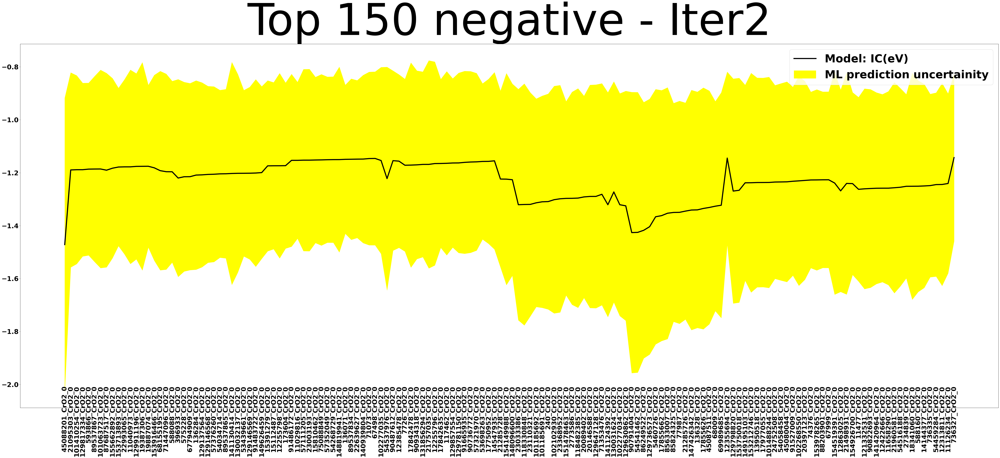

In [23]:
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 30}

mpl.rc('font', **font)

f, ax = plt.subplots(figsize=(80, 30))
ax.tick_params(axis="x",direction="in", pad=-100)
plt.plot(THN.System[:150], THN.Mean[:150], color = "black", label="Model: IC(eV)", linewidth=5)
plt.fill_between(THN.System[:150], THN.Mean[:150]-np.sqrt(THN.Variance[:150]), THN.Mean[:150]+np.sqrt(THN.Variance[:150]), color = "yellow",label="ML prediction uncertainity")

plt.legend(fontsize=50)
#plt.xlim([-3, 3])
#plt.ylim([-3, 3])
#plt.plot([-3, 3], [-3, 3], 'k--')
#plt.yticks(rotation = 45) 
plt.xticks(rotation = 90) 
plt.title("Top 150 negative - Iter2", fontsize = 200)
plt.show()

#f.savefig("Results_Code_2/THN_plot", dpi = 300, transparent = False, facecolor = 'white')

# Check overlap with previous iteration
### Comparing with top 150 predicted from previous interation

In [24]:
THN_combos_minus1 = pd.read_csv('Results_Code_1/Top_150_negative_combos.txt', index_col = None, delimiter = ' ')
THN_combos_minus1

,CID,SMILES,Name
0,58064051,C1=[C]OC2=NC(=S)N=CN21,CrO2
1,57077204,C1=C(N=NO1)C2=CSN=N2,CrO2
2,67828098,C1=NON=C1C2=NSC=N2,CrO2
3,69620675,C1=NSN=C1C2=NN=CO2,CrO2
4,69748996,C1=C(N=NS1)C2=NON=C2,CrO2
...,...,...,...
145,155055298,C1=NC(=C2C(=N1)SC=N2)F,CrO2
146,118209842,C1=COC2=NSN=C21,CrO2
147,137194105,C1=CC2=CC(=N)C=NC2=C1,TiO2
148,20197826,C1=C2C(=CSS2)N=C1,TiO2


In [25]:
Overlap = pd.concat([THN_combos,THN_combos_minus1], axis=0).reset_index()

## Adding "System" column: 
Overlap = Overlap.astype({'CID' :'str'})
system = []
for i in Overlap.index:
    cid_name = Overlap.CID[i]+'_'+Overlap.Name[i]+'_0'
    system.append(cid_name)

Overlap['System'] = pd.DataFrame(system)
Overlap


,index,CID,SMILES,Name,System
0,77192,45088201,C1=CSC2=C3N1C=C3N=C2,CrO2,45088201_CrO2_0
1,57914,21095303,C1=CC2=CP=CC2=C1,CrO2,21095303_CrO2_0
2,142502,101410254,C=C1C=CC(=CC1=C)F,CrO2,101410254_CrO2_0
3,160751,129817334,C1=CC(=C2C(=C1)O2)C=O,CrO2,129817334_CrO2_0
4,13730,593866,C1=CC(=C(C=C1C=O)Cl)F,CrO2,593866_CrO2_0
...,...,...,...,...,...
295,145,155055298,C1=NC(=C2C(=N1)SC=N2)F,CrO2,155055298_CrO2_0
296,146,118209842,C1=COC2=NSN=C21,CrO2,118209842_CrO2_0
297,147,137194105,C1=CC2=CC(=N)C=NC2=C1,TiO2,137194105_TiO2_0
298,148,20197826,C1=C2C(=CSS2)N=C1,TiO2,20197826_TiO2_0


In [26]:
print('Number of materials predicted to be in top 150 again = ', Overlap.duplicated(subset=['System']).sum())

Number of materials predicted to be in top 150 again =  1


In [27]:
NonRepeating = Overlap.drop_duplicates(subset=['System'], keep=False)
Repeating = Overlap[~Overlap.System.isin(NonRepeating.System)].drop_duplicates(subset=['System'])
Repeating

,index,CID,SMILES,Name,System
0,77192,45088201,C1=CSC2=C3N1C=C3N=C2,CrO2,45088201_CrO2_0


In [28]:
## Adding "System" column: 
THN_combos = THN_combos.reset_index()
THN_combos = THN_combos.astype({'CID' :'str'})
system = []
for i in THN_combos.index:
    cid_name = THN_combos.CID[i]+'_'+THN_combos.Name[i]+'_0'
    system.append(cid_name)

THN_combos['System'] = pd.DataFrame(system)
THN_combos

,index,CID,SMILES,Name,System
0,77192,45088201,C1=CSC2=C3N1C=C3N=C2,CrO2,45088201_CrO2_0
1,57914,21095303,C1=CC2=CP=CC2=C1,CrO2,21095303_CrO2_0
2,142502,101410254,C=C1C=CC(=CC1=C)F,CrO2,101410254_CrO2_0
3,160751,129817334,C1=CC(=C2C(=C1)O2)C=O,CrO2,129817334_CrO2_0
4,13730,593866,C1=CC(=C(C=C1C=O)Cl)F,CrO2,593866_CrO2_0
...,...,...,...,...,...
145,15263,736335,C1=CC(=C(C(=C1)Cl)F)C=O,CrO2,736335_CrO2_0
146,86936,54459284,C1=CN=CC2=C1C(=O)N=C2,CrO2,54459284_CrO2_0
147,31286,12313811,C1=CC2=CC=COC2=C1,CrO2,12313811_CrO2_0
148,26939,11126234,C1=CC=C2C(=C1)C(=O)N2,CrO2,11126234_CrO2_0


In [29]:
NonRepeating_combos = THN_combos[~THN_combos.System.isin(Repeating.System)]
NonRepeating_combos = NonRepeating_combos[['CID', 'SMILES', 'Name']]
#NonRepeating_combos.to_csv('Results_Code_2/Top_150_negative_combos_minus_overlap', index=False, sep=' ')
NonRepeating_combos

,CID,SMILES,Name
1,21095303,C1=CC2=CP=CC2=C1,CrO2
2,101410254,C=C1C=CC(=CC1=C)F,CrO2
3,129817334,C1=CC(=C2C(=C1)O2)C=O,CrO2
4,593866,C1=CC(=C(C=C1C=O)Cl)F,CrO2
5,89537867,C1=CC(=O)C=C2C1=CC=P2,CrO2
...,...,...,...
145,736335,C1=CC(=C(C(=C1)Cl)F)C=O,CrO2
146,54459284,C1=CN=CC2=C1C(=O)N=C2,CrO2
147,12313811,C1=CC2=CC=COC2=C1,CrO2
148,11126234,C1=CC=C2C(=C1)C(=O)N2,CrO2


In [30]:
NonRepeating_molecules = NonRepeating_combos[['CID','SMILES']].drop_duplicates()
#NonRepeating_molecules.to_csv('Results_Code_2/Top_150_negative_mols_minus_overlap', index=False, sep=' ')
NonRepeating_molecules

,CID,SMILES
1,21095303,C1=CC2=CP=CC2=C1
2,101410254,C=C1C=CC(=CC1=C)F
3,129817334,C1=CC(=C2C(=C1)O2)C=O
4,593866,C1=CC(=C(C=C1C=O)Cl)F
5,89537867,C1=CC(=O)C=C2C1=CC=P2
...,...,...
145,736335,C1=CC(=C(C(=C1)Cl)F)C=O
146,54459284,C1=CN=CC2=C1C(=O)N=C2
147,12313811,C1=CC2=CC=COC2=C1
148,11126234,C1=CC=C2C(=C1)C(=O)N2


## 2) Top N uncertain - from Bootstrap

In [31]:
THU = ExploreSet.nlargest(150, ['Variance']).sort_values(by=['Name'])
THU_combos = THU[['CID', 'SMILES', 'Name']]
#THU_combos.to_csv('Results_Code_2/Top_150_uncertain_combos', index=False, sep=' ')
THU_combos

,CID,SMILES,Name
163313,130031624,C=C1C=CC=C(C1=O)F,CrO2
70703,23110321,C1=CC2=NN=CC2=CC1=O,CrO2
147983,118330848,C=C1C=C(C(=O)C=C1Cl)Cl,CrO2
44936,17855626,B1=CC=C2C1=CC=C2,CrO2
142229,101185691,C1=CC2=C(C=C2)P=C1,CrO2
...,...,...,...
36236,13447426,C1=C2C(=CS1)C3=CSC=C23,TiS2
54338,20146588,C1=CC(=O)C2=CN=NC2=C1,TiS2
108224,69989685,C1=CC(=O)N=C2C1=CN=C2,TiS2
18680,2773586,C1=CC(=C(C=C1Cl)C=O)F,TiS2


In [32]:
THU_molecules = THU[['CID','SMILES']].drop_duplicates()
#THU_molecules.to_csv('Results_Code_2/Top_150_uncertain_mols', index=False, sep=' ')
THU_molecules

,CID,SMILES
163313,130031624,C=C1C=CC=C(C1=O)F
70703,23110321,C1=CC2=NN=CC2=CC1=O
147983,118330848,C=C1C=C(C(=O)C=C1Cl)Cl
44936,17855626,B1=CC=C2C1=CC=C2
142229,101185691,C1=CC2=C(C=C2)P=C1
...,...,...
210620,154926700,C1=CC2=COC3=CC1=C23
56270,20397123,C1=CC2=C1C=C2C=O
28403,11658290,C1=CC2=C(N=C2C=C1)F
36236,13447426,C1=C2C(=CS1)C3=CSC=C23


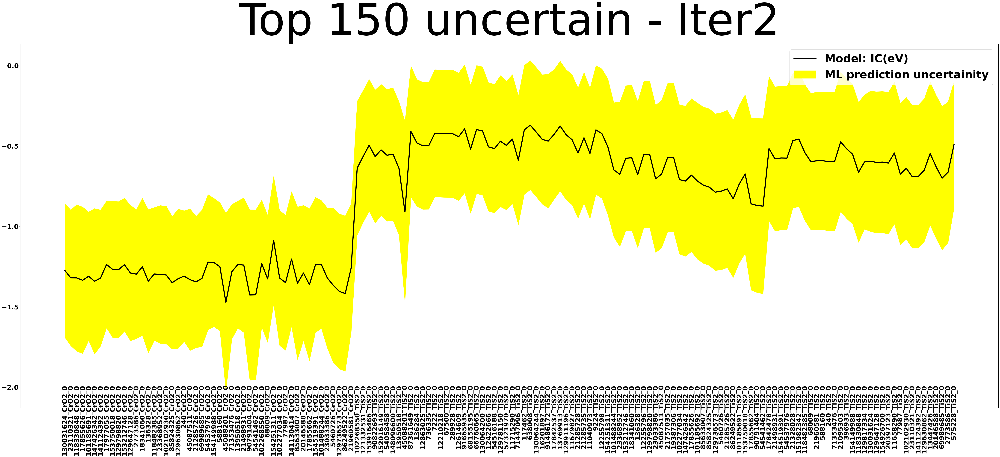

In [33]:
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 30}

mpl.rc('font', **font)

f, ax = plt.subplots(figsize=(80, 30))
ax.tick_params(axis="x",direction="in", pad=-105)
plt.plot(THU.System[:150], THU.Mean[:150], color = "black", label="Model: IC(eV)", linewidth=5)
plt.fill_between(THU.System[:150], THU.Mean[:150]-np.sqrt(THU.Variance[:150]), THU.Mean[:150]+np.sqrt(THU.Variance[:150]), color = "yellow",label="ML prediction uncertainity")

plt.legend(fontsize=50)
#plt.xlim([-3, 3])
#plt.ylim([-3, 3])
#plt.plot([-3, 3], [-3, 3], 'k--')
#plt.yticks(rotation = 45) 
plt.xticks(rotation = 90) 
plt.title("Top 150 uncertain - Iter2", fontsize = 200)
plt.show()

#f.savefig("Results_Code_2/THU_plot", dpi = 300, transparent = False, facecolor = 'white')

## Top N Negative: DFT vs Predicition

In [34]:
IC_5 = pd.read_csv('Results_Code_2/IC_THN_2.txt', delimiter =',')
Gas_5 = pd.read_csv('Results_Code_2/Gas_THN_2.txt', delimiter =',')
IC5 = IC_calculator.IC_calculator(IC_5, Gas_5, Bilayer)
IC5 = IC5.merge(ExploitSet, on=["System"], how = "left")
IC5['Error'] = IC5['Mean'] - IC5['IC_ENERGY']
IC5 = IC5[['System', 'IC_ENERGY', 'Variance', 'Mean', 'Error']].sort_values(by = "Error").dropna()
IC5

,System,IC_ENERGY,Variance,Mean,Error
129,74376_CrO2_0,0.022434,0.110561,-1.227479,-1.249913
67,173604_CrO2_0,-0.192704,0.097843,-1.173413,-0.980709
114,575228_CrO2_0,-0.238343,0.127830,-1.215310,-0.976967
120,67999_CrO2_0,-0.282918,0.110691,-1.226774,-0.943856
121,68009_CrO2_0,-0.410541,0.156688,-1.326553,-0.916012
...,...,...,...,...,...
51,148819941_CrO2_0,-1.777364,0.122392,-1.150493,0.626871
98,45087511_CrO2_0,-2.195260,0.194108,-1.331313,0.863947
30,129736573_CrO2_0,-2.379573,0.232768,-1.403945,0.975628
71,17855626_CrO2_0,-2.637795,0.207981,-1.335085,1.302710


findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


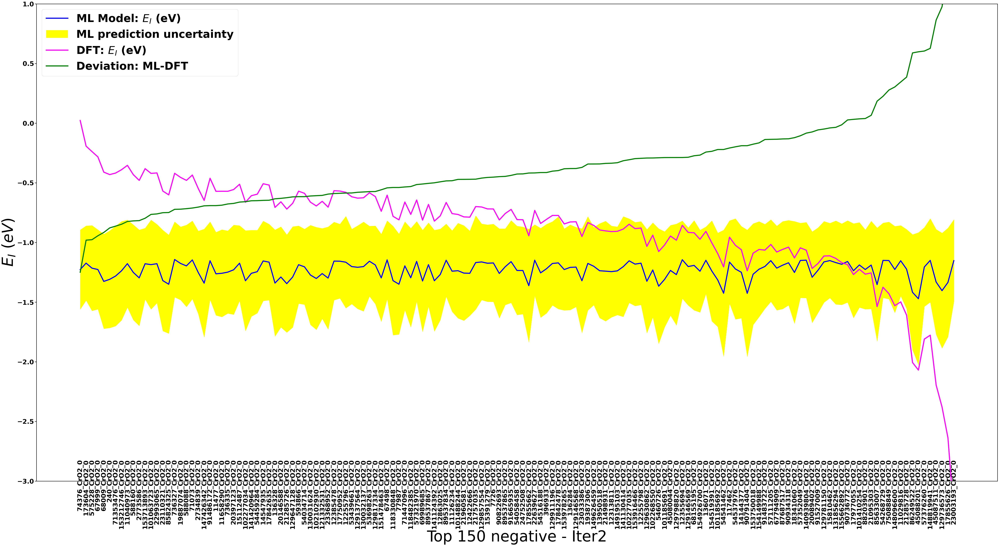

In [42]:
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 30}

mpl.rc('font', **font)

f, ax = plt.subplots(figsize=(80, 40))
ax.tick_params(axis="x",direction="in", pad=-100)
#label_mlr = "$R^2$ = %.2f" % r2_mean

# Increase axis font size
ax.tick_params(axis='both', labelsize=30)

# Increase axis linewidth
ax.spines['top'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)
ax.spines['left'].set_linewidth(2)
ax.spines['right'].set_linewidth(2)

# Increase tick mark thickness and length
ax.tick_params(which='both', width=2, length=8)

plt.plot(IC5.System[:150], IC5.Mean[:150], color = "blue",label="ML Model: $E_I$ (eV)",linewidth=5)
plt.fill_between(IC5.System[:150], IC5.Mean[:150]-np.sqrt(IC5.Variance[:150]), IC5.Mean[:150]+np.sqrt(IC5.Variance[:150]), color = "yellow", label="ML prediction uncertainty")
plt.plot(IC5.System[:150], IC5.IC_ENERGY[:150], color = "magenta", label="DFT: $E_I$ (eV)", linewidth=5)
plt.plot(IC5.System[:150], IC5.Error[:150], color = "green", label="Deviation: ML-DFT",linewidth=5)
plt.ylabel(r"$E_{I}$ ($eV$)", fontsize = 70)
plt.xlabel("Top 150 negative - Iter2", fontsize = 70)
plt.legend(fontsize=50)
#plt.xlim([-3, 3])
plt.ylim([-3, 1])
#plt.yticks(rotation = 45) 
plt.xticks(rotation = 90) 
#plt.title("Top 150 negative - Iter2", fontsize = 200)
plt.show()
 
#f.savefig("Results_Code_2/THN_with_DFT_plot", dpi = 300, transparent = False, facecolor = 'white')

In [36]:
IC5.describe()

,IC_ENERGY,Variance,Mean,Error
count,149.000000,149.000000,149.000000,149.000000
mean,-0.881319,0.141474,-1.232285,-0.350965
std,0.447599,0.040404,0.070244,0.437488
min,-3.273418,0.078743,-1.471701,-1.249913
25%,-1.045248,0.110691,-1.268657,-0.616136
50%,-0.808444,0.133468,-1.224325,-0.426474
75%,-0.608045,0.165694,-1.173828,-0.198288
max,0.022434,0.307095,-1.142956,2.120853


## Top N Uncertain: DFT vs Prediction

In [37]:
IC_6 = pd.read_csv('Results_Code_2/IC_THU_2.txt', delimiter =',')
Gas_6 = pd.read_csv('Results_Code_2/Gas_THU_2.txt', delimiter =',')
IC6 = IC_calculator.IC_calculator(IC_6, Gas_6, Bilayer)
IC6 = IC6.merge(ExploitSet, on=["System"], how = "left")
IC6['Error'] = IC6['Mean'] - IC6['IC_ENERGY']
IC6 = IC6[['System', 'IC_ENERGY', 'Variance', 'Mean', 'Error']].sort_values(by = "Error").dropna()
IC6

,System,IC_ENERGY,Variance,Mean,Error
140,85824325_TiS2_0,0.823776,0.237866,-0.755932,-1.579708
85,21285726_TiS2_0,0.773861,0.239784,-0.766804,-1.540665
10,102277034_TiS2_0,0.822648,0.214979,-0.708967,-1.531615
53,147426342_TiS2_0,0.807549,0.219073,-0.717815,-1.525364
45,136328_TiS2_0,0.842098,0.207468,-0.677897,-1.519995
...,...,...,...,...,...
72,17855626_CrO2_0,-2.622947,0.207981,-1.335085,1.287862
143,87361649_TiS2_0,-1.976498,0.165931,-0.409272,1.567226
142,86249522_TiS2_0,-2.429344,0.240255,-0.827847,1.601497
107,45087511_TiS2_0,-2.326106,0.211378,-0.674595,1.651511


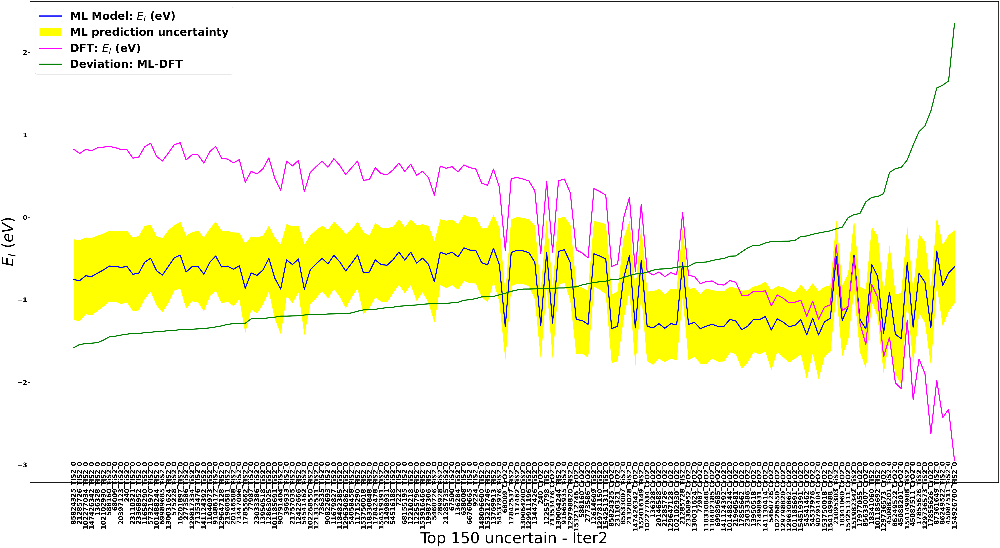

In [43]:
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 30}

mpl.rc('font', **font)

f, ax = plt.subplots(figsize=(80, 40))
ax.tick_params(axis="x",direction="in", pad=-100)

# Increase axis font size
ax.tick_params(axis='both', labelsize=30)

# Increase axis linewidth
ax.spines['top'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)
ax.spines['left'].set_linewidth(2)
ax.spines['right'].set_linewidth(2)

# Increase tick mark thickness and length
ax.tick_params(which='both', width=2, length=8)
#label_mlr = "$R^2$ = %.2f" % r2_mean

plt.plot(IC6.System[:150], IC6.Mean[:150], color = "blue",label="ML Model: $E_I$ (eV)",linewidth=5)
plt.fill_between(IC6.System[:150], IC6.Mean[:150]-np.sqrt(IC6.Variance[:150]), IC6.Mean[:150]+np.sqrt(IC6.Variance[:150]), color = "yellow", label="ML prediction uncertainty")
plt.plot(IC6.System[:150], IC6.IC_ENERGY[:150], color = "magenta", label="DFT: $E_I$ (eV)", linewidth=5)
plt.plot(IC6.System[:150], IC6.Error[:150], color = "green", label="Deviation: ML-DFT",linewidth=5)
plt.ylabel(r"$E_{I}$ ($eV$)", fontsize = 70)
plt.xlabel("Top 150 uncertain - Iter2", fontsize = 70)
plt.legend(fontsize=50)
#plt.xlim([-3, 3])
#plt.ylim([-3, 3])
#plt.yticks(rotation = 45) 
plt.xticks(rotation = 90) 
#plt.title("Top 150 uncertain - Iter2", fontsize = 200)
plt.show()
 
#f.savefig("Results_Code_2/THU_with_DFT_plot", dpi = 300, transparent = False, facecolor = 'white')

In [39]:
IC6.describe()

,IC_ENERGY,Variance,Mean,Error
count,150.000000,150.000000,150.000000,150.000000
mean,-0.091979,0.189562,-0.811965,-0.719986
std,0.916684,0.033371,0.359618,0.716867
min,-2.949703,0.155960,-1.471701,-1.579708
25%,-0.801051,0.164170,-1.248374,-1.195248
50%,0.400915,0.179596,-0.656691,-0.888965
75%,0.633262,0.201719,-0.520485,-0.469208
max,0.902912,0.318794,-0.370281,2.349768


In [40]:
#THN.to_csv('THN_2iter.txt', index=False)

In [41]:
#ExploitSet.to_csv('ExploitSet_2iter.txt', index=False)